In [170]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import transformers
from transformers import AutoModel, BertTokenizerFast
from transformers import RobertaTokenizer, RobertaModel
# from matplotlib import style
import random
import pickle
# style.use("dark_background")
seed_val = 994
random.seed(seed_val)
np.random.seed(seed_val)
torch.manual_seed(seed_val)
torch.cuda.manual_seed_all(seed_val)
device=torch.device("cuda")

In [171]:
# %history
train_df=pd.read_csv("./MELD/data/MELD/train_sent_emo.csv")
val_df=pd.read_csv("./MELD/data/MELD/dev_sent_emo.csv")
test_df=pd.read_csv("./MELD/data/MELD/test_sent_emo.csv")


train_df.head()

# file = open("IEMOCAP_features_bert.pkl",'rb')
# object_file = pickle.load(file)
# file.close()

,Sr No.,Utterance,Speaker,Emotion,Sentiment,Dialogue_ID,Utterance_ID,Season,Episode,StartTime,EndTime
0,1,also I was the point person on my company’s tr...,Chandler,neutral,neutral,0,0,8,21,"00:16:16,059","00:16:21,731"
1,2,You must’ve had your hands full.,The Interviewer,neutral,neutral,0,1,8,21,"00:16:21,940","00:16:23,442"
2,3,That I did. That I did.,Chandler,neutral,neutral,0,2,8,21,"00:16:23,442","00:16:26,389"
3,4,So let’s talk a little bit about your duties.,The Interviewer,neutral,neutral,0,3,8,21,"00:16:26,820","00:16:29,572"
4,5,My duties? All right.,Chandler,surprise,positive,0,4,8,21,"00:16:34,452","00:16:40,917"


0    4710
4    1743
1    1205
6    1109
3     683
5     271
2     268
Name: Emotion, dtype: int64


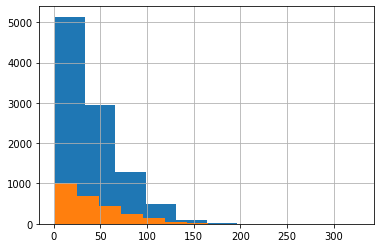

In [172]:

mapping ={'neutral':0, 'surprise':1, 'fear':2, 'sadness':3, 'joy':4, 'disgust':5, 'anger':6}

mapping2={"Chandler":0,"Phoebe":1,"Monica":2,"Ross":3,"Joey":4,"Rachel":5}

train_df=train_df.replace({"Emotion":mapping})# mapping labels to integer
val_df=val_df.replace({"Emotion":mapping})
test_df=test_df.replace({"Emotion":mapping})

train_df=train_df.replace({"Speaker":mapping2})# mapping labels to integer
val_df=val_df.replace({"Speaker":mapping2})
test_df=test_df.replace({"Speaker":mapping2})


train_text=train_df["Utterance"].tolist()
val_text=val_df["Utterance"].tolist()
test_text=test_df["Utterance"].tolist()


train_labels=train_df["Emotion"]
val_labels=val_df["Emotion"]
test_labels=test_df["Emotion"]

train_dia_id=train_df["Dialogue_ID"]
val_dia_id=val_df["Dialogue_ID"]
test_dia_id=test_df["Dialogue_ID"]

train_speaker=train_df["Speaker"]
val_speaker=val_df["Speaker"]
test_speaker=test_df["Speaker"]

# print(train_text,train_labels)

len_train=[len(j) for j in train_text]
len_test=[len(i) for i in test_text]

pd.Series(len_train).hist()
pd.Series(len_test).hist()

print(train_df.Emotion.value_counts())



In [173]:
print(train_text[6])
print(train_df["Speaker"].value_counts())



I see.
4                   1510
3                   1458
5                   1435
1                   1321
2                   1299
                    ... 
Phoebe/Waitress        1
Vince                  1
Gary Collins           1
Hold Voice             1
Front Desk Clerk       1
Name: Speaker, Length: 260, dtype: int64


In [174]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification
tokenizer = RobertaTokenizer.from_pretrained('roberta-large')
model = RobertaModel.from_pretrained('roberta-large')

Some weights of the model checkpoint at roberta-large were not used when initializing RobertaModel: ['lm_head.layer_norm.weight', 'lm_head.layer_norm.bias', 'lm_head.dense.weight', 'lm_head.dense.bias', 'lm_head.bias', 'lm_head.decoder.weight']
- This IS expected if you are initializing RobertaModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [175]:
tokens_train=tokenizer(train_text,
                                         max_length=80,
                                         padding=True,
                                         truncation=True)

tokens_val=tokenizer(val_text,
                                         max_length=80,
                                         padding=True,
                                         truncation=True)

tokens_test=tokenizer(test_text,
                                         max_length=80,
                                         padding=True,
                                         truncation=True)

In [176]:
train_seq=torch.tensor(tokens_train["input_ids"])
train_mask=torch.tensor(tokens_train["attention_mask"])
train_label=torch.tensor(train_labels.tolist())

val_seq=torch.tensor(tokens_val["input_ids"])
val_mask=torch.tensor(tokens_val["attention_mask"])
val_label=torch.tensor(val_labels.tolist())

test_seq=torch.tensor(tokens_test["input_ids"])
test_mask=torch.tensor(tokens_test["attention_mask"])
test_label=torch.tensor(test_labels.tolist())

In [177]:
from torch.utils.data import DataLoader,TensorDataset,RandomSampler, SequentialSampler
batch_size=32

train_data=TensorDataset(train_seq,train_mask,train_label)
train_sampler=SequentialSampler(train_data)
train_dataloader=DataLoader(train_data,sampler=train_sampler,batch_size=batch_size)

val_data=TensorDataset(val_seq,val_mask,val_label)
val_sampler=SequentialSampler(val_data)
val_dataloader=DataLoader(val_data,sampler=val_sampler,batch_size=batch_size)

test_data=TensorDataset(test_seq,test_mask,test_label)
print(len(test_data[0][0]))
test_sampler=SequentialSampler(test_data)
test_dataloader=DataLoader(test_data,sampler=test_sampler,batch_size=batch_size)
print(len(test_dataloader))

65
82


In [178]:
from tqdm.notebook import tqdm_notebook
print(type(train_speaker))
# modules=[bert.encoder.layer[:1]]
# for module in modules:
#     for param in module.parameters():
#         param.requires_grad=False

# for name, param in list(bert.named_parameters())[:-79]: 
#     print('I will be frozen: {}'.format(name)) 
#     param.requires_grad = False


<class 'pandas.core.series.Series'>


In [179]:
# model=BERT_model(bert)
# model=AutoModel.from_pretrained("roberta-large")

model_rob=model.to(device)

In [180]:
torch.cuda.empty_cache()
model.eval()
train_embed=[]
val_embed=[]
test_embed=[]
with torch.no_grad():
    for step,batch in tqdm_notebook(enumerate(test_dataloader),total=len(test_dataloader)):        
            
        batch=[r.to(device) for r in batch]
        
        sent_id,mask,labels=batch
                
        preds=model(sent_id,mask)[1]    # size  16*1024 batxh_size*encoding


        preds=preds.detach().cpu().numpy()

        test_embed.append(preds)
        
    for step,batch in tqdm_notebook(enumerate(val_dataloader),total=len(val_dataloader)):        
            
        batch=[r.to(device) for r in batch]
        
        sent_id,mask,labels=batch
                
        preds=model(sent_id,mask)[1]    # size  16*1024 batxh_size*encoding

        preds=preds.detach().cpu().numpy()

        val_embed.append(preds)
        
    for step,batch in tqdm_notebook(enumerate(train_dataloader),total=len(train_dataloader)):        
            
        batch=[r.to(device) for r in batch]
        
        sent_id,mask,labels=batch
                
        preds=model(sent_id,mask)[1]    # size  16*1024 batxh_size*encoding


        preds=preds.detach().cpu().numpy()

        train_embed.append(preds)
        
    train_embed=np.concatenate(train_embed,axis=0)
    val_embed=np.concatenate(val_embed,axis=0)
    test_embed= np.concatenate(test_embed,axis=0)

 


  0%|          | 0/82 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/313 [00:00<?, ?it/s]

In [181]:
# total_preds= np.concatenate(total_preds,axis=0)
print(len(train_embed))
print(len(val_embed))
print(len(test_embed))
train_embed=torch.tensor(train_embed)  #changing to tensor
val_embed=torch.tensor(val_embed)
test_embed=torch.tensor(test_embed)
print(train_embed.shape)


9989
1109
2610
torch.Size([9989, 1024])


In [182]:
import dgl
from dgl.nn import GraphConv
import graph4nlp


In [183]:
class GCN(nn.Module):
    def __init__(self,in_f,o_f,num_label):
        super().__init__()
        self.conv1=GraphConv(in_f,o_f)
        self.conv2=GraphConv(in_f,o_f)
#         self.conv3=GraphConv(in_f,o_f)
#         self.conv4=GraphConv(in_f,o_f)
        self.fc1=nn.Linear(2*o_f,num_label)
        
    def forward(self,g,in_f):
        h=self.conv1(g,in_f)
        h=F.relu(h)
        h=self.conv2(g,h)
        h=F.relu(h)
#         h=self.conv3(g,h)
#         h=F.relu(h)
#         h=self.conv4(g,h)
#         h=F.relu(h)
        h=self.fc1(torch.cat((in_f,h) ,dim=-1))[3]
#         h=F.softmax(h,dim=1)
        
        return h
        
        
        

In [184]:
model_rob = RobertaModel.from_pretrained('roberta-large')
model_rob=model_rob.to(device)
def roberta_emb(word):
#     print(word)
    tokens=tokenizer(word,
                     return_tensors="pt")
    tokens=tokens.to(device)
    print(tokens)
    emb=model_rob(**tokens)
#     print(model.device)
#     print(emb.pooler_output[0].shape)
    return emb.pooler_output[0]
    
# roberta_emb("no!")    

Some weights of the model checkpoint at roberta-large were not used when initializing RobertaModel: ['lm_head.layer_norm.weight', 'lm_head.layer_norm.bias', 'lm_head.dense.weight', 'lm_head.dense.bias', 'lm_head.bias', 'lm_head.decoder.weight']
- This IS expected if you are initializing RobertaModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [185]:
# import nltk
# nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# train_speaker=train_speaker[1:]
def senti_word_emb(sentence):
#     print(sentence)
    sia = SentimentIntensityAnalyzer()
    word_list=sentence.split()
#     print(word_list)
    sentiment=[]
    max_val=0
    for i in word_list:
        a=sia.polarity_scores(i)
        if max_val<abs(a["compound"]):
            max_val=abs(a["compound"])
            
        sentiment.append(abs(a["compound"]))
#     print(sentiment) 
#     print(sentiment.index(max(sentiment)))
    if max_val>0.2:
    
        emb=roberta_emb(word_list[sentiment.index(max(sentiment))])
#         print(emb)
        return emb
    else:
        return None
    
#     print(a)    
        
# senti_word_emb(train_text[16])  

In [186]:
graphs=[]
# u,v=torch.tensor([0,1,2]),torch.tensor([1,2,3])
# g=dgl.graph((u,v))
# g.ndata["emb"]=train_embed[:g.num_nodes()]
# print(g.device)
for i,e in enumerate(train_embed):
    if i>= (3):
        
#         u,v=torch.tensor([0,1,2]),torch.tensor([1,2,3])
        u,v=[0,1,2],[1,2,3]
#         k=[0,1,2,3,4,5]
        speakers=train_speaker[i-3:i+1]
#         print(speakers)
        speakers=speakers.tolist()
        text=train_text[i-3:i+1]
        emb=[]
        loca=[]
        for loc,txt in enumerate(text):
            if senti_word_emb(txt)!=None:
                emb.append(senti_word_emb(txt).tolist())
                loca.append(loc)
#                 print(txt)
        print("lcoa before pop",loca)
        print("speakers before pop",speakers)
#         temp=loca.copy()
#         remove_index=[]
        for j,z in reversed(list(enumerate(loca))):
            if isinstance(speakers[z],str):         
                print("j",j)                               #reverse before poppong for correct index
#                 remove_index.append(j)
                loca.pop(j)
                emb.pop(j)
        
        print("loca afer pop",loca)
#         print(speakers)
        k=[]
        speaker_node=[]
        for idx in range(3+1):
            if isinstance(speakers[idx],int):
                k.append(idx)
                speaker_node.append(speakers[idx])
        print("before k spnode",k,speaker_node)
    
        unique_speaker_nodes=set(speaker_node)
        
        
        speaker_emb=torch.zeros(len(unique_speaker_nodes),1024)
        
        for ix,xd in enumerate(unique_speaker_nodes):
            torch.manual_seed(xd)
            speaker_emb[ix]=torch.rand(1024)
        

        
        
#         print(speaker_emb)
        
        
        for z,l in enumerate(speaker_node):
            for ind,m in enumerate(unique_speaker_nodes):
                if l==m:
                    speaker_node[z]=4+ind   
                    
       
        unique_words=len(loca)
        if len(speaker_node)!=0:
            last_node=max(speaker_node)
        else:
            last_node=3
#         print("leastnode",last_node)
        word_nodes=[]
        if len(loca)!=0:
            for z in range(len(loca)):
                
                word_nodes.append(last_node+z+1)
        
        print("word?nodes",word_nodes)
            
        word_to_utt=loca
        word_to_speaker=[]
        speaker_to_word=word_nodes
        
        print("speaker_node",speaker_node)
        print("loca",loca)
        print("w2s",word_to_speaker)
            
        print()
        for j,z in enumerate(loca):
            word_to_speaker.append(speaker_node[k.index(z)])
            
        in_feat=train_embed[i-3:i+1]
        if len(unique_speaker_nodes)!=0:
                
                emb=torch.tensor(emb)
#                 print(emb.shape)
#                 k=torch.tensor(k)
#                 speaker_node=torch.tensor(speaker_node)
#                 word_nodes=torch.tensor(word_nodes)
#                 word_to_utt=torch.tensor(word_to_utt)
#                 word_to_speaker=torch.tensor(word_to_speaker)
#                 speaker_to_word=torch.tensor(speaker_to_word)
                u=u+k+word_to_utt+word_to_speaker
                v=v+speaker_node+word_nodes+speaker_to_word
#                 u=(torch.cat((u,k,word_to_utt,word_to_speaker),0))
#                 v=(torch.cat((v,speaker_node,word_nodes,speaker_to_word),0))
                in_feat=torch.cat((train_embed[i-3:i+1],speaker_emb,emb),0)
        print("speaker",k)
        print("now",u,v)
            
#         for idx,sp in enumerate(speakers):
#             if isinstance(sp,str):
#                 print(idx)
#                 k.pop(idx)
#                 speakers.pop(idx)
#         print("ag¥frt",speakers,k)
#         speakers=train_speaker[i-5:i+1]
#         print(speakers)
#         speakers=speakers.unique()
#         print(speakers)
#         main_speakers=[e for e in speakers if isinstance(e,int)]  
#         for e in main_speakers:
#             print(e)
#         print(train_embed[i-5:i+1])
        print(i)
        if i==16:
            print(u,v,in_feat.shape)
            print("loca",loca)
            print("w2s",word_to_speaker)
            print(speaker_node)
            print()
        g=dgl.graph((u,v))
#         print(in_feat) 
        bg=dgl.to_bidirected(g)
        bg.ndata["emb"]=in_feat
        print(bg.ndata["emb"])
        
#         print(in_feat.shape)
        
        
        graphs.append(bg)
    
#     if i==4:
#         u,v=torch.tensor([0,1,2,3]),torch.tensor([1,2,3,4])
#         g=dgl.graph((u,v))
#         g.ndata["emb"]=train_embed[0:5]
#         graphs.append(g)
    
#     if i==3:
#         u,v=torch.tensor([0,1,2]),torch.tensor([1,2,3])
#         g=dgl.graph((u,v))
#         g.ndata["emb"]=train_embed[0:4]
#         graphs.append(g)
        
#     if i==2:
#         u,v=torch.tensor([0,1]),torch.tensor([1,2])
#         g=dgl.graph((u,v))
#         g.ndata["emb"]=train_embed[0:3]
#         graphs.append(g)
#     if i==1:
#         u,v=torch.tensor([0]),torch.tensor([1])
#         g=dgl.graph((u,v))
#         g.ndata["emb"]=train_embed[0:2]
#         graphs.append(g)
#     if i==0:
#         u,v=torch.tensor([0]),torch.tensor([0])
#         g=dgl.graph((u,v),num_nodes=1)
#         g.ndata["emb"]=torch.tensor([train_embed[0]])

lcoa before pop []
speakers before pop [0, 'The Interviewer', 0, 'The Interviewer']
loca afer pop []
before k spnode [0, 2] [0, 0]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
3
tensor([[ 0.0380,  0.7304,  0.3524,  ...,  0.1525,  0.2493, -0.0878],
        [ 0.0249,  0.7157,  0.3511,  ...,  0.2244,  0.2604, -0.1015],
        [ 0.0977,  0.7286,  0.3353,  ...,  0.2120,  0.2938, -0.1710],
        [ 0.0643,  0.7319,  0.3572,  ...,  0.1714,  0.2940, -0.0934],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210]])
lcoa before pop []
speakers before pop ['The Interviewer', 0, 'The Interviewer', 0]
loca afer pop []
before k spnode [1, 3] [0, 0]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
4
tensor([[ 0.0249,  0.7157,  0.3511,  ...,  0.2244,  0.2604, -0.1015],
        [ 0.0977,  0.7286,  0.3353,  ...,  0.2120,  0.2938, -0.1710],
        [ 0.0643,  0.7319,  0.3572,  ...,

{'input_ids': tensor([[    0, 22326,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop ['The Interviewer', 0, 'The Interviewer', 0]
j 1
loca afer pop [1]
before k spnode [1, 3] [0, 0]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
12
tensor([[ 1.7329e-01,  7.0026e-01,  4.6195e-01,  ...,  6.7265e-04,
          4.0141e-01, -3.6095e-01],
        [ 1.2071e-01,  6.6764e-01,  4.8257e-01,  ...,  2.2350e-02,
          3.7125e-01, -3.3142e-01],
        [ 5.3791e-02,  7.3258e-01,  3.3591e-01,  ...,  1.2220e-01,
          3.2891e-01, -4.1262e-02],
        [ 1.7319e-01,  6.9336e-01,  4.7140e-01,  ..., -2.9440e-02,
          3.9921e-01, -3.7330e-01],
        [ 4.9626e-01,  7.6822e-01,  8.8477e-02,  ...,  1.8763e-01,
          2.0985e-01,  7.2100e-01],
        [ 1.3873e-01,  7.0431e-01,  4.4103e-01,  ...,  3.0941e-02,
          4.0149e-01, -3.8003e

{'input_ids': tensor([[    0, 26752,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 4, 5, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 4, 5, 4]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
18
tensor([[ 0.1601,  0.6748,  0.4776,  ...,  0.0021,  0.3614, -0.3797],
        [ 0.1397,  0.6893,  0.5032,  ..., -0.0047,  0.4153, -0.3879],
        [ 0.1697,  0.6824,  0.4977,  ...,  0.0201,  0.4046, -0.3919],
        ...,
        [ 0.1452,  0.6916,  0.4731,  ..., -0.0259,  0.4035, -0.3773],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1647,  0.6881,  0.4641,  ..., -0.0105,  0.3908, -0.3642]])
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], d

{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [0, 2, 0, 2]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
26
tensor([[ 0.1465,  0.7355,  0.3661,  ...,  0.1554,  0.2735, -0.2096],
        [ 0.0040,  0.7118,  0.3526,  ...,  0.1788,  0.2883, -0.1432],
        [ 0.1585,  0.6824,  0.4805,  ...,  0.0026,  0.4066, -0.3866],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1387,  0.7043,  0.4410,  ...,  0.0309, 

tensor([[ 0.1605,  0.6816,  0.4762,  ..., -0.0017,  0.3872, -0.3975],
        [ 0.1762,  0.7025,  0.4705,  ...,  0.0084,  0.3975, -0.3712],
        [ 0.1887,  0.6882,  0.4449,  ..., -0.0141,  0.3944, -0.3871],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1682,  0.7004,  0.4426,  ...,  0.0105,  0.4178, -0.3741],
        [ 0.1538,  0.7049,  0.4505,  ...,  0.0051,  0.3998, -0.3833]])
{'input_ids': tensor([[    0, 42803,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 43094,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 43094,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [0, 1, 0, 1]
loca afer pop [0, 1]
before k 

lcoa before pop [0, 1]
speakers before pop [1, 1, 4, 5]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [1, 1, 4, 5]
word?nodes [7, 8]
speaker_node [4, 4, 5, 6]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 4] [1, 2, 3, 4, 4, 5, 6, 7, 8, 7, 8]
43
tensor([[ 0.1731,  0.6682,  0.4803,  ...,  0.0160,  0.3566, -0.4132],
        [-0.0293,  0.6911,  0.2992,  ...,  0.3195,  0.1237, -0.0951],
        [ 0.1015,  0.7112,  0.3557,  ...,  0.1786,  0.2828, -0.1852],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1428,  0.6964,  0.4629,  ..., -0.0013,  0.4090, -0.3668],
        [ 0.1785,  0.7097,  0.4433,  ...,  0.0018,  0.4037, -0.3786]])
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [1, 4, 

{'input_ids': tensor([[    0,   642, 22552,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   642, 22552,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   267, 30783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   267, 30783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 3, 5, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
54
tensor([[ 7.3189e-02,  7.3638e-01,  3.8005e-01,  ...,  1.2376e-01,
          3.2323e-01, -8.7642e-02],
        [ 6.4144e-02,  7.2143e-01,  3.3568e-01,  ...,  2.1193e-01,
       

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [5, 1, 4, 1]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 1, 4, 1]
word?nodes [7]
speaker_node [6, 4, 5, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 6] [1, 2, 3, 6, 4, 5, 4, 7, 7]
60
tensor([[ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.1334,  0.7465,  0.3666,  ...,  0.1278,  0.2818, -0.2021],
        [ 0.1513,  0.7414,  0.3528,  ...,  0.1324,  0.2914, -0.1981],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973]])
lcoa before pop []
speakers before pop [1, 4, 1, 'Sergei']
loca afer pop []
before k spnode [0, 1, 2] [1, 4, 1]
word?nodes []
speaker_node [4, 5, 4]
loca []
w2s []

speaker [0, 1, 2

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [0, 4, 0, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [0, 4, 0, 4]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
69
tensor([[ 0.1625,  0.6572,  0.4926,  ..., -0.0397,  0.3718, -0.3811],
        [ 0.0895,  0.7179,  0.3326,  ...,  0.2150,  0.2490, -0.1462],
        [ 0.1647,  0.6913,  0.4969,  ..., -0.0319,  0.3961, -0.3870],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
    

lcoa before pop []
speakers before pop [4, 4, 4, 0]
loca afer pop []
before k spnode [0, 1, 2, 3] [4, 4, 4, 0]
word?nodes []
speaker_node [5, 5, 5, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 5, 5, 4]
76
tensor([[ 0.0891,  0.6797,  0.4907,  ..., -0.0075,  0.4115, -0.3236],
        [ 0.0769,  0.7360,  0.3480,  ...,  0.1949,  0.2691, -0.0831],
        [-0.0022,  0.7250,  0.3093,  ...,  0.2091,  0.2524, -0.0605],
        [ 0.1103,  0.6732,  0.4786,  ...,  0.0039,  0.3973, -0.3476],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
lcoa before pop []
speakers before pop [4, 4, 0, 0]
loca afer pop []
before k spnode [0, 1, 2, 3] [4, 4, 0, 0]
word?nodes []
speaker_node [5, 5, 4, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 5, 4, 4]
77
tensor([[ 0.0769,  0.7360,  0.3480,  ...,  0.1949,  0.2691, -0.0831],
        [-0.0022,  0.7250,  0.3

{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [0, 4, 3, 1]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [0, 4, 3, 1]
word?nodes [8, 9]
speaker_node [4, 7, 6, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 7, 5] [1, 2, 3, 4, 7, 6, 5, 8, 9, 8, 9]
86
tensor([[ 5.9531e-02,  7.4244e-01,  3.4138e-01,  ...,  2.1410e-01,
          2.7416e-01, -1.4200e-01],
        [ 9.2179e-02,  7.2330e-01,  3.9645e-01,  ...,  1.4379e-01,
          2.6717e-01, -1.2025e-01],
        [ 1.7299e-01,  6.8365e-01,  4.8823e-01,  ..., -2.7019e-05,
          4.0394e-01, -3.5812e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.8050e-01,  7.0872e-01,  4.5615e-

tensor([[-0.0223,  0.7431,  0.3068,  ...,  0.2862,  0.2381, -0.0382],
        [ 0.0624,  0.7269,  0.3091,  ...,  0.1648,  0.2942, -0.1459],
        [ 0.0797,  0.7306,  0.3597,  ...,  0.1459,  0.2539, -0.1775],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1705,  0.7035,  0.4810,  ..., -0.0027,  0.3933, -0.3716],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552]])
{'input_ids': tensor([[    0, 19065,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [0, 'Customer', 0, 0]
l

{'input_ids': tensor([[    0, 19065,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['Jade', 0, 'Jade', 0]
j 0
loca afer pop [3]
before k spnode [1, 3] [0, 0]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
102
tensor([[ 0.1395,  0.6756,  0.4866,  ..., -0.0343,  0.4025, -0.3662],
        [ 0.0339,  0.7535,  0.2904,  ...,  0.1562,  0.2250, -0.0857],
        [ 0.1043,  0.7353,  0.3868,  ...,  0.1769,  0.2908, -0.1600],
        [ 0.1114,  0.7554,  0.3856,  ...,  0.1587,  0.2756, -0.2060],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.0859,  0.72

{'input_ids': tensor([[    0, 27387,    29,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27387,    29,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 0, 1, 1]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 0, 1, 1]
word?nodes [7, 8, 9]
speaker_node [6, 4, 5, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 6, 4, 5] [1, 2, 3, 6, 4, 5, 5, 7, 8, 9, 7, 8, 9]
108
tensor([[ 0.0905,  0.7333,  0.3151,  ...,  0.1886,  0.2824, -0.2058],
        [ 0.1525,  0.7154,  0.4542,  ..., -0.0234,  0.4136, -0.3636],
        [ 0.1790,  0.6831,  0.4619,  ...,  0.0023,  0.4082, -0.3720],
        ...,
        [ 0.1530,  0.7138,  0.3428,  ...,  0.0930,  0.3050, -0.2434],
        [ 0.1489,  0.7033,  0.4264,  ..., -0.0073,  0.3872, -0.3557],
        [ 0.1500,  0.7067,  0.4339,  ..., -0.0178,  0.4124, -0.3734]])
{'

{'input_ids': tensor([[    0, 45089,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45089,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 3, 0, 1]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 3, 0, 1]
word?nodes [8, 9]
speaker_node [6, 7, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 7, 5] [1, 2, 3, 6, 7, 4, 5, 8, 9, 8, 9]
117
tensor([[ 0.1145,  0.6647,  0.4850,  ...,  0.0073,  0.3795, -0.3496],
        [-0.0173,  0.7190,  0.3460,  ...,  0.2140,  0.2322, -0.0879],
        [ 0.1917,  0.7432,  0.3610,  ...,  0.2305,  0.3015, -0.1686],
        ..

{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 1, 0, 4]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [4, 1, 0, 4]
word?nodes [7, 8]
speaker_node [6, 5, 4, 6]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 6] [1, 2, 3, 6, 5, 4, 6, 7, 8, 7, 8]
124
tensor([[ 1.6685e-01,  7.0072e-01,  4.5784e-01,  ...,  1.6526e-02,
          3.8994e-01, -3.6364e-01],
        [ 9.7475e-02,  6.8586e-01,  4.7460e-01,  ...,  1.1362e-02,
          3.8457e-01, -3.2980e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.7524e-01,  7.0163e-01,  4.5081e-01,  ..., -3.0693

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 4, 4, 0]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 0]
word?nodes [6, 7]
speaker_node [5, 5, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 6, 7]
131
tensor([[ 0.1646,  0.6932,  0.4707,  ..., -0.0088,  0.3976, -0.3812],
        [ 0.1122,  0.7178,  0.3155,  ...,  0.2132,  0.2622, -0.1076],
        [ 0.0514,  0.7211,  0.3583,  ...,  0.2049,  0.3135, -0.0865],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1658,  0.7094,  0.4540,  ..., -0.0220,  0.4177, -0.3710],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[    0, 32981,     2]], device

{'input_ids': tensor([[    0, 34798,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [4, 'Mona', 3, 'Mona']
j 2
j 1
loca afer pop [0]
before k spnode [0, 2] [4, 3]
word?nodes [6]
speaker_node [5, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 5] [1, 2, 3, 5, 4, 6, 6]
137
tensor([[ 0.1673,  0.6614,  0.4794,  ..., -0.0222,  0.3534, -0.3820],
        [ 0.1670,  0.6906,  0.4744,  ...,  0.0156,  0.4148, -0.3759],
        [ 0.0828,  0.7274,  0.3710,  ...,  0.1548,  0.2919, -0.0671],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1663,  0.7045,  0.4467,  ..., -0.0069,  0.3965, -0.3875]])
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attenti

lcoa before pop [3]
speakers before pop ['Mona', 3, 'Charlie', 3]
loca afer pop [3]
before k spnode [1, 3] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
147
tensor([[ 1.9503e-02,  7.1457e-01,  3.3593e-01,  ...,  2.4143e-01,
          2.6400e-01, -1.0543e-01],
        [ 1.4346e-01,  7.0190e-01,  4.5905e-01,  ..., -1.0058e-02,
          4.0286e-01, -3.9200e-01],
        [ 1.2315e-01,  6.6937e-01,  5.0516e-01,  ..., -1.1668e-02,
          3.4315e-01, -3.5083e-01],
        [ 1.4918e-01,  7.0598e-01,  4.5336e-01,  ...,  6.9849e-06,
          3.9106e-01, -3.3708e-01],
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 1.3775e-01,  6.8640e-01,  4.5604e-01,  ...,  2.7650e-03,
          4.0060e-01, -3.9806e-01]])
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([

{'input_ids': tensor([[   0, 7885,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Charlie', 3, 'Charlie', 3]
j 1
j 0
loca afer pop [3]
before k spnode [1, 3] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
153
tensor([[ 0.1890,  0.6828,  0.4919,  ...,  0.0292,  0.3910, -0.3818],
        [ 0.1945,  0.6992,  0.4753,  ..., -0.0013,  0.4064, -0.3705],
        [ 0.1028,  0.7345,  0.2851,  ...,  0.2557,  0.2325, -0.1200],
        [ 0.1311,  0.7048,  0.4735,  ...,  0.0211,  0.3428, -0.3841],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1396,  0.6

tensor([[ 0.0631,  0.7233,  0.3059,  ...,  0.1862,  0.2285, -0.1429],
        [ 0.0781,  0.7123,  0.3349,  ...,  0.2025,  0.2097, -0.0867],
        [ 0.1572,  0.6829,  0.4654,  ..., -0.0067,  0.3774, -0.3773],
        [ 0.1578,  0.6982,  0.4662,  ..., -0.0240,  0.4249, -0.3831],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1625,  0.7080,  0.4700,  ...,  0.0213,  0.4274, -0.3505]])
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attenti

{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [3, 3, 3, 5]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 5]
word?nodes [6, 7]
speaker_node [4, 4, 4, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 4, 4, 5, 6, 7, 6, 7]
169
tensor([[ 0.1109,  0.7478,  0.3786,  ...,  0.1769,  0.2671, -0.2052],
        [ 0.1449,  0.6552,  0.5013,  ..., -0.0139,  0.3628, -0.4005],
        [ 0.1628,  0.6507,  0.5096,  ..., -0.0204,  0.3421, -0.4076],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1716,  0.7038,  0.4506,  ...,  0.0090,  0.3834, -0.3635],
        [ 0.1519,  0.6916,  0.4584,  ..., -0.0025,  0.4078, -0.4070]])
{'input_ids': tensor([[   

tensor([[ 0.0780,  0.7157,  0.3074,  ...,  0.2117,  0.2821, -0.1707],
        [ 0.1435,  0.7234,  0.2968,  ...,  0.1724,  0.2210, -0.0989],
        [ 0.1006,  0.7587,  0.3568,  ...,  0.2229,  0.3018, -0.2000],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.1574,  0.7077,  0.4390,  ...,  0.0124,  0.4145, -0.3728]])
{'input_ids': tensor([[    0, 34819,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34819,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [4, 4, 0, 2]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [4, 4, 0, 2]
word?nodes [7]
speaker_node [6, 6, 4, 5]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 6] [1, 2, 3, 6, 6, 4, 5, 7, 7]
177
tensor([[ 0.1435,  0.7234,  0.2968,  ...,  0.1724,  0.2210, -0.0989],


tensor([[ 0.1767,  0.6697,  0.4895,  ..., -0.0023,  0.3932, -0.3570],
        [ 0.1371,  0.6988,  0.4664,  ..., -0.0153,  0.3863, -0.3826],
        [ 0.1371,  0.6988,  0.4664,  ..., -0.0153,  0.3863, -0.3826],
        [ 0.1451,  0.7027,  0.4929,  ...,  0.0016,  0.3971, -0.3641],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
lcoa before pop []
speakers before pop ['Caitlin', 3, 3, 4]
loca afer pop []
before k spnode [1, 2, 3] [3, 3, 4]
word?nodes []
speaker_node [4, 4, 5]
loca []
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3] [1, 2, 3, 4, 4, 5]
186
tensor([[ 0.1371,  0.6988,  0.4664,  ..., -0.0153,  0.3863, -0.3826],
        [ 0.1371,  0.6988,  0.4664,  ..., -0.0153,  0.3863, -0.3826],
        [ 0.1451,  0.7027,  0.4929,  ...,  0.0016,  0.3971, -0.3641],
        [ 0.1051,  0.7416,  0.3327,  ...,  0.2022,  0.3135, -0.2072],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]]

lcoa before pop [0]
speakers before pop [4, 4, 3, 4]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [4, 4, 3, 4]
word?nodes [6]
speaker_node [5, 5, 4, 5]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 5, 4, 5, 6, 6]
193
tensor([[ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624],
        [ 0.1307,  0.7254,  0.3384,  ...,  0.1083,  0.2629, -0.2082],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624]])
lcoa before pop []
speakers before pop [4, 3, 4, 4]
loca afer pop []
before k spnode [0, 1, 2, 3] [4, 3, 4, 4]
word?nodes []
speaker_node [5, 4, 5, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 4, 5, 5]
194
tensor([[ 0.1307,  0.7254,  0.3384,  ...,  0.1083,  0.2629, -0.2082],


lcoa before pop [1, 2, 3]
speakers before pop [5, 4, 1, 4]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 4, 1, 4]
word?nodes [7, 8, 9]
speaker_node [6, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 6, 5, 4, 5, 7, 8, 9, 7, 8, 9]
201
tensor([[ 0.1459,  0.6900,  0.4617,  ..., -0.0072,  0.3941, -0.3859],
        [ 0.1590,  0.6944,  0.4642,  ..., -0.0142,  0.4096, -0.3793],
        [ 0.0865,  0.6713,  0.4694,  ..., -0.0067,  0.4210, -0.3402],
        ...,
        [ 0.1698,  0.7125,  0.4476,  ...,  0.0116,  0.3982, -0.3803],
        [ 0.1590,  0.6965,  0.4597,  ..., -0.0123,  0.4066, -0.3768],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799]])
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0

{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  282, 8649, 1827,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  282, 8649, 1827,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 4, 4, 4]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
207
tensor([[ 1.6737e-01,  6.8687e-01,  4.6955e-01,  ...,  1.9251e-02,
          3.6977e-01, -3.8848e-01],
        [ 1.1186e-01,  7.4825e-01,  3.2433e-01,  ...,  1.1590e-01,
          2.9420e-01, -1.6033e-01],
        [ 1.4567e-01,  6.7696e-01,  4.7875e-01,  ...,  6.1983e-05,
          3.8164e-01, -3.8605e-01],
   

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 4, 5, 4]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 5, 4]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 8, 6, 7, 8]
214
tensor([[ 0.1925,  0.6930,  0.4731,  ...,  0.0098,  0.3916, -0.3869],
        [ 0.1392,  0.6485,  0.4672,  ...,  0.0078,  0.3985, -0.3420],
        [-0.0106,  0.7339,  0.3065,  ...,  0.2875,  0.2713, -0.1472],
        ...,
        [ 0.1721,  0.7216,  0.4339,  ..., -0.0036,  0.4113, -0.3783],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'

{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 3, 2, 1]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [1, 3, 2, 1]
word?nodes [7, 8]
speaker_node [4, 6, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 6, 4] [1, 2, 3, 4, 6, 5, 4, 7, 8, 7, 8]
221
tensor([[ 0.1260,  0.7311,  0.3157,  ...,  0.2178,  0.2792, -0.1947],
        [ 0.1057,  0.7348,  0.3534,  ...,  0.2156,  0.2870, -0.1992],
        [ 0.1344,  0.6981,  0.4765,  ..., -0.0028,  0.3691, -0.3934],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1675,  0.6859,  0.4759,  ..., -0.0190,  0.3721

{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 1, 2, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 2, 1]
word?nodes [6, 7, 8, 9]
speaker_node [4, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 5, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
228
tensor([[ 0.0539,  0.7103,  0.3220,  ...,  0.2324,  0.2294, -0.1269],
        [ 0.1682,  0.6860,  0.4845,  ...,  0.0022,  0.3883, -0.4099],
        [ 0.0814,  0.7550,  0.3429,  ...,  0.2319,  0.2511, -0.1406],
        ...,
        [ 0.1448,  0.7146,  0.4673,  ..., -0.0050,  0.4065, -0.3661],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.0951,  0.7224,  0.3475,  ...,  0.1755

{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop ['Nurse', 2, 0, 1]
loca afer pop [1, 2]
before k spnode [1, 2, 3] [2, 0, 1]
word?nodes [7, 8]
speaker_node [6, 4, 5]
loca [1, 2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 6, 4] [1, 2, 3, 6, 4, 5, 7, 8, 7, 8]
235
tensor([[ 0.0918,  0.7259,  0.3277,  ...,  0.1966,  0.2445, -0.1811],
        [ 0.0132,  0.7134,  0.4171,  ...,  0.2035,  0.2387, -0.1242],
        [ 0.1428,  0.6828,  0.5095,  ...,  0.0409,  0.3750, -0.3348],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1559,  0.6969,  0.4523,  ..., -0.0014,  0.4062, -0.3941],
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624]])
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16424,     2]], de

{'input_ids': tensor([[    0, 18028,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [2, 0, 5, 5]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 5, 5]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6, 6]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 6, 6] [1, 2, 3, 5, 4, 6, 6, 7, 8, 9, 7, 8, 9]
243
tensor([[ 0.0705,  0.7231,  0.3209,  ...,  0.1804,  0.3371, -0.1462],
        [ 0.1293,  0.6887,  0.4813,  ...,  0.0225,  0.3962, -0.3667],
        [ 0.0278,  0.6850,  0.3903,  ...,  0.2231,  0.2887, -0.0931],
        ...,
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.0677,  0.7339,  0.3384,  ...,  0.1778,  0.3008, -0.2011],
        [ 0.1442,  0.6916,  0.4440,  ...,  0.0149,  0.4203, -0.3805]])
{'input_ids': tensor([[    0, 18317,  2855,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'

{'input_ids': tensor([[   0,  282, 8649, 1827,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  282, 8649, 1827,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 3, 5, 3]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 5, 3]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 5, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 8, 6, 7, 8]
250
tensor([[ 0.0639,  0.7162,  0.3508,  ...,  0.2656,  0.2448, -0.1881],
        [-0.0141,  0.7630,  0.3864,  ...,  0.2751,  0.2023, -0.1750],
        [ 0.0603,  0.7463,  0.2652,  ...,  0.2216,  0.2536, -0.1285],
        ...,
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
        [ 0.1608,  0.7358,  0.3667,  ...,  0.

{'input_ids': tensor([[    0, 39563,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20540,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20540,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Mr. Treeger', 4, 'Mr. Treeger', 4]
j 2
j 0
loca afer pop [1]
before k spnode [1, 3] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
256
tensor([[ 0.0363,  0.7326,  0.3547,  ...,  0.1915,  0.3066, -0.1482],
        [ 0.1290,  0.7359,  0.34

tensor([[ 1.5421e-01,  7.4006e-01,  4.4024e-01,  ...,  1.3236e-01,
          3.1097e-01, -1.8781e-01],
        [ 4.1390e-02,  7.5543e-01,  3.1133e-01,  ...,  2.6463e-01,
          2.6228e-01, -1.9748e-01],
        [ 1.4504e-01,  6.7458e-01,  4.9602e-01,  ..., -4.6987e-04,
          3.4969e-01, -4.2501e-01],
        [ 2.6401e-03,  7.1321e-01,  3.5419e-01,  ...,  2.1574e-01,
          3.1607e-01, -8.3023e-02],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01]])
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [4, 'Carol', 4, 'The Casting Director']
j 2
j 1
loca afer pop [0]
before k spnode [0, 2] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
269
tensor([[ 0.1750,  0.7047,  0.4450,  ...,  0.0497,  0.4384, -0.3844],
        [ 0.1433,  0.6977,  0.4691,  ..., -0.0211,  0.3872, -0.3724],
        [ 0.1462,  0.6795,  0.4672,  ..., -0.0040,  0.3645, -0.4142],
        [-0.0624,  0.7043,  0.3465,  ...,  0.2838,  0.1530, -0.0072],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1396,  0.6816,  0.48

{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [3, 'The Casting Director', 'The Casting Director', 'The Casting Director']
j 1
loca afer pop [0]
before k spnode [0] [3]
word?nodes [5]
speaker_node [4]
loca [0]
w2s []

speaker [0]
now [0, 1, 2, 0, 0, 4] [1, 2, 3, 4, 5, 5]
275
tensor([[ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0.1726,  0.7405,  0.3420,  ...,  0.1475,  0.2974, -0.1616],
        [ 0.0272,  0.7148,  0.3888,  ...,  0.2471,  0.1288, -0.1373],
        [ 0.1248,  0.7432,  0.3886,  ...,  0.2247,  0.2595, -0.1567],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780]])
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'at

{'input_ids': tensor([[   0, 6715,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [2, 0, 3, 3]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [2, 0, 3, 3]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6, 6]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 6] [1, 2, 3, 5, 4, 6, 6, 7, 8, 9, 7, 8, 9]
282
tensor([[ 0.0686,  0.7401,  0.3311,  ...,  0.2411,  0.2524, -0.0981],
        [ 0.1732,  0.7473,  0.3283,  ...,  0.1496,  0.3357, -0.0752],
        [ 0.1388,  0.6792,  0.4617,  ..., -0.0227,  0.3782, -0.3836],
        ...,
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624],
        [ 0.1388,  0.6792,  0.4617,  ..., -0.0227,  0.3782, -0.3836]])
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'inpu

{'input_ids': tensor([[   0,  298, 7363,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 7363,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32981,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32981,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Emily', 3, 'Emily', 3]
j 1
loca afer pop [1, 3]
before k spnode [1, 3] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
288
tensor([[ 0.0052,  0.7311,  0.3394,  ...,  0.2242,  0.2569, -0.1150],
        [-0.0249,  0.7059,  0.3232,  ...,  0.2596,  0.3023, -0.1324],
        [-0.0308,  0.7137,  0.3179,  ...,  0.3011,  0.2090, -0.0678],
        ...,
  

lcoa before pop [0]
speakers before pop [2, 0, 2, 2]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [2, 0, 2, 2]
word?nodes [6]
speaker_node [5, 4, 5, 5]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 4, 5, 5, 6, 6]
294
tensor([[ 0.1378,  0.7571,  0.3613,  ...,  0.1578,  0.3093, -0.1620],
        [ 0.1546,  0.7388,  0.3567,  ...,  0.1652,  0.2775, -0.2001],
        [ 0.1596,  0.6708,  0.4425,  ...,  0.0064,  0.3709, -0.3813],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1339,  0.7275,  0.3728,  ...,  0.1100,  0.2784, -0.2531]])
lcoa before pop []
speakers before pop [0, 2, 2, 2]
loca afer pop []
before k spnode [0, 1, 2, 3] [0, 2, 2, 2]
word?nodes []
speaker_node [4, 5, 5, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 5, 5, 5]
295
tensor([[ 0.1546,  0.7388,  0.3567,  ...,  0.1652,  0.2775, -0.2001],


lcoa before pop [2]
speakers before pop [3, 'Elizabeth', 3, 'Paul']
loca afer pop [2]
before k spnode [0, 2] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
304
tensor([[ 0.1394,  0.7024,  0.4565,  ...,  0.0019,  0.4087, -0.3839],
        [ 0.0111,  0.7091,  0.3084,  ...,  0.2802,  0.2286, -0.0606],
        [ 0.0360,  0.7087,  0.3510,  ...,  0.2222,  0.2963, -0.1352],
        [-0.0349,  0.7225,  0.3456,  ...,  0.2676,  0.1918, -0.1134],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622]])
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop ['Elizabeth', 3, 'Paul', 3]
loca afer pop [1]
before k spnode [1

{'input_ids': tensor([[    0, 32207,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32207,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['Paul', 3, 3, 3]
loca afer pop [1, 3]
before k spnode [1, 2, 3] [3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [1, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
313
tensor([[ 0.1530,  0.7023,  0.4543,  ...,  0.0160,  0.3913, -0.3562],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.0423,  0.7217,  0.3288,  ...,  0.3173,  0.1965, -0.1410],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.1866,  0.7141,  0.4606,  ...,  0.0124,  0.4050, -0.3788]])
{'input_ids': tensor([[    0, 33082,     4,     2]], device

{'input_ids': tensor([[   0, 3056,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Elizabeth', 4, 'The Dry Cleaner', 4]
j 1
loca afer pop [1, 3]
before k spnode [1, 3] [4, 4]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
320
tensor([[ 0.1591,  0.7024,  0.4643,  ..., -0.0047,  0.4114, -0.3783],
        [ 0.080

tensor([[ 0.1571,  0.7504,  0.3875,  ...,  0.1434,  0.3270, -0.2065],
        [ 0.1368,  0.6593,  0.4892,  ...,  0.0050,  0.4137, -0.4312],
        [ 0.1135,  0.7401,  0.3614,  ...,  0.1437,  0.2949, -0.2270],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
lcoa before pop []
speakers before pop [5, 1, 2, 3]
loca afer pop []
before k spnode [0, 1, 2, 3] [5, 1, 2, 3]
word?nodes []
speaker_node [7, 4, 5, 6]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 7, 4, 5, 6]
329
tensor([[ 0.1368,  0.6593,  0.4892,  ...,  0.0050,  0.4137, -0.4312],
        [ 0.1135,  0.7401,  0.3614,  ...,  0.1437,  0.2949, -0.2270],
        [ 0.1719,  0.6827,  0.4663,  ..., -0.0148,  0.3889, -0.3960],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0043,  0.1056,  0.285

lcoa before pop [2]
speakers before pop [3, 3, 0, 4]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [3, 3, 0, 4]
word?nodes [7]
speaker_node [5, 5, 4, 6]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 5, 5, 4, 6, 7, 7]
338
tensor([[ 0.1552,  0.6835,  0.4725,  ...,  0.0028,  0.3833, -0.3812],
        [ 0.1552,  0.6835,  0.4725,  ...,  0.0028,  0.3833, -0.3812],
        [ 0.1152,  0.7338,  0.3370,  ...,  0.1611,  0.3158, -0.1658],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1519,  0.6916,  0.4584,  ..., -0.0025,  0.4078, -0.4070]])
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33990,     2]], devi

lcoa before pop [1, 2, 3]
speakers before pop [0, 4, 3, 0]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 4, 3, 0]
word?nodes [7, 8, 9]
speaker_node [4, 6, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 6, 5, 4] [1, 2, 3, 4, 6, 5, 4, 7, 8, 9, 7, 8, 9]
344
tensor([[ 0.1540,  0.6927,  0.4675,  ..., -0.0080,  0.3920, -0.3845],
        [ 0.1081,  0.6879,  0.4619,  ...,  0.0346,  0.3864, -0.3211],
        [ 0.1572,  0.7120,  0.4642,  ..., -0.0025,  0.3985, -0.3727],
        ...,
        [ 0.1652,  0.7010,  0.4488,  ...,  0.0085,  0.4218, -0.3632],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0, 20540,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20540,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'

{'input_ids': tensor([[    0,   611, 21528,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [2, 0, 2, 5]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 5]
word?nodes [7, 8, 9]
speaker_node [5, 4, 5, 6]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 6] [1, 2, 3, 5, 4, 5, 6, 7, 8, 9, 7, 8, 9]
351
tensor([[ 0.0975,  0.7257,  0.3664,  ...,  0.2077,  0.2751, -0.1992],
        [ 0.0843,  0.7209,  0.3554,  ...,  0.1851,  0.2702, -0.1957],
        [ 0.1135,  0.7004,  0.4623,  ...,  0.0146,  0.4005, -0.3377],
        ...,
        [ 0.1193,  0.7268,  0.3763,  ...,  0.1642,  0.2743, -0.2049],
        [ 0.1476,  0.7089,  0.4432,  ...,  0.0054,  0.4173, -0.3660],
        [ 0.1815,  0.7149,  0.4399,  ...,  0.0183,  0.4065, -0.3771]])
{'input_ids': tensor([[    0, 28878, 16170,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cu

{'input_ids': tensor([[    0,   298, 16813,  6514,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20506, 35700,   154,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20506, 35700,   154,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [5, 3, 5, 3]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
357
tensor([[ 0.1645,  0.7143,  0.4597,  ..., -0.0067,  0.4248, -0.3512],
        [ 0.1743,  0.6958,  0.4760,  ...,  0.0468,  0.4035, -0.3556],
        [ 0.0623,  0.7262,  0.3069,  ...,  0.2546,  0.2845, -0.1780],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349

{'input_ids': tensor([[    0, 20506, 35700,   196,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34153,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34153,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [5, 3, 5, 3]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
363
tensor([[ 0.0783,  0.7422,  0.3435,  ...,  0.2259,  0.2803, -0.1891],
        [ 0.1699,  0.6707,  0.4683,  ...,  0.0012,  0.3931, -0.4108],
        [ 0.1215,  0.7279,  0.3197,  ...,  0.3164,  0.2418, -0.1150],
        ...,
        [ 0.1635,  0.6969,  0.4671,  ..., -0.0192,  0.3901, -0.3517],
        [ 0.1

{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [1, 1, 1, 1]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
370
tensor([[ 0.1871,  0.6911,  0.4796,  ...,  0.0132,  0.3753, -0.3757],
        [ 0.1482,  0.6965,  0.4844,  ..., -0.0204,  0.3776, -0.3720],
        [ 0.1313,  0.6754,  0.4949,  ...,  0.0204,  0.3829, -0.3346],
        [ 0.1012,  0.7270,  0.3436,  ...,  0.1850,  0.2693, -0.1659],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552]])
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': t

{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [0, 4, 0, 3]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [0, 4, 0, 3]
word?nodes [7]
speaker_node [4, 6, 4, 5]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 6, 4, 5, 7, 7]
377
tensor([[ 0.1113,  0.7215,  0.3795,  ...,  0.1831,  0.2784, -0.2032],
        [ 0.1263,  0.7457,  0.3704,  ...,  0.1795,  0.3089, -0.1820],
        [ 0.0868,  0.7488,  0.3764,  ...,  0.1549,  0.3045, -0.2555],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1507,  0.7090,  0.4466,  ...,  0.0082,  0.4057, -0.3790]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'),

{'input_ids': tensor([[    0, 37750,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 2, 0, 2]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [4, 2, 0, 2]
word?nodes [7, 8]
speaker_node [6, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 6, 5, 4, 5, 7, 8, 7, 8]
384
tensor([[ 0.1744,  0.7092,  0.4687,  ..., -0.0841,  0.4067, -0.3851],
        [ 0.1577,  0.6761,  0.4781,  ..., -0.0070,  0.3724, -0.4100],
        [ 0.1953,  0.7061,  0.4822,  ..., -0.0219,  0.4001, -0.3678],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1652,  0.7141,  0.4431,  

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 3, 3, 1]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 1]
word?nodes [6, 7]
speaker_node [5, 5, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 6, 7]
392
tensor([[ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.5429e-01,  7.0565e-01,  4.7244e-01,  ...,  8.5352e-03,
          3.7049e-01, -3.7536e-01],
        [ 9.3376e-02,  6.8612e-01,  4.8503e-01,  ..., -8.7825e-03,
          3.9893e-01, -3.2312e-01],
        ...,
        [ 4.2635e-03,

{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Kate', 4, 4, 4]
j 0
loca afer pop [1, 3]
before k spnode [1, 2, 3] [4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [1, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
397
tensor([[ 0.1304,  0.6451,  0.4864,  ...,  0.0123,  0.3695, -0.3429],
        [ 0.1162,  0.6711,  0.4807,  ...,  0.0105,  0.3992, -0.3281],
        [ 0.1590,  0.6780,  0.4839,  ..., -0.0089,  0.3805, -0.4066],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1643,  0.7036,  0.4326,  ..., -0.0014,  0.4155, -0.3677]])
{'input_ids': tensor([[   0, 8346,    6,    2]], dev

{'input_ids': tensor([[   0, 9904,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  2611, 33598,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  2611, 33598,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['The Director', 'Kate', 'The Director', 4]
j 2
j 1
j 0
loca afer pop [

tensor([[ 0.0555,  0.7094,  0.3368,  ...,  0.2211,  0.2814, -0.0599],
        [ 0.1568,  0.6977,  0.4927,  ..., -0.0148,  0.4076, -0.3567],
        [ 0.0899,  0.6584,  0.4706,  ...,  0.0334,  0.3773, -0.3436],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780]])
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 1, 4, 0]
loca afer 

{'input_ids': tensor([[   0, 5873, 4060,  154,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5873, 4060,  154,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 2, 4, 2]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [4, 2, 4, 2]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
422
tensor([[ 0.1661,  0.7056,  0.4937,  ...,  0.0128,  0.3750, -0.3682],
        [ 0.1418,  0.7104,  0.4394,  ...,  0.0207,  0.3704, -0.3742],
        [ 0.1349,  0.7502,  0.3798,  ...,  0.1

tensor([[ 0.1596,  0.7015,  0.4583,  ..., -0.0163,  0.3978, -0.3731],
        [ 0.0600,  0.7428,  0.3634,  ...,  0.2549,  0.2723, -0.1189],
        [ 0.0226,  0.7423,  0.2601,  ...,  0.3085,  0.1605, -0.0956],
        [ 0.0386,  0.7488,  0.3375,  ...,  0.2386,  0.3047, -0.2235],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Mr. Tribbiani', 4, 'Mr. Tribbiani'

{'input_ids': tensor([[    0, 17693,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop ['Mr. Tribbiani', 'Mr. Tribbiani', 'Mr. Tribbiani', 4]
j 1
j 0
loca afer pop []
before k spnode [3] [4]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [3]
now [0, 1, 2, 3] [1, 2, 3, 4]
438
tensor([[ 0.1304,  0.7550,  0.3888,  ...,  0.1567,  0.3167, -0.1843],
        [ 0.1340,  0.7314,  0.3726,  ...,  0.1438,  0.3037, -0.2428],
        [ 0.1421,  0.7033,  0.4554,  ..., -0.0227,  0.4120, -0.3789],
        [ 0.1348,  0.7386,  0.3657,  ...,  0.1947,  0.3085, -0.2010],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[    0, 17693,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tenso

{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 'Guru Saj', 2, 5]
loca afer pop [0, 3]
before k spnode [0, 2, 3] [0, 2, 5]
word?nodes [7, 8]
speaker_node [4, 5, 6]
loca [0, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 3, 4, 6] [1, 2, 3, 4, 5, 6, 7, 8, 7, 8]
447
tensor([[ 0.1217,  0.7309,  0.3721,  ...,  0.1291,  0.3140, -0.1467],
        [ 0.1353,  0.7177,  0.3405,  ...,  0.1338,  0.3201, -0.0654],
        [ 0.1513,  0.7078,  0.5047,  ...,  0.0427,  0.3689, -0.3987],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1689,  0.6946,  0.4490,  ..., -0.0221,  0.3809, -0.3792],
        [ 0.1233,  0.7358,  0.3604,  ...,  0.1424,  0.2818, -0.2046]])
{'input_ids': tensor([[    0, 12338

lcoa before pop [0, 1, 3]
speakers before pop [2, 5, 'Charlie', 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 3] [2, 5, 3]
word?nodes [7, 8, 9]
speaker_node [4, 6, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 3, 4, 6, 5] [1, 2, 3, 4, 6, 5, 7, 8, 9, 7, 8, 9]
454
tensor([[ 0.1615,  0.6942,  0.4639,  ..., -0.0298,  0.3800, -0.4130],
        [ 0.0565,  0.7308,  0.3221,  ...,  0.2310,  0.2756, -0.1761],
        [ 0.0045,  0.7496,  0.3423,  ...,  0.1369,  0.3010, -0.0390],
        ...,
        [ 0.1566,  0.6977,  0.4587,  ..., -0.0234,  0.3705, -0.3807],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor

lcoa before pop [0, 1, 2]
speakers before pop [0, 4, 0, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 4, 0, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
460
tensor([[ 0.1184,  0.6852,  0.4772,  ...,  0.0131,  0.3974, -0.3347],
        [ 0.0480,  0.7285,  0.3350,  ...,  0.2409,  0.2586, -0.0945],
        [ 0.0811,  0.7333,  0.3464,  ...,  0.2827,  0.2427, -0.1491],
        ...,
        [ 0.1653,  0.7226,  0.4602,  ...,  0.0156,  0.3930, -0.3665],
        [ 0.1150,  0.7272,  0.3831,  ...,  0.1584,  0.2967, -0.2071],
        [ 0.1523,  0.6984,  0.4341,  ...,  0.0149,  0.3840, -0.3922]])
{'input_ids': tensor([[    0, 10999,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [1, 5, 4, 5]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [1, 5, 4, 5]
word?nodes [7, 8]
speaker_node [4, 6, 5, 6]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 6, 5] [1, 2, 3, 4, 6, 5, 6, 7, 8, 7, 8]
467
tensor([[ 0.1194,  0.7079,  0.3514,  ...,  0.1023,  0.3335, -0.1518],
        [ 0.0142,  0.6867,  0.3483,  ...,  0.1923,  0.3071, -0.0814],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1519,  0.6938,  0.4682,  ..., -0.0152,  0.4213, -0.3707],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'input_ids': tensor([[   

lcoa before pop [1, 2, 3]
speakers before pop [2, 0, 4, 0]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 4, 0]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 6, 4] [1, 2, 3, 5, 4, 6, 4, 7, 8, 9, 7, 8, 9]
475
tensor([[ 0.1338,  0.6676,  0.4901,  ...,  0.0106,  0.3946, -0.3497],
        [ 0.0647,  0.6896,  0.4514,  ...,  0.0431,  0.3918, -0.2851],
        [ 0.1197,  0.7468,  0.3543,  ...,  0.2108,  0.2452, -0.1454],
        ...,
        [ 0.1450,  0.6893,  0.4550,  ..., -0.0437,  0.3892, -0.3723],
        [ 0.1303,  0.6924,  0.4436,  ...,  0.0098,  0.4047, -0.3553],
        [ 0.1387,  0.7043,  0.4410,  ...,  0.0309,  0.4015, -0.3800]])
{'input_ids': tensor([[    0, 37111,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [4, 4, 4, 4]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
481
tensor([[ 0.1580,  0.6835,  0.4804,  ..., -0.0062,  0.3583, -0.3945],
        [ 0.1459,  0.7354,  0.3706,  ...,  0.1738,  0.3096, -0.2177],
        [ 0.1115,  0.7327,  0.3398,  ...,  0.1518,  0.3048, -0.2067],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924]])
{'input_ids': tensor([[    0, 17693,     2]], 

{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 0, 4, 4]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 4]
word?nodes [6, 7]
speaker_node [5, 4, 5, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 6, 7]
490
tensor([[ 0.0830,  0.7271,  0.3510,  ...,  0.1893,  0.2786, -0.2046],
        [ 0.1626,  0.6850,  0.4784,  ...,  0.0068,  0.3687, -0.3919],
        [ 0.1408,  0.6634,  0.4970,  ...,  0.0032,  0.3286, -0.4235],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622]])
{'input_ids': tensor([[   0, 8346,    6,    2]

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 3, 2, 3]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 2, 3]
word?nodes [6, 7]
speaker_node [5, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 6, 7]
498
tensor([[ 0.0506,  0.6961,  0.3452,  ...,  0.1668,  0.2974, -0.0694],
        [ 0.1019,  0.7413,  0.3584,  ...,  0.1556,  0.2358, -0.1724],
        [ 0.0298,  0.7407,  0.3538,  ...,  0.2683,  0.2841, -0.1283],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,

lcoa before pop [2]
speakers before pop [4, 4, 2, 0]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [4, 4, 2, 0]
word?nodes [7]
speaker_node [6, 6, 5, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 5] [1, 2, 3, 6, 6, 5, 4, 7, 7]
504
tensor([[ 0.1616,  0.6985,  0.4747,  ..., -0.0066,  0.4204, -0.3839],
        [ 0.0901,  0.7282,  0.3738,  ...,  0.2211,  0.2749, -0.1850],
        [ 0.1221,  0.7408,  0.3729,  ...,  0.1718,  0.3022, -0.2091],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1321,  0.7225,  0.3700,  ...,  0.1356,  0.2825, -0.2149]])
{'input_ids': tensor([[    0, 32588,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16776,     2]], devi

tensor([[ 0.1163,  0.6672,  0.4614,  ...,  0.0318,  0.3944, -0.3605],
        [ 0.1474,  0.6915,  0.4657,  ..., -0.0197,  0.3893, -0.4128],
        [ 0.1812,  0.7676,  0.3652,  ...,  0.1277,  0.2948, -0.2193],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1674,  0.6940,  0.4557,  ..., -0.0176,  0.3999, -0.3633]])
{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 0, 3, 0

{'input_ids': tensor([[    0, 15361,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15361,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [4, 4, 4, 4]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
521
tensor([[ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624],
        [ 0.0797,  0.7306,  0.3597,  ...,  0.1459,  0.2539, -0.1775],
        [-0.0571,  0.7103,  0.3513,  ...,  0.2944,  0.1399, -0.1191],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624],
        [ 0.1279,  0.7290,  0.3697,  ...,  0.1358,  0.3087, -0.2405]])
{'input_ids': tensor([[   

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [4, 4, 4, 4]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
527
tensor([[ 0.1885,  0.6984,  0.4777,  ...,  0.0013,  0.3924, -0.3483],
        [ 0.1531,  0.6941,  0.4462,  ..., -0.0298,  0.4142, -0.3798],
        [ 0.0973,  0.6758,  0.4781,  ...,  0.0079,  0.3864, -0.3397],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[   

tensor([[ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876],
        [ 0.0881,  0.7011,  0.4955,  ...,  0.0161,  0.3687, -0.3419],
        [ 0.0842,  0.7188,  0.3462,  ...,  0.1987,  0.2981, -0.2113],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876]])
{'input_ids': tensor([[    0,   620, 10887,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 10887,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [4, 3, 5, 3]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [4, 3, 5, 3]
word?nodes [7]
speaker_node [5, 4, 6, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 4, 6, 4, 7, 7]
535
tensor([[ 0.0881,  0.7011,  0.

lcoa before pop [0, 1, 3]
speakers before pop [5, 3, 5, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
541
tensor([[ 0.1447,  0.7079,  0.4477,  ...,  0.0109,  0.4349, -0.3943],
        [ 0.1036,  0.7115,  0.3414,  ...,  0.2057,  0.2145, -0.0852],
        [ 0.1004,  0.6784,  0.4873,  ..., -0.0094,  0.3976, -0.3413],
        ...,
        [ 0.1448,  0.7146,  0.4673,  ..., -0.0050,  0.4065, -0.3661],
        [ 0.1376,  0.6833,  0.4366,  ...,  0.0271,  0.4504, -0.3425],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0, 2401,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2401,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 2, 1, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 2, 1, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
550
tensor([[ 0.0205,  0.7323,  0.3362,  ...,  0.2364,  0.2781, -0.1242],
        [ 0.0527,  0.7402,  0.3537,  ...,  0.1729,  0.3285, -0.0798],
        [ 0.0176,  0.7031,  0.3251,  ...,  0.2261,  0.2349, -0.0965],
        ...,
        [ 0.1435,  0.7166,  0.4204,  ...,  0.0028,  0.3772, -0.3678],
        [ 0.1546,  0.7088,  0.4281,  ..., -0.0028,  0.3744, -0.3528],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'

lcoa before pop [0, 2]
speakers before pop [1, 2, 1, 'Richard']
loca afer pop [0, 2]
before k spnode [0, 1, 2] [1, 2, 1]
word?nodes [6, 7]
speaker_node [4, 5, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 2, 4, 4] [1, 2, 3, 4, 5, 4, 6, 7, 6, 7]
556
tensor([[ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.2002,  0.6741,  0.4888,  ..., -0.0174,  0.3459, -0.4190],
        [ 0.1197,  0.6864,  0.4742,  ..., -0.0015,  0.4030, -0.3410],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [2, 

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [2, 'Richard', 2, 'Richard']
j 2
j 0
loca afer pop [2]
before k spnode [0, 2] [2, 2]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
564
tensor([[ 0.1169,  0.6726,  0.4826,  ...,  0.0074,  0.3881, -0.3620],
        [ 0.1410,  0.7432,  0.3680,  ...,  0.2095,  0.3114, -0.1775],
        [ 0.0829,  0.7333,  0.3464,  ...,  0.2004,  0.2443, -0.0822],
        [ 0.0974,  0.7519,  0.3375,  ...,  0.2779,  0.2527, -0.1185],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628]])
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor(

{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24483,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24483,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 'Dina', 'Dina', 'Dina']
j 2
j 1
loca afer pop [0]
before k spnode [0] [4]
word?nodes [5]
speaker_node [4]
loca [0]
w2s []

speaker [0]
now [0, 1, 2, 0, 0, 4] [1, 2, 3, 4, 5, 5]
570
tensor([[ 0.1362,  0.7021,  0.4527,  ..., -0.0032,  0.3907, -0.3380],
        [ 0.0859,  0.7372,  0.3361,  ...,  0.3097,  0.1835, -0.1184],
        [

{'input_ids': tensor([[    0, 38572,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 38572,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3866, 6537,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3866, 6537,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3866, 6537,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3866, 6537,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3866, 6537,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3866, 6537,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa

{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Dina', 4, 'Bobby', 5]
j 0
loca afer pop [3]
before k spnode [1, 3] [4, 5]
word?nodes [6]
speaker_node [4, 5]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 5] [1, 2, 3, 4, 5, 6, 6]
586
tensor([[-0.0500,  0.7316,  0.3328,  ...,  0.2655,  0.3135, -0.0838],
        [ 0.1054,  0.6744,  0.4880,  ...,  0.0053,  0.4141, -0.3429],
        [ 0.1153,  0.7261,  0.3445,  ...,  0.1784,  0.2872, -0.1742],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1543,  0.7098,  0.4614,  ...,  0.0086,  0.3946, -0.3670]])
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 'Danny', 5, 'Danny']
j 2
j 1
loca afer pop [0]
before k spnode [0, 2] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
593
tensor([[ 8.7767e-02,  7.3028e-01,  3.6518e-01,  ...,  2.0854e-01,
          3.0271e-01, -2.1020e-01],
        [ 4.3285e-02,  7.2245e-01,  3.0740e-01,  ...,  2.7683e-01,
          1.9038e-01, -1.1356e-01],
        [ 1.3418e-01,  7.0701e-01,  3.9478e-01, 

lcoa before pop []
speakers before pop ['Danny', 'Krista', 'Danny', 'Krista']
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
601
tensor([[ 0.1627,  0.6826,  0.4532,  ...,  0.0055,  0.3935, -0.3743],
        [ 0.1627,  0.6826,  0.4532,  ...,  0.0055,  0.3935, -0.3743],
        [ 0.1627,  0.6826,  0.4532,  ...,  0.0055,  0.3935, -0.3743],
        [ 0.1627,  0.6826,  0.4532,  ...,  0.0055,  0.3935, -0.3743]])
lcoa before pop []
speakers before pop ['Krista', 'Danny', 'Krista', 'Danny']
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
602
tensor([[ 0.1627,  0.6826,  0.4532,  ...,  0.0055,  0.3935, -0.3743],
        [ 0.1627,  0.6826,  0.4532,  ...,  0.0055,  0.3935, -0.3743],
        [ 0.1627,  0.6826,  0.4532,  ...,  0.0055,  0.3935, -0.3743],
        [ 0.1627,  0.6826,  0.4532,  ...,  0.0055,  0.3935, -0.3743]])
lcoa before pop []
speakers before

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop ['Jill', 0, 'Jill', 0]
j 1
loca afer pop [1]
before k spnode [1, 3] [0, 0]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
610
tensor([[ 0.0609,  0.7338,  0.3463,  ...,  0.3212,  0.1915, -0.1368],
        [ 0.0806,  0.7215,  0.3526,  ...,  0.2672,  0.1340, -0.0631],
        [ 0.0678,  0.7235,  0.3196,  ...,  0.2658,  0.2278, -0.1581],
        [ 0.1518,  0.7487,  0.3737,  ...,  0.1508,  0.3161, -0.2066],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1779,  0.7073,  0.4462,  ..., -0.0069,  0.3965, -0.3718]])
{'input_ids': tensor([[   0, 9738, 5686,    2]], device='cuda:0'), 'attention_mask

lcoa before pop [0, 2]
speakers before pop [0, 0, 1, 5]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [0, 0, 1, 5]
word?nodes [7, 8]
speaker_node [4, 4, 5, 6]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 5] [1, 2, 3, 4, 4, 5, 6, 7, 8, 7, 8]
617
tensor([[ 3.2387e-02,  7.0767e-01,  3.5564e-01,  ...,  1.7617e-01,
          3.1886e-01, -1.3830e-01],
        [ 1.2307e-01,  6.5646e-01,  5.2039e-01,  ...,  3.7262e-02,
          3.8560e-01, -3.5281e-01],
        [ 1.4402e-01,  6.6843e-01,  4.9963e-01,  ..., -5.1137e-02,
          3.2941e-01, -4.3636e-01],
        ...,
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.3571e-01,  6.9312e-01,  4.6174e-01,  ...,  6.4847e-03,
          4.1016e-01, -3.9041e-01],
        [ 1.5378e-01,  6.9894e-01,  4.4224e-01,  ...,  5.3714e-04,
          3.8545e-01, -3.6609e-01]])
{'input_ids': tensor([[   0, 5691,    2]], device='cuda:0'), 'attention_mask': tensor([[

{'input_ids': tensor([[    0, 27333,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [2, 2, 4, 'Doug']
j 1
loca afer pop [0]
before k spnode [0, 1, 2] [2, 2, 4]
word?nodes [6]
speaker_node [4, 4, 5]
loca [0]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 4] [1, 2, 3, 4, 4, 5, 6, 6]
626
tensor([[ 0.1143,  0.7343,  0.3432,  ...,  0.1778,  0.3035, -0.1718],
        [ 0.1294,  0.6681,  0.4933,  ...,  0.0144,  0.3656, -0.3958],
        [ 0.1362,  0.7407,  0.3788,  ...,  0.1965,  0.3048, -0.1766],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1675,  0.6859,  0.4759,  ..., -0.0190,  0.3721, -0.4024]])
{'input_ids': tensor([[    0, 27333,     4,     2]], dev

{'input_ids': tensor([[   0,  397, 9504,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7904, 8009,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7904, 8009,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Doug', 'Doug', 'Doug', 'Stevens']
j 2
j 1
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
636
tensor([[ 0.1358,  0.6906,  0.4606,  ..., -0.0271,  0.4051, -0.3881],
        [ 0.1524,  0.6891,  0.4859,  ...,  0.0119,  0.3842, -0.3486

{'input_ids': tensor([[    0, 10932,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10932,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [0, 'Doug', 0, 'Doug']
loca afer pop [0, 2]
before k spnode [0, 2] [0, 0]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
644
tensor([[-0.0184,  0.6993,  0.2715,  ...,  0.3025,  0.2773, -0.0981],
        [ 0.0927,  0.7231,  0.3543,  ...,  0.2158,  0.3093, -0.1062],
        [ 0.1839,  0.6912,  0.4679,  ...,  0.0018,  0.3782, -0.3698],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1570,  0.7464,  0.3386,  ...,  0.1510,  0.2720, -0.1941],
        [ 0.1605,  0.7066,  0.4421,  ...,  0.0074,  0.3863, -0.3840]])
{'input_ids': tensor([[    0, 10932,     2]], device='cuda:0'), 'attenti

lcoa before pop [2, 3]
speakers before pop [0, 'Mr. Franklin', 0, 'Mr. Franklin']
j 1
loca afer pop [2]
before k spnode [0, 2] [0, 0]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
654
tensor([[ 0.0471,  0.7182,  0.3178,  ...,  0.1861,  0.3017, -0.0819],
        [ 0.1753,  0.6768,  0.4903,  ...,  0.0145,  0.3594, -0.4162],
        [ 0.1150,  0.7139,  0.3899,  ...,  0.1712,  0.3215, -0.1017],
        [ 0.0960,  0.7251,  0.3544,  ...,  0.1752,  0.1732, -0.1366],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'a

{'input_ids': tensor([[    0, 35738,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35738,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [0, 3, 0, 3]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [0, 3, 0, 3]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 5] [1, 2, 3, 4, 5, 4, 5, 6, 6]
662
tensor([[ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [-0.0056,  0.6990,  0.3930,  ...,  0.1821,  0.2503, -0.0894],
        [ 0.1021,  0.6712,  0.5024,  ...,  0.0458,  0.3937, -0.3314],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1436,  0.6960,  0.4344,  ..., -0.0075,  0.3926, -0.3607]])
{'input_ids': tensor([[    0, 35738,     2]], device='cuda:0'), 'atten

{'input_ids': tensor([[   0, 2279, 2160,  154,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2279, 2160,  154,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [2, 0, 1, 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [2, 0, 1, 2]
word?nodes [7, 8, 9]
speaker_node [6, 4, 5, 6]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 6, 4, 6] [1, 2, 3, 6, 4, 5, 6, 7, 8, 9, 7, 8, 9]
668
tensor([[ 0.0879,  0.7299,  0.3604,  ...,  0.1431,  0.3281, -0.2316],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0.1620,  0.6765,  0.4760,  ..., -0.0406,  0.3494, -0.4388],
        ...,
        [ 0.1555,  0.7305,  0.3741,  ...,  0.1434,  0.3027, -0.2523],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0.1819,  0.7166,  0.4565,  ..., -0.0164,  0.4048, -0.

{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [4, 1, 0, 4]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [4, 1, 0, 4]
word?nodes [7, 8]
speaker_node [6, 5, 4, 6]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 4] [1, 2, 3, 6, 5, 4, 6, 7, 8, 7, 8]
675
tensor([[ 1.5708e-01,  6.9658e-01,  4.6322e-01,  ..., -1.7858e-04,
          3.8911e-01, -3.6493e-01],
        [ 1.7083e-01,  6.8321e-01,  4.8077e-01,  ...,  7.7752e-03,
          4.0360e-01, -3.5651e-01],
        [ 1.0769e-01,  7.2485e-01,  3.7684e-01,  ...,  2.3431e-01,
          2.5030e-01, -1.6781e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.4869e-01,  6.8306e-01,  4.6786e-01,  ..., -4.1707e-03,
          3.9929e-01, -3.7989e-01],
        [ 1.4761e-01,  7.0885e-01,  4.4320e-01,  ...,  5.4145e-03,
     

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 5, 1, 1]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 5, 1, 1]
word?nodes [7, 8, 9]
speaker_node [5, 6, 4, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 6, 4, 4] [1, 2, 3, 5, 6, 4, 4, 7, 8, 9, 7, 8, 9]
682
tensor([[ 0.1009,  0.7228,  0.3584,  ...,  0.2091,  0.2733, -0.1786],
        [ 0.0186,  0.6850,  0.3105,  ...,  0.2333,  0.2269, -0.1949],
        [ 0.0779,  0.7141,  0.2932,  ...,  0.2489,  0.2293, -0.1382],
        ...,
        [ 0.1233,  0.7358,  0.3604,  ...,  0.1424,  0.2818, -0.2046],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[    0

lcoa before pop [1, 3]
speakers before pop [2, 1, 2, 1]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 1, 2, 1]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
688
tensor([[ 0.1899,  0.6838,  0.4686,  ..., -0.0390,  0.4172, -0.3631],
        [ 0.0224,  0.7235,  0.3287,  ...,  0.2341,  0.2734, -0.1052],
        [ 0.0799,  0.7387,  0.3183,  ...,  0.1598,  0.2880, -0.2239],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   

{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [2, 1, 5, 3]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [2, 1, 5, 3]
word?nodes [8, 9]
speaker_node [5, 4, 7, 6]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 7] [1, 2, 3, 5, 4, 7, 6, 8, 9, 8, 9]
694
tensor([[ 0.0840,  0.7397,  0.3258,  ...,  0.1778,  0.2556, -0.1761],
        [ 0.0743,  0.7096,  0.3420,  ...,  0.1948,  0.2745, -0.1314],
        [ 0.2069,  0.6623,  0.4703,  ...,  0.0170,  0.3914, -0.3557],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1387,  0.7043,  0.4410,  ...,  0.0309,  0.4015, -0.3800],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876]])
{'input_ids': tensor([[   

tensor([[ 0.1887,  0.6949,  0.4873,  ...,  0.0407,  0.3634, -0.3540],
        [ 0.1131,  0.7367,  0.3788,  ...,  0.1687,  0.3265, -0.2081],
        [ 0.1701,  0.6869,  0.4771,  ...,  0.0116,  0.3737, -0.3877],
        ...,
        [ 0.1448,  0.7146,  0.4673,  ..., -0.0050,  0.4065, -0.3661],
        [ 0.1658,  0.7077,  0.4422,  ..., -0.0032,  0.3899, -0.3791],
        [ 0.1513,  0.6919,  0.4520,  ...,  0.0014,  0.4083, -0.3518]])
{'input_ids': tensor([[    0,    29, 12061,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,    29, 12061,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19034,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19034,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 43483,     6,   

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [3, 1, 1, 1]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [3, 1, 1, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 8, 6, 7, 8]
706
tensor([[ 0.1313,  0.6770,  0.4691,  ...,  0.0290,  0.4126, -0.3321],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.0626,  0.7210,  0.3191,  ...,  0.2043,  0.3038, -0.1127],
        ...,
        [ 0.1450,  0.6893,  0.4550,  ..., -0.0437,  0.3892, -0.3723],
        [ 0.0776,  0.7173

{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [4, 'Director', 4, 0]
j 1
loca afer pop [0, 3]
before k spnode [0, 2, 3] [4, 4, 0]
word?nodes [6, 7]
speaker_node [5, 5, 4]
loca [0, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 5, 4, 6, 7, 6, 7]
712
tensor([[ 0.1536,  0.7530,  0.3556,  ...,  0.1403,  0.3198, -0.1609],
        [ 0.1100,  0.7391,  0.3805,  ...,  0.1605,  0.2992, -0.1964],
        [ 0.1583,  0.6819,  0.4473,  ..., -0.0032,  0.3841, -0.4043],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622],
        [ 0.1233,  0.7358,  0.3604,  ...,  0.1424,  0.2818, -0.2046]])
{'input_ids': tensor([[   0,  574, 3876,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  57

{'input_ids': tensor([[   0, 3809, 1182,  337,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [0, 1, 0, 1]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 1, 0, 1]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
718
tensor([[ 0.1535,  0.6983,  0.4772,  ..., -0.0114,  0.3693, -0.3760],
        [ 0.1052,  0.7231,  0.3599,  ...,  0.1869,  0.3269, -0.1983],
        [ 0.1339,  0.7351,  0.3893,  ...,  0.1630,  0.2735, -0.2016],
        ...,
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],

{'input_ids': tensor([[    0,  1342, 23801,  1757,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop ['Tony', 0, 'Tony', 0]
loca afer pop [3]
before k spnode [1, 3] [0, 0]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
725
tensor([[ 0.0456,  0.7290,  0.3097,  ...,  0.1468,  0.3186, -0.1044],
        [ 0.0884,  0.7235,  0.3816,  ...,  0.1544,  0.3368, -0.1390],
        [ 0.1353,  0.6917,  0.4525,  ..., -0.0180,  0.3773, -0.3574],
        [ 0.1197,  0.6850,  0.4881,  ..., -0.0275,  0.3432, -0.3875],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1546,  0.7164,  0.4554,  ..., -0.0072,  0.4201, -0.3714]])
{'input_ids': tensor([[    0,  1342, 23801,  1757,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1342, 23801,  1757,     2]], device='c

{'input_ids': tensor([[    0, 18169,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [0, 'Ticket Counter Attendant', 0, 'Ticket Counter Attendant']
loca afer pop [0, 2]
before k spnode [0, 2] [0, 0]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
733
tensor([[-0.0804,  0.7255,  0.3123,  ...,  0.2762,  0.2087, -0.1180],
        [ 0.1579,  0.7039,  0.4431,  ..., -0.0066,  0.3571, -0.3926],
        [ 0.0143,  0.7353,  0.3259,  ...,  0.2727,  0.2099, -0.1179],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1499,  0.7050,  0.4486,  ...,

tensor([[ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.0880,  0.7446,  0.3266,  ...,  0.1315,  0.3436, -0.1412],
        [ 0.0756,  0.7358,  0.3254,  ...,  0.1715,  0.2793, -0.1405],
        ...,
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.1854,  0.7000,  0.4316,  ..., -0.0024,  0.4205, -0.3560],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[   0, 4539,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4539,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [0, 0, 0, 0]
loca afer pop [0

lcoa before pop [0, 2]
speakers before pop [4, 0, 4, 0]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
748
tensor([[ 0.0991,  0.6693,  0.4884,  ...,  0.0164,  0.3964, -0.3656],
        [ 0.0204,  0.7260,  0.3069,  ...,  0.2424,  0.1972, -0.0961],
        [ 0.0853,  0.7275,  0.3910,  ...,  0.1612,  0.3316, -0.1256],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1519,  0.6916,  0.4584,  ..., -0.0025,  0.4078, -0.4070],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers befor

tensor([[ 0.1126,  0.7370,  0.3668,  ...,  0.1612,  0.3253, -0.1979],
        [ 0.0933,  0.7129,  0.3595,  ...,  0.3288,  0.1263, -0.0823],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        ...,
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.1696,  0.6998,  0.4556,  ..., -0.0025,  0.4022, -0.3872]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     6,     2]], device='cuda:0'), '

{'input_ids': tensor([[    0,   424, 22736,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [3, 3, 3, 5]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 5]
word?nodes [6]
speaker_node [4, 4, 4, 5]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 4, 4, 4, 5, 6, 6]
763
tensor([[ 0.0276,  0.7310,  0.4063,  ...,  0.2464,  0.2140, -0.1696],
        [ 0.0484,  0.7226,  0.3541,  ...,  0.1669,  0.3002, -0.0751],
        [ 0.0392,  0.7205,  0.3860,  ...,  0.2099,  0.2855, -0.0790],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1793,  0.7162,  0.4445,  ..., -0.0134,  0.3959, -0.3935]])
{'input_ids': tensor([[    0,   424, 22736,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   424, 22736,     2]

{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Dr. Long', 5, 'Dr. Long', 5]
j 1
loca afer pop [1, 3]
before k spnode [1, 3] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
769
tensor([[ 0.1234,  0.6705,  0.4920,  ..., -0.0334,  0.3781, -0.3762],
        [ 0.1050,  0.7245,  0.3315,  ...,  0.1652,  0.2863, -0.1648],
        [ 0.0436,  0.7205,  0.3111,  ...,  0.1192,  0.3297, -0.1251],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1297,  0.7213,  0.4504,  ...,  0.0151,  0.4150, -0.3609]])
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2

{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 1, 3, 5]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 3, 5]
word?nodes [7, 8, 9]
speaker_node [4, 4, 5, 6]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 5, 6] [1, 2, 3, 4, 4, 5, 6, 7, 8, 9, 7, 8, 9]
776
tensor([[ 0.1704,  0.6960,  0.4805,  ...,  0.0051,  0.3932, -0.3777],
        [ 0.1583,  0.6665,  0.4829,  ...,  0.0074,  0.3592, -0.3959],
        [ 0.1761,  0.7215,  0.4501,  ..., -0.0146,  0.4049, -0.3717],
        ...,
        [ 0.1387,  0.7043,  0.4410,  ...,  0.0309,  0.4015, -0.3800],
        [ 0.1761,  0.7215,  0.4501,  ..., -0.0146,  0.4049, -0.3717],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876]])
{'

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 5, 4, 5]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [4, 5, 4, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
782
tensor([[ 8.6108e-02,  6.8396e-01,  4.8786e-01,  ...,  5.5502e-02,
          3.6687e-01, -3.5820e-01],
        [ 1.4504e-01,  6.7458e-01,  4.9602e-01,  ..., -4.6987e-04,
          3.4969e-01, -4.2501e-01],
        [ 1.8794e-01,  6.8373e-01,  4.8554e-01,  ...,  1.6852e-02,
          3.7906e-01, -3.7768e-01],
        ...,
        [ 1.6400e-01,  6.9872e-01,  4.5241e-01,  ..., -1.7295e-02,
          3.9991e-01, -3.5539e-01],
        [ 1.7337e-01,  6.8655e-01,  4

{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22930,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22930,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [5, 4, 5, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [5, 4, 5, 4]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
788
tensor([[ 1.5728e-01,  6.8030e-01,  4.7210e-01,  ..., -2.4990e-03,
          3.5322e-01, -4.0168e-01],
        [ 8.0429e-02,  7.3507e-01,  3.6648e-01,  ...,  2.5521e-01,
          2.3474e-01, -7.5849e-02],
        [ 2.2867e-01,  7.0029e-01,  4.3126e-01,  ...,  6.7194e-02,
          3.8202e-01, -3.5386e-01],
        ...,
        [ 1.73

tensor([[ 0.1954,  0.7125,  0.4608,  ..., -0.0032,  0.4003, -0.3481],
        [ 0.1380,  0.7329,  0.3753,  ...,  0.1712,  0.2727, -0.1251],
        [ 0.1509,  0.6546,  0.4841,  ...,  0.0025,  0.3649, -0.4190],
        ...,
        [ 0.1451,  0.7000,  0.4488,  ...,  0.0182,  0.3940, -0.3875],
        [ 0.1852,  0.7121,  0.4393,  ..., -0.0050,  0.3931, -0.3818],
        [ 0.1043,  0.7351,  0.3777,  ...,  0.1564,  0.2637, -0.2046]])
{'input_ids': tensor([[    0, 12501,  1496,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12501,  1496,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6493,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6493,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='

{'input_ids': tensor([[   0, 6493,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6493,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6493,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6493,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 2, 1, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 2, 1, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1

lcoa before pop [0]
speakers before pop [2, 1, 1, 1]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [2, 1, 1, 1]
word?nodes [6]
speaker_node [5, 4, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 4, 4, 4, 6, 6]
806
tensor([[ 0.0969,  0.7413,  0.3196,  ...,  0.2278,  0.2941, -0.2023],
        [ 0.1800,  0.6928,  0.4768,  ..., -0.0080,  0.3939, -0.4036],
        [ 0.1403,  0.7457,  0.3563,  ...,  0.1081,  0.3177, -0.1478],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [1, 1, 1, 1]
loca afer pop [3]
befor

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10232,  1073,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10232,  1073,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 2, 0, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 0]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [1, 'Charlton Heston', 4, 'Charlton Heston']
j 1
loca afer pop [0]
before k spnode [0, 2] [1, 4]
word?nodes [6]
speaker_node [4, 5]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 5, 6, 6]
821
tensor([[ 0.1392,  0.7448,  0.3813,  ...,  0.1680,  0.3320, -0.1792],
        [ 0.0855,  0.6859,  0.4797,  ..., -0.0031,  0.3830, -0.3730],
        [ 0.1067,  0.7003,  0.4847,  ...,  0.0164,  0.3812, -0.3517],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 5, 'Joshua', 5]
loca afer pop [1, 3]
before k spnode [0, 1, 3] [1, 5, 5]
word?nodes [6, 7]
speaker_node [4, 5, 5]
loca [1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 5, 6, 7, 6, 7]
829
tensor([[ 0.1559,  0.6889,  0.4757,  ..., -0.0035,  0.3828, -0.3751],
        [ 0.0577,  0.7411,  0.3453,  ...,  0.2399,  0.2688, -0.1737],
        [ 0.0974,  0.7437,  0.3774,  ...,  0.2108,  0.2766, -0.1905],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1305,  0.7376,  0.3418,  ...,  0.1460,  0.2577, -0.1851],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[   0, 5982, 36

{'input_ids': tensor([[    0, 18317,  2855,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [5, 5, 5, 'Nancy']
loca afer pop [0, 2]
before k spnode [0, 1, 2] [5, 5, 5]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
837
tensor([[ 0.1741,  0.6817,  0.4580,  ..., -0.0036,  0.3849, -0.3731],
        [ 0.1713,  0.6940,  0.4812,  ..., -0.0230,  0.3898, -0.3584],
        [ 0.1701,  0.7075,  0.4879,  ..., -0.0037,  0.3739, -0.3913],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1519,  0.6916,  0.4584,  ..., -0.0025,  0.4078, -0.4070],
        [ 0.1555,  0.7097,  0.4553,  ...,  0.0187,  0.4058, -0.3852]])
{'input_ids': tensor([[    0, 18317,  2855,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,  

tensor([[ 0.1120,  0.7296,  0.3367,  ...,  0.1890,  0.2802, -0.1955],
        [ 0.1405,  0.7354,  0.3521,  ...,  0.1604,  0.2943, -0.2101],
        [ 0.1093,  0.7281,  0.3628,  ...,  0.1994,  0.2880, -0.1931],
        [ 0.1405,  0.7354,  0.3521,  ...,  0.1604,  0.2943, -0.2101],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [5, 'Kim', 5, 5]
loca afer pop [3]
before k spnode [0, 2, 3] [5, 5, 5]
word?nodes [5]
speaker_node [4, 4, 4]
loca [3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 3, 4] [1, 2, 3, 4, 4, 4, 5, 5]
846
tensor([[ 0.1405,  0.7354,  0.3521,  ...,  0.1604,  0.2943, -0.2101],
        [ 0.1093,  0.7281,  0.3628,  ...,  0.1994,  0.2880, -0.1931],
        [ 0.1405,  0.7354, 

tensor([[ 0.1412,  0.6645,  0.4957,  ..., -0.0031,  0.3381, -0.4083],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [-0.0138,  0.7277,  0.3722,  ...,  0.2594,  0.3086, -0.2351],
        ...,
        [ 0.1755,  0.6903,  0.4452,  ..., -0.0353,  0.4133, -0.3811],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.1722,  0.7171,  0.4451,  ..., -0.0112,  0.4069, -0.3868]])
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  0, 858, 415,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  0, 858, 415,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [3, 1, 2, 1]
loca a

{'input_ids': tensor([[    0, 26752,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 5, 1, 1]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 5, 1, 1]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 8, 6, 7, 8]
859
tensor([[ 0.0834,  0.7134,  0.3314,  ...,  0.2928,  0.2120, -0.0676],
        [ 0.2003,  0.6866,  0.4662,  ...,  0.0338,  0.3572, -0.3822],
        [ 0.0859,  0.7293,  0.3721,  ...,  0.1559,  0.2666, -0.1911],
        ...,
        [ 0.1641,  0.7030,  0.4470,  ...,  0.0030,  0.3944, -0.3798],
        [ 0.0859,  0.7293,  0.372

lcoa before pop [0]
speakers before pop [4, 5, 5, 5]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [4, 5, 5, 5]
word?nodes [6]
speaker_node [4, 5, 5, 5]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 5, 5, 5, 6, 6]
866
tensor([[-0.0207,  0.7057,  0.3567,  ...,  0.2357,  0.2743, -0.1116],
        [ 0.1535,  0.7054,  0.4494,  ..., -0.0021,  0.3802, -0.3934],
        [ 0.1343,  0.6567,  0.4536,  ...,  0.0454,  0.3838, -0.3753],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0, 41045,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [5, 5, 5, 5]
loca afer pop [3]

{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 5, 1, 1]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [5, 5, 1, 1]
word?nodes [6, 7]
speaker_node [5, 5, 4, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 4] [1, 2, 3, 5, 5, 4, 4, 6, 7, 6, 7]
875
tensor([[ 0.1099,  0.7265,  0.3586,  ...,  0.1566,  0.3133, -0.1423],
        [ 0.0449,  0.7153,  0.3941,  ...,  0.1768,  0.2634, -0.0778],
        [ 0.1539,  0.7014,  0.4636,  ..., -0.0318,  0.4150, -0.3602],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1643,  0.7036,  0.4326,  ..., -0.0014,  0.4155, -0.3677

lcoa before pop [3]
speakers before pop [2, 0, 4, 0]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [2, 0, 4, 0]
word?nodes [7]
speaker_node [5, 4, 6, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 4, 6, 4, 7, 7]
882
tensor([[ 1.3871e-01,  7.0619e-01,  4.4787e-01,  ...,  8.7559e-05,
          3.9032e-01, -3.8101e-01],
        [ 5.6086e-02,  7.3323e-01,  3.4348e-01,  ...,  2.0801e-01,
          2.7497e-01, -1.3241e-01],
        [ 1.7173e-01,  7.0890e-01,  4.9948e-01,  ...,  2.6956e-02,
          3.9095e-01, -2.9993e-01],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.6366e-01,  7.0470e-01,  4.4662e-01,  ...,  1.5815e-02,
          4.0535e-01, -3.8149e-01]])
{'input_ids': tensor([[    0, 46887,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cu

speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
890
tensor([[ 6.4404e-02,  7.2233e-01,  3.0708e-01,  ...,  1.9257e-01,
          2.8266e-01, -7.4371e-02],
        [ 5.3078e-02,  7.1057e-01,  2.8646e-01,  ...,  2.0220e-01,
          1.7637e-01, -1.3159e-01],
        [ 1.6940e-01,  7.3921e-01,  3.5657e-01,  ...,  1.1141e-01,
          2.9164e-01, -2.1634e-01],
        [ 1.2500e-01,  6.7746e-01,  4.7118e-01,  ..., -2.8745e-04,
          3.9455e-01, -3.4735e-01],
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.6744e-01,  7.1271e-01,  4.5081e-01,  ..., -1.3012e-02,
          4.0239e-01, -3.9042e-01]])
{'input_ids': tensor([[    0,   225, 20768,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   225, 20768,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0'

tensor([[ 0.1340,  0.6738,  0.5019,  ..., -0.0495,  0.3932, -0.3715],
        [ 0.0910,  0.7333,  0.3461,  ...,  0.1768,  0.3098, -0.1294],
        [ 0.1396,  0.7493,  0.3420,  ...,  0.1716,  0.3036, -0.1858],
        [ 0.0709,  0.7267,  0.3037,  ...,  0.2488,  0.2221, -0.0737],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 46355,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 46355,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop ['Joanna', 5, 'Joanna', 5]
j 1
loca afer pop [1]
before k spno

tensor([[ 0.1781,  0.6884,  0.4777,  ...,  0.0049,  0.3907, -0.3886],
        [ 0.1197,  0.7385,  0.3673,  ...,  0.1796,  0.3035, -0.2143],
        [ 0.1363,  0.7395,  0.3545,  ...,  0.1196,  0.2976, -0.1800],
        [ 0.1351,  0.6951,  0.4841,  ..., -0.0109,  0.3798, -0.3497],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
lcoa before pop []
speakers before pop [5, 4, 5, 2]
loca afer pop []
before k spnode [0, 1, 2, 3] [5, 4, 5, 2]
word?nodes []
speaker_node [6, 5, 6, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 6, 5, 6, 4]
907
tensor([[ 0.1197,  0.7385,  0.3673,  ...,  0.1796,  0.3035, -0.2143],
        [ 0.1363,  0.7395,  0.3545,  ...,  0.1196,  0.2976, -0.1800],
        [ 0.1351,  0.6951,  0.4841,  ..., -0.0109,  0.3798, -0.3497],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0

{'input_ids': tensor([[    0, 46236,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 2, 5, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [5, 2, 5, 4]
word?nodes [7, 8]
speaker_node [6, 4, 6, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 6, 5] [1, 2, 3, 6, 4, 6, 5, 7, 8, 7, 8]
917
tensor([[ 1.5682e-01,  6.7615e-01,  4.7588e-01,  ..., -4.8061e-03,
          3.6750e-01, -4.0685e-01],
        [ 4.4390e-02,  7.2083e-01,  3.3545e-01,  ...,  3.2230e-01,
          1.4854e-01, -6.1924e-02],
        [ 1.3122e-01,  7.0071e-01,  4.5306e-01,  ..., -3.6344e-02,
          4.3226e-01, -3.5120e-01],
        ...,
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.3664e-01,  7.0733e-01,  4.6656e-01,  ...,  7.9650e-03,
          3.9182e-01, -3.8526e-01],
        [ 1.8004e-01,  6.9377e-01,  4.7115e-01,  ...,  8.1282e

{'input_ids': tensor([[    0, 10932,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10932,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 2, 2, 2]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 2, 2, 2]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
923
tensor([[ 1.3983e-01,  7.1906e-01,  4.4796e-01,  ...,  4.8104e-04,
          4.1454e-01, -3.6430e-01],
        [ 1.6799e-01,  7.0477e-01,  4.6042e-01,  ...,  2.9680e-02,
          3.8400e-01, -3.8430e-01],
        [ 1.4867e-01,  6.8842e-01,  4.7789e-01,  ..., -2.3200e-02,
          3.8971e-01, -4.1283e-01],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 1.6799e-01,  7.0477e-01, 

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 3, 5, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [5, 3, 5, 0]
word?nodes [7, 8]
speaker_node [6, 5, 6, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 6, 4] [1, 2, 3, 6, 5, 6, 4, 7, 8, 7, 8]
929
tensor([[ 0.0388,  0.7341,  0.2822,  ...,  0.2466,  0.2071, -0.1121],
        [ 0.0843,  0.7366,  0.3405,  ...,  0.2029,  0.2864, -0.1768],
        [ 0.1457,  0.7317,  0.3447,  ...,  0.0829,  0.3417, -0.1649],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1297,  0.7213,  0.4504,  ...,  0.0151,  0.4150, -0.3609],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[   0, 8346,

{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [2, 0, 2, 0]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
936
tensor([[ 0.1966,  0.6921,  0.4677,  ...,  0.0199,  0.3994, -0.3787],
        [ 0.1580,  0.7047,  0.4650,  ..., -0.0229,  0.4220, -0.3417],
        [ 0.1452,  0.6829,  0.4746,  ..., -0.0030,  0.3674, -0.3973],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1710,  0.7098,  0.4520,  ..., -0.0032,  0.3967, -0.3835],
        [ 0.1452,  0.6830,  0.4746,  ..., -0.0030,  0.3674, -0.3973]])
{'input_ids': tensor([[   

tensor([[ 0.1907,  0.6910,  0.4385,  ..., -0.0039,  0.3949, -0.3749],
        [ 0.1023,  0.7420,  0.3421,  ...,  0.2033,  0.2695, -0.2052],
        [ 0.1568,  0.6966,  0.4858,  ...,  0.0124,  0.3769, -0.3806],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1679,  0.7055,  0.4634,  ...,  0.0240,  0.4100, -0.3739]])
{'input_ids': tensor([[    0, 41541,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41541,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41541,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41541,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tens

tensor([[ 0.1018,  0.7377,  0.3717,  ...,  0.1638,  0.2974, -0.1957],
        [ 0.1618,  0.6881,  0.5100,  ...,  0.0143,  0.3702, -0.3627],
        [ 0.0651,  0.7222,  0.2640,  ...,  0.2084,  0.2475, -0.0657],
        [ 0.1293,  0.7463,  0.3890,  ...,  0.1325,  0.2649, -0.1597],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [3, 'Dr. Rhodes', 3, 'Dr. Rhodes']
j 0
loca afer pop []
before k spnode [0, 2] [3, 3]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
955
tensor([[ 0.1618,  0.6881,  0.5100,  ...,  0.0143,  0.3702, -0.3627],
        [ 0.0651,  0.7222,  0.2640,  ...,  0.2084,  0.2475, -0.0657],
        [ 0.1293,  0.7463,  0.3890,  ...,  0

lcoa before pop [0, 3]
speakers before pop [3, 'Dr. Rhodes', 'Dr. Johnson', 'Dr. Rhodes']
j 1
loca afer pop [0]
before k spnode [0] [3]
word?nodes [5]
speaker_node [4]
loca [0]
w2s []

speaker [0]
now [0, 1, 2, 0, 0, 4] [1, 2, 3, 4, 5, 5]
961
tensor([[ 0.1611,  0.7004,  0.4601,  ..., -0.0116,  0.4128, -0.3634],
        [ 0.0803,  0.7476,  0.3105,  ...,  0.1393,  0.3546, -0.1475],
        [ 0.2031,  0.6873,  0.4678,  ...,  0.0314,  0.3698, -0.3773],
        [ 0.0799,  0.7259,  0.3370,  ...,  0.2466,  0.1961, -0.1278],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810]])
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], 

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35863,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35863,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 'Kristen', 3, 'Janice']
j 2
j 0
loca afer pop [2]
before k spnode [0, 2] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
970
tensor([[ 0.1506,  0.7066,  0.4576,  ...,  0.0041,  0.3717, -0.3802],
        [ 0.1844,  0.6874,  0.4852,  ...,  0.0151,  0.3854, -

{'input_ids': tensor([[    0, 34645,  4560,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [3, 'Janice', 5, 'Janice']
j 1
loca afer pop [0]
before k spnode [0, 2] [3, 5]
word?nodes [6]
speaker_node [4, 5]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 5, 6, 6]
979
tensor([[ 0.0669,  0.7221,  0.3424,  ...,  0.1670,  0.3131, -0.1006],
        [ 0.0580,  0.7210,  0.3550,  ...,  0.2334,  0.2487, -0.2024],
        [ 0.1064,  0.7398,  0.3681,  ...,  0.1833,  0.2886, -0.1703],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1756,  0.7158,  0.44

tensor([[ 0.1701,  0.7017,  0.4665,  ..., -0.0127,  0.3885, -0.3735],
        [ 0.1435,  0.6963,  0.4545,  ...,  0.0048,  0.3701, -0.3938],
        [ 0.1414,  0.7568,  0.3475,  ...,  0.1716,  0.3240, -0.2086],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1707,  0.6997,  0.4580,  ..., -0.0185,  0.3874, -0.3687],
        [ 0.1297,  0.7114,  0.4526,  ...,  0.0097,  0.3911, -0.3769]])
{'input_ids': tensor([[    0, 23314,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23314,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 44223,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 44223,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 3, 1, 1]
loca afer 

{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 2, 5, 2]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 2, 5, 2]
word?nodes [7, 8, 9]
speaker_node [4, 5, 6, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 6, 5] [1, 2, 3, 4, 5, 6, 5, 7, 8, 9, 7, 8, 9]
993
tensor([[ 0.1059,  0.7597,  0.2937,  ...,  0.2908,  0.2063, -0.143

lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 5, 2, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 5, 2, 0]
word?nodes [7, 8, 9, 10]
speaker_node [4, 6, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 6, 5, 4] [1, 2, 3, 4, 6, 5, 4, 7, 8, 9, 10, 7, 8, 9, 10]
998
tensor([[ 1.5343e-01,  6.7225e-01,  4.7036e-01,  ...,  4.1341e-04,
          3.8023e-01, -4.0526e-01],
        [-6.3921e-02,  6.7165e-01,  3.5902e-01,  ...,  2.9619e-01,
          1.3023e-01, -5.2754e-02],
        [ 8.8799e-02,  6.9384e-01,  4.9123e-01,  ..., -6.3511e-03,
          4.0336e-01, -3.1634e-01],
        ...,
        [ 1.2503e-01,  7.3373e-01,  3.5988e-01,  ...,  1.4392e-01,
          2.3604e-01, -2.3760e-01],
        [ 1.3664e-01,  7.0733e-01,  4.6656e-01,  ...,  7.9650e-03,
          3.9182e-01, -3.8526e-01],
        [ 1.2832e-01,  6.9142e-01,  4.7585e-01,  ...,  5.1418e-03,
          3.6193e-01, -4.1176e-01]])
{'input_ids': tensor([[   0, 1638,  8

tensor([[ 0.1177,  0.7394,  0.3683,  ...,  0.1469,  0.2462, -0.1690],
        [ 0.0753,  0.7304,  0.2654,  ...,  0.2561,  0.1809, -0.1633],
        [ 0.0745,  0.7328,  0.3737,  ...,  0.1769,  0.3284, -0.1032],
        ...,
        [ 0.1748,  0.7093,  0.4464,  ..., -0.0224,  0.4121, -0.3850],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1745,  0.7207,  0.4458,  ..., -0.0252,  0.3942, -0.3836]])
{'input_ids': tensor([[    0,   225, 20768,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   225, 20768,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   60

{'input_ids': tensor([[    0, 19178,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [2, 0, 1, 0]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 1, 0]
word?nodes [7, 8]
speaker_node [6, 4, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 6, 4, 5, 4, 7, 8, 7, 8]
1011
tensor([[ 0.0964,  0.7341,  0.3067,  ...,  0.1728,  0.3208, -0.1179],
        [ 0.0937,  0.7287,  0.3612,  ...,  0.2043,  0.3369, -0.1261],
        [ 0.1454,  0.7548,  0.3359,  ...,  0.1826,  0.3069, -0.2035],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1139,  0.7284,  0.3352,  ...,  0

tensor([[ 0.1122,  0.6839,  0.4740,  ...,  0.0046,  0.4228, -0.3390],
        [ 0.1072,  0.6803,  0.4765,  ...,  0.0065,  0.3808, -0.3865],
        [ 0.1654,  0.6928,  0.4459,  ..., -0.0201,  0.4032, -0.3839],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1488,  0.7006,  0.4579,  ..., -0.0255,  0.4266, -0.3990]])
{'input_ids': tensor([[    0,  9232, 27941,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  9232, 27941,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [1, 0, 2, 2]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [1, 0, 2, 2]
word?nodes [7]
speaker_node [5, 4, 6, 6]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 6] [1, 2, 3, 5, 4, 6, 6, 7, 7]
1018
tensor([[ 0.1072,  0.6803,  0.4765,  ...,  0.0065

{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 4, 0, 4]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 4, 0, 4]
word?nodes [7, 8]
speaker_node [5, 6, 4, 6]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 6, 6] [1, 2, 3, 5, 6, 4, 6, 7, 8, 7, 8]
1026
tensor([[ 0.1350,  0.7001,  0.4899,  ...,  0.0363,  0.3668, -0.3571],
        [ 0.1565,  0.6996,  0.4786,  ...,  0.0045,  0.3849, -0.3788],
        [ 0.1561,  0.6910,  0.4623,  ..., -0.0119,  0.3970, -0.3738],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1469,  0.7064,  0.4455,  ..., -0.0010,  0.4057, -0.3832],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780]])
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 0, 4, 0]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
1034
tensor([[ 0.0923,  0.7202,  0.3980,  ...,  0.1997,  0.2630, -0.0892],
        [ 0.1003,  0.6814,  0.4747,  ...,  0.0086,  0.3618, -0.3450],
        [ 0.1418,  0.7251,  0.3410,  ...,  0.1851,  0.2900, -0.1600],
        ...,
        [ 0.1642,  0.7163,  0.4391,  ..., -0.0212,  0.4142, -0.3743],
        [ 0.1734,  0

lcoa before pop [0, 1, 2]
speakers before pop [0, 4, 0, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 4, 0, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
1040
tensor([[ 0.0532,  0.7407,  0.3276,  ...,  0.1835,  0.2878, -0.1019],
        [ 0.0826,  0.6784,  0.4743,  ..., -0.0139,  0.3883, -0.3476],
        [ 0.1326,  0.7152,  0.3568,  ...,  0.2559,  0.2381, -0.1383],
        ...,
        [ 0.1856,  0.7011,  0.4324,  ..., -0.0339,  0.4238, -0.3809],
        [ 0.1554,  0.7038,  0.4575,  ...,  0.0277,  0.3754, -0.3872],
        [ 0.1564,  0.7076,  0.4393,  ..., -0.0087,  0.4072, -0.3669]])
{'input_ids': tensor([[    0, 20180,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20180,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor(

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 7363,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 7363,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [3, 1, 3, 3]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [3, 1, 3, 3]
word?nodes [6, 7]
speaker_node [5, 4, 5, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 6, 7]
1047
tensor([[ 0.1435,  0.6849,  0.4985,  ..., -0.0116,  0.3506, -0.3196],
        [ 0.1042,  0.7198,  0.3184,  ...,  0.1486,  0.2874, -0.0349],
        [ 0.0738,  0.7099,  0.3834,  ...,  0.2052,  0.1652, -0.0839],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1366,  0.7073,  0.4666,  ...,  0

tensor([[ 1.4080e-01,  6.8322e-01,  4.5773e-01,  ..., -2.6067e-02,
          3.7418e-01, -3.6914e-01],
        [ 1.0704e-01,  7.4955e-01,  3.7786e-01,  ...,  1.6967e-01,
          2.8869e-01, -1.9235e-01],
        [ 1.2661e-01,  7.4076e-01,  3.2749e-01,  ...,  1.9108e-01,
          2.6803e-01, -1.7035e-01],
        ...,
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 1.4080e-01,  6.8322e-01,  4.5773e-01,  ..., -2.6067e-02,
          3.7418e-01, -3.6914e-01],
        [ 1.1855e-01,  6.9802e-01,  4.7619e-01,  ...,  1.9591e-04,
          4.1707e-01, -3.6488e-01]])
{'input_ids': tensor([[    0, 16695,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16695,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [3, 3, 3, 0]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [3, 3, 3, 0]
word?nodes [6]


{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 0, 0, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [0, 0, 0, 0]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
1060
tensor([[ 0.0554,  0.7126,  0.3452,  ...,  0.2111,  0.2205, -0.1155],
        [ 0.1124,  0.7453,  0.3451,  ...,  0.1842,  0.2871, -0.1590],
        [ 0.1114,  0.6930,  0.4899,  ..., -0.0011,  0.3992, -0.3496],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Jester', 2, 'Jester', 4]
j 2
j 0
loca afer pop [1]
before k spnode [1, 3] [2, 4]
word?nodes [6]
speaker_node [4, 5]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 5, 6, 6]
1066
tensor([[ 0.1284,  0.6982,  0.4596,  ..., -0.0217,  0.3845, -0.3663],
        [ 0.0759,  0.7302,  0.3276,  ...,  0.1779,  0.3579, -0.1649],
        [ 0.0235,  0.7383,  0.3658,  ...,  0.2661,  0.2132, -0.0732],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'),

{'input_ids': tensor([[   0,  605, 1344,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  605, 1344,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 3, 'Sarah', 3]
j 1
loca afer pop [0, 3]
before k spnode [0, 1, 3] [3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
1074
tensor([[ 0.1542,  0.7222,  0.4850,  ..., -0.0022,  0.4237, -0.3541],
        [ 0.0752,  0.7372,  0.3381,  ...,  0.2101,  0.3590, -0.1251],
        [ 0.1280,  0.7646,  0.3374,  ...,  0.2149,  0.3057, -0.1808],
  

{'input_ids': tensor([[    0, 28401,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28401,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28401,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 14337,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 14337,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Sarah', 3, 'Sarah', 2]
j 2
j 0
loca afer pop [1, 3]
before k spnode [1, 3] [3, 2]
word?nodes [6

{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop ['Richard', 0, 3, 0]
j 0
loca afer pop []
before k spnode [1, 2, 3] [0, 3, 0]
word?nodes []
speaker_node [4, 5, 4]
loca []
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3] [1, 2, 3, 4, 5, 4]
1085
tensor([[ 0.0660,  0.7619,  0.3915,  ...,  0.2332,  0.1932, -0.0882],
        [ 0.1486,  0.7553,  0.3818,  ...,  0.1182,  0.3632, -0.2163],
        [ 0.0538,  0.7328,  0.3573,  ...,  0.2371,  0.2506, -0.1663],
        [ 0.0846,  0.7235,  0.3349,  ...,  0.1487,  0.2594, -0.2001],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], devi

lcoa before pop [1]
speakers before pop [4, 4, 4, 4]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
1093
tensor([[ 0.0747,  0.7212,  0.3499,  ...,  0.1968,  0.2577, -0.1604],
        [ 0.0802,  0.7173,  0.3231,  ...,  0.2073,  0.3017, -0.1805],
        [ 0.1673,  0.6665,  0.5105,  ...,  0.0181,  0.3632, -0.3917],
        [ 0.0251,  0.7425,  0.3158,  ...,  0.2963,  0.1206, -0.1143],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [4, 4, 4, 2]
loca afer

lcoa before pop [0, 2]
speakers before pop [2, 2, 2, 4]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [2, 2, 2, 4]
word?nodes [6, 7]
speaker_node [4, 4, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 6, 7]
1101
tensor([[ 0.0604,  0.7374,  0.3222,  ...,  0.2126,  0.2231, -0.1528],
        [ 0.0498,  0.7224,  0.3146,  ...,  0.2053,  0.2746, -0.1645],
        [ 0.1159,  0.7275,  0.3536,  ...,  0.2053,  0.2781, -0.2199],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1256,  0.7152,  0.3588,  ...,  0.1478,  0.2664, -0.1933]])
{'input_ids': tensor([[    0, 35621,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speak

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 3, 4, 0]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [5, 3, 4, 0]
word?nodes [8, 9]
speaker_node [7, 5, 6, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 6, 4] [1, 2, 3, 7, 5, 6, 4, 8, 9, 8, 9]
1109
tensor([[ 0.0545,  0.7264,  0.3265,  ...,  0.1541,  0.3317, -0.1370],
        [ 0.0137,  0.7087,  0.3612,  ...,  0.2270,  0.2868, -0.1199],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359,

{'input_ids': tensor([[    0, 38572,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 4, 1, 2]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [3, 4, 1, 2]
word?nodes [8, 9, 10]
speaker_node [6, 7, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 6, 4, 5] [1, 2, 3, 6, 7, 4, 5, 8, 9, 10, 8, 9, 10]
1117
tensor([[ 0.0843,  0.7365,  0.3532,  ...,  0.1573,  0.2758, 

{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 1, 2, 2]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [0, 1, 2, 2]
word?nodes [7, 8]
speaker_node [4, 5, 6, 6]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 6] [1, 2, 3, 4, 5, 6, 6, 7, 8, 7, 8]
1124
tensor([[ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.0498,  0.7081,  0.3454,  ...,  0.2481,  0.2712, -0.1061],
        [ 0.0641,  0.7043,  0.3869,  ...,  0.1619,  0.3157, -0.1465],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.1494,  0.7024,  0.4499,  ...,  0.0045,  0.4083, -0.3563]])
{'input_ids': tensor([[    0, 19178,     2]],

{'input_ids': tensor([[    0, 29225,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [2, 'Pete', 'Pete', 'Pete']
j 0
loca afer pop []
before k spnode [0] [2]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [0]
now [0, 1, 2, 0] [1, 2, 3, 4]
1133
tensor([[ 0.0603,  0.7163,  0.3064,  ...,  0.1368,  0.2892, -0.1446],
        [ 0.1209,  0.7271,  0.3358,  ...,  0.1617,  0.3416, -0.1164],
        [ 0.1185,  0.7348,  0.3601,  ...,  0.1809,  0.2459, -0.1734],
        [ 0.1151,  0.6769,  0.4806,  ...,  0.0027,  0.3922, -0.3402],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411]])
{'input_ids': tensor([[    0, 29225,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29225,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device

tensor([[ 0.1028,  0.7285,  0.3626,  ...,  0.1409,  0.3394, -0.2184],
        [ 0.1772,  0.6879,  0.4863,  ...,  0.0168,  0.3853, -0.3695],
        [ 0.1828,  0.6949,  0.5218,  ...,  0.0732,  0.3901, -0.3798],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1525,  0.7052,  0.4725,  ...,  0.0209,  0.4213, -0.3962],
        [ 0.1372,  0.6957,  0.4619,  ..., -0.0024,  0.3701, -0.3696]])
{'input_ids': tensor([[    0, 18317,  2855,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,  2855,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
spe

lcoa before pop [0, 2, 3]
speakers before pop [0, 3, 0, 3]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 3, 0, 3]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
1147
tensor([[ 0.0816,  0.7332,  0.3451,  ...,  0.2011,  0.2264, -0.1838],
        [ 0.1596,  0.6928,  0.4759,  ...,  0.0472,  0.3457, -0.3836],
        [ 0.1432,  0.6551,  0.5056,  ...,  0.0392,  0.3235, -0.4015],
        ...,
        [ 0.1665,  0.7094,  0.4422,  ..., -0.0146,  0.3974, -0.3714],
        [ 0.1520,  0.6929,  0.4615,  ...,  0.0139,  0.3616, -0.3969],
        [ 0.1364,  0.7055,  0.4376,  ...,  0.0096,  0.3815, -0.3634]])
{'input_ids': tensor([[   0,  438, 5347,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 5347,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='c

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [0, 3, 0, 3]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [0, 3, 0, 3]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 5, 4, 5, 6, 6]
1154
tensor([[ 0.1501,  0.7036,  0.4661,  ..., -0.0304,  0.3869, -0.3651],
        [ 0.1166,  0.7323,  0.3343,  ...,  0.1999,  0.2679, -0.2158],
        [ 0.1162,  0.7425,  0.3402,  ...,  0.1587,  0.3004, -0.2314],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
lcoa before pop []
speakers before pop [3, 0, 3, 4]
loca afer pop []
before k spnode [0, 1, 2, 3] [3, 0, 3, 4]
word?nodes []
speaker_node [5, 4, 5, 6]
loca []
w2s []

speaker [0, 

{'input_ids': tensor([[    0, 13562, 46529,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [3, 4, 'Emily', 3]
j 0
loca afer pop []
before k spnode [0, 1, 3] [3, 4, 3]
word?nodes []
speaker_node [4, 5, 4]
loca []
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3] [1, 2, 3, 4, 5, 4]
1163
tensor([[ 0.1315,  0.6753,  0.4700,  ..., -0.0023,  0.3616, -0.3992],
        [ 0.1433,  0.7332,  0.3418,  ...,  0.1918,  0.2818, -0.1460],
        [ 0.1081,  0.6616,  0.5129,  ..., -0.0185,  0.3477, -0.3513],
        [ 0.1160,  0.7380,  0.3493,  ...,  0.2507,  0.2507, -0.1199],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[    0, 13562, 46529,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13562, 46529,     2]], device='cuda:0'), 'attention_mas

{'input_ids': tensor([[    0,  8816, 39443,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  8816, 39443,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  8816, 39443,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['Emily', 'The Singing Man', 5, 'The Singing Man']
j 1
j 0
loca afer pop []
before k spnode [2] [5]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [2]
now [0, 1, 2, 2] [1, 2, 3, 4]
1173
tensor([[ 0.0900,  0.7064,  0.4590,  ...,  0.0125,  0.3778, -0.3391],
        [ 0.1113,  0.6802,  0.4900,  ...,  0.0391,  0.3900, -0.3275],
        [ 0.1606,  0.6995,  0.4473,  ..., -0.0079,  0.4170, -0.3710],
        [ 0.1439,  0.6873,  0.4739,  ...,  0.0412,  0.3962, -0.3210],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [2, 5, 2, 4]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [2, 5, 2, 4]
word?nodes [7]
speaker_node [4, 6, 4, 5]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 6, 4, 5, 7, 7]
1182
tensor([[ 0.1618,  0.6714,  0.4733,  ...,  0.0059,  0.3720, -0.3685],
        [-0.0165,  0.7111,  0.3149,  ...,  0.2883,  0.2701, -0.0886],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2

lcoa before pop [2, 3]
speakers before pop [0, 1, 2, 1]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [0, 1, 2, 1]
word?nodes [7, 8]
speaker_node [4, 5, 6, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 6, 5] [1, 2, 3, 4, 5, 6, 5, 7, 8, 7, 8]
1191
tensor([[ 0.1072,  0.6875,  0.4774,  ...,  0.0070,  0.4055, -0.3397],
        [ 0.1064,  0.6956,  0.4658,  ..., -0.0179,  0.3992, -0.3584],
        [ 0.0616,  0.6991,  0.3608,  ...,  0.1875,  0.2509, -0.1721],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0616,  0.6991,  0.3608,  ...,  0.1875,  0.2509, -0.1721],
        [ 0.1560,  0.7030,  0.4879,  ...,  0.0008,  0.3849, -0.4000]])
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 190

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   225, 20768,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   225, 20768,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 1, 2, 1]
loca afer po

{'input_ids': tensor([[    0,   417, 25844,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   417, 25844,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4684,  219,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4684,  219,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Kate', 'The Director', 'Kate', 4]
j 2
j 1
j 0
loca afer pop [3]
before k spnode [3] [4]
word?nodes [5]
speaker_node [4]
loca [3]
w2s []

speaker [3]
now [0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 5, 5]
1202
tensor([[ 0.1474,  0.6971,  0.4797,  ...,  0.0033,  0.3681, -0.3491],
        [ 0.1622,  0.6885,  0.4479,  ...,  0.0117,  0.3499, -0.3609],
        [ 0.0850,  0.7127,  0.3468,  ...,  0.1489,  0.2907, -0.1152],
        [ 0.1

tensor([[ 0.0705,  0.7241,  0.3430,  ...,  0.1863,  0.2818, -0.2039],
        [ 0.1206,  0.7482,  0.3459,  ...,  0.1293,  0.3402, -0.2022],
        [ 0.1348,  0.7435,  0.3336,  ...,  0.1721,  0.3512, -0.1722],
        [ 0.0913,  0.7472,  0.3625,  ...,  0.1976,  0.2744, -0.1770],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [4, 4, 4, 4]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
1209
tensor([[ 0.1206,  0.7482,  0.3459,  ...,  0.1293,  0.3402, -0.2022],
        [ 0.1348,  0.7435,  0.3336,  ...,  0.1721,  0.3512, -0.1722],
        [ 0.0913, 

tensor([[ 0.0300,  0.7098,  0.3405,  ...,  0.2404,  0.2362, -0.1621],
        [ 0.1339,  0.6985,  0.4781,  ...,  0.0251,  0.3712, -0.3511],
        [ 0.0464,  0.7422,  0.3186,  ...,  0.1805,  0.3022, -0.0987],
        ...,
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.1802,  0.6933,  0.4249,  ..., -0.0125,  0.3733, -0.3773],
        [ 0.0987,  0.7270,  0.3695,  ...,  0.1527,  0.2550, -0.2157]])
{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,     4,     2]], device='cuda:0'), '

{'input_ids': tensor([[    0, 35093,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [4, 5, 4, 5]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [4, 5, 4, 5]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 5, 4, 5, 6, 6]
1222
tensor([[ 1.0688e-01,  7.4081e-01,  3.4369e-01,  ...,  1.5877e-01,
          2.8823e-01, -1.8132e-01],
        [ 1.2407e-01,  7.0114e-01,  4.7942e-01,  ...,  1.3804e-02,
          3.5581e-01, -3.6802e-01],
        [ 1.5455e-01,  6.8875e-01,  4.7012e-01,  ..., -2.2534e-04,
          3.8509e-01, -4.0123e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.1864e-01,  7.3931e-01,  3.7907e-01,  ...,  1.8442e-01,
          2.4935e-

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 5, 4, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 5, 4, 5]
word?nodes [6, 7, 8, 9]
speaker_node [5, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 5, 4, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
1230
tensor([[ 0.1175,  0.7536,  0.3839,  ...,  0.1519,  0.2971, -0.2352],
        [ 0.0357,  0.7209,  0.3585,  ...,  0.2205,  0.2750, -0.1376],
        [ 0.1047,  0.7249,  0.3443,  ...,  0.1433,  0.3144, -0.2001],
        ...,
        [ 0.1788,  0.7133,  0.4359,  ...,  0.0044,  0.3910

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [2, 4, 5, 'Mark']
j 2
loca afer pop [1, 2]
before k spnode [0, 1, 2] [2, 4, 5]
word?nodes [7, 8]
speaker_node [4, 5, 6]
loca [1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 2, 5, 6] [1, 2, 3, 4, 5, 6, 7, 8, 7, 8]
1236
tensor([[ 0.1403,  0.7527,  0.3464,  ...,  0.1475,  0.3096, -0.2010],
        [-0.0167,  0.7155,  0.3098,  ...,  0.2903,  0.1384, -0.1198],
        [ 0.1179,  0.7275,  0.3263,  ...,  0.2168,  0.3108, -0.1775],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799]])
{'input_ids': tensor([[    0, 14783,   

lcoa before pop [0, 2]
speakers before pop [5, 'Mark', 5, 'Mark']
loca afer pop [0, 2]
before k spnode [0, 2] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
1242
tensor([[ 7.0525e-02,  7.1785e-01,  3.4310e-01,  ...,  2.0730e-01,
          3.1440e-01, -1.3056e-01],
        [ 1.1487e-01,  6.7575e-01,  5.0053e-01,  ...,  4.7334e-04,
          3.4452e-01, -3.5931e-01],
        [ 2.0311e-02,  7.3558e-01,  3.2474e-01,  ...,  2.1233e-01,
          3.1761e-01, -1.5158e-01],
        ...,
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.5368e-01,  7.1738e-01,  4.2636e-01,  ...,  4.2571e-02,
          4.0975e-01, -3.6606e-01],
        [ 1.4869e-01,  6.8306e-01,  4.6786e-01,  ..., -4.1707e-03,
          3.9929e-01, -3.7989e-01]])
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], devic

tensor([[ 0.1677,  0.6836,  0.5149,  ..., -0.0051,  0.3617, -0.3998],
        [ 0.1281,  0.6875,  0.4553,  ..., -0.0191,  0.3725, -0.3984],
        [ 0.1623,  0.7126,  0.4483,  ..., -0.0045,  0.3808, -0.3917],
        [ 0.0408,  0.7018,  0.3031,  ...,  0.2669,  0.1936, -0.1124],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1377,  0.6864,  0.4560,  ...,  0.0028,  0.4006, -0.3981]])
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [0, 0, 0, 0]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [0, 0, 0, 0]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
1250
tensor([[ 0.1281,  0.6875,  0.4553,  ..., -0.0191,  0.3725, -0.3984],


speakers before pop [3, 4, 3, 3]
loca afer pop []
before k spnode [0, 1, 2, 3] [3, 4, 3, 3]
word?nodes []
speaker_node [4, 5, 4, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 5, 4, 4]
1260
tensor([[ 2.8418e-02,  7.2744e-01,  3.6099e-01,  ...,  1.8525e-01,
          3.3356e-01, -1.4360e-01],
        [ 1.6028e-01,  7.1002e-01,  4.5602e-01,  ..., -2.4285e-04,
          4.0696e-01, -3.9178e-01],
        [ 2.5356e-02,  7.2387e-01,  3.3918e-01,  ...,  3.5876e-01,
          1.3640e-01, -9.2843e-02],
        [ 4.3336e-02,  7.2678e-01,  3.2135e-01,  ...,  1.7917e-01,
          3.1201e-01, -1.2006e-01],
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01]])
{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,   

{'input_ids': tensor([[   0, 3340,  462, 5247,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  605, 1173,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  605, 1173,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 3, 3, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [5, 5, 5, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [5, 5, 5, 2]
word?nodes [6, 7, 8]
speaker_node [5, 5, 5, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 5, 5] [1, 2, 3, 5, 5, 5, 4, 6, 7, 8, 6, 7, 8]
1273
tensor([[ 0.1756,  0.7008,  0.4782,  ...,  0.0101,  0.4249, -0.3972],
        [ 0.1561,  0.7019,  0.4810,  ..., -0.0091,  0.3711, -0.3602],
        [ 0.1550,  0.7058,  0.4793,  ...,  0.0035,  0.3839, -0.3581],
        ...,
        [ 0.1988,  0.7129,  0.4492,  ..., -0.0057,  0.4128, -0.4059],
        [ 0.1484,  0.7110,  0.4519,  ...,  0.0033,  0.4039, -0.3887],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{

{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18178,  8435,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18178,  8435,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [2, 5, 2, 5]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [2, 5, 2, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
1282
tensor([[-0.0231,  0.7357,  0.3491,  ...,  0.3320,  0

{'input_ids': tensor([[   0, 3865, 6320, 7618,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop ['A Female Student', 1, 2, 'All']
j 0
loca afer pop [2]
before k spnode [1, 2] [1, 2]
word?nodes [6]
speaker_node [4, 5]
loca [2]
w2s []

speaker [1, 2]
now [0, 1, 2, 1, 2, 2, 5] [1, 2, 3, 4, 5, 6, 6]
1290
tensor([[ 0.1478,  0.7018,  0.4743,  ..., -0.0091,  0.3996, -0.3930],
        [ 0.1749,  0.6782,  0.4903,  ..., -0.0083,  0.3906, -0.3668],
        [ 0.1852,  0.6771,  0.5063,  ..., -0.0138,  0.3781, -0.3715],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1765,  0.7143,  0.4575,  ..., -0.0063,  0.3906, -0.3914]])
{'input_ids': tensor([[   0, 3865, 6320, 7618,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3865, 6320, 7618, 

tensor([[ 0.0695,  0.7248,  0.3465,  ...,  0.0968,  0.3350, -0.0915],
        [ 0.0248,  0.7202,  0.3024,  ...,  0.2258,  0.2727, -0.1472],
        [ 0.0650,  0.7140,  0.2996,  ...,  0.1893,  0.2499, -0.0729],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1205,  0.7151,  0.3583,  ...,  0.1411,  0.2828, -0.2120],
        [ 0.1698,  0.7125,  0.4476,  ...,  0.0116,  0.3982, -0.3803]])
{'input_ids': tensor([[    0, 23692,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18763,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18763,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], dev

word?nodes [7]
speaker_node [4, 6, 5]
loca [1]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 6] [1, 2, 3, 4, 6, 5, 7, 7]
1305
tensor([[ 0.1728,  0.7037,  0.4505,  ..., -0.0142,  0.4080, -0.3792],
        [ 0.1007,  0.7295,  0.3208,  ...,  0.1751,  0.3298, -0.1211],
        [ 0.1520,  0.7089,  0.4690,  ..., -0.0063,  0.4001, -0.3689],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    4,    2]],

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['Tag', 4, 'Tag', 4]
j 0
loca afer pop [3]
before k spnode [1, 3] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
1313
tensor([[ 0.1368,  0.7078,  0.5035,  ..., -0.0081,  0.3588, -0.3797],
        [ 0.0251,  0.7350,  0.3411,  ...,  0.2419,  0.2880, -0.0912],
        [ 0.1422,  0.7287,  0.3099,  ...,  0.1589,  0.3055, -0.1372],
        [-0.0058,  0.7347,  0.3013,  ...,  0.2673,  0.2396, -0.1704],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_m

{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [3, 0, 0, 0]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [3, 0, 0, 0]
word?nodes [6]
speaker_node [5, 4, 4, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 4, 4, 4, 6, 6]
1322
tensor([[ 0.1307,  0.7213,  0.4549,  ..., -0.0287,  0.4109, -0.3988],
        [ 0.1370,  0.7188,  0.4568,  ...,  0.0011,  0.3879, -0.3955],
        [ 0.1328,  0.6852,  0.4846,  ..., -0.0244,  0.3718, -0.3510],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1625,  0.7080,  0.4700,  ...,  0.0213,  0.4274, -0.3505]])
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'atte

{'input_ids': tensor([[    0,  1090, 32027,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1090, 32027,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 4, 2, 4]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [4, 4, 2, 4]
word?nodes [6, 7]
speaker_node [5, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 6, 7]
1331
tensor([[ 0.1720,  0.6948,  0.4624,  ...,  0.0068,  0.4023, -0.3709],
        [ 0.1819,  0.6844,  0.4958,  ...,  0.0015,  0.4029, -0.3567],
        [ 0.1338,  0.7012,  0.4748,  ..., -0.0050,  0.4103, -0.3739],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1623,  0.7059,  0.4517,  ..., -0.0115,  0.3928, -0.3803]])
{'input_ids': tensor([[  

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 2, 1, 2]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 2, 1, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
1339
tensor([[ 0.0178,  0.7262,  0.3615,  ...,  0.2710,  0.3080, -0.1190],
        [ 0.0368,  0.7377,  0.3293,  ...,  0.2201,  0.2597, -0.1186],
        [ 0.1023,  0.7417,  0.3605,  ...,  0.1868,  0.2820, -0.2068],
        ...,
        [ 0.1616,  0.7016,  0.4635,  ..., -0.0085,  0.4473, -0.3510],
        [ 0.1259,  0.7337,  0.3478,  ...,  0.1540,  0.2608, -0.2062],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[   0, 3056,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_i

lcoa before pop [1]
speakers before pop [1, 2, 1, 1]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [1, 2, 1, 1]
word?nodes [6]
speaker_node [4, 5, 4, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 5] [1, 2, 3, 4, 5, 4, 4, 6, 6]
1345
tensor([[ 0.1018,  0.7058,  0.3430,  ...,  0.1545,  0.3016, -0.0858],
        [ 0.1357,  0.6707,  0.5001,  ..., -0.0054,  0.3428, -0.4094],
        [ 0.0464,  0.7181,  0.3179,  ...,  0.2311,  0.2664, -0.1199],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  4328, 15876,     2]], device='cuda:0'), 'att

tensor([[-0.0215,  0.7377,  0.3275,  ...,  0.3389,  0.0953, -0.0892],
        [ 0.0703,  0.7254,  0.3130,  ...,  0.1559,  0.2455, -0.1443],
        [ 0.0939,  0.7520,  0.3463,  ...,  0.1902,  0.2477, -0.1933],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1437,  0.7056,  0.4559,  ..., -0.0104,  0.4005, -0.3862],
        [ 0.1831,  0.7128,  0.4445,  ...,  0.0182,  0.3957, -0.3539]])
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [0, 3, 0, 3]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [0, 3, 0, 3]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 5, 4, 5, 6, 6]
1352
tensor([[ 0.0703,  0.7254,  0.3130,  ...,  0.1559,  0.2455, -0.1443],

tensor([[ 0.1249,  0.7139,  0.4572,  ..., -0.0231,  0.3776, -0.3450],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.1542,  0.6967,  0.4627,  ..., -0.0228,  0.3919, -0.3706],
        ...,
        [ 0.1572,  0.6984,  0.4549,  ..., -0.0265,  0.3864, -0.3831],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.1610,  0.7097,  0.4522,  ..., -0.0026,  0.3912, -0.3785]])
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'at

{'input_ids': tensor([[    0,   625, 33289,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 4, 0, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 4, 0, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
1367
tensor([[ 0.1510,  0.7179,  0.4486,  ..., -0.0068,  0

{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [0, 4, 0, 4]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [0, 4, 0, 4]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
1373
tensor([[ 0.1589,  0.6922,  0.4909,  ...,  0.0412,  0.3584, -0.4030],
        [ 0.1366,  0.6645,  0.4937,  ..., -0.0158,  0.3416, -0.4035],
        [ 0.1364,  0.6796,  0.4750,  ...,  0.0264,  0.3674, -0.3726],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1654,  0.7062,  0.4431,  ...,  0.0108,  0.3740, -0.352

{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [0, 4, 0, 1]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [0, 4, 0, 1]
word?nodes [7, 8, 9]
speaker_node [4, 6, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 6, 5] [1, 2, 3, 4, 6, 4, 5, 7, 8, 9, 7, 8, 9]
1381
tensor([[ 0.0408,  0.7075,  0.2571,  ...,  0.2927,  0.2193, -0.0683],
        [ 0.1422,  0.6766,  0.4992,  ..., -0.0038,  0.3631, -0.3934],
        [ 0.1738,  0.7122,  0.4555,  ...,  0.0124,  0.4116, -0.

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1990, 6460,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1990, 6460,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Eric', 'Mona', 3, 'Dr. Green']
j 3
j 1
j 0
loca afer pop [2]
before k spnode 

{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 3, 5, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
1392
tensor([[ 0.0612,  0.7259,  0.3193,  ...,  0.1809,  0.3264, -0.1616],
        [ 0.1629,  0.7016,  0.4569,  ..., -0.0075,  0.3969, -0.3830],
        [ 0.0759,  0.7082,  0.3843,  ...,  0.2880,  0.2147, -0.1354],
        ...,
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624],
        [ 0.1377,  0.6864,  0.4560,  ...,  0.0028,  0.4006, -0.3981],
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945, -0.3925]])
{

tensor([[ 0.1153,  0.7485,  0.3734,  ...,  0.2760,  0.2991, -0.1303],
        [ 0.0967,  0.6863,  0.4650,  ...,  0.0561,  0.4089, -0.3424],
        [ 0.0417,  0.7077,  0.3175,  ...,  0.2004,  0.2884, -0.1218],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1675,  0.6859,  0.4759,  ..., -0.0190,  0.3721, -0.4024]])
{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [3, 5, 5, 5]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [3, 5, 5, 5]
word?nodes [6]
speaker_node [4, 5, 5, 5]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 5] [1, 2, 3, 4, 5, 5, 5, 6, 6]
1400
tensor([[ 9.6686e-02,  6.8634e-01,  4.6

lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 2, 'Paul', 2]
j 2
loca afer pop [0, 1, 3]
before k spnode [0, 1, 3] [3, 2, 2]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 4, 6, 7, 8, 6, 7, 8]
1406
tensor([[ 0.1221,  0.7416,  0.3640,  ...,  0.2456,  0.2385, -0.1691],
        [ 0.1948,  0.6737,  0.4669,  ...,  0.0057,  0.3835, -0.3926],
        [ 0.0548,  0.7329,  0.3387,  ...,  0.3144,  0.1808, -0.1243],
        ...,
        [ 0.1216,  0.7342,  0.3429,  ...,  0.1445,  0.2848, -0.2297],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876],
        [ 0.1344,  0.7319,  0.3776,  ...,  0.1320,  0.3141, -0.2485]])
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 5, 5, 3]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [5, 5, 5, 3]
word?nodes [6, 7]
speaker_node [5, 5, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 6, 7]
1414
tensor([[ 0.1455,  0.6998,  0.4698,  ..., -0.0011,  0.3902, -0.3847],
        [ 0.1639,  0.6906,  0.4488,  ..., -0.0229,  0.3816, -0.3823],
        [ 0.1483,  0.6846,  0.5081,  ..., -0.0103,  0.3744, -0.3899],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
  

tensor([[ 0.0412,  0.7123,  0.3379,  ...,  0.2839,  0.2738, -0.1261],
        [ 0.0413,  0.7170,  0.3372,  ...,  0.2142,  0.2857, -0.1076],
        [ 0.1177,  0.6824,  0.4626,  ..., -0.0237,  0.3505, -0.4182],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [1, 2, 1, 2]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [1, 2, 1, 2]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 4, 5, 4, 5, 6, 6]
1422
tensor([[ 0.0413,  0.7170,  0.3372,  ...,  0.2142,  0.2857, -0.1076],
     

{'input_ids': tensor([[    0, 32588,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Mr. Heckles', 1, 'Mr. Heckles', 5]
j 2
j 0
loca afer pop [1, 3]
before k spnode [1, 3] [1, 5]
word?nodes [6, 7]
speaker_node [4, 5]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 5] [1, 2, 3, 4, 5, 6, 7, 6, 7]
1427
tensor([[ 0.0236,  0.7133,  0.3049,  ...,  0.2316,  0.2890, -0.1654],
        [ 0.0643,  0.6675,  0.4701,  ...,  0.0103,  0.4045, -0.3362],
        [ 0.1408,  0.6902,  0.4809,  ..., -0.0394,  0.4180, -0.3793],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1490,  0.7144,  0.4630,  ..., -0.0026,  0.4027, -0.3802],
        [ 0.1598,  0.6974,  0.4469,  ..., -0.0216,  0.4104, -0.3736]])
{'input_ids': tensor([[

lcoa before pop [3]
speakers before pop [3, 3, 'Mona', 3]
loca afer pop [3]
before k spnode [0, 1, 3] [3, 3, 3]
word?nodes [5]
speaker_node [4, 4, 4]
loca [3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 3, 4] [1, 2, 3, 4, 4, 4, 5, 5]
1437
tensor([[ 0.1628,  0.6944,  0.4771,  ..., -0.0216,  0.4107, -0.3428],
        [ 0.1080,  0.7318,  0.3675,  ...,  0.1760,  0.2788, -0.2019],
        [ 0.1673,  0.7022,  0.4534,  ..., -0.0068,  0.3910, -0.3814],
        [ 0.1452,  0.6829,  0.4746,  ..., -0.0030,  0.3674, -0.3973],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1452,  0.6830,  0.4746,  ..., -0.0030,  0.3674, -0.3973]])
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [3, 'Mona', 3, 'Mona']
loca afer po

{'input_ids': tensor([[    0, 35471,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 'Mona', 3, 'Mona']
j 3
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
1444
tensor([[ 0.1347,  0.6965,  0.4903,  ...,  0.0064,  0.3616, -0.3609],
        [ 0.0388,  0.7298,  0.3644,  ...,  0.2206,  0.2748, -0.1518],
        [ 0.0554,  0.7026,  0.3531,  ...,  0.1559,  0.2975, -0.0744],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945

tensor([[ 0.1158,  0.7449,  0.3191,  ...,  0.1775,  0.2840, -0.1383],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.0870,  0.7415,  0.3320,  ...,  0.1745,  0.2233, -0.1050],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1676,  0.6824,  0.4706,  ..., -0.0009,  0.3690, -0.3886],
        [ 0.1589,  0.7056,  0.4545,  ...,  0.0106,  0.4197, -0.3747]])
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Mona', 1, 1, 5]
j 0
l

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [5, 1, 5, 1]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [5, 1, 5, 1]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
1459
tensor([[ 0.1207,  0.6874,  0.4715,  ..., -0.0094,  0.3916, -0.3269],
        [ 0.1505,  0.6866,  0.4792,  ..., -0.0083,  0.3660, -0.4064],
        [ 0.1956,  0.6867,  0.4557,  ..., -0.0119,  0.3771, -0.3963],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1559,  0.7047,  0.4635,  ..., -0.0089,  0.3876, -0.3781],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973]])
{'input_ids': tensor([[  

{'input_ids': tensor([[    0,   605, 17037,  2650,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [2, 4, 'Mr. Geller', 3]
loca afer pop [0, 3]
before k spnode [0, 1, 3] [2, 4, 3]
word?nodes [7, 8]
speaker_node [4, 6, 5]
loca [0, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 3, 4, 5] [1, 2, 3, 4, 6, 5, 7, 8, 7, 8]
1466
tensor([[ 0.0970,  0.7374,  0.3313,  ...,  0.1621,  0.2762, -0.1864],
        [ 0.0727,  0.7229,  0.3532,  ...,  0.2051,  0.3108, -0.1212],
        [ 0.1288,  0.6707,  0.4773,  ..., -0.0355,  0.3527, -0.4215],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1606,  0.7364,  0.3

{'input_ids': tensor([[    0, 13721,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13721,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [5, 'Joanna', 'Joanna', 'Joanna']
j 0
loca afer pop []
before k spnode [0] [5]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [0]
now [0, 1, 2, 0] [1, 2, 3, 4]
1475
tensor([[ 0.1841,  0.6908,  0.4663,  ..., -0.0219,  0.4069, -0.3706],
        [ 0.1494,  0.6819,  0.4797,  ...,  0.0048,  0.3836, -0.3844],
        [ 0.1475,  0.7130,  0.4871,  ...,  0.0179,  0.3818, -0.4186],
        [ 0.1541,  0.6645,  0.4738,  ..., -0.0144,  0.3663, -0.4287],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[    0, 13721,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13721,     2]], device='cuda:0'), 'attention_m


speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 5] [1, 2, 3, 4, 5, 4, 6, 6]
1484
tensor([[ 0.0833,  0.7113,  0.3404,  ...,  0.1858,  0.2800, -0.1998],
        [ 0.1473,  0.6957,  0.4837,  ...,  0.0088,  0.3716, -0.3987],
        [ 0.0830,  0.7271,  0.3510,  ...,  0.1893,  0.2786, -0.2046],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1660,  0.6974,  0.4568,  ..., -0.0112,  0.4150, -0.3826]])
{'input_ids': tensor([[    0, 32588,   324,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,   324,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attent

{'input_ids': tensor([[  0,  29, 625,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  0,  29, 625,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 3, 5, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 5, 3]
word?nodes [6, 7, 8, 9]
speaker_node [4, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0,

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [3, 5, 'Mark', 'Mark']
j 2
loca afer pop [0, 1]
before k spnode [0, 1] [3, 5]
word?nodes [6, 7]
speaker_node [4, 5]
loca [0, 1]
w2s []

speaker [0, 1]
now [0, 1, 2, 0, 1, 0, 1, 4, 5] [1, 2, 3, 4, 5, 6, 7, 6, 7]
1497
tensor([[ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.1133,  0.7388,  0.3535,  ...,  0.1982,  0.2702, -0.1889],
        [ 0.1026,  0.7225,  0.3500,  ...,  0.1702,  0.3248, -0.1998],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0

{'input_ids': tensor([[    0, 23170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [3, 3, 0, 3]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [3, 3, 0, 3]
word?nodes [6, 7]
speaker_node [5, 5, 4, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 4] [1, 2, 3, 5, 5, 4, 5, 6, 7, 6, 7]
1505
tensor([[ 0.1208,  0.7351,  0.3765,  ...,  0.1991,  0.2886, -0.1835],
        [ 0.1657,  0.6961,  0.4518,  ...,  0.0159,  0.3470, -0.3613],
        [ 0.1651,  0.6740,  0.4711,  ...,  0.0091,  0.3725, -0.4100],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1831,  0.7128,  0.4445,  ...,  0.0182,  0.3957, -0.3539],
        [ 0.1660,  0.6957,  0.4351,  ..., -0.0056,  0.4029, -0.3599]])
{'input_ids': tensor([[    0, 41404,     2]],

tensor([[ 0.1888,  0.6932,  0.4539,  ...,  0.0113,  0.3914, -0.3694],
        [ 0.1469,  0.6872,  0.4741,  ...,  0.0050,  0.3586, -0.3487],
        [ 0.0452,  0.7031,  0.3417,  ...,  0.2241,  0.2709, -0.1205],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0.1723,  0.7040,  0.4217,  ..., -0.0289,  0.4212, -0.3782]])
{'input_ids': tensor([[   0,  298, 1626,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 1626,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 1626,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 1626,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [4, 2, 4, 2]
loca a

lcoa before pop [1]
speakers before pop [3, 3, 3, 3]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
1525
tensor([[ 0.0923,  0.7308,  0.3326,  ...,  0.1648,  0.2456, -0.1831],
        [ 0.1721,  0.7001,  0.5010,  ..., -0.0031,  0.3500, -0.3509],
        [ 0.1464,  0.6982,  0.4643,  ..., -0.0079,  0.3661, -0.3887],
        [ 0.1490,  0.6897,  0.4604,  ..., -0.0549,  0.3686, -0.4200],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1625,  0.7080,  0.4700,  ...,  0.0213,  0.4274, -0.3505]])
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_

{'input_ids': tensor([[    0, 24009,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [0, 4, 0, 4]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [0, 4, 0, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
1531
tensor([[ 0.0966,  0.7203,  0.3379,  ...,  0.1431,  0.2945, -0.0815],
        [ 0.0436,  0.7182,  0.3142,  ...,  0.1983,  0.3003, -0.1142],
        [ 0.1292,  0.7232,  0.3447,  ...,  0.1261,  0.2970, -0.2012],
        ...,
        [ 0.1015,  0.7306,  0.3646,  ...,  0.1816,  0.2704, -0.2395],
        [ 0.1578,  0.7363,  0.3531,  ...,  0.0995,  0.2824, -0.2275],
        [ 0.1589,  0.6963,  0.4551,  ..., -0.0090,  0.4101, -0.3569]])
{'input_ids': tensor([[    0,   424, 22736,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='c

{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 4, 0, 4]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [4, 4, 0, 4]
word?nodes [6, 7]
speaker_node [5, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 6, 7]
1538
tensor([[ 0.1284,  0.6851,  0.4705,  ..., -0.0269,  0.3893, -0.3883],
        [ 0.0929,  0.7093,  0.3787,  ...,  0.1583,  0.3500, -0.0994],
        [ 0.1108,  0.7440,  0.3396,  ...,  0.1584,  0.2892, -0.1872],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622],
        [ 0.1381,  0.7132,  0.4437,  ...,  0.0143,  0.3996, -0.3607]])
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]],

lcoa before pop []
speakers before pop [4, 4, 4, 0]
loca afer pop []
before k spnode [0, 1, 2, 3] [4, 4, 4, 0]
word?nodes []
speaker_node [5, 5, 5, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 5, 5, 4]
1547
tensor([[ 0.0764,  0.7354,  0.3748,  ...,  0.1607,  0.2737, -0.0943],
        [ 0.1514,  0.7033,  0.4853,  ..., -0.0031,  0.4214, -0.3228],
        [ 0.1362,  0.6769,  0.4812,  ...,  0.0055,  0.3543, -0.3968],
        [ 0.1516,  0.7042,  0.4701,  ...,  0.0180,  0.4150, -0.3517],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
lcoa before pop []
speakers before pop [4, 4, 0, 0]
loca afer pop []
before k spnode [0, 1, 2, 3] [4, 4, 0, 0]
word?nodes []
speaker_node [5, 5, 4, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 5, 4, 4]
1548
tensor([[ 0.1514,  0.7033,  0.4853,  ..., -0.0031,  0.4214, -0.3228],
        [ 0.1362,  0.6769, 

{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 1, 0, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 1, 0, 1]
word?nodes [7, 8, 9, 10]
speaker_node [6, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 6, 5,

tensor([[ 0.0957,  0.7398,  0.3497,  ...,  0.1543,  0.2976, -0.2021],
        [ 0.0760,  0.7296,  0.3421,  ...,  0.2576,  0.3645, -0.1482],
        [ 0.1634,  0.7081,  0.4666,  ...,  0.0123,  0.3880, -0.3813],
        ...,
        [ 0.1533,  0.7207,  0.3789,  ...,  0.1213,  0.2932, -0.2308],
        [ 0.1570,  0.7054,  0.4392,  ...,  0.0303,  0.4126, -0.3843],
        [ 0.1785,  0.7097,  0.4433,  ...,  0.0018,  0.4037, -0.3786]])
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask

{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [1, 3, 3, 3]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [1, 3, 3, 3]
word?nodes [6, 7]
speaker_node [4, 5, 5, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 6, 7]
1566
tensor([[ 0.0464,  0.7016,  0.3590,  ...,  0.1708,  0.2486, -0.1321],
        [ 0.0408,  0.7018,  0.3031,  ...,  0.2669,  0.1936, -0.1124],
        [ 0.0851,  0.7384,  0.3657,  ...,  0.1645,  0.3184, -0.2174],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1297,  0.7213,  0.4504,  ...,  0.015

{'input_ids': tensor([[    0, 18317,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 3, 3, 5]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 3, 3, 5]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 4, 5] [1, 2, 3, 5, 4, 4, 5, 6, 7, 8, 6, 7, 8]
1573
tensor([[ 0.1815,  0.6628,  0.4766,  ..., -0.0138,  0.3901, -0.3876],
        [ 0.0372,  0.7107,  0.3357,  ...,  0.2890,  0.1681, -0.1623],
        [ 0.0503,  0.7397,  0.2911,  ...,  0.1909,  0.2638, -0.0965],
        ...,
        [ 0.0677,  0.7339,  0.3384,  ...,  0.1778,  0.3008, -0.2011],
        [ 0.1421,  0

lcoa before pop [1, 2, 3]
speakers before pop [5, 3, 3, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 3, 3, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 8, 6, 7, 8]
1578
tensor([[ 0.1567,  0.7007,  0.4724,  ..., -0.0091,  0.4156, -0.3503],
        [ 0.1669,  0.7002,  0.4944,  ...,  0.0214,  0.3890, -0.3686],
        [ 0.1904,  0.7010,  0.4619,  ...,  0.0236,  0.4026, -0.3864],
        ...,
        [ 0.1482,  0.7002,  0.4619,  ...,  0.0050,  0.4253, -0.3611],
        [ 0.1448,  0.7146,  0.4673,  ..., -0.0050,  0.4065, -0.3661],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 18317,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

lcoa before pop [3]
speakers before pop [4, 2, 4, 2]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [4, 2, 4, 2]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 4, 5, 4, 6, 6]
1586
tensor([[ 1.3961e-01,  7.0912e-01,  4.7222e-01,  ...,  8.8897e-05,
          3.8565e-01, -3.6987e-01],
        [ 1.6915e-01,  6.9557e-01,  4.5999e-01,  ..., -2.5456e-02,
          3.8974e-01, -3.5882e-01],
        [ 1.1057e-01,  6.8259e-01,  4.7531e-01,  ..., -3.5899e-03,
          4.0540e-01, -3.3974e-01],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.5695e-01,  7.0543e-01,  4.3919e-01,  ...,  3.0265e-02,
          4.1262e-01, -3.8431e-01]])
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='c

{'input_ids': tensor([[    0,   267, 13760,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 4, 4, 2]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 2]
word?nodes [6, 7, 8, 9]
speaker_node [5, 5, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 5, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
1593
tensor([[ 0.0637,  0.7282,  0.2960,  ...,  0.1693,  0.2443, -0.1450],
        [ 0.0894,  0.7389,  0.3031,  ...,  0.2067,  0.3068, -0.1275],
        [ 0.0266,  0.7209,  0.3607,  ...,  0.1855,  0.3150, -0.1529],
        ...,
        [ 0.1988,  0.7129,  0.4492,  .

{'input_ids': tensor([[   0, 9335,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9335,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9335,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9335,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9335,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9335,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [3, 5, 3, 5]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0,

tensor([[ 0.1593,  0.7410,  0.3640,  ...,  0.1234,  0.3332, -0.1836],
        [ 0.1829,  0.6979,  0.4521,  ...,  0.0128,  0.4327, -0.3796],
        [ 0.1625,  0.6975,  0.4806,  ...,  0.0097,  0.3877, -0.3775],
        [ 0.1374,  0.6978,  0.4794,  ..., -0.0129,  0.3863, -0.3642],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210]])
{'input_ids': tensor([[   0, 3809, 1873, 9488,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3809, 1873, 9488,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [0, 'David', 'David', 'David']
j 1
j 0
loca afer pop []
before k s

tensor([[ 8.2066e-02,  7.4697e-01,  3.0854e-01,  ...,  2.6402e-01,
          2.3335e-01, -1.2993e-01],
        [ 1.6312e-01,  6.8943e-01,  4.8543e-01,  ..., -2.6162e-04,
          3.5589e-01, -4.0296e-01],
        [ 6.1323e-02,  7.5213e-01,  3.6033e-01,  ...,  1.8057e-01,
          3.3724e-01, -1.7908e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.4778e-01,  7.0904e-01,  4.4652e-01,  ..., -7.2867e-03,
          4.0300e-01, -3.7554e-01],
        [ 1.4746e-01,  7.0680e-01,  4.5808e-01,  ..., -1.2879e-02,
          3.9345e-01, -3.6917e-01]])
{'input_ids': tensor([[   0, 5640,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5640,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': 

lcoa before pop [3]
speakers before pop [4, 1, 'Hitchhiker', '1st Customer']
j 0
loca afer pop []
before k spnode [0, 1] [4, 1]
word?nodes []
speaker_node [5, 4]
loca []
w2s []

speaker [0, 1]
now [0, 1, 2, 0, 1] [1, 2, 3, 5, 4]
1621
tensor([[ 0.1125,  0.6673,  0.4851,  ...,  0.0246,  0.3847, -0.3700],
        [ 0.1599,  0.7014,  0.4490,  ..., -0.0211,  0.4076, -0.3591],
        [ 0.1708,  0.6981,  0.4790,  ..., -0.0029,  0.3912, -0.3680],
        [ 0.1669,  0.7031,  0.4660,  ...,  0.0072,  0.4029, -0.3767],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[    0, 10273, 16003,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10273, 16003,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), '

{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23391, 12042,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23391, 12042,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 42557,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 42557,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]]

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 6, 7]
1634
tensor([[ 0.0365,  0.7106,  0.3261,  ...,  0.2606,  0.2121, -0.1047],
        [ 0.1335,  0.7572,  0.3255,  ...,  0.2079,  0.2325, -0.0253],
        [ 0.1490,  0.6928,  0.5282,  ...,  0.0249,  0.3587, -0.3719],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552],
        [ 0.1662,  0.7015,  0.4552,  ..., -0.0081,  0.3772, -0.3646]])
{'input_ids': tensor([[    0, 40580,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 40580,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [2, 5, 5, 0]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [2, 5, 5, 0]
word?nodes [7]
speaker_node [5, 6, 6, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0,

tensor([[ 0.0940,  0.7433,  0.3526,  ...,  0.1862,  0.2458, -0.1121],
        [ 0.1183,  0.7295,  0.3350,  ...,  0.1761,  0.2568, -0.2067],
        [ 0.0827,  0.7411,  0.3716,  ...,  0.1696,  0.2646, -0.1771],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1253,  0.7287,  0.3556,  ...,  0.1553,  0.2971, -0.2768],
        [ 0.0616,  0.6991,  0.3608,  ...,  0.1875,  0.2509, -0.1721]])
{'input_ids': tensor([[    0, 31858,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31858,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [5, 0, 5, 3

{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [2, 3, 4, 'Tag']
loca afer pop [0, 1]
before k spnode [0, 1, 2] [2, 3, 4]
word?nodes [7, 8]
speaker_node [4, 5, 6]
loca [0, 1]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 4, 5] [1, 2, 3, 4, 5, 6, 7, 8, 7, 8]
1651
tensor([[ 0.1298,  0.6997,  0.4697,  ..., -0.0379,  0.3838, -0.3628],
        [ 0.1125,  0.7521,  0.3911,  ...,  0.1601,  0.2932, -0.2306],
        [ 0.1526,  0.6906,  0.4800,  ..., -0.0059,  0.4105, -0.3792],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1519,  0.6916,  0.4584,  ..., -0.0025,  0.4078, -0.4070],


{'input_ids': tensor([[   0, 7450, 1071,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Tag', 5, 'Tag', 'Tag']
j 2
j 1
loca afer pop [1]
before k spnode [1] [5]
word?nodes [5]
speaker_node [4]
loca [1]
w2s []

speaker [1]
now [0, 1, 2, 1, 1, 4] [1, 2, 3, 4, 5, 5]
1658
tensor([[ 0.0747,  0.6849,  0.4824,  ...,  0.0246,  0.3974, -0.3471],
        [ 0.0284,  0.7279,  0.3725,  ...,  0.1802,  0.2657, -0.1810],
        [ 0.1457,  0.7431,  0.3708,  ...,  0.1627,  0.3544, -0.1695],
        [ 0.0614,  0.7149,  0.3397,  ...,  0.2103,  0.2788, -0.0981],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1625,  0.7080,  0.4700,  ...,  0.0213,  0.4274, -0.3505]])
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], de

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop ['The Presenter', 4, 5, 'Policeman']
j 0
loca afer pop [2]
before k spnode [1, 2] [4, 5]
word?nodes [6]
speaker_node [4, 5]
loca [2]
w2s []

speaker [1, 2]
now [0, 1, 2, 1, 2, 2, 5] [1, 2, 3, 4, 5, 6, 6]
1666
tensor([[ 0.1956,  0.6954,  0.4575,  ..., -0.0077,  0.3888, -0.3809],
        [ 0.1822,  0.7022,  0.4684,  ..., -0.0077,  0.4101, -0.3857],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973]])
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], d

{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [5, 'Policeman', 5, 'Policeman']
j 0
loca afer pop []
before k spnode [0, 2] [5, 5]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
1678
tensor([[ 0.1690,  0.7027,  0.4575,  ..., -0.0115,  0.4237, -0.3571],
        [ 0.0980,  0.6730,  0.4797,  ...,  0.0016,  0.4037, -0.3631],
        [ 0.0365,  0.7212,  0.3108,  ...,  0.2152,  0.2555, -0.0848],
        [ 0.0989,  0.6790,  0.4613,  ...,  0.0026,  0.3759, -0.3335],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12501,  1496,     4,     2]], device='

{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [5, 'Policeman', 5, 3]
loca afer pop [0, 2]
before k spnode [0, 2, 3] [5, 5, 3]
word?nodes [6, 7]
speaker_node [5, 5, 4]
loca [0, 2]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 5, 5] [1, 2, 3, 5, 5, 4, 6, 7, 6, 7]
1684
tensor([[ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0.1709,  0.6775,  0.4777,  ..., -0.0030,  0.3734, -0.4008],
        [ 0.1811,  0.6923,  0.4500,  ..., -0.0159,  0.3919, -0.3809],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0.1802,  0.6933,  0.4249,  ..., -0.0125,  0.3733, -0.3773]])
{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0')

{'input_ids': tensor([[    0, 36187,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36187,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop ['Janice', 4, 3, 'Janice']
j 0
loca afer pop []
before k spnode [1, 2] [4, 3]
word?nodes []
speaker_node [5, 4]
loca []
w2s []

speaker [1, 2]
now [0, 1, 2, 1, 2] [1, 2, 3, 5, 4]
1692
tensor([[ 0.1659,  0.7199,  0.4691,  ...,  0.0100,  0.3958, -0.3793],
        [ 0.1629,  0.7052,  0.4339,  ...,  0.0086,  0.3917, -0.3891],
        [-0.0077,  0.7029,  0.3278,  ...,  0.2698,  0.1988, -0.1120],
        [ 0.0610,  0.7397,  0.3235,  ...,  0.2257,  0.2782, -0.1848],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[    0, 36187,     4,     2]], device='cuda:0'), 'attention_mask': tensor

{'input_ids': tensor([[   0,  282, 8649, 1827,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 7363,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 7363,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Janice', 0, 4, 3]
j 0
loca afer pop [1, 2]
before k spnode [1, 2, 3] [0, 4, 3]
word?nodes [7, 8]
speaker_node [4, 6, 5]
loca [1, 2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 4, 6] [1, 2, 3, 4, 6, 5, 7, 8, 7, 8]
1699
tensor([[ 9.1433e-02,  6.7269e-01,  5.0585e-01,  ...,  6.2708e-03,
          3

{'input_ids': tensor([[   0,  506, 8839,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  506, 8839,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 2, 5, 2]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [5, 2, 5, 2]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
1707
tensor([[ 0.0556,  0.7204,  0.3420,  ...,  0.1782,  0.2278, -0.1209],
        [ 0.1375,  0.7446,  0.3241,  ...,  0.1639,  0.3101, -0.1615],
        [ 0.1052,  0.6797,  0.4798,  ..., -0.0180,  0.3882, -0.3662],
     

tensor([[ 0.1715,  0.7086,  0.4760,  ..., -0.0233,  0.3850, -0.4160],
        [ 0.1638,  0.6688,  0.4717,  ..., -0.0105,  0.3788, -0.3543],
        [ 0.1824,  0.6856,  0.4940,  ...,  0.0367,  0.3999, -0.3692],
        [ 0.0526,  0.7381,  0.3226,  ...,  0.2201,  0.2274, -0.1581],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1760,  0.7109,  0.4513,  ...,  0.0023,  0.4029, -0.4030]])
{'input_ids': tensor([[    0,   611, 21728,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   611, 21728,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before 

{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['Duncan', 1, 'Duncan', 1]
j 0
loca afer pop [3]
before k spnode [1, 3] [1, 1]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
1725
tensor([[ 0.0842,  0.7188,  0.3462,  ...,  0.1987,  0.2981, -0.2113],
        [ 0.0833,  0.7113,  0.3404,  ...,  0.1858,  0.2800, -0.1998],
        [ 0.0818,  0.7391,  0.3664,  ...,  0.1933,  0.2539, -0.1842],
        [ 0.0397,  0.7029,  0.3130,  ...,  0.216

tensor([[ 0.1092,  0.7550,  0.3725,  ...,  0.1849,  0.3012, -0.2192],
        [-0.0295,  0.7356,  0.3459,  ...,  0.3378,  0.1634, -0.1201],
        [ 0.0919,  0.7507,  0.3612,  ...,  0.1937,  0.2823, -0.1949],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1182,  0.7240,  0.3734,  ...,  0.1666,  0.2724, -0.1872],
        [ 0.1625,  0.7080,  0.4700,  ...,  0.0213,  0.4274, -0.3505]])
{'input_ids': tensor([[    0, 41541,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41541,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17745,   196,     2]], device='cuda:

{'input_ids': tensor([[   0, 1999,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1999,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6493,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6493,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 'Duncan', 1, 'Jane']
j 2
loca afer pop [0, 2]
before k spnode [0, 2] [1, 1]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
1739
tensor([[ 0.0929,  0.7335,  0.3488,  ...,  0.1260,  0.3243, -0.2222],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.0988,  0.7509,  0.3424,  ...,  0.1493,  0.3352, -0.2303],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 5, 4, 5]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 5, 4, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
1747
tensor([[ 0.1493,  0.6812,  0.4927,  ...,  0.0151,  0.3606, -0.4079],
        [ 0.0902,  0.7475,  0.3606,  ...,  0.1732,  0.3370, -0.1729],
        [ 0.1554,  0.7070,  0.4574,  ..., -0.0019,  0.4049, -0.3236],
        ...,
        [ 0.1512,  0.6980,  0.4453,  ..., -0.0261,  0.3890, -0.3877],
        [ 0.1600,  0.7

tensor([[ 0.1539,  0.7575,  0.3964,  ...,  0.1604,  0.2805, -0.2209],
        [ 0.1659,  0.6865,  0.4598,  ...,  0.0239,  0.3744, -0.3622],
        [ 0.1070,  0.7263,  0.3674,  ...,  0.1922,  0.2769, -0.1801],
        [ 0.1605,  0.6967,  0.4711,  ..., -0.0010,  0.3882, -0.3928],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[   0,  620,  658, 5326,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  620,  658, 5326,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [5, 4, 5, 4]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [5, 4, 5, 4]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 4, 5, 4, 6, 6]
1755
tensor([[ 0.1659,  0.6865,  0.4598,  ...,  0.0239,  

{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [5, 0, 5, 1]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [5, 0, 5, 1]
word?nodes [7]
speaker_node [6, 4, 6, 5]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 6] [1, 2, 3, 6, 4, 6, 5, 7, 7]
1764
tensor([[ 0.1186,  0.6961,  0.4968,  ...,  0.0253,  0.3971, -0.3986],
        [ 0.1631,  0.7400,  0.3313,  ...,  0.1769,  0.3113, -0.1966],
        [ 0.1219,  0.7428,  0.3390,  ...,  0.1547,  0.2802, -0.1889],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1059,  0.7145,  0.3669,  ...,  0.1495,  0.3051, -0.2462]])
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     4,     2

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [5, 1, 2, 0]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [5, 1, 2, 0]
word?nodes [8, 9]
speaker_node [7, 5, 6, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 4] [1, 2, 3, 7, 5, 6, 4, 8, 9, 8, 9]
1771
tensor([[ 0.1893,  0.6744,  0.5046,  ...,  0.0227,  0.3643, -0.4126],
        [ 0.0752,  0.7311,  0.3218,  ...,  0.1687,  0.3205, -0.2334],
        [ 0.1153,  0.7345,  0.3651,  ...,  0.1919,  0.2880, -0.1845],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1192,  0.7242,  0.3741,  ...,  0.1666,  0.2584, -0.1977],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924]])
{'input_ids': tensor([[    0, 28674,     4,  

{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Gary', 1, 'Gary', 1]
j 2
j 0
loca afer pop [1]
before k spnode [1, 3] [1, 1]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
1778
tensor([[ 0.1082,  0.7479,  0.3762,  ...,  0.1807,  0.2610, -0.1921],
        [ 0.0120,  0.7353,  0.3014,  ...,  0.3038,  0.2615, -0.1387],
        [ 0.1802,  0.7034,  0.4774,  ..., -0.0147,  0.3911, -0.3684],
        [ 0.1602,  0.7065

{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 'Bonnie', 5, 'Bonnie']
j 1
loca afer pop [2]
before k spnode [0, 2] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
1787
tensor([[ 0.1198,  0.6659,  0.4556,  ...,  0.0331,  0.3633, -0.3553],
        [ 0.1392,  0.7042,  0.4642,  ..., -0.0145,  0.3844, -0.3329],
        [ 0.0448,  0.7345,  0.3347,  ...,  0.1556,  0.2882, -0.1172],
        [ 0.1542,  0.7295,  0.3511, 

{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29, 5858,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29, 5858,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Bonnie', 5, 5, 3]
j 0
loca afer pop [2, 3]
before k spnode [1, 2, 3] [5, 5, 3]
word?nodes [6, 7]
speaker_node [5, 5, 4]
loca [2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 5, 5, 4, 6, 7, 6, 7]
1793
tensor([[ 0.0862,  0.7253,  0.3252,  ...,  0.2779,  0.2332, -0.1211],
        [ 0.1097,  0.7294,  0.3580,  ...,  0.2064,  0.2657, -0.1737],
        [ 0.1252,  0.7132,  0.3570,  ...,  0.1714,  0.2964, -0.1606],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1377,  0.6864,  0.4560,  ...,  0.0028,  

{'input_ids': tensor([[    0, 14307,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  620, 5858,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  620, 5858,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [2, 4, 5, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [2, 4, 5, 4]
word?nodes [7, 8, 9]
speaker_node [4, 5, 6, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 6, 5] [1, 2, 3, 4, 5, 6, 5, 7, 8, 9, 7, 8, 9]
1800
tensor([[ 0.0806,  0.7226,  0.3895,  ...,  0.2821,  0.2324, -0.1409],
        [ 0.1363,  0.7417,  0.3689,  ...,  0.1876,  0.2952, -0.2052],
        [ 0.1403,  0.7403,  0.3556,  ...,  0.1552,  0.2898, -0.1971],
        ...,
        [ 0.1634,  0.6814,  0.4750,  ..., -0.0240,  0.3820, -0.3788],
        [ 0.1428,  0.7059,  0.

tensor([[ 0.1354,  0.6745,  0.4693,  ..., -0.0269,  0.3766, -0.3610],
        [ 0.0368,  0.7178,  0.3120,  ...,  0.2750,  0.2156, -0.1219],
        [ 0.2118,  0.6837,  0.4545,  ..., -0.0057,  0.3960, -0.4097],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1643,  0.7036,  0.4326,  ..., -0.0014,  0.4155, -0.3677],
        [ 0.1596,  0.6971,  0.4393,  ..., -0.0077,  0.3990, -0.3926]])
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [3, 5, 1, 3]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [3, 5, 1, 3]
word?nodes [7]
speaker_node [5, 6, 4, 5]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 6] [1, 2, 3, 5, 6, 4, 5, 7, 7]
1807
tensor([[ 0.0368,  0.7178,  0.3120,  ...,  0.2750

lcoa before pop [0, 2, 3]
speakers before pop [0, 1, 4, 0]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 1, 4, 0]
word?nodes [7, 8, 9]
speaker_node [4, 5, 6, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 6, 4] [1, 2, 3, 4, 5, 6, 4, 7, 8, 9, 7, 8, 9]
1815
tensor([[ 0.1173,  0.7350,  0.3381,  ...,  0.1833,  0.3059, -0.2015],
        [ 0.1789,  0.7112,  0.4544,  ...,  0.0362,  0.4218, -0.3954],
        [ 0.1236,  0.7250,  0.3725,  ...,  0.1633,  0.3116, -0.1952],
        ...,
        [ 0.1283,  0.7232,  0.3561,  ...,  0.1722,  0.2515, -0.1847],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor(

{'input_ids': tensor([[    0,   424, 22736,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   424, 22736,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [4, 'Woman', 4, 4]
j 0
loca afer pop [2]
before k spnode [0, 2, 3] [4, 4, 4]
word?nodes [5]
speaker_node [4, 4, 4]
loca [2]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 4] [1, 2, 3, 4, 4, 4, 5, 5]
1825
tensor([[ 0.1090,  0.7002,  0.5037,  ...,  0.0359,  0.3640, -0.3533],
        [ 0.1638,  0.7043,  0.4759,  ..., -0.0202,  0.4212, -0.3763],
        [ 0.0424,  0.7392,  0.3287,  ...,  0.1492,  0.3357, -0.1206],
        [ 0.0171,  0.7139,  0.3236,  .

{'input_ids': tensor([[    0, 37750,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 3, 3, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
1831
tensor([[ 0.1545,  0.6603,  0.5067,  ..., -0.0085,  0.3687, -

{'input_ids': tensor([[   0,  506, 8839,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  506, 8839,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 3, 1, 'Leslie']
j 2
loca afer pop [0, 2]
before k spnode [0, 1, 2] [4, 3, 1]
word?nodes [7, 8]
speaker_node [6, 5, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 2, 6, 4] [1, 2, 3, 6, 5, 4, 7, 8, 7, 8]
1836
tensor([[ 0.1345,  0.6738,  0.4845,  ...,  0.0195,  0.3785, -0.3406],
        [ 0.1731,  0.7136,  0.4333,  ...,  0.0066,  0.4000, -0.3521],
        [ 0.0067,  0.7190,  0.3029,  ...,  0.2234,  0

{'input_ids': tensor([[    0, 32588,   324,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,   324,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 'Leslie', 1, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 2, 3] [1, 1, 1]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4]
loca [0, 2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 5, 6, 7]
1842
tensor([[ 0.1339,  0.7397,  0.3483,  ...,  0.1880,  0.3495, -0.2046],
        [-0.0247,  0.6987,  0.3247,  ...,  0.2478,  0.1850, -0.0801],
        [ 0.0848,  0.7306,  0.3909,  ...,  0.1418,  0.3637, -0.1404],
        ...,
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1802,  0.6933,  0.4249,  ..., -0.0125,  0.3733, -0.3773],
        [ 0.1059,  0.7344,  0.3671,  ...,  0.1593,  0.2969, -0.

{'input_ids': tensor([[    0, 36187,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36187,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18178,   677,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18178,   677,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 5, 5, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 5, 5, 5]
word?nodes [5, 6, 7, 8]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1

{'input_ids': tensor([[    0, 37111,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 44604,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 44604,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Isabella', 3, 2, 3]
j 0
loca afer pop [2, 3]
before k spnode [1, 2, 3] [3, 2, 3]
word?nodes [6, 7]
speaker_node [5, 4, 5]
loca [2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 5, 4, 5, 6, 7, 6, 7]
1853
tensor([[ 0.1184,  0.7429,  0.3171,  ...,  0.1314,  0.3497, -0.2082],
 

{'input_ids': tensor([[    0,   462, 21101,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [3, 5, 3, 5]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
1860
tensor([[ 0.1177,  0.6759,  0.4748,  ...,  0.0031,  0.4040, -0.3380],
        [ 0.0663,  0.7403,  0.3572,  ...,  0.2888,  0.2129, -0.0970],
        [ 0.0915,  0.7281,  0.3258,  ...,  0.2308,  0.2202, -0.1330],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1988,  0.7129,  0.4492,  ..., -0

tensor([[ 0.0238,  0.7329,  0.3783,  ...,  0.2251,  0.2662, -0.1363],
        [ 0.1247,  0.7428,  0.3016,  ...,  0.1949,  0.2860, -0.1946],
        [ 0.1371,  0.7595,  0.3696,  ...,  0.1679,  0.3063, -0.1937],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [3, 3, 2, 4]
loca afer pop [0

{'input_ids': tensor([[   0, 4539,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13500,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13500,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ["Joey's Hand Twin", 4, 3, 1]
j 0
loca afer pop [1, 3]
before k spnode [1, 2, 3] [4, 3, 1]
word?nodes [7, 8]
speaker_node [6, 5, 4]
loca [1, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 3, 6, 4] [1, 2, 3, 6, 5, 4, 7, 8, 7, 8]
1876
tensor([[ 0.0934,  0.7286,  0.3484,  ...,  0.1902,  0.3773, -0.2564],
      

lcoa before pop [0, 3]
speakers before pop [5, 1, 5, 1]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [5, 1, 5, 1]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
1882
tensor([[ 0.0231,  0.7100,  0.3127,  ...,  0.2363,  0.2521, -0.1144],
        [ 0.1675,  0.7025,  0.4586,  ...,  0.0174,  0.4143, -0.3608],
        [ 0.1453,  0.7522,  0.3652,  ...,  0.1960,  0.2791, -0.1686],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1325,  0.7370,  0.3372,  ...,  0.1298,  0.2936, -0.2257],
        [ 0.1570,  0.7054,  0.4392,  ...,  0.0303,  0.4126, -0.3843]])
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [1, 5

{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop ['All', 4, 1, 5]
loca afer pop [2]
before k spnode [1, 2, 3] [4, 1, 5]
word?nodes [7]
speaker_node [5, 4, 6]
loca [2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 4] [1, 2, 3, 5, 4, 6, 7, 7]
1893
tensor([[ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.5006e-01,  7.5670e-01,  3.7537e-01,  ...,  1.9039e-01,
          3.1811e-01, -1.9033e-01],
        [ 1.6905e-01,  6.8587e-01,  4.7725e-01,  ...,  2.2703e-02,
          3.7661e-01, -3.6975e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
     

{'input_ids': tensor([[    0, 17497,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17497,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [3, 4, 3, 4]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [3, 4, 3, 4]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 5, 4, 5, 6, 6]
1900
tensor([[ 0.1841,  0.6908,  0.4663,  ..., -0.0219,  0.4069, -0.3706],
        [ 0.1848,  0.6798,  0.4833,  ...,  0.0074,  0.3814, -0.3724],
        [ 0.0104,  0.7348,  0.3083,  ...,  0.2401,  0.3011, -0.1244],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1303,  0.6924,  0.4436,  ...,  0.0098,  0.4047, -0.3553]])
{'input_ids': tensor([[    0, 17497,     2]], device='cuda:0'), 'atte

{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 'Elizabeth', 3, 'Elizabeth']
j 2
loca afer pop [0, 2]
before k spnode [0, 2] [4, 3]
word?nodes [6, 7]
speaker_node [5, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 5, 4] [1, 2, 3, 5, 4, 6, 7, 6, 7]
1907
tensor([[ 0.1770,  0.6886,  0.4690,  ...,  0.0062,  0.3878, -0.3691],
        [ 0.1413,  0.6961,  0.4657,  ..., -0.0166,  0.3910, -0.3915],
        [ 0.0912,  0.7399,  0.2639,  ...,  0.2581,  0.2574, -0.1528],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,  

{'input_ids': tensor([[    0, 21363,  5087, 31935,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 21363,  5087, 31935,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9618,  868,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9618,  868,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Elizabeth', 3, 'Elizabeth', 3]
j 2
j 0
loca afer pop [1]
before k spnode [1, 3] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
1914
tensor([[-0.0080,  0.7295,  0.3586,  ...,  0.2890,  0.2182, -0.0818],
        [ 0.1155,  0.7308,  0.3406,  ...,  0.2291,  0.2812, -0.1978],
        [ 0.0689,  0.7296,  0.3447,  ...,  0.1561,  0.2

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37659,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37659,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 0, 2, 1]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 0, 2, 1]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 6] [1, 2, 3, 5, 4, 6, 5, 7, 8, 9, 7, 8, 9]
1921
tensor([[ 0.1452,  0.6994,  0.4632,  ...,  0.0075,  0.3865, -0.34

{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18178,   677,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18178,   677,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [2, 0, 2, 2]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [2, 0, 2, 2]
word?nodes [6, 7]
speaker_node [5, 4, 5, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 6, 7]
1927
tensor([[ 1.5121e-01,  6.8156e-01,  4.7643e-01,  ...,  1.2239e-04,
          3.8645e-01, -3.9208e-01],
        [ 1.5104e-01,  7.4965e-01,  3.2744e-01,  ...,  1.0928e-01,
          3.3706e-01, -1.6194e-01],
        [ 4.0385e-02,  7.1003e-01,  3.9031e-01,  ...,  2.0853e-01,
          3.2192e-01, -1.5180e-01],
        ...,
        [ 6.1470e-01

tensor([[ 0.1672,  0.6916,  0.4934,  ..., -0.0146,  0.3873, -0.3776],
        [ 0.1185,  0.6818,  0.4746,  ...,  0.0229,  0.3733, -0.3609],
        [ 0.1122,  0.7484,  0.3582,  ...,  0.1728,  0.2699, -0.1871],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1604,  0.7116,  0.4601,  ..., -0.0123,  0.4185, -0.3675]])
{'input_ids': tensor([[   0,  417, 9211,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  417, 9211,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   417, 14672,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   417, 14672,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers befo

lcoa before pop []
speakers before pop [5, 'Joanne', 5, 'Kiki']
loca afer pop []
before k spnode [0, 2] [5, 5]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
1944
tensor([[ 0.1074,  0.7429,  0.3702,  ...,  0.2287,  0.2428, -0.2073],
        [ 0.0765,  0.7268,  0.3617,  ...,  0.2404,  0.2343, -0.1607],
        [ 0.1394,  0.7545,  0.3660,  ...,  0.2209,  0.2894, -0.1563],
        [ 0.1429,  0.7158,  0.4430,  ...,  0.0100,  0.4009, -0.3810],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop ['Joanne', 5, 'Kiki', 5]
loca afer pop [3]
before k spnode [1, 3] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker

{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['Fireman No. 3', 5, 1, 2]
loca afer pop [1, 3]
before k spnode [1, 2, 3] [5, 1, 2]
word?nodes [7, 8]
speaker_node [6, 4, 5]
loca [1, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 3, 6, 5] [1, 2, 3, 6, 4, 5, 7, 8, 7, 8]
1955
tensor([[ 0.1126,  0.7583,  0.3490,  ...,  0.1670,  0.2928, -0.1764],
        [ 0.1367,  0.7326,  0.3210,  ...,  0.1317,  0.2937, -0.2033],
        [ 0.1583,  0.7008,  0.4903,  ...,  0.0062,  0.3572, -0.3642],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1253,  0.7287,  0.3556,  ...,  0.1553,  0.2971, -0.2768],
        [ 0.1704,  0.7038,  0.4517,  ...,  0.0070,  0.4096, -0.3670]])
{'input_ids': tensor([[    0, 31858,     4,     2

{'input_ids': tensor([[   0, 8344, 3914,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [3, 'Carol', 3, 'Susan']
j 0
loca afer pop []
before k spnode [0, 2] [3, 3]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
1963
tensor([[ 0.1389,  0.6557,  0.4969,  ..., -0.0354,  0.3544, -0.4431],
        [ 0.0275,  0.6611,  0.2931,  ...,  0.2963,  0.1241, -0.1478],
        [ 0.1068,  0.7453,  0.3422,  ...,  0.2047,  0.2955, -0.1965],
        [ 0.1068,  0.7453,  0.3422,  ...,  0.2047,  0.2955, -0.1965],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
{'input_ids': tensor([[   0, 8344, 3914,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8344, 3914,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
sp

{'input_ids': tensor([[   0, 6350,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop ['Carol', 'Carol', 3, 'Susan']
j 0
loca afer pop [2]
before k spnode [2] [3]
word?nodes [5]
speaker_node [4]
loca [2]
w2s []

speaker [2]
now [0, 1, 2, 2, 2, 4] [1, 2, 3, 4, 5, 5]
1973
tensor([[ 0.0197,  0.7422,  0.3114,  ...,  0.2896,  0.1655, -0.0948],
        [ 0.1666,  0.6900,  0.4929,  ..., -0.0139,  0.3941, -0.3593],
        [ 0.1149,  0.7355,  0.3593,  ...,  0.1945,  0.2888, -0.1810],
        [ 0.1126,  0.7402,  0.3504,  ...,  0.1887,  0.2947, -0.1939],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1507,  0.7090,  0.4466,  ...,  0.0082,  0.40

{'input_ids': tensor([[   0,  506, 8631, 9339,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [2, 1, 1, 1]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [2, 1, 1, 1]
word?nodes [6, 7]
speaker_node [5, 4, 4, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 6, 7]
1981
tensor([[ 0.0492,  0.7176,  0.3696,  ...,  0.2725,  0.1578, -0.1131],
        [ 0.0318,  0.7169,  0.3159,  ...,  0.2505,  0.3305, -0.1658],
        [ 0.0980,  0.7464,  0.2252,  ...,  0.1156,  0.2399, -0.1391],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622],
        [ 0.1814,  0.7111,  0.4350,  ..., -0.0112,  0.4035, -0.4009]])
{'input_ids': tensor([[   0,  506, 8631, 9339,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': t

{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [1, 'Mischa', 'Mischa', 2]
j 1
loca afer pop [0]
before k spnode [0, 3] [1, 2]
word?nodes [6]
speaker_node [4, 5]
loca [0]
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3, 0, 4] [1, 2, 3, 4, 5, 6, 6]
1989
tensor([[ 0.1202,  0.7443,  0.3597,  ...,  0.1477,  0.3341, -0.2192],
        [-0.0181,  0.7069,  0.2934,  ...,  0.2350,  0.2128, -0.1430],
        [ 0.1153,  0.6923,  0.4653,  ..., -0.0165,  0.3612, -0.3624],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': te

{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8766,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8766,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 2, 1, 'Danny']
j 2
loca afer pop [0, 2]
before k spnode [0, 1, 2] [1, 2, 1]
word?nodes [6, 7]
speaker_node [4, 5, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 2, 4, 4] [1, 2, 3, 4, 5, 4, 6, 7, 6, 7]
1996
tensor([[ 0.0186,  0.7227,  0.3619,  ...,  0.2049,  0.2641, -0.1145],
        [ 0.1009,  0.6447,  0.4853,  ..., -0.0167,  0.3200, -0.3555],
        [ 0.0450,  0.7358,  0.3303,  ...,  0.2202,  0.2456, -0.1619],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1683,  0.7027,  0.4550,  ...,  0.0282,  0.4051, -0.3569

{'input_ids': tensor([[    0, 15177,   282,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15177,   282,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [0, 'Krista', 'Danny', 'Krista']
j 2
j 1
loca afer pop [0]
before k spnode [0] [0]
word?nodes [5]
speaker_node [4]
loca [0]
w2s []

speaker [0]
now [0, 1, 2, 0, 0, 4] [1, 2, 3, 4, 5, 5]
2003
tensor([[ 0.0977,  0.7327,  0.3765,  ...,  0.2740,  0.2264, -0.1047],
        [ 0.1357,  0.7558,  0.3631,  ...,  0.1494,  0.3155, -0.2016],
        [ 0.1550,  0.7241,  0.3501,  ...,  0.1751,  0.2847, -0.1283],
        [ 0.1027,  0.7448,  0.3359,  ...,  0.2148,  0.2799, -0.1784],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1033,  0.7157,  0.3428,  ...,  0.2103,  0.2730, -0.2356]])
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), '

{'input_ids': tensor([[    0, 15724, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   879,  8494, 18421,   868,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   879,  8494, 18421,   868,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34798,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34798,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 0, 2, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 0, 2, 4]
word?nodes [8, 9, 10, 11]
spe

{'input_ids': tensor([[   0, 4082, 3697,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33378,  2650,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33378,  2650,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 'Richard', 4, 'The Director']
j 1
loca afer pop [2]
before k spnode [0, 2] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
2019
tensor([[ 0.1487,  0.6772,  0.5048,  ...,  0.0119,  0.3167, -0.4059],
        [ 0.1502,  0.6971,  0.4656,  ..., -0.0380,  0.4030, -0.3675],
        [ 0.1245,  0.7098,  0.3666,  ...,  0.2387,  0.2322, -0.1211],
        [ 0.1823,  0.6894,  0.4704,  ..., -0.0026,  0.3955, -0.4082],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.54

lcoa before pop [2, 3]
speakers before pop ['The Assistant Director', 1, 'Mrs. Geller', 0]
j 0
loca afer pop [3]
before k spnode [1, 3] [1, 0]
word?nodes [6]
speaker_node [5, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 5, 4, 6, 6]
2025
tensor([[ 0.0270,  0.7257,  0.3244,  ...,  0.1552,  0.2281, -0.0355],
        [ 0.0830,  0.7331,  0.3369,  ...,  0.2049,  0.2585, -0.1836],
        [ 0.0345,  0.7375,  0.4122,  ...,  0.2135,  0.2339, -0.1141],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1519,  0.6916,  0.4584,  ..., -0.0025,  0.4078, -0.4070]])
{'input_ids': tensor([[    0,   212,   338, 12146,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   212,   338, 12146,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[

{'input_ids': tensor([[   0, 6493,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3866, 1766,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3866, 1766,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Mrs. Geller', 0, 2, 'Mr. Geller']
j 2
loca afer pop [1, 2]
before k spnode [1, 2] [0, 2]
word?nodes [6, 7]
speaker_node [4, 5]
loca [1, 2]
w2s []

speaker [1, 2]
now [0, 1, 2, 1, 2, 1, 2, 4, 5] [1, 2, 3, 4, 5, 6, 7, 6, 7]
2032
tensor([[ 1.0159e-01,  6.7887e-01,  4.8948e-01,  ...,  6.0868e-03,
          3.9517e-01, -3.2813e-01],
        [ 7.6741e-02,  7.4578e-01,  3.8339e-01,  ...,  1.6118e-01,
          3.0382e-01, -2.1613e-01],
        [ 8.7584e-02,  7.2796e-01,  3.1068e-01,  ...,  1.1575e-01,
          2.8679e-01, -1.1512e-01],
        ...,
        [ 6.1470e-01,  3.

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [1, 2, 1, 2]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [1, 2, 1, 2]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
2041
tensor([[ 1.6684e-01,  7.1680e-01,  4.7751e-01,  ...,  9.6355e-06,
          3.6210e-01, -3.6903e-01],
        [ 1.8138e-01,  6.9273e-01,  4.7787e-01,  ..., -2.2861e-02,
          3.9975e-01, -3.8888e-01],
        [ 2.7724e-02,  6.9089e-01,  3.8769e-01,  ...,  1.4506e-01,
          1.6972e-01, -1.7096e-02],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 1.6576e-01,  7.0941e-01,

{'input_ids': tensor([[    0, 10999,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724, 16506,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724, 16506,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 2, 2, 1]
loca afe

{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [3, 0, 1, 2]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [3, 0, 1, 2]
word?nodes [8, 9]
speaker_node [7, 4, 5, 6]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 5] [1, 2, 3, 7, 4, 5, 6, 8, 9, 8, 9]
2054
tensor([[ 0.1377,  0.6757,  0.4949,  ..., -0.0142,  0.3533, -0.4007],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799],
        [ 0.1585,  0.6754,  0.4853,  ...,  0.0034,  0.3690, -0.3732],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876]])
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 'David', 1, 'David']
j 2
j 0
loca afer pop [2]
before k spnode [0, 2] [1, 1]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
2062
tensor([[ 0.0940,  0.6697,  0.4722,  ...,  0.0139,  0.3725, -0.3469],
        [ 0.1084,  0.7203,  0.3393,  ...,  0.1864,  0.3644, -0.1119],
        [-0.0370,  0.7284,  0.3683,  ...,  0.2650,  0.1959, -0.1639],
        [ 0.0919,  0.7264,  0.3626,  ...,  0.2896,  0.2631, -0.1787],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [4, 3, 4, 3]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [4, 3, 4, 3]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
2069
tensor([[ 0.0257,  0.7010,  0.3618,  ...,  0.1824,  0.3198, -0.1034],
        [ 0.1147,  0.6835,  0.4881,  ..., -0.0071,  0.3951, -0.3664],
        [ 0.1079,  0.7294,  0.3641,  ...,  0.1825,  0.2455, -0.2064],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1448,  0.7146,  0.4673,  ..., -0.0050,  0.4065, -0.3661],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33601,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33601,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [4, 4, 4, 4]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
2076
tensor([[ 0.0511,  0.7154,  0.3948,  ...,  0.2348,  0.2419, -0.1076],
        [ 0.0567,  0.7330,  0.3445,  ...,  0.1843,  0.3269, -0.1527],
        [ 0.0780,  0.7212,  0.3561,  ...,  0.1956,  0.3339, -0.1719],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1448,  0.7146,  0.4673,  ..., -0.0050,  0.4065, -0.3661],

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   808, 13214,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   808, 13214,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   808, 13214,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   808, 13214,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [5, 0, 4, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [5, 0, 4, 4]
word?nodes [7, 8, 9]
speaker_node [6, 4, 5, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 6, 4, 5] [1, 2, 3, 6, 4, 5, 5, 7, 8, 9, 7, 8, 9]
2083
tenso

{'input_ids': tensor([[    0, 32981,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [2, 1, 2, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [2, 1, 2, 0]
word?nodes [7, 8]
speaker_node [6, 5, 6, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 6, 4] [1, 2, 3, 6, 5, 6, 4, 7, 8, 7, 8]
2090
tensor([[ 0.0927,  0.7478,  0.3691,  ...,  0.2173,  0.2189, -0.1992],
        [ 0.0572,  0.7333,  0.3080,  ...,  0.2746,  0.1166, -0.1009],
        [ 0.1228,  0.7448,  0.3490,  ...,  0.1971,  0.3418, -0.1956],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1488,  0.7143,  0.4182,  ..., -0.0175,  0.3990, -0.3722],
        [ 0.1658,  0.7094,  0.4540,  ..., -0.0220,  0.4177, -0.3710]])
{'input_ids': tensor([[    0, 32981,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32981,     2]],

{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [2, 1, 5, 2]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [2, 1, 5, 2]
word?nodes [7, 8]
speaker_node [5, 4, 6, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 6] [1, 2, 3, 5, 4, 6, 5, 7, 8, 7, 8]
2099
tensor([[ 1.4400e-01,  7.4427e-01,  3.5306e-01,  ...,  1.6118e-01,
          2.8641e-01, -2.0360e-01],
        [ 4.7942e-02,  7.1871e-01,  3.6117e-01,  ...,  2.4201e-01,
          2.2503e-01, -6.1870e-02],
        [ 1.5922e-01,  7.0147e-01,  4.4215e-01,  ...,  8.7059e-04,
          4.1144e-01, -3.9038e-01],
        ...,
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.7788e-01,  7.1209e-01,  4.4289e-01,  ...,  9.261

{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  506, 4352,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  506, 4352,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 'Joshua', 5, 'Joshua']
j 1
loca afer pop [2]
before k spnode [0, 2] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
2106
tensor([[ 0.1162,  0.7283,  0.3268,  ...,  0.1235,  0.3067, -0.2318],
        [ 0.1113,  0.6969,  0.4873,  ...,  0.0237,  0.4194, -0.3423],
        [ 0.1095,  0.7314,  0.3602,  ...,  0.2027,  0.2852, -0.2049],
        [ 0.0984,  0.7325,  0.3517,  .

{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Doug', 0, 'Doug', 2]
j 1
j 0
loca afer pop [3]
before k spnode [1, 3] [0, 2]
word?nodes [6]
speaker_node [4, 5]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 5] [1, 2, 3, 4, 5, 6, 6]
2113
tensor([[-0.0588,  0.6947,  0.3581,  ...,  0.3597,  0.0992, -0.1201],
        [ 0.0372,  0.7185,  0.3585,  ...,  0.2264,  0.2857, -0.0982],
        [ 0.1817,  0.7404,  0.3400,  ...,  0.2050,  0.2719, -0.0876],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1387,  0.7043,  0.4410,  ...,  0.0309,  0.4015, -0.3800]])
{'input_ids': tensor([[    0, 37519, 48198,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37519, 48198,     2]], device='cuda:0'), 'at

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Doug', 2, 2, 2]
j 0
loca afer pop [1]
before k spnode [1, 2, 3] [2, 2, 2]
word?nodes [5]
speaker_node [4, 4, 4]
loca [1]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 4] [1, 2, 3, 4, 4, 4, 5, 5]
2121
tensor([[ 0.1498,  0.6923,  0.5200,  ...,  0.0158,  0.3724, -0.3766],
        [ 0.1054,  0.6958,  0.4767,  ...,  0.0035,  0.3830, -0.3150],
        [ 0.0607,  0.7367,  0.3183,  ...,  0.1950,  0.2848, -0.0521],
        [ 0.1296,  0.7423,  0.3816,  ...,  0.2160,  0.3004, -0.1997],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'

lcoa before pop [0]
speakers before pop ['Emeril', 0, 2, 0]
j 0
loca afer pop []
before k spnode [1, 2, 3] [0, 2, 0]
word?nodes []
speaker_node [4, 5, 4]
loca []
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3] [1, 2, 3, 4, 5, 4]
2129
tensor([[ 1.2932e-01,  7.0855e-01,  4.7973e-01,  ..., -4.2748e-02,
          4.0819e-01, -3.5244e-01],
        [ 1.7110e-01,  6.8764e-01,  4.9335e-01,  ...,  1.2063e-02,
          4.0105e-01, -3.9822e-01],
        [ 1.2736e-01,  7.3553e-01,  3.6931e-01,  ...,  1.7825e-01,
          2.7131e-01, -2.0394e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 4.9626e-01,  7.6822e-01,  8.8477e-02,  ...,  1.8763e-01,
          2.0985e-01,  7.2100e-01],
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01]])
lcoa before pop []
speakers before pop [0, 2, 0, 2]
loca afer pop []
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes []
speaker_node [4, 5, 4

{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  611, 3914,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  611, 3914,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [0, 2, 0, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
2137
tensor([[ 0.0477,  0.7529,  0.3629,  ...,  0.1731,  0.2799, -0.1483],
        [ 0.1502,  0.7019,  0.4738,  ...,  0.0114,  0.3755, -0.3632],
        [ 0.1196,  0.7589,  0.3491,  ...,  0.1693, 

{'input_ids': tensor([[    0, 19302,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop ['Man', 4, 'Jake', 4]
j 1
loca afer pop [1]
before k spnode [1, 3] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
2145
tensor([[ 0.1096,  0.7427,  0.3629,  ...,  0.1766,  0.3195, -0.2081],
        [ 0.0863,  0.7541,  0.3428,  ...,  0.1553,  0.2947, -0.1892],
        [ 0.1387,  0.7264,  0.3848,  ...,  0.1468,  0.3112, -0.2168],
        [ 0.0960,  0.6756,  0.4860,  ..., -0.0014,  0.3824, -0.3262],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1

{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['Carol', 3, 3, 3]
loca afer pop [1, 3]
before k spnode [1, 2, 3] [3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [1, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
2152
tensor([[ 0.1520,  0.7025,  0.4513,  ...,  0.0032,  0.4160, -0.3954],
        [ 0.1687,  0.7019,  0.4690,  ...,  0.0045,  0.3938, -0.3775],
        [ 0.0930,  0.7487,  0.3531,  ...,  0.1873,  0.3561, -0.1823],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1722,  0.7103,  0.4562,  ..., -0.0038,  0.3994, -0.3638],
        [ 0.1698,  0.7125,  0.4476,  ...,  0.0116,  0.3982, -0.3803]])
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]

{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6493,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6493,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 'Carol', 3, 5]
j 1
loca afer pop [0, 3]
before k spnode [0, 2, 3] [3, 3, 5]
word?nodes [6, 7]
speaker_node [4, 4, 5]
loca [0, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 4, 5, 6, 7, 6, 7]
2159
tensor([[ 0.1334,  0.7128,  0.4809,  ..., -0.0127,  0.3863, -0.3806],
        [ 0.0724,  0.7

{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['Danny', 5, 2, 5]
loca afer pop [1, 3]
before k spnode [1, 2, 3] [5, 2, 5]
word?nodes [6, 7]
speaker_node [5, 4, 5]
loca [1, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 5, 4, 5, 6, 7, 6, 7]
2165
tensor([[ 0.0523,  0.7198,  0.3296,  ...,  0.3089,  0.1756, -0.1182],
        [ 0.0728,  0.7321,  0.3097,  ...,  0.1396,  0.2970, -0.1570],
        [ 0.1456,  0.6883,  0.4896,  ...,  0.0047,  0.3849, -0.3870],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0987,  0.7270,  0.3695,  ...,  0.1527,  0.2550, -0.2157],
        [ 0.1685,  0.7099,  0.4165,  ..., -0.0024,  0.3958, -0.3837]])
{'input_ids': tensor([[    0, 41404,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     

lcoa before pop [0, 2, 3]
speakers before pop [5, 'Tom', 5, 'Tom']
j 2
loca afer pop [0, 2]
before k spnode [0, 2] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
2173
tensor([[ 0.1527,  0.6947,  0.4857,  ...,  0.0313,  0.3425, -0.3670],
        [ 0.1577,  0.6894,  0.4799,  ..., -0.0127,  0.3735, -0.3781],
        [ 0.0577,  0.7359,  0.3559,  ...,  0.2277,  0.2517, -0.1596],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1740,  0.7101,  0.4336,  ...,  0.0067,  0.3981, -0.3903],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,     4,     2]], d

{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 4, 1, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [5, 4, 1, 4]
word?nodes [7, 8, 9]
speaker_node [6, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 6, 4, 5] [1, 2, 3, 6, 5, 4, 5, 7, 8, 9, 7, 8, 9]
2180
tensor([[ 1.7337e-01,  6.8655e-01,  4.7051e-01,  ..., -1.7767e-03,
          3.8793e-01, -3.7803e-01],
        [ 1.6781e-01,  7.1362e-01,  4.5338e-01,  ..., -1.9856e-04,
          3.8908e-01, -3.7229e-01],
        [ 1.4477e-01,  7.0436e-01,  4.7490e-01,  ...,  9.1378e-03,
          3.9698e-01, -3.3132e-01],
        ...,
        [ 1.7337e-01,  6.8655e-01,  4.7051e-01,  ..., -1.7766e-03,
          3.8793e-01, -3.7803e-01],
        [ 1.3571e-01,  6.9312e-01,  4.6174e-01,  ...,  6.4847e-03,
          4.1016e-01, -3.9041e-01],
        [ 1.6561e-01,  7.1155e-01,  4

{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 4, 4, 1]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [1, 4, 4, 1]
word?nodes [6, 7]
speaker_node [4, 5, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 4] [1, 2, 3, 4, 5, 5, 4, 6, 7, 6, 7]
2186
tensor([[ 0.1664,  0.6928,  0.4713,  ..., -0.0237,  0.4050, -0.3987],
        [ 0.1717,  0.6919,  0.5050,  ...,  0.0113,  0.4086, -0.3757],
        [ 0.1743,  0.7051,  0.4577,  ..., -0.0257,  0.3900, -0.3928],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945, -0.3925],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799]])
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop ['Jill', 0, 0, 'Lecturer']
j 0
loca afer pop [2]
before k spnode [1, 2] [0, 0]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [1, 2]
now [0, 1, 2, 1, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
2192
tensor([[ 0.0138,  0.7470,  0.3126,  ...,  0.3248,  0.2531, -0.1471],
        [ 0.0785,  0.7353,  0.3254,  ...,  0.1478,  0.2614, -0.1763],
        [ 0.0615,  0.7031,  0.3089,  ...,  0.2527,  0.2386, -0.1199],
        [-0.0290,  0.7281,  0.3255,  ...,  0.1550,  0.3322, -0.1329],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], devi

{'input_ids': tensor([[   0, 8287,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 3, 3, 5]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [5, 3, 3, 5]
word?nodes [6, 7]
speaker_node [5, 4, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 5, 4, 4, 5, 6, 7, 6, 7]
2199
tensor([[ 0.1294,  0.6681,  0.4933,  ...,  0.0144,  0.3656, -0.3958],
        [ 0.0498,  0.7081,  0.3454,  ...,  0.2481,  0.2712, -0.1061],
        [ 0.0801,  0.7417,  0.3599,  ...,  0.1359,  0.3471, -0.0652],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1613,  0.7017,  0.4752,  ..., -0.0296,  0.4290, -0.3855],
        [ 0.1067,  0.7226,  0.3564,  ...,  0.1963,  0.2897, -0.2551]])
{'input_ids': tensor([[   0, 7051,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7051

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 5, 3, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
2207
tensor([[ 0.0360,  0.7273,  0.3314,  ...,  0.1530,  0.3157, -0.1197],
        [ 0.0505,  0.7494,  0.3554,  ...,  0.2025,  0.3267, -0.1086],
        [ 0.1534,  0.6917,  0.4

{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [0, 2, 0, 2]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
2214
tensor([[ 0.1312,  0.6823,  0.4856,  ..., -0.0152,  0.3973, -0.3544],
        [ 0.1257,  0.6605,  0.4958,  ...,  0.0052,  0.3846, -0.3897],
        [ 0.0571,  0.7151,  0.2830,  ...,  0.2475,  0.2217, -0.0916],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1297,  0.7213,  0.4504,  ...

{'input_ids': tensor([[   0, 8346,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23314,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23314,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [2, 0, 5, 1]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [2, 0, 5, 1]
word?nodes [8, 9]
speaker_node [6, 4, 7, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 6, 4] [1, 2, 3, 6, 4, 7, 5, 8, 9, 8, 9]
2221
tensor([[ 1.3643e-01,  6.6025e-01,  4.9053e-01,  ..., -6.7897e-04,
          3.4973e-01, -4.1566e-01],
        [ 1.4389e-01,  6.9247e-01,  4.7335e-01,  ..., -2.4298e-02,
          3.8351e-01, -3.6800e-01],
        [ 8.4210e-02,  7.1884e-01,  3.4623e-01,  ...,  1.9871e-01,
          2.9813e-01, -2.1127e-01],
        ...,
        [ 8.3025e-01,  1.2611e-

tensor([[ 0.1246,  0.7435,  0.3318,  ...,  0.1849,  0.3083, -0.1729],
        [ 0.0356,  0.7138,  0.2674,  ...,  0.1702,  0.1957, -0.1068],
        [ 0.1229,  0.6829,  0.4952,  ..., -0.0028,  0.3619, -0.4144],
        ...,
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1678,  0.7148,  0.4672,  ..., -0.0064,  0.4212, -0.3753],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='c

{'input_ids': tensor([[    0, 32139, 21746,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 'The Woman', 0, 'The Woman']
j 3
j 1
loca afer pop [0, 2]
before 

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [0, 0, 2, 0]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [0, 0, 2, 0]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 4, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 8, 6, 7, 8]
2239
tensor([[ 0.1563,  0.6779,  0.5025,  ..., -0.0009,  0.3793, -0.3920],
        [ 0.0985,  0.7407,  0.3684,  ...,  0.2078,  0.2852, -0.2133],
        [ 0.1196,  0.7238,  0.3350,  ...,  0.1566,  0.2610, -0.2021],
        ...,
    

{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [5, 2, 5, 2]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [5, 2, 5, 2]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
2245
tensor([[ 0.1583,  0.7016,  0.4802,  ...,  0.0086,  0.3790, -0.3770],
        [ 0.0275,  0.7164,  0.3936,  ...,  0.2436,  0.2629, -0.1156],
        [ 0.1002,  0.6959,  0.5067,  ..., -0.0051,  0.3890, -0.3250],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622],
        [ 0.1448,  0.7146,  0.4673,  ..., -0.0050,  0.4065, -0.3661]])
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], de

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [0, 4, 'The Vendor', 4]
loca afer pop [3]
before k spnode [0, 1, 3] [0, 4, 4]
word?nodes [6]
speaker_node [4, 5, 5]
loca [3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 3, 5] [1, 2, 3, 4, 5, 5, 6, 6]
2253
tensor([[ 2.4347e-02,  7.1007e-01,  3.5048e-01,  ...,  2.3482e-01,
          2.7426e-01, -1.0481e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.1320e-01,  6.9386e-01,  4.6657e-01,  ..., -2.6339e-03,
          4.1648e-01, -3.4426e-01],
        ...,
        [ 4.9626e-01,  7.6822e-01,  8.8477e-02,  ...,  1.8763e-01,
          2.0985e-01,  7.2100e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02

lcoa before pop [0, 1, 2]
speakers before pop [4, 0, 4, 0]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
2258
tensor([[ 0.0887,  0.7410,  0.3255,  ...,  0.2540,  0.2977, -0.1576],
        [ 0.1077,  0.6752,  0.4899,  ...,  0.0087,  0.3994, -0.3284],
        [ 0.1490,  0.6951,  0.4603,  ..., -0.0258,  0.4107, -0.3789],
        ...,
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1800,  0.7113,  0.4428,  ..., -0.0214,  0.3972, -0.3834],
        [ 0.1759,  0.7107,  0.4352,  ..., -0.0138,  0.3904, -0.3673]])
{'input_ids': tensor([[    0, 20506, 35700,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20506, 35700,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]],

{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20506, 35700,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20506, 35700,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 'The Vendor', 4, 0]
j 1
loca afer pop [0, 2, 3]
before k spnode [0, 2, 3] [4, 4, 0]
word?nodes [6, 7, 8]
speaker_node [5, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 5, 4, 6, 7, 8, 6, 7, 8]
2265
tensor([[ 0.0132,  0.7394,  0.3350,  ...,  0.2056,  0.3123, -0.1141],
        [ 0.1102,  0.7305,  0.3535,  ...,  0.1820,  0.2718, -0.1710],
        [ 0.095

tensor([[ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.1385,  0.7452,  0.3593,  ...,  0.1717,  0.2986, -0.1668],
        [ 0.1617,  0.7046,  0.4744,  ...,  0.0099,  0.4448, -0.3770],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1833,  0.7026,  0.4552,  ...,  0.0190,  0.3839, -0.3549],
        [ 0.1656,  0.7115,  0.4479,  ..., -0.0115,  0.4056, -0.3795]])
{'input_ids': tensor([[    0, 23022,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23022,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [2, 2, 'Julio', 2]
loca

{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22174,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22174,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 'Julio', 2, 3]
j 1
loca afer pop [0, 2, 3]
before k spnode [0, 2, 3] [2, 2, 3]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 4, 5, 6, 7, 8, 6, 7, 8]
2278
tensor([[ 0.1630,  0.6863,  0.4870,  ..., -0.0211,  0.3681, 

{'input_ids': tensor([[    0,  2401, 16506,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  2401, 16506,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 1, 1, 1]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
2284
tensor([[ 0.0991,  0.7406,  0.3503,  ...,  0.1839,  0.2731, -0.2173],
        [ 0.1372,  0.6957,  0.4619,  ..., -0.0024,  0.3701, -0.3696],
        [ 0.1219,  0.7392,  0.3463,  ...,  0.1763,  0.2918, -0.1943],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1372,  0.6957,  0.4619,  ..., -0.0024,  0.3701, -0.3696],
        [ 0.1831,  0.6963,  0.4395,  ...,  0.0155,  0.4196, -0.3676]])
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31097,   352,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31097,   352,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Janine', 0, 2, 'David']
j 2
j 0
loca afer pop [2]
before k spnode [1, 2] [0, 2]
word?nodes [6]
speaker_node [4, 5]
loca [2]
w2s []

speaker [1, 2]
now [0, 1, 2, 1, 2, 2, 5] [1, 2, 3, 4, 5, 6, 6]
2293
tensor([[ 0.1096,  0.7367,  0.3768,  ...,  0.1923,  0.3293, -0.1868],
        [ 0.1870,  0.6901,  0.44

{'input_ids': tensor([[   0, 6493,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [2, 1, 1, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [2, 1, 1, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 8, 6, 7, 8]
2299
tensor([[ 0.1619,  0.7595,  0.3611,  ...,  0.1556,  0.3155, -0.1705],
        [ 0.1094,  0.7420,  0.3353,  ...,  0.2185,  0.3080, -0.1779],
        [ 0.0699,  0.7619,  0.3592,  ...,  0.1442,  0.3101, -0.1647],
        ...,
        [ 0.1343,  0.7008,  0.4590,  ..., -0.0072,  0.3997, -0.3774],
        [ 0.1387,  0.7032,  0.4671,  ..., -0.0141,  0.4098, -0.3668],
        [ 0.1451,  0.7000,  0.4488,  ...,  0.0182,  0.3940, -0.3875]])
{'input_ids': tensor([[    0, 12689,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[ 

tensor([[ 0.1616,  0.7094,  0.4358,  ..., -0.0071,  0.4152, -0.3872],
        [ 0.1851,  0.6846,  0.4659,  ..., -0.0229,  0.3828, -0.3840],
        [ 0.1491,  0.6937,  0.4497,  ...,  0.0127,  0.4091, -0.3884],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1634,  0.6971,  0.4507,  ...,  0.0047,  0.3932, -0.3705],
        [ 0.1634,  0.6971,  0.4507,  ...,  0.0047,  0.3932, -0.3705]])
{'input_ids': tensor([[   0, 1638,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36636, 19631,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36636, 19631,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [1, 5, 1,

{'input_ids': tensor([[   0, 9996, 1182, 2553,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9996, 1182, 2553,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2070,  179,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2070,  179,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 4, 5, 4]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 4, 5, 4]
word?nodes [7, 8, 9]
speaker_node [4, 5, 6, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 6, 5, 7, 8, 9, 7, 8, 9]
2312
tensor([[ 0.1562,  0.7147,  0.4678,  ..., -0.0177,  0.4091, -0.3563],
        [ 0.0850,  0.7399,  0.2886,  ...,  0.1700,  0.1862, -0.1319],
        [ 0.1647,  0.6933,  0.476

{'input_ids': tensor([[   0, 7450, 1071,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 0, 'Julie', 0]
j 2
loca afer pop [0, 1, 3]
before k spnode [0, 1, 3] [2, 0, 0]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 4, 6, 7, 8, 6, 7, 8]
2319
tensor([[ 0.0239,  0.7104,  0.3563,  ...,  0.2227,  0.2301, -0.1064],
        [ 0.0187,  0.7224,  0.2911,  ...,  0.3198,  0.1901, -0.1548],
        [ 0.0700,  0.6816,  0.4830,  ..., -0.0016,  0.3894, -0.3355],
        ...,
        [ 0.1381,  0.7132,  0.4437,  ...,  0.0143,  0.3996, -0.3607],
        [ 0.1687,  0.6952,  0

lcoa before pop [0, 1]
speakers before pop [3, 3, 5, 3]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [3, 3, 5, 3]
word?nodes [6, 7]
speaker_node [4, 4, 5, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 6, 7]
2326
tensor([[ 0.0567,  0.7435,  0.3589,  ...,  0.2958,  0.1415, -0.1748],
        [ 0.0108,  0.7357,  0.3326,  ...,  0.2490,  0.2722, -0.0681],
        [ 0.1702,  0.6590,  0.4638,  ..., -0.0255,  0.3909, -0.3979],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1476,  0.7089,  0.4432,  ...,  0.0054,  0.4173, -0.3660],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056

{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37750,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37750,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37750,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37750,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [2, 1, 2, 1]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [2, 1, 2, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 1, 2, 2]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 1, 2, 2]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 

{'input_ids': tensor([[    0, 37750,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37750,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 1, 3, 'Mona']
j 3
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [2, 1, 3]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 

lcoa before pop [0]
speakers before pop [5, 4, 1, 4]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 4, 1, 4]
word?nodes [7]
speaker_node [6, 5, 4, 5]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 6] [1, 2, 3, 6, 5, 4, 5, 7, 7]
2354
tensor([[ 0.0217,  0.7385,  0.2582,  ...,  0.3365,  0.2080, -0.2404],
        [ 0.0964,  0.6849,  0.4860,  ..., -0.0024,  0.3883, -0.3284],
        [ 0.1686,  0.7028,  0.4593,  ...,  0.0143,  0.4153, -0.3584],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1605,  0.7066,  0.4421,  ...,  0.0074,  0.3863, -0.3840]])
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [4, 1, 4, 1]
loca

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5189,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5189,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 2, 1, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 2, 1, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
2361
tensor([[ 0.0263,  0.6982,  0.3078,  ...,  0.3068,  0.1072, -0.0086],
        [ 0.1137,  0.7294,  0.3809,  ...,  0.1812,  0.3096, -0.1172],
        [ 0.0362,  0.7161,  0.2904,  ...,  0.2213,  0.3173, -0.1043],
        ...,
        [ 0.1142,  0.7344,  0.3520,  ...,  0.1255,  0.2937, -0.2481],
        [ 0.1366,  0

lcoa before pop [1, 2, 3]
speakers before pop [4, 4, 4, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 2]
word?nodes [6, 7, 8]
speaker_node [5, 5, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 8, 6, 7, 8]
2368
tensor([[ 0.1576,  0.6790,  0.4646,  ...,  0.0142,  0.3786, -0.3651],
        [ 0.2141,  0.7127,  0.4843,  ...,  0.0024,  0.3735, -0.3513],
        [ 0.2018,  0.7236,  0.4674,  ..., -0.0235,  0.4143, -0.3709],
        ...,
        [ 0.1448,  0.7146,  0.4673,  ..., -0.0050,  0.4065, -0.3661],
        [ 0.1448,  0.7146,  0.4673,  ..., -0.0050,  0.4065, -0.3661],
        [ 0.1640,  0.6987,  0.4524,  ..., -0.0173,  0.3999, -0.3554]])
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0

lcoa before pop [2]
speakers before pop [4, 4, 1, 0]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [4, 4, 1, 0]
word?nodes [7]
speaker_node [6, 6, 5, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 5] [1, 2, 3, 6, 6, 5, 4, 7, 7]
2376
tensor([[ 0.1783,  0.6903,  0.4792,  ...,  0.0182,  0.3757, -0.3487],
        [ 0.1630,  0.6722,  0.4706,  ..., -0.0179,  0.3942, -0.3808],
        [ 0.1113,  0.7285,  0.3070,  ...,  0.2686,  0.2686, -0.0900],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945, -0.3925]])
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [4, 1, 0,

{'input_ids': tensor([[   0, 4539,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 5, 3, 5]
loca afer pop [0, 1, 2, 3]
befor

tensor([[ 0.1809,  0.7162,  0.4664,  ..., -0.0017,  0.3834, -0.3665],
        [ 0.1536,  0.6832,  0.4850,  ..., -0.0015,  0.3581, -0.3923],
        [ 0.1370,  0.7381,  0.3069,  ...,  0.2038,  0.2075, -0.0831],
        [ 0.1312,  0.6872,  0.5046,  ..., -0.0087,  0.3302, -0.3854],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [3, 'Dr. Baldhara', 'Dr. Baldhar

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Dr. Baldhara', 3, 'Dr. Baldhara', 3]
j 0
loca afer pop [1]
before k spnode [1, 3] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
2398
tensor([[ 0.1860,  0.6902,  0.4789,  ..., -0.0221,  0.3832, -0.3985],
        [ 0.1231,  0.7137,  0.3118,  ...,  0.1761,  0.3350, -0.1366],
        [ 0.1581,  0.6931,  0.4758,  ...,  0.0080,  0.4133, -0.3826],
        [ 0.1365,  0.6947,  0.4672,  ...,  0.0070,  0.4043, -0.3721],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 

{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 'Dr. Baldhara', 'Dr. Baldhara', 0]
j 1
j 0
loca afer pop [3]
before k spnode [0, 3] [3, 0]
word?nodes [6]
speaker_node [5, 4]
loca [3]
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3, 3, 4] [1, 2, 3, 5, 4, 6, 6]
2407
tensor([[ 0.1846,  0.7291,  0.3266,  ...,  0.1788,  0.2920, -0.1726],
        [ 0.1013,  0.7249,  0.3682,  ...,  0.1659,  0.3037, -0.1865],
        [ 0.0755,  0.7167,  0.3141,  ...,  0.2019,  0.2645, -0.0041],
        ...,
        [ 0.4963,  0.768

{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Janice', 'Janice', 'Janice', 0]
j 0
loca afer pop [3]
before k spnode [3] [0]
word?nodes [5]
speaker_node [4]
loca [3]
w2s []

speaker [3]
now [0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 5, 5]
2415
tensor([[ 0.0899,  0.7448,  0.3322,  ...,  0.1555,  0.3045, -0.1802],
        [ 0.1513,  0.6692,  0.4802,  ..., -0.0080,  0.3586, -0.3935],
        [ 0.1247,  0.6846,  0.4578,  ..., -0.0216,  0.3326, -0.4049],
        [ 0.1818,  0.6857,  0.4876,  ...,  0.0074,  0.3790, -0.3785],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780]])
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask':

{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [2, 2, 1, 2]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [2, 2, 1, 2]
word?nodes [6]
speaker_node [5, 5, 4, 5]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 5] [1, 2, 3, 5, 5, 4, 5, 6, 6]
2422
tensor([[ 1.5771e-01,  7.0269e-01,  4.6773e-01,  ..., -5.0981e-06,
          3.7197e-01, -4.1023e-01],
        [ 1.6717e-01,  6.9211e-01,  4.7492e-01,  ...,  1.9892e-03,
          4.0849e-01, -3.6198e-01],
        [ 1.2761e-01,  7.3550e-01,  3.5109e-01,  ...,  1.7561e-01,
          2.9552e-01, -2.0187e-01],
        ...,
        [ 7.5763e-01,  2.7931e-01,  4.0307e-01,  ...,  4.8329e-01,
          3.4082e-01,  1.8327e-01],
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 1.4521e-01,  6.9159e-01,  4.7315e-01,  ..., -2.5910e-02,
          4.0345e-01, 

{'input_ids': tensor([[    0,   725, 11695,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 44604,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 44604,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [2, 2, 1, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 2, 1, 2]
word?nodes [6, 7, 8]
speaker_node [5, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 8, 6, 7, 8]
2429
tensor([[ 0.1793,  0.7198,  0.4481,  ..., -0.0059,  0.4

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [2, 'Young Ethan', 2, 'Young Ethan']
j 1
loca afer pop [0]
before k spnode [0, 2] [2, 2]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
2436
tensor([[ 0.0607,  0.7253,  0.3562,  ...,  0.2894,  0.2222, -0.1314],
        [ 0.1140,  0.7392,  0.3852,  ...,  0.1866,  0.3036, -0.1639],
        [ 0.1345,  0.7352,  0.3556,  ...,  0.1904,  0.3071, -0.1725],
        [ 0.1276,  0.7481,  0.3398,  ...,  0.1488,  0.3201, -0.2245],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1376,  0.7043,  0.45

tensor([[ 0.1108,  0.7316,  0.2943,  ...,  0.1187,  0.3061, -0.1903],
        [ 0.1391,  0.7424,  0.3729,  ...,  0.1816,  0.2890, -0.2062],
        [ 0.1185,  0.7391,  0.3908,  ...,  0.1635,  0.3036, -0.2075],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1570,  0.6984,  0.4493,  ..., -0.0165,  0.4130, -0.3869],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6715,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6715,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [2, 2, 'Young Ethan', 5]
loca afer pop [0, 3]
before k 

{'input_ids': tensor([[   0,  605, 1173,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  605, 1173,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [3, 3, 3, 3]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
2451
tensor([[ 0.1109,  0.7545,  0.3432,  ...,  0.2881,  0.2433, -0.1612],
        [ 0.1206,  0.7475,  0.3663,  ...,  0.2027,  0.3219, -0.2012],
        [ 0.0489,  0.7051,  0.3485,  ...,  0.2310,  0.2605, -0.1265],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1727,  0.7183,  0.4459,  ..., -0.0067,  0.4042, -0.3811],
        [ 0.1775,  0.7139,  0.4301,  ..., -0.0303,  0.4001, -0.3835]])
{'input_ids': tensor([[   0,  605

{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [5, 5, 5, 5]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 5, 5, 5]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
2459
tensor([[ 0.1614,  0.6820,  0.4521,  ..., -0.0158,  0.3900, -0.4004],
        [ 0.1450,  0.6936,  0.4549,  ..., -0.0110,  0.4059, -0.3739],
        [ 0.1450,  0.6936,  0.4549,  ..., -0.0110,  0.4059, -0.3739],
        [ 0.1383,  0.6772,  0.4788,  ..., -0.0163,  0.3875, -0.3970],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1596,  0.6971,  0.4393,  ..., -0.0077,  0.3990, -0.3926]])
lcoa before pop []
speakers before pop [5, 5, 5, 0]
loca afer 

lcoa before pop [1, 2]
speakers before pop [5, 5, 4, 0]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [5, 5, 4, 0]
word?nodes [7, 8]
speaker_node [6, 6, 5, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 6, 5] [1, 2, 3, 6, 6, 5, 4, 7, 8, 7, 8]
2468
tensor([[ 0.1472,  0.6818,  0.5002,  ...,  0.0059,  0.3846, -0.3916],
        [ 0.1131,  0.6634,  0.4674,  ...,  0.0346,  0.3725, -0.3648],
        [ 0.1288,  0.7266,  0.3621,  ...,  0.1173,  0.3096, -0.2429],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1641,  0.7098,  0.4531,  ..., -0.0148,  0.3897, -0.4045],
        [ 0.1288,  0.7266,  0.3621,  ...,  0.1173,  0.3096, -0.2429]])
{'input_ids': tensor([[   0, 3866, 6537,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3866, 6537,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': t

lcoa before pop [1, 2]
speakers before pop [2, 0, 'Dr. Leedbetter', 3]
j 1
loca afer pop [1]
before k spnode [0, 1, 3] [2, 0, 3]
word?nodes [7]
speaker_node [5, 4, 6]
loca [1]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 4] [1, 2, 3, 5, 4, 6, 7, 7]
2476
tensor([[ 0.1572,  0.6958,  0.4748,  ..., -0.0142,  0.4021, -0.3782],
        [ 0.1455,  0.6816,  0.5089,  ..., -0.0258,  0.3638, -0.3528],
        [ 0.1082,  0.7198,  0.3273,  ...,  0.2578,  0.3641, -0.1524],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1493,  0.6861,  0.4825,  ..., -0.0239,  0.3676, -0.3878]])
{'input_ids': tensor([[    0, 45089,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45089,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2

lcoa before pop [1, 2]
speakers before pop [4, 1, 1, 1]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [4, 1, 1, 1]
word?nodes [6, 7]
speaker_node [5, 4, 4, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 6, 7]
2484
tensor([[ 1.8411e-01,  6.9077e-01,  4.6628e-01,  ..., -2.1934e-02,
          4.0692e-01, -3.7061e-01],
        [ 1.4075e-01,  7.5069e-01,  3.8416e-01,  ...,  1.4708e-01,
          3.1699e-01, -2.2933e-01],
        [ 3.9560e-02,  7.0706e-01,  3.5124e-01,  ...,  2.0318e-01,
          2.6883e-01, -1.4600e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.5368e-01,  7.1738e-01,  4.2636e-01,  ...,  4.2571e-02,
          4.0975e-01, -3.6606e-01],
        [ 1.5371e-01,  7.1876e-01,  4.5212e-01,  ..., -1.5294e-04,
          4.0696e-01, -3.7717e-01]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask'

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [0, 1, 3, 1]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [0, 1, 3, 1]
word?nodes [7, 8]
speaker_node [4, 5, 6, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 6, 5, 7, 8, 7, 8]
2490
tensor([[ 0.1552,  0.6954,  0.4537,  ..., -0.0089,  0.3855, -0.3803],
        [ 0.0924,  0.7250,  0.3674,  ...,  0.1748,  0.3067, -0.1237],
        [ 0.0827,  0.7333,  0.3513,  ...,  0.2961,  0.2529, -0.1742],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[   0, 8346

{'input_ids': tensor([[   0,  438, 4467,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 4467,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17497,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17497,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17497,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17497,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 'Phoebe Sr.', 1, 'Phoebe Sr.']
j 3
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [1, 1]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1

{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 1, 1, 1]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
2502
tensor([[ 0.0157,  0.7249,  0.3354,  ...,  0.2250,  0.2660, -0.1385],
        [ 0.1136,  0.7445,  0.3721,  ...,  0.1579,  0.3031, -0.1836],
        [ 0.1540,  0.7289,  0.3571,  ...,  0.1889,  0.2750, -

{'input_ids': tensor([[   0, 3314, 4628,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 2, 1, 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 2, 1, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
2508
tensor([[ 0.1607,  0.6924,  0.4826,  ..., -0.0043,  0.3856, -0.3961],
        [ 0.0676,  0.7031,  0.3572,  ...,  0.2137,  0.2764, -0.1824],
        [ 0.1347,  0.7409,  0.3562,  ...,  0.1486,  0.2931, -0.1834],
        ...,
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876],
        [ 0.1146,  0.7249,  0.3698,  ...,  0.1735,  0.2850, -0.2233],
        [ 0.1813,  0.7042,  0.4701,  ...,  0.0024,  0.3966, -0.3877]])
{'input_ids': tensor([[   0,  438, 4467,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='c

{'input_ids': tensor([[    0, 20506, 35700,   196,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [2, 2, 1, 0]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [2, 2, 1, 0]
word?nodes [7, 8, 9]
speaker_node [6, 6, 5, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 6, 6, 5] [1, 2, 3, 6, 6, 5, 4, 7, 8, 9, 7, 8, 9]
2514
tensor([[ 0.0278,  0.7277,  0.3579,  ...,  0.2059,  0.2718, -0.1359],
        [ 0.1108,  0.7407,  0.3760,  ...,  0.2177,  0.2704, -0.1965],
        [ 0.0848,  0.7245,  0.3690,  ...,  0.2247,  0.2754, -0.1451],
        ...,
        [ 0.1341,  0.7345,  0.3398,  ...,  0.1202,  0.2651, -0

{'input_ids': tensor([[    0, 35852,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 0, 3, 0]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [3, 0, 3, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
2522
tensor([[ 0.1083,  0.6727,  0.4717,  ...,  0.0191,  0.3941, -0.3612],
        [ 0.0377,  0.7483,  0.3024,  ...,  0.2398,  0.2888, -0.0829],
        [ 0.0769,  0.7372,  0.2875,  ...,  0.1958,  0.3427, -0.0712],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1093,  0.7234,  0.3450,  ...,  0.1682,  0.2943, -0.2200],
        [ 0.1684,  0.6958,  0.4704,  ...,  0.0083,  0.4060, -0.3650]])
{'input_ids': tensor([[   0,  267, 6568,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor

tensor([[ 0.0924,  0.7417,  0.3408,  ...,  0.1999,  0.3011, -0.1933],
        [ 0.0332,  0.7391,  0.3293,  ...,  0.1120,  0.3395, -0.0718],
        [ 0.0573,  0.7400,  0.3122,  ...,  0.1927,  0.2468, -0.1481],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924]])
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [3, 3, 0, 3]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [3, 3, 0, 3]
word?nodes [6]
speaker_node [5, 5, 4, 5]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 5] [1, 2, 3, 5, 5, 4, 5, 6, 6]
2531
tensor([[ 0.0332,  0.7391,  0.3293,  ...,  0.1120,  0.3395, -0.0718],

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [2, 'Janice', 0, 0]
j 0
loca afer pop [2]
before k spnode [0, 2, 3] [2, 0, 0]
word?nodes [6]
speaker_node [5, 4, 4]
loca [2]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 4] [1, 2, 3, 5, 4, 4, 6, 6]
2539
tensor([[ 0.1459,  0.6811,  0.4840,  ...,  0.0114,  0.3619, -0.4064],
        [ 0.1110,  0.6880,  0.4877,  ..., -0.0326,  0.3966, -0.3280],
        [ 0.1473,  0.7559,  0.3261,  ...,  0.1731,  0.3216, -0.1995],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810]])
{'input_ids': tensor([[    0, 17693,   352,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,   352,     2]], device='cuda:

{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 5, 3, 5]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
2547
tensor([[-0.0601,  0.6877,  0.3197,  ...,  0.2913,  0.1424, -0.0961],
        [ 0.1123,  0.7437,  0.3662,  ...,  0.3011,  0.2570, -0.1145],
        [ 0.1693,  0.7022,  0.4860,  ...,  0.0221,  0.3610, -0.3777],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1722,  0.7103,  0.4562,  ..., -0.0038,  0.3994, -0

{'input_ids': tensor([[    0, 32588,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [5, 'Katie', 5, 'Katie']
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
2553
tensor([[ 0.1836,  0.7068,  0.4566,  ..., -0.0129,  0.4148, -0.3679],
        [ 0.1600,  0.6870,  0.4752,  ...,  0.0370,  0.3801, -0.4043],
        [ 0.1688,  0.7011,  0.4606,  ...,  0.0052,  0.3978, -0.4022],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1590,  0.7115,  0.4216,  ...,  0.0034,  0

lcoa before pop [1]
speakers before pop [4, 1, 4, 1]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [4, 1, 4, 1]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 5, 4, 5, 4, 6, 6]
2561
tensor([[ 0.1134,  0.7222,  0.3637,  ...,  0.1966,  0.3135, -0.2147],
        [ 0.1659,  0.6978,  0.4384,  ..., -0.0199,  0.3785, -0.3966],
        [ 0.1038,  0.6788,  0.4919,  ...,  0.0039,  0.3896, -0.3230],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1625,  0.7066,  0.4189,  ...,  0.0169,  0.3931, -0.3812]])
{'input_ids': tensor([[   0, 8645,  661,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8645,  661,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='

{'input_ids': tensor([[   0, 5785,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5785,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop ['Hitchhiker', 1, 4, 1]
j 0
loca afer pop [2]
before k spnode [1, 2, 3] [1, 4, 1]
word?nodes [6]
speaker_node [4, 5, 4]
loca [2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 5] [1, 2, 3, 4, 5, 4, 6, 6]
2567
tensor([[ 0.1309,  0.6971,  0.4633,  ...,  0.0027,  0.4149, -0.3613],
        [ 0.1530,  0.7023,  0.4543,  ...,  0.0160,  0.3913, -0.3562],
        [ 0.1211,  0.6679,  0.4967,  ..., -0.0109,  0.3850, -0.3522],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1588,  0.7077,  0.4637,  ...,  0.0047,  0.4118, -0.3650]])
{'input_ids': tensor([[   0, 5785,  328,    2]], device='

tensor([[ 1.4950e-01,  6.7650e-01,  4.4447e-01,  ..., -7.9296e-02,
          4.2024e-01, -3.2889e-01],
        [ 1.6307e-01,  6.9812e-01,  4.5716e-01,  ...,  1.4596e-03,
          3.8389e-01, -3.7098e-01],
        [ 1.3220e-01,  6.8553e-01,  4.8667e-01,  ..., -2.8612e-05,
          3.8236e-01, -4.0110e-01],
        ...,
        [ 1.5118e-01,  6.9610e-01,  4.7167e-01,  ..., -9.5461e-03,
          4.1236e-01, -3.6796e-01],
        [ 1.5818e-01,  6.9498e-01,  4.5968e-01,  ..., -2.2006e-03,
          4.1650e-01, -3.5121e-01],
        [ 1.3571e-01,  6.9312e-01,  4.6174e-01,  ...,  6.4847e-03,
          4.1016e-01, -3.9041e-01]])
{'input_ids': tensor([[   0, 8267,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8267,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='

lcoa before pop []
speakers before pop [4, 0, 1, 0]
loca afer pop []
before k spnode [0, 1, 2, 3] [4, 0, 1, 0]
word?nodes []
speaker_node [6, 4, 5, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 6, 4, 5, 4]
2582
tensor([[ 0.0842,  0.7188,  0.3462,  ...,  0.1987,  0.2981, -0.2113],
        [ 0.0842,  0.7188,  0.3462,  ...,  0.1987,  0.2981, -0.2113],
        [ 0.1408,  0.7195,  0.4834,  ..., -0.0206,  0.4017, -0.3521],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[    0, 20473,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20473,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [0, 1, 0, 3]
loca afer po

{'input_ids': tensor([[   0,  791, 4147,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  791, 4147,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [0, 4, 0, 0]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [0, 4, 0, 0]
word?nodes [6]
speaker_node [4, 5, 4, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 5, 4, 4, 6, 6]
2591
tensor([[ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.1450,  0.6854,  0.4826,  ..., -0.0094,  0.3762, -0.3887],
        [ 0.1080,  0.7270,  0.3504,  ...,  0.1443,  0.2777, -0.2413],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1080,  0.7270,  0.3504,  ...,  0.1443,  0.2777, -0.2413]])
{'input_ids': tensor([[   0,  791, 4147

{'input_ids': tensor([[    0, 24336,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [4, 4, 4, 4]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
2597
tensor([[ 0.1071,  0.6869,  0.4907,  ...,  0.0284,  0.4086, -0.3345],
        [ 0.1626,  0.6794,  0.4838,  ..., -0.0288,  0.4049, -0.3356],
        [ 0.0886,  0.6870,  0.4879,  ..., -0.0282,  0.4009, -0.3577],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1622,  0.6955,  0.4762,  ..., -0.0048,  0.4128, -0.3886],
        [ 0.1570,  0.6940,  0.4688,  ..., -0.0191,  0.4182, -0.3739]])
{'input_ids': tensor([[    0, 24336,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

tensor([[ 0.1656,  0.6938,  0.4822,  ..., -0.0026,  0.4298, -0.3499],
        [ 0.1109,  0.7372,  0.3068,  ...,  0.1768,  0.2912, -0.1625],
        [ 0.1678,  0.6981,  0.5052,  ...,  0.0062,  0.3659, -0.3765],
        ...,
        [ 0.1596,  0.7045,  0.4438,  ...,  0.0193,  0.4118, -0.3796],
        [ 0.1708,  0.6934,  0.4709,  ..., -0.0085,  0.4207, -0.3653],
        [ 0.0991,  0.7251,  0.3614,  ...,  0.1797,  0.2415, -0.1702]])
{'input_ids': tensor([[    0, 20540,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20540,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     4,     2]], device='cuda:

{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 4, 5, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 4, 5, 4]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
2612
tensor([[ 0.0965,  0.7466,  0.3173,  ...,

lcoa before pop [1]
speakers before pop [4, 5, 5, 4]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [4, 5, 5, 4]
word?nodes [6]
speaker_node [4, 5, 5, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 5] [1, 2, 3, 4, 5, 5, 4, 6, 6]
2619
tensor([[ 0.1521,  0.6768,  0.4775,  ...,  0.0185,  0.3970, -0.3595],
        [ 0.1098,  0.6736,  0.5150,  ...,  0.0171,  0.3867, -0.3496],
        [ 0.1694,  0.7065,  0.4793,  ..., -0.0026,  0.3972, -0.3658],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1750,  0.6862,  0.4882,  ..., -0.0113,  0.3932, -0.3879]])
{'input_ids': tensor([[  0, 975, 857, 328,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  0, 975, 857, 328,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35852,     2]], dev

{'input_ids': tensor([[    0, 24017,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24017,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 'The Interviewer', 4, 5]
loca afer pop [2, 3]
before k spnode [0, 2, 3] [4, 4, 5]
word?nodes [6, 7]
speaker_node [4, 4, 5]
loca [2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 4, 5, 6, 7, 6, 7]
2627
tensor([[ 7.2922e-02,  7.2252e-01,  3.6404e-01,  ...,  1.9146e-01,
          3.0715e-01, -1.2423e-01],
        [ 3.6867e-02,  7.1690e-01,  3.2459e-01,  ...,  1.6147e-01,
          2.6136e-01, -1.0839e-01],
        [ 1.8792e-01,  6.8412e-01,  4.1814e-01,  ..., -1.4899e-02,
          4.5729e-01, -3.4484e-01],
        ...,
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.3763e-01,  7.0432e-01,  

{'input_ids': tensor([[    0,   605,   368, 10382,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605,   368, 10382,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  0, 219, 857, 328,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  0, 219, 857, 328,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 38458,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 38458,   116,     2]], devic

{'input_ids': tensor([[    0, 18317,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36896,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36896,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 4, 5, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 4, 5, 4]
word?nodes [7, 8, 9]
speaker_node [4, 5, 6, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 6] [1, 2, 3, 4, 5, 6, 5, 7, 8, 9, 7, 8, 9]
2638
tensor([[ 0.0986,  0.7306,  0.3793,  ...,  0.2104,  0

{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [2, 0, 3, 0]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [2, 0, 3, 0]
word?nodes [7, 8]
speaker_node [5, 4, 6, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 6, 4, 7, 8, 7, 8]
2645
tensor([[ 0.1376,  0.7022,  0.4747,  ..., -0.0029,  0.3804, -0.3785],
        [ 0.0155,  0.7267,  0.3047,  ...,  0.2603,  0.2687, -0.1445],
        [ 0.1106,  0.6523,  0.4902,  ...,  0.0094,  0.3825, -0.3590],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876],
        [ 0.1519,  0.6916,  0.4584,  ..., -0.0025,  0.4078, -0.4070]])
{'input_ids': tensor([[  

{'input_ids': tensor([[   0, 8355,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8355,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17497,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17497,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 3, 0, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 3, 0, 5]
word?nodes [7, 8, 9, 10]
speaker_node [4, 5, 4, 6]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [1, 4, 1, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [1, 4, 1, 4]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
2659
tensor([[ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.0870e-01,  6.8802e-01,  4.8443e-01,  ...,  1.2113e-03,
          3.8101e-01, -3.8204e-01],
        [ 1.7337e-01,  6.8655e-01,  4.7051e-01,  ..., -1.7767e-03,
          3.8793e-01, -3.7803e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.7337e-01,  6.8655e-01,  4.7051

{'input_ids': tensor([[   0, 1694, 8602,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1694, 8602,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [1, 4, 1, 4]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [1, 4, 1, 4]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
2665
tensor([[ 0.0463,  0.7323,  0.3507,  ...,  0.2062,  0.2661, -0.0945],
        [ 0.1162,  0.6760,  0.4798,  ...,  0.0304,  0.4044, -0.3595],
        [ 0.0738,  0.7103,  0.3597,  ...,  0.2081,  0.2989, -0.1506],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1738,  0.6978,  0.4737,  ..., -0.0280,  0.4134, -0.3980]])
{'input_ids': t

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 4, 1, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 4, 1, 4]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
2671
tensor([[ 5.5801e-02,  7.2403e-01,  3.1863e-01,  ...,  2.0278e-01,
          2.5

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [1, 1, 5, 1]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [1, 1, 5, 1]
word?nodes [6]
speaker_node [4, 4, 5, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 4, 5, 4, 6, 6]
2678
tensor([[ 0.1231,  0.7283,  0.3346,  ...,  0.1508,  0.2727, -0.1980],
        [ 0.1462,  0.7414,  0.3488,  ...,  0.0925,  0.2944, -0.2395],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[   0, 1638,  857,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    2]], devi

lcoa before pop [0, 2, 3]
speakers before pop [4, 5, 'Nurse', 5]
j 1
loca afer pop [0, 3]
before k spnode [0, 1, 3] [4, 5, 5]
word?nodes [6, 7]
speaker_node [4, 5, 5]
loca [0, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 5, 6, 7, 6, 7]
2684
tensor([[ 5.6798e-02,  7.3458e-01,  3.8069e-01,  ...,  2.5705e-01,
          2.7468e-01, -1.2475e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.6231e-01,  7.0091e-01,  4.8126e-01,  ...,  1.0029e-02,
          3.4400e-01, -3.6706e-01],
        ...,
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.5695e-01,  7.0543e-01,  4.3919e-01,  ...,  3.0265e-02,
          4.1262e-01, -3.8431e-01],
        [ 1.7337e-01,  6.8655e-01,  4.7051e-01,  ..., -1.7766e-03,
          3.8793e-01, -3.7803e-01]])
{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1

{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 4, 5, 4]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [5, 4, 5, 4]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
2690
tensor([[-2.8626e-02,  7.3183e-01,  2.9421e-01,  ...,  2.5510e-01,
          1.8017e-02, -9.3329e-02],
        [ 9.1927e-02,  7.3304e-01,  3.6630e-01,  ...,  1.4403e-01,
          2.9774e-01, -2.2352e-01],
        [ 1.4158e-01,  6.5715e-01,  4.8752e-01,  ...,  2.0128e-02,
          3.6704e-01, -3.7075e-01],
        ...,
        [ 1.1585e-01,  6.9790e-01,  4.7881e-01,  ..., -3.6748e-04,
          3.8665e-01, -4.0228e-01],
        [ 

{'input_ids': tensor([[    0,   605, 17649,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [0, 5, 1, 0]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [0, 5, 1, 0]
word?nodes [7, 8]
speaker_node [4, 6, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 6, 4] [1, 2, 3, 4, 6, 5, 4, 7, 8, 7, 8]
2698
tensor([[ 0.1378,  0.6777,  0.4864,  ..., -0.0148,  0.3555, -0.4023],
        [-0.0149,  0.7116,  0.3353,  ...,  0.3223,  0.1426, -0.1189],
        [ 0.1037,  0.7158,  0.3355,  ...,  0.1986,  0.2493, -0.2036],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1617,  0.7082,  0.4687

{'input_ids': tensor([[    0, 18276, 18667,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   858, 14425,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   858, 14425,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 0, 4, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 4]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 8, 9, 6, 7, 8, 9]
2705
tensor([[ 0.0386,  0.7352,  0.3515,  ...,  0.1811,  0.2964, -0.1309],
        [ 0.1425,  0.6924,  0.4669,  ..., -0.0017,  0.3950, -0.4061],
        [ 0.1647,  0.7068,  0.4750,  ...,  0.0043,  0.3539, -0.3971],
        ...,
        [ 0.1442,  0.6916,  0.4440,  .

lcoa before pop [1, 2, 3]
speakers before pop [4, 3, 0, 4]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 3, 0, 4]
word?nodes [7, 8, 9]
speaker_node [6, 5, 4, 6]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 6] [1, 2, 3, 6, 5, 4, 6, 7, 8, 9, 7, 8, 9]
2712
tensor([[ 0.1162,  0.7267,  0.3949,  ...,  0.1484,  0.3140, -0.1876],
        [ 0.0569,  0.7139,  0.3299,  ...,  0.2076,  0.2770, -0.2044],
        [ 0.1562,  0.6994,  0.4582,  ...,  0.0215,  0.4175, -0.3561],
        ...,
        [ 0.0808,  0.7207,  0.3678,  ...,  0.1847,  0.2448, -0.1963],
        [ 0.1617,  0.6904,  0.4580,  ...,  0.0016,  0.3870, -0.3795],
        [ 0.1767,  0.7135,  0.4624,  ..., -0.0051,  0.4320, -0.3696]])
{'input_ids': tensor([[    0, 10932,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10932,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 44604,   405,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 44604,   405,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [4, 'Gunther', 4, 3]
j 0
loca afer pop [2]
before k spnode [0, 2, 3] [4, 4, 3]
word?nodes [6]
speaker_node [5, 5, 4]
loca [2]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 5] [1, 2, 3, 5, 5, 4, 6, 6]
2719
tensor([[ 0.1583,  0.6987,  0.4539,  ..., -0.0073,  0.3920, -0.3866],
        [ 0.1186,  0.7503,  0.3840,  ...,  0.1754,  0.2779, -0.1819],
        [ 0.1779,  0.6829,  0.4792,  ..., -0.0437,  0.3792, -0.4060],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.54

tensor([[ 0.1644,  0.6997,  0.4434,  ...,  0.0065,  0.3919, -0.3712],
        [ 0.1750,  0.6858,  0.4766,  ..., -0.0118,  0.3915, -0.3961],
        [ 0.1705,  0.6982,  0.4675,  ...,  0.0044,  0.3987, -0.3729],
        ...,
        [ 0.1508,  0.6971,  0.4639,  ..., -0.0230,  0.4078, -0.3787],
        [ 0.1508,  0.6971,  0.4639,  ..., -0.0230,  0.4078, -0.3787],
        [ 0.1696,  0.7097,  0.4561,  ...,  0.0025,  0.4037, -0.3908]])
{'input_ids': tensor([[    0, 34798,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34798,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34798,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34798,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 4467,    2]

{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 3, 4, 1]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 3, 4, 1]
word?nodes [7, 8, 9]
speaker_node [5, 5, 6, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 5, 4] [1, 2, 3, 5, 5, 6, 4, 7, 8, 9, 7, 8, 9]
2733
tensor([[ 0.0360,  0.7119,  0.3721,  ...,  0.2346,  0.2509, -0.1091],
        [ 0.1171,  0.7364,  0.3410,  ...,  0.2205,  0.2820, -0.1483],
        [ 0.1748,  0.7073,  0.4445,  ..., -0.0121,  0.4107, -0.3639],
        ...,
        [ 0.1775,  0.7139,  0.4301,  ..., -0.0303,  0.4001, -0.3835],
        [ 0.1519,  0.7505,  0.3595,  ...,  0.1694,  0.3308, -0.2385],
        [ 0.1458,  0.7101,  0.4350,  ..., -0.0192,  0.3968, -0.3474]])
{'input_ids': tensor(

{'input_ids': tensor([[    0, 42803,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [1, 'Earl', 1, 'Earl']
j 1
loca afer pop [2]
before k spnode [0, 2] [1, 1]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
2740
tensor([[ 0.1728,  0.7041,  0.4578,  ..., -0.0015,  0.3905, -0.3974],
        [ 0.1175,  0.6600,  0.5048,  ...,  0.0151,  0.3568, -0.3675],
        [ 0.1316,  0.6718,  0.5008,  ...,  0.0346,  0.3840, -0.3489],
        [ 0.1659,  0.6733,  0.4731,  ..., -0.0076,  0.3587, -0.4142],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1831,  0.7128,  0.4445,  ...,  0.0182,  0.3957, -0.3539]])
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15361,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15361,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop ['Earl', 4, 4, 4]
loca afer pop [1, 2]
before k spnode [1, 2, 3] [4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [1, 2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
2749
tensor([[ 0.0873,  0.7429,  0.3400,  ...,  0.2229,  0.2921, -0.1625],
        [ 0.1439,  0.6873,  0.4752,  ...,  0.0043,  0.4391, -0.3615],
        [ 0.1341,  0.6677,  0.5084,  ...,  0.0115,  0.4124, -0.3521],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0

{'input_ids': tensor([[   0,  611, 4526,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,    29, 12061,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,    29, 12061,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 4, 4, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 4, 4, 4]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 5, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 5, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 8, 9, 6, 7, 8, 9]
2755
tensor([[-0.0708,  0.6983,  0.3170,  ...,  0.2703,  0.3263, -0.0406],
        [ 0.0572,  0.7195,  0.3434,  ...,  0.1833,  0.3033, -0.1155],
        [ 0.0714,  0.7327,  0.3681,  ...,  0.1416,  0.3138, -0.1004],
        ...,
        [ 0.1589,  0.7056,  0.4545,  ...,  0.0106,  0.4197, -0

{'input_ids': tensor([[   0,  605, 1173,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  605, 1173,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [0, 1, 'Paul', 5]
loca afer pop [0]
before k spnode [0, 1, 3] [0, 1, 5]
word?nodes [7]
speaker_node [4, 5, 6]
loca [0]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 4] [1, 2, 3, 4, 5, 6, 7, 7]
2761
tensor([[ 0.1321,  0.7340,  0.3532,  ...,  0.1561,  0.3095, -0.1949],
        [ 0.1393,  0.6672,  0.4564,  ..., -0.0287,  0.3787, -0.3963],
        [ 0.1351,  0.6688,  0.4813,  ...,  0.0250,  0.3593, -0.4101],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1296,  0.7335,  0.3399,  ...,  0.1336,  0.2827, -0.2290]])
lcoa before pop []
speakers before pop [1, 'Paul', 5

{'input_ids': tensor([[    0,  5521, 33576,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 4, 4, 4]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 4, 4, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 8, 6, 7, 8]
2769
tensor([[ 0.0453,  0.7221,  0.4056,  ...,  0.2149,  0.2721, -0.0956],
        [ 0.1048,  0.6741,  0.4728,  ...,  0.0088,  0.4175, -0.3479],
        [ 0.1285,  0.6804,  0.4803,  ...,  0.0288,  0.3891, -0.3458],
        ...,
        [ 0.1660,  0.7131,  0.4476,  ..., -0.0028,  0.4128, -0.3701],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1778,  0.7161,  0.4412,  ...,  0.0036,  0.3719, -0.3679]])
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'inp

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 1, 4, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [4, 1, 4, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
2776
tensor([[ 0.1250,  0.7331,  0.3566,  ...,  0.1884,  0.2607, -0.0954],
        [ 0.1400,  0.6921,  0.4488,  ..., -0.0186,  0.3745, -0.3829],
        [ 0.1636,  0.7045,  0.4445,  ...,  0.0041,  0.3964, -0.3750],
        ...,
        [ 0.1115,  0.7234,  0.3688,  ...,  0.1758,  0.2849, -0.1933],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{

{'input_ids': tensor([[    0, 45089,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45089,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 1, 4, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 1, 4, 1]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
2782
tensor([[ 0.1493,  0.6861,  0.4825,  ..., -0.0239,  0.3676, -0.3878],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0

before k spnode [1, 3] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
2789
tensor([[ 0.0366,  0.7330,  0.3267,  ...,  0.3521,  0.1460, -0.1749],
        [ 0.1564,  0.6981,  0.4545,  ..., -0.0122,  0.4088, -0.3720],
        [ 0.1547,  0.7404,  0.3850,  ...,  0.1495,  0.3174, -0.2322],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1652,  0.6989,  0.4422,  ..., -0.0461,  0.3837, -0.3918],
        [ 0.1641,  0.7030,  0.4470,  ...,  0.0030,  0.3944, -0.3798]])
{'input_ids': tensor([[   0, 1990, 6460,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1990, 6460,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_

{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 'Carol', 3, 'Carol']
j 3
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
2796
tensor([[ 0.1592,  0.7149,  0.4702,  ..., -0.0142,  0.3789, -0.3735],
        [ 0.0

{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Barry', 'Robbie', 'Barry', 2]
j 0
loca afer pop [3]
before k spnode [3] [2]
word?nodes [5]
speaker_node [4]
loca [3]
w2s []

speaker [3]
now [0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 5, 5]
2805
tensor([[-0.0145,  0.7076,  0.3113,  ...,  0.3363,  0.1274, -0.0801],
        [ 0.1842,  0.6871,  0.4725,  ..., -0.0286,  0.4152, -0.3567],
        [ 0.1134,  0.6924,  0.5072,  ...,  0.0055,  0.3948, -0.3663],
        [-0.0867,  0.6703,  0.2452,  ...,  0.3734, -0.0184,  0.0483],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1617,  0.6904,  0.4580,  ..

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22446,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22446,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 2, 1, 2]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 2, 1, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
2812
tensor([[ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0.1497,  0.6841,  0.4825,  ..., -0.0093,  0.3707, -0.3674],
        [ 0.1485,  0.7043,  0.4581,  ..., -

tensor([[ 1.8287e-01,  6.7937e-01,  4.8059e-01,  ..., -2.2837e-02,
          3.5789e-01, -4.0533e-01],
        [ 1.7478e-01,  6.6738e-01,  4.7173e-01,  ..., -4.7078e-03,
          3.7387e-01, -3.9542e-01],
        [ 7.8679e-02,  6.6852e-01,  4.8332e-01,  ...,  2.0243e-02,
          4.1508e-01, -3.6092e-01],
        ...,
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 1.4869e-01,  6.8306e-01,  4.6786e-01,  ..., -4.1707e-03,
          3.9929e-01, -3.7989e-01],
        [ 1.4399e-01,  7.0321e-01,  4.5016e-01,  ..., -1.1672e-04,
          4.4261e-01, -3.3453e-01]])
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}

{'input_ids': tensor([[    0, 19302,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19302,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 0, 4, 'Lydia']
j 2
loca afer pop [0, 2]
before k spnode [0, 1, 2] [4, 0, 4]
word?nodes [6, 7]
speaker_node [5, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 2, 5, 5] [1, 2, 3, 5, 4, 5, 6, 7, 6, 7]
2827
tensor([[ 0.1314,  0.7439,  0.4310,  ...,  0.1609,  0.3287, -0.1715],
        [ 0.0656,  0.7405,  0.3662,  ...,  0.2206,  0.2524, -0.1114],
        [ 0.1009,  0.7255,  0.3126,  ...,  0.2149,  0.3544, -0.2026],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1428,  0.7059,  0.4522,  ...,  0.0093,  0.4149, -0.3615],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628]])
{'input_ids': tensor([[   0, 8

lcoa before pop [1, 2]
speakers before pop [4, 'Lydia', 4, 'Lydia']
j 0
loca afer pop [2]
before k spnode [0, 2] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
2833
tensor([[ 0.1118,  0.7499,  0.3075,  ...,  0.2175,  0.2748, -0.1967],
        [-0.0025,  0.7270,  0.3604,  ...,  0.2563,  0.1968, -0.0896],
        [ 0.1306,  0.6873,  0.4759,  ...,  0.0032,  0.3885, -0.3880],
        [ 0.0915,  0.7269,  0.3763,  ...,  0.1305,  0.3026, -0.1987],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1690,  0.7060,  0.4593,  ..., -0.0249,  0.3992, -0.3908]])
{'input_ids': tensor([[    0, 41541,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41541,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1,

{'input_ids': tensor([[    0, 35942, 12690,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 4, 'Lydia', 'Barry']
j 2
j 1
loca afer pop [1]
before k spnode [0, 1] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [0, 1]
now [0, 1, 2, 0, 1, 1, 4] [1, 2, 3, 4, 4, 5, 5]
2841
tensor([[ 0.0073,  0.7027,  0.2602,  ...,  0.2341,  0.1481, -0.0607],
        [-0.0010,  0.7319,  0.2937,  ...,  0.2387,  0.2245, -0.0822],
        [ 0.0859,  0.7293,  0.3721,  ...,  0.1559,  0.2666, -0.1911],
        [-0.1057,  0.7376,  0.3313,  ...,  0.3319,  0.1220, -0.0557],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1179,  0.7356,  0.3749,  ...,  0.1659,  0.2700, -0.2362]])
{'input_ids': tensor([[   0, 1638,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,    4,    2]], device='cuda:0'),

{'input_ids': tensor([[   0,  725, 1295,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Barry', 5, 5, 5]
j 0
loca afer pop [1, 2, 3]
before k spnode [1, 2, 3] [5, 5, 5]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4]
loca [1, 2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 5, 6, 7]
2848
tensor([[ 0.1507,  0.6838,  0.5035,  ..., -0.0219,  0.3812, -0.3663],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.1443,  0.7071,  0.4669,  ..., -0.0030,  0.3905, -0.3568],
        ...,
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1762,  0.7066,  0.4441,  ..., -0.0210,  0.4250, -0.3932]])
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_id

{'input_ids': tensor([[    0, 20473,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 'Mindy', 5, 'Mindy']
j 3
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
2855
tensor([[ 0.1601,  0.6690,  0.4901,  ..., -0.0183,  0.3723, -0.3630],
        [ 0.0073,  0.7148,  0

{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [3, 'Robert', 1, 'Robert']
j 0
loca afer pop []
before k spnode [0, 2] [3, 1]
word?nodes []
speaker_node [5, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 5, 4]
2864
tensor([[ 7.0609e-02,  7.1529e-01,  3.2595e-01,  ...,  1.8896e-01,
          2.8431e-01, -9.2571e-02],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 8.4210e-02,  7.1884e-01,  3.4623e-01,  ...,  1.9871e-01,
          2.9813e-01, -2.1127e-01],
        [ 8.4467e-02,  7.3674e-01,  3.3051e-01,  ...,  1.3218e-01,
          3.0429e-01, -1.0561e-01],
        [ 7.5763e-01,  2.7931e-01,  4.0307e-01,  ...,  4.8329e-01,
          3.4082e-01,  1.8327e-01],
        [ 4.2635e-03,

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [1, 2, 1, 0]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [1, 2, 1, 0]
word?nodes [7]
speaker_node [5, 6, 5, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 6] [1, 2, 3, 5, 6, 5, 4, 7, 7]
2871
tensor([[ 0.0503,  0.7257,  0.3188,  ...,  0.2112,  0.2802, -0.0894],
        [ 0.1334,  0.7370,  0.3563,  ...,  0.1663,  0.3068, -0.1873],
        [ 0.1457,  0.7503,  0.3627,  ...,  0.1591,  0.3145, -0.2455],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='

tensor([[ 0.1874,  0.6998,  0.4647,  ...,  0.0032,  0.3853, -0.3899],
        [ 0.1714,  0.7297,  0.3154,  ...,  0.2186,  0.2245, -0.1599],
        [ 0.1064,  0.7454,  0.3373,  ...,  0.1919,  0.2517, -0.1381],
        [ 0.1229,  0.6719,  0.4688,  ..., -0.0193,  0.3494, -0.3811],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833]])
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [1, 0, 'Issac', 0]
j 0
loca afer pop []
before k spnode [0, 1, 3] [1, 0, 0]
word?nodes []
speaker_node [5, 4, 4]
loca []
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3] [1, 2, 3, 5, 4, 4]
2883
tensor([[ 0.1714,  0.7297,  0.3154,  ...,  0.2186,  0.2245, -0.1599],
        [ 0.1064,  0.7454,  0.3373,

{'input_ids': tensor([[   0, 3866, 1322,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 'Chloe', 4, 'Chloe']
j 1
loca afer pop [0]
before k spnode [0, 2] [0, 4]
word?nodes [6]
speaker_node [4, 5]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 5, 6, 6]
2891
tensor([[ 0.0523,  0.7267,  0.3569,  ...,  0.2400,  0.2313, -0.1584],
        [ 0.1447,  0.6991,  0.4795,  ...,  0.0039,  0.3747, -0.3703],
        [ 0.1628,  0.6849,  0.4705,  ..., -0.0056,  0.3867, -0.3965],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810]])
{'input_ids': tensor([[   0, 3866, 1322,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3866, 1322,    2]], device='cuda:0'), 'attent

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7450, 1071,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7450, 1071,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [0, 3, 3, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 3, 3, 3]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 5, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 8, 6, 7, 8]
2898
tensor([[ 0.1366,  0.7444,  0.3657,  ...,  0.1640,  0.2923, -0.2128],
        [ 0.0317,  0.7235,  0.3051,  ...,  0.2919,  0.1498, -0.1467],
        [ 0.1201,  0.7342,  0.4119,  ...,  0.1448,  0.3718, -0.

{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Carol', 3, 'Carol', 3]
j 2
j 0
loca afer pop [1]
before k spnode [1, 3] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
2903
tensor([[ 0.1549,  0.6998,  0.5089,  ..., -0.0395,  0.3829, -0.3421],
        [ 0.0514,  0.7076,  0.3739,  ...,  0.1897,  0.3121, -0.1135],
        [ 0.1163,  0.7316,  0.3117,  ...,  0.2120,  0.2509, -0.1766],
        [ 0.1302,  0.7430,  0.3709,  ...,  0.1875,  0.2832, -0.2398],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924]])
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': 

tensor([[ 0.1563,  0.6903,  0.4756,  ...,  0.0152,  0.4015, -0.3567],
        [ 0.1560,  0.6982,  0.4547,  ..., -0.0039,  0.4000, -0.4053],
        [ 0.1903,  0.7044,  0.4595,  ..., -0.0014,  0.4235, -0.3640],
        ...,
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799],
        [ 0.1570,  0.7054,  0.4392,  ...,  0.0303,  0.4126, -0.3843],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924]])
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [3, 2, 2, 3]
loca afer pop [1, 2]
before k 

{'input_ids': tensor([[    0, 36187,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36187,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 2, 'Supervisor', 1]
j 1
loca afer pop [0, 3]
before k spnode [0, 1, 3] [3, 2, 1]
word?nodes [7, 8]
speaker_node [6, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 3, 6, 4] [1, 2, 3, 6, 5, 4, 7, 8, 7, 8]
2918
tensor([[ 0.0802,  0.7446,  0.3733,  ...,  0.1699,  0.3113, -0.2060],
        [ 0.0756,  0.7422,  0.3398,  ...,  0.1813,  0.3261, -0.0506],
        [-0.0026,  0.7325,  0.2299,  ...,  0.2978,  0.1471,

tensor([[ 1.9383e-01,  6.9754e-01,  4.2469e-01,  ..., -5.8211e-03,
          4.6360e-01, -3.0366e-01],
        [ 1.3415e-01,  7.0048e-01,  4.9414e-01,  ...,  2.3718e-02,
          3.8049e-01, -3.5805e-01],
        [ 1.7624e-01,  7.0599e-01,  4.6914e-01,  ..., -5.5738e-03,
          4.1892e-01, -3.6864e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 4.9626e-01,  7.6822e-01,  8.8477e-02,  ...,  1.8763e-01,
          2.0985e-01,  7.2100e-01]])
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop ['Kathy', 0, 'Kathy', 0]
loca afer pop [3]
before k spnode [1, 3] [0, 0]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5,

{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [1, 2, 5, 2]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [1, 2, 5, 2]
word?nodes [7, 8]
speaker_node [4, 5, 6, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 6, 5, 7, 8, 7, 8]
2933
tensor([[ 0.0423,  0.7163,  0.3146,  ...,  0.1903,  0.3083, -0.1387],
        [ 0.0332,  0.7387,  0.2684,  ...,  0.2829,  0.1898, -0.1403],
        [ 0.1344,  0.6933,  0.4529,  ...,  0.0433,  0.3873, -0.3582],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1596,  0.6971,  0.4393,  ..., -0.0077,  0.3990, -0.3926]])
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 1, 3, 1]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [0, 1, 3, 1]
word?nodes [7, 8]
speaker_node [4, 5, 6, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 6, 5, 7, 8, 7, 8]
2940
tensor([[-5.8720e-04,  6.8921e-01,  2.4461e-01,  ...,  1.7892e-01,
          2.8392e-01, -1.1707e-01],
        [ 1.6749e-01,  7.0459e-01,  4.8023e-01,  ...,  2.8818e-03,
          3.8076e-01, -3.5507e-01],
        [ 1.3001e-01,  6.7804e-01,  4.8513e-01,  ...,  4.1915e-03,
          3.6868e-01, -3.9806e-01],
        ...,
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 1.2827e-01,  7.2316e-01,

{'input_ids': tensor([[    0,  9232, 27941,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  9232, 27941,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [1, 5, 1, 4]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [1, 5, 1, 4]
word?nodes [7, 8]
speaker_node [4, 6, 4, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 6, 4, 5, 7, 8, 7, 8]
2947
tensor([[ 0.0873,  0.7280,  0.3019,  ...,  0.1340,  0.3354, -0.1094],
        [ 0.1719,  0.6827,  0.4663,  ..., -0.0148,  0.3889, -0.3960],
        [ 0.1002,  0.7325,  0.3005,  ...,  0.1417,  0.3499, -0.0995],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1689,  0.7025,  0.4333,  ..., -0.0049,  0.4041, -0.3736]])
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 3, 5, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
2954
tensor([[ 0.1771,  0.6692,  0.4584,  ..., -0.0015,  0.4136, -0.3537],
        [ 0.1371,  0.6646,  0.4875,  ..., -0.0055,  0.3540, -0.4115],
        [ 0.1232,  0.7332,  0.3649,  ...,  0.1706,  0.3160, -0.2300],
        ...,
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924]])
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor(

{'input_ids': tensor([[    0,  1990, 26650,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [5, 5, 3, 5]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [5, 5, 3, 5]
word?nodes [6]
speaker_node [5, 5, 4, 5]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 5] [1, 2, 3, 5, 5, 4, 5, 6, 6]
2962
tensor([[ 0.0466,  0.7171,  0.3553,  ...,  0.2760,  0.3032, -0.0856],
        [ 0.1253,  0.6817,  0.4972,  ...,  0.0321,  0.3966, -0.3487],
        [ 0.1841,  0.6908,  0.4663,  ..., -0.0219,  0.4069, -0.3706],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1814,  0.7107,  0.4355,  ..., -0.0136,  0.3850, -0.3976]])
{'input_ids': tensor([[    0,  1990, 26650,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1990, 26650,     2

{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [5, 4, 4, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [5, 4, 4, 4]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 8, 6, 7, 8]
2970
tensor([[-0.0190,  0.7377,  0.3202,  ...,  0.2718,  0.2300, -0.1199],
        [ 0.0864,  0.7286,  0.3651,  ...,  0.1716,  0.2922, -0.1773],
        [ 0.1246,  0.6771,  0.4965,  ..., -0.0194,  0.4007, -0.4115],
        ...,
        [ 0.1641,  0.7030,  0.4470,  ...,  0.0030,  0.3944, -0.3798],
        [ 0.1641,  0.7030,  0.4470,  ...,  0.0030,  0.3944, -0.3798],
        [ 0.1490,  0.7144,  0.4630,  ..., -0.0026,  0.4027, -0.3802]])
{'input_ids': tensor([[    

{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 5, 1, 5]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [1, 5, 1, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
2978
tensor([[ 0.1175,  0.6796,  0.4529,  ...,  0.0259,  0.4140, -0.3403],
        [ 0.1670,  0.6887,  0.5022,  ...,  0.0034,  0.3891, -0.3889],
        [ 0.1374,  0.7058,  0.4464,  ...,  0.0025,  0.4170, -0.3683],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1698,  0.7125,  0.4476,  ...,  0.0116,  0.3982, -0.3803],
        [ 0.1785,  0.7097,  0.4433,  ...,  0.0018,  0.4037, -0.3786]])
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], devic

lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 5, 1, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 5, 1, 5]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
2983
tensor([[ 0.1979,  0.6857,  0.4733,  ..., -0.0030,  0.3907, -0.3892],
        [ 0.0223,  0.6866,  0.4093,  ...,  0.2668,  0.2280, -0.0790],
        [-0.0744,  0.7006,  0.3480,  ...,  0.2459,  0.2838, -0.0631],
        ...,
        [ 0.1641,  0.7071,  0.4669,  ..., -0.0149,  0.4214, -0.3822],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1570,  0.7054,  0.4392,  ...,  0.0303,  0.4126, -0.3843]])
{'input_ids': tensor([[    0, 27333,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10932,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10932,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 2, 2, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 2, 2, 1]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 5, 4] [1, 2, 3, 4, 5, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
2990
tensor([[ 0.0885,  0.7532

tensor([[ 0.0923,  0.7308,  0.3326,  ...,  0.1648,  0.2456, -0.1831],
        [ 0.0920,  0.7410,  0.3214,  ...,  0.2139,  0.2879, -0.1442],
        [ 0.0830,  0.7271,  0.3510,  ...,  0.1893,  0.2786, -0.2046],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1402,  0.6927,  0.4452,  ..., -0.0079,  0.3812, -0.3811]])
{'input_ids': tensor([[   0, 6493,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6493,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [0, 4, 0, 0]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [0, 4, 0, 0]
word?nodes [6]
speaker_node [4, 5, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 5, 4, 4, 6, 6]
2998
tensor([[ 0.0920,  0.7410,  0.3214,  ...,  0.2139,  0.287

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['Voice', 1, 5, 1]
loca afer pop [2, 3]
before k spnode [1, 2, 3] [1, 5, 1]
word?nodes [6, 7]
speaker_node [4, 5, 4]
loca [2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 4, 5, 4, 6, 7, 6, 7]
3007
tensor([[ 1.3961e-01,  6.9477e-01,  4.7132e-01,  ..., -6.3980e-02,
          3.5766e-01, -3.9490e-01],
        [ 1.9185e-01,  6.9568e-01,  4.6425e-01,  ...,  4.7095e-04,
          3.7674e-01, -3.5257e-01],
        [ 4.8424e-02,  7.1696e-01,  3.6226e-01,  ...,  2.0418e-01,
          3.1370e-01, -1.1293e-01],
        ...,
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.5662e-01,  6.9767e-01,  4.5873e-01,  ..., -2.3395e-02,
          3.7047e-01, -3.8069e-01],
        [ 1.3763e-01,  7.0432e-01,  4.5445e-01,  ...,  1.7200e-03,
          

{'input_ids': tensor([[    0, 33601,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35468,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35468,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 4, 3, 1]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [1, 4, 3, 1]
word?nodes [7, 8]
speaker_node [4, 6, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 6, 4] [1, 2, 3, 4, 6, 5, 4, 7, 8, 7, 8]
3017
tensor([[ 9.2577e-02,  6.6980e-01,  4.8825e-01,  ...,  2.4822e-03,
          4.0503e-01, -3.2662e-01],
        [ 1.7068e-01,  6.9881e-01,  4.8703e-01,  ..., -7.2543e-03,
          3.9759e-01, -3.6916e-01],
        [ 7.4010e-02,  7.2889e-01,  3.3635e-01,  ...,  1.7966e-01,
          2.8567e-01, -1.2640e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9

lcoa before pop [1]
speakers before pop [5, 2, 0, 2]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [5, 2, 0, 2]
word?nodes [7]
speaker_node [6, 5, 4, 5]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 5] [1, 2, 3, 6, 5, 4, 5, 7, 7]
3024
tensor([[ 0.1667,  0.6775,  0.4794,  ...,  0.0137,  0.3730, -0.4405],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.1360,  0.6728,  0.4936,  ..., -0.0012,  0.3549, -0.3879],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834]])
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16587,     2]], device='cud

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [2, 'Pete', 2, 'Pete']
j 1
loca afer pop [0]
before k spnode [0, 2] [2, 2]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
3030
tensor([[ 0.1198,  0.7352,  0.3369,  ...,  0.1480,  0.2931, -0.1840],
        [ 0.1682,  0.7538,  0.3399,  ...,  0.1702,  0.3370, -0.1703],
        [ 0.1587,  0.7232,  0.3031,  ...,  0.1925,  0.2498, -0.0834],
        [ 0.1277,  0.6925,  0.4874,  ...,  0.0238,  0.3880, -0.3492],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1251,  0.7185,  0.3755,  ...,  0.1864,  0.2701, -0.1975]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='

{'input_ids': tensor([[    0, 41947,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [2, 'Pete', 2, 'Pete']
j 1
loca afer pop [0]
before k spnode [0, 2] [2, 2]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
3036
tensor([[ 0.1205,  0.7151,  0.3583,  ...,  0.1411,  0.2828, -0.2120],
        [ 0.0495,  0.7161,  0.2971,  ...,  0.2272,  0.2603, -0.0983],
        [ 0.1067,  0.6743,  0.4815,  ...,  0.0186,  0.3970, -0.3525],
        [ 0.0757,  0.7254,  0.3334,  ...,  0.1314,  0.3474, -0.0966],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1205,  0.7151,  0.3583,  ...,  0.1411,  0.2828, -0.2120]])
{'input_ids': tensor([[    0, 41947,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41947,     4,     2]], device='cuda:0'), 'attention

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 'Pete', 2, 'Pete']
j 1
j 0
loca afer pop []
before k spnode [0, 2] [2, 2]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
3044
tensor([[ 0.1176,  0.6706,  0.4912,  ...,  0.0073,  0.3853, -0.3873],
        [ 0.0445,  0.7192,  0.3776,  ...,  0.1789,  0.2812, -0.0501],
        [ 0.0069,  0.7186,  0.3322,  ...,  0.3327,  0.1096, -0.0867],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411]])
{'input_ids': tensor([[    0, 17329,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 0, 2, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
3051
tensor([[ 0.0926,  0.7391,  0.3703,  ...,  0.1894,  0.2803, -0.1807],
        [ 0.1200,  0.6992,  0.4708,  ..., -0.0123,  0.3524, -0.3563],
        [-0.0202,  0.7310,  0.3256,  ...,  0.2823,  0.2629, -0.1293],
        ...,
        [ 0.1543,  0.7098,  0.4614,  ...,  0.0086,  0.3946, -0.3670],
        

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [2, 0, 0, 0]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [2, 0, 0, 0]
word?nodes [6, 7]
speaker_node [5, 4, 4, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 6, 7]
3059
tensor([[ 1.4504e-01,  6.7458e-01,  4.9602e-01,  ..., -4.6987e-04,
          3.4969e-01, -4.2501e-01],
        [ 1.6698e-01,  7.0886e-01,  4.7400e-01,  ...,  5.8235e-03,
          4.1748e-01, -3.6995e-01],
        [ 7.0213e-02,  7.4947e-01,  3.7948e-01,  ...,  1.8895e-01,
          2.7559e-01, -8.8510e-02],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 1.3192e-01,  6.9839e-01,  4.4195e-01,  ...,  2.4242e-02,
          4.0020e-01, -3.7935e-01],
        [ 1.7863e-01,  7.1560e-01,  4.6896e-01,  ...,  2.4814e-02,
       

{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 0, 2, 0]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
3066
tensor([[ 0.1058,  0.6797,  0.4900,  ...,  0.0281,  0.3920, -0.3593],
        [ 0.1338,  0.7317,  0.3158,  ...,  0.1932,  0.3015, -0.1929],
        [ 0.1452,  0.6894,  0.4584,  ..., -0.0145,  0.3733, -0.3863],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1033,  0.7157,  0.3428,  ...,  0.2103,  0.2730, -0.2356]])
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 

tensor([[ 0.1123,  0.7377,  0.3310,  ...,  0.1501,  0.3387, -0.1866],
        [ 0.1438,  0.6865,  0.4915,  ..., -0.0045,  0.3763, -0.3977],
        [ 0.1034,  0.7319,  0.3441,  ...,  0.1538,  0.2996, -0.2037],
        [-0.0018,  0.7005,  0.3286,  ...,  0.2402,  0.2606, -0.0826],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833]])
{'input_ids': tensor([[   0, 1584, 2650,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1584, 2650,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [1, 'Eric', 1, 'Eric']
j 0
loca afer pop []
before k spnode [0, 2] [1, 1]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
3076
tensor([[ 0.1438,  0.6865,  0.4915,  ..., -0.0045,  0.3763, -0.3977],
        [ 0.1034,  0.7319,  0.3441,  ...,  0.1538,  0.2996, -0.2037],
        [-0.0018,  0.7005,  0.3286,  

{'input_ids': tensor([[    0, 18554,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18554,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Stu', 2, 'Phoebe Sr.', 1]
j 0
loca afer pop [1]
before k spnode [1, 3] [2, 1]
word?nodes [6]
speaker_node [5, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 5] [1, 2, 3, 5, 4, 6, 6]
3083
tensor([[ 0.0376,  0.7084,  0.3195,  ...,  0.1519,  0.3186, -0.0716],
        [ 0.0486,  0.7631,  0.2881,  ...,  0.2636,  0.1598, -0.1642],
        [ 0.0527,  0.7123,  0.3305,  ...,  0.2138,  0.2854, -0.1209],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1520,  0.7076,  0.4489,  ...,  0.0011,  0.4058, -0.3655]])
{'input_ids': tensor([[    0, 18554,     2]], device='cuda:0'), 'attention_mask': t

{'input_ids': tensor([[    0, 17366,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17366,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [4, 4, 3, 1]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [4, 4, 3, 1]
word?nodes [7, 8]
speaker_node [6, 6, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 6, 4] [1, 2, 3, 6, 6, 5, 4, 7, 8, 7, 8]
3091
tensor([[ 0.1547,  0.6855,  0.4924,  ..., -0.0065,  0.4008, -0.3789],
        [ 0.1132,  0.7467,  0.3416,  ...,  0.2312,  0.2950, -0.1766],
        [ 0.0467,  0.7354,  0.3356,  ...,  0.2310,  0.2168, -0.1445],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1370,  0.6985,  0.4519,  ..., -0.0077,  0.4330, -0.3663],
        [ 0.1391,  0.6969,  0.4491,  ..., -0.0082,  0.4183, -0.3555]])
{'input_ids': tensor([[    0, 17366,     2]],

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [2, 5, 1, 5]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [2, 5, 1, 5]
word?nodes [7]
speaker_node [5, 6, 4, 6]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 6] [1, 2, 3, 5, 6, 4, 6, 7, 7]
3099
tensor([[ 0.1401,  0.6756,  0.4957,  ...,  0.0173,  0.3677, -0.3883],
        [-0.0308,  0.7228,  0.3794,  ...,  0.2748,  0.3524, -0.2055],
        [ 0.1550,  0.6777,  0.4711,  ..., -0.0273,  0.3597, -0.4325],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973]])
{'input_ids': tensor([[    0, 14783,     4,     2

{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12514,   154,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12514,   154,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 1, 1, 'Jill']
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [1, 1, 1]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 4, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 5, 6, 7]
3108
tensor([[ 0.1553,  0.6977,  0.4725,  ..., 

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 'Jill', 3, 'Jill']
j 3
j 1
loca afer pop [0, 2]
before k spnode [0, 2] 

{'input_ids': tensor([[    0, 10505,   636, 19631,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [5, 1, 5, 2]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [5, 1, 5, 2]
word?nodes [7, 8]
speaker_node [6, 4, 6, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 6, 6] [1, 2, 3, 6, 4, 6, 5, 7, 8, 7, 8]
3121
tensor([[ 0.1271,  0.7400,  0.3537,  ...,  0.1924,  0.2641, -0.1499],
        [ 0.1262,  0.6998,  0.4935,  ...,  0.0251,  0.3531, -0.3636],
        [ 0.1213,  0.6789,  0.4657,  ...,  0.0352,  0.3826, -0.3561],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1570

{'input_ids': tensor([[    0, 17497,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [2, 1, 5, 1]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [2, 1, 5, 1]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 6] [1, 2, 3, 5, 4, 6, 4, 7, 8, 9, 7, 8, 9]
3127
tensor([[ 0.1896,  0.6769,  0.4718,  ...,  0.0201,  0.3753, -0.3728],
        [ 0.1727,  0.6988,  0.4754,  ..., -0.0259,  0.4040, -0.3700],
        [ 0.1030,  0.6701,  0.4806,  ...,  0.0163,  0.3861, -0.3342],
        ...,
        [ 0.1664,  0.6899,  0.4506,  ..., -0.0046,  0.4142, -0.3673],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1664,  0.6899,  0.4506,  ..., -0.0046,  0.4142, -0.3673]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'inp

lcoa before pop [0]
speakers before pop [5, 1, 0, 1]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 1, 0, 1]
word?nodes [7]
speaker_node [6, 5, 4, 5]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 6] [1, 2, 3, 6, 5, 4, 5, 7, 7]
3134
tensor([[ 0.1452,  0.6829,  0.4746,  ..., -0.0030,  0.3674, -0.3973],
        [ 0.1577,  0.6917,  0.4489,  ..., -0.0156,  0.4133, -0.3776],
        [ 0.1395,  0.6930,  0.5012,  ..., -0.0211,  0.3957, -0.3852],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1452,  0.6830,  0.4746,  ..., -0.0030,  0.3674, -0.3973]])
lcoa before pop []
speakers before pop [1, 0, 1, 1]
loca afer pop []
before k spnode [0, 1, 2, 3] [1, 0, 1, 1]
word?nodes []
speaker_node [5, 4, 5, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 4, 5, 5]
3135
tensor([[ 0.1577,  0.6917,  0.4489,  ..., -0.0156,  0.4133, -0.3776]

tensor([[ 0.0282,  0.7346,  0.3639,  ...,  0.2093,  0.2526, -0.0890],
        [ 0.0945,  0.7230,  0.3348,  ...,  0.1179,  0.3247, -0.2661],
        [ 0.0945,  0.7230,  0.3348,  ...,  0.1179,  0.3247, -0.2661],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1250,  0.7337,  0.3599,  ...,  0.1439,  0.2360, -0.2376]])
{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 4, 4, 3]


lcoa before pop [0, 1, 2]
speakers before pop [4, 'Mona', 4, 'Mona']
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [4, 4]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
3151
tensor([[ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.1303,  0.7441,  0.3260,  ...,  0.2456,  0.3115, -0.1962],
        [ 0.0375,  0.7278,  0.3448,  ...,  0.1971,  0.2852, -0.1002],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'at

lcoa before pop [0, 3]
speakers before pop [3, 3, 3, 4]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 4]
word?nodes [6, 7]
speaker_node [4, 4, 4, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 4, 4, 5, 6, 7, 6, 7]
3158
tensor([[ 0.0987,  0.6743,  0.4755,  ..., -0.0015,  0.4033, -0.3487],
        [ 0.0932,  0.6821,  0.4660,  ...,  0.0045,  0.3991, -0.3447],
        [ 0.1392,  0.6765,  0.4976,  ..., -0.0059,  0.3751, -0.3815],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1704,  0.7038,  0.4517,  ...,  0.0070,  0.4096, -0.3670],
        [ 0.1442,  0.6916,  0.4440,  ...,  0.0149,  0.4203, -0.3805]])
{'input_ids': tensor([[    0, 18028,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [3, 3

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [4, 0, 4, 0]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
3166
tensor([[-0.0131,  0.7238,  0.3013,  ...,  0.2557,  0.2709, -0.1170],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [-0.0288,  0.7236,  0.3434,  ...,  0.3233,  0.1400, -0.0783],
        ...,
        [ 0.1692,  0.7203,  0.4413,  ..., -0.0010,  0.4066, -0.3723],
        [ 0.0768,  0.7202,  0.35

tensor([[ 0.0024,  0.7303,  0.3046,  ...,  0.3401,  0.1633, -0.1274],
        [ 0.0427,  0.6867,  0.2797,  ...,  0.2812,  0.2870, -0.1185],
        [ 0.1141,  0.7346,  0.3427,  ...,  0.1878,  0.2770, -0.1810],
        [ 0.0923,  0.7308,  0.3326,  ...,  0.1648,  0.2456, -0.1831],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1617,  0.6904,  0.4580,  ...,  0.0016,  0.3870, -0.3795]])
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 'Kathy', 0, 'Kathy']
j 1
loc

lcoa before pop [3]
speakers before pop ['Dr. Ledbetter', 3, 0, 2]
loca afer pop [3]
before k spnode [1, 2, 3] [3, 0, 2]
word?nodes [7]
speaker_node [6, 4, 5]
loca [3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 3, 5] [1, 2, 3, 6, 4, 5, 7, 7]
3182
tensor([[ 0.1244,  0.7163,  0.4659,  ..., -0.0106,  0.3886, -0.3676],
        [ 0.1808,  0.6884,  0.4631,  ..., -0.0070,  0.4158, -0.3948],
        [ 0.1231,  0.7414,  0.3587,  ...,  0.1844,  0.3031, -0.2090],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1538,  0.7030,  0.4591,  ..., -0.0073,  0.4212, -0.3672]])
{'input_ids': tensor([[    0, 18468, 42832,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18468, 42832,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers befo

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24336,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24336,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [2, 2, 2, 3]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [2, 2, 2, 3]
word?nodes [6, 7, 8]
speaker_node [4, 4, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 6, 7, 8]
3189
tensor([[ 0.0581,  0.7389,  0.3216,  ...,  0.2375,  0.2652, -0.1438],

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42776,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42776,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [0, 3, 3, 3]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 3, 3, 3]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 8, 6, 7, 8]
3196
tensor([[ 0.1533,  0.6938,  0.4745,  ...,  0.0165,  0.3913, -0.4078],
        [ 0.1317,  0.7042,  0.5211,  ..., -0.0032,  0.4187, -0.3673],
        [-0.0300,  0.7078,  0.3753,  ...,  0.2377,  0.2437, -0.1179],
        ...,
        [ 0.1596,  0.6971,  0.4393,  ..., -0.0077,  0.3990, -0.3926],
        [ 0.

lcoa before pop [3]
speakers before pop [3, 0, 3, 0]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [3, 0, 3, 0]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 4, 5, 4, 6, 6]
3204
tensor([[ 0.0833,  0.7113,  0.3404,  ...,  0.1858,  0.2800, -0.1998],
        [ 0.0587,  0.7257,  0.2968,  ...,  0.2060,  0.1840, -0.2004],
        [ 0.0399,  0.7044,  0.2997,  ...,  0.1154,  0.2941, -0.0805],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1570,  0.7054,  0.4392,  ...,  0.0303,  0.4126, -0.3843]])
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [0, 3, 0, 3]
loca afer pop [2

lcoa before pop [0, 1, 2]
speakers before pop [3, 0, 3, 3]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [3, 0, 3, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 8, 6, 7, 8]
3212
tensor([[ 0.0099,  0.7261,  0.3038,  ...,  0.2368,  0.2344, -0.1011],
        [ 0.1259,  0.6971,  0.4959,  ...,  0.0019,  0.3784, -0.3797],
        [ 0.1020,  0.7417,  0.3210,  ...,  0.1969,  0.2288, -0.1181],
        ...,
        [ 0.1387,  0.7043,  0.4410,  ...,  0.0309,  0.4015, -0.3800],
        [ 0.1617,  0.6904,  0.4580,  ...,  0.0016,  0.3870, -0.3795],
        [ 0.1536,  0.6976,  0.4611,  ...,  0.0059,  0.4276, -0.3852]])
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_i

{'input_ids': tensor([[    0, 18178,   677,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 0, 3, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 0, 3, 0]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
3219
tensor([[ 0.0638,  0.7335,  0.3

tensor([[-2.3041e-04,  7.2026e-01,  2.9411e-01,  ...,  2.7721e-01,
          2.1457e-01, -1.1774e-01],
        [ 3.4216e-02,  7.2748e-01,  3.8160e-01,  ...,  2.6660e-01,
          1.5240e-01, -6.7679e-02],
        [ 1.5682e-01,  6.7615e-01,  4.7588e-01,  ..., -4.8061e-03,
          3.6750e-01, -4.0685e-01],
        ...,
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.7042e-01,  7.0376e-01,  4.5168e-01,  ...,  7.0273e-03,
          4.0962e-01, -3.6703e-01],
        [ 1.2971e-01,  7.2127e-01,  4.5045e-01,  ...,  1.5149e-02,
          4.1501e-01, -3.6093e-01]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3641, 6645,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3641, 6645,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['Joshua', 'Mr. Burgin', 5, 'Mr. Burgin']
j 1
loca afer pop [2]
before k spnode [2] [5]
word?nodes [5]
speaker_node [4]
loca [2]
w2s []

speaker [2]
now [0, 1, 2, 2, 2, 4] [1, 2, 3, 4, 5, 5]
3233
tensor([[ 0.0954,  0.7351,  0.3409,  ...,  0.1991,  0.2498, -0.1827],
        [ 0.1352,  0.6920,  0.4575,  ...,  0.0101,  0.3608, -0.3930],
        [ 0.0430,  0.7151,  0.2989,  ...,  0.2513,  0.2003, -0.0458],
        [ 0.1066,  0.6674,  0

lcoa before pop [0, 2, 3]
speakers before pop [5, 'Mr. Burgin', 4, 2]
loca afer pop [0, 2, 3]
before k spnode [0, 2, 3] [5, 4, 2]
word?nodes [7, 8, 9]
speaker_node [6, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 3, 6, 5, 4] [1, 2, 3, 6, 5, 4, 7, 8, 9, 7, 8, 9]
3239
tensor([[ 0.0616,  0.6991,  0.3608,  ...,  0.1875,  0.2509, -0.1721],
        [-0.0497,  0.7296,  0.3467,  ...,  0.2201,  0.2867, -0.0484],
        [ 0.1385,  0.6759,  0.5073,  ...,  0.0035,  0.3883, -0.3436],
        ...,
        [ 0.0616,  0.6991,  0.3608,  ...,  0.1875,  0.2509, -0.1721],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810],
        [ 0.0951,  0.7224,  0.3475,  ...,  0.1755,  0.2724, -0.1853]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 2208

{'input_ids': tensor([[   0,  506, 4352,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  506, 4352,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [3, 4, 3, 4]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [3, 4, 3, 4]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
3248
tensor([[ 0.1805,  0.7020,  0.4396,  ...,  0.0112,  0.4060, -0.3894],
        [ 0.1385,  0.7313,  0.3046,  ...,  0.1552,  0.3074, -0.1600],
        [ 0.0317,  0.6890,  0.3374,  ...,  0.2123,  0.2153, -0.0889],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1573,  0.7172,  0.4362,  ..., -0.0173,  0.4150, -0.3838],
        [ 0.1573,  0.7172,  0.4362,  ..., -0.0173,  0.4150, -0.3838]])
{'input_ids': tensor([[   0,  506

lcoa before pop [0, 1, 3]
speakers before pop [3, 0, 4, 0]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 0, 4, 0]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 6, 4, 7, 8, 9, 7, 8, 9]
3254
tensor([[ 0.0569,  0.7235,  0.3508,  ...,  0.2042,  0.2531, -0.0959],
        [ 0.0753,  0.7342,  0.3444,  ...,  0.2210,  0.2702, -0.1429],
        [ 0.0496,  0.7428,  0.3650,  ...,  0.2427,  0.2072, -0.1301],
        ...,
        [ 0.1605,  0.7040,  0.4471,  ..., -0.0023,  0.4110, -0.3813],
        [ 0.1594,  0.7222,  0.4342,  ..., -0.0117,  0.4018, -0.3680],
        [ 0.0987,  0.7303,  0.3723,  ...,  0.1666,  0.2964, -0.2254]])
{'input_ids': tensor([[    0, 22324,   268,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22324,   268,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [0, 4, 3, 0]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [0, 4, 3, 0]
word?nodes [7, 8]
speaker_node [4, 6, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 6, 4] [1, 2, 3, 4, 6, 5, 4, 7, 8, 7, 8]
3261
tensor([[ 0.0345,  0.7258,  0.3106,  ...,  0.2148,  0.2911, -0.1195],
        [ 0.1199,  0.6965,  0.4804,  ...,  0.0218,  0.3694, -0.3647],
        [ 0.1841,  0.6908,  0.4663,  ..., -0.0219,  0.4069,

{'input_ids': tensor([[    0, 18317,  2855,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,  2855,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 4, 4, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
3268
tensor([[ 0.1761,  0.6976,  0.4861,  ...,  0.0197,  0.3726, -0.3673],
        [ 0.0612,  0.6916,  0.3092,  ...,  0.2095,  0.1908, -0.1160],
        [ 0.076

lcoa before pop [3]
speakers before pop [4, 4, 4, 4]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
3276
tensor([[ 0.1441,  0.7025,  0.4793,  ...,  0.0153,  0.3983, -0.3482],
        [ 0.1588,  0.6957,  0.4816,  ..., -0.0121,  0.3860, -0.3802],
        [ 0.0996,  0.7368,  0.3509,  ...,  0.1850,  0.2808, -0.1904],
        [ 0.1100,  0.7340,  0.3504,  ...,  0.2726,  0.3327, -0.1845],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [4, 4, 4, 4]
loca afer

{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   424, 22736,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   424, 22736,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 5, 1, 5]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 5, 1, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
3284
tensor([[ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
    

{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 1626,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 1626,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 0, 2, 0]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
3291
tensor([[ 0.0194,  0.7298,  0.3285,  ...,  0.1469,  0.2824, -0.1148],
        [ 0.0123,  0.7300,  0.3649,  ...,  0.2455,  0.1682, -0.0943],
        [ 0.1693,  0.6741,  0.4428,  ..., -0.0340,  0.4100, -0.3551],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1570,  0.7054,  0.4392,  ...,  0.0303,  0.

{'input_ids': tensor([[    0,   873, 19490,   254,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [1, 0, 2, 1]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [1, 0, 2, 1]
word?nodes [7, 8]
speaker_node [5, 4, 6, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 5] [1, 2, 3, 5, 4, 6, 5, 7, 8, 7, 8]
3299
tensor([[ 0.0946,  0.7160,  0.3421,  ...,  0.1452,  0.3242, -0.1378],
        [ 0.1556,  0.7584,  0.3712,  ...,  0.1502,  0.2793, -0.1860],
        [ 0.1544,  0.6981,  0.4637,  ...,  0.0121,  0.3930, -0.3793],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1197,  0.6880,  0.4728,  ...,  0.0142,  0.4106, -0.3981],
        [ 0.1637,  0.6945,  0.4609,  ..., -0.0068,  0.3879, -0.3945]])
{'input_ids': tensor([[    0,   873, 19490,   254,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], dev

{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33601,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33601,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [5, 3, 'Man', 3]
loca afer pop [1, 3]
before k spnode [0, 1, 3] [5, 3, 3]
word?nodes [6, 7]
speaker_node [5, 4, 4]
loca [1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 3, 4, 4] [1, 2, 3, 5, 4, 4, 6, 7, 6, 7]
3307
tensor([[ 0.1904,  0.6753,  0.4728,  ..., -0.0010,  0.3859, -0.3603],
        [ 0.1848,  0.6854,  0.4597,  ...,  0.0170,  0.3676, -0.3746],
        [ 0.1739,  0.7021,  0.4560,  ...,  0.0081,  0.3912, -0.3705],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1570,  0.7054,  0.4392,  ...,  0.0303,  0.4126, 

{'input_ids': tensor([[    0, 32541,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 3, 2, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 3, 2, 1]
word?nodes [7

{'input_ids': tensor([[    0, 34033,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [0, 1, 0, 2]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [0, 1, 0, 2]
word?nodes [7, 8]
speaker_node [4, 5, 4, 6]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 5, 4, 6, 7, 8, 7, 8]
3321
tensor([[ 0.1316,  0.6805,  0.4977,  ..., -0.0047,  0.3656, -0.3850],
        [ 0.2017,  0.6649,  0.4869,  ...,  0.0097,  0.4015, -0.3778],
        [ 0.1301,  0.7512,  0.3638,  ...,  0.1746,  0.3271, -0.2143],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1521,  0.7113,  0.4520,  ..., -0.0158,  0.4006, -0.3903],
        [ 0.1251,  0.7185,  0.3755,  ...,  0.1864,  0.2701, -0.1975]])
{'input_ids': tensor([[    0, 34033,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [0, 2, 0, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
3327
tensor([[ 0.1283,  0.7278,  0.3459,  ...,  0.2238,  0.2293, -0.0925],
        [ 0.1153,  0.7452,  0.3461,  ...,  0.1960,  0.3113, -0.1587],
        [ 0.1294,  0.7260,  0.3265,  ...,  0.1873,  0.3813, -0.1172],
        ...,
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1233,  0.7358,  0.3604,  ...,  0.1424,  0.2818, -0.2046],
        [ 0.0951,  0.7224,  0.3475,  ...,  0.1755,  0.2724, -0.1853]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'inp

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [3, 'Dr. Green', 3, 'Mona']
loca afer pop [0, 2]
before k spnode [0, 2] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
3335
tensor([[-0.0375,  0.7239,  0.2954,  ...,  0.3053,  0.2487, -0.1418],
        [ 0.0895,  0.6726,  0.4815,  ...,  0.0107,  0.3712, -0.3321],
        [ 0.0651,  0.7169,  0.3475,  ...,  0.3062,  0.1783, -0.1195],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.0616,  0.6991,  0.3608,  ...,  0.1875,  0.2509, -0.1721],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924]])
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'a

{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Dr. Green', 'Mona', 3, 0]
j 0
loca afer pop [3]
before k spnode [2, 3] [3, 0]
word?nodes [6]
speaker_node [5, 4]
loca [3]
w2s []

speaker [2, 3]
now [0, 1, 2, 2, 3, 3, 4] [1, 2, 3, 5, 4, 6, 6]
3344
tensor([[ 0.1584,  0.6684,  0.4798,  ..., -0.0230,  0.3454, -0.3925],
        [ 0.1886,  0.6967,  0.4550,  ..., -0.0219,  0.3977, -0.3746],
        [-0.0819,  0.7226,  0.3064,  ...,  0.2832,  0.3166, -0.1419],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1377,  0.6864,  0.4560,  ...,  0.0028,  0.4006, -0.3981]])
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'att

{'input_ids': tensor([[    0, 12350,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [0, 0, 4, 'Annabelle']
loca afer pop [0]
before k spnode [0, 1, 2] [0, 0, 4]
word?nodes [6]
speaker_node [4, 4, 5]
loca [0]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 4] [1, 2, 3, 4, 4, 5, 6, 6]
3352
tensor([[ 1.5763e-01,  6.8765e-01,  4.7633e-01,  ..., -1.9935e-02,
          3.9403e-01, -3.8308e-01],
        [ 1.5656e-01,  7.0668e-01,  4.4442e-01,  ..., -7.1363e-04,
          4.1165e-01, -3.7714e-01],
        [ 1.9057e-01,  6.5701e-01,  4.5768e-01,  ...,  1.2951e-02,
          3.8060e-01, -3.8748e-01],
        ...,
        [ 4.9626e-01,  7.6822e-01,  8.8477e-02,  ...,  1.8763e-01,
          2.0985e-01,  7.2100e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.5763e-01,  6.8765e-01,  4.7633e-01,  ..., -1.9935e-02,
          3.9403e-01, -3.8

tensor([[ 0.0330,  0.7179,  0.3255,  ...,  0.2476,  0.2278, -0.1344],
        [ 0.1126,  0.7447,  0.3637,  ...,  0.1693,  0.3361, -0.1728],
        [ 0.1378,  0.7255,  0.3552,  ...,  0.2473,  0.2491, -0.1476],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
lcoa before pop []
speakers before pop [3, 1, 5, 4]
loca afer pop []
before k spnode [0, 1, 2, 3] [3, 1, 5, 4]
word?nodes []
speaker_node [5, 4, 7, 6]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 4, 7, 6]
3361
tensor([[ 0.1126,  0.7447,  0.3637,  ...,  0.1693,  0.3361, -0.1728],
        [ 0.1378,  0.7255,  0.3552,  ...,  0.2473,  0.2491, -0.1476],
        [ 0.1599,  0.6929,  0.4629,  ..., -0.0071,  0.3954, -0.4122],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.09

lcoa before pop [1, 2]
speakers before pop [5, 'Mr. Treeger', 2, 'Mr. Treeger']
j 0
loca afer pop [2]
before k spnode [0, 2] [5, 2]
word?nodes [6]
speaker_node [5, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 5, 4, 6, 6]
3368
tensor([[ 0.1450,  0.6893,  0.4675,  ..., -0.0135,  0.3820, -0.3916],
        [ 0.0958,  0.7311,  0.3553,  ...,  0.1771,  0.2384, -0.1884],
        [ 0.0976,  0.7319,  0.3585,  ...,  0.2078,  0.2765, -0.2077],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1341,  0.7281,  0.3571,  ...,  0.1198,  0.2839, -0.2230]])
{'input_ids': tensor([[   0, 4539,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4539,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1334, 24786,     4,     2]], de

tensor([[ 0.1819,  0.7453,  0.3672,  ...,  0.0808,  0.3365, -0.2036],
        [ 0.1623,  0.6666,  0.4990,  ..., -0.0113,  0.3662, -0.3772],
        [ 0.1577,  0.7581,  0.3690,  ...,  0.1529,  0.2851, -0.1683],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1414,  0.7352,  0.3718,  ...,  0.0816,  0.2649, -0.2373],
        [ 0.1786,  0.7004,  0.4698,  ..., -0.0071,  0.4101, -0.3622]])
{'input_ids': tensor([[   0, 3743,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3743,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [0, 1, 2, 3]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [0, 1, 2, 3]
word?nodes [8]
speaker_node [4, 5, 6, 7]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 5, 6, 7, 8, 8]
3377
tensor([[ 0.1623,  0.6666,  0.4990,  ..., -0.0113,  0.366

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [4, 5, 4, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [4, 5, 4, 0]
word?nodes [7, 8]
speaker_node [5, 6, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 6, 5, 4, 7, 8, 7, 8]
3386
tensor([[ 0.0479,  0.7296,  0.3818,  ...,  0.2838,  0.2240, -0.1069],
        [ 0.1127,  0.6828,  0.4820,  ...,  0.0227,  0.3710, -0.3942],
        [ 0.0919,  0.7435,  0.3784,  ...,  0.2008,  0.3103, -0.1957],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[   0, 8346

tensor([[ 0.1448,  0.7404,  0.3856,  ...,  0.1938,  0.3158, -0.2016],
        [ 0.0835,  0.7318,  0.3073,  ...,  0.2892,  0.1604, -0.1327],
        [ 0.0303,  0.7281,  0.3701,  ...,  0.2057,  0.2320, -0.1416],
        [ 0.1576,  0.6906,  0.4839,  ..., -0.0422,  0.3923, -0.4000],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1661,  0.7126,  0.4515,  ...,  0.0071,  0.4045, -0.3704]])
{'input_ids': tensor([[   0,   29, 1758,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29, 1758,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [2, 2, 2, 2]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [2, 2, 2, 2]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
3395
tensor([[ 0.0835,  0.7318,  0.3073,  ...,  0.2892,  0.1604, -0.1327],


{'input_ids': tensor([[    0, 19423,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 5, 0, 0]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [4, 5, 0, 0]
word?nodes [7, 8]
speaker_node [5, 6, 4, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 6, 4] [1, 2, 3, 5, 6, 4, 4, 7, 8, 7, 8]
3404
tensor([[ 0.0419,  0.7289,  0.3388,  ...,  0.2070,  0.2264, -0.1045],
        [ 0.0144,  0.7405,  0.3239,  ...,  0.2758,  0.1251,  0.0105],
        [ 0.1034,  0.7353,  0.3647,  ...,  0.1913,  0.2919, -0.1881],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1446,  0.7177,  0.4588,  ...,  0.0

tensor([[ 0.0218,  0.7279,  0.3799,  ...,  0.1648,  0.3340, -0.1429],
        [-0.0236,  0.7540,  0.3063,  ...,  0.2819,  0.2567, -0.1212],
        [ 0.1229,  0.7393,  0.3380,  ...,  0.1097,  0.3031, -0.1670],
        ...,
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628],
        [ 0.1283,  0.6914,  0.4758,  ...,  0.0051,  0.3619, -0.4118],
        [ 0.1653,  0.7062,  0.4563,  ...,  0.0095,  0.4091, -0.3720]])
{'input_ids': tensor([[    0, 39563,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 39563,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [1, 0, 3, 1]
loca afer 

{'input_ids': tensor([[   0,  417, 2550,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 1, 1, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 1, 1, 3]
word?nod

tensor([[ 0.1281,  0.6875,  0.4553,  ..., -0.0191,  0.3725, -0.3984],
        [ 0.1547,  0.7404,  0.3850,  ...,  0.1495,  0.3174, -0.2322],
        [ 0.0857,  0.7567,  0.3442,  ...,  0.2165,  0.2840, -0.1952],
        [-0.0114,  0.7095,  0.3520,  ...,  0.2841,  0.2847, -0.1152],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1685,  0.7099,  0.4165,  ..., -0.0024,  0.3958, -0.3837]])
{'input_ids': tensor([[    0,   605, 17037,  2650,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 17037,  2650,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop ['Em

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  338, 6343,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  338, 6343,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 0, 3, 0]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [3, 0, 3, 0]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
3431
tensor([[ 0.0028,  0.7173,  0.3374,  ...,  0.2863,  0.2397, -0.1754],
        [ 0.1224,  0.7277,  0.3495,  ...,  0.1582,  0.3233, -0.1910],
        [ 0.0784,  0.7411,  0.2965,  ...,  0.2180,  0.2493, -0.1620],

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 3, 5, 3]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
3437
tensor([[ 0.1602,  0.6876,  0.4681,  ..., -0.0139,  0.3551, -0.4091],
        [ 0.0495,  0.7271,  0.3878,  ...,  0.2093,  0.2294, -0.1186],
        [ 0.1287,  0.7350,  0.3542,  ...,  0.2213,  0.2859, -0.1764],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1802,  0.7091,  0.4395,  ...,  0.0062,  0.4038, -0.3770],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[  

{'input_ids': tensor([[    0,  1090, 32027,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [0, 3, 0, 5]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [0, 3, 0, 5]
word?nodes [7]
speaker_node [4, 5, 4, 6]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 5, 4, 6, 7, 7]
3445
tensor([[ 0.0785,  0.7459,  0.3425,  ...,  0.1701,  0.2975, -0.1052],
        [ 0.1321,  0.7370,  0.3441,  ...,  0.1447,  0.3088, -0.2114],
        [-0.0523,  0.7000,  0.3675,  ...,  0.2438,  0.2743, -0.1975],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1159,  0.7250,  0.3669,  ...,  0.1270,  0.2819, -0.1950]])
{'input_ids': tensor([[    0,  1090, 32027,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,

{'input_ids': tensor([[   0,  438, 8645,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 3, 3, 5]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [5, 3, 3, 5]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 4, 5] [1, 2, 3, 5, 4, 4, 5, 6, 7, 8, 6, 7, 8]
3451
tensor([[ 0.0315,  0.7255,  0.3606,  ...,  0.2175,  0.2365, -0.1143],
        [ 0.1520,  0.6777,  0.4805,  ...,  0.0087,  0.3759, -0.3689],
        [ 0.0309,  0.7458,  0.2988,  ...,  0.1565,  0.3092, -0.1160],
        ...,
        [ 0.1448,  0.7146,  0.4673,  ..., -0.0050,  0.4065, -0.3661],
        [ 0.1704,  0.7038,  0.4517,  ...,  0.0070,  0.4096, -0.3670],
        [ 0.1530,  0.7099,  0.4537,  ..., -0.0039,  0.4008, -0.3796]])
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': t

{'input_ids': tensor([[    0,   104, 21028,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [5, 'Dr. Long', 5, 'Carol']
loca afer pop [2]
before k spnode [0, 2] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
3458
tensor([[ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.0383,  0.7445,  0.3630,  ...,  0.2227,  0.2432, -0.1106],
        [ 0.1084,  0.7305,  0.3843,  ...,  0.2119,  0.2651, -0.1907],
        [ 0.1426,  0.6793,  0.4699,  ..., -0.0181,  0.3472, -0.4179],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1497,  0.6831,  0.4743,  ...,  0.0046,  0.3917, -0.3937]])
{'input_ids': tensor([[    0,   104, 21028,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   104, 21028,   328,     2]], dev

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['Flight Attendant', 5, 'Flight Attendant', 5]
loca afer pop [1, 3]
before k spnode [1, 3] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
3465
tensor([[ 0.1130,  0.6877,  0.4899,  ..., -0.0331,  0.2959, -0.3879],
        [ 0.0291,  0.7219,  0.2740,  ...,  0.3054,  0.2211, -0.1232],
        [ 0.0746,  0.7434,  0.3350,  ...,  0.1622,  0.2515, -0.1690],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1015,  0.7306,  0.3646,  ...,  0.1816,  0.2704, -0.2395],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_ids': tensor([[    0, 18028,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 1

{'input_ids': tensor([[    0,   462, 12677,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [5, 'Flight Attendant', 'Man', 'Flight Attendant']
j 0
loca afer pop []
before k spnode [0] [5]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [0]
now [0, 1, 2, 0] [1, 2, 3, 4]
3473
tensor([[ 0.1260,  0.7304,  0.3654,  ...,  0.2163,  0.2931, -0.1772],
        [ 0.1402,  0.7424,  0.3291,  ...,  0.1713,  0.2558, -0.1719],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [-0.0221,  0.7330,  0.2610,  ...,  0.2788,  0.1937, -0.0765],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[    0,   462, 12677,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 12677,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers 

{'input_ids': tensor([[   0, 1638,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [0, 0, 'Janice', 0]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 3] [0, 0, 0]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 5, 6, 7]
3481
tensor([[ 0.1084,  0.7315,  0.3477,  ...,  0.2470,  0.2665, -0.1779],
        [ 0.1271,  0.7400,  0.3577,  ...,  0.1582,  0.3167, -0.2054],
        [ 0.1532,  0.6796,  0.4920,  ..., -0.0157,  0.3741, -0.3968],
        ...,
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1396,  0.6823,  0.4729,  ..., -0.0306,  0.3825, -0.4030]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 

{'input_ids': tensor([[    0, 35093,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35093,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [0, 1, 0, 1]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [0, 1, 0, 1]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
3488
tensor([[ 0.1499,  0.6784,  0.4977,  ..., -0.0028,  0.3695, -0.3888],
        [ 0.0413,  0.7602,  0.3209,  ...,  0.3029,  0.1681, -0.1521],
        [ 0.1106,  0.7394,  0.3570,  ...,  0.2069,  0.2604, -0.1844],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1785,  0.7097,  0.4433,  ...,  0.0018,  0.4037, -0.3786],
        [ 0.1186,  0.7393,  0.3791,  ...,  0.1844,  0.2494, -0.2291]])
{'input_ids': tensor([[  

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5640,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5640,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [0, 1, 0, 4]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 1, 0, 4]
word?nodes [7, 8, 9]
speaker_node [4, 5, 4, 6]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 6] [1, 2, 3, 4, 5, 4, 6, 7, 8, 9, 7, 8, 9]
3496
tensor([[ 0.1188,  0.7370,  0.3693,  ...,  0.1635,  0.3034, -0.2100],
    

lcoa before pop [0, 1, 2]
speakers before pop [0, 0, 4, 0]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 0, 4, 0]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 4, 5] [1, 2, 3, 4, 4, 5, 4, 6, 7, 8, 6, 7, 8]
3501
tensor([[ 1.6679e-01,  7.4121e-01,  3.8892e-01,  ...,  1.6438e-01,
          3.1399e-01, -2.2636e-01],
        [ 1.4132e-01,  6.9663e-01,  4.8753e-01,  ..., -1.4061e-02,
          3.6820e-01, -3.7103e-01],
        [ 1.6133e-01,  7.5542e-01,  3.7051e-01,  ...,  1.3755e-01,
          3.2312e-01, -2.0755e-01],
        ...,
        [ 1.4416e-01,  6.9158e-01,  4.4404e-01,  ...,  1.4914e-02,
          4.2025e-01, -3.8045e-01],
        [ 1.6859e-01,  7.1137e-01,  4.3862e-01,  ..., -6.9535e-04,
          4.0500e-01, -3.7222e-01],
        [ 1.3580e-01,  6.9584e-01,  4.5683e-01,  ..., -1.1885e-02,
          4.1951e-01, -3.9470e-01]])
{'input_ids': tensor([[    0, 17526,     2]], device='cuda:0'),

tensor([[ 3.4522e-02,  7.4099e-01,  3.9211e-01,  ...,  3.4615e-01,
          1.4014e-01, -1.3784e-01],
        [ 1.4504e-01,  6.7458e-01,  4.9602e-01,  ..., -4.6987e-04,
          3.4969e-01, -4.2501e-01],
        [ 8.9262e-02,  7.2636e-01,  3.6217e-01,  ...,  1.6194e-01,
          3.1972e-01, -9.5748e-02],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.6033e-01,  7.0396e-01,  4.3916e-01,  ..., -7.3048e-03,
          3.9335e-01, -3.8104e-01],
        [ 1.6286e-01,  7.0387e-01,  4.5435e-01,  ...,  6.0095e-03,
          4.1206e-01, -3.6604e-01]])
{'input_ids': tensor([[    0, 12573,   687,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12573,   687,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5985,    2]], device='cuda:0'), 'attention_mask': tensor([[

lcoa before pop [0, 1]
speakers before pop [3, 3, 3, 'Sarah']
loca afer pop [0, 1]
before k spnode [0, 1, 2] [3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
3514
tensor([[ 0.0840,  0.7370,  0.3378,  ...,  0.1575,  0.3381, -0.0719],
        [ 0.1247,  0.6901,  0.4694,  ...,  0.0537,  0.3790, -0.3376],
        [ 0.1457,  0.7035,  0.4723,  ...,  0.0221,  0.4188, -0.3452],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1861,  0.7142,  0.4394,  ..., -0.0062,  0.3910, -0.3712],
        [ 0.1408,  0.7171,  0.4566,  ...,  0.0150,  0.4008, -0.3863]])
{'input_ids': tensor([[    0, 25110,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 25110,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [3, 3, 'Sarah', 3

tensor([[ 0.1760,  0.7078,  0.4691,  ...,  0.0360,  0.3696, -0.3706],
        [ 0.1150,  0.7363,  0.3443,  ...,  0.1719,  0.3056, -0.2306],
        [ 0.1484,  0.6943,  0.4852,  ...,  0.0138,  0.3854, -0.3908],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1519,  0.6916,  0.4584,  ..., -0.0025,  0.4078, -0.4070]])
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [2,

{'input_ids': tensor([[    0, 32588,   324,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35093,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35093,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Roger', 1, 'Roger', 1]
j 1
j 0
loca afer pop [3]
before k spnode [1, 3] [1, 1]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
3533
tensor([[ 0.1236,  0.6987,  0.4843,  ..., -0.0214,  0.3944, -0.4156],
        [ 0.0270,  0.70

tensor([[ 6.8613e-02,  7.2670e-01,  2.8879e-01,  ...,  2.1685e-01,
          2.6304e-01, -1.2362e-01],
        [ 5.8722e-02,  7.2815e-01,  3.5103e-01,  ...,  2.1432e-01,
          2.8686e-01, -1.7216e-01],
        [ 9.9609e-02,  7.5127e-01,  3.6792e-01,  ...,  2.3169e-01,
          2.9400e-01, -1.8204e-01],
        ...,
        [ 7.5763e-01,  2.7931e-01,  4.0307e-01,  ...,  4.8329e-01,
          3.4082e-01,  1.8327e-01],
        [ 1.8231e-01,  7.2359e-01,  4.3182e-01,  ..., -2.2566e-02,
          4.0185e-01, -3.9024e-01],
        [ 1.6694e-01,  7.1171e-01,  4.4490e-01,  ...,  4.0030e-04,
          4.1405e-01, -3.6557e-01]])
{'input_ids': tensor([[    0,   605, 17037, 21843,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 17037, 21843,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,     2]], device='cuda:0'), 'attention_mask': tensor

{'input_ids': tensor([[    0, 12350,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [0, 4, 2, 0]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [0, 4, 2, 0]
word?nodes [7, 8]
speaker_node [4, 6, 5, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 6] [1, 2, 3, 4, 6, 5, 4, 7, 8, 7, 8]
3547
tensor([[ 0.0341,  0.7087,  0.3462,  ...,  0.2094,  0.2624, -0.1949],
        [ 0.1048,  0.7426,  0.3468,  ...,  0.1275,  0.2850, -0.1324],
        [ 0.0580,  0.7250,  0.3377,  ...,  0.1936,  0.2710, -0.1381],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.1427,  0.6946,  0.4607,  ..., -0.0049,  0.4168, -0.3738]])
{'input_ids': tensor([[    0, 12350,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[   0, 3743,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 2, 2, 'Woman']
j 1
loca afer pop [1]
before k spnode [0, 1, 2] [2, 2, 2]
word?nodes [5]
speaker_node [4, 4, 4]
loca [1]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 4] [1, 2, 3, 4, 4, 4, 5, 5]
3556
tensor([[ 0.1132,  0.7144,  0.4698,  ..., -0.0487,  0.3893, -0.3484],
        [ 0.1833,  0.6686,  0.4977,  ..., -0.0147,  0.3700, -0.3508],
        [ 0.1027,  0.6909,  0.4687,  ...,  0.0096,  0.4044, -0.3335],
        [ 0.1231,  0.7540,  0.3696,  ...,  0.1890,  0.3097, -0.2027],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1624,  0.7116,  0.4531,  ...,  0.01

{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['Woman', 0, 'Mr. Zelner', 5]
j 0
loca afer pop [3]
before k spnode [1, 3] [0, 5]
word?nodes [6]
speaker_node [4, 5]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 5] [1, 2, 3, 4, 5, 6, 6]
3563
tensor([[ 0.0940,  0.7341,  0.3880,  ...,  0.1903,  0.2868, -0.1932],
        [ 0.1398,  0.7421,  0.3667,  ...,  0.1644,  0.2786, -0.2107],
        [ 0.1617,  0.6904,  0.4580,  ...,  0.0016,  0.3870, -0.3795],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1802,  0.6933,  0.42

{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [4, 1, 4, 1]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [4, 1, 4, 1]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 4, 5, 4, 6, 6]
3570
tensor([[ 1.8451e-01,  6.8354e-01,  4.7387e-01,  ...,  2.1084e-02,
          3.6268e-01, -3.5410e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.4067e-01,  7.4333e-01,  4.0147e-01,  ...,  1.1009e-01,
          3.3672e-01, -1.8187e-01],
        ...,
        [ 7.5763e-01,  2.7931e-01,  4.0307e-01,  ...,  4.8329e-01,
          3.4082e-01,  1.8327e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [3, 3, 'Student', 3]
j 2
loca afer pop [0, 1]
before k spnode [0, 1, 3] [3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [0, 1]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
3575
tensor([[ 0.0645,  0.7072,  0.3268,  ...,  0.2022,  0.3071, -0.0981],
        [ 0.1426,  0.6952,  0.4989,  ..., -0.0080,  0.3910, -0.3853],
        [ 0.0762,  0.7262,  0.3347,  ...,  0.1984,  0.3507, -0.1442],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1609,  0.7065,  0.4378,  ...,  0.0125,  0.3981, -0.3839]])
{'input_ids': tensor([[    0, 35673,  5649,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 46236,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 46236,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Jason', 'Mark', 5, 'Mark']
j 2
j 1
j 0
loca afer pop []
before k spnode [2] [5]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [2]
now [0, 1, 2, 2] [1, 2, 3, 4]
3583
tensor([[ 0.1608,  0.6923,  0.4857,  ..., -0.0052,  0.4067, -0.3995],
        [-0.0213,  0.7118,  0.3843,  ...,  0.2715,  0.2476, -0.0839],
        [ 0.0584,  0.7186,  0.3310,  ...,  0.2304,  0.2739, -0.0937],
        [ 0.0192,  0.7182,  0.3181,  ...,  0.2231,  0.32

lcoa before pop [0]
speakers before pop [4, 'Mark', 'Mark', 'Mark']
loca afer pop [0]
before k spnode [0] [4]
word?nodes [5]
speaker_node [4]
loca [0]
w2s []

speaker [0]
now [0, 1, 2, 0, 0, 4] [1, 2, 3, 4, 5, 5]
3591
tensor([[ 1.6122e-01,  7.0879e-01,  4.5075e-01,  ...,  2.1508e-02,
          3.8138e-01, -3.9334e-01],
        [ 1.4711e-01,  6.7315e-01,  5.0838e-01,  ..., -1.4457e-02,
          3.5873e-01, -3.9790e-01],
        [ 1.0293e-01,  7.3055e-01,  3.5941e-01,  ...,  2.1398e-01,
          2.2845e-01, -1.3322e-01],
        [ 1.4504e-01,  6.7458e-01,  4.9602e-01,  ..., -4.6987e-04,
          3.4969e-01, -4.2501e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.4977e-01,  7.1080e-01,  4.5759e-01,  ...,  9.4999e-03,
          4.0028e-01, -3.8835e-01]])
lcoa before pop []
speakers before pop ['Mark', 'Mark', 'Mark', 'Mark']
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speake

{'input_ids': tensor([[    0, 41404,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [5, 'Mark', 4, 5]
j 1
loca afer pop [0]
before k spnode [0, 2, 3] [5, 4, 5]
word?nodes [6]
speaker_node [5, 4, 5]
loca [0]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 5] [1, 2, 3, 5, 4, 5, 6, 6]
3599
tensor([[ 0.1273,  0.6647,  0.4911,  ...,  0.0047,  0.3338, -0.4262],
        [ 0.0079,  0.7156,  0.3244,  ...,  0.3058,  0.1638, -0.0969],
        [ 0.1627,  0.6962,  0.4365,  ..., -0.0073,  0.4044, -0.3651],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.334

lcoa before pop [0, 1, 2]
speakers before pop [4, 4, 5, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [4, 4, 5, 4]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 4, 5] [1, 2, 3, 4, 4, 5, 4, 6, 7, 8, 6, 7, 8]
3606
tensor([[ 6.9962e-02,  6.8257e-01,  4.9528e-01,  ...,  3.6298e-04,
          3.9885e-01, -3.2714e-01],
        [ 1.7117e-01,  6.7205e-01,  4.8541e-01,  ...,  2.7506e-03,
          4.0584e-01, -3.9642e-01],
        [ 6.8761e-02,  7.2350e-01,  2.9444e-01,  ...,  2.7237e-01,
          2.2183e-01, -1.1062e-01],
        ...,
        [ 1.5594e-01,  6.9685e-01,  4.5228e-01,  ..., -1.3662e-03,
          4.0621e-01, -3.9414e-01],
        [ 1.5985e-01,  7.1119e-01,  4.5300e-01,  ..., -1.2846e-02,
          4.1503e-01, -3.7612e-01],
        [ 1.7612e-01,  7.0854e-01,  4.4587e-01,  ...,  3.4862e-03,
          3.9752e-01, -3.6275e-01]])
{'input_ids': tensor([[    0,  5320, 35820,     2]], device='cu

tensor([[ 0.1029,  0.7388,  0.3561,  ...,  0.1532,  0.2738, -0.1886],
        [ 0.0940,  0.7364,  0.3447,  ...,  0.1838,  0.2980, -0.1931],
        [ 0.1759,  0.6816,  0.4720,  ...,  0.0219,  0.3656, -0.3917],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1245,  0.7224,  0.3531,  ...,  0.1230,  0.3018, -0.2340],
        [ 0.1665,  0.7166,  0.4405,  ..., -0.0118,  0.4048, -0.3812]])
{'input_ids': tensor([[    0,  8344, 11286,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  8344, 11286,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [4, 4, 1, 'Guy']
loca afer pop [1]
before k spnode [0, 1, 2] [4, 4, 1]
word?nodes [6]
speaker_node [5, 5, 4]
loca [1]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 5] [1, 2, 3, 5, 5, 4, 6, 6]
3614
tensor([[ 0.0940,  0.7364,  0.3447,  ...,  0.1838,  0.2980, -0.

lcoa before pop [0, 1, 2]
speakers before pop [1, 1, 3, 1]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 1, 3, 1]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 4, 5] [1, 2, 3, 4, 4, 5, 4, 6, 7, 8, 6, 7, 8]
3620
tensor([[ 0.1440,  0.7227,  0.3224,  ...,  0.1368,  0.3029, -0.1445],
        [ 0.0818,  0.7157,  0.3238,  ...,  0.1717,  0.3287, -0.1284],
        [ 0.1238,  0.7224,  0.3382,  ...,  0.1745,  0.3238, -0.1439],
        ...,
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_i

tensor([[ 0.1590,  0.6780,  0.4839,  ..., -0.0089,  0.3805, -0.4066],
        [ 0.0872,  0.7176,  0.3487,  ...,  0.2089,  0.2568, -0.0837],
        [ 0.1377,  0.7031,  0.4801,  ...,  0.0211,  0.3472, -0.3865],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1645,  0.6920,  0.4701,  ..., -0.0231,  0.3615, -0.4114]])
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37739, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37739, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers befo

{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [2, 4, 2, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [2, 4, 2, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
3636
tensor([[ 0.1046,  0.6768,  0.4890,  ..., -0.0168,  0.3901, -0.3533],
        [ 0.0200,  0.7260,  0.3282,  ...,  0.2639,  0.2475, -0.0880],
        [ 0.1312,  0.7375,  0.3526,  ...,  0.1756,  0.2913, -0.1941],
        ...,
        [ 0.1610,  0.7097,  0.4522,  ..., -0.0026,  0.3912, -0.3785],
        [ 0.1704,  0.7103,  0.4564,  ..., -0.0325,  0.4094, -0.3823],
        [ 0.1033,  0.7157,  0.3428,  ...,  0.2103,  0.2730, -0.2356]])
{'input_ids': tensor([[    0,   417, 38766,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

lcoa before pop []
speakers before pop [4, 4, 2, 4]
loca afer pop []
before k spnode [0, 1, 2, 3] [4, 4, 2, 4]
word?nodes []
speaker_node [5, 5, 4, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 5, 4, 5]
3645
tensor([[ 0.0694,  0.7369,  0.3696,  ...,  0.1680,  0.2636, -0.1073],
        [ 0.0622,  0.7425,  0.3130,  ...,  0.3001,  0.1857, -0.1755],
        [ 0.0506,  0.7389,  0.3398,  ...,  0.1621,  0.2931, -0.1248],
        [ 0.0642,  0.7162,  0.3053,  ...,  0.2695,  0.1770, -0.1005],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[    0, 34033,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [4, 2, 4, 2]
loca afer pop [3]
before 

{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 4, 1, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 4, 1, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
3654
tensor([[ 0.1452,  0.6829,  0.4746,  ..., -0.

lcoa before pop []
speakers before pop [5, 4, 4, 1]
loca afer pop []
before k spnode [0, 1, 2, 3] [5, 4, 4, 1]
word?nodes []
speaker_node [6, 5, 5, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 6, 5, 5, 4]
3663
tensor([[ 1.5878e-01,  6.7346e-01,  4.9938e-01,  ...,  1.8860e-02,
          3.3933e-01, -4.0214e-01],
        [ 8.4871e-02,  6.8541e-01,  4.6693e-01,  ...,  1.1691e-04,
          3.9204e-01, -3.3198e-01],
        [ 1.3287e-01,  6.9522e-01,  4.8309e-01,  ..., -7.5066e-03,
          4.0355e-01, -3.9080e-01],
        ...,
        [ 7.5763e-01,  2.7931e-01,  4.0307e-01,  ...,  4.8329e-01,
          3.4082e-01,  1.8327e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01]])
lcoa before pop []
speakers before pop [4, 4, 1, 4]
loca afer pop []
before k spnode [0, 1, 2, 3] [4, 4, 1, 4]
word?nodes []
sp

tensor([[ 1.3128e-01,  7.6297e-01,  3.2809e-01,  ...,  1.3350e-01,
          2.7293e-01, -1.9078e-01],
        [ 4.6496e-02,  7.1272e-01,  4.0744e-01,  ...,  2.0062e-01,
          2.6626e-01, -1.6175e-01],
        [ 5.5178e-02,  7.5365e-01,  3.2475e-01,  ...,  2.3369e-01,
          2.6617e-01, -1.4189e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.7863e-01,  7.1560e-01,  4.6896e-01,  ...,  2.4814e-02,
          4.1412e-01, -3.9042e-01],
        [ 1.4399e-01,  7.0321e-01,  4.5016e-01,  ..., -1.1672e-04,
          4.4261e-01, -3.3453e-01]])
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'in

{'input_ids': tensor([[    0,   506, 18633,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 4, 3, 'Emily']
j 1
loca afer pop [1]
before k spnode [0, 1, 2] [1, 4, 3]
word?nodes [7]
speaker_node [4, 6, 5]
loca [1]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 6] [1, 2, 3, 4, 6, 5, 7, 7]
3679
tensor([[ 0.1504,  0.7523,  0.3675,  ...,  0.1231,  0.3090, -0.1944],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.0178,  0.7196,  0.3399,  ...,  0.2166,  0.2514, -0.0976],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834]])
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]],

{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [2, 'Mrs. Geller', 4, 3]
loca afer pop [2, 3]
before k spnode [0, 2, 3] [2, 4, 3]
word?nodes [7, 8]
speaker_node [4, 6, 5]
loca [2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 3, 6, 5] [1, 2, 3, 4, 6, 5, 7, 8, 7, 8]
3688
tensor([[ 0.0915,  0.6710,  0.4842,  ..., -0.0106,  0.3982, -0.3285],
        [ 0.0465,  0.7175,  0.3146,  ...,  0.1568,  0.2563, -0.0804],
        [ 0.1410,  0.6938,  0.4761,  ..., -0.0252,  0.3873, -0.3702],
        ...,
        

{'input_ids': tensor([[   0, 1694, 8602,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1694, 8602,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45089,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45089,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 4, 3, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [3, 4, 3, 4]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
3697
tensor([[ 0.1435,  0.6997,  0.4256,  ..., -0.0087,  0.4038, -0.3844],
        [ 0.1366,  0.6645,  0.4937,  ..., -0.0158,  0.3416, -0.4035],
        [ 0.1174,  0.6672,  0.4806,  ...,  0.0331

{'input_ids': tensor([[    0, 35935,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [1, 5, 1, 5]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [1, 5, 1, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
3703
tensor([[ 0.1234,  0.6774,  0.4895,  ...,  0.0417,  0.3123, -0.4062],
        [ 0.1277,  0.7439,  0.3628,  ...,  0.1871,  0.2953, -0.1937],
        [ 0.1487,  0.6972,  0.4489,  ..., -0.0138,  0.4045, -0.3503],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1645,  0.6920,  0.4701,  ..., -0.0231,  0.3615, -0.4114],
        [ 0.1358,  0.6729,  0.4631,  ..., -0.0049,  0.3533, -0.4091]])
{'input_ids': tensor([[    0, 35935,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

lcoa before pop [0, 3]
speakers before pop [1, 5, 1, 5]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [1, 5, 1, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
3710
tensor([[ 0.1366,  0.6692,  0.4900,  ..., -0.0265,  0.3851, -0.4031],
        [ 0.2059,  0.6710,  0.4831,  ..., -0.0270,  0.3629, -0.3950],
        [ 0.1297,  0.6873,  0.4850,  ..., -0.0262,  0.3873, -0.3780],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1596,  0.6971,  0.4393,  ..., -0.0077,  0.3990, -0.3926]])
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[    0,   571, 26875,  1827,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   571, 26875,  1827,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [5, 1, 5, 1]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [5, 1, 5, 1]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
3717
tensor([[ 0.1946,  0.6911,  0.4695,  ..., -0.0295,  0.3906, -0.3918],
        [ 0.1542,  0.6962,  0.4689,  ..., -0.0219,  0.4021, -0.3773],
        [ 0.1368,  0.6736,  0.4798,  ..., -0.0433,  0.3837, -0.3920],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1675,  0.7003,  0.4594,  ..., -0.0198,  0.4158, -0.3574],
        [ 0.1588,  0.7050,  0.4593,  ..., -0.0067,  0.42

lcoa before pop [1, 2, 3]
speakers before pop [1, 5, 5, 'Phoebe Sr']
j 2
loca afer pop [1, 2]
before k spnode [0, 1, 2] [1, 5, 5]
word?nodes [6, 7]
speaker_node [4, 5, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 2, 5, 5] [1, 2, 3, 4, 5, 5, 6, 7, 6, 7]
3724
tensor([[ 0.1353,  0.6653,  0.4818,  ..., -0.0360,  0.3687, -0.3966],
        [ 0.0623,  0.7351,  0.3565,  ...,  0.3416,  0.2210, -0.1548],
        [ 0.1395,  0.7006,  0.4684,  ..., -0.0124,  0.4016, -0.3630],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1755,  0.6986,  0.4549,  ..., -0.0172,  0.4313, -0.3676],
        [ 0.1364,  0.7055,  0.4376,  ...,  0.0096,  0.3815, -0.3634]])
{'input_ids': tensor([[    0, 23170,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23170,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   

tensor([[ 0.1488,  0.6861,  0.4363,  ...,  0.0128,  0.3678, -0.3729],
        [ 0.0792,  0.7041,  0.3010,  ...,  0.1557,  0.2324, -0.1577],
        [ 0.1356,  0.6812,  0.4621,  ...,  0.0165,  0.3903, -0.3526],
        [ 0.0701,  0.6675,  0.4655,  ...,  0.0027,  0.3915, -0.3386],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1698,  0.7125,  0.4476,  ...,  0.0116,  0.3982, -0.3803]])
{'input_ids': tensor([[    0, 10932,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10932,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor

{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [1, 'Phoebe Sr', 0, 4]
j 1
loca afer pop [0]
before k spnode [0, 2, 3] [1, 0, 4]
word?nodes [7]
speaker_node [5, 4, 6]
loca [0]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 5] [1, 2, 3, 5, 4, 6, 7, 7]
3738
tensor([[ 0.0763,  0.7463,  0.3101,  ...,  0.2088,  0.2829, -0.1991],
        [ 0.1001,  0.7257,  0.3111,  ...,  0.1780,  0.2910, -0.1290],
        [ 0.1510,  0.6878,  0.4684,  ...,  0.0073,  0.3853, -0.3948],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1033,  0.7157,  0.3428,  ...,  0.2103,  0.2730, -0.2356]])
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]

tensor([[ 0.1179,  0.6862,  0.4655,  ...,  0.0015,  0.3806, -0.3675],
        [ 0.1280,  0.6972,  0.4660,  ..., -0.0443,  0.3511, -0.3691],
        [ 0.0919,  0.7274,  0.3651,  ...,  0.2127,  0.2447, -0.1774],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1581,  0.7079,  0.4368,  ..., -0.0059,  0.3932, -0.3784]])
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1990, 6460,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1990, 6460,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [0, 4, 4, 4]
loca a

{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 4, 4, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
3756
tensor([[ 0.1190,  0.6836,  0.4607,  ...,  0.0039,  0.3727, -0.3757],
        [ 0.1303,  0.6828,  0.5021,  ..., -0.0270,  0.3822, -0.3931],
        [ 0.1597,  0.7351,  0.4327,  ..., -0.0362,  0.4374, -0.3956],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0

tensor([[ 0.1520,  0.6948,  0.4660,  ...,  0.0039,  0.3697, -0.3696],
        [ 0.1710,  0.6938,  0.4645,  ...,  0.0039,  0.3865, -0.3658],
        [ 0.1762,  0.7027,  0.4364,  ..., -0.0108,  0.3778, -0.3756],
        [ 0.1331,  0.7039,  0.4663,  ..., -0.0355,  0.3642, -0.3693],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1483,  0.7033,  0.4611,  ..., -0.0195,  0.4291, -0.3635]])
{'input_ids': tensor([[    0, 35935,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35935,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [0, 0, 0, 0]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [0, 0, 0, 0]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
3765
tensor([[ 0.1710,  0.6938,  0.4645,  ...,  0.0039,  0.3865, -0.3658],
        [ 0.

{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  417, 2550,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  417, 2550,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 4, 1, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 4, 1, 4]
word?nodes [7, 8, 9, 10]
speaker_node [6, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 6, 5, 4, 5] [1, 2, 3, 6, 5, 4, 5, 7, 8, 9, 10, 7, 8, 9, 10]
3772
tensor([[ 0.1780,  0.6995,  0.4586,  ..., -0.0026,  0.3957, -0.3841],
        [ 0.1387,  0.6675,  0.4942,  ...,  0.0183,  0.3894, -0.3452],
        [ 0.0655,  0.7021,  0.3300, 

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   225, 20768,   154,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   225, 20768,   154,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 'PBS Volunteer', 'Stage Director', 'Gary Collins']
j 1
j 0
loca afer pop []
before k spnode [0] [4]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [0]
now [0, 1, 2, 0] [1, 2, 3, 4]
3780
tensor([[ 0.1822,  0.6773,  0.5034,  ...,  0.0336,  0.3655, -0.3589],
        [ 0.1610,  0.6928,  0.4678,  ...,  0.0155,  0.3654, -0.3675],
        [ 0.1670,  0.6926,  0.4625,  ...,  0.0025,  0.4165, -0.3628],
        [

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 0, 5, 0]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 0, 5, 0]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 6, 4] [1, 2, 3, 5, 4, 6, 4, 7, 8, 9, 7, 8, 9]
3788
tensor([[ 0.0262,  0.7005,  0.2483,  ...,  0.2229,  0.3285, -0.1723],
        [ 0.1128,  0.6688,  0.4923,  ...,  0.0202,  0.3360, -0.4085],
        [ 0.0707,  0.7153,  0.3317,  ...,  0.1277,  0.3713, -0.0083],

{'input_ids': tensor([[    0, 28878, 16170,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [0, 'Emily', 3, 'Emily']
j 2
j 0
loca afer pop [2]
before k spnode [0, 2] [0, 3]
word?nodes [6]
speaker_node [4, 5]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 5] [1, 2, 3, 4, 5, 6, 6]
3796
tensor([[ 0.1798,  0.6938,  0.4504,  ..., -0.0197,  0.4014, -0.3686],
        [-0.0412,  0.7198,  0.3029,  ...,  0.3127,  0.0456, -0.1451],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973]])
{'input_ids': tensor([[    0, 42746,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42746,     4,     2

{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [3, 3, 5, 3]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [3, 3, 5, 3]
word?nodes [6]
speaker_node [4, 4, 5, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 4, 5, 4, 6, 6]
3803
tensor([[ 0.1584,  0.7478,  0.3629,  ...,  0.1522,  0.2964, -0.1990],
        [ 0.1364,  0.6837,  0.4807,  ...,  0.0044,  0.3775, -0.3798],
        [ 0.0358,  0.7122,  0.3495,  ...,  0.2060,  0.1770, -0.1044],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1534,  0.7007,  0.4510,  ...,  0.0167,  0.4090, -0.3641]])
lcoa before pop []
speakers before pop [3, 5, 3, 5]
loca afer pop []
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes []
speaker_node [4, 5, 4, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now 

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 3, 3, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
3811
tensor([[ 0.1612,  0.6880,  0.4945,  ..., -0.0146,  0.3963, -0.4133],
        [ 0.1482,  0.7324,  0.3672,  ...,  0.1225,  0.2810, -0.2207],
        [ 0.1144,  0.7397,  0.3347,  ...,  0.2006,  0.2743, -0.1480],
        ...,
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1526,  0.7144,  0.4517,  ...,  0.0334,  0.3974, -0.3537],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924]])
{'input_ids': tensor(

{'input_ids': tensor([[    0, 41045,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17497,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17497,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 5, 3, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 5, 3, 1]
word?nodes [7, 8, 9, 10]
speaker_node [6, 6, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 6, 6, 5, 4] [1, 2, 3, 6, 6, 5, 4, 7, 8, 9, 10, 7, 8, 9, 10]
3817
tensor([[ 0.1463,  0.6964,  0.4937,  ..., -0.0413,  0.3938, -0.4114],
        [ 0.1263,  0.7322,  0.3550,  ...,  0.0963,  0.3343, -0.2559],
        [-0.0728,  0.7038,  0.2416,  ...,  0.2842,  0.2380, -0.0734],
        ...,
        [ 0.1059,  0.7145,  0.3669,  ...,  0.1495,  0.3

lcoa before pop [0, 1, 2]
speakers before pop [1, 3, 1, 3]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 3, 1, 3]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
3822
tensor([[ 0.1194,  0.7267,  0.3615,  ...,  0.1343,  0.2871, -0.1970],
        [ 0.0563,  0.7106,  0.3285,  ...,  0.1981,  0.2960, -0.1218],
        [ 0.1405,  0.7279,  0.3314,  ...,  0.1927,  0.3061, -0.1546],
        ...,
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552],
        [ 0.1279,  0.7290,  0.3697,  ...,  0.1358,  0.3087, -0.2405],
        [ 0.1862,  0.6923,  0.4714,  ...,  0.0244,  0.4140, -0.3758]])
{'input_ids': tensor([[    0, 15361,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15361,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

{'input_ids': tensor([[    0,  1342, 23801,  1757,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1342, 23801,  1757,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 3, 0, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 3, 0, 1]
word?nodes [8, 9, 10, 11]
speaker_node [7, 6, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 7, 6, 4, 5] [1, 2, 3, 7, 6, 4, 5, 8, 9, 10, 11, 8, 9, 10, 11]
3828
tensor([[ 0.1285,  0.6961,  0.4752,  ..., -0.0124,  0.3859, -0.3799],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.1051,  0.7445,  0.3576,  ...,  0.1587,  0.3061, -0.2091],
        ...,
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.1546,  0.7164,  0.4554,  ..., -0.0072,  0.4201, -0.3714],
        [ 0.1546,  0.7

tensor([[ 0.1384,  0.6702,  0.4781,  ...,  0.0168,  0.3421, -0.4072],
        [ 0.1204,  0.7330,  0.3335,  ...,  0.1544,  0.2722, -0.1966],
        [ 0.1659,  0.6959,  0.4758,  ...,  0.0094,  0.3848, -0.3769],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1595,  0.7013,  0.4587,  ..., -0.0249,  0.3886, -0.3778],
        [ 0.1591,  0.7090,  0.4472,  ..., -0.0025,  0.4031, -0.3736]])
{'input_ids': tensor([[   0, 2362,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1344, 1728,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1344, 1728,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22446,     2]]

{'input_ids': tensor([[    0, 20505,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20505,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [4, 4, 4, 2]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 2]
word?nodes [6]
speaker_node [5, 5, 5, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 5, 5, 4, 6, 6]
3841
tensor([[ 0.1393,  0.6968,  0.4987,  ...,  0.0204,  0.3557, -0.3503],
        [ 0.1693,  0.7008,  0.4635,  ...,  0.0080,  0.3942, -0.3667],
        [ 0.1228,  0.7239,  0.3604,  ...,  0.1111,  0.2631, -0.1374],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1542,  0.7164,  0.4638,  ..., -0.0054,  0.4266, -0.3745]])
{'input_ids': tensor([[    0, 20505,     2]], device='cuda:0'), 'atte

{'input_ids': tensor([[    0, 22914,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 4467,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 4467,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [0, 0, 2, 4]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 0, 2, 4]
word?nodes [7, 8, 9]
speaker_node [4, 4, 5, 6]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 6] [1, 2, 3, 4, 4, 5, 6, 7, 8, 9, 7, 8, 9]
3850
tensor([[ 0.0974,  0.7330,  0.3289,  ...,  0.1062,  0.2910, -0.0596],
        [ 0.1128,  0.7213,  0.3358,  ...,  0.1613,  0.2750, -0.1142],
        [ 0.1479,  0.6921,  0.4578,  ...,  0.0021,  0.4034, -0.3864],
        ...,
        [ 0.1461,  0.6966,  0.4638,  ..., -0.0226,  0.3978, -0.3839],
  

tensor([[ 0.1370,  0.6863,  0.4747,  ..., -0.0055,  0.3734, -0.4219],
        [ 0.1218,  0.7326,  0.3450,  ...,  0.2149,  0.3001, -0.1609],
        [ 0.1296,  0.7452,  0.3626,  ...,  0.1632,  0.3007, -0.1749],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4,

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 5, 4, 5, 6, 6]
3864
tensor([[ 0.1057,  0.7248,  0.3679,  ...,  0.1630,  0.2852, -0.1983],
        [ 0.1415,  0.6709,  0.4926,  ...,  0.0182,  0.3562, -0.4071],
        [ 0.0769,  0.7037,  0.3738,  ...,  0.2876,  0.2070, -0.1895],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1434,  0.7360,  0.3499,  ...,  0.1379,  0.3045, -0.2606]])
{'input_ids': tensor([[   0,   29, 1758,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29, 1758,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   879,  8494, 18421,   868,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   879,  8494, 18421,

lcoa before pop [0, 1]
speakers before pop [0, 0, 5, 4]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [0, 0, 5, 4]
word?nodes [7, 8]
speaker_node [4, 4, 6, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 4] [1, 2, 3, 4, 4, 6, 5, 7, 8, 7, 8]
3870
tensor([[ 0.0038,  0.7154,  0.3451,  ...,  0.2624,  0.2282, -0.1667],
        [ 0.1496,  0.6811,  0.4873,  ..., -0.0173,  0.3623, -0.4025],
        [ 0.1121,  0.7472,  0.3474,  ...,  0.1568,  0.2943, -0.1915],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1387,  0.7043,  0.4410,  ...,  0.0309,  0.4015, -0.3800],
        [ 0.1435,  0.6907,  0.4790,  ..., -0.0120,  0.3922, -0.3939]])
{'input_ids': tensor([[   0, 9335,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9335,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346

tensor([[ 0.1137,  0.7408,  0.3547,  ...,  0.1903,  0.3130, -0.1785],
        [-0.0478,  0.7235,  0.2785,  ...,  0.2528,  0.1902, -0.1095],
        [ 0.1561,  0.7439,  0.3604,  ...,  0.1571,  0.3188, -0.2070],
        [ 0.1499,  0.7015,  0.4577,  ..., -0.0032,  0.3900, -0.3744],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1641,  0.7030,  0.4470,  ...,  0.0030,  0.3944, -0.3798]])
{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [4, 'Man', 4, 'Cliff']
loca afer pop [0]
before k spnode [0, 2] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
3878
tensor([[-0.0478,  0.7235,  0.2785,  ...,  0.2528,  0.1902, -0.1095],
        [ 0.1561,  0.7439,  0.3604,  .

tensor([[ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.1299,  0.6621,  0.4857,  ..., -0.0048,  0.3404, -0.3959],
        [ 0.1350,  0.6993,  0.4721,  ..., -0.0285,  0.3954, -0.3996],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1770,  0.7139,  0.4497,  ...,  0.0215,  0.4185, -0.3674],
        [ 0.0616,  0.6991,  0.3608,  ...,  0.1875,  0.2509, -0.1721]])
{'input_ids': tensor([[    0, 42721,  1757,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42721,  1757,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cud

{'input_ids': tensor([[    0, 32207,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32207,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 40580,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 40580,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 'Cliff', 3, 1]
j 0
loca afer pop [2, 3]
before k spnode [0, 2, 3] [4, 3, 1]
word?nodes [7, 8]
speaker_node [6, 5, 4]
loca [2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 3, 5, 4] [1, 2, 3, 6, 5, 4, 7, 8, 7, 8]
3894
tensor([[ 0.0450,  0.7217,  0.3141,  ...,  0.2646,  0.0999, -0.1356],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.1208,  0.7199,  0.3921,  ...,  0.1074,  0.3244, -0.2212],
        ...,
        [ 0.5596,  0.

{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [1, 4, 1, 2]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [1, 4, 1, 2]
word?nodes [7, 8]
speaker_node [4, 6, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 6, 4, 5, 7, 8, 7, 8]
3901
tensor([[ 0.1053,  0.6836,  0.4974,  ...,  0.0247,  0.3748, -0.3199],
        [-0.0273,  0.7262,  0.2742,  ...,  0.2171,  0.1497, -0.1160],
        [-0.0079,  0.7373,  0.3431,  ...,  0.1916,  0.2422, -0.1150],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1656,  0.7115,  0.4479,  ..., -0

{'input_ids': tensor([[    0, 17075,  8009,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17075,  8009,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [4, 4, 4, 5]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [4, 4, 4, 5]
word?nodes [6, 7]
speaker_node [4, 4, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 6, 7]
3908
tensor([[ 0.0807,  0.7356,  0.3394,  ...,  0.1930,  0.2820, -0.2058],
        [ 0.1247,  0.7331,  0.3570,  ...,  0.1581,  0.3281, -0.1813],
        [ 0.0987,  0.7243,  0.3719,  ...,  0.1758,  0.2771, -0.2149],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1076,  0.7103,  0.3564,  ...,  0.1424,  0.2891, -0.2221],
        [ 0.1704,  0.7241,  0.3636,  ...,  0.1524,  0.2679, -0.1966]])
{'inp

{'input_ids': tensor([[    0,   605, 17649,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [0, 1, 0, 1]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [0, 1, 0, 1]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 4, 5, 4, 5, 6, 6]
3916
tensor([[ 0.0453,  0.7180,  0.3552,  ...,  0.2217,  0.2786, -0.0763],
        [ 0.1413,  0.6906,  0.4805,  ...,  0.0079,  0.3944, -0.3799],
        [ 0.1719,  0.6827,  0.4663,  ..., -0.0148,  0.3889, -0.3960],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1422,  0.7369,  0.3651,  ...,  0.1226,  0.2893, -0.2303]])
{'input_ids': tensor([[    0,   605, 17649,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [2, 2, 2, 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [2, 2, 2, 2]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
3922
tensor([[ 0.0763,  0.7414,  0.3582,  ...,  0.2100,  0.2817, -0.1743],
        [ 0.1476,  0.7332,  0.3484,  ...,  0.1923,  0.3029, -0.1991],
        [ 0.0451,  0.7168,  0.3279,  ...,  0.2660,  0.1939, -0.1351],
        ...,
        [ 0.1610,  0.7104,  0.4627,  ..., -0.0020,  0.4077, -0.3732],
        [ 0.1233,  0.7358,  0.3604,  ...,  0.1424,  0.2818, -0.2046],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'inp

before k spnode [0, 1, 2, 3] [2, 2, 0, 4]
word?nodes [7]
speaker_node [5, 5, 4, 6]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 5, 4, 6, 7, 7]
3928
tensor([[ 0.1465,  0.6776,  0.4822,  ..., -0.0275,  0.3404, -0.4355],
        [ 0.0530,  0.7070,  0.3448,  ...,  0.2626,  0.1456, -0.1259],
        [ 0.1223,  0.6671,  0.4922,  ...,  0.0066,  0.3513, -0.4165],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1665,  0.6990,  0.4589,  ..., -0.0255,  0.3921, -0.3867]])
lcoa before pop []
speakers before pop [2, 0, 4, 0]
loca afer pop []
before k spnode [0, 1, 2, 3] [2, 0, 4, 0]
word?nodes []
speaker_node [5, 4, 6, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 4, 6, 4]
3929
tensor([[ 0.0530,  0.7070,  0.3448,  ...,  0.2626,  0.1456, -0.1259],
        [ 0.1223,  0.6671,  0.4922,  ...,  0.0066,  0.3513, -0.4165],

lcoa before pop [1, 2, 3]
speakers before pop [3, 3, 3, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
3936
tensor([[ 0.1016,  0.7299,  0.3385,  ...,  0.1373,  0.2877, -0.1885],
        [ 0.1341,  0.7246,  0.3453,  ...,  0.1731,  0.3280, -0.0956],
        [ 0.1005,  0.7104,  0.3474,  ...,  0.1536,  0.3648, -0.0704],
        ...,
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.0964,  0.7287,  0.3676,  ...,  0.1826,  0.2690, -0.2184],
        [ 0.1672,  0.7011,  0.4576,  ..., -0.0113,  0.3876, -0.3870]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

{'input_ids': tensor([[    0, 18317,  2855,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 3, 3, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 3, 3, 3]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 8, 6, 7, 8]
3941
tensor([[ 0.1022,  0.6683,  0.4649,  ...,  0.0209,  0.3974, -0.3543],
        [ 0.1529,  0.6946,  0.4784,  ...,  0.0032,  0.3865, -0.3519],
        [ 0.0892,  0.7289,  0.3501,  ...,  0.1624,  0.2652, -0.2028],
        ...,
        [ 0.1421,  0.7069,  0.4596,  ...,  0.0076,  0.4446, -0.3736],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.0677,  0.7339,  0.3384,  ...,  0.1778,  0.3008, -0.2011]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:

{'input_ids': tensor([[    0, 22446,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 1, 5, 5]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [4, 1, 5, 5]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6, 6]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 6, 6] [1, 2, 3, 5, 4, 6, 6, 7, 8, 9, 7, 8, 9]
3948
tensor([[ 1.6400e-01,  6.8490e-01,  4.8555e-01,  ..., -2.5161e-02,
          3.8486e-01, -3.9003e-01],
        [ 2.5527e-02,  7.2236e-01,  3.4949e-01,  ...,  1.6080e-01,
          3.1153e-01, -1.1947e-01],
        [ 1.3699e-01,  6.8997e-01,  4.5552e-01,  ..., -3.4976e-04,
          4.0954e-01, -3.7769e-01],
        ...,
        [ 1.6400e-01,  6.8490e-01,  4.8555e-01,  ..., -2.5161e-02,
          3.8486e-01, -3.9003e-01],
        [ 1.6777e-01,  7.0063e-01,  4.4285e-01,  ..., -4.3685e-03,
          3.9477e-01, -3.7022e-01],
        [ 1.0196e-01,  7.2290e-01,  3

lcoa before pop [2]
speakers before pop [1, 1, 1, 1]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
3955
tensor([[ 0.0833,  0.7113,  0.3404,  ...,  0.1858,  0.2800, -0.1998],
        [ 0.0736,  0.7303,  0.3667,  ...,  0.1220,  0.3260, -0.1155],
        [ 0.0626,  0.7475,  0.3354,  ...,  0.1966,  0.3189, -0.0569],
        [ 0.1262,  0.7482,  0.3559,  ...,  0.1488,  0.3064, -0.1576],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1375,  0.7303,  0.3622,  ...,  0.1083,  0.2787, -0.2183]])
{'input_ids': tensor([[    0,   225, 20768,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   225, 20768,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   116

{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   506, 22042,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   506, 22042,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [2, 4, 0, 1]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [2, 4, 0, 1]
word?nodes [8, 9, 10]
speaker_node [6, 7, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 6, 7, 5] [1, 2, 3, 6, 7, 4, 5, 8, 9, 10, 8, 9, 10]
3963
tensor([[ 0.1208,  0.6731,  0.4740,  ..., -0.0120,  0.3826, -

tensor([[ 0.1215,  0.7226,  0.3958,  ...,  0.1298,  0.3129, -0.1835],
        [ 0.0234,  0.7282,  0.3513,  ...,  0.1851,  0.2728, -0.1230],
        [ 0.0999,  0.6895,  0.4545,  ...,  0.0274,  0.3809, -0.3215],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[   0, 6350,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [0, 0, 4, 0]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [0, 0, 4, 0]
word?nodes [6]
speaker_node [4, 4, 5, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 4, 5, 4, 6, 6]
3972
tensor([[ 0.0234,  0.7282,  0.3513,  ...,  0.1851,  0.272

lcoa before pop [0]
speakers before pop ['Lorraine', 0, 'Lorraine', 'Lorraine']
j 0
loca afer pop []
before k spnode [1] [0]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [1]
now [0, 1, 2, 1] [1, 2, 3, 4]
3978
tensor([[-0.0276,  0.7388,  0.3182,  ...,  0.2907,  0.2646, -0.1840],
        [ 0.1275,  0.6755,  0.4572,  ..., -0.0379,  0.3842, -0.4224],
        [ 0.1010,  0.7430,  0.3402,  ...,  0.2011,  0.2788, -0.1867],
        [ 0.0971,  0.7403,  0.3394,  ...,  0.2584,  0.2195, -0.1277],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210]])
lcoa before pop []
speakers before pop [0, 'Lorraine', 'Lorraine', 'Lorraine']
loca afer pop []
before k spnode [0] [0]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [0]
now [0, 1, 2, 0] [1, 2, 3, 4]
3979
tensor([[ 0.1275,  0.6755,  0.4572,  ..., -0.0379,  0.3842, -0.4224],
        [ 0.1010,  0.7430,  0.3402,  ...,  0.2011,  0.2788, -0.1867],
        [ 0.0971,  0.7403,  0.3394,  ...,  0.2584,  0.2195, -0.1277],
      

tensor([[ 0.1265,  0.7167,  0.3650,  ...,  0.1142,  0.2994, -0.1227],
        [ 0.1110,  0.7519,  0.2761,  ...,  0.2009,  0.2187, -0.1303],
        [ 0.1951,  0.6945,  0.4632,  ..., -0.0292,  0.4048, -0.3673],
        ...,
        [ 0.1463,  0.6897,  0.4547,  ..., -0.0497,  0.3780, -0.3923],
        [ 0.0854,  0.7336,  0.3334,  ...,  0.1989,  0.2792, -0.2304],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 33601,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33601,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [1,

{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 'All', 4, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 2, 3] [4, 4, 1]
word?nodes [6, 7, 8]
speaker_node [5, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 5, 4, 6, 7, 8, 6, 7, 8]
3994
tensor([[ 1.3873e-01,  7.0431e-01,  4.4103e-01,  ...,  3.0940e-02,
          4.0149e-01, -3.8003e-01],
        [ 1.8474e-01,  6.7710e-01,  4.6571e-01,  ...,  5.8703e-03,
         

{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device

{'input_ids': tensor([[    0, 21237, 39988,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 21237, 39988,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 1, 1, 0]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 0]
word?nodes [6, 7]
speaker_node [5, 5, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 6, 7]
4006
tensor([[ 0.1359,  0.7084,  0.4650,  ..., -0.0212,  0.4141, -0.3608],
        [ 0.1539,  0.6824,  0.4792,  ..., -0.0678,  0.4058, -0.3848],
        [ 0.1390,  0.6893,  0.4640,  ...,  0.0036,  0.4014, -0.3754],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1656,  0.7115,  0.4479,  ..., -0.0115,  0.4056, -0.3795],
        [ 0.1921,  0.7210,  0.4499,  ..., -0.0100,  0.3844, -0.3613]])
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 2, 1, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 2, 1, 3]
word?nodes [7, 8, 9]
speaker_node [4, 5, 4, 6]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 6] [1, 2, 3, 4, 5, 4, 6, 7, 8, 9, 7, 8, 9]
4013
tensor([[ 0.1603,  0.7482,  0.3618,  ...,  0.1692,  0.2842, -0.2021],
        [ 0.1562,  0.6905,  0.4823,  ...,  0.0210,  0.3999, -0.3679],
        [ 0.1510,  0.6728,  0.4662,  ..., -0.0151,  0.3748, -0.4191],
        ...,
        [ 0.1610,  0.7104,  0.4627,  ..., -0.0020,  0.4077, -0.3732],
        [ 0.1562,  0.7009,  0.4739,  ..., -0.0188,  0.4074, -0.3854],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973]])
{'input_ids': tensor([[   0,  642, 7480,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [3, 3, 3, 3]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
4021
tensor([[ 0.0891,  0.7114,  0.3642,  ...,  0.2300,  0.2770, -0.1886],
        [ 0.0591,  0.7231,  0.3656,  ...,  0.1877,  0.3308, -0.1409],
        [ 0.1034,  0.7358,  0.3553,  ...,  0.1637,  0.2853, -0.1950],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1570,  0.7054,  0.4392,  ...,  0.0303,  0.4126, -0.3843],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924]])
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]],

tensor([[ 0.1112,  0.6980,  0.4908,  ...,  0.0099,  0.3895, -0.3612],
        [ 0.1042,  0.7409,  0.3599,  ...,  0.1402,  0.3811, -0.1408],
        [ 0.1419,  0.7427,  0.3475,  ...,  0.1471,  0.3051, -0.1885],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1297,  0.7213,  0.4504,  ...,  0.0151,  0.4150, -0.3609],
        [ 0.1965,  0.7153,  0.4405,  ..., -0.0110,  0.3811, -0.4040]])
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2871, 3215,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2871, 3215,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0')

tensor([[ 0.0243,  0.7483,  0.3396,  ...,  0.2525,  0.1734, -0.0982],
        [ 0.1710,  0.7017,  0.4395,  ...,  0.0153,  0.3960, -0.3988],
        [ 0.1391,  0.6908,  0.4775,  ..., -0.0067,  0.3757, -0.3934],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628]])
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35863,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35863,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['Mrs. Geller', 'Mr. Geller', 3, 'an']
j 1
loca a

tensor([[ 0.1682,  0.6800,  0.4761,  ..., -0.0106,  0.3761, -0.4141],
        [ 0.1721,  0.7007,  0.5028,  ...,  0.0104,  0.3961, -0.3901],
        [ 0.0599,  0.7132,  0.3518,  ...,  0.1167,  0.2910, -0.1427],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1689,  0.6928,  0.4590,  ..., -0.0230,  0.4072, -0.3825]])
{'input_ids': tensor([[    0, 23018,  2401,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23018,  2401,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [4, 4, 4, 4]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
4043
tensor([[ 0.1721,  0.7007,  0

lcoa before pop [0, 1, 3]
speakers before pop [1, 4, 2, 'Richard']
j 2
loca afer pop [0, 1]
before k spnode [0, 1, 2] [1, 4, 2]
word?nodes [7, 8]
speaker_node [4, 6, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 4, 6] [1, 2, 3, 4, 6, 5, 7, 8, 7, 8]
4050
tensor([[ 0.2154,  0.6927,  0.4970,  ...,  0.0575,  0.3827, -0.3470],
        [ 0.1820,  0.6682,  0.4722,  ...,  0.0471,  0.4080, -0.3450],
        [ 0.1532,  0.6796,  0.4920,  ..., -0.0157,  0.3741, -0.3968],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1608,  0.7040,  0.4847,  ..., -0.0150,  0.4043, -0.3852],
        [ 0.1559,  0.6969,  0.4523,  ..., -0.0014,  0.4062, -0.3941]])
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], devic

{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop ['Richard', 'Richard', 'Richard', 'Richard’s Date']
j 1
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
4056
tensor([[ 0.1413,  0.7536,  0.3556,  ...,  0.1887,  0.3112, -0.1991],
        [ 0.0544,  0.7400,  0.3292,  ...,  0.1961,  0.2798, -0.2099],
        [ 0.0204,  0.7379,  0.3233,  ...,  0.2364,  0.2444, -0.0984],
        [ 0.0290,  0.7089,  0.3142,  ...,  0.1621,  0.3253, -0.1420]])
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [2, 'Richard', 2, 'Richard']
j 2
j 0
loca afer pop [2]
before k spnode [0, 2] [2, 2]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
4063
tensor([[ 0.1414,  0.6906,  0.4693,  ..., -0.0276,  0.4046, -0.3835],
        [ 0.0247,  0.7315,  0.3166,  ...,  0.3385,  0.1314, -0.0964],
        [ 0.0558,  0.7280,  0.3483,  ...,  0.1711,  0.2684, -0.1175],
        [ 0.1061,  0.7474,  0.3342,  ...,  0.2147,  0.2542, -0.1756],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1197,  0.6880,  0.4728,  ...,  0.0142,  0.4106, -0.3981]])
{'input_ids': tensor([[    0, 34819,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34819,     2]], device='cuda:0'), 'attention_mask': 

{'input_ids': tensor([[    0, 18317,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34645,  4560,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34645,  4560,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 1, 1, 1]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
4069
tensor([[ 4.3725e-02,  7.3152e-01,  3.4941e-01,  ...,  1.4549e-01,
          3.6021e-01, -7.1631e-02],
        [ 1.4832e-01,  7.0280e-01,  4.6606e-01,  ..., -2.5347e-03,
          3.9449e-01, -3.7963e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.

{'input_ids': tensor([[   0, 1638,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [2, 1, 5, 2]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [2, 1, 5, 2]
word?nodes [7, 8]
speaker_node [5, 4, 6, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 6] [1, 2, 3, 5, 4, 6, 5, 7, 8, 7, 8]
4075
tensor([[ 0.1510,  0.6933,  0.4899,  ...,  0.0254,  0.3817, -0.3563],
        [ 0.1151,  0.7468,  0.3240,  ...,  0.2235,  0.3340, -0.1853],
        [ 0.1066,  0.7242,  0.3339,  ...,  0.1214,  0.3230, -0.1370],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1558,  0.6951,  0.4594,  ...

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [1, 2, 5, 2]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [1, 2, 5, 2]
word?nodes [7, 8]
speaker_node [4, 5, 6, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 6, 5, 7, 8, 7, 8]
4081
tensor([[ 0.0830,  0.7580,  0.3433,  ...,  0.2274,  0.2384, -0.1172],
        [ 0.1024,  0.7272,  0.3894,  ...,  0.1895,  0.2242, -0.0815],
        [ 0.1498,  0.7397,  0.3942,  ...,  0.1772,  0.3144, -0.2145],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1437,  0.7056,  0.4559,  ..., -0.0104,  0.4005, -0.3862],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834]])
{'input_ids': tensor([[   0, 3084

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ["Mona's Date", 'Mona', 'Mona', 'Mona']
j 1
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
4090
tensor([[ 0.0569,  0.7236,  0.3272,  ...,  0.1994,  0.2915, -0.1521],
        [ 0.0623,  0.7185,  0.3122,  ...,  0.1670,  0.3122, -0.1111],
        [ 0.1152,  0.7551,  0.3557,  ...,  0.1832,  0.2729, -0.1564],
        [ 0.1229,  0.7547,  0.3627,  ...,  0.1925,  0.3091, -0.2019]])
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}

lcoa before pop [1]
speakers before pop [3, 0, 4, 2]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [3, 0, 4, 2]
word?nodes [8]
speaker_node [6, 4, 7, 5]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 6, 4, 7, 5, 8, 8]
4101
tensor([[ 0.0636,  0.7488,  0.3076,  ...,  0.2757,  0.2413, -0.1743],
        [ 0.1143,  0.7354,  0.3601,  ...,  0.1783,  0.2993, -0.2018],
        [ 0.1095,  0.7435,  0.3190,  ...,  0.2384,  0.2518, -0.1417],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1589,  0.7056,  0.4545,  ...,  0.0106,  0.4197, -0.3747]])
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0')

lcoa before pop [0, 2, 3]
speakers before pop [1, 5, 1, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 5, 1, 1]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 8, 6, 7, 8]
4108
tensor([[ 0.1230,  0.7354,  0.2707,  ...,  0.1986,  0.3124, -0.1150],
        [ 0.0916,  0.7453,  0.3471,  ...,  0.1581,  0.3246, -0.1179],
        [ 0.0992,  0.7389,  0.3147,  ...,  0.1751,  0.2647, -0.2067],
        ...,
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

{'input_ids': tensor([[    0, 10999,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Lydia', 'Guy', 'Lydia', 1]
j 2
j 1
j 0
loca afer pop []
before k spnode [3] [1]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [3]
now [0, 1, 2, 3] [1, 2, 3, 4]
4116
tensor([[-0.0142,  0.7319,  0.3552,  ...,  0.3109,  0.2105, -0.0768],
        [-0.0124,  0.6980,  0.3303,  ...,  0.2789,  0.1841, -0.1081],
        [ 0.1425,  0.7462,  0.3571,  ...,  0.1603,  0.3164, -0.2104],
        [ 0.1142,  0.6837,  0.4433,  ...,  0.0275,  0.4048, -0.3203],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833]])
{'input_ids': tensor([[   0,   29, 5858,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29, 5858,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    

tensor([[ 0.0080,  0.7282,  0.3820,  ...,  0.2669,  0.2278, -0.1114],
        [ 0.1616,  0.7463,  0.3441,  ...,  0.1795,  0.3218, -0.1511],
        [ 0.1452,  0.6829,  0.4746,  ..., -0.0030,  0.3674, -0.3973],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1321,  0.7160,  0.3757,  ...,  0.1458,  0.2781, -0.2139],
        [ 0.1452,  0.6830,  0.4746,  ..., -0.0030,  0.3674, -0.3973]])
{'input_ids': tensor([[    0, 18028,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Dr. Green', 5, 'Dr. G

tensor([[ 0.0394,  0.7504,  0.3204,  ...,  0.2294,  0.2381, -0.1738],
        [ 0.1633,  0.6881,  0.4705,  ..., -0.0222,  0.4123, -0.3645],
        [ 0.1716,  0.6821,  0.4754,  ...,  0.0037,  0.4028, -0.3590],
        [ 0.1639,  0.6928,  0.4576,  ...,  0.0480,  0.3833, -0.3657],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1248,  0.7495,  0.3647,  ...,  0.1529,  0.2561, -0.2202]])
{'input_ids': tensor([[    0,   879, 32047,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   879, 32047,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop ['Dr. Green', 'Dr. Green', 'Dr. Green', 'Dr. Green']
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
4132
tensor([[ 0.1633,  0.6881,  0.4705,  ..., -0.0222,  0.4123, -0.3645],
        [ 0.1716,  0.6821, 

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 0, 1, 'Pete']
j 2
loca afer pop [0, 2]
before k spnode [0, 1, 2] [1, 0, 1]
word?nodes [6, 7]
speaker_node [5, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 2, 5, 5] [1, 2, 3, 5, 4, 5, 6, 7, 6, 7]
4140
tensor([[ 0.0966,  0.6906,  0.4811,  ..., -0.0018,  0.4081, -0.3374],
        [-0.0304,  0.7004,  0.3087,  ...,  0.2324,  0.2240, -0.0841],
        [ 0.1541,  0.7245,  0.3611,  ...,  0.2880,  0.2071, -0.1330],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1678,  0.7148,  0.4672,  ..., -0.0064,  0.4212, -0.3753]])
{'input_ids': tensor([[   0, 3341,    6,    2]], device='

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop ['All', 0, 'Pete', 2]
j 0
loca afer pop []
before k spnode [1, 3] [0, 2]
word?nodes []
speaker_node [4, 5]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 5]
4149
tensor([[ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.0967,  0.6621,  0.4602,  ...,  0.0208,  0.4028, -0.3590],
        [ 0.1709,  0.6829,  0.4729,  ..., -0.0294,  0.3700, -0.3655],
        [ 0.1655,  0.6854,  0.4581,  ...,  0.0031,  0.3897, -0.3638],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411]])
lcoa before pop []
speakers before pop [0, 'Pete', 2, 2]
loca afer pop []
before k spnode [0, 2, 3] [0, 2, 2]
word?nodes []
speaker_node [4, 5, 5]
loca []
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3] [1, 2, 3, 4, 5, 5]
4150
te

{'input_ids': tensor([[    0, 20473,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20473,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 2, 2, 'Ross and Joey']
j 3
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [2, 2, 2]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 4, 4, 4] [1

lcoa before pop [0, 1]
speakers before pop [4, 1, 5, 5]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [4, 1, 5, 5]
word?nodes [7, 8]
speaker_node [5, 4, 6, 6]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 6, 6, 7, 8, 7, 8]
4162
tensor([[-0.0464,  0.6893,  0.3565,  ...,  0.2968,  0.2640, -0.0069],
        [ 0.0329,  0.7115,  0.3049,  ...,  0.1735,  0.2844, -0.1255],
        [ 0.1103,  0.6753,  0.5035,  ...,  0.0177,  0.3842, -0.3392],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1402,  0.7199,  0.3570,  ...,  0.1333,  0.3022, -0.2252],
        [ 0.1142,  0.7344,  0.3520,  ...,  0.1255,  0.2937, -0.2481]])
{'input_ids': tensor([[  0,  29, 625,   4,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  0,  29, 625,   4,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speak

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [2, 5, 5, 1]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [2, 5, 5, 1]
word?nodes [7, 8, 9]
speaker_node [5, 6, 6, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 6, 4] [1, 2, 3, 5, 6, 6, 4, 7, 8, 9, 7, 8, 9]
4171
tensor([[ 0.2139,  0.6703,  0.4714,  ..., -0.0017,  0.4

tensor([[-0.0474,  0.6979,  0.3818,  ...,  0.3067,  0.1768, -0.0462],
        [ 0.1359,  0.6640,  0.4828,  ...,  0.0052,  0.3525, -0.4148],
        [ 0.1359,  0.7406,  0.3593,  ...,  0.1653,  0.3153, -0.2038],
        [ 0.1325,  0.7465,  0.3640,  ...,  0.1834,  0.2865, -0.1999],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   298, 28180,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   298, 28180,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  605, 1173,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], d

{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Mona', 3, 1, 3]
j 0
loca afer pop [1, 2, 3]
before k spnode [1, 2, 3] [3, 1, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 5, 4, 5, 6, 7, 8, 6, 7, 8]
4187
tensor([[-1.0679e-02,  7.5117e-01,  3.2548e-01,  ...,  3.1194e-01,
          2.2297e-01, -9.3992e-02],
        [ 7.7647e-02,  7.1734e-01,  3.5366e-01,  ...,  2.0030e-01,
          2.7108e-01, -1.8340e-01],
        [ 5.7154e-02,

{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13721,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13721,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 2, 5, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [5, 2, 5, 1]
word?nodes [7, 8, 9]
speaker_node [6, 5, 6, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 6, 6, 4] [1, 2, 3, 6, 5, 6, 4, 7, 8, 9, 7, 8, 9]
4193
tensor([[ 0.0679,  0.7369,  0.3049,  ...,  0.1675,  0.2971, -0.0913],
        [ 0.1450,  0.6965,  0.4295,  ..., -0.0254,  0.3987, -0.3819],
        [ 0.0315,  0.7288,  0.3973,  ...,  0.1306,  0.2904, -0.1631],
     

lcoa before pop [1, 2]
speakers before pop [2, 2, 5, 2]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [2, 2, 5, 2]
word?nodes [6, 7]
speaker_node [4, 4, 5, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 5] [1, 2, 3, 4, 4, 5, 4, 6, 7, 6, 7]
4199
tensor([[ 0.1441,  0.6740,  0.4913,  ..., -0.0140,  0.3485, -0.4003],
        [ 0.0706,  0.7061,  0.3980,  ...,  0.1906,  0.2848, -0.0667],
        [ 0.1152,  0.7316,  0.3394,  ...,  0.1577,  0.2890, -0.2084],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1280,  0.7241,  0.3733,  ...,  0.1665,  0.2547, -0.2090],
        [ 0.1059,  0.7145,  0.3669,  ...,  0.1495,  0.3051, -0.2462]])
{'input_ids': tensor([[    0, 27333,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 36187,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36187,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 1, 5, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 5, 1]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 5, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 8, 6, 7, 8]
4206
tensor([[ 0.1019,  0.7168,  0.3202,  ...,  0.1792,  0.2910, -0.1372],
        [ 0.1222,  0.7367,  0.3833,  ...,  0.1437,  0.2850, -0.1927],
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945, -0.3925],
        ...,
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945, -0.3925],
        [ 0.1648,  0.7117,  0.4449,  ...,  0.0049,  0.3987, -0.3547]])
{'input_ids': tensor(

{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 'Mike', 0, 2]
j 0
loca afer pop [2, 3]
before k spnode [0, 2, 3] [1, 0, 2]
word?nodes [7, 8]
speaker_node [5, 4, 6]
loca [2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 3, 4, 6] [1, 2, 3, 5, 4, 6, 7, 8, 7, 8]
4212
tensor([[ 0.0354,  0.7236,  0.3639,  ...,  0.2105,  0.2623, -0.0986],
        [ 0.0875,  0.7508,  0.3589,  ...,  0.2123,  0.2559, -0.1121],
        [ 0.1550,  0.6984,  0.4611,  ..., -0.0052,  0.4064, -0.3592],
   

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29, 1758,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29, 1758,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [2, 2, 4, 5]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [2, 2, 4, 5]
word?nodes [7, 8, 9]
speaker_node [4, 4, 5, 6]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 4, 6] [1, 2, 3, 4, 4, 5, 6, 7, 8, 9, 7, 8, 9]
4219
tensor([[ 0.0329,  0.7394,  0.3285,  ...,  0.2241,  0.1006, -0.0628],
        [ 0.1361,  0.6967,  0.4773,  ...,  0.0093,  0.3906, -0.3585],
        [ 0.0567,  0.7226,  0.3403,  ...,  0.2497, 

tensor([[-0.0595,  0.7124,  0.3298,  ...,  0.2437,  0.2386, -0.0560],
        [ 0.1014,  0.6783,  0.4889,  ..., -0.0044,  0.3955, -0.3414],
        [ 0.0798,  0.6827,  0.4643,  ..., -0.0096,  0.3846, -0.3494],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1570,  0.7054,  0.4392,  ...,  0.0303,  0.4126, -0.3843],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [0, 4, 1, 5]
loca afer pop [2

{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [5, 5, 5, 'Julie']
j 0
loca afer pop []
before k spnode [0, 1, 2] [5, 5, 5]
word?nodes []
speaker_node [4, 4, 4]
loca []
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2] [1, 2, 3, 4, 4, 4]
4233
tensor([[ 0.1458,  0.7568,  0.3699,  ...,  0.1664,  0.3239, -0.1693],
        [ 0.0526,  0.7233,  0.3272,  ...,  0.2396,  0.2405, -0.1228],
        [ 0.1435,  0.6856,  0.5082,  ...,  0.0242,  0.3636, -0.3908],
        [ 0.0902,  0.7432,  0.3012,  ...,  0.2384,  0.2361, -0.0900],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [5, 5, 'Julie',

tensor([[ 0.1319,  0.7474,  0.3439,  ...,  0.1608,  0.3084, -0.2052],
        [ 0.1117,  0.7200,  0.3555,  ...,  0.1298,  0.2816, -0.2092],
        [ 0.1837,  0.7169,  0.4609,  ...,  0.0700,  0.4002, -0.3848],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1785,  0.7097,  0.4433,  ...,  0.0018,  0.4037, -0.3786]])
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'a

{'input_ids': tensor([[    0, 20473,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20473,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Julie', 5, 1, 0]
loca afer pop [1, 2, 3]
before k spnode [1, 2, 3] [5, 1, 0]
word?nodes [7, 8, 9]
speaker_node [6, 5, 4]
loca [1, 2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 3, 6, 5, 4] [1, 2, 3, 6, 5, 4, 7, 8, 9, 7, 8, 9]
4247
tensor([[ 0.0889,  0.7249,  0.3495,  ...,  0.1220,  0.2988, -0.1645],
        [ 0.0700,  0.7347,  0.3512,  ...,  0.1698,  0.2838, -0.1820],
        [ 0.0545,  0.7309,  0.3395,  ...,  0.2968,  0.1943, -0.0656],
        ...,
    

tensor([[ 2.8662e-02,  7.2804e-01,  3.7664e-01,  ...,  2.1818e-01,
          2.5152e-01, -9.2404e-02],
        [ 1.3625e-01,  7.0100e-01,  4.6928e-01,  ..., -6.1592e-03,
          3.8675e-01, -3.8346e-01],
        [ 1.5491e-01,  7.1078e-01,  4.8265e-01,  ..., -1.7744e-02,
          4.0050e-01, -3.7346e-01],
        ...,
        [ 4.9626e-01,  7.6822e-01,  8.8477e-02,  ...,  1.8763e-01,
          2.0985e-01,  7.2100e-01],
        [ 7.5763e-01,  2.7931e-01,  4.0307e-01,  ...,  4.8329e-01,
          3.4082e-01,  1.8327e-01],
        [ 1.8195e-01,  7.1607e-01,  4.3992e-01,  ...,  3.2725e-04,
          3.9426e-01, -3.9870e-01]])
{'input_ids': tensor([[    0, 24836,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [0, 1, 0, 1]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [0, 1, 0

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [5, 'Barry', 5, 'Bernice']
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
4261
tensor([[ 0.1345,  0.6863,  0.4827,  ...,  0.0192,  0.3852, -0.3927],
        [ 0.1317,  0.7483,  0.3136

{'input_ids': tensor([[    0,   462, 21101,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Barry', 'Barry', 5, 'Bobby']
j 1
j 0
loca afer pop []
before k spnode [2] [5]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [2]
now [0, 1, 2, 2] [1, 2, 3, 4]
4268
tensor([[ 0.0287,  0.7374,  0.3198,  ...,  0.2524,  0.2265, -0.1599],
        [ 0.1090,  0.7461,  0.3567,  ...,  0.1828,  0.2836, -0.1972],
        [ 0.0719,  0.7379,  0.3605,  ...,  0.1608,  0.3238, -0.2216],
        [-0.0159,  0.7248,  0.3080,  ...,  0.3178,  0.1598, -0.1246],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[    0,   462, 21101,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 21101,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 38265,     2

tensor([[ 0.1269,  0.7513,  0.3802,  ...,  0.1533,  0.3048, -0.2114],
        [ 0.1353,  0.7021,  0.4632,  ...,  0.0093,  0.4008, -0.3427],
        [ 0.1700,  0.6672,  0.5078,  ...,  0.0183,  0.3813, -0.3744],
        [ 0.1519,  0.7034,  0.4819,  ..., -0.0284,  0.3877, -0.3544],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
lcoa before pop []
speakers before pop [5, 2, 5, 'Dr. Miller']
loca afer pop []
before k spnode [0, 1, 2] [5, 2, 5]
word?nodes []
speaker_node [5, 4, 5]
loca []
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2] [1, 2, 3, 5, 4, 5]
4277
tensor([[ 0.1353,  0.7021,  0.4632,  ...,  0.0093,  0.4008, -0.3427],
        [ 0.1700,  0.6672,  0.5078,  ...,  0.0183,  0.3813, -0.3744],
        [ 0.1519,  0.7034,  0.4819,  ..., -0.0284,  0.3877, -0.3544],
        [ 0.0991,  0.7351,  0.3232,  ...,  0.2366,  0.2799, -0.1914],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.34

tensor([[ 0.1841,  0.6908,  0.4663,  ..., -0.0219,  0.4069, -0.3706],
        [ 0.1860,  0.7089,  0.4866,  ..., -0.0133,  0.4153, -0.3592],
        [ 0.0691,  0.7263,  0.3507,  ...,  0.1381,  0.3172, -0.1476],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1305,  0.7271,  0.3551,  ...,  0.1398,  0.2935, -0.2282],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_ids': tensor([[   0, 3866, 6537,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3866, 6537,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18554,   328, 

lcoa before pop [1]
speakers before pop ['Robert', 1, 0, 4]
loca afer pop [1]
before k spnode [1, 2, 3] [1, 0, 4]
word?nodes [7]
speaker_node [5, 4, 6]
loca [1]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 5] [1, 2, 3, 5, 4, 6, 7, 7]
4294
tensor([[ 8.3299e-02,  7.1133e-01,  3.4040e-01,  ...,  1.8582e-01,
          2.8002e-01, -1.9984e-01],
        [-5.3898e-03,  7.1304e-01,  3.6642e-01,  ...,  1.9761e-01,
          2.4644e-01, -1.7278e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        ...,
        [ 7.5763e-01,  2.7931e-01,  4.0307e-01,  ...,  4.8329e-01,
          3.4082e-01,  1.8327e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.0925e-01,  7.2787e-01,  3.8074e-01,  ...,  1.3047e-01,
          3.1661e-01, -2.2036e-01]])
{'input_ids': tensor([[    0, 37750,   196,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], 

{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [0, 4, 0, 4]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 4, 0, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
4300
tensor([[ 0.0952,  0.6754,  0.4645,  ...,  0.0121,  0.3901, -0.3398],
        [ 0.0542,  0.7262,  0.3436,  ...,  0.2031,  0.2627, -0.0875],
        [ 0.0870,  0.7447,  0.3556,  ...,  0.2279,  0.2198, -0.1522],
        ...,
        [ 0.1546,  0.7164,  0.4554,  ..., -0.0072,  0.4201, -0.3714],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.1033,  0.7157,  0.3428,  ...,  0.2103,  0.2730, -0.2356]])
{

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 0, 5, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [5, 0, 5, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
4307
tensor([[ 0.0982,  0.6812,  0.4756,  ..., -0.0258,  0.3943, -0.3232],
        [ 0.0293,  0.7261,  0.2835,  ...,  0.2286,  0.2692, -0.1251],
        [ 0.1844,  0.6767,  0.4925,  ...,  0.0083,  0.3479, -0.3711],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1704,  0.6977,  0.4609,  ..., -0.0082,  0.3903, -0.3714],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0, 3341,    2]], device='

{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 0, 5, 0]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 0, 5, 0]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
4314
tensor([[ 0.1695,  0.7125,  0.4952,  ...,  0.0088,  0.3911, -0.3953],
        [ 0.1557,  0.6798,  0.4741,  ...,  0.0098,  0.3798, -0.3658],
        [ 0.0430,  0.7235,  0.3267,  ...,  0.2173,  0.2696, -0.1388],
        ...,
        [ 0.1539,  0.6990,  0.4273,  ...,  0.0070,  0.3881, -0.3811],
        [ 0.1570,  0.7054,  0.4392,  ..., 

tensor([[ 0.1610,  0.6937,  0.4744,  ..., -0.0072,  0.3930, -0.3817],
        [ 0.1289,  0.7398,  0.3135,  ...,  0.0897,  0.3204, -0.1932],
        [ 0.0617,  0.7384,  0.3091,  ...,  0.2506,  0.3229, -0.1910],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 5, 5, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 5, 5, 5]
word?nodes [5, 6, 7, 8]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 8, 5, 6, 7, 8]
4329
tensor([[ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.1612,  0.6940,  0.4647,  ...,  0.0095,  0.3646, -0.4029],
        [ 0.0624,  0.7218,  0.3276,  ...,  0.1268,  0.2461, -0.0765],
        ...,
        [ 0.1624,  0.7067,  0.4434,  ...,  0.0023,  0.3957, -0.3830],
        [ 0.1364,  0.7055,  0.4376,  ...,  0.0096,  0.3815, -0.3634],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924]

{'input_ids': tensor([[    0, 18317,  2855,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 5, 0, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 5, 0, 5]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
4334
tensor([[ 0.1478,  0.6928,  0.4840,  ..., -0.

{'input_ids': tensor([[    0, 44142,  1657,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 44142,  1657,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 4, 2, 4]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 4, 2, 4]
word?nodes [7, 8, 9]
speaker_node [4, 6, 5, 6]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 6, 5, 6] [1, 2, 3, 4, 6, 5, 6, 7, 8, 9, 7, 8, 9]
4340
tensor([[ 0.0569,  0.7418,  0.3537,  ...,  0.1954,  0.2666, -0.1576],
        [ 0.0862,  0.7505,  0.3807,  ...,  0.1529,  0.2520, -0.1896],
        [ 0.1504,  0.6896,  0.4600,  ..., -0.0361,  0.4184, -0.3554],
        ...,
        [ 0.1588,  0.7100,  0.4439,  ...,  0.0235,  0.3906, -0.3903],
        [ 0.1643,  0.7036,  0.4326,  ..., -0.0014,  0.4155, -0.3677],
        [ 0.1522,  0.7111,  0.4389,  ..., -0.0283,  0.3984, -0.3866]])
{

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [0, 4, 0, 'Both']
loca afer pop [0, 2]
before k spnode [0, 1, 2] [0, 4, 0]
word?nodes [6, 7]
speaker_node [4, 5, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 2, 4, 4] [1, 2, 3, 4, 5, 4, 6, 7, 6, 7]
4347
tensor([[ 1.0953e-01,  7.1294e-01,  3.6896e-01,  ...,  1.9406e-01,
          3.1861e-01, -1.6540e-01],
        [ 1.4504e-01,  6.7458e-01,  4.9602e-01,  ..., -4.6987e-04,
          3.4969e-01, -4.2501e-01],
        [ 1.3686e-01,  6.9105e-01,  4.6948e-01,  ..., -4.4423e-04,
          4.0230e-01, -3.9781e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.2329e-01,  7.3579e-01,  3.6040e-01,  ...,  1.4238e-01,
          2.8184e-01, -2.0464e-01],
        [ 1.3571e-01,  6.9312e-01,  4.6174e-01,  ...,  6.4847e-03,
          4

{'input_ids': tensor([[    0, 36391,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [3, 4, 3, 0]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [3, 4, 3, 0]
word?nodes [7]
speaker_node [5, 6, 5, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 6, 5, 4, 7, 7]
4353
tensor([[ 0.1687,  0.6537,  0.4943,  ..., -0.0337,  0.3979, -0.3844],
        [ 0.1239,  0.7369,  0.3604,  ...,  0.1403,  0.3373, -0.1875],
        [ 0.1053,  0.7407,  0.2842,  ...,  0.2727,  0.2557, -0.1363],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1473,  0.6955,  0.4737,  ...,  0.0112,  0.3813, -0.4039]])
{'input_ids': tensor([[    0, 42803,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,   116,     2

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 2, 5, 1]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [5, 2, 5, 1]
word?nodes [7, 8]
speaker_node [6, 5, 6, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 6, 4] [1, 2, 3, 6, 5, 6, 4, 7, 8, 7, 8]
4362
tensor([[ 0.1697,  0.7037,  0.4802,  ...,  0.0204,  0.4135, -0.3719],
        [ 0.1551,  0.6961,  0.4685,  ..., -0.0142,  0.3975, -0.3949],
        [ 0.1694,  0.7520,  0.3581,  ...,  0.2025,  0.2955, -0.2003],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1652,  0.7010,  0.4488,  ...,  0.0085,  0.4218, -0.3632],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628]])
{'input_ids': tensor([[   0, 8396,    2]], device='

{'input_ids': tensor([[    0, 12338,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [2, 'Mrs. Green', 2, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 2, 3] [2, 2, 1]
word?nodes [6, 7, 8]
speaker_node [5, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 5, 4, 6, 7, 8, 6, 7, 8]
4370
tensor([[-0.0593,  0.6817,  0.2714,  ...,  0.2178,  0.2813, -0.0125],
        [ 0.0336,  0.7490,  0.3174,  ...,  0.2620,  0.2265, -0.0976],
        [ 0.0308,  0.7101,  0.3271,  ...,  0.2154,  0.2277, -0.1288],
        ...,
        [ 0.1488,  0.7143,  0.4182,  ..., -0.0175,  0.3990, -0.3722],
        [ 0.1224,  0.7242,  0.3787,  ...,  0.1130,  0.3113, -0.2577],
        [ 0.1733,  0.7017,  0.4681,  ..., -0.0235,  0.3999, -0.3720]])
{'input_

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['Julie', 5, 3, 'Julie']
j 1
loca afer pop [1]
before k spnode [1, 2] [5, 3]
word?nodes [6]
speaker_node [5, 4]
loca [1]
w2s []

speaker [1, 2]
now [0, 1, 2, 1, 2, 1, 5] [1, 2, 3, 5, 4, 6, 6]
4377
tensor([[ 0.0956,  0.6790,  0.4895,  ...,  0.0524,  0.3302, -0.3200],
        [ 0.0450,  0.7208,  0.3595,  ...,  0.1901,  0.3079, -0.0455],
        [ 0.0328,  0.7248,  0.3292,  ...,  0.2052,  0.2728, -0.0855],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1357,  0.6931,  0.4617,  

{'input_ids': tensor([[   0, 2362,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 3, 3, 5]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [5, 3, 3, 5]
word?nodes [6, 7]
speaker_node [5, 4, 4, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 5] [1, 2, 3, 5, 4, 4, 5, 6, 7, 6, 7]
4383
tensor([[ 0.0739,  0.7311,  0.3362,  ...,  0.1629,  0.2717, -0.1715],
        [ 0.0597,  0.7457,  0.3478,  ...,  0.2131,  0.2780, -0.2881],
        [ 0.0711,  0.7206,  0.3317,  ...,  0.2024,  0.3217, -0.1381],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0933,  0.7252,  0.3746,  ...,  0.1798,  0.2911, -0.205

lcoa before pop [2]
speakers before pop [5, 2, 5, 1]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [5, 2, 5, 1]
word?nodes [7]
speaker_node [6, 5, 6, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 6] [1, 2, 3, 6, 5, 6, 4, 7, 7]
4393
tensor([[ 0.1259,  0.7422,  0.3159,  ...,  0.1421,  0.3008, -0.1855],
        [ 0.1329,  0.6524,  0.4802,  ...,  0.0046,  0.3358, -0.4274],
        [ 0.0279,  0.7181,  0.3420,  ...,  0.3149,  0.0945, -0.0709],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [2, 5, 1, 2]
loca afer pop [1]
befo

{'input_ids': tensor([[   0, 2070, 6158,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2070, 6158,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  791, 4147,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  791, 4147,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29225,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29225,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1,

{'input_ids': tensor([[   0, 3341,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27526, 22627,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27526, 22627,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 2, 2, 5]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 2, 2, 5]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 4, 5] [1, 2, 3, 5, 4, 4, 5, 6, 7, 8, 6, 7, 8]
4405
tensor([[ 0.1253,  0.6480,  0.4727,  ...,  0.0065,  0.3814, -0.4036],
        [ 0.1813,  0.6975,  0.4779,  ..., -0.0327,  0.3982, -0.3499],
        [ 0.1359,  0.6743,  0.5184,  ..., -

{'input_ids': tensor([[    0,   879, 13500, 16506,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   879, 13500, 16506,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23471,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23471,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [2, 1, 1, 1]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [2, 1, 1, 1]
word?nodes [6, 7]
speaker_node [5, 4, 4, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 6, 7]
4411
tensor([[ 0.1637,  0.7011,  0.4683,  ...,  0.0309,  0.3952, -0.3859],
        [ 0.1158,  0.7479,  0.3940,  ...,  0.1573,  0.2704, -0.0811],
        [ 0.1052,  0.7310,  0.3483,  ...,  0.1775,  0.2878,

{'input_ids': tensor([[    0, 10999,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [2, 0, 2, 0]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
4419
tensor([[ 1.3661e-01,  6.6450e-01,  4.9371e-01,  ..., -1.5838e-02,
          3.4159e-01, -4.0350e-01],
        [ 1.5751e-01,  6.7953e-01,  5.1864e-01,  ...,  1.3636e-02,
          3.1639e-01, -4.0583e-01],
        [ 1.6653e-01,  6.8751e-01,  4.8902e-01,  ...,  1.6524e-02,
          3.8720e-01, -3.8393e-01],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 1.5475e-01,  6.9587e-01,  4.6059e-01,  ..., -5.4562e-03,
          3.9121e-01, -3.7429e-01],
        [ 1.6507e-01,  7.0129e-01,  4.6045e-01,  ..., -3.5739

{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [3, 2, 3, 1]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [3, 2, 3, 1]
word?nodes [7, 8, 9]
speaker_node [6, 5, 6, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 6, 5, 6] [1, 2, 3, 6, 5, 6, 4, 7, 8, 9, 7, 8, 9]
4428
tensor([[-0.0078,  0.7275,  0.2898,  ...,  0.3556,  0.0724, -0.1088],
        [ 0.0370,  0.7102,  0.3177,  ...,  0.1762,  0.2742, -0.1203],
        [ 0.0767,  0.7053

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 3, 1, 2]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 3, 1, 2]
word?nodes [7, 8, 9, 10]
speaker_node [4, 6, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 

{'input_ids': tensor([[    0,   212, 30381,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   212, 30381,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 2, 3, 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 2, 3, 2]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
4440
tensor([[ 0.0871,  0.6878,  0.4957,  ..., -0.0063,  0.3642, -0.3494],
        [-0.0190,  0.7010,  0.3370,  ...,  0.2432,  0.2186, -0.0399],
        [ 0.1629,  0.6968,  0.4616,

{'input_ids': tensor([[    0,   462, 21101,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 3, 1, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 3, 1, 3]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
4446
tensor([[ 0.1216,  0.

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 3, 0, 0]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [4, 3, 0, 0]
word?nodes [7, 8]
speaker_node [6, 5, 4, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 4] [1, 2, 3, 6, 5, 4, 4, 7, 8, 7, 8]
4453
tensor([[ 0.1246,  0.6965,  0.4940,  ...,  0.0217,  0.3691, -0.3442],
        [ 0.0434,  0.7127,  0.3144,  ...,  0.1783,  0.2932, -0.0915],
        [ 0.1898,  0.7038,  0.4745,  ..., -0.0011,  0.4040,

lcoa before pop [0, 1]
speakers before pop [0, 4, 2, 4]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [0, 4, 2, 4]
word?nodes [7, 8]
speaker_node [4, 6, 5, 6]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 6] [1, 2, 3, 4, 6, 5, 6, 7, 8, 7, 8]
4459
tensor([[ 0.0771,  0.6738,  0.4754,  ...,  0.0183,  0.3839, -0.3283],
        [ 0.0363,  0.7004,  0.3118,  ...,  0.3520,  0.1796, -0.1169],
        [ 0.1596,  0.6871,  0.4823,  ...,  0.0057,  0.3723, -0.3695],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [4, 2, 4, 2

{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 2, 0, 2]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 2, 0, 2]
word?nodes [7, 8, 9, 10]
speaker_node [6, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 6, 5, 4, 5] [1, 2, 3, 6, 5, 4, 5, 7, 8, 9, 10, 7, 8, 9, 10]
4466
tensor([[ 0.1449,  0.7267,  0.3820,  ..., 

lcoa before pop [0]
speakers before pop [0, 'Dana', 0, 'Dana']
loca afer pop [0]
before k spnode [0, 2] [0, 0]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
4473
tensor([[ 0.0627,  0.7213,  0.3304,  ...,  0.1732,  0.3205, -0.1697],
        [ 0.1516,  0.7347,  0.3736,  ...,  0.1747,  0.3263, -0.1734],
        [ 0.0415,  0.7171,  0.3290,  ...,  0.2332,  0.2501, -0.0865],
        [ 0.0473,  0.7226,  0.3579,  ...,  0.1894,  0.2739, -0.1001],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1653,  0.7120,  0.4543,  ...,  0.0125,  0.4142, -0.3585]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop ['Dana', 0, 'Dana', 'Dana']
j 0
loca afer pop []

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop ['Dana', 0, 'Dana', 0]
j 1
j 0
loca afer pop []
before k spnode [1, 3] [0, 0]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
4481
tensor([[ 0.1604,  0.7023,  0.5073,  ...,  0.0194,  0.3856, -0.3699],
        [ 0.1480,  0.6829,  0.5110,  ..., -0.0234,  0.3729, -0.3955],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0.1474,  0.6982,  0.4471,  ..., -0.0254,  0.3957, -0.3988],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210]])
{'input_ids': tensor([[    0, 14783,

lcoa before pop [0, 1]
speakers before pop ['Tag', 3, 'Tag', 3]
j 0
loca afer pop [1]
before k spnode [1, 3] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
4489
tensor([[ 0.0992,  0.6841,  0.4783,  ...,  0.0294,  0.3953, -0.3440],
        [ 0.0077,  0.7124,  0.3306,  ...,  0.2232,  0.2533, -0.0925],
        [ 0.1243,  0.6776,  0.4925,  ..., -0.0057,  0.3558, -0.3853],
        [ 0.0253,  0.7540,  0.3607,  ...,  0.2699,  0.2898, -0.1585],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1615,  0.7088,  0.4531,  ...,  0.0206,  0.4020, -0.3773]])
{'input_ids': tensor([[    0, 35852,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35852,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1,

{'input_ids': tensor([[    0, 33601,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33601,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 5, 5, 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [5, 5, 5, 2]
word?nodes [6, 7, 8]
speaker_node [5, 5, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 8, 6, 7, 8]
4496
tensor([[ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0.1670,  0.7008,  0.4657,  ...,  0.0192,  0.4021, -0.3392],
        [ 0.1507,  0.6894,  0.4965,  ..., -0.0151,  0.3902, -0.3770],
        ...,
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0.1627,  0.7202,  0.4389,  ...,  0.0147,  0.4121, -0.3611],
        [ 0.1437,  0.7047,  0.4487,  ...,  0.0104,  0.4168, -0.3810]])
{'input_ids': tensor(

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [5, 2, 5, 2]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 2, 5, 2]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 4, 5, 4, 6, 6]
4504
tensor([[ 0.1741,  0.7144,  0.4457,  ..., -0.0058,  0.4266, -0.3950],
        [ 0.1324,  0.6780,  0.4678,  ..., -0.0150,  0.3748, -0.3910],
        [ 0.1314,  0.6614,  0.5311,  ..., -0.0082,  0.3419, -0.4045],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
lcoa before pop []
speakers before pop [2, 5, 2, 5]
loca afer pop []
before k spnode [0, 1, 2, 3] [2, 5, 2, 5]
word?nodes []
speaker_node [4, 5, 4, 5]
loca []
w2s []

speaker [0, 1, 2

{'input_ids': tensor([[   0, 7051,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7051,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 'The Fireman', 1, 'The Fireman']
j 2
j 1
loca afer pop [0]
before k spnode [0, 2] [1, 1]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
4511
tensor([[ 0.1306,  0.6805,  0.4614,  ..., -0.0074,  0.3429, -0.3990],
        [ 0.0987,  0.7519,  0.3358,  ...,  0.1359,  0.2932, -0.1942],
        [ 0.0508,  0.7147,  0.3533,  ...,  0.2131,  0.2524, -0.0800],
        [ 0.1180,  0.7293,  0.3641,  ...,  0.1872,  0.2650, -0.

lcoa before pop [0, 1]
speakers before pop ['The Fireman', 1, 'The Fireman', 1]
j 0
loca afer pop [1]
before k spnode [1, 3] [1, 1]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
4518
tensor([[ 0.0757,  0.7256,  0.3480,  ...,  0.1564,  0.3154, -0.0570],
        [ 0.1394,  0.6855,  0.4665,  ..., -0.0517,  0.3468, -0.3563],
        [ 0.0497,  0.7340,  0.3844,  ...,  0.1638,  0.2939, -0.1304],
        [ 0.1213,  0.6704,  0.4739,  ..., -0.0166,  0.4027, -0.3404],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1458,  0.7101,  0.4350,  ..., -0.0192,  0.3968, -0.3474]])
{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask'

{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [1, 3, 0, 3]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [1, 3, 0, 3]
word?nodes [7, 8]
speaker_node [5, 6, 4, 6]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 6] [1, 2, 3, 5, 6, 4, 6, 7, 8, 7, 8]
4527
tensor([[ 0.1726,  0.6781,  0.4489,  ..., -0.0250,  0.4070, -0.3939],
        [ 0.1667,  0.7014,  0.4586,  ...,  0.0079,  0.4429, -0.3784],
        [ 0.1736,  0.6838,  0.4948,  ..., -0.0154,  0.3505, -0.3872],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876],
        [ 0.0951,  0.7224,  0.3475,  ...,  0.1755,  0.2724, -0.1853]])
{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [2, 4, 4, 4]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [2, 4, 4, 4]
word?nodes [6, 7]
speaker_node [4, 5, 5, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 6, 7]
4535
tensor([[ 0.0431,  0.7526,  0.2916,  ...,  0.2310,  0.2583, -0.0857],
        [ 0.1291,  0.7165,  0.5063,  ..., -0.0188,  0.3744, -0.3765],
        [ 0.1873,  0.7062,  0.4449,  ...,  0.0300,  0.4059, -0.3634],
        ...,
  

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 'Receptionist', 4, 'Receptionist']
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [4, 4]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
4543
tensor([[ 0.1088,  0.7382,  0.3178,  ...,  0.2354,  0.3154, -0.1372],
        [ 0.1143,  0.7450,  0.3309,  ...,  0.1793,  0.3153, -0.1654],
        [ 0.1203,  0.6924,  0.4875,  ...,  0.0032,  0.3935, -0.3730],
        

{'input_ids': tensor([[    0,   113, 47054,  2629,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   113, 47054,  2629,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41908,  2629,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41908,  2629,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 4, 0, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 4, 0, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
4550
tensor([[ 0.0692,  0.7093,  0.3416,  ...,  0.1691,  0.3281, -0.1263],
        [ 0.1036,  0.7120,  0.4907,  ...,  0.0122,  0.3800, -0.3305],
        [ 0.124

{'input_ids': tensor([[   0, 7051,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [4, 4, 4, 4]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
4557
tensor([[ 0.1099,  0.6807,  0.4873,  ...,  0.0075,  0.3954, -0.3340],
        [ 0.1491,  0.6898,  0.4743,  ...,  0.0013,  0.3962, -0.3744],
        [ 0.1325,  0.6888,  0.4983,  ..., -0.0104,  0.3953, -0.3697],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1568,  0.6933,  0.4817,  ..., -0.0078,  0.4013, -0.3674],
        [ 0.1613,  0.7017,  0.4752,  ..., -0.0296,  0.4290, -0.3855]])
{'input_ids': tensor([[    0,    29, 19667,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tenso

{'input_ids': tensor([[    0, 28878, 16170,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28878, 16170,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 2, 0, 0]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [4, 2, 0, 0]
word?nodes [7, 8]
speaker_node [6, 5, 4, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 4] [1, 2, 3, 6, 5, 4, 4, 7, 8, 7, 8]
4565
tensor([[ 0.0905,  0.7334,  0.3199,  ...,  0.1352,  0.2953, -0.1913],
        [ 0.1947,  0.7040,  0.4817,  ...,  0.0376,  0.3961, -0.3686],
        [ 0.0217,  0.7245,  0.2892,  ...,  0.2843,  0.1369,

{'input_ids': tensor([[    0, 18317,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [0, 5, 3, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 5, 3, 2]
word?nodes [8, 9, 10]
speaker_node [4, 7, 6, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 7, 6] [1, 2, 3, 4, 7, 6, 5, 8, 9, 10, 8, 9, 10]
4572
tensor([[ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [-0.0055,  0.7427,  0.3284,  ...,  0.2531,  0.1957, -0.1684],
        [ 0.0957,  0.7210,  0.3744,  ...,  0.1650,  0.3071

lcoa before pop [2]
speakers before pop [2, 3, 4, 5]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [2, 3, 4, 5]
word?nodes [8]
speaker_node [4, 5, 6, 7]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 6] [1, 2, 3, 4, 5, 6, 7, 8, 8]
4582
tensor([[ 0.1138,  0.7368,  0.3473,  ...,  0.1941,  0.2871, -0.2067],
        [ 0.1507,  0.6752,  0.4847,  ...,  0.0224,  0.3488, -0.4285],
        [ 0.0787,  0.7311,  0.3324,  ...,  0.1873,  0.2800, -0.1859],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1033,  0.7157,  0.3428,  ...,  0.2103,  0.2730, -0.2356]])
{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724, 12846,     2

lcoa before pop [0]
speakers before pop [2, 5, 2, 2]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [2, 5, 2, 2]
word?nodes [6]
speaker_node [4, 5, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 5, 4, 4, 6, 6]
4589
tensor([[ 0.1428,  0.7366,  0.3540,  ...,  0.2045,  0.3583, -0.1900],
        [ 0.0909,  0.6842,  0.4715,  ...,  0.0091,  0.4050, -0.3302],
        [ 0.0416,  0.7013,  0.3537,  ...,  0.2166,  0.3242, -0.0768],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1795,  0.7201,  0.4448,  ...,  0.0077,  0.3904, -0.3776]])
lcoa before pop []
speakers before pop [5, 2, 2, 5]
loca afer pop []
before k spnode [0, 1, 2, 3] [5, 2, 2, 5]
word?nodes []
speaker_node [5, 4, 4, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 4, 4, 5]
4590
tensor([[ 0.0909,  0.6842,  0.4715,  ...,  0.0091,  0.4050, -0.3302]

{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [5, 1, 1, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [5, 1, 1, 2]
word?nodes [7, 8, 9]
speaker_node [6, 4, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 6, 4, 4] [1, 2, 3, 6, 4, 4, 5, 7, 8, 9, 7, 8, 9]
4598
tensor([[ 0.1053,  0.6657,  0.4727,  ...,  0.0373,  0.3852

{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 5, 1, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 5, 1, 1]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 8, 6, 7, 8]
4604
tensor([[ 0.0078,  0.7329,  0.3395,  ...,  0.2134,  0.3000, -0.1558],
        [ 0.0330,  0.7182,  0.3378,  ...,  0.1722,  0.3386, -0.1297],
        [ 0.1730,  0.7062,  0.4617,  ..., -0.0554,  0.4000, -0.3852],
        ...,
        [ 0.1534,  0.7007,  0.4510,  ...,  0.0167,  0.4090, -0.3641],
        [ 0.1472,  0.6983,  0.4688,  ..., -0.0098,  0.4046, -0.3865],
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624]])
{'input_ids': tensor([[   0, 8287,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'inp

{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [2, 2, 5, 1]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [2, 2, 5, 1]
word?nodes [7]
speaker_node [5, 5, 6, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 6] [1, 2, 3, 5, 5, 6, 4, 7, 7]
4611
tensor([[ 0.1284,  0.6822,  0.4878,  ...,  0.0091,  0.3253, -0.3675],
        [ 0.0559,  0.7372,  0.3431,  ...,  0.2797,  0.2000, -0.1725],
        [ 0.1548,  0.6815,  0.4682,  ..., -0.0044,  0.3498, -0.3503],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799]])
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='

{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [2, 4, 0, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [2, 4, 0, 4]
word?nodes [7, 8, 9]
speaker_node [5, 6, 4, 6]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 4, 6] [1, 2, 3, 5, 6, 4, 6, 7, 8, 9, 7, 8, 9]
4617
tensor([[ 0.1504,  0.6986,  0.4596,  ..., -0.0338,  0.3853, -0.3697],
        [ 0.0523,  0.7141,  0.3958,  ...,  0.2153,  0.2752, -0.1206],
        [ 0.0788,  0.7267,  0.3354,  ...,  0.1839,  0.3505, -0.1010],
        ...,
        [ 0.1494,  0.7024,  0.4499,  ...,  0.0045,  0.4083, -0.3563],
        [ 0.1634,  0.6814,  0.4750,  ..., -0.0240,  0.3820, -0.3788],
        [ 0.1589,  0.7056,  0.4545,  ...,  0.0106,  0.4197, -0.3747]])
{'input_ids': tensor(

{'input_ids': tensor([[    0, 43828,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 43828,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [2, 2, 2, 2]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [2, 2, 2, 2]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
4625
tensor([[ 1.4953e-01,  6.9463e-01,  4.6808e-01,  ..., -4.4377e-02,
          4.0066e-01, -3.8005e-01],
        [ 1.9987e-01,  6.9504e-01,  4.8762e-01,  ...,  2.6220e-02,
          4.1903e-01, -3.2231e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.3146e-01,  6.6351e-01,  4.7488e-01,  ...,  2.2819e-02,
          3.8656e-01, -3.6223e-01],
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3

{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 5, 5, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 5, 5, 5]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 5, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 5, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 8, 9, 6, 7, 8, 9]
4631
tensor([[ 0.1797,  0.6915,  0.4503,  ..., -0.0108,  0.3882, -0.3537],
        [ 0.0517,  0.7012,  0.3498,  ...,  0.1597,  0.3318, -0.1026],
        [ 0.1241,  0.6890,  0.5036,  ...,  0.0220, 

lcoa before pop [1]
speakers before pop [5, 1, 5, 1]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [5, 1, 5, 1]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 5, 4, 5, 4, 6, 6]
4638
tensor([[ 0.1714,  0.6817,  0.4721,  ..., -0.0130,  0.3777, -0.3910],
        [ 0.1008,  0.7258,  0.3417,  ...,  0.2081,  0.3203, -0.1969],
        [ 0.1359,  0.6640,  0.4828,  ...,  0.0052,  0.3525, -0.4148],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [1, 5, 1,

{'input_ids': tensor([[    0, 46236,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 5, 4, 0]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 5, 4, 0]
word?nodes [8, 9, 10]
speaker_node [5, 7, 6, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 6, 4] [1, 2, 3, 5, 7, 6, 4, 8, 9, 10, 8, 9, 10]
4647
tensor([[ 3.5346e-02,  7.3149e-01,  3.1704e-01,  ...,  2.1087e

{'input_ids': tensor([[    0, 18317,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Tag', 5, 'Tag', 5]
j 2
j 0
loca afer pop [1, 3]
before k spnode [1, 3] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2,

lcoa before pop [0, 2, 3]
speakers before pop ['Tag', 5, 'Tag', 5]
j 1
j 0
loca afer pop [3]
before k spnode [1, 3] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
4658
tensor([[ 0.0428,  0.7231,  0.3301,  ...,  0.2955,  0.1346, -0.1438],
        [ 0.0923,  0.7308,  0.3326,  ...,  0.1648,  0.2456, -0.1831],
        [ 0.0903,  0.7323,  0.3756,  ...,  0.1574,  0.2973, -0.1690],
        [ 0.1069,  0.6944,  0.5042,  ...,  0.0286,  0.3928, -0.3246],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1722,  0.7103,  0.4562,  ..., -0.0038,  0.3994, -0.3638]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1

{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [1, 5, 2, 0]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [1, 5, 2, 0]
word?nodes [8]
speaker_node [5, 7, 6, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 7] [1, 2, 3, 5, 7, 6, 4, 8, 8]
4666
tensor([[ 0.0830,  0.7331,  0.3369,  ...,  0.2049,  0.2585, -0.1836],
        [ 0.1651,  0.6678,  0.5059,  ..., -0.0063,  0.3383, -0.3806],
        [ 0.1450,  0.6774,  0.4840,  ..., -0.0072,  0.3721, -0.4013],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1589,  0.7056,  0.4545,  ...,  0.0106,  0.4197, -0.3747]])
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'atte

{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 0, 2, 0]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 0, 2, 0]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 5, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 8, 6, 7, 8]
4673
tensor([[ 0.1657,  0.6977,  0.4752,  ..., -0.0036,  0.3709, -0.3583],
        [ 0.1286,  0.6681,  0.4853,  ..., -0.0037,  0.3673, -0.3971],
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624],
        ...,
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [2, 0, 2, 4]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 4]
word?nodes [7]
speaker_node [5, 4, 5, 6]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 6] [1, 2, 3, 5, 4, 5, 6, 7, 7]
4681
tensor([[ 0.0853,  0.7392,  0.3555,  ...,  0.2050,  0.2763, -0.1658],
        [ 0.1126,  0.7315,  0.3604,  ...,  0.1844,  0.2957, -0.1975],
        [ 0.1277,  0.7381,  0.3601,  ...,  0.2361,  0.2630, -0.1972],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mas

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [4, 5, 4, 2]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [4, 5, 4, 2]
word?nodes [7, 8]
speaker_node [5, 6, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 6, 5, 4, 7, 8, 7, 8]
4688
tensor([[ 0.0802,  0.7463,  0.4174,  ...,  0.2525,  0.1835, -0.1573],
        [ 0.1218,  0.7343,  0.3597,  ...,  0.1377,  0.3265, -0.1470],
        [ 0.1427,  0.6809,  0.4818,  ...,  0.0190,  0.3417, -0.3927],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1387,  0.7043,  0.4410,  ...,  0.0309,  0.4015, -0.3800],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 4, 3, 1]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 3, 1]
word?nodes [7, 8, 9]
speaker_node [6, 6, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 6, 5, 4] [1, 2, 3, 6, 6, 5, 4, 7, 8, 9, 7, 8, 9]
4696
tensor([[ 0.1225,  0.6710,  0.4720,  ...,  0.0549,  0.3943, -0.3683],
        [ 0.1325,  0.6946,  0.5035,  ..., -0.0134,  0.3665, -0.3561],
        [ 0.1623,  0.6758,  0.4629,  ..., -0.0107,  0.3764, -0.4053],
        ...,
        [ 0.1538,  0.6965,  0.4669,  ...,  0.0082,  0.4105, -0.3757],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876],
        [ 0.1381,  0.7132,  0.4437,  ...,  0.0143,  0.3996, -0.3607]])
{'input_ids': tensor([[    0, 40992,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor(

{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 3, 1, 1]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 1, 1]
word?nodes [6, 7]
speaker_node [5, 5, 4, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 4] [1, 2, 3, 5, 5, 4, 4, 6, 7, 6, 7]
4703
tensor([[ 0.1138,  0.6871,  0.4799,  ...,  0.0049,  0.3981, -0.3572],
        [ 0.1177,  0.6964,  0.4855,  ..., -0.0029,  0.3893, -0.3799],
        [ 0.1163,  0.7407,  0.2962,  ...,  0.2384,  0.2703, -0.1683],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1704,  0.7038,  0.4517,  ...,  0.0070,  0.4096, -0.3670]])
{'input_ids': tensor([[   0, 8346,    6,    2

{'input_ids': tensor([[   0, 7150, 1342,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  338, 6343,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  338, 6343,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 1, 3, 1]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 1, 3, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
4710
tensor([[ 0.1815,  0.7015,  0.4735,  ...,  0.0153,  0.39

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 7363,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 7363,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 5, 5, 5]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 5, 5, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 8, 6, 7, 8]
4717
tensor([[ 0.1959,  0.7022,  0.4160,  ...,  0.0276,  0.4199, -0.3489],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.0397,  0.7405,  0.3533,  ...,  0.1763,  0.2982, -0.1398],
        ...,
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628],
        [ 0.0776,  0.717

{'input_ids': tensor([[    0, 28401,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28401,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [5, 2, 2, 2]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [5, 2, 2, 2]
word?nodes [6]
speaker_node [5, 4, 4, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 5, 4, 4, 4, 6, 6]
4725
tensor([[ 0.1282,  0.6883,  0.4850,  ...,  0.0079,  0.3684, -0.3712],
        [ 0.0293,  0.7114,  0.2950,  ...,  0.2823,  0.1346, -0.1377],
        [ 0.0211,  0.7114,  0.3156,  ...,  0.3061,  0.1392, -0.1274],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1589,  0.7037,  0.4578,  ...,  0.0192,  0.4058, -0.3721]])
{'input_ids': tensor([[    0, 28401,     6,     2

lcoa before pop []
speakers before pop [5, 2, 5, 2]
loca afer pop []
before k spnode [0, 1, 2, 3] [5, 2, 5, 2]
word?nodes []
speaker_node [5, 4, 5, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 4, 5, 4]
4734
tensor([[ 0.1480,  0.7444,  0.3129,  ...,  0.1446,  0.3210, -0.2239],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.1555,  0.6976,  0.4513,  ..., -0.0132,  0.3765, -0.4027],
        [ 0.1218,  0.7326,  0.3450,  ...,  0.2149,  0.3001, -0.1609],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [2, 5, 2, 2]
loca afer pop [3]
before k spnode [0, 1, 2, 3

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop ['The Casting Director', 4, 'The Casting Director', 4]
j 1
j 0
loca afer pop []
before k spnode [1, 3] [4, 4]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
4744
tensor([[ 0.0730,  0.7432,  0.4125,  ...,  0.1586,  0.2583, -0.2114],
        [ 0.1371,  0.6988,  0.4664,  ..., -0.0153,  0.3863, -0.3826],
        [ 0.0664,  0.7434,  0.3146,  ...,  0.2692,  0.2460, -0.1568],
        [ 0.1307,  0.7254,  0.3384,  ...,  0.1083,  0.2629, -0.2082],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])


{'input_ids': tensor([[    0, 41045,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35093,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35093,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [4, 4, 4, 'The Casting Director']
j 2
loca afer pop [0, 1]
before k spnode [0, 1, 2] [4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
4750
tensor([[ 0.0947,  0.7377,  0.3864,  ...,  0.1908,  0.2903,

tensor([[ 0.1223,  0.7519,  0.3539,  ...,  0.1674,  0.3207, -0.2241],
        [ 0.0528,  0.7211,  0.3429,  ...,  0.2168,  0.2909, -0.1624],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.0789,  0.7353,  0.3380,  ...,  0.2469,  0.2326, -0.1695],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['The Casting Di

{'input_ids': tensor([[    0, 23022,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23022,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [3, 5, 3, 5]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
4766
tensor([[ 0.1452,  0.6829,  0.4746,  ..., -0.0030,  0.3674, -0.3973],
        [ 0.1072,  0.7471,  0.3449,  ...,  0.1674,  0.3122, -0.2155],
        [ 0.0501,  0.7206,  0.3267,  ...,  0.2376,  0.2618, -0.1006],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1452,  0.6830,  0.4746,  ..., -0.0030,  0.3674, -0.3973],
        [ 0.1833,  0.7026,  0.4552,  ...,  0.0190,  0.3839, -0.3549]])
{'input_ids': tensor([[    0, 23022,     2]],

tensor([[ 1.0423e-01,  7.5005e-01,  3.6716e-01,  ...,  1.7670e-01,
          3.1669e-01, -2.2017e-01],
        [ 1.5542e-01,  6.7532e-01,  4.8055e-01,  ...,  3.5599e-03,
          3.7768e-01, -3.8579e-01],
        [ 4.9434e-02,  7.2523e-01,  3.4491e-01,  ...,  1.8366e-01,
          2.9535e-01, -9.5842e-02],
        ...,
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.4399e-01,  7.0321e-01,  4.5016e-01,  ..., -1.1672e-04,
          4.4261e-01, -3.3453e-01],
        [ 1.6533e-01,  7.0623e-01,  4.5631e-01,  ...,  9.4907e-03,
          4.0912e-01, -3.7204e-01]])
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': 

lcoa before pop [0, 1, 2, 3]
speakers before pop ['Nurse', 5, 3, 'Kristin']
j 3
j 0
loca afer pop [1, 2]
before k spnode [1, 2] [5, 3]
word?nodes [6, 7]
speaker_node [5, 4]
loca [1, 2]
w2s []

speaker [1, 2]
now [0, 1, 2, 1, 2, 1, 2, 5, 4] [1, 2, 3, 5, 4, 6, 7, 6, 7]
4780
tensor([[ 0.1380,  0.7038,  0.4662,  ..., -0.0332,  0.3810, -0.3848],
        [ 0.0773,  0.7331,  0.3317,  ...,  0.1655,  0.2927, -0.1291],
        [ 0.0363,  0.7336,  0.3809,  ...,  0.1655,  0.2441, -0.1118],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1856,  0.7011,  0.4324,  ..., -0.0339,  0.4238, -0.3809],
        [ 0.1727,  0.7179,  0.4525,  ..., -0.0157,  0.4096, -0.3853]])
{'input_ids': tensor([[   0,  298, 7363,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 7363,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  462, 3876, 

{'input_ids': tensor([[    0, 23692,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32981,  2650,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32981,  2650,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 'Kristin', 5, 3]
j 0
loca afer pop [2, 3]
before k spnode [0, 2, 3] [3, 5, 3]
word?nodes [6, 7]
speaker_node [4, 5, 4]
loca [2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 3, 5, 4] [1, 2, 3, 4, 5, 4, 6, 7, 6, 7]
4786
tensor([[ 0.1403,  0.7485,  0.3678,  ...,  0.1442,  

{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [5, 5, 1, 5]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 5, 1, 5]
word?nodes [6]
speaker_node [5, 5, 4, 5]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 5, 4, 5, 6, 6]
4794
tensor([[ 0.1389,  0.7367,  0.3517,  ...,  0.1851,  0.3061, -0.1688],
        [ 0.1788,  0.6863,  0.4682,  ...,  0.0127,  0.3593, -0.3685],
        [ 0.1371,  0.6988,  0.4664,  ..., -0.0153,  0.3863, -0.3826],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1625,  0.7080,  0.4700,  ...,  0.0213,  0.4274, -0.3505]])
{'input_ids': tensor([[    0, 12350,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     4,     2]], device

{'input_ids': tensor([[    0,   620, 27638,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 27638,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27905,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27905,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 1, 5, 1]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 1, 5, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
4801
tensor([[ 1.8317e-01,  6.8229e-01,  4.9269e-01,  ..., -2.0015e-04,
          3.6196e-01, -3.7961e-01],
        [ 1.7337e-01,  6.8655e-01,  4.7051e-01,  ..., -1.7767e-03,
          3.8793e-01, -3.

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [5, 1, 5, 'Tag']
loca afer pop [0, 1]
before k spnode [0, 1, 2] [5, 1, 5]
word?nodes [6, 7]
speaker_node [5, 4, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 5, 4] [1, 2, 3, 5, 4, 5, 6, 7, 6, 7]
4807
tensor([[ 0.1141,  0.6877,  0.4673,  ...,  0.0180,  0.3975, -0.3408],
        [ 0.0546,  0.7377,  0.2781,  ...,  0.3144,  0.2536, -0.1769],
        [ 0.1722,  0.7033,  0.4567,  ..., -0.0030,  0.4062, -0.3661],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1352,  0.6891,  0.4698,  ..., -0.0174,  0.3842, -0.4037],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834]])
{'input_ids': tensor([[   0, 3084,    4,    2]]

{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 'Stage Director', 4, 'Stage Director']
j 2
loca afer pop [0, 2]
before k spnode [0, 2] [4, 4]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
4815
tensor([[ 0.0996,  0.7390,  0.3395,  ...,  0.2293,  0.2604, -0.0844],
        [ 0.1173,  0.7431,  0.3504,  ...,  0.1651,  0.2923, -0.1934],
        [ 0.0843,  0.7376,  0.3468,  ...,  0.2261,  0.3032, -0.1894],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1058,  0.7233,  0.3548,  ...,  0.1503,  0.2566, -0.1977],
        [ 0.1233,  0.7358,  0.3604,  ...,  0.1424,  0.2818, -0.2046]])
{'input_ids': tensor([[    0, 12338,     4,     2]

tensor([[ 0.0989,  0.7281,  0.3630,  ...,  0.2037,  0.2808, -0.1958],
        [-0.0163,  0.7264,  0.3134,  ...,  0.2232,  0.2803, -0.1376],
        [ 0.0630,  0.7191,  0.3043,  ...,  0.2075,  0.3053, -0.1272],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1333,  0.7314,  0.3509,  ...,  0.1532,  0.2820, -0.2198],
        [ 0.1675,  0.7038,  0.4616,  ..., -0.0058,  0.4235, -0.3911]])
{'input_ids': tensor([[    0,   611, 21728,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   611, 21728,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   611, 21728,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   611, 21728,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'inpu

{'input_ids': tensor([[    0, 22174,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [2, 0, 2, 0]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 4, 5, 4, 6, 6]
4831
tensor([[ 0.1808,  0.6500,  0.4992,  ..., -0.0213,  0.3918, -0.3804],
        [ 0.1067,  0.6663,  0.4725,  ..., -0.0036,  0.3883, -0.3465],
        [ 0.1573,  0.7075,  0.4771,  ..., -0.0430,  0.3829, -0.3542],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1593,  0.6784,  0.4816,  ..., -0.0160,  0.3946, -0.3978]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [2, 1, 2, 1]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [2, 1, 2, 1]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
4839
tensor([[ 0.1923,  0.6786,  0.4587,  ..., -0.0032,  0.3868, -0.3816],
        [ 0.1227,  0.6660,  0.4879,  ...,  0.0124,  0.3646, -0.3565],
        [ 0.1873,  0.6870,  0.4541,  ..., -0.0135,  0.3788, -0.3887],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1682,  0.7004,  0.4426,  ...,  0.0105,  0.4178, -0.3741],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [4, 4, 4, 'The Director']
j 0
loca afer pop []
before k spnode [0, 1, 2] [4, 4, 4]
word?nodes []
speaker_node [4, 4, 4]
loca []
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2] [1, 2, 3, 4, 4, 4]
4847
tensor([[ 0.0245,  0.7448,  0.3745,  ...,  0.2176,  0.2914, -0.0786],
        [ 0.0499,  0.7523,  0.3526,  ...,  0.1574,  0.3258, -0.0948],
        [ 0.1114,  0.7132,  0.3355,  ...,  0.2241,  0.2735, -0.2028],
        [ 0.0732,  0.7170,  0.3453,  ...,  0.2000,  0.3242, -0.1207],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tens

{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 17649,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 17649,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 0, 2, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 4]
word?nodes [7, 8, 9, 10]
speaker_node [5, 4, 5, 6]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 6] [1, 2, 3, 5, 4, 5, 6, 7, 8, 9, 10, 7, 8, 9, 10]
4854
tensor([[-0.0574,  0.6972,  0.2882,  ...,  0.3424,  0.1530, -0.1177],
        [ 0.1512,  0.7303,  0.3528,  ...,  0.0896,  0.3692, -0.1774],
        [ 0.08

{'input_ids': tensor([[    0, 32207,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 4, 1, 4]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 4, 1, 4]
word?nodes [7, 8, 9]
speaker_node [6, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 6, 5, 4, 5, 7, 8, 9, 7, 8, 9]
4861
tensor([[ 0.1609,  0.7022,  0.4807,  ...,  0.0388,  0.4031, -0.3667],
        [ 0.1486,  0.6901,  0.4861,  ..., -0.0426,  0.4007, -0.3920],
        [ 0.1184,  0.7197,  0.3374,  ...,  0.2837,  0.2866, -0.1485],
        ...,
        [ 0.1643,  0.7036,  0.4326,  ..., -0.0014,  0.4155, -0.3677],
        [ 0.1617,  0.6904,  0.4580,  ...,  0.0016,  0.3870, -0.3795],
        [ 0.1866,  0.7141,  0.4606,  ...,  0.0124,  0.4050, -0.3788]])
{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor(

{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3252,  352,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3252,  352,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 4, 4, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
4866
tensor([[ 0.0547,  0.7294,  0.3522,  ...,  0.1926,  0.3074, -0.1695],
        [ 0.0935,  0.7260,  0.3132,  ...,  0.2141,  0.2323, -0.2075],
        [ 0.0933,  0.7127,  0.3932,  ...,  0.2145,  0.2663, -0.1067],
        ...,
        [ 0.1721,  0.7020,  0.4484,  ..., -0.0200,  0.3721, -0.3927],
        [ 0.1656,  0

{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 5, 1, 5]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 5, 1, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
4873
tensor([[ 0.0955,  0.7347,  0.3817,  ...,  0.2489,  0.2547, -0.1067],
        [ 0.0490,  0.7609,  0.3563,  ...,  0.1694,  0.3018, -0.1843],
        [ 0.0379,  0.7614,  0.3249,  ...,  0.1905,  0.3008, -0.1969],
        ...,
        [ 0.1495,  0.7119,  0.4376,  ..., -0.0214,  0.4100, -0.3796],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552],
        [ 0.1543,  0.7098,  0.4614,  ...,  0.0086,  0.3946, -0.3670]])
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor(

lcoa before pop [1, 3]
speakers before pop [3, 2, 4, 3]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [3, 2, 4, 3]
word?nodes [7, 8]
speaker_node [5, 4, 6, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 5] [1, 2, 3, 5, 4, 6, 5, 7, 8, 7, 8]
4881
tensor([[ 0.1848,  0.6837,  0.5015,  ..., -0.0056,  0.3925, -0.3904],
        [ 0.0115,  0.7395,  0.3381,  ...,  0.2963,  0.1888, -0.0920],
        [ 0.1479,  0.6895,  0.5050,  ..., -0.0057,  0.3821, -0.3753],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1476,  0.7089,  0.4432,  ...,  0.0054,  0.4173, -0.3660],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622]])
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]],

tensor([[ 0.1968,  0.6987,  0.4483,  ...,  0.0083,  0.3940, -0.3664],
        [ 0.1493,  0.6861,  0.4825,  ..., -0.0239,  0.3676, -0.3878],
        [ 0.1365,  0.6949,  0.4655,  ..., -0.0232,  0.3960, -0.3865],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1493,  0.6861,  0.4825,  ..., -0.0239,  0.3676, -0.3878]])
{'input_ids': tensor([[    0, 45089,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45089,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [1, 2, 1, 5]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [1, 2, 1, 5]
word?nodes [7]
speaker_node [4, 5, 4, 6]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 5, 4, 6, 7, 7]
4890
tensor([[ 0.1493,  0.6861,  0.4825,  ..., -0.0239

lcoa before pop [1, 3]
speakers before pop [3, 1, 4, 0]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [3, 1, 4, 0]
word?nodes [8, 9]
speaker_node [6, 5, 7, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 4] [1, 2, 3, 6, 5, 7, 4, 8, 9, 8, 9]
4898
tensor([[ 0.1598,  0.7061,  0.4641,  ..., -0.0299,  0.4039, -0.3974],
        [ 0.1279,  0.7374,  0.3394,  ...,  0.1612,  0.3287, -0.1782],
        [ 0.1696,  0.6952,  0.4856,  ..., -0.0287,  0.3783, -0.3835],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1450,  0.6893,  0.4550,  ..., -0.0437,  0.3892, -0.3723]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 371

{'input_ids': tensor([[    0, 32541,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 1, 4, 1]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [4, 1, 4, 1]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
4906
tensor([[ 0.1623,  0.7111,  0.4882,  ..., -0.0279,  0.3426, -0.3706],
        [ 0.1274,  0.7230,  0.3787,  ...,  0.1375,  0.2808, -0.2113],
        [ 0.0930,  0.7257,  0.3732,  ...,  0.1664,  0.2617, -0.2023],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.0930,  0.7257,  0.3732,  ...,  0

lcoa before pop [1, 3]
speakers before pop [1, 4, 1, 4]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [1, 4, 1, 4]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
4913
tensor([[ 0.0486,  0.7240,  0.3161,  ...,  0.1548,  0.2353, -0.1590],
        [ 0.0926,  0.7467,  0.3321,  ...,  0.2054,  0.2772, -0.1582],
        [ 0.1615,  0.6904,  0.4930,  ..., -0.0188,  0.3822, -0.4059],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1573,  0.7113,  0.4351,  ...,  0.0104,  0.3994, -0.3586],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[    0, 34794,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34794,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2

tensor([[ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.0949,  0.7496,  0.3687,  ...,  0.1914,  0.2724, -0.2093],
        [ 0.0567,  0.7305,  0.3452,  ...,  0.2420,  0.1862, -0.1897],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.1368,  0.6997,  0.4493,  ..., -0.0108,  0.4090, -0.3644]])
{'input_ids': tensor([[    0, 37111,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 5, 'Mon

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19302,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19302,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 2, 3, 'Isabella']
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [1, 2, 3]
word?nodes [7, 8, 9]
speaker_node [4, 5, 6]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 4, 5, 6] [1, 2, 3, 4, 5, 6, 7, 8, 9, 7, 8, 9]
4926
tensor([[ 0.1452,  0.6829,  0.4746,  ..., -0.0030,  0.3674, -0.3973],
        [ 0.0325,  0.7308,  0.3738,  ...,  0.2324,  0.2811, -0.1827],
        [ 0.0882,  0.7215,  0.3738,  ...,  0.1959,  0.3388, -0.0960],
        ...,
        [ 0.1452,  0.6830,  0.4746,  ..., -0.0030,  0.3674, -0.3973],
        [ 0.0767,  0.7053,  0.3435,  ...,

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [3, 3, 3, 'Isabella']
j 1
loca afer pop [0]
before k spnode [0, 1, 2] [3, 3, 3]
word?nodes [5]
speaker_node [4, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 4] [1, 2, 3, 4, 4, 4, 5, 5]
4933
tensor([[ 0.0425,  0.7452,  0.3408,  ...,  0.2252,  0.2400, -0.1714],
        [ 0.0707,  0.7204,  0.3936,  ...,  0.1939,  0.2950, -0.1180],
        [ 0.1613,  0.7016,  0.4682,  ..., -0.0222,  0.4110, -0.3494],
        [ 0.0963,  0.7201,  0.3047,  ...,  0.1305,  0.2718, -0.1173],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1297,  0.7213,  0.4504,  ...,  0.0151,  0.4150, -0.3609]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cud

lcoa before pop [1]
speakers before pop ['Isabella', 3, 'Isabella', 3]
loca afer pop [1]
before k spnode [1, 3] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
4940
tensor([[ 1.6276e-01,  6.8075e-01,  4.9607e-01,  ..., -1.1026e-02,
          3.7601e-01, -3.9089e-01],
        [ 4.5136e-02,  7.2926e-01,  3.5504e-01,  ...,  2.4800e-01,
          1.9166e-01, -1.9252e-01],
        [ 7.3211e-02,  6.7103e-01,  4.8104e-01,  ...,  3.4937e-04,
          4.1158e-01, -3.1204e-01],
        [ 6.4046e-02,  7.2128e-01,  3.0657e-01,  ...,  1.2050e-01,
          3.0611e-01, -1.2616e-01],
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 1.2503e-01,  7.3373e-01,  3.5988e-01,  ...,  1.4392e-01,
          2.3604e-01, -2.3760e-01]])
{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input

tensor([[ 0.0318,  0.7393,  0.3326,  ...,  0.2246,  0.2743, -0.1102],
        [ 0.1869,  0.6825,  0.4620,  ...,  0.0348,  0.3662, -0.3451],
        [ 0.1845,  0.6835,  0.4739,  ...,  0.0211,  0.3627, -0.3541],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.0854,  0.7336,  0.3334,  ...,  0.1989,  0.2792, -0.2304]])
{'input_ids': tensor([[    0, 17497,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17497,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [1, 0, 1, 2]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [1, 0, 1, 2]
word?nodes [7]
speaker_node [5, 4, 5, 6]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 6] [1, 2, 3, 5, 4, 5, 6, 7, 7]
4949
tensor([[ 0.1869,  0.6825,  0.4620,  ...,  0.0348,  0.3662, -0.3451],

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 5, 2, 5]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 5, 2, 5]
word?nodes [6, 7, 8]
speaker_node [5, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 8, 6, 7, 8]
4957
tensor([[ 0.1894,  0.6900,  0.4979,  ...,  0.

lcoa before pop [2]
speakers before pop [5, 3, 3, 5]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [5, 3, 3, 5]
word?nodes [6]
speaker_node [5, 4, 4, 5]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 5, 4, 4, 5, 6, 6]
4963
tensor([[ 0.1544,  0.6940,  0.4806,  ...,  0.0260,  0.3785, -0.3677],
        [ 0.0944,  0.6778,  0.4681,  ..., -0.0325,  0.3981, -0.3320],
        [ 0.1480,  0.6762,  0.4248,  ...,  0.0275,  0.4388, -0.3597],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628]])
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mas

tensor([[ 1.5669e-01,  6.8225e-01,  4.6165e-01,  ..., -4.5719e-04,
          3.9182e-01, -3.6605e-01],
        [ 9.8010e-02,  7.5990e-01,  3.4742e-01,  ...,  2.2019e-01,
          2.3161e-01, -1.6751e-01],
        [ 1.8411e-01,  6.9077e-01,  4.6628e-01,  ..., -2.1934e-02,
          4.0692e-01, -3.7061e-01],
        [ 1.7014e-03,  7.2509e-01,  3.1602e-01,  ...,  3.1925e-01,
          1.4971e-01, -1.3227e-01],
        [ 7.5763e-01,  2.7931e-01,  4.0307e-01,  ...,  4.8329e-01,
          3.4082e-01,  1.8327e-01],
        [ 1.6752e-01,  6.8589e-01,  4.7594e-01,  ..., -1.9007e-02,
          3.7207e-01, -4.0239e-01]])
{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [1, 'Phoebe Sr', 1, 1]
loca afer pop [2]
before k spnode [0, 2, 3] [1, 

tensor([[ 0.1466,  0.7606,  0.3988,  ...,  0.1600,  0.2967, -0.2154],
        [ 0.1190,  0.6836,  0.4607,  ...,  0.0039,  0.3727, -0.3757],
        [ 0.1859,  0.6948,  0.4648,  ..., -0.0127,  0.3574, -0.3741],
        [ 0.1033,  0.6695,  0.4672,  ...,  0.0230,  0.3975, -0.3577],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1494,  0.7024,  0.4499,  ...,  0.0045,  0.4083, -0.3563]])
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36014,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36014,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 1, 1, 1]
loca afer pop [1, 3]
be

lcoa before pop [0]
speakers before pop ['Phoebe Sr', 1, 'Phoebe Sr', 'Phoebe Sr']
j 0
loca afer pop []
before k spnode [1] [1]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [1]
now [0, 1, 2, 1] [1, 2, 3, 4]
4989
tensor([[ 0.0879,  0.7223,  0.3566,  ...,  0.1628,  0.3407, -0.0639],
        [ 0.0923,  0.7308,  0.3326,  ...,  0.1648,  0.2456, -0.1831],
        [ 0.0391,  0.7193,  0.3525,  ...,  0.2052,  0.2977, -0.1189],
        [ 0.1220,  0.7391,  0.3677,  ...,  0.2398,  0.2328, -0.1578],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833]])
{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [1, 'Phoebe Sr', 'Phoebe Sr', 'Phoebe Sr']
j 0
loca afer pop []
before k spnode [0] [1]
word?nodes []
speaker_node [4

lcoa before pop [0, 3]
speakers before pop [3, 3, 3, 3]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
4999
tensor([[ 0.1356,  0.6690,  0.4943,  ...,  0.0338,  0.3846, -0.3571],
        [ 0.0297,  0.7194,  0.3488,  ...,  0.2350,  0.3063, -0.1284],
        [ 0.0964,  0.7221,  0.3318,  ...,  0.1853,  0.3029, -0.1412],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1697,  0.7081,  0.4645,  ..., -0.0309,  0.3937, -0.3751],
        [ 0.1834,  0.7222,  0.4775,  ...,  0.0224,  0.3932, -0.3833]])
{'input_ids': tensor([[   0,  282, 8649, 1827,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  282, 8649, 1827,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop

{'input_ids': tensor([[    0,  3866, 10461,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  3866, 10461,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9547,  154,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9547,  154,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 3, 3, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5, 6, 7, 8]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0

{'input_ids': tensor([[    0, 26960,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [4, 0, 4, 0]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 5, 4, 5, 4, 6, 6]
5014
tensor([[ 0.1213,  0.7524,  0.3425,  ...,  0.1485,  0.3205, -0.2266],
        [ 0.0184,  0.7096,  0.3218,  ...,  0.3092,  0.0904, -0.0498],
        [ 0.0445,  0.7196,  0.2323,  ...,  0.2618,  0.2403, -0.1055],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1602,  0.7008,  0.4498,  ..., -0.0160,  0.3704, -0.3813]])
{'input_ids': tensor([[    0, 26960,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26960,     2]], device='cuda:0'), 'atte

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [4, 4, 4, 0]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 0]
word?nodes [6, 7, 8]
speaker_node [5, 5, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 8, 6, 7, 8]
5022
tensor([[ 0.1468,  0.6868,  0.4524,  ...,  0.0283,  0.3816, -0.3861],
        [ 0.1655,  0.6918,  0.4484,  ...,  0.0328,  0.3979, -0.3587],
        [ 0.1576,  0.6953,  0.4568,  ...,  0.0046,  0.3724, -0.3678],
        ...,
        [ 0.1787,  0.7121,  0.4359,  ..., -0.0053,  0.3805, -0.3735],
        [ 0.1786,  0.7156,  0.469

tensor([[ 0.1555,  0.6958,  0.4659,  ..., -0.0185,  0.3670, -0.3925],
        [ 0.1824,  0.7097,  0.4660,  ...,  0.0019,  0.4063, -0.3708],
        [ 0.0197,  0.7544,  0.2804,  ...,  0.2232,  0.2828, -0.0557],
        ...,
        [ 0.1602,  0.7117,  0.4448,  ...,  0.0086,  0.3860, -0.3847],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1624,  0.7006,  0.4627,  ..., -0.0100,  0.4244, -0.3654]])
{'input_ids': tensor([[    0, 45089,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45089,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,     6,     2]], device='cuda:

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Mr. Zelner', 5, 'Mr. Zelner', 5]
j 1
loca afer pop [1, 3]
before k spnode [1, 3] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
5035
tensor([[ 0.1269,  0.7095,  0.4691,  ...,  0.0211,  0.3560, -0.3676],
        [-0.0067,  0.7223,  0.2226,  ...,  0.2404,  0.1763, -0.1505],
        [ 0.0635,  0.7339,  0.3482,  ...,  0.2041,  0.3158, -0.1053],
        ...,
        [ 0.8303,  0.1261,  0.9075,

{'input_ids': tensor([[    0, 22930,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22930,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop ['Cassie', 'Hoshi', 'Hoshi', 'Hoshi']
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
5042
tensor([[ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.1151,  0.7220,  0.3354,  ...,  0.1610,  0.2981, -0.1971],
        [ 0.1505,  0.6808,  0.4487,  ...,  0.0127,  0.4012, -0.3775],
        [ 0.1078,  0.6717,  0.5112,  ..., -0.0303,  0.3543, -0.3655]])
{'input_ids': tensor([[    0, 22930,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22930,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers bef

{'input_ids': tensor([[    0, 32207,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32207,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 2, 5, 2]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [5, 2, 5, 2]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
5052
tensor([[ 0.1813,  0.7084,  0.4583,  ..., -0.0216,  0.4042, -0.3511],
        [ 0.1226,  0.7587,  0.3589,  ...,  0.1284,  0.3270, -0.1574],
        [ 0.1817,  0.6980,  0.4748,  ..., -0.0209,  0.4231, -0.3835],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1596,  0.6971,  0.4393,  ..., -0.0077,  0.3990, -0.3926],
        [ 0.1866,  0.7141,  0.4606,  ...,  0.0124,  0.4050, -0.3788]])
{'input_ids': tensor([[    0, 15724,     6,  

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5640,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5640,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [2, 4, 4, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [2, 4, 4, 4]
word?nodes [6, 7]
speaker_node [4, 5, 5, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 6, 7]
5062
tensor([[ 0.0470,  0.7227,  0.3123,  ...,  0.2365,  0.2634, -0.0884],
        [ 0.0974,  0.7308,  0.3290,  ...,  0.1751,  0.3348, -0.1114],
        [ 0.0581,  0.7253,  0.3210,  ...,  0.1831,  0.3191, -0.2011],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0

{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 3, 5, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2

{'input_ids': tensor([[    0, 32541,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 3, 1, 5]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 3, 1, 5]
word?nodes [7, 8, 9]
speaker_node [4, 5, 4, 6]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 6, 7, 8, 9, 7, 8, 9]
5073
tensor([[ 0.1567,  0.7231,  0.3320,  ...,  0.1653,  0.2709, -0.1662],
        [ 0.1107,  0.6862,  0.4879,  ...,  0.0038,  0.3704, -0.3761],
        [ 0.1676,  0.6824,  0.4706,  ..., -0.0009,  0.3690, -0.3886],
        ...,
        [ 0.1561,  0.7039,  0.4485,  ...,  0.0105,  0.4172, -0.3781],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1676,  0.6824,  0.4706,  ..., -0.0009,  0.3690, -0.3886]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': 

{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   438, 10382,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   438, 10382,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 0, 5, 2]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [5, 0, 5, 2]
word?nodes [7, 8, 9]
speaker_node [6, 4, 6, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 6, 6, 5] [1, 2, 3, 6, 4, 6, 5, 7, 8, 9, 7, 8, 9]
5082
tensor([[ 0.1714,  0.6947,  0.4747,  ...,  0.0153,  0.3769, -0.3868],
     

{'input_ids': tensor([[    0,   506, 22042,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15894,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15894,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 4, 3, 'Carol']
j 3
loca afer pop [0, 1, 2]
before k spnod

lcoa before pop [1, 2, 3]
speakers before pop [3, 3, 'Ben', 3]
j 1
loca afer pop [1, 3]
before k spnode [0, 1, 3] [3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
5097
tensor([[ 0.1128,  0.6862,  0.4770,  ..., -0.0042,  0.3808, -0.3330],
        [ 0.1750,  0.6862,  0.4882,  ..., -0.0113,  0.3932, -0.3879],
        [ 0.1750,  0.6862,  0.4882,  ..., -0.0113,  0.3932, -0.3879],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1750,  0.6862,  0.4882,  ..., -0.0113,  0.3932, -0.3879],
        [ 0.1750,  0.6862,  0.4882,  ..., -0.0113,  0.3932, -0.3879]])
{'input_ids': tensor([[  0, 975, 857, 328,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  0, 975, 857, 328,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  0, 975,

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Carol', 3, 3, 3]
j 0
loca afer pop [1]
before k spnode [1, 2, 3] [3, 3, 3]
word?nodes [5]
speaker_node [4, 4, 4]
loca [1]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 4] [1, 2, 3, 4, 4, 4, 5, 5]
5103
tensor([[ 0.1721,  0.6702,  0.4894,  ..., -0.0122,  0.3524, -0.4147],
        [ 0.1394,  0.6695,  0.4606,  ..., -0.0390,  0.4023, -0.3576],
        [ 0.0942,  0.7318,  0.3486,  ...,  0.2749,  0.1991, -0.1248],
        [ 0.1644,  0.6812,  0.4824,  ..., -0.0034,  0.3781, -0.3842],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1,

{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [5, 2, 1, 2]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [5, 2, 1, 2]
word?nodes [7, 8]
speaker_node [6, 5, 4, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 4] [1, 2, 3, 6, 5, 4, 5, 7, 8, 7, 8]
5110
tensor([[ 0.0959,  0.6927,  0.4899,  ..., -0.0103,  0.4132, -0.3658],
        [ 0.1831,  0.7536,  0.3724,  ...,  0.1211,  0.3468, -0.1643],
        [ 0.2013,  0.6934,  0.4632,  ..., -0.0063,  0.3997, -0.3747],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1658,  0.7025,  0.4364,  ..., -0.0077,  0.4038, -0.3817],
        [ 0.1596,  0.6971,  0.4393,  ..., -0.0077,  0.3990, -0.3926]])
{'input_ids': tensor([[    0,   808, 13214,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 29225,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29225,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['Joshua', 5, 'Joshua', 5]
j 0
loca afer pop [3]
before k spnode [1, 3] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
5120
tensor([[ 0.0833,  0.7113,  0.3404,  ...,  0.1858,  0.2800, -0.1998],
        [ 0.2087,  0.6911,  0.4591,  ...,  0.0042,  0.3886, -0.3787],
        [ 0.1753,  0.6937,  0.4609,  ..., -0.0105,  0.4130, -0.3685],
        [ 0.0924,  0.6638,  0.4821,  ...,  0.0078,  0.3640, -0.3534],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1562,  0.6969,  0.4535,  ..., -0.0061,  0.3744, -0.3657]])
{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_ma

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 5, 'Joshua', 5]
j 1
loca afer pop [0, 3]
before k spnode [0, 1, 3] [5, 5, 5]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
5127
tensor([[ 0.1792,  0.7566,  0.3271,  ...,  0.2255,  0.2942, -0.2012],
        [ 0.1151,  0.6739,  0.4918,  ..., -0.0162,  0.3438, -0.3917],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,

lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 2, 5, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 2, 5, 0]
word?nodes [8, 9, 10, 11]
speaker_node [5, 6, 7, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 6, 7, 4] [1, 2, 3, 5, 6, 7, 4, 8, 9, 10, 11, 8, 9, 10, 11]
5134
tensor([[ 0.0985,  0.7267,  0.3623,  ...,  0.1833,  0.3342, -0.1360],
        [ 0.0216,  0.7288,  0.3189,  ...,  0.2548,  0.2308, -0.1244],
        [ 0.0789,  0.6985,  0.2973,  ...,  0.3058,  0.2169, -0.1380],
        ...,
        [ 0.1437,  0.7056,  0.4559,  ..., -0.0104,  0.4005, -0.3862],
        [ 0.1507,  0.7090,  0.4466,  ...,  0.0082,  0.4057, -0.3790],
        [ 0.1622,  0.7234,  0.4656,  ..., -0.0036,  0.4073, -0.3861]])
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 

tensor([[ 0.0432,  0.7589,  0.2970,  ...,  0.2093,  0.2102, -0.0682],
        [ 0.1133,  0.7299,  0.3314,  ...,  0.1551,  0.2543, -0.1933],
        [ 0.1349,  0.6915,  0.4549,  ..., -0.0075,  0.3719, -0.4219],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1727,  0.7116,  0.4517,  ..., -0.0106,  0.3926, -0.3960],
        [ 0.0859,  0.7293,  0.3721,  ...,  0.1559,  0.2666, -0.1911]])
{'input_ids': tensor([[    0, 26752,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [1, 2, 5, 2]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [1, 2, 5, 2]
word?nodes [7]
speaker_node [4, 5, 6, 5]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 6] [1, 2, 3, 4, 5, 6, 5, 7, 7]
5142
tensor([[ 0.1133,  0.7299,  0.3314,  ...,  0.1551

{'input_ids': tensor([[    0, 13010,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 1, 2, 'Teacher']
j 1
loca afer pop [2]
before k spnode [0, 1, 2] [5, 1, 2]
word?nodes [7]
speaker_node [6, 4, 5]
loca [2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 2, 5] [1, 2, 3, 6, 4, 5, 7, 7]
5151
tensor([[ 1.3961e-01,  6.6479e-01,  4.5896e-01,  ..., -4.0043e-03,
          3.6314e-01, -3.9850e-01],
        [ 1.4394e-01,  6.9919e-01,  4.4711e-01,  ..., -1.5102e-02,
          4.0318e-01, -3.5263e-01],
        [ 1.5139e-01,  7.1145e-01,  4.8475e-01,  ..., -8.2172e-04,
          4.0483e-01, -3.7424e-01],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.3664e-01,  7.0733e-01,  4.6656e-01,  ...,  7.9650e-03,
          3.9182e-01, -3.8526e-

{'input_ids': tensor([[    0, 45636,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18758,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18758,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [2, 5, 'Teacher', 1]
j 1
loca afer pop [0, 3]
before k spnode [0, 1, 3] [2, 5, 1]
word?nodes [7, 8]
speaker_node [5, 6, 4]
loca [0, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 3, 5, 4] [1, 2, 3, 5, 6, 4, 7, 8, 7, 8]
5159
tensor([[ 0.1826,  0.6972,  0.4756,  ...,  0.0374,  0.3569, -0.4260],
        [ 0.0617,  0.7347,  0.3062,  ...,  0.2536,  0.1522, -0.1328],
        [ 0.1062,  0.7410,  0.3644,  ...,  0.1970,  0.2820, -0.1769],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248

{'input_ids': tensor([[    0, 34033,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [5, 0, 2, 5]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [5, 0, 2, 5]
word?nodes [7, 8]
speaker_node [6, 4, 5, 6]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 6, 4] [1, 2, 3, 6, 4, 5, 6, 7, 8, 7, 8]
5166
tensor([[ 0.1684,  0.7045,  0.4682,  ..., -0.0101,  0.3854, -0.3789],
        [ 0.0355,  0.7298,  0.2794,  ...,  0.2602,  0.1388, -0.0672],
        [ 0.1646,  0.6990,  0.4688,  ...,  0.0097,  0.3943, -0.3851],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1704,  0.7038,  0.4517,  ...,  0.0070,  0.4096, -0.3670],
        [ 0.1590,  0.7040,  0.4664,  ..., -0.0133,  0.3996, -0.3771]])
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 27387,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27387,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [0, 3, 4, 'Receptionist']
loca afer pop [1, 2]
before k spnode [0, 1, 2] [0, 3, 4]
word?nodes [7, 8]
speaker_node [4, 5, 6]
loca [1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 2, 5, 6] [1, 2, 3, 4, 5, 6, 7, 8, 7, 8]
5174
tensor([[ 0.1595,  0.7466,  0.3591,  ...,  0.1683,  0.2699, -0.1650],
        [ 0.1637,  0.6976,  0.4783,  ...,  0.0112,  0.4208, -0.3738],
        [ 0.0961,  0.7478,  0.3594,  ...,  0.2241,  0.2899, -0.1181],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1381,  0.7132,  0.4437,  ...,  0.0143,  0.3996, -0.3607],
        [ 0.1883,  0.7029,  0.4407,  ..., -0.0088,  0.4233, -0.3703]])
{'input_ids': tensor([[    0, 28674,     2]], devi

{'input_ids': tensor([[    0,  2611, 33041,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 'Receptionist', 4, 'Receptionist']
j 1
loca afer pop [2]
before k spnode [0, 2] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
5182
tensor([[ 0.0192,  0.7257,  0.3748,  ...,  0.2165,  0.2659, -0.0902],
        [ 0.1026,  0.7213,  0.3466,  ...,  0.1645,  0.2798, -0.1833],
        [ 0.1692,  0.7522,  0.3124,  ...,  0.1222,  0.2694, -0.0811],
        [ 0.1109,  0.7427,  0.3370,  ...,  0.2170,  0.2624, -0.0887],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.16

{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [1, 2, 1, 2]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [1, 2, 1, 2]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
5189
tensor([[-0.0098,  0.7419,  0.3534,  ...,  0.2369,  0.2509, -0.1120],
        [ 0.0344,  0.7300,  0.3338,  ...,  0.1535,  0.3016, -0.1102],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.1387,  0.7043,  0.4410,  ...,  0.0309,  0.4015, -0.3800]])
{'input_ids': tensor([[    0, 33082,     4,     2]]

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 2, 'Julie', 0]
loca afer pop [1, 3]
before k spnode [0, 1, 3] [1, 2, 0]
word?nodes [7, 8]
speaker_node [5, 6, 4]
loca [1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 3, 6, 4] [1, 2, 3, 5, 6, 4, 7, 8, 7, 8]
5196
tensor([[ 0.0839,  0.6801,  0.5019,  ..., -0.0010,  0.3921, -0.3364],
        [ 0.0453,  0.7242,  0.3125,  ...,  0.2663,  0.1917, -0.1268],
        [ 0.1127,  0.7470,  0.3510,  ...,  0.1885,  0.2987, -0.1906],
        ...,
        [ 0.6147,  0.3810,  0.6371

lcoa before pop [0]
speakers before pop [3, 3, 2, 2]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [3, 3, 2, 2]
word?nodes [6]
speaker_node [5, 5, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 5, 4, 4, 6, 6]
5203
tensor([[ 0.0613,  0.7352,  0.3809,  ...,  0.2252,  0.2755, -0.2174],
        [ 0.1547,  0.6651,  0.5081,  ..., -0.0112,  0.3718, -0.4130],
        [ 0.1352,  0.7403,  0.3700,  ...,  0.1673,  0.3151, -0.1727],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1364,  0.7245,  0.3682,  ...,  0.1664,  0.2454, -0.2034]])
lcoa before pop []
speakers before pop [3, 2, 2, 3]
loca afer pop []
before k spnode [0, 1, 2, 3] [3, 2, 2, 3]
word?nodes []
speaker_node [5, 4, 4, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 4, 4, 5]
5204
tensor([[ 0.1547,  0.6651,  0.5081,  ..., -0.0112,  0.3718, -0.4130]

{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop ['Janine', 4, 'Janine', 4]
j 1
j 0
loca afer pop []
before k spnode [1, 3] [4, 4]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
5211
tensor([[ 8.7359e-02,  6.7878e-01,  4.7676e-01,  ...,  9.4095e-04,
          3.8401e-01, -3.5016e-01],
        [ 1.4504e-01,  6.7458e-01,  4.9602e-01,  ..., -4.6987e-04,
          3.4969e-01, -4.2501e-01],
        [ 8.3050e-02,  7.2934e-01,  3.4637e-01,  ...,  1.7270e-01,
          3.1727e-01, -1.4343e-01],
        [ 1.2090e-01,  6.6172e-01,  4.7946e-01,  ...,  6.9437e-03,
          3.7305e-01, -3.9983e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01]])
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids':

{'input_ids': tensor([[   0, 4539,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [4, 'Director', 4, 'Director']
j 0
loca afer pop [2]
before k spnode [0, 2] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
5219
tensor([[ 0.1457,  0.7043,  0.4627,  ..., -0.0312,  0.4147, -0.3773],
        [-0.0330,  0.7195,  0.3435,  ...,  0.2773,  0.2274, -0.1300],
        [ 0.0277,  0.7230,  0.3332,  ...,  0.2596,  0.1452, -0.0658],
        [ 0.1006,  0.6867,  0.5039,  ..., -0.0148,  0.3973, -0.3394],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1786,  0.7156,  0.4690,  ...,  0

lcoa before pop [3]
speakers before pop [0, 5, 2, 5]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [0, 5, 2, 5]
word?nodes [7]
speaker_node [4, 6, 5, 6]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 6] [1, 2, 3, 4, 6, 5, 6, 7, 7]
5228
tensor([[ 0.1640,  0.7117,  0.4357,  ...,  0.0035,  0.4392, -0.3698],
        [ 0.1385,  0.7243,  0.3819,  ...,  0.1211,  0.3142, -0.1856],
        [ 0.1284,  0.6935,  0.4474,  ..., -0.0044,  0.3959, -0.3558],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1438,  0.6715,  0.4779,  ...,  0.0050,  0.4029, -0.4051]])
{'input_ids': tensor([[   0,  791, 4147,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  791, 4147,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   

{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,    29,  5858, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,    29,  5858, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 'Elizabeth', 3, 'Elizabeth']
j 2
loca afer pop [0, 2]
before k spnode [0, 2] [5, 3]
word?nodes [6, 7]
speaker_node [5, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 5, 4] [1, 2, 3, 5, 4, 6, 7, 6, 7]
5235
tensor([[ 0.1206,  0.7474,  0.3397,  ...,  0.1711,  0.3105, -0.1755],
        [ 0.1678,  0.6775,  0.4763,  ...,  0.0241,  0.3851, -0.3896],
        [ 0.2079,  0.6975,  0.4703,  ...,  0.0025,  0.4025, -0.3720],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1341,  0.7281,  0.3571,

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [3, 4, 3, 4]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [3, 4, 3, 4]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 5, 4, 5, 6, 6]
5242
tensor([[ 0.0842,  0.7188,  0.3462,  ...,  0.1987,  0.2981, -0.2113],
        [ 0.0567,  0.7459,  0.3682,  ...,  0.2660,  0.2149, -0.0912],
        [ 0.0546,  0.7265,  0.3345,  ...,  0.1722,  0.3360, -0.1394],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='

{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Katie', 3, 'Katie', 3]
j 0
loca afer pop [3]
before k spnode [1, 3] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
5250
tensor([[ 0.0788,  0.7421,  0.3108,  ...,  0.2101,  0.2700, -0.1309],
        [ 0.0923,  0.7308,  0.3326,  ...,  0.1648,  0.2456, -0.1831],
        [ 0.1039,  0.7391,  0.3262,  ...,  0.2057,  0.2401, -0.1734],
        [ 0.2024,  0.7576,  0.3558,  ...,  0.1964,  0.3637, -0.2427],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1233,  0.7358,  0.3604,  ...,  0.1424,  0.2818, -0.2046]])
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attenti

{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 0, 5, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 0, 5, 0]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
5256
tensor([[ 0.1445,  0.6971,  0.4820,  ..., -0.0157,  0.4053, -0.3590],
        [ 0.0481,  0.7159,  0.3339,  ...,  0.2977,  0.2211, -0.1341],
        [ 0.0997,  0.7422,  0.3955,  ...,  0.1914,  0.2946, -0.1257],
        ...,
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622],
        [ 0.1625,  0.7080,  0.4700,  ...,  0.0213,  0.4274, -0.3505]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}


tensor([[ 0.1154,  0.6838,  0.4950,  ...,  0.0222,  0.4071, -0.3345],
        [ 0.0651,  0.7046,  0.3319,  ...,  0.1636,  0.3115, -0.1290],
        [ 0.1036,  0.7119,  0.3449,  ...,  0.2171,  0.1830, -0.0719],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1610,  0.7097,  0.4522,  ..., -0.0026,  0.3912, -0.3785],
        [ 0.1343,  0.7008,  0.4590,  ..., -0.0072,  0.3997, -0.3774]])
{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45636,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45636,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [1, 0, 2, 4]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [1, 0, 2, 4]
word?nodes [8, 9]
speaker_node [5, 4, 6, 7]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 6] [1, 2, 3, 5, 4, 6, 7, 8, 9, 8, 9]
5270
tensor([[ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.0894,  0.7463,  0.3308,  ...,  0.2266,  0.2574, -0.1689],
        [ 0.0853,  0.6857,  0.4779,  ...,  0.0154,  0.3858, -0.3432],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.0776,  0.7173,  0.3537,  ...

lcoa before pop [0, 1, 2]
speakers before pop [2, 4, 2, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [2, 4, 2, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
5276
tensor([[ 0.1023,  0.6945,  0.4798,  ...,  0.0221,  0.4030, -0.3120],
        [ 0.0574,  0.7632,  0.3433,  ...,  0.2253,  0.2806, -0.1763],
        [ 0.1069,  0.7431,  0.3492,  ...,  0.1435,  0.3040, -0.1797],
        ...,
        [ 0.1800,  0.6938,  0.4712,  ...,  0.0008,  0.3923, -0.3697],
        [ 0.1386,  0.7360,  0.3637,  ...,  0.1490,  0.3004, -0.2180],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 32588, 12690,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588, 12690,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]],

{'input_ids': tensor([[    0, 31858,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31858,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [2, 2, 4, 2]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [2, 2, 4, 2]
word?nodes [6, 7]
speaker_node [4, 4, 5, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 6, 7]
5282
tensor([[ 0.1486,  0.7007,  0.4920,  ..., -0.0050,  0.3599, -0.3855],
        [ 0.1183,  0.7295,  0.3350,  ...,  0.1761,  0.2568, -0.2067],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1463,  0.6897,  0.4547,  ..., -0.0497,  0.3780, -0.3923],
        [ 0.1253,  0.7287,  0.3556,  ...,  0.1553,  0.2971, -0.2768]])
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 31858,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   642, 22552,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   642, 22552,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 4, 2, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 4, 2, 4]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
5289
tensor([[ 0.1516,  0.6797,  0.5017,  ...,  0.0416,  0.3914, -0.3714],
        [ 0.1363,  0.6830,  0.5174,  ..., -0.0189,  0.3715, -0.3812],
        [ 0.1766,  0.6926,  0.4638,  ...,  0.0080,  0.3945, -0.4076],
        ...,
        [ 0.1562,  0.6969,  0.4535,  ..., -0.0061,  0.3744

{'input_ids': tensor([[    0,   462, 13349,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 2, 4, 0]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [4, 2, 4, 0]
word?nodes [7, 8, 9]
speaker_node [6, 5, 6, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 6, 6, 4] [1, 2, 3, 6, 5, 6, 4, 7, 8, 9, 7, 8, 9]
5296
tensor([[-1.3517e-01,  6.6830e-01,  2.9540e-0

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [0, 2, 0, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
5304
tensor([[ 0.1477,  0.7367,  0.4137,  ...,  0.0312,  0.4396, -0.3691],

{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [5, 2, 5, 2]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 2, 5, 2]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 4, 5, 4, 6, 6]
5310
tensor([[ 0.1866,  0.6880,  0.4520,  ...,  0.0376,  0.4003, -0.3427],
        [ 0.1550,  0.6949,  0.4628,  ..., -0.0043,  0.3533, -0.3691],
        [ 0.1332,  0.7377,  0.3585,  ...,  0.1676,  0.2925, -0.1857],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624]])
{'input_ids': tensor([[    0, 41404,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     4,     2

{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [2, 5, 'Kathy', 5]
j 2
loca afer pop [0, 1]
before k spnode [0, 1, 3] [2, 5, 5]
word?nodes [6, 7]
speaker_node [4, 5, 5]
loca [0, 1]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 4, 5] [1, 2, 3, 4, 5, 5, 6, 7, 6, 7]
5317
tensor([[ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.1819,  0.6858,  0.4561,  ...,  0.0165,  0.3876, -0.3730],
        [ 0.1817,  0.6882,  0.4685,  ...,  0.0154,  0.4086, -0.3815],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0

{'input_ids': tensor([[   0, 3866, 6537,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [5, 2, 2, 2]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [5, 2, 2, 2]
word?nodes [6, 7]
speaker_node [5, 4, 4, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 6, 7]
5326
tensor([[ 0.1706,  0.6905,  0.4802,  ..., -0.0080,  0.3680, -0.3936],
        [ 0.1826,  0.6858,  0.4803,  ...,  0.0032,  0.3765, -0.3970],
        [ 0.0499,  0.7437,  0.3206,  ...,  0.2868,  0.2026, -0.1181],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1641,  0.

{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop ['Janice', 1, 'Janice', 3]
j 1
j 0
loca afer pop []
before k spnode [1, 3] [1, 3]
word?nodes []
speaker_node [4, 5]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 5]
5333
tensor([[ 0.0307,  0.7373,  0.3500,  ...,  0.2665,  0.1985, -0.1550],
        [ 0.1305,  0.7448,  0.3550,  ...,  0.1703,  0.3055, -0.2268],
        [ 0.1600,  0.7124,  0.4267,  ...,  0.0136,  0.3922, -0.3651],
        [ 0.1992,  0.6846,  0.4716,  ...,  0.0034,  0.3943, -0.3871],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask':

{'input_ids': tensor([[    0,  2611, 33598,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  2611, 33598,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 0, 2, 0]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [1, 0, 2, 0]
word?nodes [7, 8]
speaker_node [5, 4, 6, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 5, 4, 6, 4, 7, 8, 7, 8]
5343
tensor([[ 0.0936,  0.7368,  0.3147,  ...,  0.2649,  0.2004, -0.0803],
        [ 0.1507,  0.7054,  0.4734,  ..., -0.0422,  0.4218, -0.3571],
        [ 0.1805,  0.6945,  0.4653,  ..., -0.0194,  0.3964, -0.3772],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1773,  0.7107,  0.4475,  ..., -0.0106,  0.4082, -0.3871]])
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 18178,  8435,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18178,  8435,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [2, 0, 'Elizabeth', 3]
j 2
loca afer pop [0, 1]
before k spnode [0, 1, 3] [2, 0, 3]
word?nodes [7, 8]
speaker_node [5, 4, 6]
loca [0, 1]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 6, 7, 8, 7, 8]
5349
tensor([[ 0.1805,  0.6882,  0.4752,  ..., -0.0061,  0.3751, -0.3646],
        [ 0.1420,  0.6659,  0.5013,  ...,  0.0240,  0.3369, -0.3384],
        [-0.0948,  0.7257,  0.3086,  ...,  0.3901,  0.0963, -0.0916],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1655,  0.7059,  0.4468,  ...,  0.0040,  0.3969, -0.3846],
        [ 0.1543,  0.7098,  0.4614,  ...,  0.0086,  0.3946, -0.3670]])
{'input_ids': tensor([[   

{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [2, 3, 2, 5]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 3, 2, 5]
word?nodes [7, 8, 9]
speaker_node [4, 5, 4, 6]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 6] [1, 2, 3, 4, 5, 4, 6, 7, 8, 9, 7, 8, 9]
5355
tensor([[ 0.1242,  0.6760,  0.4984,  ..., -0.0261,  0.3903, -0.3598],
        [ 0.1158,  0.7420,  0.3501,  ...,  0.1710,  0.2478, -0.2108],
        [ 0.1546,  0.7006,  0.4509,  ...,  0.0209,  0.3809, -0.3369],
        ...,
        [ 0.1186,  0.7393,  0.3791,  ...,  0.1844,  0.2494, -0.2291],
        [ 0.1297,  0.6746,  0.4713,  ...,  0.0012,  0.3384, -0.3948],
        [ 0.1233,  0.7358,  0.3604,  ...,  0.1424,  0.2818, -0.2046]])
{

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [4, 4, 4, 4]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
5362
tensor([[ 0.0545,  0.7344,  0.3221,  ...,  0.2170,  0.2850, -0.0679],
        [ 0.1285,  0.7267,  0.3449,  ...,  0.1433,  0.2699, -0.1928],
        [ 0.1285,  0.7267,  0.3449,  ...,  0.1433,  0.2699, -0.1928],
        [ 0.1350,  0.7400,  0.3625,  ...,  0.1802,  0.3106, -0.1767],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='c

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 2, 4, 3]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 2, 4, 3]
word?nodes [8, 9, 10]
speaker_node [4, 5, 7, 6]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 7, 6] [1, 2, 3, 4, 5, 7, 6, 8, 9, 10, 8, 9, 10]
5369
tensor([[ 0.1168,  0.6685,  0.4994,  ...,  0.0189,  0.3778, -0.3433],
        [ 0.0722,  0.7013,  0.3188,  ...,  0.1906,  0.2649, -0.1060],
        [-0.0083,  0.6948,  0.30

{'input_ids': tensor([[    0, 34727,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [5, 5, 5, 'Evil Bitch']
loca afer pop [0, 1]
before k spnode [0, 1, 2] [5, 5, 5]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
5376
tensor([[ 0.0537,  0.7007,  0.3283,  ...,  0.2800,  0.2093, -0.1398],
        [ 0.1785,  0.6781,  0.4458,  ..., -0.0250,  0.3809, -0.3918],
        [ 0.1583,  0.7003,  0.4738,  ...,  0.0019,  0.4055, -0.3741],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1489,  0.7033,  0.4264,  ..., -0.0073,  0.3872, -0.3557],
   

{'input_ids': tensor([[   0, 1741, 9942,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Evil Bitch', 3, 'Evil Bitch', 3]
j 1
j 0
loca afer pop [3]
before k spnode [1, 3] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
5383
tensor([[ 0.1053,  0.6672,  0.4844,  ...,  0.0293,  0.3537, -0.3308],
        [ 0.0472,  0.7278,  0.3367,  ...,  0.2424,  0.2838, -0.0778],
        [ 0.1599,  0.6628,  0.4914,  ...,  0.0291,  0.3377, -0.3889],
        [-0.0253,  0.7236,  0.3441,  ...,  0.2425,  0.2620, -0.1082],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1831, 

{'input_ids': tensor([[    0, 46236,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 46236,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [3, 'Evil Bitch', 1, 5]
j 0
loca afer pop [3]
before k spnode [0, 2, 3] [3, 1, 5]
word?nodes [7]
speaker_node [5, 4, 6]
loca [3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 3, 6] [1, 2, 3, 5, 4, 6, 7, 7]
5392
tensor([[ 1.8051e-01,  6.9237e-01,  4.8003e-01,  ...,  1.0437e-02,
          3.8640e-01, -3.4213e-01],
        [ 9.1169e-02,  6.7870e-01,  5.0361e-01,  ...,  1.3302e-02,
          3.8489e-01, -3.3160e-01],
        [ 1.8384e-01,  7.0028e-01,  4.5504e-01,  ..., -2.8142e-03,
          3.9436e-01, -3.8554e-01],
        ...,
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8

{'input_ids': tensor([[   0,  298, 7363,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [1, 3, 5, 3]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [1, 3, 5, 3]
word?nodes [7]
speaker_node [4, 5, 6, 5]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 4, 5, 6, 5, 7, 7]
5401
tensor([[ 0.1817,  0.6730,  0.4853,  ...,  0.0064,  0.4053, -0.3709],
        [ 0.0793,  0.6598,  0.4911,  ...,  0.0169,  0.3896, -0.3207],
        [ 0.1802,  0.6879,  0.4789,  ..., -0.0054,  0.3855, -0.3810],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1719,  0.6903,  0.4679,  ..., -0.0328,  0.4234, -0.3779]])
{'input_ids': tensor([[   0,  298, 7363,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 7363

tensor([[ 0.1684,  0.6724,  0.4531,  ..., -0.0406,  0.4171, -0.3893],
        [ 0.1692,  0.7078,  0.4464,  ...,  0.0334,  0.4233, -0.3628],
        [ 0.0283,  0.7099,  0.3314,  ...,  0.1951,  0.2590, -0.1801],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.0616,  0.6991,  0.3608,  ...,  0.1875,  0.2509, -0.1721]])
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 0, 4, 2]
loca a

lcoa before pop [2, 3]
speakers before pop [4, 0, 2, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [4, 0, 2, 4]
word?nodes [7, 8]
speaker_node [6, 4, 5, 6]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 6] [1, 2, 3, 6, 4, 5, 6, 7, 8, 7, 8]
5418
tensor([[ 0.1479,  0.6801,  0.4904,  ..., -0.0173,  0.3894, -0.3560],
        [ 0.1369,  0.6843,  0.4718,  ..., -0.0114,  0.3996, -0.3800],
        [ 0.0895,  0.7412,  0.2802,  ...,  0.1262,  0.2332, -0.1556],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1272,  0.6711,  0.4586,  ..., -0.0304,  0.3597, -0.4048],
        [ 0.1608,  0.7040,  0.4847,  ..., -0.0150,  0.4043, -0.3852]])
{'input_ids': tensor([[   0, 6715,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6715,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   8

{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop ['Julie', 5, 'Julie', 5]
j 0
loca afer pop []
before k spnode [1, 3] [5, 5]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
5425
tensor([[-0.0766,  0.7179,  0.2381,  ...,  0.3732,  0.1459, -0.0445],
        [ 0.0996,  0.7327,  0.3529,  ...,  0.1840,  0.2705, -0.1843],
        [ 0.1537,  0.7558,  0.3646,  ...,  0.1527,  0.3099, -0.1670],
        [ 0.1213,  0.6993,  0.4969,  ..., -0.0145,  0.4017, -0.3403],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [5, 'Julie', 5, 0]
j 0
loca afer pop

tensor([[ 0.0880,  0.7411,  0.3591,  ...,  0.1572,  0.3240, -0.2241],
        [ 0.1361,  0.7467,  0.3901,  ...,  0.1678,  0.3344, -0.2285],
        [ 0.1750,  0.6896,  0.4910,  ..., -0.0164,  0.3772, -0.3943],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1617,  0.6904,  0.4580,  ...,  0.0016,  0.3870, -0.3795]])
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [0, 4, 0, 4

{'input_ids': tensor([[    0, 34727,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 4, 4, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6, 7, 8]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 8, 5, 6, 7, 8]
5440
tensor([[ 0.1439,  0.7483,  0.3591,  ...,  0.1498,  0.3205, -0.1856],
        [ 0.0847,  0.7181,  0.3383,  ...,  0.1730,  0.3099, -0.0934],
        [ 0.0807,  0.7373,  0.3881,  ...,  0.1753,  0.3068, -0.1652],
        ...,
        [ 0.1334,  0.7049,  0.4476,  ...,  0.0123,  0.3949, -0.3626],
        

tensor([[ 0.0784,  0.7223,  0.3847,  ...,  0.1864,  0.3421, -0.1386],
        [ 0.0217,  0.7286,  0.3337,  ...,  0.2150,  0.2604, -0.0872],
        [ 0.0431,  0.7176,  0.3242,  ...,  0.2980,  0.2846, -0.0954],
        [ 0.0661,  0.7309,  0.3463,  ...,  0.2232,  0.2512, -0.0887]])
lcoa before pop []
speakers before pop ['Mr. Heckles', 'Eric', 'Mr. Heckles', 'Eric']
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
5451
tensor([[ 0.0217,  0.7286,  0.3337,  ...,  0.2150,  0.2604, -0.0872],
        [ 0.0431,  0.7176,  0.3242,  ...,  0.2980,  0.2846, -0.0954],
        [ 0.0661,  0.7309,  0.3463,  ...,  0.2232,  0.2512, -0.0887],
        [ 0.0543,  0.7195,  0.3381,  ...,  0.1685,  0.3041, -0.1183]])
lcoa before pop []
speakers before pop ['Eric', 'Mr. Heckles', 'Eric', 'Mr. Heckles']
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
5452
tensor([[ 0.0431

{'input_ids': tensor([[    0, 16008,  2802,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16008,  2802,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 0, 1, 1]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 0, 1, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 8, 6, 7, 8]
5460
tensor([[ 0.1225,  0.7249,  0.3468,  ...,  0.1982,  0.2835, -0.0767],
        [ 0.1546,  0.7370,  0.3548,  ...,  0.1007,  0.3013, -0.1883],
        [ 0.1599,  0.6880,  0.4925,  ..., -0.0221,  0.3964, -0.3929],
        ...,
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628],
        [ 0.1377,  0.6864,  0.4560,  ...,  0.0028,  0.4006, -0.3981],
        [ 0.1718,  0.7080,  0.4536,  ...,  0.0096,  0.3935, -0.3863]])
{

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [5, 1, 0, 1]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [5, 1, 0, 1]
word?nodes [7, 8]
speaker_node [6, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 6, 5, 4, 5, 7, 8, 7, 8]
5469
tensor([[ 0.1424,  0.6866,  0.5216,  ...,  0.0088,  0.3532, -0.3651],
        [ 0.1051,  0.6915,  0.4776,  ..., -0.0057,  0.4014, -0.3626],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.006

tensor([[ 0.1256,  0.7284,  0.3570,  ...,  0.1542,  0.2703, -0.1997],
        [ 0.1237,  0.7544,  0.3710,  ...,  0.1368,  0.2855, -0.1800],
        [ 0.1076,  0.6854,  0.4716,  ...,  0.0047,  0.4042, -0.3365],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1283,  0.7232,  0.3561,  ...,  0.1722,  0.2515, -0.1847],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop ['Mrs. Geller', 3, 'Mrs. Geller', 3]
loca afer pop [1]
before k spnode [1, 3] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
5477
tensor([[ 0.1237,  0.7544,  0.3710,  ...,  0.1368,  0.2855, -

{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 3, 1, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 1, 1]
word?nodes [6, 7, 8]
speaker_node [5, 5, 4, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 4, 4] [1, 2, 3, 5, 5, 4, 4, 6, 7, 8, 6, 7, 8]
5484
tensor([[ 0.0894,  0.7164,  0.3657,  ...,  0.1519,  0.3136, -0.1269],
        [ 0.1152,  0.6705,  0.4943,  ...,  0.0153,  0.3864, -0.3320],
        [ 0.0623,  0.7173,  0.3790,  ...,  0.2460,  0.2863, -0.1142],
        ...,
        [ 0.1702,  0.7138,  0.4525,  ...,  0.0047,  0.4301, -0.3643],
        [ 0.1297,  0.7213,  0.4504,  ...,  0.0151,  0.4150, -0.3609],
        [ 0.1283,  0.7232,  0.3561,  ...,  0.1722,  0.2515, -0.1847]])
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_i

{'input_ids': tensor([[   0,  620, 5858,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  620, 5858,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [3, 1, 3, 3]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [3, 1, 3, 3]
word?nodes [6, 7]
speaker_node [5, 4, 5, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 6, 7]
5491
tensor([[ 0.0339,  0.6942,  0.2971,  ...,  0.2318,  0.1558, -0.1284],
        [ 0.0543,  0.7270,  0.3377,  ...,  0.1977,  0.3035, -0.1486],
        [ 0.0201,  0.6912,  0.3124,  ...,  0.2215,  0.1612, -0.1355],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1802,  0.7043,  0.4467,  ..., -0.0037,  0.4095, -0.3818]])
{'input_ids': tensor([[    0, 330

{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 'Mark', 5, 'Mark']
j 2
j 1
loca afer pop [0]
before k spnode [0, 2] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
5498
tensor([[ 0.0926,  0.7222,  0.3528,  ...,  0.2098,  0.2621, -0.1566],
        [-0.0649,  0.7191,  0.2626,  ...,  0.2942,  0.2188, -0.1123],
        [ 0.1757,  0.6942,  0.4540,  ..., -0.0110,  0.4033, -0.3836],
        [ 0.0616,  0.6991,  0.3608,  ...,  0.1875,  0.2509, -0.1721],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973]])
{'input_ids': tensor([[    0,   462, 14337,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 14337,     2]], device='cuda:0'), 'attent

{'input_ids': tensor([[    0, 30500,  5556,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30500,  5556,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [0, 2, 2, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 2, 2, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 8, 6, 7, 8]
5504
tensor([[ 0.1375,  0.6721,  0.5016,  ...,  0.0027,  0.3804, -0.3522],
        [ 0.1510,  0.6906,  0.4731,  ..., -0.0031,  0.3826, -0.3906],
        [ 0.1758,  0.6781,  0.4864,  ...,  0.0033,  0.3850, -0.3788],
        ...,
        [ 0.1581,  0.6889,  0.4575,  ..., -0.0218,  0.4023, -0.4032],
        [ 0.1530,  0.7098,  0.4335,  ..., -0.0191,  0.4174, -0.3873],
        [ 0.1619,  0.7006,  0.4606,  ..., -0.0307,  

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['Earl', 1, 'Earl', 1]
loca afer pop [1, 3]
before k spnode [1, 3] [1, 1]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
5511
tensor([[ 1.3046e-01,  7.3632e-01,  3.6429e-01,  ...,  1.5931e-01,
          2.6581e-01, -2.1941e-01],
        [ 6.4697e-02,  6.9437e-01,  3.2001e-01,  ...,  2.3113e-01,
          2.8601e-01, -9.8961e-02],
        [ 1.4504e-01,  6.7458e-01,  4.9602e-01,  ..., -4.6987e-04,
          3.4969e-01, -4.2501e-01],
        ...,
        [ 7.5763e-01,  2.7931e-01,  4.0307e-01,  ...,  4.8329e-01,
          3.4082e-01,  1.8327e-01],
        [ 1.6342e-01,  6.7998e-01,  4.6546e-01,  ..., -1.5461e-02,
 

{'input_ids': tensor([[   0,  438, 5347,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 5347,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop ['Earl', 'Earl', 'Earl', 'Earl']
j 1
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
5517
tensor([[ 0.1861,  0.7033,  0.4658,  ..., -0.0028,  0.4077, -0.3669],
        [ 0.0960,  0.6729,  0.4984,  ...,  0.0130,  0.3877, -0.3164],
        [ 0.1505,  0.6750,  0.4740,  ..., -0.0088,  0.4156, -0.3478],
        [ 0.1640,  0.6859,  0.4909,  ..., -0.0115,  0.4032, -0.3823]])
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'inpu

{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [0, 2, 1, 'Kyle']
loca afer pop [0, 2]
before k spnode [0, 1, 2] [0, 2, 1]
word?nodes [7, 8]
speaker_node [4, 6, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 2, 4, 5] [1, 2, 3, 4, 6, 5, 7, 8, 7, 8]
5524
tensor([[ 0.1726,  0.6940,  0.4808,  ..., -0.0067,  0.3925, -0.3783],
        [ 0.1840,  0.6675,  0.5160,  ...,  0.0038,  0.3566, -0.4149],
        [ 0.1001,  0.6734,  0.4838,  ..., -0.0248,  0.3965, -0.3213],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876],
     

{'input_ids': tensor([[    0, 35852,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35852,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 'Kyle', 1, 'Kyle']
j 3
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [1, 1]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
5530
tensor([[ 0.0141,  0.7116,  0.3753,  ...,  0.2650,  0.3468, -0.0928],
        [ 0.1503,  0.6919,  0.4734,  ...,  0.0385,  0.3990, -0.3680],
        [ 0.0107,  0.7343,  0.3055,  ...,  0.2346,  0.3023, -0.1388],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1214,  0.7283,  0.3721,  ...,  0.1579,  0.3115, -0.2312],
        [ 0.1655,  0.7059,  0.4468,  ...,  0.0040,  0.3969, -0.3846]])
{'input_ids': tensor([[   0,  462, 43

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [3, 3, 1, 3]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [3, 3, 1, 3]
word?nodes [6, 7]
speaker_node [5, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 6, 7]
5543
tensor([[ 0.0855,  0.7372,  0.3360,  ...,  0.1921,  0.2962, -0.2115],
        [ 0.1654,  0.6946,  0.5002,  ...,  0.0099,  0.3572, -0.3699],
        [ 0.0914,  0.7494,  0.3775,  ...,  0.2131,  0.2892, -0.2000],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1366,  0.7073,  0.4666, 

{'input_ids': tensor([[    0, 18028,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35852,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35852,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27905,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27905,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 4, 4, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6, 7, 8]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 8, 5, 6, 7, 8]
5551
tensor([[ 1.5167e-01,  7.0400e-01,  4.746

lcoa before pop [0, 2]
speakers before pop [4, 3, 0, 1]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [4, 3, 0, 1]
word?nodes [8, 9]
speaker_node [7, 6, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 7, 4] [1, 2, 3, 7, 6, 4, 5, 8, 9, 8, 9]
5557
tensor([[ 0.1737,  0.6954,  0.4459,  ..., -0.0259,  0.3857, -0.3852],
        [ 0.1287,  0.6797,  0.4757,  ..., -0.0168,  0.4091, -0.3456],
        [ 0.0345,  0.7180,  0.2643,  ...,  0.2352,  0.2973, -0.1917],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1721,  0.7043,  0.4533,  ..., -0.0256,  0.3920, -0.3959],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[   0, 6715,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop ['Gunther', 4, 4, 4]
loca afer pop [3]
before k spnode [1, 2, 3] [4, 4, 4]
word?nodes [5]
speaker_node [4, 4, 4]
loca [3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 3, 4] [1, 2, 3, 4, 4, 4, 5, 5]
5568
tensor([[ 0.0504,  0.7509,  0.2896,  ...,  0.1922,  0.2413, -0.0999],
        [ 0.1629,  0.6841,  0.4903,  ..., -0.0011,  0.3978, -0.3774],
        [ 0.1562,  0.7011,  0.4589,  ...,  0.0127,  0.4124, -0.3658],
        [ 0.1388,  0.6792,  0.4617,  ..., -0.0227,  0.3782, -0.3836],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1388,  0.6792,  0.4617,  ..., -0.0227,  0.3782, -0.3836]])
{'input_ids': tensor([[   0, 6715,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6715,  328,    2]], device='cuda:0'), 'attention_ma

{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29557,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29557,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16977, 24618,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16977, 24618,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 4, 'Nurse #1', 'Nurse #2']
j 3
j 2
loca afer pop [0, 1]
before k spnode [0, 1] [4, 4]
word

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
5581
tensor([[ 0.0969,  0.7322,  0.3815,  ...,  0.1975,  0.2843, -0.2173],
        [ 0.1708,  0.6890,  0.4752,  ..., -0.0047,  0.3791, -0.3883],
        [ 0.1197,  0.6726,  0.4965,  ...,  0.0125,  0.3785, -0.3359],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 0, 1, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 0, 1, 4]
word?nodes [7, 8, 9, 10]
speaker_node [6, 4, 5, 6]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 6, 4, 5, 6] [1, 2, 3, 6, 4, 5, 6, 7, 8, 9, 10, 7, 8, 9, 10]
5587
tensor([[ 0.1001,  0.6730,  0.4812,  ..., -0.0233,  0.3786, -0.3629],
        [ 0.1019,  0.7236,  0.3611,  ...,  0.1994,  0.2672, -0.1739],
        [ 0.1243,  0.7381,  0.3559,  ...,  0.1858,  0.3332, -0.1926],
        ...,
        [ 0.1066,  0.7198,  0.3594,  ...,  0.1582,  0.2648, -0.1951],
        [ 0.0842,  0.7221,  0.3557,  ...,  0.1601,  0.2761, -0.2373],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.

{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20180,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20180,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 1, 2, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 1, 2, 1]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
5594
tensor([[ 0.0775,  0.7259,  0.3228,  ...,  0.1765,  0.3513, -0.1393],
        [ 0.1012,  0.6776,  0.4644,  ...,  0.0259,  0.3813, -0.3267],
        [ 0.0867,  0.6802,  0.4700,  ...,  0.0197,  0.3604, -0.3289],
        ...,
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1831, 

{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14898,  1872,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14898,  1872,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 0, 1, 3]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 0, 1, 3]
word?nodes [7, 8, 9]
speaker_node [5, 4, 5, 6]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 5] [1, 2, 3, 5, 4, 5, 6, 7, 8, 9, 7, 8, 9]
5601
tensor([[ 0.0842,  0.7326,  0.3521,  ...,  

lcoa before pop [0, 2, 3]
speakers before pop [2, 0, 0, 2]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 0, 2]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 4, 5] [1, 2, 3, 5, 4, 4, 5, 6, 7, 8, 6, 7, 8]
5609
tensor([[ 1.6550e-01,  6.9516e-01,  4.6909e-01,  ...,  7.8039e-03,
          3.8746e-01, -3.7284e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.2143e-01,  6.8548e-01,  4.8179e-01,  ...,  1.5998e-02,
          4.1328e-01, -3.6699e-01],
        ...,
        [ 1.6599e-01,  6.9743e-01,  4.5684e-01,  ..., -1.1156e-02,
          4.1499e-01, -3.8260e-01],
        [ 1.4483e-01,  7.1464e-01,  4.6732e-01,  ..., -4.9860e-03,
          4.0650e-01, -3.6609e-01],
        [ 1.5918e-01,  6.9808e-01,  4.4471e-01,  ..., -2.0191e-02,
          4.1726e-01, -3.7326e-01]])
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'a

{'input_ids': tensor([[    0, 29530,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29530,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22174,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22174,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 0, 2, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 4] [1, 2, 3

{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18169,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18169,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [3, 3, 2, 3]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [3, 3, 2, 3]
word?nodes [6, 7]
speaker_node [5, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 6, 7]
5622
tensor([[ 0.1390,  0.6574,  0.4828,  ..., -0.0211,  0.3554, -0.3739],
        [ 0.1476,  0.6690,  0.5008,  ...,  0.0266,  0.3575, -0.3900],
        [ 0.1158,  0.7357,  0.3396,  ...,  0.1403,  0.2875, -0.2027],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1625,  0.7080,  0.4700,  ...,  0.0213,  0.4274, -0.350

{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 4, 2, 4]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 4, 2, 4]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
5628
tensor([[ 0.1575,  0.6993,  0.4498,  ...,  0.0037,  0.4164, -0.3597],
        [ 0.1452,  0.6829,  0.4746,  ..., -0.0030,  0.3674, -0.3973],
        [ 0.1720,  0.6992,  0.4552,  ..., -0.0349,  0.3998, -0.3770],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1452,  0.6830,  0.4746,  ..., -0.0030,  0.3674, -0.3973],
        [ 0.1519,  0.6916,  0.4584,  ..., -0.0025,  0.4078, -0.4070]])
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 32541,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 2, 3, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [4, 2, 3, 1]
word?nodes [8, 9, 10]
speaker_node [7, 5, 6, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 7, 6, 4] [1, 2, 3, 7, 5, 6, 4, 8, 9, 10, 8, 9, 10]
5634
tensor([[ 0.1383,  0.7419,  0.3784,  ...,  0.1703,  0.3073, -0.1187],
        [ 0.1568,  0.7014,  0.4586,  ..., -0.0275,  0.3925, -0.3822],
        [ 0.0917,  0.7047,  0.4719,  ...,  0.0190,  0.3915, -0.3278],
        ...,
        [ 0.1657,  0.7051,  0.4619,  ...,  0.0093,  0.3977, -0.3483],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1676,  0.6824,  0.4706,  ..., -0.0009,  0.3690, -0.3886]]

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 3, 1, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 3, 1, 3]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
5640
tensor([[ 0.1817,  0.6987,  0.4398,  ..., -0.0067,  0.4034, -0.3680],
        [ 0.1251,  0.6756,  0.4824,  ...,  0.0179,  0.3271, -0.4086],
        [ 0.1530,  0.7023,  0.4543,  ...,  0.0160,  0.3913, -0.3562],
        ...,
        [ 0.1581,  0.6966,  0.4403,  ..., -0.0011,  0.4028, -0.3879],
        [ 0.1786,  0.7156

tensor([[ 0.1337,  0.6749,  0.4676,  ..., -0.0293,  0.3716, -0.4144],
        [ 0.1599,  0.6942,  0.5045,  ..., -0.0119,  0.3649, -0.3751],
        [ 0.1837,  0.6860,  0.4641,  ..., -0.0103,  0.3687, -0.3833],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1710,  0.7032,  0.4666,  ..., -0.0054,  0.4100, -0.3945],
        [ 0.1692,  0.7047,  0.4589,  ...,  0.0082,  0.4151, -0.3716]])
{'input_ids': tensor([[   0,  438, 4467,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 4467,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32597,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32597,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6715,    2]], device='cuda:

tensor([[ 0.1080,  0.7441,  0.3789,  ...,  0.1878,  0.3228, -0.2232],
        [ 0.1676,  0.6796,  0.4823,  ..., -0.0016,  0.3905, -0.3947],
        [ 0.0876,  0.7432,  0.3285,  ...,  0.2215,  0.2419, -0.1287],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1337,  0.7411,  0.3713,  ...,  0.1450,  0.2610, -0.2238],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   879,  8494, 18421,   868,     2]],

{'input_ids': tensor([[    0, 47058,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 47058,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 'Ben', 3, 'Ben']
j 2
loca afer pop [0, 2]
before k spnode [0, 2] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
5658
tensor([[ 1.7188e-01,  6.9079e-01,  5.1611e-01,  ...,  4.4232e-02,
          3.7404e-01, -3.8547e-01],
        [ 1.2324e-01,  7.4213e-01,  3.6759e-01,  ...,  1.6927e-01,
          3.1111e-01, -1.9476e-01],
        [ 2.5114e-02,  6.9011e-01,  3.0412e-01,  ...,  2.6036e-01,
          2.5001e-01, -1.2331e-01],
        ...,
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 1.7917e-01,  7.2336e-01,  4.4585e-01,  ...,  

word?nodes [7]
speaker_node [6, 4, 6, 5]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 6] [1, 2, 3, 6, 4, 6, 5, 7, 7]
5665
tensor([[ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 9.2294e-02,  7.3082e-01,  3.3256e-01,  ...,  1.6478e-01,
          2.4565e-01, -1.8309e-01],
        [ 3.7532e-02,  7.3032e-01,  3.4155e-01,  ...,  1.6975e-01,
          2.9715e-01, -7.2331e-02],
        ...,
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.4667e-01,  6.8774e-01,  4.8715e-01,  ..., -1.0670e-02,
          3.9451e-01, -3.9254e-01]])
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tenso

{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Pete', 2, 1, 'Pete']
j 0
loca afer pop [1, 2]
before k spnode [1, 2] [2, 1]
word?nodes [6, 7]
speaker_node [5, 4]
loca [1, 2]
w2s []

speaker [1, 2]
now [0, 1, 2, 1, 2, 1, 2, 5, 4] [1, 2, 3, 5, 4, 6, 7, 6, 7]
5672
tensor([[ 0.1177,  0.7199,  0.3487,  ...,  0.1482,  0.3326, -0.1437],
        [ 0.1092,  0.6801,  0.4703,  ...,  0.0301,  0.4084, -0.3454],
        [ 0.0246,  0.7217,  0.4356,  ...,  0.2450,  0.2386, -0.1316],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1612,  0.6936,  0.4606,  ..., -0.0227,  0.3913, -0.3676],
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945, -0.3925]])
{'input_ids': tensor([[    0,  1638,   857, 

{'input_ids': tensor([[   0, 8396,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  571, 9417,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  571, 9417,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12501,  1496,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12501,  1496,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 'Pete', 1, 'Pete']
j 3
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [1, 1]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
5679
tensor([[ 0.1364,  0.7214,  0.4573,  ..., -0.0534,  0.3993, -0.3778],
     

{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Pete', 1, 5, 'Man']
j 3
j 0
loca afer pop [1, 2]
before k spnode [1, 2] [1, 5]
word?nodes [6, 7]
speaker_node [4, 5]
loca [1, 2]
w2s []

speaker [1, 2]
now [0, 1, 2, 1, 2, 1, 2, 4, 5] [1, 2, 3, 4, 5, 6, 7, 6, 7]
5684
tensor([[ 0.1149,  0.7355,  0.3593,  ...,  0.1945,  0.2888, -0.1810],
        [ 0.0012,  0.7140,  0.3300,  ...,  0.2407,  0.2943, -0.1335],
        [-0.0776,  0.6960,  0.3040,  ...,  0.3079,  0.0997, -0.0655],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1335,  0.7303,  0.3507,  ...,  0.1421,  0.2933, -0.2111],
        [ 0.1656,  0.7197,  0.4437,  ..., -0.0220,  0.3871, -0.3943]])
{'input_ids': tensor([[    0,    29, 19667,     4,     2]], devi

{'input_ids': tensor([[    0, 10505,   636,  7590,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10505,   636,  7590,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 'Julie', 'Julie', 3]
j 1
loca afer pop [0, 3]
before k spnode [0, 3] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 3]
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
5690
tensor([[ 6.7491e-02,  7.3367e-01,  3.4946e-01,  ...,  2.1396e-01,
          2.5983e-01, -1.7592e-01],
        [ 1.4504e-01,  6.7458e-01,  4.9602e-01,  ..., -4.6987e-04,
          3.4969e-01, -4.2501e-01]

{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop ['Steve', 2, 'Steve', 2]
j 1
j 0
loca afer pop []
before k spnode [1, 3] [2, 2]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
5697
tensor([[ 0.0012,  0.7394,  0.3742,  ...,  0.2435,  0.2566, -0.2036],
        [ 0.0381,  0.7490,  0.3419,  ...,  0.2261,  0.3125, -0.2509],
        [ 0.0686,  0.7406,  0.3406,  ...,  0.2329,  0.3028, -0.2019],
        [ 0.1498,  0.7027,  0.4805,  ...,  0.0030,  0.3898, -0.3713],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411]])
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0

{'input_ids': tensor([[    0, 27387,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33596,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33596,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Steve', 4, 3, 0]
j 0
loca afer pop [1, 3]
before k spnode [1, 2, 3] [4, 3, 0]
word?nodes [7, 8]
speaker_node [6, 5, 4]
loca [1, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 3, 6, 4] [1, 2, 3, 6, 5, 4, 7, 8, 7, 8]
5706
tensor([[ 0.1398,  0.6983,  0.4729,  ..., -0.0185,  0.4066, -0.3910],
        [ 0.1534,  0.6668,  0.5015,  ...,  0.0122,  0.3624, -0.4183],
        [ 0.1725,  0.6785,  0.5027,  ..., -0.0008,  0.3455, -0.4315],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1883,  0.7029,  0.4407,  ..., -0.0088,  0.4233, -0.3703],
 

tensor([[ 0.1738,  0.6798,  0.4588,  ..., -0.0092,  0.3824, -0.3890],
        [ 0.1640,  0.6971,  0.4801,  ..., -0.0059,  0.3945, -0.3673],
        [ 0.1363,  0.7451,  0.3281,  ...,  0.1556,  0.3172, -0.1834],
        [ 0.0096,  0.7029,  0.3092,  ...,  0.2635,  0.2385, -0.0268],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1519,  0.6916,  0.4584,  ..., -0.0025,  0.4078, -0.4070]])
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [0, 0, 0, 0]
loc

{'input_ids': tensor([[    0, 39563,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [0, 5, 3, 5]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [0, 5, 3, 5]
word?nodes [7, 8, 9]
speaker_node [4, 6, 5, 6]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 6, 6] [1, 2, 3, 4, 6, 5, 6, 7, 8, 9, 7, 8, 9]
5719
tensor([[ 0.1589,  0.6964,  0.4716,  ...,  0.0076,  0

{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [3, 1, 3, 4]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [3, 1, 3, 4]
word?nodes [7, 8]
speaker_node [5, 4, 5, 6]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 5, 6, 7, 8, 7, 8]
5726
tensor([[ 0.0817,  0.7259,  0.3245,  ...,  0.1947,  0.2545, -0.1381],
        [ 0.0951,  0.7224,  0.3475,  ...,  0.1755,  0.2724, -0.1853],
        [ 0.1286,  0.7474,  0.3800,  ...,  0.2135,  0.3016, -0.2414],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552],
        [ 0.0951,  0.7224,  0.3475,  ...,  0.1755,  0.2724, -0.1853]])
{'input_ids': tensor([[  

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [3, 3, 'Charlie', 3]
loca afer pop [0, 3]
before k spnode [0, 1, 3] [3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
5735
tensor([[ 0.1619,  0.7202,  0.4940,  ..., -0.0078,  0.3786, -0.3783],
        [ 0.1618,  0.6925,  0.4797,  ..., -0.0103,  0.3814, -0.4220],
        [ 0.1046,  0.6962,  0.3745,  ...,  0.0716,  0.3586, -0.1852],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 

{'input_ids': tensor([[    0, 13089,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 3, 2, 0]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 2, 0]
word?nodes [7, 8, 9]
speaker_node [6, 6, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 6, 5, 4] [1, 2, 3, 6, 6, 5, 4, 7, 8, 9, 7, 8, 9]
5741
tensor([[ 0.1603,  0.7041,  0.4760,  ..., -0.0254,  0.4116, -0.3653],
        [ 0.0341,  0.7420,  0.3610,  ...,  0.2062,  0.2284, -0.1686],
        [ 0.1491,  0.7031,  0.4545,  ...,  0.0022,  0.4167, -0.3919],
        ...,
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1753,  0.7

{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [5, 0, 5, 5]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [5, 0, 5, 5]
word?nodes [6, 7]
speaker_node [5, 4, 5, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 5, 5, 6, 7, 6, 7]
5747
tensor([[ 0.0662,  0.7301,  0.3027,  ...,  0.1648,  0.2673, -0.1225],
        [ 0.0432,  0.7352,  0.3105,  ...,  0.1841,  0.2582, -0.2048],
        [ 0.1407,  0.6905,  0.4713,  ..., -0.0154,  0.4070, -0.3853],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1250,  0.7337,  0.3599,  ..

{'input_ids': tensor([[    0, 35093,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6715,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6715,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [5, 4, 0, 4]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [5, 4, 0, 4]
word?nodes [7, 8]
speaker_node [6, 5, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 6, 4] [1, 2, 3, 6, 5, 4, 5, 7, 8, 7, 8]
5756
tensor([[ 1.2164e-01,  7.4845e-01,  3.5427e-01,  ...,  2.0688e-01,
          2.5744e-01, -2.2129e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.6903e-01,  6.9196e-01,  4.7748e-01,  ...,  6.6398e-03,
          3.9534e-01, -3.5805e-01],
        ...,
        [ 8.3025e-01,  1.2611e-01

tensor([[ 0.1427,  0.7064,  0.4656,  ..., -0.0414,  0.4261, -0.3605],
        [ 0.1601,  0.7049,  0.4936,  ..., -0.0058,  0.4094, -0.3748],
        [ 0.0567,  0.6927,  0.3373,  ...,  0.2039,  0.3072, -0.0387],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1577,  0.6982,  0.4556,  ..., -0.0284,  0.3962, -0.3784]])
{'input_ids': tensor([[    0, 18554,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18554,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33601,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33601,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [0, 3, 1, 2]
loca afer 

lcoa before pop [2]
speakers before pop [2, 1, 1, 2]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [2, 1, 1, 2]
word?nodes [6]
speaker_node [5, 4, 4, 5]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 5, 4, 4, 5, 6, 6]
5773
tensor([[ 0.1719,  0.7206,  0.4550,  ..., -0.0303,  0.3886, -0.3741],
        [ 0.1170,  0.7432,  0.3717,  ...,  0.1799,  0.2795, -0.2199],
        [ 0.1393,  0.7556,  0.3509,  ...,  0.1667,  0.2917, -0.2132],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1576,  0.6981,  0.4362,  ..., -0.0065,  0.4127, -0.3659]])
{'input_ids': tensor([[    0,  9904, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  9904, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20030, 12846,     2

{'input_ids': tensor([[    0, 20540,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [5, 'Nancy', 'Kim', 'Nancy']
j 1
loca afer pop [0]
before k spnode [0] [5]
word?nodes [5]
speaker_node [4]
loca [0]
w2s []

speaker [0]
now [0, 1, 2, 0, 0, 4] [1, 2, 3, 4, 5, 5]
5782
tensor([[ 0.1119,  0.7053,  0.3669,  ...,  0.1994,  0.3187, -0.1227],
        [ 0.1480,  0.7361,  0.3436,  ...,  0.2102,  0.2756, -0.2169],
        [ 0.1542,  0.6815,  0.4745,  ..., -0.0074,  0.4086, -0.3876],
        [ 0.1558,  0.6914,  0.4890,  ...,  0.0238,  0.3764, -0.3777],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1557,  0.7034,  0.4471,  ...,  0.0038,  0.4254, 

tensor([[ 0.1655,  0.6854,  0.4581,  ...,  0.0031,  0.3897, -0.3638],
        [ 0.1721,  0.6925,  0.4716,  ..., -0.0026,  0.3836, -0.3778],
        [ 0.1907,  0.6748,  0.4620,  ..., -0.0106,  0.3923, -0.3731],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1494,  0.7024,  0.4499,  ...,  0.0045,  0.4083, -0.3563],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': ten

{'input_ids': tensor([[    0, 13721,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [5, 0, 1, 'All']
loca afer pop [0, 1]
before k spnode [0, 1, 2] [5, 0, 1]
word?nodes [7, 8]
speaker_node [6, 4, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 6, 4] [1, 2, 3, 6, 4, 5, 7, 8, 7, 8]
5798
tensor([[ 0.1706,  0.7039,  0.4854,  ...,  0.0202,  0.3707, -0.3456],
        [ 0.1751,  0.7002,  0.4833,  ..., -0.0276,  0.3878, -0.3682],
        [ 0.1417,  0.7012,  0.4711,  ..., -0.0038,  0.4167, -0.3688],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1543,  0.7098,  0.4614,  ...,  0.0086,  0.3946, -0.3670],
        [ 0.1434,  0.6952,  0.4732,  ...,  0.0018,  0.4254, -0.3886]])
{'input_ids': tensor([[    0, 13721,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13721,   

tensor([[ 0.1540,  0.7065,  0.4812,  ...,  0.0021,  0.3896, -0.3745],
        [ 0.1219,  0.6785,  0.4959,  ..., -0.0099,  0.3795, -0.3961],
        [ 0.1561,  0.6767,  0.4906,  ..., -0.0369,  0.3597, -0.3614],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1524,  0.7030,  0.4763,  ..., -0.0321,  0.3932, -0.4012],
        [ 0.1584,  0.7106,  0.4712,  ..., -0.0281,  0.3761, -0.4006]])
{'input_ids': tensor([[    0,   879, 13500,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   879, 13500,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2279, 2160,  154,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2279, 2160,  154,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')

{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35468,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35468,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  428, 7443,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  428, 7443,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 0, 4, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 0, 4, 5]
word?

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [3, 5, 1, 5]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [3, 5, 1, 5]
word?nodes [7, 8]
speaker_node [5, 6, 4, 6]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 4] [1, 2, 3, 5, 6, 4, 6, 7, 8, 7, 8]
5818
tensor([[ 0.1473,  0.7513,  0.3262,  ...,  0.1698,  0.2949, -0.1735],
        [ 0.1178,  0.7559,  0.3712,  ...,  0.2129,  0.2606, -0.1708],
        [ 0.1347,  0.7404,  0.3568,  ...,  0.1383,  0.3289, -0.1602],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1610,  0.7097,  0.4522,  ..., -0.0026,  0.3912, -0.3785],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[  

{'input_ids': tensor([[   0, 2362,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [4, 1, 2, 1]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [4, 1, 2, 1]
word?nodes [7, 8]
speaker_node [6, 4, 5, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 5] [1, 2, 3, 6, 4, 5, 4, 7, 8, 7, 8]
5826
tensor([[ 0.0842,  0.7188,  0.3462,  ...,  0.1987,  0.2981, -0.2113],
        [ 0.1411,  0.6818,  0.4675,  ...,  0.0172,  0.3533, -0.3862],
        [ 0.0122,  0.6823,  0.2531,  ...,  0.2979,  0.1317, -0.0688],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1559,  0.7047,  0.4635,  ..., -0.0089,  0.3876, -0.3781],
        [ 0.0933,  0.7252,  0.3746,  ...,  0.1798,  0.2911, -0.2054]])
{'input_ids': tensor([[    0, 414

tensor([[-0.0129,  0.6851,  0.3506,  ...,  0.2433,  0.1036,  0.0304],
        [ 0.1256,  0.7367,  0.3254,  ...,  0.1595,  0.3212, -0.2169],
        [ 0.1421,  0.6900,  0.4624,  ...,  0.0241,  0.4162, -0.3807],
        ...,
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.1559,  0.6969,  0.4523,  ..., -0.0014,  0.4062, -0.3941],
        [ 0.1680,  0.7240,  0.4328,  ..., -0.0011,  0.4029, -0.3580]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9547,  293,    2]], device='cuda:0'),

lcoa before pop [1, 2]
speakers before pop [0, 'Janice', 5, 'Janice']
j 0
loca afer pop [2]
before k spnode [0, 2] [0, 5]
word?nodes [6]
speaker_node [4, 5]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 5] [1, 2, 3, 4, 5, 6, 6]
5837
tensor([[ 0.1403,  0.7050,  0.5164,  ...,  0.0031,  0.4027, -0.4243],
        [ 0.1148,  0.7386,  0.3398,  ...,  0.2409,  0.2324, -0.1158],
        [ 0.0875,  0.6834,  0.4623,  ..., -0.0069,  0.3771, -0.3586],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945, -0.3925]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': t

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [5, 'Janice', 5, 'Janice']
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
5843
tensor([[ 0.0297,  0.7163,  0.3044,  ...,  0.2562,  0.2895, -0.1427],
        [ 0.0075,  0.7181,  0.3167,  ...,  0.2945,  0.2048, -0.1434],
        [ 0.1208,  0.6667,  0.4633,  ...,  0.0049,  0.3962, -0.3478],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1020,  0.7229,  0.3677,  ...,  0.1447,  0.2771, -0.2153],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810]])
{'input_ids': tensor([[    0, 41404,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     4,     2]], 

{'input_ids': tensor([[    0, 13500,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13500,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [3, 5, 5, 5]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [3, 5, 5, 5]
word?nodes [6]
speaker_node [4, 5, 5, 5]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 5] [1, 2, 3, 4, 5, 5, 5, 6, 6]
5852
tensor([[ 0.1807,  0.7038,  0.4418,  ..., -0.0072,  0.3723, -0.4019],
        [ 0.1080,  0.6825,  0.4724,  ...,  0.0298,  0.3755, -0.3407],
        [ 0.0671,  0.6958,  0.4817,  ...,  0.0150,  0.3827, -0.3387],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1432,  0.7095,  0.4561,  ...,  0.0197,  0.4033, -0.3636]])
{'input_ids': tensor([[    0, 13500,     2]], device='cuda:0'), 'atte

{'input_ids': tensor([[    0, 34798,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34798,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   298, 28180,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   298, 28180,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 5, 1, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 5, 1, 5]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35852,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35852,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 1, 5, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [5, 1, 5, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
5864
tensor([[ 0.0824,  0.6918,  0.3403,  ...,  0.1534,  0.3242, -0.0683],
        [ 0.1518,  0.6970,  0.4889,  ..., -0.0031,  0.3734, -0.3613],
        [ 0.0767,  0.7053,  0.3435,

{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 18696,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 18696,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  791, 4147,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  791, 4147,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [5, 1, 4, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [5, 1, 4, 4]
word?nodes [7, 8, 9]
speaker_node [6, 4, 5, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 6, 4, 5] [1, 2, 3, 6, 4, 5, 5, 7, 8, 9, 7, 8, 9]
5871
tensor([[ 3.6351e-02,  7.1670e-01, 

{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [3, 0, 4, 3]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [3, 0, 4, 3]
word?nodes [7]
speaker_node [5, 4, 6, 5]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 5, 4, 6, 5, 7, 7]
5877
tensor([[ 1.6402e-01,  6.9249e-01,  4.9435e-01,  ...,  1.9969e-02,
          3.6740e-01, -3.5653e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.4430e-01,  7.0787e-01,  4.5302e-01,  ...,  3.8965e-03,
          4.0496e-01, -3.8023e-01],
        ...,
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5

{'input_ids': tensor([[    0, 34033,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 3, 4, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 4, 3]
word?nodes [6, 7, 8, 9]
speaker_node [4, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 5, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
5883
tensor([[ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0.1683,  0.7202,  0.4439,  ..., -0.0301,  0.4111, -0.3842],
        [ 0

{'input_ids': tensor([[    0,   534,  7111, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 0, 3, 3]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [3, 0, 3, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 8, 6, 7, 8]
5890
tensor([[ 0.0326,  0.6952,  0.2547,  ...,  0.1954,  0.1798, -0.0257],
        [ 0.0256,  0.7249,  0.3694,  ...,  0.1977,  0.2982, -0.1823],
        [ 0.0931,  0.6965,  0.5129,  ..., -0.0166,  0.4019, -0.3457],
        ...,
        [ 0.1785,  0.7097,  0.4433,  ...,  0.0018,  0.4037, -0.3786],
        [ 0.1575,  0.6874,  

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 4, 3, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 4, 3, 4]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
5897
tensor([[ 0.1026,  0.7377,  0.3198,  ...,  0.1765,  0.3482, -0.1398],
        [ 0.1813,  0.6960,  0.4748,  ..., -0.0039,  0.4049, -0.3765],
        [ 0.0856,  0.7546,  0.3

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [3, 4, 4, 4]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [3, 4, 4, 4]
word?nodes [6]
speaker_node [4, 5, 5, 5]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 4, 5, 5, 5, 6, 6]
5903
tensor([[ 0.0958,  0.6849,  0.4572,  ..., -0.0187,  0.4110, -0.3428],
        [ 0.2020,  0.6879,  0.4553,  ...,  0.0130,  0.3731, -0.3667],
        [ 0.0981,  0.7371,  0.3429,  ...,  0.1210,  0.3407, -0.1276],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mas

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 3, 4, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [4, 3, 4, 2]
word?nodes [7, 8, 9]
speaker_node [6, 5, 6, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 6, 5, 6] [1, 2, 3, 6, 5, 6, 4, 7, 8, 9, 7, 8, 9]
5910
tensor([[ 0.1097,  0.7363,  0.3207,  ...,  0.1210,  0.3375, -0.1734],
        [ 0.1426,  0.7374,  0.3411,  ...,  0.1674,  0.3246, -0.1653],
        [ 0.0431,  0.7328,  0.3369,  ...,  0.2483,  0.1819, -0.1150],
        ...,
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.1786,  0.7156

{'input_ids': tensor([[    0, 39563,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 0, 2, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 4]
word?nodes [7, 8, 9, 10]
speaker_node [5, 4, 5, 6]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 6] [1, 2, 3, 5, 4, 5, 6, 7, 8, 9, 10, 7, 8, 9, 10]
5916
tensor([[-0.0029,  0.7078,  0.3381,  ...,  0.2632,  0.1679, -0.0938],
        [ 0.0658,  0.7365,  0.3213,  ...,  0.2412,  0.2936, -0.0897],
        [ 0.1524,  0.6960,  0.4713,  ...,  0.0218,  0.3502, -0.3959],
        ...,
        [ 0.1476,  0.7089,  0.4432,  ...,  0.0054,  0.4173, -0.3660],
        [ 0.1494,  0.7024,  0.4499,  ...,  0.0045,  0.4083, -0.3563],
        [ 0.1283,  0.6914,  0.4758,  ...,  0.0051,  0.3619, -0.4118]])
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], de

lcoa before pop [1]
speakers before pop [2, 4, 2, 1]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [2, 4, 2, 1]
word?nodes [7]
speaker_node [5, 6, 5, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 6] [1, 2, 3, 5, 6, 5, 4, 7, 7]
5924
tensor([[ 0.1566,  0.7119,  0.4720,  ...,  0.0025,  0.3980, -0.3546],
        [ 0.0720,  0.7492,  0.3302,  ...,  0.1673,  0.2995, -0.1030],
        [ 0.1209,  0.6617,  0.4795,  ...,  0.0069,  0.3731, -0.3998],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622]])
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [4, 2, 1, 4]
loca afer pop [0

{'input_ids': tensor([[   0,  462, 3876,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27905,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27905,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27905,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27905,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 2, 4, 0]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [4, 2, 4, 0]
word?nodes [7, 8, 9]
speaker_node [6, 5, 6, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 6, 5, 6] [1, 2, 3, 6, 5, 6, 4, 7, 8, 9, 7, 8, 9]
5933
tensor([[ 1.6018e-01,  7.1068e-01,  4.4790e-01,  ...,  6.5568e-03,
          4.1743e-01, 

lcoa before pop [1, 2, 3]
speakers before pop [4, 0, 4, 'Carol']
j 2
loca afer pop [1, 2]
before k spnode [0, 1, 2] [4, 0, 4]
word?nodes [6, 7]
speaker_node [5, 4, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 2, 4, 5] [1, 2, 3, 5, 4, 5, 6, 7, 6, 7]
5939
tensor([[ 0.0609,  0.7288,  0.3572,  ...,  0.1547,  0.3448, -0.1397],
        [ 0.0447,  0.7210,  0.3236,  ...,  0.1950,  0.2395, -0.1192],
        [ 0.0386,  0.7094,  0.3230,  ...,  0.2482,  0.1934, -0.1136],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1682,  0.7028,  0.4674,  ..., -0.0181,  0.4218, -0.3599],
        [ 0.1705,  0.7035,  0.4810,  ..., -0.0027,  0.3933, -0.3716]])
{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,  

{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 3, 3, 'Susan']
j 3
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [3, 3, 3]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 4, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 5, 6, 7]
5944
tensor([[ 0.0929,  0.7355,  0.3496,  ...,  0.1889,  0.2879, -0.1878],
        [ 0.0236,  0.7066,  0.3081,  ...,  0.3462,  0.1280, -0.0788],
        [ 0.1163,  0.7272,  0.3807,  ...,  0.2087,  0.2697, -0.1887],
        ...,
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628],
        [ 0.1336,  0.6827,  0.4783,  ...,  0.0084,  0.4272, -0.3872],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[    0, 43828,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': te

lcoa before pop []
speakers before pop [2, 2, 2, 2]
loca afer pop []
before k spnode [0, 1, 2, 3] [2, 2, 2, 2]
word?nodes []
speaker_node [4, 4, 4, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 4, 4]
5951
tensor([[ 0.1281,  0.6875,  0.4553,  ..., -0.0191,  0.3725, -0.3984],
        [ 0.1787,  0.6942,  0.4851,  ..., -0.0017,  0.3682, -0.3754],
        [ 0.1841,  0.7094,  0.4473,  ...,  0.0130,  0.3915, -0.3923],
        [ 0.1841,  0.7094,  0.4473,  ...,  0.0130,  0.3915, -0.3923],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411]])
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [2, 2, 2, 2]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [2, 2, 2, 2]
word?nodes [5]
speaker_node [4, 4, 

{'input_ids': tensor([[   0,  428, 7443,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  428, 7443,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 2, 1, 2]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 2, 1, 2]
word?nodes [6, 7, 8, 9]
speaker_node [5, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 5, 4, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
5959
tensor([[ 0.0062,  0.7032,  0.2897,  ...,  0.2835,  0.3053, -0.1648],
        [ 0.1186,  0.6785,  0.5045,  ..., -0.0065,  0.3671, -0.3328],
        [ 0.1736,  0.6943,  0.4728,  ...,  0.0246,  0.3752, -0.3885],
        ...,
        [ 0.1698,  0.7125,  0.4476,  ...,  0.0116,  0.3982, -0.3803],
        [ 0.1507,  0.7090,  0.4466,  ...,  0.0082,  0.4057, -0.3790],
        [ 0.1634,  0.7046,  0.4365,  ..., -0.0228,  0.41

lcoa before pop [0, 2, 3]
speakers before pop [2, 1, 2, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [2, 1, 2, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
5964
tensor([[ 0.1277,  0.7615,  0.3819,  ...,  0.1465,  0.3487, -0.1325],
        [ 0.0946,  0.7496,  0.3574,  ...,  0.1848,  0.3102, -0.1486],
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624],
        ...,
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810],
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

{'input_ids': tensor([[   0, 7051,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 4, 4, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
5970
tensor([[ 0.0558,  0.7280,  0.3216,  ...,  0.1782,  0.3079, -0.1474],
        [ 0.0606,  0.7054,  0.3278,  ...,  0.2228,  0.2179, -0.1718],
        [ 0.0333,  0.7264,  0.3806,  ...,  0.2183,  0.2324, -0.1272],
        ...,
        [ 0.1038,  0.7430,  0.3612,  ...,  0.1691,  0.2715, -0.2471],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628],
        [ 0.1640,  0.7136,  0.4574,  ..., -0.0112,  0.4199, -0.3778]])
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0

tensor([[ 0.1132,  0.7196,  0.3346,  ...,  0.2432,  0.3120, -0.1473],
        [ 0.1841,  0.6908,  0.4663,  ..., -0.0219,  0.4069, -0.3706],
        [ 0.1378,  0.6776,  0.4843,  ...,  0.0194,  0.3756, -0.4149],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0808,  0.7207,  0.3678,  ...,  0.1847,  0.2448, -0.1963],
        [ 0.1635,  0.7023,  0.4680,  ..., -0.0053,  0.3845, -0.3842]])
{'input_ids': tensor([[    0, 35852,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35852,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [2, 2, 2, 2]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [2, 2, 2, 2]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
5978
tensor([[ 0.1841,  0.6908,  0.4663,  ..., -0.0219

{'input_ids': tensor([[    0,   462, 14337,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [2, 5, 2, 5]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 5, 2, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
5986
tensor([[ 0.1170,  0.6534,  0.4571,  ...,  0.0292,  0.3878, -0.36

lcoa before pop [1]
speakers before pop [2, 5, 1, 'Mrs. Geller']
loca afer pop [1]
before k spnode [0, 1, 2] [2, 5, 1]
word?nodes [7]
speaker_node [5, 6, 4]
loca [1]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 6] [1, 2, 3, 5, 6, 4, 7, 7]
5992
tensor([[ 0.1584,  0.6868,  0.4856,  ..., -0.0079,  0.3918, -0.3571],
        [ 0.0180,  0.7240,  0.3255,  ...,  0.2875,  0.2820, -0.1174],
        [ 0.1048,  0.6822,  0.4718,  ..., -0.0392,  0.3287, -0.3655],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1482,  0.7159,  0.4489,  ..., -0.0374,  0.4045, -0.3775]])
{'input_ids': tensor([[   0,  417, 4352,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  417, 4352,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     2]], device='cuda:0'),

{'input_ids': tensor([[    0, 44604,   405,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 44604,   405,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 4, 5, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [5, 4, 5, 4]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
6000
tensor([[ 0.1281,  0.6875,  0.4553,  ..., -0.0191,  0.3725, -0.3984],
        [ 0.1793,  0.6901,  0.4923,  ...,  0.0163,  0.3839, -0.3807],
        [-0.0138,  0.7044,  0.3069,  ...,  0.2471,  0.2435, -0.1237],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.1779,  0.6829,  0.4792,  ..., -0.0437,  0.3792, -0.4060]])
{'inp

{'input_ids': tensor([[    0, 36391,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 12677,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 12677,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 5, 5, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 5, 5, 3]
word?nodes [6, 7, 8, 9]
speaker_node [5, 5, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 5, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
6005
tensor([[ 0.1098,  0.7271,  0.3708,  ..

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 0, 2, 0]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
6013
tensor([[ 0.1511,  0.6880,  0.5126,  ...,  0.0098,  0.3553, -0.3499],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.1560,  0.6788,  0.4790,  ...,  0.0117,  0.3965, -0.3609],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.183

tensor([[ 0.1322,  0.7028,  0.4491,  ..., -0.0213,  0.3529, -0.3534],
        [ 0.0903,  0.7116,  0.3459,  ...,  0.1572,  0.2863, -0.1232],
        [ 0.0224,  0.7128,  0.3824,  ...,  0.1831,  0.2204, -0.0715],
        [-0.0335,  0.7183,  0.3627,  ...,  0.2561,  0.2117, -0.0825],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1377,  0.6864,  0.4560,  ...,  0.0028,  0.4006, -0.3981]])
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 'Airline Employee', 

{'input_ids': tensor([[    0,  3866, 10461,   196,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  3866, 10461,   196,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [1, 5, 4, 3]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [1, 5, 4, 3]
word?nodes [8]
speaker_node [4, 7, 6, 5]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 6] [1, 2, 3, 4, 7, 6, 5, 8, 8]
6028
tensor([[ 0.0432,  0.7272,  0.2273,  ...,  0.1777,  0.2206, -0.1017],
        [ 0.0803,  0.7129,  0.3699,  ...,  0.1128,  0.3263, -0.0889],
        [-0.0313,  0.7168,  0.3312,  ...,  0.2497,  0.2834, -0.1030],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1511,  0.6931,  0.4688,  ..., -0.0282,  0.4030, -0.3945]])
{'input_i

{'input_ids': tensor([[    0, 12557,  4862,  1720,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [3, 4, 3, 4]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [3, 4, 3, 4]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
6035
tensor([[ 1.6277e-01,  6.8907e-01,  4.6693e-01,  ...,  3.4251e-04,
          3.8874e-01, -3.7540e-01],
        [ 1.1473e-01,  6.7795e-01,  4.8429e-01,  ...,  2.5651e-02,
          3.7482e-01, -3.3677e-01],
        [ 3.4083e-02,  7.1799e-01,  3.3709e-01,  ...,  2.2460e-01,
          2.5205e-01, -1.0556e-01],
        ...,
        [ 5.5

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  9547, 24358,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  9547, 24358,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [3, 'Mr. Geller', 3, 'Mr. Geller']
j 1
j 0
loca afer pop []
before k spnode [0, 2] [3, 3]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
6044
tensor([[ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [-4.6934e-02,  7.2566e-01,  3.4049e-01,  ...,  3.8777e-01,
          1.1634e-01, -1.4320e-01],
        [ 3.4501e-02,  7.2043e-01,  3.2078e-01,  ...,  2.1720e-01,
          2.7943e-01, -1.3113e-01],
        [ 7.4880e-02,  7.4727e-01,  2.5146e-01,  ...,  1.4666e-01,
        

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [2, 'Mr. Geller', 2, 3]
j 1
loca afer pop [0, 3]
before k spnode [0, 2, 3] [2, 2, 3]
word?nodes [6, 7]
speaker_node [4, 4, 5]
loca [0, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 4, 5, 6, 7, 6, 7]
6050
tensor([[ 0.1103,  0.6882,  0.4721,  ...,  0.0130,  0.3929, -0.3568],
        [ 0.1384,  0.6796,  0.4698,  ...,  0.0611,  0.4271, -0.3505],
        [ 0.1696,  0.7002,  0.4459,  ..., -0.0108,  0.4034, -0.3740],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1675,  0.6859,  0.4759,  ..., -0.0190,  0.3721, -0.4024],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6

{'input_ids': tensor([[    0, 16402,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [3, 3, 3, 3]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
6057
tensor([[ 0.1448,  0.6966,  0.4691,  ...,  0.0127,  0.3792, -0.3807],
        [ 0.1368,  0.7405,  0.3801,  ...,  0.1526,  0.3034, -0.2067],
        [ 0.0596,  0.7276,  0.3331,  ...,  0.1721,  0.2421,

{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 'Janitor', 'Mr. Posner', 5]
j 0
loca afer pop [3]
before k spnode [0, 3] [3, 5]
word?nodes [6]
speaker_node [4, 5]
loca [3]
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3, 3, 5] [1, 2, 3, 4, 5, 6, 6]
6064
tensor([[ 0.1783,  0.6906,  0.4632,  ...,  0.0575,  0.3706, -0.3745],
        [ 0.1594,  0.6768,  0.4855,  ...,  0.0237,  0.3682, -0.3873],
        [-0.0942,  0.7243,  0.2721,  ...,  0.3116,  0.1476, -0.1156],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552]])
{'input_ids': tensor([[    0, 11850, 22075,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11850, 22075,     2]], device='cuda:0')

tensor([[ 0.1229,  0.7324,  0.3479,  ...,  0.1145,  0.3144, -0.1610],
        [ 0.0302,  0.7128,  0.2533,  ...,  0.3482,  0.1798, -0.1042],
        [ 0.0740,  0.7314,  0.3221,  ...,  0.1752,  0.3059, -0.0920],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1377,  0.6864,  0.4560,  ...,  0.0028,  0.4006, -0.3981]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  4328, 15876,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  4328, 15876,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], devic

lcoa before pop [0, 1, 2, 3]
speakers before pop ['Joanna', 'Mr. Posner', 5, 'Joanna']
j 3
j 1
j 0
loca afer pop [2]
before k spnode [2] [5]
word?nodes [5]
speaker_node [4]
loca [2]
w2s []

speaker [2]
now [0, 1, 2, 2, 2, 4] [1, 2, 3, 4, 5, 5]
6077
tensor([[ 0.1413,  0.7495,  0.3451,  ...,  0.1354,  0.3013, -0.1514],
        [ 0.0219,  0.7304,  0.3116,  ...,  0.2203,  0.3223, -0.1025],
        [ 0.1709,  0.7055,  0.4464,  ...,  0.0089,  0.3995, -0.3783],
        [ 0.0223,  0.7161,  0.3352,  ...,  0.2294,  0.2240, -0.0596],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1377,  0.6864,  0.4560,  ...,  0.0028,  0.4006, -0.3981]])
{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_

{'input_ids': tensor([[    0,  1090, 32027,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
6084
tensor([[ 0.1288,  0.6684,  0.4847,  ..., -0.0292,  0.3638, -0.3871],
        [-0.0221,  0.7414,  0.2626,  ...,  0.3231,  0.1465, -0.0583],
        [ 0.1521,  0.6822,  0.4709,  ..., -0.0207,  0.3874, -0.3762],
        ...,
        [ 0.1632,  0.7059,  0.4732,  ..., -0.0142,  0.4141, -0.3802],
        [ 0.1516,  0.7129,  0.4474,  ...,  0.0008,  0.4149, -0.3781],
        [ 0.1159,  0.7250,  0.3669,  ...,  0.1270,  0.2819, -0.1950]])
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='c

{'input_ids': tensor([[    0, 29806,  3631,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [3, 2, 3, 2]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [3, 2, 3, 2]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 5, 4, 5, 4, 6, 6]
6094
tensor([[ 1.4309e-01,  6.8505e-01,  4.8772e-01,  ...,  1.3723e-02,
          3.7611e-01, -3.9637e-01],
        [ 8.8431e-02,  7.3750e-01,  3.5058e-01,  ...,  2.6561e-01,
          1.9672e-01, -9.2027e-02],
        [ 1.6973e-01,  7.6178e-01,  3.0177e-01,  ...,  1.1939e-01,
          3.0986e-01, -1.2739e-01],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 1.5347e-01,  7.0289e-01,  4.8017e-01,  ..., -5.4294e-04,
        

lcoa before pop [0, 1, 3]
speakers before pop [3, 3, 3, 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 2]
word?nodes [6, 7, 8]
speaker_node [5, 5, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 8, 6, 7, 8]
6100
tensor([[ 0.1628,  0.6891,  0.4700,  ..., -0.0070,  0.3950, -0.3894],
        [ 0.0022,  0.7187,  0.2982,  ...,  0.3049,  0.1796, -0.1636],
        [ 0.0888,  0.7109,  0.3727,  ...,  0.1239,  0.3269, -0.0977],
        ...,
        [ 0.1645,  0.6920,  0.4701,  ..., -0.0231,  0.3615, -0.4114],
        [ 0.0958,  0.7403,  0.3575,  ...,  0.1700,  0.3099, -0.2258],
        [ 0.1652,  0.7141,  0.4431,  ..., -0.0191,  0.4061, -0.3887]])
{'input_ids': tensor([[    0, 37750,   154,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37750,   154,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]],

{'input_ids': tensor([[    0,   808, 13214,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   808, 13214,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [3, 5, 'Mrs. Green', 5]
loca afer pop [0, 3]
before k spnode [0, 1, 3] [3, 5, 5]
word?nodes [6, 7]
speaker_node [4, 5, 5]
loca [0, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 5, 6, 7, 6, 7]
6107
tensor([[ 0.0389,  0.7280,  0.4115,  ...,  0.2646,  0.1936, -0.2003],
        [ 0.0815,  0.6772,  0.4707,  ..., -0.0076,  0.3915, -0.3040],
        [ 0.1820,  0.6672,  0.4793,  ...,  0.0389,  0.3600, -0.3877],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1652,  0.7141,  0.4431,  ..., -0.0191,  0.4061, -0.3887],
        [ 0.1340,  0.7230,  0.3373,  ...,  0.1380,  0.2724, -0.2211]])
{'input_ids'

{'input_ids': tensor([[    0,   605, 17649,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 17649,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 'Mrs. Green', 5, 'Mrs. Green']
j 1
loca afer pop [2]
before k spnode [0, 2] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
6116
tensor([[ 0.1404,  0.6811,  0.4904,  ..., -0.0166,  0.3778, -0.3923],
        [ 0.0583,  0.7309,  0.3142,  ...,  0.1591,  0.3278, -0.1290],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.0696,  0.7347,  0.3712,  ...,  0.2011,  0.2980, -0.1543],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'input_ids': tensor([[    0, 33082,     4,     2

tensor([[ 0.1283,  0.7473,  0.3597,  ...,  0.2019,  0.2750, -0.1832],
        [ 0.1083,  0.7399,  0.3461,  ...,  0.1610,  0.2900, -0.1830],
        [ 0.1510,  0.7359,  0.3456,  ...,  0.1618,  0.2872, -0.1216],
        ...,
        [ 0.1642,  0.7215,  0.4542,  ..., -0.0015,  0.4035, -0.3875],
        [ 0.0863,  0.7265,  0.3474,  ...,  0.0997,  0.3192, -0.2372],
        [ 0.1832,  0.7110,  0.4381,  ..., -0.0369,  0.4131, -0.3853]])
{'input_ids': tensor([[    0, 16769,   368,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16769,   368,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 9877,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 9877,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298,

{'input_ids': tensor([[    0, 16769,   368,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16769,   368,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13721,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13721,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 5, 2, 2]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 5, 2, 2]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 8, 9, 6, 7, 8, 9]
6129
tensor([[ 0.1319,  0.6927,  0.4627,  ...,  0.0285,  0.3939, -0.3388],
        [ 0.1371,  0.6993,  0.4752,  ..., -0.0272,  0.4137, -0.3752],
        [ 0.1599,  0.7540,  0.3

{'input_ids': tensor([[   0, 4489,  594,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 2, 2, 5]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 2, 2, 5]
word?nodes [7, 8, 9]
speaker_node [4, 5, 5, 6]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 5, 6] [1, 2, 3, 4, 5, 5, 6, 7, 8, 9, 7, 8, 9]
6135
tensor([[ 0.1123,  0.7192,  0.3455,  ...,  0.1304,  0.2884, -0.2286],
        [ 0.1922,  0.7071,  0.4291,  ...,  0.0053,  0.3950, -0.3639],
        [ 0.0070,  0.7046,  0.3504,  ...,  0.1353,  0.1761, -0.0056],
        ...,
        [ 0.1495,  0.7119,  0.4376,  ..., -0.0214,  0.4100, -0.3796],
        [ 0.1420,  0.7226, 

{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [1, 2, 5, 2]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [1, 2, 5, 2]
word?nodes [7, 8]
speaker_node [4, 5, 6, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 6] [1, 2, 3, 4, 5, 6, 5, 7, 8, 7, 8]
6141
tensor([[ 0.1445,  0.6869,  0.4987,  ...,  0.0062,  0.3963, -0.3700],
        [ 0.1206,  0.6618,  0.4821,  ...,  0.0137,  0.3855, -0.3518],
        [ 0.1950,  0.7052,  0.4375,  ...,  0.0263,  0.3950, -0.3918],
        ...,
        [ 0.8303,  0.1261,  

{'input_ids': tensor([[    0, 31858,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 2, 2, 2]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [0, 2, 2, 2]
word?nodes [6, 7]
speaker_node [4, 5, 5, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 6, 7]
6147
tensor([[ 0.1935,  0.7043,  0.5086,  ...,  0.0185,  0.3649, -0.3946],
        [ 0.1417,  0.7330,  0.3503,  ...,  0.1681,  0.3076, -0.2039],
        [ 0.1869,  0.6625,  0.5102,  ...,  0.0393,  0.3543, -0.4313],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1570,  0.6984,  0.4493,  ..., -0.0165,  0.4130, -0.3869]])
{'input_ids': tensor([[    0, 31858,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[   0, 2279, 2160,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2279, 2160,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [2, 1, 5, 4]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [2, 1, 5, 4]
word?nodes [8, 9]
speaker_node [5, 4, 7, 6]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 6] [1, 2, 3, 5, 4, 7, 6, 8, 9, 8, 9]
6153
tensor([[ 0.1609,  0.7032,  0.4583,  ...,  0.0138,  0.3884, -0.4060],
        [ 0.1382,  0.7392,  0.3462,  ...,  0.1101,  0.2924, -0.2086],
        [ 0.1479,  0.6432,  0.4466,  ..., -0.0052,  0.3161, -0.3538],
     

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 5, 5, 5]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [4, 5, 5, 5]
word?nodes [6, 7]
speaker_node [4, 5, 5, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 6, 7]
6161
tensor([[ 0.0901,  0.7013,  0.4997,  ..., -0.0264,  0.4091, -0.3216],
        [ 0.1992,  0.6846,  0.4716,  ...,  0.0034,  0.3943, -0.3871],
        [ 0.1795,  0.7059,  0.4743,  ...,  0.0135,  0.3890, -0.3688],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1722,  0.7103,  0.4562,  ..., -0.0038,  0.3994, -0.3638],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,  

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 5, 4, 5]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 5, 4, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
6170
tensor([[ 0.1811,  0.7344,  0.4204,  ...,  0.0073,  0.4147, -0.3763],
        [ 0.0732,  0.7162,  0.3131,  ...,  0.1735,  0.3002, -0.1424],
        [ 0.0849,  0.7454,  0.3264,  ...,  0.2143,  0.3260, -0.2353],
        ...,
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.

{'input_ids': tensor([[    0,   267, 13760,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 5, 4, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 5, 4, 5]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
6176
tensor([[ 0.1770,  0.6964,  0.4591,  ...,  0.0288,  0.3886, -0.3966],
        [ 0.0948,  0.7162,  0.3669,  ...,  0.1726,  0.3265, -0.1759],
        [ 0.1315,  0.6705,  0.4968,  ..., -0.0139,  0.3840, -0.3817],
        ...,
        [ 0.1381,  0.7132,  0.4437,  ...,  0.0143,  0.3996, -0.3607],
        [ 0.1550,  0.7067,  0.4412,  ..., -0.0021,  0.3997, -0.3705],
        [ 0.1467,  0.7122,  0.4479,  ...,  0.0117,  0.4087, -0.3836]])
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], devic

lcoa before pop [2]
speakers before pop [2, 1, 2, 5]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [2, 1, 2, 5]
word?nodes [7]
speaker_node [5, 4, 5, 6]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 5] [1, 2, 3, 5, 4, 5, 6, 7, 7]
6182
tensor([[ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.0889,  0.7569,  0.3506,  ...,  0.1974,  0.3060, -0.2396],
        [ 0.0967,  0.7292,  0.3293,  ...,  0.2758,  0.1658, -0.1067],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1589,  0.7056,  0.4545,  ...,  0.0106,  0.4197, -0.3747]])
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [1, 2, 5, 2]
loca afer pop [1

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [5, 5, 'Paolo', 3]
loca afer pop [0]
before k spnode [0, 1, 3] [5, 5, 3]
word?nodes [6]
speaker_node [5, 5, 4]
loca [0]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 5] [1, 2, 3, 5, 5, 4, 6, 6]
6191
tensor([[ 0.1079,  0.7552,  0.3544,  ...,  0.1962,  0.2955, -0.1954],
        [ 0.1118,  0.7389,  0.3569,  ...,  0.1828,  0.3091, -0.2213],
        [ 0.1056,  0.7209,  0.3714,  ...,  0.2217,  0.2620, -0.2086],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
lcoa before pop []
speakers before pop [5, 'Paolo', 3, 4]
loca afer pop []
before k spnode [0, 2, 3] [5, 3, 4]
word?nodes []
speaker_node [6, 4, 5]
loca []
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3]

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [2, 0, 3, 0]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 3, 0]
word?nodes [7, 8]
speaker_node [5, 4, 6, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 6, 4] [1, 2, 3, 5, 4, 6, 4, 7, 8, 7, 8]
6202
tensor([[ 0.1560,  0.7042,  0.5057,  ..., -0.0204,  0.4098, -0.4002],
        [ 0.0465,  0.7391,  0.3649,  ...,  0.2391,  0.2469, -0.1413],
        [ 0.1108,  0.7331,  0.3112,  ...,  0.2502,  0.2253, -0.1275],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]],

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [0, 2, 0, 5]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 2, 0, 5]
word?nodes [7, 8, 9]
speaker_node [4, 5, 4, 6]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 6, 7, 8, 9, 7, 8, 9]
6208
tensor([[ 0.1855,  0.6877,  0.5041,  ...,  0.0088,  0.4133, -0.3831],
        [ 0.1240,  0.7353,  0.3407,  ...,  0.1690,  0.2881, -0.1687],
        [ 0.1573,  0.7141,  0.3367,  ...,  

{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9335,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9335,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [1, 2, 0, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [1, 2, 0, 0]
word?nodes [7, 8]
speaker_node [5, 6, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 6, 4, 4, 7, 8, 7, 8]
6214
tensor([[ 0.0350,  0.7237,  0.3013,  ...,  0.2613,  0.2224, -0.1812],
        [ 0.1704,  0.6995,  0.4798,  ..., -0.0142,  0.4022, -0.3888],
        [ 0.1394,  0.6689,  0.4847,  ...,  0.0099,  0.3305, -0.4165

lcoa before pop [0, 1]
speakers before pop [0, 0, 0, 2]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [0, 0, 0, 2]
word?nodes [6, 7]
speaker_node [4, 4, 4, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 6, 7]
6220
tensor([[-0.0297,  0.7115,  0.2767,  ...,  0.3061,  0.1575, -0.0801],
        [ 0.0350,  0.7163,  0.3302,  ...,  0.3145,  0.1547, -0.1133],
        [ 0.1992,  0.6808,  0.4543,  ...,  0.0071,  0.3639, -0.3910],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552],
        [ 0.1398,  0.7269,  0.3563,  ...,  0.1441,  0.2974, -0.2239]])
{'input_ids': tensor([[    0, 12501,  1496,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12501,  1496,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa 

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [2, 0, 0, 2]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [2, 0, 0, 2]
word?nodes [6, 7]
speaker_node [5, 4, 4, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 4, 5, 6, 7, 6, 7]
6227
tensor([[ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.1533,  0.6818,  0.4714,  ..., -0.0252,  0.4088, -0.3763],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 'Elizabeth', 3, 'Elizabeth']
j 3
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
6234
tensor([[ 0.0519,  0.7259,  0.3514,  ...,  0.2237,  0.2830, -0.1203],
        [-0.0225,  0.7187,  0.3501,  ...,  0.3049,  0.2013, -0.0751],
        [-0.1045,  0.7067,  0.2890,  ...,  0.3120,  0.2527, -0.1192],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1534,  0.7007,  0.4510,  ...,  0.0167,  0.4090, -0.3641],
        [ 0.1322,  0.7425,  0.3211,  ...,  0.1644,  0.2757, -0.1926]])
{'input_ids': tensor([[    

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22174,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22174,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 'Elizabeth', 3, 'Elizabeth']
j 2
j 0
loca afer pop [2]
before k spnode [0, 2] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
6240
tensor([[ 1.4504e-01,  6.7458e-01,  4.9602e-01,  ..., -4.6987e-04,
          3.4969e-01, -4.2501e-01],
        [ 7.6719e-02,  7.0533e-01,  3.

{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 2, 2, 'Megan']
j 2
loca afer pop [1, 2]
before k spnode [0, 1, 2] [3, 2, 2]
word?nodes [6, 7]
speaker_node [5, 4, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 2, 4, 4] [1, 2, 3, 5, 4, 4, 6, 7, 6, 7]
6246
tensor([[ 0.1151,  0.6686,  0.4774,  ..., -0.0288,  0.3947, -0.3209],
        [ 0.0802,  0.7302,  0.3844,  ...,  0.1621,  0.3700, -0.1468],
        [ 0.1028,  0.6900,  0.4655,  ..., -0.0110,  0.3789, -0.3617],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622

{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop ['Megan', 2, 'Megan', 2]
loca afer pop [1]
before k spnode [1, 3] [2, 2]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
6258
tensor([[ 0.0795,  0.7496,  0.3892,  ...,  0.1784,  0.2223, -0.1592],
        [ 0.1739,  0.6842,  0.4785,  ..., -0.0078,  0.4088, -0.3973],
        [ 0.0998,  0.7219,  0.3529,  ...,  0.1566,  0.3147, -0.1237],
        [ 0.1421,  0.7521,  0.3702,  ...,  0.1694,  0.3171, -0.1908],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1698,  0.7125,  0.4476,  ...,  0.0116,  0.3982, -0.3803]])
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:

{'input_ids': tensor([[    0,   879,  8494, 18421,   868,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   879,  8494, 18421,   868,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 5, 0, 0]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [5, 5, 0, 0]
word?nodes [6, 7]
speaker_node [5, 5, 4, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 4] [1, 2, 3, 5, 5, 4, 4, 6, 7, 6, 7]
6266
tensor([[ 0.0954,  0.7488,  0.3600,  ...,  0.1854,  0.2924, -0.1600],
        [ 0.1643,  0.7167,  0.4532,  ..., -0.0090,  0.4242, -0.3423],
        [ 0.1122,  0.7386,  0.3538,  ...,  0.2051,  0.2368, -0.0713],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1731,  0.7147,  0.4487,  ..., -0.0106,  0.4081, -0.3665],
        [ 0.1608,  0.7040,  0.4847, 

lcoa before pop [0, 1, 3]
speakers before pop [0, 0, 0, 0]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [0, 0, 0, 0]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
6272
tensor([[ 0.1597,  0.6910,  0.4696,  ..., -0.0107,  0.4107, -0.3909],
        [ 0.1356,  0.6727,  0.4743,  ...,  0.0314,  0.3720, -0.4084],
        [ 0.1557,  0.7018,  0.4686,  ..., -0.0310,  0.4077, -0.3703],
        ...,
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1595,  0.7013,  0.4587,  ..., -0.0249,  0.3886, -0.3778],
        [ 0.1670,  0.7135,  0.4374,  ..., -0.0100,  0.3846, -0.3852]])
{'input_ids': tensor([[   0, 1344, 1728,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1344, 1728,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='c

{'input_ids': tensor([[    0, 22174,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,    90, 12353,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,    90, 12353,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15979,  7790,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15979,  7790,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 0, 4, 0]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 0, 4, 0]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 6, 4, 7, 8, 9, 7, 8, 9]
6279
tensor([[ 0.1744,  0.6956,  0.4586,

{'input_ids': tensor([[   0, 4489,  594,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4489,  594,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 3, 1, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 3, 1, 3]
word?nodes [7, 8, 9, 10]
speaker_node [5, 6, 4, 6]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 6, 4, 6] [1, 2, 3, 5, 6, 4, 6, 7, 8, 9, 10, 7, 8, 9, 10]
6285
tensor([[ 0.1230,  0.7495,  0.3112,  ...,  0.2262,  0.2655, -0.1944],
        [ 0.1578,  0.7069,  0.4726,  ...,  0.0138,  0.3768, -0.3745],
        [ 0.1359,  0.7182,  0.4756,  ..., -0.0050,  0.4123, -0.3778],
        ...,
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1642,  0.6989,  0.4443,

tensor([[ 0.0757,  0.7378,  0.3849,  ...,  0.2217,  0.2520, -0.1897],
        [ 0.1178,  0.7538,  0.3475,  ...,  0.2098,  0.2603, -0.1838],
        [ 0.1039,  0.7417,  0.3724,  ...,  0.2136,  0.2487, -0.1761],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.0677,  0.7339,  0.3384,  ...,  0.1778,  0.3008, -0.2011],
        [ 0.1602,  0.7008,  0.4498,  ..., -0.0160,  0.3704, -0.3813]])
{'input_ids': tensor([[    0, 18317,  2855,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,  2855,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26960,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26960,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  0,  29, 625,   4,   2

tensor([[ 0.0285,  0.7305,  0.3504,  ...,  0.1780,  0.2258, -0.1257],
        [ 0.0755,  0.7460,  0.3206,  ...,  0.2204,  0.2969, -0.2205],
        [ 0.1102,  0.7409,  0.3617,  ...,  0.1488,  0.2803, -0.1922],
        [ 0.1509,  0.7519,  0.3510,  ...,  0.1556,  0.3063, -0.1969],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.0966,  0.7212,  0.3754,  ...,  0.1427,  0.2671, -0.2010]])
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop ['Carol', 3, 3, 3]
j 0
loca afer pop []
before k spnode [1, 2, 3] [3, 3, 3]
word?nodes []
speaker_node [4, 4, 4]
loca []
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3] [1, 2, 3, 4, 4, 4]
6298
tensor([[ 0.0755,  0.7460,  0.3206,  ...,  0.2204,  0.2969, -0.2205],
        [ 0.1102,  0.7409,  0.3617,  ...,

{'input_ids': tensor([[    0, 18317,   282,  5846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [3, 'Paul', 'Paul', 5]
j 1
loca afer pop [0]
before k spnode [0, 3] [3, 5]
word?nodes [6]
speaker_node [4, 5]
loca [0]
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3, 0, 4] [1, 2, 3, 4, 5, 6, 6]
6308
tensor([[ 0.1462,  0.7141,  0.4819,  ..., -0.0092,  0.4215, -0.3844],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.0964,  0.7461,  0.3735,  ...,  0.1691,  0.2952, -0.2000],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],

{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 5, 5, 5]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [5, 5, 5, 5]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
6316
tensor([[ 0.1408,  0.6697,  0.5123,  ...,  0.0336,  0.3970, -0.3611],
        [ 0.1642,  0.6804,  0.4800,  ..., -0.0125,  0.3433, -0.3939],
        [ 0.1537,  0.7072,  0.4789,  ..., -0.0078,  0.3751, -0.3546],
        ...,
        [ 0.1722,  0.7103,  0.4562,  ..., -0.0038,  0.3994, -0.3638],
        [ 0.1573,  0.6951,  0.4581,  ..., -0.0113,  0.3999, -0.3508],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552]])
{'input_ids': tensor(

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [5, 4, 0, 4]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [5, 4, 0, 4]
word?nodes [7]
speaker_node [6, 5, 4, 5]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 6, 5, 4, 5, 7, 7]
6324
tensor([[ 0.1719,  0.6827,  0.4663,  ..., -0.0148,  0.3889, -0.3960],
        [ 0.1464,  0.6964,  0.4801,  ..., -0.0111,  0.3829, -0.3489],
        [ 0.1517,  0.7014,  0.4853,  ...,  0.0225,  0.4019, -0.3788],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mas

{'input_ids': tensor([[    0,   462, 21101,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [0, 4, 0, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 4, 0, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
6332
tensor([[ 0.1653,  0.7150,  0.4769,  ..., -0.0127,  0.4084, -0.3846],
        [ 0.1071,  0.6703,  0.4955,  ..., -0.0160,  0.3192, -0.3238],
        [ 0.1604,  0.6897,  0.4878,  ..., -0.0085,  0.3909, -0.3499],
        ...,
        [ 0.1581,  0.7079,  0.4368,  ..., -0.0059,  0.3932, -0.3784],
        [ 0.1525,  0.7084,  0.4521,  ...,  0.0057,  0.3846, -0.3820],
        [ 0.1988,  0.7129,  0.4492,  ..., -0.0057,  0.4128, -0.4059]])
{'input_ids': tensor([[    0, 45089,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

{'input_ids': tensor([[    0, 27905,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   424, 22736,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   424, 22736,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop ['Annabelle', 4, 0, 2]
loca afer pop [1, 2]
before k spnode [1, 2, 3] [4, 0, 2]
word?nodes [7, 8]
speaker_node [6, 4, 5]
loca [1, 2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 6, 4] [1, 2, 3, 6, 4, 5, 7, 8, 7, 8]
6340
tensor([[ 6.5780e-02,  7.3509e-01,  3.3877e-01,  ...,  2.0038e-01,
          2.0448e-01, -9.3171e-02],
        [ 1.5569e-01,  7.2790e-01,  3.5192e-01,  ...,  9.3000e-02,
          3.3505e-01, -1.4002e-01],
        [ 1.7848e-01,  7.0795e-01,  4.7569e-01,  ...,  8.9078e-03,
          3.9600e-01, -3.7985e-01],
        ...,
     

{'input_ids': tensor([[   0, 7885,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
6346
tensor([[ 0.1212,  0.7393,  0.3623,  ...,  0.1607,  0.3180, -0.1899],
        [ 0.1212,  0.7393,  0.3623,  ...,  0.1607,  0.3180, -0.1899],
        [ 0.1212,  0.7393,  0.3623,  ...,  0.1607,  0.3180, -0.1899],
        ...,
        [ 0.1362,  0.7291,  0.3594,  ...,  0.1404,  0.2834, -0.1893],
        [ 0.1362,  0.7291,  0.3594,  ...,  0.1404,  0.2834, -0.1893],
        [ 0.1362,  0.7291,  0.3594,  ...,  0.1404,  0.2834, -0.1893]])
{'input_ids': tensor([[   0, 7885,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_i

{'input_ids': tensor([[    0, 16695,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16695,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [0, 3, 0, 0]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 3, 0, 0]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 8, 6, 7, 8]
6354
tensor([[ 0.0764,  0.7400,  0.3539,  ...,  0.2265,  0.2882, -0.1326],
        [ 0.1461,  0.6774,  0.4926,  ..., -0.0116,  0.3548, -0.3486],
        [ 0.0830,  0.6786,  0.5006,  ...,  0.0058,  0.3850, -

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Dr. Zane', 1, 'Frank', 'Dr. Zane']
j 2
j 1
j 0
loca afer pop []
before k spnode [1] [1]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [1]
now [0, 1, 2, 1] [1, 2, 3, 4]
6361
tensor([[ 0.1071,  0.7556,  0.3557,  ...,  0.1939,  0.2594, -0.1982],
        [ 0.1270,  0.7396,  0.3195,  ...,  0.2410,  0.2713, -0.1558],
        [ 0.0825,  0.7408,  0.3292,  ...,  0.1731,  0.3126, -0.0951],
        [ 0.0244,  0.7266,  0.3318,  ...,  0.2088,  0.3083, -0.0679],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082, 

{'input_ids': tensor([[    0, 32207,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Dr. Zane', 1, 'Frank', 'Alice']
j 2
j 0
loca afer pop [1]
before k spnode [1] [1]
word?nodes [5]
speaker_node [4]
loca [1]
w2s []

speaker [1]
now [0, 1, 2, 1, 1, 4] [1, 2, 3, 4, 5, 5]
6368
tensor([[ 0.1563,  0.7493,  0.3610,  ...,  0.1442,  0.3075, -0.1660],
        [ 0.1699,  0.6836,  0.4930,  ...,  0.0441,  0.3724, -0.3295],
        [ 0.1831,  0.7055,  0.4967

tensor([[ 0.0539,  0.7391,  0.3063,  ...,  0.1572,  0.3609, -0.1277],
        [ 0.1148,  0.6961,  0.4779,  ...,  0.0128,  0.4201, -0.3648],
        [ 0.0734,  0.7164,  0.3472,  ...,  0.2038,  0.3181, -0.1278],
        [ 0.1243,  0.6737,  0.5206,  ...,  0.0182,  0.3876, -0.3406],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945, -0.3925]])
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10232,  6435,   328,     2]], device=

lcoa before pop [1, 2, 3]
speakers before pop [4, 1, 4, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 1, 4, 2]
word?nodes [7, 8, 9]
speaker_node [6, 4, 6, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 6, 5] [1, 2, 3, 6, 4, 6, 5, 7, 8, 9, 7, 8, 9]
6382
tensor([[ 0.1376,  0.7010,  0.5019,  ...,  0.0175,  0.3507, -0.3437],
        [ 0.0881,  0.7544,  0.3693,  ...,  0.1926,  0.3001, -0.1323],
        [ 0.1833,  0.6993,  0.4723,  ..., -0.0299,  0.3878, -0.3620],
        ...,
        [ 0.1553,  0.7219,  0.3593,  ...,  0.0953,  0.2654, -0.1988],
        [ 0.1504,  0.6995,  0.4408,  ..., -0.0090,  0.3925, -0.3660],
        [ 0.1336,  0.7039,  0.4546,  ...,  0.0263,  0.3910, -0.3879]])
{'input_ids': tensor([[    0, 37834,  1070,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37834,  1070,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]],

{'input_ids': tensor([[    0, 22086,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [2, 'Danny', 2, 'Danny']
j 1
loca afer pop [0]
before k spnode [0, 2] [2, 2]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
6391
tensor([[ 1.7619e-01,  6.9098e-01,  4.8250e-01,  ...,  6.8383e-04,
          4.0149e-01, -3.8268e-01],
        [ 1.0607e-01,  7.2103e-01,  2.7203e-01,  ...,  2.4465e-01,
          2.6179e-01, -1.7883e-01],
        [ 1.0082e-01,  7.3365e-01,  3.3175e-01,  ...,  1.8269e-01,
          2.8658e-01, -2.3084e-01],
        [ 1.1822e-01,  7.4254e-01,  3.1705e-01,  ...,  1.0683e-01,
          3.3172e-01, -1.7378e-01],
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 1.7494e-01,  7.0053e-01,  4.5240e-01,  ...,  2.9010e-03,
          4.1909e-01, -3.5613e-01]])
{'input_ids

lcoa before pop [1]
speakers before pop [2, 0, 2, 0]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 5, 4, 5, 4, 6, 6]
6399
tensor([[ 0.1305,  0.6850,  0.4784,  ..., -0.0413,  0.4220, -0.3943],
        [ 0.1057,  0.7286,  0.3184,  ...,  0.2428,  0.1713, -0.1776],
        [ 0.1395,  0.6945,  0.4900,  ..., -0.0069,  0.3847, -0.3838],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1653,  0.7120,  0.4543,  ...,  0.0125,  0.4142, -0.3585]])
{'input_ids': tensor([[    0, 12338,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2

tensor([[ 0.1242,  0.7431,  0.3180,  ...,  0.1688,  0.2797, -0.1729],
        [ 0.1162,  0.7283,  0.3268,  ...,  0.1235,  0.3067, -0.2318],
        [ 0.1454,  0.7423,  0.3603,  ...,  0.1308,  0.3272, -0.2043],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [2, 0, 'Barry', 5]
loca afer pop [1]
before k spnode [0, 1, 3] [2, 0, 5]
word?nodes [7]
speaker_node [5, 4, 6]
loca [1]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 4] [1, 2, 3, 5, 4, 6, 7, 7]
6407
tensor([[ 0.1162,  0.7283,  0.3268,  ...,  0.1235,  0.3067, -

{'input_ids': tensor([[    0, 13010,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [2, 5, 5, 5]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [2, 5, 5, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 8, 6, 7, 8]
6414
tensor([[ 0.1279,  0.7435,  0.3511,  ...,  0.

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [2, 5, 2, 2]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [2, 5, 2, 2]
word?nodes [6, 7]
speaker_node [4, 5, 4, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 6, 7]
6420
tensor([[ 0.1608,  0.7358,  0.3750,  ...,  0.1393,  0.3320, -0.1678],
        [ 0.1473,  0.6858,  0.4889,  ...,  0.0297,  0.3699, -0.3790],
        [ 0.1664,  0.6968,  0.4582,  ...,  0.0043,  0.4009, -0.3701],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1727,  0.7179,  0.4525,  ..., -0.0157,  0.4096, -0.3853],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_ids': tensor([[   0,  462, 3876,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  462

{'input_ids': tensor([[   0,  271, 7110,  196,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [2, 5, 2, 4]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [2, 5, 2, 4]
word?nodes [7, 8]
speaker_node [4, 6, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 6, 4, 5, 7, 8, 7, 8]
6427
tensor([[ 0.1109,  0.7444,  0.3127,  ...,  0.1994,  0.3096, -0.2583],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.1100,  0.7400,  0.3737,  ...,  0.1546,  0.2923, -0.1978],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0951,  0.7224,  0.3475,  ...,  0.1755,  0.2724, -0.1853],
        [ 0.1634,  0.7163,  0.4442,  ..., -0.0095,  0.3986, -0.3773]])
{'input_ids': tensor([[   0,  271, 7110,  196,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': t

tensor([[ 1.0200e-01,  7.5711e-01,  3.5859e-01,  ...,  1.8464e-01,
          3.0275e-01, -1.7760e-01],
        [ 1.6570e-01,  7.0385e-01,  4.4924e-01,  ..., -2.8431e-04,
          3.5932e-01, -3.7539e-01],
        [ 1.1975e-01,  7.4873e-01,  2.7228e-01,  ...,  2.3904e-01,
          2.8445e-01, -1.1778e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.5368e-01,  7.1738e-01,  4.2636e-01,  ...,  4.2571e-02,
          4.0975e-01, -3.6606e-01],
        [ 1.8698e-01,  7.0812e-01,  4.3952e-01,  ..., -2.6762e-02,
          3.8753e-01, -4.0523e-01]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11850, 10887,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1

{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 3, 4, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 3, 4, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
6442
tensor([[ 0.1643,  0.6963,  0.4763,  ...,  0.0076,  0.4029, -0.3548],
        [ 0.1402,  0.7055,  0.4393,  ..., -0.0586,  0.4012, -0.3262],
        [ 0.0920,  0.7318,  0.3551,  ...,  0.1645,  0.1961, -0.0751],
        ...,
        [ 0.1647,  0.6881,  0.4641,  ..., -0.0105,  0.3908, -0.3642],
        [ 0.1901,  0.7137,  0.4269,  ..., -0.0381,  0.3750, -0.3766],
        [ 0.1452,  0.6916,  0.4731,  ..., -0.0259,  0.4035, -0.3773]])
{'input_i

{'input_ids': tensor([[    0, 18763,   352,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 5, 3, 3]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 3]
word?nodes [6, 7]
speaker_node [4, 5, 4, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 6, 7]
6450
tensor([[ 1.6168e-01,  6.8617e-01,  4.8467e-01,  ..., -1.2368e-02,
          3.8778e-01, -3.7196e-01],
        [ 1.3248e-01,  6.8999e-01,  4.6154e-01,  ...,  2.7101e-03,
          3.5511e-01, -4.0724e-01],
        [ 1.3125e-01,  7.4645e-01,  3.2112e-01,  ...,  1.6455e-01,
          3.1103e-01, -1.7349e-01],
        ...,
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.3763e-01,  7.0432e-01,  4.5445e-01,  ...,  1.7200e-03,
          4.1065e-01, -3.7656e-01],
        [ 1.6710e-01,  7.1616e-01,  4.4032e-01,  ..., -8.2922

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 5, 3, 5]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [5, 5, 3, 5]
word?nodes [6, 7]
speaker_node [5, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 6, 7]
6459
tensor([[ 0.1604,  0.6728,  0.5077,  ...,  0.0038,  0.3366, -0.3723],
        [ 0.1228,  0.6892,  0.4710,  ..., -0.0148,  0.4232, -0.3248],
        [ 0.0895,  0.7344,  0.3560,  ...,  0.2587,  0.3368, -0.1314],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1357,  0.6931,  0.4617,  ...

{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [3, 'Russell', 3, 'Russell']
loca afer pop [0, 2]
before k spnode [0, 2] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
6465
tensor([[ 0.0616,  0.6991,  0.3608,  ...,  0.1875,  0.2509, -0.1721],
        [ 0.0410,  0.7194,  0.3564,  ...,  0.2351,  0.1981, -0.0884],
        [ 0.0891,  0.7179,  0.3557,  ...,  0.1586,  0.3055, -0.1624],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.0616,  0.6991,  0.3608,  ...,  0.1875,  0.2509, -0.1721],
        [ 0.1377,  0.6864,  0.4560,  ...,  0.0028,  0.4006, -0.3981]])
{'input_ids': tensor([[   0, 9904,    6,    2]], devi

{'input_ids': tensor([[    0, 30500,  5113,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [3, 'Russell', 3, 'Russell']
loca afer pop [0]
before k spnode [0, 2] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
6474
tensor([[ 0.0561,  0.7318,  0.3682,  ...,  0.2321,  0.2127, -0.1211],
        [ 0.0025,  0.7382,  0.2855,  ...,  0.3066,  0.0601, -0.0526],
        [ 0.1805,  0.7008,  0.4519,  ...,  0.0022,  0.4008, -0.3729],
        [ 0.1280,  0.7384,  0.3357,  ...,  0.1774,  0.2755, -0.1604],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1756,  0.7162,  0.4448,  ..., -0.0132,  0.4104, -0.3784]])
{'input_ids': tensor([[    0, 43361,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 43361,     4,     2]], device='cuda:0'), 'attention_

{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [3, 3, 3, 3]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
6482
tensor([[ 1.6820e-01,  6.8638e-01,  4.7809e-01,  ..., -1.4304e-02,
          4.0105e-01, -3.9966e-01],
        [ 1.0263e-01,  6.8081e-01,  4.7319e-01,  ..., -5.3845e-03,
          3.8016e-01, -3.4677e-01],
        [ 2.6507e-03,  7.3339e-01,  3.8142e-01,  ...,  2.6960e-01,
          1.9539e-01, -1.3809e-01],
        ...,
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01

{'input_ids': tensor([[   0,  337, 4070,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  337, 4070,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26954,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26954,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 1, 0, 0]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 1, 0, 0]
word?nodes [7, 8, 9]
speaker_node [6, 5, 4, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 4] [1, 2, 3, 6, 5, 4, 4, 7, 8, 9, 7, 8, 9]
6488
tensor([[ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.1283,  0.7402,  0.3492,  ...,  0.1776,  0.3025, -0.1976],
        [ 0.0421,  0.7286,  0.3100,  ...,  0.

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 'Julie', 1, 5]
j 0
loca afer pop [2, 3]
before k spnode [0, 2, 3] [1, 1, 5]
word?nodes [6, 7]
speaker_node [4, 4, 5]
loca [2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 4, 5, 6, 7, 6, 7]
6494
tensor([[ 1.3662e-01,  6.7752e-01,  4.9156e-01,  ...,  8.3484e-06,
          3.7640e-01, -3.8879e-01],
        [ 1.7049e-01,  7.0355e-01,  4.8096e-01,  ..., -2.6756e-03,
          3.9334e-01, -3.7161e-01],
        [ 1.8524e-01,  7.6487e-01,  3.6878e-01,  ...,  1.1021e-01,
          3.4806e-01, -2.1596e-01],
        ...,
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.8308e-01,  7.1279e-01,  4.4453e-01,

lcoa before pop [1]
speakers before pop [3, 5, 5, 5]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [3, 5, 5, 5]
word?nodes [6]
speaker_node [4, 5, 5, 5]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 5] [1, 2, 3, 4, 5, 5, 5, 6, 6]
6500
tensor([[ 0.1302,  0.7676,  0.3561,  ...,  0.1683,  0.3022, -0.2012],
        [ 0.1676,  0.7018,  0.4813,  ...,  0.0222,  0.3924, -0.3769],
        [ 0.1638,  0.6811,  0.4691,  ...,  0.0188,  0.3960, -0.3706],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1684,  0.6958,  0.4704,  ...,  0.0083,  0.4060, -0.3650]])
{'input_ids': tensor([[    0, 35852,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35852,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     4,     2

tensor([[ 0.0774,  0.7127,  0.3719,  ...,  0.2570,  0.2677, -0.1493],
        [ 0.1620,  0.6741,  0.4632,  ...,  0.0094,  0.4032, -0.3808],
        [ 0.2116,  0.6817,  0.4601,  ...,  0.0130,  0.4130, -0.3909],
        ...,
        [ 0.1778,  0.7155,  0.4542,  ..., -0.0071,  0.3962, -0.3860],
        [ 0.1628,  0.7161,  0.4491,  ...,  0.0121,  0.4075, -0.3868],
        [ 0.1448,  0.7146,  0.4673,  ..., -0.0050,  0.4065, -0.3661]])
{'input_ids': tensor([[    0,   574, 19873,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   574, 19873,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29358,   906,     2]], device='cuda:0'), '

lcoa before pop [1, 2, 3]
speakers before pop [3, 5, 4, 0]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 5, 4, 0]
word?nodes [8, 9, 10]
speaker_node [5, 7, 6, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 7, 6, 4] [1, 2, 3, 5, 7, 6, 4, 8, 9, 10, 8, 9, 10]
6513
tensor([[ 0.0451,  0.7242,  0.3289,  ...,  0.2576,  0.2119, -0.1269],
        [ 0.1498,  0.6842,  0.4749,  ..., -0.0057,  0.3978, -0.3724],
        [ 0.0890,  0.7299,  0.3594,  ...,  0.2588,  0.2306, -0.1477],
        ...,
        [ 0.1303,  0.6924,  0.4436,  ...,  0.0098,  0.4047, -0.3553],
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945, -0.3925],
        [ 0.1907,  0.7140,  0.4493,  ...,  0.0163,  0.4049, -0.3959]])
{'input_ids': tensor([[    0, 17497,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17497,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tens

lcoa before pop []
speakers before pop [1, 4, 'Frank', 1]
loca afer pop []
before k spnode [0, 1, 3] [1, 4, 1]
word?nodes []
speaker_node [4, 5, 4]
loca []
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3] [1, 2, 3, 4, 5, 4]
6522
tensor([[ 0.1371,  0.7252,  0.3681,  ...,  0.1452,  0.2951, -0.2443],
        [ 0.1490,  0.6999,  0.4582,  ..., -0.0414,  0.4086, -0.3758],
        [ 0.0842,  0.7188,  0.3462,  ...,  0.1987,  0.2981, -0.2113],
        [ 0.0968,  0.7438,  0.3536,  ...,  0.1911,  0.2695, -0.1508],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
lcoa before pop []
speakers before pop [4, 'Frank', 1, 'Frank']
loca afer pop []
before k spnode [0, 2] [4, 1]
word?nodes []
speaker_node [5, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 5, 4]
6523
tensor([[ 0.1490,  0.6999,  0.4582,  ..., -0.0414,  0.4086, -0.3758],
        [ 0.0842,  0.7188,  0.3462,  ...,  0.1987,  0.2981, -0.

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 1, 'Frank', 'Frank']
j 3
j 2
loca afer pop [0, 1]
before k spnode [0, 1] [5, 1]
word?nodes [6, 7]
speaker_node [5, 4]
loca [0, 1]
w2s []

speaker [0, 1]
now [0, 1, 2, 0, 1, 0, 1, 5, 4] [1, 2, 3, 5, 4, 6, 7, 6, 7]
6533
tensor([[ 0.1579,  0.6902,  0.4777,  ...,  0.0028,  0.3866, -0.3750],
        [ 0.0739,  0.7221,  0.3620,  ...,  0.1842,  0.3384, -0.1423],
        [ 0.1241,  0.7330,  0.3158,  ...,  0.1929,  0.2949, -0.1403],
        ...,
      

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19423,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19423,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 0, 5, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 0, 5, 0]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 

{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18608,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18608,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 0, 4, 1]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [5, 0, 4, 1]
word?nodes [8, 9, 10]
speaker_node [7, 4, 6, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 

{'input_ids': tensor([[    0, 38177,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [1, 2, 5, 2]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [1, 2, 5, 2]
word?nodes [7, 8]
speaker_node [4, 5, 6, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 6] [1, 2, 3, 4, 5, 6, 5, 7, 8, 7, 8]
6554
tensor([[ 0.0209,  0.7227,  0.3144,  ...,  0.2292,  0.2446, -0.1032],
        [ 0.0896,  0.7483,  0.3367,  ...,  0.1478,  0.2534, -0.1153],
        [ 0.0567,  0.7302,  0.3543,  ...,  0.1930,  0.2372, -0.0949],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1344,  0.7319,  0.3776, 

{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 5, 1, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 5, 1, 5]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
6560
tensor([[ 0.1161,  0.7589,  0.3590,  ...,  0.1741,  0.2512, -0.1654],
        [ 0.0312,  0.7226,  0.2772,  ...,  0.2778,  0.2752, -0.0610],
        [ 0.1107,  0.7451,  0.3620,  ...,  0.1755,  0.2949, -0.1935],
        ...,
        [ 0.1470,  0.7256,  0.3700,  ...,  0.1327,  0.3116, -0.2219]

{'input_ids': tensor([[   0,  298, 7363,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [2, 5, 2, 4]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [2, 5, 2, 4]
word?nodes [7]
speaker_node [4, 6, 4, 5]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 6, 4, 5, 7, 7]
6568
tensor([[ 0.1303,  0.7506,  0.3294,  ...,  0.1384,  0.2865, -0.1965],
        [ 0.0911,  0.7317,  0.3348,  ...,  0.2064,  0.2741, -0.1881],
        [ 0.1191,  0.7539,  0.3445,  ...,  0.1583,  0.2584, -0.1681],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1294,  0.7180,  0.3599,  ...,  0.1050,  0.3089, -0.2348]])
{'input_ids': tensor([[   0,  298, 7363,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 7363

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 3, 3, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 3, 3, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 8, 6, 7, 8]
6574
tensor([[ 0.1590,  0.6894,  0.4642,  ..., -0.0043,  0.3983, -0.3970],
        [ 0.1452,  0.6829,  0.4746,  ..., -0.0030,  0.3674, -0.3973],
        [ 0.0522,  0.7375,  0.3232,  ...,  0.3212,  0.2226, -0.0626],
        ...,
        [ 0.1452,  0.6830,  0.4746,  ..., -0.0030,  0.3674, -0.3973],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248, 

lcoa before pop [0, 1, 2]
speakers before pop [3, 0, 2, 5]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [3, 0, 2, 5]
word?nodes [8, 9, 10]
speaker_node [6, 4, 5, 7]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 6, 4, 5] [1, 2, 3, 6, 4, 5, 7, 8, 9, 10, 8, 9, 10]
6579
tensor([[ 0.1010,  0.7438,  0.3579,  ...,  0.1750,  0.2826, -0.1644],
        [ 0.0141,  0.7210,  0.3043,  ...,  0.2313,  0.2644, -0.1046],
        [ 0.1233,  0.7290,  0.3464,  ...,  0.1633,  0.2728, -0.2058],
        ...,
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1667,  0.7205,  0.4523,  ..., -0.0121,  0.4049, -0.3721],
        [ 0.1578,  0.7363,  0.3531,  ...,  0.0995,  0.2824, -0.2275]])
{'input_ids': tensor([[    0,   620, 18696,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 18696,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [5, 'All', 3, 1]
j 0
loca afer pop []
before k spnode [0, 2, 3] [5, 3, 1]
word?nodes []
speaker_node [6, 5, 4]
loca []
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3] [1, 2, 3, 6, 5, 4]
6587
tensor([[ 0.1240,  0.6824,  0.4925,  ...,  0.0271,  0.3644, -0.3817],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.0972,  0.7357,  0.3608,  ...,  0.1736,  0.3082, -0.1567],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'at

{'input_ids': tensor([[   0, 4539,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [2, 0, 2, 5]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [2, 0, 2, 5]
word?nodes [7, 8]
speaker_node [5, 4, 5, 6]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 5] [1, 2, 3, 5, 4, 5, 6, 7, 8, 7, 8]
6595
tensor([[ 0.1359,  0.6843,  0.4771,  ..., -0.0085,  0.3789, -0.3927],
        [ 0.1776,  0.7355,  0.3238,  ...,  0.0748,  0.3229, -0.1935],
        [ 0.0946,  0.6776,  0.5010,  ..., -0.0224,  0.3531, -0.3320],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1245,  0.7224,  0.3531,  ...,  0.1230,  0.3018, 

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 2, 5, 2]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 2, 5, 2]
word?nodes [6, 7, 8, 9]
speaker_node [4, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 5, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
6604
tensor([[ 0.1217,  0.7451,  0.3621,  ...,  0.1738,  0.3011, -0.1915],
        [ 0.0515,  0.7070,  0.3155,  ...,  0.2430,  0.2018, -0.1007],
        [ 0.1294,  0.6638,  0.4749,  ...,  0.0196,  0.3630, -0.3173],
        ...,
        [ 0.1140,  0.7190,  0.3688,  ...,  0.1620,  0.2700, -0.2083],
 

{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [5, 'Tag', 5, 5]
j 0
loca afer pop [2]
before k spnode [0, 2, 3] [5, 5, 5]
word?nodes [5]
speaker_node [4, 4, 4]
loca [2]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 4] [1, 2, 3, 4, 4, 4, 5, 5]
6609
tensor([[ 0.0804,  0.7233,  0.3727,  ...,  0.1834,  0.2880, -0.1894],
        [ 0.0748,  0.7358,  0.3632,  ...,  0.1124,  0.3163, -0.1888],
        [ 0.0962,  0.7298,  0.3182,  ...,  0.1568,  0.2756, -0.1423],
        [-0.0120,  0.7182,  0.3233,  ...,  0.2178,  0.2229, -0.0318],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1476,  0.7089,  0.4432,  ...,  0.0054,  0.4173, -0.3660]])
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tens

{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [4, 'Chip', 2, 3]
loca afer pop [0, 2]
before k spnode [0, 2, 3] [4, 2, 3]
word?nodes [7, 8]
speaker_node [6, 4, 5]
loca [0, 2]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 6, 4] [1, 2, 3, 6, 4, 5, 7, 8, 7, 8]
6617
tensor([[ 0.1036,  0.6743,  0.4871,  ..., -0.0064,  0.3918, -0.3462],
        [ 0.0738,  0.7254,  0.3698,  ...,  0.2848,  0.3051, -0.1280],
        [ 0.0616,  0.6991,  0.3608,  ...,  0.1875,  0.2509, -0.1721],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1657,  0.7051,  0.4619,  ...,  0.0093,  0.3977, -0.3483],
        [ 0.0616,  0.6991,  0.3608,  ...,  0.1875,  0.2509, -0.1721]])
{'input_ids': tensor([[   0, 9904,    4,    2]

{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [2, 3, 2, 3]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [2, 3, 2, 3]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
6625
tensor([[ 0.0623,  0.7161,  0.4084,  ...,  0.1303,  0.3277, -0.1651],
        [ 0.1084,  0.6808,  0.4727,  ...,  0.0218,  0.3942, -0.3678],
        [ 0.0090,  0.7465,  0.3197,  ...,  0.2968,  0.2620, -0.1781],
        ...,
        [ 0.1146,  0.7249,  0.3698,  ...,  0.1735,  0.2850, -0.2233],
        [ 0.1649,  0.7132,  0.4537,  ..., -0.0010,  0.4064, -0.3858],
        [ 0.1596,  0.6971,  0.4393,  ..., -0.0077,  0.3990, -0.3926]])
{'input_ids': tensor([[    0,   462, 19873,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='c

{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 3, 2, 1]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [5, 3, 2, 1]
word?nodes [8, 9, 10]
speaker_node [7, 6, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 7, 6, 4] [1, 2, 3, 7, 6, 5, 4, 8, 9, 10, 8, 9, 10]
6631
tensor([[ 0.0786,  0.7534,  0.3772,  ...,  0.2909,  0.2098, -0.0776],
        [ 0.1656,  0.6992,  0.4502,  ...,  0.0062,  0.4181, -0.4002],
        [ 0.0878,  0.7416,  0.3093,  ...,  0.1792,  0.2545, -0.1226],
        ...,
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945, -0.3925],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810],
        [ 0.1283,  0.7232,  0.3561,  ...,  0.1722,  0.2515, -0.1847]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': t

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [5, 1, 5, 2]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [5, 1, 5, 2]
word?nodes [7, 8]
speaker_node [6, 4, 6, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 5] [1, 2, 3, 6, 4, 6, 5, 7, 8, 7, 8]
6639
tensor([[ 0.1840,  0.6886,  0.4617,  ..., -0.0068,  0.3930, -0.3918],
        [ 0.1456,  0.7279,  0.3541,  ...,  0.2086,  0.3137, -0.1769],
        [ 0.1407,  0.6549,  0.4798,  ...,  0.0153,  0.3473, -0.4329

{'input_ids': tensor([[    0, 37834,  1258,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   571, 24062,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   571, 24062,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 4, 'Mr. Treeger', 'Mr. Treeger']
j 2
j 1
loca afer pop [0]
before k spnode [0, 1] [5, 4]
word?nodes [6]
speaker_node [5, 4]
loca [0]
w2s []

speaker [0, 1]
now [0, 1, 2, 0, 1, 0, 5] [1, 2, 3, 5, 4, 6, 6]
6645
tensor([[ 0.0407,  0.7398,  0.3091,  ...,  0.2693,  0.2383, -0.1637],
        [ 0.1631,  0.6955,  0.4464,  ..., -0.0118,  0.3862, -0.3751],
        [ 0.1308,  0.7344,  0.3461,  ...,  0.1593,  0.3060, -0.2055],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  .

{'input_ids': tensor([[    0, 15177, 39290,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 0, 5, 'Ben']
j 2
loca afer pop [0, 2]
before k spnode [0, 1, 2] [5, 0, 5]
word?nodes [6, 7]
speaker_node [5, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 2, 5, 5] [1, 2, 3, 5, 4, 5, 6, 7, 6, 7]
6653
tensor([[ 0.1523,  0.7024,  0.4811,  ..., -0.0038,  0.4093, -0.3689],
        [ 0.1224,  0.6830,  0.4791,  ..., -0.0173,  0.3671, -0.4019],
        [ 0.0957,  0.7260,  0.3709,  ...,  0.1282,  0.2717, -0.1918],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810],
        [ 0.1217,  0.7101,  0.3608,  ...,  0.1335,  0.2786, -0.2231]])
{'input_ids': tensor([[    0, 34055,  4399,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids'

{'input_ids': tensor([[   0,  438, 8645,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 8645,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Ben', 5, 'Ben', 5]
j 2
j 0
loca afer pop [1, 3]
before k spnode [1, 3] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
6658
tensor([[ 0.1846,  0.6764,  0.4828,  ..., -0.0234,  0.3784, -0.3989],
        [ 0.1260,  0.6693,  0.5018,  ...,  0.0041,  0.3892, -0.3481],
        [ 0.1846,  0.6764,  0.4828,  ..., -0.0234,  0.3784, -0.3989],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1387,  0.7043,  0.4410,  ...,  0.0309,  0.4015, -0.3800],
        [ 0.1554,  0.6954,  0.4725,  ..., -0.0243,  0.3898, -0.3936]])
{'input_ids': tensor([[   0, 

{'input_ids': tensor([[    0, 13010,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13010,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [4, 5, 5, 5]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [4, 5, 5, 5]
word?nodes [6, 7]
speaker_node [4, 5, 5, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 6, 7]
6665
tensor([[ 0.1265,  0.7491,  0.3784,  ...,  0.2342,  0.2334, -0.1666],
        [ 0.1841,  0.6908,  0.4663,  ..., -0.0219,  0.4069, -0.3706],
        [ 0.1287,  0.7096,  0.4947,  ..., -0.0194,  0.3769, -0.3888],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1672,  0.7011,  0.4576,  ..., -0.0113,  0.3876, -0.3870],
        [ 0.1550,  0.7039,  0.4436,  ...,  0.0048,  0.3887, -0.3792]])
{'input_ids': tensor([[    0, 13010,     2]],

lcoa before pop [1, 2, 3]
speakers before pop [1, 0, 1, 4]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 0, 1, 4]
word?nodes [7, 8, 9]
speaker_node [5, 4, 5, 6]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 6] [1, 2, 3, 5, 4, 5, 6, 7, 8, 9, 7, 8, 9]
6673
tensor([[-0.0208,  0.6854,  0.2712,  ...,  0.2155,  0.1074, -0.0228],
        [ 0.0616,  0.6991,  0.3608,  ...,  0.1875,  0.2509, -0.1721],
        [ 0.0746,  0.7383,  0.3417,  ...,  0.1930,  0.2910, -0.2079],
        ...,
        [ 0.0616,  0.6991,  0.3608,  ...,  0.1875,  0.2509, -0.1721],
        [ 0.0884,  0.7158,  0.3679,  ...,  0.1536,  0.2883, -0.1952],
        [ 0.1575,  0.6941,  0.4527,  ..., -0.0065,  0.4251, -0.3729]])
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_i

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [3, 5, 3, 5]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
6679
tensor([[ 0.1108,  0.6828,  0.4746,  ...,  0.0119,  0.3932, -0.3656],
        [ 0.1771,  0.6692,  0.4584,  ..., -0.0015,  0.4136, -0.3537],
        [ 0.1371,  0.6646,  0.4875,  ..., -0.0055,  0.3540, -0.4115],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783

{'input_ids': tensor([[    0, 13089,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13089,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 'The Lurker', 1, 'The Lurker']
j 3
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [1, 1]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
6687
tensor([[ 0.1856,  0.6675,  0.4928,  ..., -0.0032,  0.3915, -0.3889],
        [ 0.1748,  0.6826,  0.4988,  ...,  0.0066,  0.3988, -0.3855],
        [ 0.1387,  0.7152,  0.4529,  ..., -0.0358,  0.3970, -0.3317],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1740,  0.6977,  0.4563,  ..., -0.0153,  0.4114, -0.3693],
        [ 0.1493,  0.6861,  0.4825,  ..., -0.0239,  0.3676, -0.3878]])
{'input_ids': tensor([[    0, 17526,   328,  

{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['The Security Guard', 1, 'The Security Guard', 1]
j 0
loca afer pop [3]
before k spnode [1, 3] [1, 1]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
6696
tensor([[ 0.1697,  0.6873,  0.4630,  ...,  0.0164,  0.3666, -0.3880],
        [ 0.1538,  0.6906,  0.4892,  ..., -0.0224,  0.4061, -0.3599],
        [ 0.0543,  0.7227,  0.3198,  ...,  0.2150,  0.2329, -0.1550],
        [ 0.1421,  0.6839,  0.4805,  ..., -0

lcoa before pop [2]
speakers before pop [5, 3, 5, 5]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [5, 3, 5, 5]
word?nodes [6]
speaker_node [5, 4, 5, 5]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 5] [1, 2, 3, 5, 4, 5, 5, 6, 6]
6703
tensor([[ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.4819e-01,  7.6991e-01,  3.5517e-01,  ...,  2.2778e-01,
          2.9989e-01, -1.3143e-01],
        [ 1.4869e-01,  6.8306e-01,  4.6786e-01,  ..., -4.1709e-03,
          3.9929e-01, -3.7989e-01],
        ...,
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.4869e-01,  6.8306e-01,  4.6786e-01,  ..., -4.1707e-03,
          3.9929e-01, -3.7989e-01]])
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], dev

tensor([[ 0.1900,  0.6951,  0.4776,  ...,  0.0174,  0.3833, -0.3777],
        [ 0.1419,  0.7048,  0.4582,  ...,  0.0032,  0.4033, -0.3587],
        [ 0.1668,  0.6957,  0.4489,  ...,  0.0364,  0.4187, -0.3157],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1675,  0.6859,  0.4759,  ..., -0.0190,  0.3721, -0.4024],
        [ 0.1616,  0.7171,  0.4457,  ...,  0.0033,  0.4043, -0.3809]])
{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24390,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24390,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cu

{'input_ids': tensor([[   0, 5640,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5640,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 4467,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 4467,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 0, 2, 2]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 2]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 8, 9, 6, 7, 8, 9]
6717
tensor([[ 0.1617,  0.6904,  0.4580,  ...,  0.0016,  0.3870, -0.3795],
        [ 0.1693,  0.6862,  0.4942,  ..., -0.0299,  0.3703, -0.3820],
        [ 0.1639,  0.6913, 

{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   417, 25844,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   417, 25844,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 0, 4, 0]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
6726
tensor([[ 0.0567,  0.7218,  0.3155,  ...,  0.2393,  0

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20768,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20768,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 1, 0, 1]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [1, 1, 0, 1]
word?nodes [6, 7]
speaker_node [5, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 6, 7]
6734
tensor([[ 0.0067,  0.7475,  0.3273,  ...,  0.3034,  0.2052, -0.1442],
        [ 0.1290,  0.7438,  0.3405,  ...,  0.1244,  0.3470, -0.1783],
        [ 0.1162,  0.7283,  0.3268,  ...,  0.1235,  0.3067, -0.2318],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.40

{'input_ids': tensor([[    0, 34033,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [2, 0, 2, 0]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
6743
tensor([[ 0.1437,  0.7109,  0.4662,  ..., -0.0230,  0.3913, -0.3529],
        [ 0.1242,  0.7287,  0.3640,  ...,  0.1654,  0.2931, -0.2081],
        [ 0.1650,  0.6801,  0.5095,  ..., -0.0327,  0.4314, -0.3751],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1640,  0.6995,  0.4660,  ..., -0.0144,  0.4192, -0.3761]])
{'input_ids': tensor([[  

lcoa before pop [0, 1]
speakers before pop [0, 2, 0, 1]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [0, 2, 0, 1]
word?nodes [7, 8]
speaker_node [4, 6, 4, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 6] [1, 2, 3, 4, 6, 4, 5, 7, 8, 7, 8]
6749
tensor([[ 0.1746,  0.7006,  0.4977,  ...,  0.0252,  0.3862, -0.3727],
        [ 0.1326,  0.7166,  0.4697,  ..., -0.0089,  0.3603, -0.4072],
        [ 0.1284,  0.7043,  0.4478,  ..., -0.0179,  0.3890, -0.3707],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628],
        [ 0.1472,  0.7096,  0.4550,  ..., -0.0156,  0.3955, -0.3776]])
{'input_ids': tensor([[   0,   29, 1688,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29, 1688,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4539

tensor([[ 0.1365,  0.6999,  0.4867,  ...,  0.0036,  0.3875, -0.3915],
        [ 0.1690,  0.6897,  0.4829,  ..., -0.0277,  0.3402, -0.4045],
        [ 0.1457,  0.6875,  0.4683,  ...,  0.0061,  0.3887, -0.3726],
        [ 0.1642,  0.6960,  0.4711,  ..., -0.0541,  0.4116, -0.4188],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833]])
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [1, 1, 1, 1]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
6759
tensor([[ 0.1690,  0.6897,  0.4829,  ..., -0.0277,  0.3402, -0.4045],
        [ 0.1457,  0.6875,  0.4683,  ...,  0.0061,  0.3887, -0.3726],
        [ 0.1642, 

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26286,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26286,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Bob', 1, 0, 4]
j 0
loca afer pop [1, 2, 3]
before k spnode [1, 2, 3] [1, 0, 4]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6]
loca [1, 2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 3, 5, 4, 6] [1, 2, 3, 5, 4, 6,

{'input_ids': tensor([[    0, 19178,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 0, 4, 3]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 3]
word?nodes [7, 8]
speaker_node [6, 4, 6, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 5] [1, 2, 3, 6, 4, 6, 5, 7, 8, 7, 8]
6773
tensor([[ 0.1292,  0.7352,  0.3416,  ...,  0.1167,  0.3219, -0.1152],
        [ 0.0810,  0.6856,  0.4849,  ..., -0.0014,  0.3907, -0.3446],
        [ 0.0582,  0.7310,  0.3832,  ...,  0.1691,  0.3257, -0.1135],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1546,  0.7088,  0.4281,  ..., -0.0028,  0.3744, -0.3528],
        [ 0.1442,  0.6969,  0.4552,  ...,  0.0045,  0.3982, -0.3684]])
{'input_ids': tensor([[    0, 20473,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20473

{'input_ids': tensor([[    0,   387, 28047,  3979,  1329,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   387, 28047,  3979,  1329,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   387, 28047,  3979,  1329,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   387, 28047,  3979,  1329,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24336,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24336,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 4, 0, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [3, 'Julie', 'Marc', 3]
loca afer pop [0]
before k spnode [0, 3] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3, 0, 4] [1, 2, 3, 4, 4, 5, 5]
6785
tensor([[ 0.0756,  0.7384,  0.3104,  ...,  0.1677,  0.2647, -0.1955],
        [ 0.1095,  0.6874,  0.4810,  ...,  0.0237,  0.4109, -0.3238],
        [ 0.1819,  0.6826,  0.4761,  ...,  0.0039,  0.3946, -0.3383],
        [-0.0206,  0.7400,  0.3174,  ...,  0.2257,  0.2892, -0.0616],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 10932,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10932,   328,     2]], device='cuda:0'), 'attention_mask'

{'input_ids': tensor([[    0, 15506,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15506,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15506,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15506,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa bef

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
6797
tensor([[ 0.1356,  0.7305,  0.3443,  ...,  0.1536,  0.2806, -0.1916],
        [ 0.1493,  0.6861,  0.4825,  ..., -0.0239,  0.3676, -0.3878],
        [ 0.1106,  0.6695,  0.5011,  ..., -0.0025,  0.3793, -0.3123],
        ...,
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1493,  0.6861,  0.4825,  ..., -0.0239,  0.3676, -0.3878],
        [ 0.1638,  0.7252,  0.4350,  ..., -0.0092,  0.4153, -0.3732]])
{'input_ids': tensor([[    0, 45089,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45089,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  3340, 29605,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  3340, 29605,     2]], device='cuda:

{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 9877,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 9877,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 1, 1, 1]
loca afer pop [0, 1, 2, 3]
before k spno

{'input_ids': tensor([[   0, 4539,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 14337,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 14337,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 5, 1, 5]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 5, 1, 5]
word?nodes [6, 7, 8]
speaker_node [5, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 8, 6, 7, 8]
6810
tensor([[ 0.1230,  0.6827,  0.4957,  ...,  0.0159,  0.3965, -0.315

{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41541,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41541,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Chip', 2, 'Chip', 'Guy #1']
j 3
j 2
j 0
loca afer pop [1]
before k spnode [1] [2]
word?nodes [5]
speaker_node [4]
loca [1]
w2s []

speaker [1]
now [0, 1, 2, 1, 1, 4] [1, 2, 3, 4, 5, 5]
6818
tensor([[ 0.0334,  0.7396,  0.3521,  ...,  0.2382,  0.2538, -0.1185],
        [ 0.0166,  0.7146,  0.3472,  ...,  0.2119,  0.2316, -0.1243],
        [ 0.1168,  0.7352,  0.3403,  ...,  0.1598,  0.3026, -0.1800],
        [ 0.1503,  0.6971,  0.4982,  ..., -0.0060

{'input_ids': tensor([[    0,   175, 38093,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   175, 38093,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 'Woman', 4, 'Woman']
j 2
loca afer pop [0, 2]
before k spnode [0, 2] [4, 4]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
6824
tensor([[ 0.0805,  0.7196,  0.3410,  ...,  0.2110,  0.2816, -0.0992],
        [ 0.0435,  0.7383,  0.3556,  ...,  0.2321,  0.2721, -0.0782],
        [-0.0938,  0.7038,  0.2925,  ...,  0.3805,  0.11

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [0, 4, 0, 4]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 4, 0, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
6832
tensor([[ 0.1759,  0.6860,  0.4797,  ...,  0.0114,  0.3872, -0.3767],
        [ 0.1472,  0.6915,  0.4776,  ...,  0.0057,  0.3714, -0.4026],
        [ 0.0768,  0.7202,  0.3545,  ...,  

lcoa before pop [2]
speakers before pop [0, 4, 0, 4]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [0, 4, 0, 4]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 5, 4, 5, 6, 6]
6839
tensor([[ 0.0972,  0.7270,  0.3416,  ...,  0.1922,  0.2809, -0.1817],
        [ 0.2050,  0.6806,  0.4588,  ...,  0.0520,  0.4118, -0.3781],
        [ 0.1962,  0.7032,  0.4944,  ...,  0.0060,  0.3750, -0.3558],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1719,  0.7084,  0.4364,  ...,  0.0059,  0.3874, -0.3781]])
{'input_ids': tensor([[    0, 42235, 19133,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42235, 19133,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2

{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [3, 0, 0, 4]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [3, 0, 0, 4]
word?nodes [7, 8]
speaker_node [5, 4, 4, 6]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 5, 4, 4, 6, 7, 8, 7, 8]
6846
tensor([[ 0.1296,  0.6824,  0.4683,  ...,  0.0235,  0.3663, -0.3836],
        [ 0.1241,  0.7318,  0.3316,  ...,  0.1518,  0.2658, -0.1636],
        [ 0.0966,  0.7264,  0.3726,  ...,  0.2489,  0.2977, -0.1340],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1543,  0.7098,  0.4614,  ...,  0.0086,  0.3946, -0.3670]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082

lcoa before pop [0, 1, 3]
speakers before pop [0, 4, 0, 4]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [0, 4, 0, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
6852
tensor([[ 0.1715,  0.7071,  0.4766,  ...,  0.0172,  0.3774, -0.3990],
        [ 0.1730,  0.7105,  0.4742,  ...,  0.0233,  0.4091, -0.3240],
        [-0.0386,  0.7353,  0.2785,  ...,  0.4201,  0.1340, -0.1284],
        ...,
        [ 0.1697,  0.7109,  0.4479,  ..., -0.0040,  0.4022, -0.3848],
        [ 0.1731,  0.7147,  0.4487,  ..., -0.0106,  0.4081, -0.3665],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[    0, 12338,   990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 4, 4, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 4, 4, 0]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 5, 4] [1, 2, 3, 4, 5, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
6858
tensor([[ 0.0951,  0.7224,  0.3475,  ...,  0.1755,  0.2724, -0.1853],
        [ 0.1891,  0.7150,  0.4769,  ...,  0.0072,  0.3772, -0.3560],
        [ 0.1434,  0.6799,  0.4903,  ..., -0.0099,  0.3824, -0.3812],
        ...,
        [ 0.1658,  0.7118,  0.4475,  ...,  0.0014,  0.4158, -0.3558],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628],
        [ 0.1674,  0.6940,  0.4557,  ..., -0.017

lcoa before pop [1]
speakers before pop [0, 5, 1, 3]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [0, 5, 1, 3]
word?nodes [8]
speaker_node [4, 7, 5, 6]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 7] [1, 2, 3, 4, 7, 5, 6, 8, 8]
6866
tensor([[ 0.1298,  0.7450,  0.3646,  ...,  0.1619,  0.2831, -0.1677],
        [ 0.0113,  0.6865,  0.3204,  ...,  0.2543,  0.2238, -0.0656],
        [ 0.0833,  0.7113,  0.3404,  ...,  0.1858,  0.2800, -0.1998],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1569,  0.6877,  0.4948,  ..., -0.0099,  0.3931, -0.3955]])
{'input_ids': tensor([[    0, 41541,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41541,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [5, 1, 3,

{'input_ids': tensor([[    0, 19423,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19423,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19423,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19423,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 2, 1, 2]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [1, 2, 1, 2]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
6876
tensor([[ 0.0450,  0.7138,  0.2890,  ...,  0.2317,  0.1581, -0.0732],
        [ 0.1330,  0.7342,  0.3769,  ...,  0.1822,  0.2878, -0.1859],
        [ 0.1698,  0.6833,  0.4756,  ..., -0.0364,  0.3682, -0.3711],
        .

{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 1, 4, 'Cassie']
j 1
loca afer pop [2]
before k spnode [0, 1, 2] [4, 1, 4]
word?nodes [6]
speaker_node [5, 4, 5]
loca [2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 2, 5] [1, 2, 3, 5, 4, 5, 6, 6]
6884
tensor([[ 0.1278,  0.7385,  0.3705,  ...,  0.1570,  0.3749, -0.1523],
        [ 0.1277,  0.7391,  0.3209,  ...,  0.1599,  0.2703, -0.1948],
        [ 0.1656,  0.6808,  0.4576,  ...,  0.0052,  0.3788, -0.3689],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1675,  0.7003,  0.4594,  ..., -0.0198,  0.4158, -0.3574]])
{'input_ids': tensor([[   0, 8396,  328,    2]], devi

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 'Cassie', 3, 'Cassie']
j 2
j 0
loca afer pop [2]
before k spnode [0, 2] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
6890
tensor([[ 0.0923,  0.7308,  0.3326,  ...,  0.1648,  0.2456, -0.1831],
        [ 0.1790,  0.6915,  0.4907,  ...,  0.0158,  0.3933, -0.3989],
        [ 0.1000,  0.7341,  0.3189,  ...,  0.2452,  0.2988, -0.2214],
        [ 0.0182,  0.7661,  0

tensor([[ 0.0990,  0.7287,  0.3786,  ...,  0.1709,  0.3283, -0.2675],
        [ 0.0223,  0.6983,  0.3592,  ...,  0.2202,  0.2111, -0.1641],
        [ 0.1257,  0.7308,  0.3348,  ...,  0.1983,  0.3483, -0.1681],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1566,  0.7272,  0.3665,  ...,  0.1405,  0.2793, -0.2353]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers be

{'input_ids': tensor([[   0, 5557,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 27209,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 27209,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 0, 3, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 0, 3, 0]
word?nodes [7, 8, 9, 10]
speaker_node [6, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 6, 4, 5, 4] [1, 2, 3, 6, 4, 5, 4, 7, 8, 9, 10, 7, 8, 9, 10]
6904
tensor([[ 0.1158,  0.6801,  0.4852,  ..., -0.0304,  0.4024, -0.3584],
        [ 0.1303,  0.7065,  0.5043,  ..., -0.0429,  0.3878, -0.3789],
        [ 0.1082,  0.6884,  0.4860,  ...,  0.0221,  0.4126, -0.3255],
        ...,
        [ 0.1698,  0.7118,  0.4840,  ..., -0.027

lcoa before pop [0, 1, 3]
speakers before pop [0, 0, 0, 0]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [0, 0, 0, 0]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
6909
tensor([[ 0.0524,  0.7264,  0.3152,  ...,  0.1374,  0.3102, -0.1223],
        [ 0.0884,  0.7185,  0.3448,  ...,  0.2331,  0.2655, -0.1228],
        [ 0.0236,  0.7240,  0.3416,  ...,  0.2066,  0.2351, -0.1428],
        ...,
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1763,  0.7128,  0.4471,  ...,  0.0041,  0.4097, -0.3984],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[    0,   462, 13349,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 13349,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

{'input_ids': tensor([[    0, 37396,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 'All', 4, 'Bob']
j 2
j 1
loca afer pop [0]
before k spnode [0, 2] [1, 4]
word?nodes [6]
speaker_node [4, 5]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 5, 6, 6]
6915
tensor([[ 1.8485e-01,  6.8712e-01,  4.6487e-01,  ..., -3.3191e-02,
          3.8675e-01, -4.0704e-01],
        [ 2.0860e-01,  6.6896e-01,  4.6379e-01,  ..., -6.4624e-04,
          3.7971e-01, -3.8884e-01],
        [ 1.4356e-01,  7.0443e-01,  4.6893e-01,  ..., -2.0668e-03,
          3.8670e-01, -3.8301e-01],
        ...,
        [ 7.5763e-01,  2.7931e-01,  4.0307e-01,  ...,  4.8329e-01,
          3.4082e-01,  1.8327e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.4667e-01,  6.8774e-01,  4.8715e-01,  ..., -1.0670e-02,
          3.9451e-01, -3.9254e-01]])
{'inp

{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [3, 4, 3, 3]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [3, 4, 3, 3]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 8, 6, 7, 8]
6922
tensor([[ 0.1766,  0.7175,  0.4450,  ...,  0.0095,  0.4263, -0.3581],
        [ 0.0706,  0.7494,  0.3235,  ...,  0.1261,  0.2964, -0.1690],
        [-0.0040,  0.7574,  0.2637,  ...,  0.3353,  0.1

lcoa before pop [0, 3]
speakers before pop [4, 3, 4, 3]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [4, 3, 4, 3]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
6928
tensor([[ 0.1429,  0.7134,  0.4885,  ...,  0.0033,  0.4308, -0.3493],
        [ 0.1729,  0.7098,  0.4691,  ...,  0.0168,  0.4336, -0.3160],
        [ 0.1549,  0.6970,  0.5052,  ..., -0.0298,  0.3833, -0.4261],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.0859,  0.7293,  0.3721,  ...,  0.1559,  0.2666, -0.1911]])
{'input_ids': tensor([[    0, 26752,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speak

{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 5, 3, 5]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
6936
tensor([[ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.4920e-01,  7.1192e-01,  4.5349e-01,  ..., -1.6550e-02,
          3.9965e-01, -3.7558e-01],
        [ 1.1776e-02,  6.9921e-01,  3.0201e-01,  ...,  2.2484e-01,
          3.0884e-01, -1.1585e-01],
        ...,
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.4399e-01,  7.0321e-01,  4.5016e-01,  ..., -1.1672e-04,
          4.4261e-01, -3.3453e-01],
        [ 1.4761e-01,  7.0885e-01,  4.4320e-01,  ...,  5.4145e-03,
    

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 1, 5, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 1, 5, 3]
word?nodes [7, 8, 9]
speaker_node [6, 4, 6, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 6, 5] [1, 2, 3, 6, 4, 6, 5, 7, 8, 9, 7, 8, 9]
6941
tensor([[ 0.1762,  0.7027,  0.4364,  ..., -0.0108,  0.3778, -0.3756],
        [ 0.0301,  0.7297,  0.3481,  ...,  0.2175,  0.2757, -0.1047],
        [ 0.0912,  0.7321,  0.3429,  ...,  0.1745,  0.3340, -0.1553],
        ...,
        [ 0.1283,  0.6914,  0.4758,  ...,  0.0051,  0.3619, -0.4118],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{

lcoa before pop [1, 2, 3]
speakers before pop [3, 4, 'Kate', 4]
j 1
loca afer pop [1, 3]
before k spnode [0, 1, 3] [3, 4, 4]
word?nodes [6, 7]
speaker_node [4, 5, 5]
loca [1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 5, 6, 7, 6, 7]
6948
tensor([[ 0.0130,  0.7125,  0.3269,  ...,  0.2804,  0.2642, -0.0863],
        [ 0.1441,  0.6822,  0.4945,  ...,  0.0442,  0.3340, -0.3831],
        [ 0.1592,  0.7329,  0.3454,  ...,  0.1816,  0.2749, -0.2007],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1645,  0.6920,  0.4701,  ..., -0.0231,  0.3615, -0.4114],
        [ 0.1661,  0.7079,  0.4310,  ..., -0.0016,  0.3938, -0.3837]])
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor(

{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 7363,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 7363,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 'Issac', 3, 'Issac']
j 2
loca afer pop [0, 2]
before k spnode [0, 2] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 

{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Issac', 3, 'Issac', 3]
j 2
j 0
loca afer pop [1, 3]
before k spnode [1, 3] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45089,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45089,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Issac', 3, 'Issac', 3]
j 0
loca afer pop [3]
before k spnode [1, 3] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
6967
tensor([[ 0.0603,  0.7211,  0.3238,  ...,  0.1831,  0.3036, -0.1377],
        [ 0.0709,  0.7223,  0.3759,  ...,  0.1645,  0.2509, -0.1835],
        [ 0.0487,  0.7287,  0.3473,  ...,  0.2075,  0.2624, -0.1820],
        [-0.0074,  0.7194,  0.3597,  ...,  0.2351,  0.2251, -0.1238],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1098,  0

tensor([[ 0.0673,  0.7595,  0.3455,  ...,  0.2280,  0.2329, -0.1608],
        [ 0.0855,  0.7289,  0.3508,  ...,  0.1644,  0.2866, -0.2005],
        [ 0.0861,  0.7355,  0.3160,  ...,  0.2286,  0.3987, -0.1815],
        [ 0.1218,  0.7264,  0.3548,  ...,  0.1580,  0.2923, -0.2136],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1657,  0.7051,  0.4619,  ...,  0.0093,  0.3977, -0.3483]])
{'input_ids': tensor([[    0, 32588,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30214,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30214,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_m

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 3, 'Emily', 3]
j 2
loca afer pop [0, 1, 3]
before k spnode [0, 1, 3] [3, 3, 3]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 5, 6, 7]
6982
tensor([[ 0.1372,  0.6957,  0.4619,  ..., -0.0024,  0.3701, -0.3696],
        [ 

lcoa before pop [2, 3]
speakers before pop [0, 0, 0, 2]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [0, 0, 0, 2]
word?nodes [6, 7]
speaker_node [4, 4, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 4, 4, 5, 6, 7, 6, 7]
6991
tensor([[ 0.1682,  0.6864,  0.4781,  ..., -0.0143,  0.4011, -0.3997],
        [ 0.1328,  0.7057,  0.4619,  ..., -0.0067,  0.3927, -0.3798],
        [ 0.1178,  0.6751,  0.4880,  ...,  0.0209,  0.3809, -0.3633],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1448,  0.7146,  0.4673,  ..., -0.0050,  0.4065, -0.3661]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='

lcoa before pop [0, 1]
speakers before pop [3, 3, 1, 2]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [3, 3, 1, 2]
word?nodes [7, 8]
speaker_node [6, 6, 4, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 6, 6] [1, 2, 3, 6, 6, 4, 5, 7, 8, 7, 8]
6998
tensor([[ 0.0843,  0.7319,  0.3356,  ...,  0.2050,  0.3008, -0.1271],
        [ 0.1520,  0.7056,  0.4351,  ..., -0.0171,  0.3945, -0.4036],
        [ 0.1436,  0.6975,  0.4683,  ..., -0.0568,  0.3844, -0.3910],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1687,  0.6952,  0.4471,  ...,  0.0046,  0.3911, -0.3661]])
{'input_ids': tensor([[    0, 15894,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15894,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [3, 1

lcoa before pop []
speakers before pop [4, "Joey's Hand Twin", 4, 4]
loca afer pop []
before k spnode [0, 2, 3] [4, 4, 4]
word?nodes []
speaker_node [4, 4, 4]
loca []
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3] [1, 2, 3, 4, 4, 4]
7008
tensor([[ 0.1707,  0.6982,  0.4954,  ..., -0.0314,  0.3846, -0.3800],
        [ 0.1558,  0.6971,  0.4688,  ..., -0.0010,  0.4019, -0.3674],
        [ 0.1642,  0.6933,  0.4921,  ..., -0.0153,  0.4007, -0.3961],
        [ 0.1642,  0.6933,  0.4921,  ..., -0.0153,  0.4007, -0.3961],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
lcoa before pop []
speakers before pop ["Joey's Hand Twin", 4, 4, 4]
loca afer pop []
before k spnode [1, 2, 3] [4, 4, 4]
word?nodes []
speaker_node [4, 4, 4]
loca []
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3] [1, 2, 3, 4, 4, 4]
7009
tensor([[ 0.1558,  0.6971,  0.4688,  ..., -0.0010,  0.4019, -0.3674],
        [ 0.1642,  0.6933,  0.4921,  ..., -0.0153,  0.4007, -0.3961],
        [ 0.1642,  0.6933,  0

tensor([[ 0.1468,  0.6868,  0.4677,  ...,  0.0195,  0.3843, -0.3603],
        [ 0.0370,  0.7005,  0.3155,  ...,  0.1443,  0.2514, -0.0345],
        [ 0.0776,  0.7259,  0.3426,  ...,  0.1996,  0.2424, -0.1013],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1581,  0.7092,  0.4508,  ...,  0.0214,  0.3869, -0.3718]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22725,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22725,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1

lcoa before pop [0, 1]
speakers before pop [3, 'Mr. Geller', 3, 'Mr. Geller']
j 1
loca afer pop [0]
before k spnode [0, 2] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
7024
tensor([[ 1.1907e-01,  6.7878e-01,  4.6110e-01,  ...,  2.2647e-03,
          3.7921e-01, -3.9042e-01],
        [ 1.6525e-01,  6.7916e-01,  4.8479e-01,  ...,  3.9465e-02,
          3.6082e-01, -3.5078e-01],
        [ 1.7127e-02,  7.3072e-01,  3.1185e-01,  ...,  2.3868e-01,
          2.6704e-01, -1.1041e-01],
        [ 1.4504e-01,  6.7458e-01,  4.9602e-01,  ..., -4.6987e-04,
          3.4969e-01, -4.2501e-01],
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 1.7083e-01,  6.9506e-01,  4.4058e-01,  ..., -8.0413e-03,
          3.9007e-01, -3.8601e-01]])
{'input_ids': tensor([[   0, 3916, 5536,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [3, 3, 3, 5]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [3, 3, 3, 5]
word?nodes [6, 7]
speaker_node [4, 4, 4, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 6, 7]
7030
tensor([[ 0.1326,  0.7340,  0.3326,  ...,  0.1865,  0.2651, -0.1865],
        [ 0.1372,  0.6957,  0.4619,  ..., -0.0024,  0.3701, -0.3696],
        [ 0.0381,  0.7284,  0.3645,  ...,  0.1868,  0.2766, -0.0564],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1366,  0.7073,  0.4666, 

lcoa before pop [1]
speakers before pop [3, 2, 4, 0]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [3, 2, 4, 0]
word?nodes [8]
speaker_node [6, 5, 7, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 5] [1, 2, 3, 6, 5, 7, 4, 8, 8]
7038
tensor([[ 0.1337,  0.6860,  0.4710,  ...,  0.0364,  0.3621, -0.3411],
        [ 0.1916,  0.7114,  0.4693,  ..., -0.0208,  0.4073, -0.3396],
        [ 0.1043,  0.7354,  0.3468,  ...,  0.2066,  0.2725, -0.1969],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628]])
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     2]], device='cuda:0'), 'attention_

{'input_ids': tensor([[    0, 20473,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20473,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Shelley', 0, 'Shelley', 0]
j 0
loca afer pop [1, 3]
before k spnode [1, 3] [0, 0]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
7046
tensor([[ 0.0278,  0.7291,  0.2453,  ...,  0.3117,  0.1974, -0.1050],
        [ 0.1098,  0.7329,  0.4154,  ...,  0.0924,  0.2696, -0.0789],
        [ 0.1603,  0.6707,  0.4520,  ...,  0.0028,  0.3982, -0.4158],
        ...,
        [ 0.4963,  0.7682,  0.0885,

tensor([[ 0.1742,  0.6847,  0.4692,  ...,  0.0021,  0.3815, -0.3755],
        [ 0.1061,  0.7348,  0.3510,  ...,  0.1262,  0.3349, -0.2252],
        [ 0.1052,  0.7350,  0.3904,  ...,  0.2164,  0.2688, -0.1762],
        [ 0.1387,  0.7011,  0.4784,  ..., -0.0379,  0.4211, -0.3448]])
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0')

tensor([[ 1.5898e-01,  7.4907e-01,  3.4867e-01,  ...,  1.6509e-01,
          3.1713e-01, -1.5606e-01],
        [ 1.9431e-02,  7.4315e-01,  2.8778e-01,  ...,  2.4109e-01,
          1.5567e-01, -1.1499e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.7863e-01,  7.1560e-01,  4.6896e-01,  ...,  2.4814e-02,
          4.1412e-01, -3.9042e-01]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [2, 4, 1, 0]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [2, 4, 1, 0]
word?nodes [8]
speake

lcoa before pop [1, 2]
speakers before pop [4, 0, 1, 0]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [4, 0, 1, 0]
word?nodes [7, 8]
speaker_node [6, 4, 5, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 5] [1, 2, 3, 6, 4, 5, 4, 7, 8, 7, 8]
7066
tensor([[ 1.5180e-01,  6.8810e-01,  4.6268e-01,  ...,  1.4587e-03,
          3.8587e-01, -3.8810e-01],
        [ 5.9256e-02,  7.2053e-01,  3.0421e-01,  ...,  2.5499e-01,
          2.3143e-01, -3.2585e-02],
        [ 1.8849e-01,  7.1200e-01,  4.5731e-01,  ..., -1.7714e-04,
          4.2060e-01, -3.4554e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.7156e-01,  7.1638e-01,  4.5313e-01,  ..., -2.4263e-02,
          4.1432e-01, -3.8284e-01],
        [ 1.3775e-01,  6.8640e-01,  4.5604e-01,  ...,  2.7650e-03,
          4.0060e-01, -3.9806e-01]])
{'input_ids': tensor([[    0,   225, 20768,     2]], device='cuda:0'), 'attention_mask'

lcoa before pop [2]
speakers before pop [3, 5, 3, 3]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [3, 5, 3, 3]
word?nodes [6]
speaker_node [4, 5, 4, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 5, 4, 4, 6, 6]
7076
tensor([[ 1.7803e-01,  6.8851e-01,  4.7199e-01,  ..., -1.4947e-02,
          3.8996e-01, -3.6009e-01],
        [ 1.4504e-01,  6.7458e-01,  4.9602e-01,  ..., -4.6987e-04,
          3.4969e-01, -4.2501e-01],
        [ 1.7337e-01,  6.8655e-01,  4.7051e-01,  ..., -1.7767e-03,
          3.8793e-01, -3.7803e-01],
        ...,
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.7337e-01,  6.8655e-01,  4.7051e-01,  ..., -1.7766e-03,
          3.8793e-01, -3.7803e-01]])
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]],

tensor([[ 0.1578,  0.7287,  0.3751,  ...,  0.1270,  0.2721, -0.2096],
        [ 0.1547,  0.7032,  0.4820,  ...,  0.0077,  0.3916, -0.3658],
        [ 0.1727,  0.7016,  0.5004,  ..., -0.0154,  0.3756, -0.3925],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1496,  0.7023,  0.4534,  ..., -0.0013,  0.4200, -0.3607],
        [ 0.1589,  0.7056,  0.4545,  ...,  0.0106,  0.4197, -0.3747]])
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 5, 5, 5]
loca afer 

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 0, 2, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
7090
tensor([[ 0.2030,  0.7089,  0.4626,  ...,  0.0336,  0.4120, -0.3455],
        [ 0.1743,  0.7077,  0.4856,  ...,  0.0098,  0.3906, -0.3617],
        [ 0

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop ['Richard', 'Richard', 'Richard', 'Richard']
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
7098
tensor([[ 0.0856,  0.7148,  0.3557,  ...,  0.1740,  0.2927, -0.1697],
        [ 0.1190,  0.7480,  0.3740,  ...,  0.1586,  0.2930, -0.1984],
        [ 0.0331,  0.7398,  0.3498,  ...,  0.2493,  0.1691, -0.1262],
        [ 0.0302,  0.7197,  0.3251,  ...,  0.2187,  0.2604, -0.1090]])
lcoa before pop []
speakers before pop ['Richard', 'Richard', 'Richard', 'Richard']
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
7099
tensor([[ 0.1190,  0.7480,  0.3740,  ...,  0.1586,  0.2930, -0.1984],
        [ 0.0331,  0.7398,  0.3498,  ...,  0.2493,  0.1691, -0.1262],
        [ 0.0302,  0.7197,

tensor([[ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.1766e-01,  7.4717e-01,  3.4532e-01,  ...,  1.9243e-01,
          2.4203e-01, -1.6531e-01],
        [ 9.4427e-02,  7.4211e-01,  3.3003e-01,  ...,  1.6503e-01,
          3.0653e-01, -1.1925e-01],
        [ 7.8783e-02,  7.0977e-01,  3.1441e-01,  ...,  1.8267e-01,
          3.2544e-01, -1.0986e-01],
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01]])
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa

{'input_ids': tensor([[    0,   620, 35820,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 3, 2, 0]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 3, 2, 0]
word?nodes [8, 9, 10]
speaker_node [7, 6, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 6, 5, 4] [1, 2, 3, 7, 6, 5, 4, 8, 9, 10, 8, 9, 10]
7117
tensor([[ 0.0955,  0.7300,  0.3643,  ...,  0.1552,  0.2688, -0.1813],
        [ 0.0376,  0.7168,  0.3347,  ...,  0.2758,  0.2565, -0.2034],
        [ 0.0171,  0.6909,  0.3782,  ...,  0.3265,  0.1581, -0.0071],
        ...,
        [ 0.1317,  0.7074,  0.4491,  ..., -0.0133,  0.3868, -0.3674],
        [ 0.1566,  0.7272,  0.3665,  ...,  0.1405,  0.2793, -0.2353],
        [ 0.1566,  0.7272,  0.3665,  ...,  0.1405

lcoa before pop [1, 2]
speakers before pop [3, 'Girl', 3, 'Girl']
j 0
loca afer pop [2]
before k spnode [0, 2] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
7124
tensor([[-0.0082,  0.7364,  0.2534,  ...,  0.3620,  0.1584, -0.1433],
        [ 0.0878,  0.7352,  0.3892,  ...,  0.1428,  0.3456, -0.1572],
        [ 0.1519,  0.7426,  0.3141,  ...,  0.1986,  0.2636, -0.1345],
        [ 0.0570,  0.7428,  0.3388,  ...,  0.1764,  0.3300, -0.1692],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1499,  0.7039,  0.4563,  ..., -0.0198,  0.4280, -0.3846]])
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7904, 8009,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1

{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Leader', 2, 2, 2]
j 0
loca afer pop [3]
before k spnode [1, 2, 3] [2, 2, 2]
word?nodes [5]
speaker_node [4, 4, 4]
loca [3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 3, 4] [1, 2, 3, 4, 4, 4, 5, 5]
7133
tensor([[ 0.0563,  0.7386,  0.3318,  ...,  0.1893,  0.2891, -0.1613],
        [ 0.1119,  0.6788,  0.4754,  ..., -0.0023,  0.4003, -0.3290],
        [ 0.1732,  0.6934,  0.4714,  ..., -0.0294,  0.3992, -0.3733],
        [ 0.0884,  0.7158,  0.3679,  ...,  0.1536,  0.2883, -0.1952],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0

{'input_ids': tensor([[    0, 41404,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [2, 2, 'Richard', 2]
j 1
loca afer pop [1]
before k spnode [0, 1, 3] [2, 2, 2]
word?nodes [5]
speaker_node [4, 4, 4]
loca [1]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 4] [1, 2, 3, 4, 4, 4, 5, 5]
7140
tensor([[ 0.1041,  0.6768,  0.4689,  ..., -0.0044,  0.3995, -0.3301],
        [-0.0700,  0.6692,  0.3327,  ...,  0.3187,  0.2860, -0.0769],
        [ 0.1365,  0.6636,  0.5009,  ...,  0.0229,  0.3224, -0.4285],
        [ 0.0260,  0.7231,  0.3213,  ...,  0.2366,  0.2724, -0.1095],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1364,  0.7055,  0.4376,  ...,  0.0096,  0.3815, -0.3634]])
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_

lcoa before pop [0, 2, 3]
speakers before pop [0, 0, 2, 0]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 0, 2, 0]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 5, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 8, 6, 7, 8]
7147
tensor([[ 0.0509,  0.7380,  0.3409,  ...,  0.2008,  0.2320, -0.1768],
        [ 0.1540,  0.6930,  0.4525,  ..., -0.0282,  0.3924, -0.3580],
        [ 0.1270,  0.7341,  0.3763,  ...,  0.2064,  0.2620, -0.1618],
        ...,
        [ 0.1502,  0.7089,  0.4474,  ...,  0.0079,  0.3863, -0.3630],
        [ 0.1364,  0.7055,  0.4376,  ...,  0.0096,  0.3815, -0.3634],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor(

tensor([[ 1.5504e-01,  6.8686e-01,  4.8302e-01,  ..., -8.1415e-03,
          3.7434e-01, -3.8838e-01],
        [ 1.8851e-01,  6.5667e-01,  4.7851e-01,  ..., -9.8853e-03,
          3.9436e-01, -3.3343e-01],
        [ 9.3797e-02,  6.8963e-01,  5.0705e-01,  ..., -5.7108e-04,
          3.6926e-01, -3.6553e-01],
        [ 1.1901e-01,  7.3110e-01,  3.6410e-01,  ...,  1.4926e-01,
          2.8369e-01, -1.9416e-01],
        [ 4.9626e-01,  7.6822e-01,  8.8477e-02,  ...,  1.8763e-01,
          2.0985e-01,  7.2100e-01],
        [ 7.5763e-01,  2.7931e-01,  4.0307e-01,  ...,  4.8329e-01,
          3.4082e-01,  1.8327e-01]])
{'input_ids': tensor([[   0, 7450, 1071,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7450, 1071,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop ['Frank', 1, 'Frank', 'Girl']
j 0
loca afer pop []
before k spnode [1] [1]
word?nodes []


{'input_ids': tensor([[   0, 6493,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29, 6673, 5580, 1070,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29, 6673, 5580, 1070,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Janice', 0, 'Janice', 0]
j 1
loca afer pop [1, 3]
before k spnode [1, 3] [0, 0]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
7163
tensor([[-0.0461,  0.7128,  0.2715,  ...,  0.3109,  0.0834, -0.0246],
        [ 

{'input_ids': tensor([[    0,   267, 13760,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   267, 13760,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [0, 'Janice', 0, 'Janice']
j 0
loca afer pop []
before k spnode [0, 2] [0, 0]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
7170
tensor([[ 0.1584,  0.7063,  0.4484,  ..., -0.0034,  0.3964, -0.3916],
        [ 0.2057,  0.6714,  0.4867,  ..., -0.0283,  0.3942, -0.3868],
        [ 0.0986,  0.7278,  0.3799,  ...,  0.1591,  0.2678, -0.2339],
        [ 0.1168,  0.7419,  0.3706,  ...,  0.1926,  0.3188, -0.1488],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210]])
{'input_ids': tensor([[    0,   267, 13760,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   267

{'input_ids': tensor([[    0, 23692,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 'Dana', 0, 'Dana']
j 1
loca afer pop [0]
before k spnode [0, 2] [0, 0]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
7177
tensor([[ 0.1738,  0.7024,  0.4645,  ..., -0.0147,  0.4166, -0.3719],
        [ 0.1310,  0.7346,  0.3829,  ...,  0.2422,  0.3546, -0.1916],
        [ 0.1731,  0.6654,  0.4497,  ..., -0.0340,  0.3858, -0.3785],
        [-0.0197,  0.7163,  0.2696,  ...,  0.2340,  0.2516, -0.0859],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1629,  0.7192,  0.4478,  ...,  0.0015,  0.4088, -0.3685]])
{'input_ids': tensor([[    0, 23692,     4,     2]], device='cuda:0'), 'attention

{'input_ids': tensor([[   0, 8287,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 1, 5, 1]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 1, 5, 1]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 4, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 8, 6, 7, 8]
7185
tensor([[ 0.2220,  0.6916,  0.4362,  ...,  0.0367,  0.4297, -0.3491],
        [ 0.1344,  0.7422,  0.3933,  ...,  0.1303,  0.3390, -0.1547],
        [ 0.1683,  0.6518,  0.4835,  ..., -0.0021,  0.3713, -0.3928],
        ...,
        [ 0.1624,  0.7067,  0.4434,  ...,  0.0023,  0.3957, -0.3830],
        [ 0.1402,  0.7199,  0.3570,  ...,  0.1333,  0.3022, -0.2252],
        [ 0.1067,  0.7226,  0.3564,  ...,  0.1963,  0.2897, -0.2551]])
{'input_i

lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 1, 4, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 1, 4, 0]
word?nodes [8, 9, 10, 11]
speaker_node [6, 5, 7, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 6, 5, 7, 4] [1, 2, 3, 6, 5, 7, 4, 8, 9, 10, 11, 8, 9, 10, 11]
7190
tensor([[ 0.1493,  0.6861,  0.4825,  ..., -0.0239,  0.3676, -0.3878],
        [ 0.0091,  0.7155,  0.3279,  ...,  0.3075,  0.2349, -0.1103],
        [ 0.0272,  0.7358,  0.3868,  ...,  0.2724,  0.2967, -0.2207],
        ...,
        [ 0.1496,  0.7266,  0.3589,  ...,  0.1691,  0.3028, -0.2449],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876]])
{'input_ids': tensor([[   0, 5881, 5559,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5881, 5559,    4,    2]], device='cuda:0'), 'attention_mask': tenso

{'input_ids': tensor([[    0, 22174,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22174,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [0, 0, 0, 2]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [0, 0, 0, 2]
word?nodes [6, 7]
speaker_node [4, 4, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 4, 4, 5, 6, 7, 6, 7]
7199
tensor([[ 0.0310,  0.7135,  0.3567,  ...,  0.2188,  0.3473, -0.1347],
        [ 0.0046,  0.7180,  0.3520,  ...,  0.2029,  0.2810, -0.1079],
        [ 0.1362,  0.6789,  0.4701,  ...,  0.0036,  0.4398, -0.3458],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1753,  0.7009,  0.4547,  ...,  0.0148,  0.3974, -0.3936],
        [ 0.1394,  0.6980,  0.4590,  ...,  0.0268,  0.3996, -0.3753]])
{'input_ids': tensor([[    0, 13089,     2]],

lcoa before pop [1]
speakers before pop [2, 0, 2, 0]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 5, 4, 5, 4, 6, 6]
7206
tensor([[ 0.1021,  0.7315,  0.3451,  ...,  0.1283,  0.3493, -0.1160],
        [ 0.1014,  0.6685,  0.4631,  ..., -0.0287,  0.4219, -0.3236],
        [ 0.1707,  0.6920,  0.4530,  ...,  0.0083,  0.3852, -0.3783],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622]])
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'a

lcoa before pop []
speakers before pop [5, 1, 5, 1]
loca afer pop []
before k spnode [0, 1, 2, 3] [5, 1, 5, 1]
word?nodes []
speaker_node [5, 4, 5, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 4, 5, 4]
7214
tensor([[ 0.1415,  0.6734,  0.4793,  ..., -0.0207,  0.3812, -0.3405],
        [ 0.1322,  0.6829,  0.4834,  ..., -0.0055,  0.3724, -0.4167],
        [ 0.1623,  0.6904,  0.4522,  ..., -0.0047,  0.3945, -0.3868],
        [-0.0054,  0.7256,  0.2950,  ...,  0.2612,  0.3088, -0.1503],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[    0,   620, 35820,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [1, 5, 1, 5]
loca 

tensor([[ 0.1519,  0.6912,  0.4648,  ..., -0.0238,  0.4032, -0.4139],
        [ 0.1025,  0.7361,  0.3292,  ...,  0.1328,  0.3146, -0.2266],
        [ 0.0442,  0.7447,  0.3027,  ...,  0.2568,  0.2612, -0.1555],
        [ 0.1395,  0.7423,  0.3659,  ...,  0.1863,  0.2487, -0.2211],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
lcoa before pop []
speakers before pop [3, 3, 3, 3]
loca afer pop []
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes []
speaker_node [4, 4, 4, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 4, 4]
7224
tensor([[ 0.1025,  0.7361,  0.3292,  ...,  0.1328,  0.3146, -0.2266],
        [ 0.0442,  0.7447,  0.3027,  ...,  0.2568,  0.2612, -0.1555],
        [ 0.1395,  0.7423,  0.3659,  ...,  0.1863,  0.2487, -0.2211],
        [ 0.0819,  0.7385,  0.3124,  ...,  0.1296,  0.2881, -0.2098],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292

{'input_ids': tensor([[    0, 18317,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['Janice', 0, 2, 0]
loca afer pop [2, 3]
before k spnode [1, 2, 3] [0, 2, 0]
word?nodes [6, 7]
speaker_node [4, 5, 4]
loca [2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 4, 5, 4, 6, 7, 6, 7]
7233
tensor([[ 0.1747,  0.7112,  0.4684,  ...,  0.0099,  0.4060, -0.3447],
        [ 0.1583,  0.6842,  0.4583,  ..., -0.0008,  0.3827, -0.3655],
        [ 0.1446,  0.6902,  0.5036,  ...,  0.0303,  0.3705, -0.3453],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1482,  0.7002,  0.4619,  ...,  0.0050,  0.4253, -0.3611

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29, 5858,  268,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29, 5858,  268,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 0, 2, 2]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 2]
word?nodes [6, 7]
speaker_node [5, 4, 5, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 6, 7]
7241
tensor([[ 0.1830,  0.7028,  0.4422,  ..., -0.0157,  0.4015, -0.3726],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.1281,  0.7095,  0.5

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
7247
tensor([[ 0.0559,  0.7605,  0.3330,  ...,  0.1774,  0.2292, -0.1334],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1937,  0.6777,  0.5049,  ...,  0.0075,  0.3835, -0.3628],
        ...,
        [ 0.1546,  0.7145,  0.4519,  ..., -0.0177,  0.4033, -0.3660],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': 

tensor([[ 0.1547,  0.6975,  0.4797,  ...,  0.0258,  0.3977, -0.3751],
        [ 0.1574,  0.6772,  0.4790,  ..., -0.0565,  0.3624, -0.4032],
        [ 0.1978,  0.7010,  0.5019,  ..., -0.0518,  0.3822, -0.3834],
        ...,
        [ 0.1704,  0.7038,  0.4517,  ...,  0.0070,  0.4096, -0.3670],
        [ 0.1658,  0.7025,  0.4364,  ..., -0.0077,  0.4038, -0.3817],
        [ 0.1171,  0.7279,  0.3653,  ...,  0.1843,  0.2799, -0.1994]])
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   808, 13214,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   808, 13214,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18758,     4,     2]], device='cuda:

tensor([[ 0.1385,  0.6787,  0.4588,  ..., -0.0095,  0.3772, -0.3952],
        [ 0.1799,  0.6943,  0.4951,  ...,  0.0301,  0.4199, -0.3867],
        [ 0.0741,  0.7335,  0.3828,  ...,  0.1384,  0.3420, -0.1332],
        ...,
        [ 0.1611,  0.7149,  0.4574,  ..., -0.0097,  0.4148, -0.3814],
        [ 0.1698,  0.7125,  0.4476,  ...,  0.0116,  0.3982, -0.3803],
        [ 0.1115,  0.7234,  0.3688,  ...,  0.1758,  0.2849, -0.1933]])
{'input_ids': tensor([[   0, 5982, 3631,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5982, 3631,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19423,     4,     2]], device='cuda:0'), 'attentio

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 0, 4, 0]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
7266
tensor([[ 0.1370,  0.6647,  0.4610,  ...,  0.0435,  0.3713, -0.3797],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.1367,  0.6900,  0.4958,  ...,  0.0160,  0.3711, -0.3760],

{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18554,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18554,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34798,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34798,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 4, 4, 4]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6

tensor([[ 1.6576e-01,  6.8975e-01,  4.8039e-01,  ...,  2.3972e-02,
          3.7352e-01, -3.3701e-01],
        [ 1.7444e-01,  7.0217e-01,  4.6707e-01,  ..., -2.3337e-04,
          3.7676e-01, -3.6747e-01],
        [ 1.0692e-01,  6.7739e-01,  4.9881e-01,  ...,  3.4850e-02,
          3.6953e-01, -3.2997e-01],
        [ 1.8767e-01,  6.6738e-01,  4.7085e-01,  ..., -1.7153e-02,
          3.8026e-01, -4.0810e-01],
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.3263e-01,  7.0124e-01,  4.5481e-01,  ...,  2.3041e-02,
          4.1422e-01, -3.5516e-01]])
{'input_ids': tensor([[    0, 35093,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35093,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{

{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [5, 5, 5, 5]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [5, 5, 5, 5]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
7287
tensor([[ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624],
        [ 0.1819,  0.6787,  0.5008,  ...,  0.0140,  0.3555, -0.3825],
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1671,  0.6936,  0.4782, 

{'input_ids': tensor([[   0,  438, 4467,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [5, 2, 1, 0]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [5, 2, 1, 0]
word?nodes [8, 9, 10]
speaker_node [7, 6, 5, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 7, 6, 5] [1, 2, 3, 7, 6, 5, 4, 8, 9, 10, 8, 9, 10]
7293
tensor([[ 0.0760,  0.7525,  0.3573,  ...,  0.2333,  0.2271, -0.1526],
        [ 0.1528,  0.7076,  0.4690,  ..., -0.0387,  0.4164, -0.3589],
        [ 0.1595,  0.7053,  0.4609,  ..., -0.0648,  0.4249, -0.3866],
        ...,
        [ 0.1696,  0.6998,  0.4556,  ..., -0.0025,  0.4022, -0.3872],
        [ 0.1468,  0.7047,  0.4679,  ...,  0.0011,  0.4128, -0.3769],
        [ 0.1696,  0.7097,  0.4561,  ...,  0.0025,  0.4037, -0.3908]])
{'input_ids': tensor([[   0,   29, 4656,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0'

{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 5, 'Stranger', 5]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 3] [5, 5, 5]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 5, 6, 7]
7299
tensor([[ 0.1273,  0.7360,  0.3413,  ...,  0.1815,  0.3372, -0.1779],
        [ 0.1176,  0.6943,  0.4796,  ..., -0.0335,  0.3625, -0.3997],
        [ 0.0833,  0.7113,  0.3404,  ...,  0.1858,  0.2800, -0.1998],
        ...,
        [ 0.1438,  0.7371,  0.3809,  ...,  0.1337,  0.3060, -0.2206],
        [ 0.1581,  0.7092,  0.4508,  ...,  0.0214,  0.3869, -0.3718],
        [ 0.1494,  0.7024,  0.4499,  ...,  0.0045,  0.4083, -0.3563]])
{'input_ids': tensor([[    0, 22725,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 

tensor([[ 0.0806,  0.7455,  0.3369,  ...,  0.2253,  0.3007, -0.1935],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.1284,  0.6913,  0.4919,  ...,  0.0075,  0.3875, -0.3920],
        [ 0.1240,  0.7304,  0.3452,  ...,  0.1382,  0.2721, -0.1751],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1343,  0.7008,  0.4590,  ..., -0.0072,  0.3997, -0.3774]])
{'input_ids': tensor([[    0, 45636,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45636,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9335,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9335,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 'Stranger', 5, 2]
lo

tensor([[ 0.1522,  0.7483,  0.3810,  ...,  0.1209,  0.2796, -0.1233],
        [ 0.1395,  0.6850,  0.4738,  ...,  0.0033,  0.3749, -0.3916],
        [ 0.1675,  0.7051,  0.4568,  ...,  0.0182,  0.3610, -0.3665],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1577,  0.7161,  0.4454,  ..., -0.0060,  0.4107, -0.3796],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876]])
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [2, 3, 1, 5]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [2, 3, 1, 5]
word?nodes [8]
speaker_node [5, 6, 4, 7]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 6, 4, 7, 8, 8]
7313
tensor([[ 0.1395,  0.6850,  0.4738,  ...,  0.0033

tensor([[ 5.5293e-02,  7.0327e-01,  3.5597e-01,  ...,  2.0483e-01,
          1.8361e-01, -1.4779e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.4904e-01,  7.1444e-01,  4.6303e-01,  ..., -2.6334e-03,
          4.0267e-01, -3.8019e-01]])
{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'in

{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [2, 1, 1, 5]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [2, 1, 1, 5]
word?nodes [7, 8, 9]
speaker_node [5, 4, 4, 6]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 4, 6] [1, 2, 3, 5, 4, 4, 6, 7, 8, 9, 7, 8, 9]
7327
tensor([[ 0.0994,  0.7508,  0.3290,  ...,  0.1516,  0.3319, -0.1674],
        [ 0.0722,  0.7296,  0.3719,  ...,  0.2307,  0.3086, -0.1932],
        [ 0.0593,  0.7312,  0.3128,  ...,  0.2330,  0.1980, -0.1134],
        ...,
        [ 0.1390,  0.7297,  0.3748,  ...,  0.1620,  0.2791, -0.2300],
        [ 0.1033,  0.7157,  0.3428,  .

{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 5, 1, 3]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 5, 1, 3]
word?nodes [7, 8, 9]
speaker_node [4, 6, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 6, 4] [1, 2, 3, 4, 6, 4, 5, 7, 8, 9, 7, 8, 9]
7333
tensor([[ 0.0773,  0.7350,  0.3633,  ...,  0.2167,  0.2344, -0.1919],
        [ 0.0510,  0.7281,  0.3340,  ...,  0.2088,  0.2684, -0.1292],
        [ 0.1357,  0.7251,  0.3617,  ...,  0.1621,  0.3293, -0.1722],
        ...,
        [ 0.1139,  0.7284,  0.3352,  ...,  0.1787,  0.2812, -0.2416],
        [ 0.1139,  0.7284,  0.3352,  ...,  0.1787,  0.2812, -0.2416],
        [ 0.1654,  0.7062,  0.4431,  ...,  0.0108,  0.3740, -0.3529]])
{'input_ids': tensor(

tensor([[ 0.1293,  0.7359,  0.3371,  ...,  0.1529,  0.2932, -0.1930],
        [ 0.0978,  0.7323,  0.3491,  ...,  0.1858,  0.2716, -0.1978],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780]])
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [3,

lcoa before pop [0, 1]
speakers before pop ['Rick', 1, 1, 'Rick']
j 0
loca afer pop [1]
before k spnode [1, 2] [1, 1]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 2]
now [0, 1, 2, 1, 2, 1, 4] [1, 2, 3, 4, 4, 5, 5]
7348
tensor([[ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.0666,  0.7168,  0.3300,  ...,  0.2091,  0.1686, -0.1080],
        [-0.0317,  0.7599,  0.2793,  ...,  0.2657,  0.1159, -0.1207],
        [ 0.0969,  0.7307,  0.3597,  ...,  0.1629,  0.2560, -0.1305],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1704,  0.7038,  0.4517,  ...,  0.0070,  0.4096, -0.3670]])
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [1, 1, 'Rick', 1]
loca afer pop [0]
before k spnode [0, 1, 3]

lcoa before pop [0, 2]
speakers before pop [1, 1, 1, 1]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
7356
tensor([[ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.1385,  0.7414,  0.3697,  ...,  0.1734,  0.3060, -0.2227],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973]])
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speak

{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 1, 'Vince', 'Gunther']
j 2
loca afer pop [0, 1]
before k spnode [0, 1] [4, 1]
word?nodes [6, 7]
speaker_node [5, 4]
loca [0, 1]
w2s []

speaker [0, 1]
now [0, 1, 2, 0, 1, 0, 1, 5, 4] [1, 2, 3, 5, 4, 6, 7, 6, 7]
7364
tensor([[ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.0018,  0.7335,  0.2776,  ...,  0.3474,  0.1858, -0.1349],
        [ 0.1060,  0.7337,  0.3468,  ...,  0.1605,  0.2894, -0.1645],
        ...,
        [ 0.5596,  0.5591,  0.0915,  

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop ['Mark', 'Mark', 'Mark', 'Mark']
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
7373
tensor([[ 0.0857,  0.7319,  0.3151,  ...,  0.2007,  0.2929, -0.1250],
        [ 0.0354,  0.7234,  0.3637,  ...,  0.2548,  0.2832, -0.1094],
        [ 0.0430,  0.7239,  0.3406,  ...,  0.2086,  0.3623, -0.1480],
        [ 0.0496,  0.7050,  0.3627,  ...,  0.2389,  0.3047, -0.0864]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2

{'input_ids': tensor([[    0, 22725,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22725,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [1, 1, 1, 1]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
7381
tensor([[ 0.0516,  0.7199,  0.2990,  ...,  0.1818,  0.3073, -0.0803],
        [ 0.1433,  0.6910,  0.4832,  ...,  0.0376,  0.3832, -0.3583],
        [ 0.0613,  0.7445,  0.3574,  ...,  0.1612,  0.2876, -0.1393],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1861,  0.7142,  0.4394,  ..., -0.0062,  0.3910, -0.3712],
        [ 0.1581,  0.7092,  0.4508,  ...,  0.0214,  0.3869, -0.3718]])
{'input_ids': tensor([[    0, 22725,     2]],

{'input_ids': tensor([[    0, 20540,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [1, 3, 5, 'Man']
loca afer pop [0]
before k spnode [0, 1, 2] [1, 3, 5]
word?nodes [7]
speaker_node [4, 5, 6]
loca [0]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 4] [1, 2, 3, 4, 5, 6, 7, 7]
7387
tensor([[ 0.0855,  0.7399,  0.3161,  ...,  0.1635,  0.2907, -0.1771],
        [ 0.0778,  0.7535,  0.3726,  ...,  0.2358,  0.1706, -0.1355],
        [ 0.1259,  0.7051,  0.4739,  ..., -0.0306,  0.4258, -0.3869],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1416,  0.7295,  0.3486,  ...,  0.1601,  0.2934, -0.2348]])
{'input_ids': tensor([[    0,  3084, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  3084, 12846,     2]], device='cu

{'input_ids': tensor([[    0, 35852,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35852,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [5, 4, 'Janine', 4]
loca afer pop [0, 1]
before k spnode [0, 1, 3] [5, 4, 4]
word?nodes [6, 7]
speaker_node [5, 4, 4]
loca [0, 1]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 4, 6, 7, 6, 7]
7394
tensor([[ 0.0556,  0.6401,  0.5100,  ..., -0.0109,  0.3630, -0.3041],
        [ 0.1235,  0.6656,  0.4906,  ...,  0.0331,  0.3781, -0.3403],
        [ 0.0517,  0.7332,  0.3412,  ...,  0.2866,  0.1959, -0.1119],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1937,  0.7049,  0.4593,  ..., -0.0290,  0.4086, -0.3836],
        [ 0.1684,  0.6958,  0.4704,  ...,  0.0083,  0.4060, -0.3650]])
{'input_ids': tensor([[    0, 35852,

{'input_ids': tensor([[    0,   462, 30289,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 30289,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Janine', 4, 4, 4]
j 0
loca afer pop [1, 3]
before k spnode [1, 2, 3] [4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [1, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
7400
tensor([[ 0.1549,  0.6792,  0.4714,  ..., -0.0185,  0.3788, -0.4023],
        [ 0.1418,  0.7017,  0.4633,  ..., -0.0052,  0.3892, -0.3533],
        [ 0.1051,  0.7285,  0.3664,  ...,  0.1775,  0.2990, -0.2156],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1645,  0.6920,  0.4701,  ..., -0.0231,  0.3615, -0.4114],
        [ 0.1480,  0.7298,  0.3564,  ...,  0.1392,  0.2758, -0.2165]])
{'input_i

lcoa before pop [1]
speakers before pop ['Janine', 2, 0, 0]
loca afer pop [1]
before k spnode [1, 2, 3] [2, 0, 0]
word?nodes [6]
speaker_node [5, 4, 4]
loca [1]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 5] [1, 2, 3, 5, 4, 4, 6, 6]
7406
tensor([[ 0.1553,  0.7034,  0.4568,  ..., -0.0046,  0.4105, -0.3787],
        [ 0.0107,  0.7357,  0.3518,  ...,  0.3022,  0.3315, -0.2095],
        [ 0.1412,  0.6821,  0.4669,  ...,  0.0099,  0.4141, -0.3398],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1448,  0.7146,  0.4673,  ..., -0.0050,  0.4065, -0.3661]])
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 46749,     2]], device='cuda:0'), 'attention_mask': tens

{'input_ids': tensor([[    0, 18317,  2855,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,  2855,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,  2855,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Katie', 4, 'Katie', 4]
j 2
j 0
loca afer pop [1]
before k spnode [1, 3] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
7412
tensor([[ 0.1571,  0.7004,  0.4763,  ...,  0.0245,  0.3969, -0.3987],
        [ 0.0668,  0.7172,  0.3566,  ...,  0.2720,  0.2302, -0.1293],
        [ 0.1152,  0.7294,  0.3411,  ...,  0.1983,  0.3226, -0.1694],
        [ 0.0037,  0.7135,  0.3410,  ...,  0.3699,  0.1107, -0.1010],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0

{'input_ids': tensor([[   0, 5785, 6459,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5785, 6459,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 7363,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 7363,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 4, 4, 'Katie']
j 3
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [4, 4, 4]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 4, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 5, 6, 7]
7418
tensor([[ 0.0428,  0.7281,  0.3665,  ...,  0.3015,  0.2279, -0.1597],
        [ 0.1372,  0.6957,  0.4619,  ..., -0.0024,  0.3701, -0.3696],
        [ 0.2037,  0.6982,  0.5012,  ...,  0.0128,  0.38

{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 5, 4, 5]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 5, 4, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
7425
tensor([[ 0.1690,  0.7039,  0.4654,  ...,  0.0189,  0.4108, -0.3661],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.1170,  0.6927,  0.5005,  ..., -0.0135,  0.3746, -0.3581],
        ...,
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622]])
{'input_ids': tensor(

tensor([[ 0.1290,  0.7139,  0.4462,  ..., -0.0161,  0.4095, -0.3734],
        [ 0.1008,  0.6801,  0.4798,  ...,  0.0091,  0.3887, -0.3363],
        [ 0.1066,  0.7122,  0.3052,  ...,  0.2713,  0.1825, -0.1422],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0.1831,  0.7128,  0.4445,  ...,  0.0182,  0.3957, -0.3539]])
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [4, 5, 5, 5]
loca afer 

{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 4, 4, 5]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 4, 4, 5]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 4, 5] [1, 2, 3, 5, 4, 4, 5, 6, 7, 8, 6, 7, 8]
7439
tensor([[ 0.0528,  0.7304,  0.4111,  ...,  0.1657,  0.2948, -0.1379],
        [ 0.1867,  0.6757,  0.4809,  ...,  0.0118,  0.3718, -0.3815],
        [ 0.1410,  0.6812,  0.4351,  ...,  0.0145,  0.4095, -0.3035],
        ...,
        [ 0.1523,  0.6984,  0.4341,  ...,  0.0149,  0.3840, -0.3922],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628],
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624]])
{

{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [5, 4, 5, 4]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [5, 4, 5, 4]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
7447
tensor([[ 0.1397,  0.6966,  0.5245,  ...,  0.0305,  0.3730, -0.3588],
        [ 0.1579,  0.7047,  0.4865,  ...,  0.0055,  0.4189, -0.3897],
        [ 0.1642,  0.6732,  0.4854,  ..., -0.0178,  0.3626, -0.3893],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1682,  0.7028,  0.4674,  ..., -0.0181,  0.4218, -0.3599],
        [ 0.1596,  0.6971,  0.4393,  ..., -0.0077,  0.3990, -0.3926]])
{'input_ids': tensor([[  

tensor([[ 0.1044,  0.7325,  0.3237,  ...,  0.1296,  0.2588, -0.1004],
        [-0.1298,  0.6759,  0.3190,  ...,  0.3792,  0.0012, -0.0749],
        [ 0.1222,  0.7352,  0.3596,  ...,  0.2203,  0.2913, -0.2097],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1414,  0.6961,  0.4585,  ..., -0.0021,  0.4064, -0.3806],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [5, 'Joey/Drake', 'Rachel/actress', 'Joey/Drake']
loca afer pop [0]
before k spnode [0] [5]
word?nodes [5]
speaker_node [4]
loca [0]
w2s []

speaker [0]
now [0, 1, 2, 0, 0, 4] [1, 2, 3, 4, 5, 5]
7455
tensor([[-0.1298,  0.6759,  0.3190,  ...,  0.3792,  0.0012, -0.074

{'input_ids': tensor([[    0, 37750,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  530, 3006,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  530, 3006,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  605, 1173,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  605, 1173,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Joey/Drake', 5, 4, 1]
j 0
loca afer pop [1, 3]
before k spnode [1, 2, 3] [5, 4, 1]
word?nodes [7, 8]
speaker_node [6, 5, 4]
loca [1, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 3, 6, 4] [1, 2, 3, 6, 5, 4, 7, 8, 7, 8]
7463
tensor([[ 0.1125,  0.7616,  0.3814,  ...,  0.1810,  0.3103, -0.1225],
        [ 0.0986,  0.7308

{'input_ids': tensor([[    0, 12338,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,  2650,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,  2650,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 0, 0, 'All']
j 2
loca afer pop [0, 2]
before k spnode [0, 1, 2] [0, 0, 0]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
7470
tensor([[ 0.1143,  0.7330,  0.3170,  ...,  0.2592,  0.2366, -0.0590],
      

{'input_ids': tensor([[   0,  298, 9877,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 9877,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [0, 3, 3, 3]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [0, 3, 3, 3]
word?nodes [6]
speaker_node [4, 5, 5, 5]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 4, 5, 5, 5, 6, 6]
7476
tensor([[ 0.1662,  0.6984,  0.4603,  ...,  0.0078,  0.3999, -0.3622],
        [ 0.1586,  0.7040,  0.4708,  ...,  0.0036,  0.4259, -0.3598],
        [ 0.1535,  0.6954,  0.4824,  ...,  0.0033,  0.4007, -0.3773],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1832,  0.7110,  0.4381,  ..., -0.0369,  0.4131, -0.3853]])
{'input_ids': tensor([[   0,  298, 9877,    2]], device='

lcoa before pop [1, 2]
speakers before pop [3, 3, 3, 'Mr. Waltham']
loca afer pop [1, 2]
before k spnode [0, 1, 2] [3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 2, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
7482
tensor([[ 0.1167,  0.6784,  0.4863,  ...,  0.0385,  0.3822, -0.3361],
        [ 0.0836,  0.7202,  0.3825,  ...,  0.2019,  0.2563, -0.0697],
        [ 0.0438,  0.7276,  0.3498,  ...,  0.2179,  0.2951, -0.1415],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
        [ 0.1231,  0.6952,  0.4477,  ..., -0.0137,  0.3909, -0.3775]])
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6715,    6,    2]], de

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 4, 3, 4]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 4, 3, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
7490
tensor([[ 0.0812,  0.7332,  0.3226,  ...,  0.2321,  0.2562, -0.1569],
        [-0.0990,  0.6917,  0.2814,  ...,  0.3068,  0.2921, -0.1538],
        [ 0.1094,  0.7354,  0.3573,  ...,  0.2097,  0.2712, -0.1783],
        ...,
        [ 0.1364,  0.7055,  0.4376,  ...,  0.0096,  0.3815, -0.3634],
        [ 0.1362,  0.7291,  0.3594,  ...,  0.1404,  0.2834, -0.1893],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973]])
{

{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 3, 0, 'Ms. McKenna']
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [4, 3, 0]
word?nodes [7, 8, 9]
speaker_node [6, 5, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 6, 5, 4] [1, 2, 3, 6, 5, 4, 7, 8, 9, 7, 8, 9]
7495
tensor([[ 0.1722,  0.7481,  0.3208,  ...,  0.2186,  0.2839, -0.1475],
        [ 0.1667,  0.6698,  0.4

{'input_ids': tensor([[    0, 19302,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19302,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['Ms. McKenna', 0, 0, 0]
loca afer pop [1, 3]
before k spnode [1, 2, 3] [0, 0, 0]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [1, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
7501
tensor([[ 1.2834e-01,  6.9015e-01,  4.5285e-01,  ..., -6.4050e-04,
          3.5063e-01, -3.9956e-01],
        [ 1.0481e-01,  6.9959e-01,  4.9385e-01,  ...,  1.0975e-02,
          4.0295e-01, -3.3054e-01],
        [ 1.5220e-01,  6.8992e-01,  4.5859e-01,  ..., -8.6229e-03,
          3.5009e-01, -4.0583e-01],
        ...,
        [ 4.9626e-01,  7.6822e-01,  8.8477e-02,  ...,  1.8763e-01,
          2.0985e-01,  7.2100e-01],
        [ 1.6448e-01,  6.9907e-01,  4.70

{'input_ids': tensor([[    0,   700, 10570,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 0, 'Ms. McKenna', 0]
loca afer pop [0, 3]
before k spnode [0, 1, 3] [0, 0, 0]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
7508
tensor([[ 0.1885,  0.6940,  0.4793,  ...,  0.0206,  0.3991, -0.3706],
        [ 0.1448,  0.6840,  0.4650,  ...,  0.0263,  0.3911, -0.3289],
        [ 0.1431,  0.7004,  0.4818,  ...,  0.0372,  0.3660, -0.3868],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1857,  0.6991,  0.4475,  ...

{'input_ids': tensor([[   0, 8355,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [0, 0, 0, 2]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [0, 0, 0, 2]
word?nodes [6, 7]
speaker_node [4, 4, 4, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 6, 7]
7515
tensor([[ 0.0517,  0.7521,  0.3004,  ...,  0.2004,  0.3118, -0.0848],
        [ 0.1191,  0.7483,  0.3741,  ...,  0.1627,  0.3185, -0.2173],
        [ 0.0549,  0.7428,  0.3446,  ...,  0.1829,  0.3005, -0.1095],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1411,  0.7292,  0.3779,  ...,  0.1467,  0.2570, -0.2249],
        [ 0.1836,  0.7037,  0.4515,  ..., -0.0127,  0.3984, -0.3677]])
{'input_ids': tensor([[   0, 8355,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8355,    2]], device='

tensor([[ 0.0937,  0.7427,  0.3885,  ...,  0.2413,  0.2547, -0.2161],
        [ 0.1213,  0.7378,  0.3127,  ...,  0.2070,  0.3073, -0.1911],
        [ 0.0368,  0.7347,  0.3484,  ...,  0.3128,  0.1927, -0.0576],
        [ 0.0536,  0.7278,  0.3455,  ...,  0.1797,  0.2704, -0.1846],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1693,  0.7003,  0.4405,  ..., -0.0095,  0.4003, -0.3786]])
{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['Fake Monica', 2, 'Fake Monica', 2]

tensor([[ 0.1412,  0.6842,  0.5074,  ..., -0.0102,  0.3845, -0.3566],
        [ 0.1171,  0.6814,  0.4987,  ..., -0.0059,  0.3664, -0.3977],
        [ 0.1332,  0.7109,  0.4565,  ..., -0.0193,  0.4263, -0.3656],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1544,  0.7102,  0.4673,  ..., -0.0036,  0.4040, -0.3755],
        [ 0.1566,  0.7272,  0.3665,  ...,  0.1405,  0.2793, -0.2353]])
{'input_ids': tensor([[   0, 8344, 1671,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8344, 1671,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers be

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Mindy', 4, 3, 3]
j 0
loca afer pop [2, 3]
before k spnode [1, 2, 3] [4, 3, 3]
word?nodes [6, 7]
speaker_node [5, 4, 4]
loca [2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 3, 4, 4] [1, 2, 3, 5, 4, 4, 6, 7, 6, 7]
7537
tensor([[ 0.1702,  0.6744,  0.4878,  ...,  0.0103,  0.3557, -0.3954],
        [ 0.1162,  0.7281,  0.3443,  ...,  0.1672,  0.2714, -0.2057],
        [ 0.1479,  0.7478,  0.3424,  ...,  0.1547,  0.3143, -0.1796],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1448,  0.7146,  0.4673,  ..., -0.0050,  0.4065, -0.3661],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:

tensor([[ 0.1648,  0.7544,  0.3694,  ...,  0.1867,  0.2984, -0.1926],
        [ 0.0626,  0.7087,  0.2684,  ...,  0.2288,  0.2328, -0.0482],
        [ 0.1569,  0.6851,  0.4689,  ..., -0.0134,  0.3902, -0.3890],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1626,  0.7194,  0.4535,  ...,  0.0055,  0.4259, -0.3678]])
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Doctor', 3, 3, 2]

lcoa before pop [1, 2, 3]
speakers before pop [2, 3, 2, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 3, 2, 3]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
7550
tensor([[ 0.1408,  0.6719,  0.4751,  ..., -0.0040,  0.3674, -0.3690],
        [ 0.0859,  0.7293,  0.3721,  ...,  0.1559,  0.2666, -0.1911],
        [-0.0603,  0.7279,  0.3743,  ...,  0.2990,  0.1696, -0.0854],
        ...,
        [ 0.0859,  0.7293,  0.3721,  ...,  0.1559,  0.2666, -0.1911],
        [ 0.1660,  0.6983,  0.4379,  ..., -0.0259,  0.4008, -0.3876],
        [ 0.1617,  0.6904,  0.4580,  ...,  0.0016,  0.3870, -0.3795]])
{'input_ids': tensor([[    0, 26752,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [3, 1, 3, 1]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [3, 1, 3, 1]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
7557
tensor([[ 3.6110e-02,  7.4524e-01,  3.6281e-01,  ...,  1.6681e-01,
          2.8819e-01, -1.4054e-01],
        [ 1.9087e-01,  6.6160e-01,  4.7667e-01,  ..., -5.4586e-03,
          4.0819e-01, -3.5998e-01],
        [ 1.2200e-01,  6.6625e-01,  4.6563e-01,  ..., -6.6236e-04,
          3.7643e-01, -3.2164e-01],
        ...,
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 1.5996e-01,  7.1333e-01,  4.5042e-01,  ..., 

{'input_ids': tensor([[    0, 17693,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 2, 2, 2]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 2, 2, 2]
word?nodes [5, 6, 7, 8]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 8, 5, 6, 7, 8]
7564
tensor([[ 0.1161,  0.6845,  0.4721,  ...,  0.0031,  0.3880, -0.3359],
        [ 0.0562,  0.7201,  0.3321,  ...,  0.1583,  0.3145, -0.1031],
        [ 0.0971,  0.6668,  0.4763,  ...,  0.0213,  0.3970, -0.3416],
        ...,
        [ 0.1677,  0.7042,  0.4472,  ...,  0.0046,  0.4026, -0.3834],
        [ 0.1720,  0.6996,  0.4621,  ..., -0.0267,  0.4090, -0.3641],
        [ 0.1623,  0.6984,  0.4594,  ..., -0.0147,  0.4112, -0.3792]])
{'input_ids': tensor([[    0, 33687,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], devic

{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop ['Mr. Treeger', 5, 'Mr. Treeger', 'Mr. Treeger']
j 1
j 0
loca afer pop []
before k spnode [1] [5]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [1]
now [0, 1, 2, 1] [1, 2, 3, 4]
7572
tensor([[ 0.1194,  0.6761,  0.4833,  ..., -0.0066,  0.3784, -0.3514],
        [-0.0700,  0.7136,  0.3199,  ...,  0.3360,  0.2404, -0.0556],
        [ 0.1226,  0.6755,  0.4818,  ...,  0.0465,  0.3829, -0.3681],
        [ 0.0682,  0.7544,  0.3732,  ...,  0.1608,  0.4289, -0.2010],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[ 

{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [3, 3, 3, 3]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
7580
tensor([[ 0.1365,  0.6999,  0.4867,  ...,  0.0036,  0.3875, -0.3915],
        [ 0.1318,  0.7415,  0.3535,  ...,  0.1846,  0.2963, -0.1991],
        [ 0.0955,  0.7270,  0.3237,  ...,  0.2023,  0.3168, -0.1806],
        [ 0.1567,  0.6857,  0.4765,  ...,  0.0117,  0.3791, -0.3964],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1448,  0.7146,  0.4673,  ..., -0.0050,  0.4065, -0.3661]])
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[

{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [1, 2, 4, 2]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [1, 2, 4, 2]
word?nodes [7, 8]
speaker_node [4, 5, 6, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 6, 5, 7, 8, 7, 8]
7586
tensor([[ 0.0817,  0.7259,  0.3245,  ...,  0.1947,  0.2545, -0.1381],
        [ 0.1059,  0.6794,  0.4959,  ..., -0.0069,  0.3925, -0.3484],
        [ 0.1501,  0.6869,  0.4580,  ..., -0.0125,  0.3303, -0.4339],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.355

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 4, 5, 4]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 4, 5, 4]
word?nodes [7, 8]
speaker_node [4, 5, 6, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 6, 5, 7, 8, 7, 8]
7593
tensor([[ 0.0730,  0.6896,  0.4801,  ...,  0.0105,  0.3881, -0.3371],
        [ 0.0828,  0.7430,  0.3441,  ...,  0.1930,  0.2396, -0.1846],
        [ 0.1721,  0.6665,  0.4690,  ..., -0.0424,  0.3537, -0.3985],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.27

{'input_ids': tensor([[   0, 3866, 1766,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 4, 5, 4]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [5, 4, 5, 4]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
7599
tensor([[ 0.0049,  0.7317,  0.3277,  ...,  0.2519,  0.2911, -0.0840],
        [ 0.0588,  0.7267,  0.3701,  ...,  0.2098,  0.2390, -0.0744],
        [ 0.0953,  0.6535,  0.4745,  ...,  0.0130,  0.3820, -0.3462],
        ...,
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1448,  0.7146,  0.4673,  ..., -0.0050,  0.4065, -0.3661],
        [ 0.1569,  0.7137,  0.4436,  ..., -0.0125,  0.3989, -0.3917]])
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tens

lcoa before pop [1]
speakers before pop [2, 0, 0, 2]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [2, 0, 0, 2]
word?nodes [6]
speaker_node [5, 4, 4, 5]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 5, 4, 4, 5, 6, 6]
7607
tensor([[ 0.0373,  0.7229,  0.3180,  ...,  0.2398,  0.3181, -0.0704],
        [ 0.0539,  0.7328,  0.3715,  ...,  0.1886,  0.2939, -0.0860],
        [ 0.1401,  0.6953,  0.4815,  ..., -0.0037,  0.3886, -0.3595],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1608,  0.7025,  0.4562,  ..., -0.0043,  0.4304, -0.3798]])
{'input_ids': tensor([[   0, 4489,  594,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4489,  594,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop

{'input_ids': tensor([[   0, 5640,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [2, 4, 4, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [2, 4, 4, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 8, 6, 7, 8]
7614
tensor([[ 0.1595,  0.6898,  0.4819,  ...,  0.0149,  0.3967, -0.3588],
        [ 0.1617,  0.6904,  0.4580,  ...,  0.0016,  0.3870, -0.3795],
        [ 0.1650,  0.6757,  0.5023,  ..., -0.0035,  0.3806, -0.3877],
        ...,
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
        [ 0.1617,  0.6904,  0.4580,  ...,  0.0016,  0.3870, -0.3795],
        [ 0.1475,  0.7068,  0.4581,  ..., -0.0129,  0.3934, -0.3692]])
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tens

{'input_ids': tensor([[    0, 10932,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 4, 0, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 4, 0, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
7623
tensor([[-0.0044,  0.7379,  0.2989,  ...,  0.3147,  0.2281, -0.0203],
        [ 0.1338,  0.6568,  0.4941,  ...,  0.0378,  0.3303, -0.4311],
        [ 0.1837,  0.6808,  0.4601,  ..., -0.0059,  0.3821, -0.3931],
        ...,
        [ 0.1501,  0.7035,  0.4579,  ..., -0.0220,  0.4331, -0.3703],
        [ 0.1666,  0.6955,  0.45

{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18169,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18169,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 0, 0, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [4, 0, 0, 2]
word?nodes [7, 8, 9]
speaker_node [6, 4, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 6, 4, 4] [1, 2, 3, 6, 4, 4, 5, 7, 8, 9, 7, 8, 9]
7628
tensor([[ 0.0686,  0.7175,  0.3215,  ...,  0.1581,  0.2693, -0.1314],
        [ 0.1536,  0.7453,  0.3789,  ...,  0.1771,  0.3206, -0.1842],
        [ 0.1081,  0.7182,  0.3557,  ...,  0.1574,  0.3002, -0.

tensor([[ 0.1676,  0.6750,  0.4850,  ...,  0.0077,  0.3764, -0.3781],
        [ 0.1680,  0.6784,  0.4787,  ..., -0.0155,  0.3663, -0.3792],
        [ 0.1328,  0.6979,  0.4558,  ..., -0.0370,  0.4301, -0.3767],
        ...,
        [ 0.1600,  0.7022,  0.4573,  ..., -0.0184,  0.4036, -0.3928],
        [ 0.1600,  0.7022,  0.4573,  ..., -0.0184,  0.4036, -0.3928],
        [ 0.1463,  0.6897,  0.4547,  ..., -0.0497,  0.3780, -0.3923]])
{'input_ids': tensor([[    0,   428, 15132,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   428, 15132,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
spe

lcoa before pop []
speakers before pop [0, 'Gary', 0, 2]
loca afer pop []
before k spnode [0, 2, 3] [0, 0, 2]
word?nodes []
speaker_node [4, 4, 5]
loca []
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3] [1, 2, 3, 4, 4, 5]
7641
tensor([[ 0.0180,  0.7346,  0.3718,  ...,  0.1870,  0.2071, -0.1412],
        [ 0.1359,  0.6943,  0.4885,  ..., -0.0358,  0.4135, -0.3643],
        [ 0.1556,  0.6763,  0.4514,  ..., -0.0160,  0.3857, -0.3606],
        [ 0.0845,  0.7419,  0.3610,  ...,  0.1699,  0.3337, -0.1034],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop ['Gary', 0, 2, 'Gary']
j 0
loca afer pop []
before k spnode [1, 2] [0, 2]
wor

tensor([[ 1.0620e-01,  6.6621e-01,  4.9344e-01,  ..., -2.4418e-02,
          3.6500e-01, -3.4181e-01],
        [ 4.0933e-05,  7.0663e-01,  3.2385e-01,  ...,  2.4728e-01,
          2.5169e-01, -7.7699e-02],
        [ 1.1861e-01,  6.6634e-01,  4.7574e-01,  ..., -4.6770e-02,
          3.7259e-01, -3.9181e-01],
        [ 1.0247e-01,  7.2388e-01,  3.0229e-01,  ...,  2.5417e-01,
          2.7339e-01, -1.8459e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.6056e-01,  7.3638e-01,  3.6107e-01,  ...,  1.3051e-01,
          2.9482e-01, -2.1082e-01]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 17037,  2650,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0'

{'input_ids': tensor([[   0, 2401,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17425, 27941,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17425, 27941,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop ['Richard', 2, 1, 2]
j 0
loca afer pop [2]
before k spnode [1, 2, 3] [2, 1, 2]
word?nodes [6]
speaker_node [5, 4, 5]
loca [2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 4] [1, 2, 3, 5, 4, 5, 6, 6]
7659
tensor([[ 0.1723,  0.7027,  0.4842,  ...,  0.0105,  0.4077, -0.3637],
        [ 0.1168,  0.7004,  0.4979,  ..., -0.0544,  0.4085, -0.3757],
        [ 0.1797,  0.6915,  0.4503,  ..., -0.0108,  0.3882, -0.3537],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.54

lcoa before pop [0, 1]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
7666
tensor([[ 0.0396,  0.7297,  0.3602,  ...,  0.1896,  0.2874, -0.1705],
        [ 0.1445,  0.7480,  0.3684,  ...,  0.1442,  0.3266, -0.2032],
        [ 0.0710,  0.7334,  0.3699,  ...,  0.1889,  0.3142, -0.1735],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1577,  0.7204,  0.4372,  ...,  0.0063,  0.4039, -0.3669],
        [ 0.1399,  0.7336,  0.3451,  ...,  0.1721,  0.2555, -0.1860]])
{'input_ids': tensor([[    0, 20540,   906,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20540,   906,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'inp

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 2, 5, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 2, 5, 2]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 6, 4] [1, 2, 3, 5, 4, 6, 4, 7, 8, 9, 7, 8, 9]
7673
tensor([[ 0.1709,  0.6893,  0.4552,  ...,  0.0172,  0.3967, -0.4019],
        [ 0.0605,  0.7257,  0.3554,  ...,  0.1917,  0.2606, -0.1148],
        [ 0.1900,  0.6873,  0.4924,  ...,  0.0096,  0.3788, -0.3996],
        ...,
        [ 0.1988,  0.7129,  0.4492,  ..., -0.0057,  0.4128, -0.4059],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{

{'input_ids': tensor([[    0,  7779,  3340, 12541,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20490,  1527,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20490,  1527,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [2, 2, 5, 'Mrs. Chatracus']
j 2
loca afer pop [0, 2]
before k spnode [0, 1, 2] [2, 2, 5]
word?nodes [6, 7]
speaker_node [4, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 2, 4, 5] [1, 2, 3, 4, 4, 5, 6, 7, 6, 7]
7680
tensor([[-0.0138,  0.7009,  0.3147,

tensor([[ 0.1654,  0.7004,  0.4554,  ...,  0.0031,  0.4096, -0.3629],
        [ 0.1123,  0.7302,  0.3374,  ...,  0.1628,  0.2891, -0.1769],
        [ 0.1644,  0.7040,  0.4498,  ...,  0.0330,  0.3690, -0.3519],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [0, 3, 4, 'Carl']
loca afer pop [0]
before k spnode [0, 1, 2] [0, 3, 4]
word?nodes [7]
speaker_node [4, 5, 6]
loca [0]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 4] [1, 2, 3, 4, 5, 6, 7, 7]
7688
tensor([[ 0.1123,  0.7302,  0.3374,  ...,  0.1628,  0.2891, -0

{'input_ids': tensor([[    0,   298, 37055,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4539,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4539,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop ['Janice', 'Janice', 4, 1]
j 0
loca afer pop [2]
before k spnode [2, 3] [4, 1]
word?nodes [6]
speaker_node [5, 4]
loca [2]
w2s []

speaker [2, 3]
now [0, 1, 2, 2, 3, 2, 5] [1, 2, 3, 5, 4, 6, 6]
7697
tensor([[ 0.1508,  0.7306,  0.3935,  ...,  0.1938,  0.3135, -0.1548],
        [ 0.1451,  0.7576,  0.3546,  ...,  0.1421,  0.3127, -0.1451],
        [ 0.2042,  0.7061,  0.4912,  ...,  0.0088,  0.3945, -0.3811],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1854,  0.7000,  0.4

{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 14337,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 14337,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [1, 1, 1, 1]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
7706
tensor([[ 0.1753,  0.6834,  0.4744,  ..., -0.0282,  0.3802, -0.3913],
        [ 0.1459,  0.6937,  0.4733,  ..., -0.0041,  0.3990, -0.3724],
        [ 0.1432,  0.7314,  0.3479,  ...,  0.1686,  0.2731, -0.1851],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1534,  0.7007,  0.4510,  ...,  0.0167

{'input_ids': tensor([[    0, 12350,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 25785,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 25785,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [1, 2, 2, 2]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [1, 2, 2, 2]
word?nodes [6, 7]
speaker_node [4, 5, 5, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 6, 7]
7713
tensor([[ 0.0991,  0.7359,  0.3775,  ...,  0.2175,  0.2553, -0.1410],
        [ 0.1440,  0.6724,  0.4798,  ..., -0.0388,  0.3655, -0.3882],
        [ 0.0356,  0.7167,  0.3659,  ...,  0.2203,  0.2233, -0.1304],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0884,  0.7158,  0.3679,  ...,  0.1536,  0.28

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Paula', 2, 'Paula', 0]
j 2
j 0
loca afer pop [1]
before k spnode [1, 3] [2, 0]
word?nodes [6]
speaker_node [5, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 5] [1, 2, 3, 5, 4, 6, 6]
7719
tensor([[ 0.0719,  0.7339,  0.3245,  ...,  0.1987,  0.2414, -0.1662],
        [-0.0162,  0.7294,  0.3504,  ...,  0.3584,  0.0657, -0.0948],
        [ 0.1832,  0.7087,  0.4636,  ..., -0.0042,  0.3909, -0.3792],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1634,  0.7425,  0.3530,  ...,  0.1683,  0.2971, -0.2075]])
{'input_ids': tensor([[    0,   462, 21101,     4,     2]], device=

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
7725
tensor([[ 0.0922,  0.7472,  0.3066,  ...,  0.1389,  0.2923, -0.1902],
        [-0.0238,  0.7242,  0.2952,  ...,  0.2709,  0.3083, -0.1543],
        [ 0.0242,  0.7155,  0.3312,  ...,  0.2771,  0.2063, -0.

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [0, 2, 0, 2]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
7731
tensor([[ 0.0983,  0.7311,  0.3145,  ...,  0.1791,  0.3244, -0.1370],
        [ 0.1035,  0.7333,  0.3212,  ...,  0.1356,  0.3272, -0.0802],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0768,  0.7202,  0.3545, 

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15361,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15361,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,    29, 21028, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,    29, 21028, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1

{'input_ids': tensor([[   0, 4684,  219,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4684,  219,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [4, 2, 4, 4]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [4, 2, 4, 4]
word?nodes [6, 7]
speaker_node [5, 4, 5, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 6, 7]
7746
tensor([[ 0.0343,  0.7327,  0.3038,  ...,  0.1925,  0.2749, -0.2216],
        [ 0.1460,  0.6915,  0.4783,  ..., -0.0140,  0.3948, -0.4065],
        [ 0.0789,  0.7412,  0.3026,  ...,  0.1457,  0.3652, -0.0526],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1283,  0.7232,  0.3561,  ...,  0.1722,  0.2515, -0.1847],
        [ 0.1684,  0.7021,  0.4698,  ..., -0.0181,  0.3947, -0.3875]])
{'input_ids': t

{'input_ids': tensor([[    0,   462, 12677,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 4, 4, 1]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [4, 4, 4, 1]
word?nodes [6, 7, 8]
speaker_node [5, 5, 5, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 5, 5] [1, 2, 3, 5, 5, 5, 4, 6, 7, 8, 6, 7, 8]
7755
tensor([[ 0.1650,  0.6970,  0.4778,  ..., -0.0116,  0

tensor([[ 0.1271,  0.6864,  0.4803,  ..., -0.0164,  0.3607, -0.3720],
        [ 0.0387,  0.7503,  0.3311,  ...,  0.2990,  0.1216, -0.1170],
        [ 0.1329,  0.6765,  0.4727,  ..., -0.0134,  0.3669, -0.4085],
        [ 0.0834,  0.7312,  0.3268,  ...,  0.1803,  0.3053, -0.1068],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1690,  0.7183,  0.4568,  ..., -0.0021,  0.4009, -0.3726]])
{'input_ids': tensor([[   0,   90, 8508, 5225,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   90, 8508, 5225,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13721,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13721,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 'Elizabeth', 3, 3]
loc

{'input_ids': tensor([[   0, 2362,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 40992,   324,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 40992,   324,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 'Elizabeth', 3, 'Elizabeth']
j 3
j 1
loca afer pop [0, 2]
before k 

{'input_ids': tensor([[    0, 26286,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26286,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['Burt', 3, 1, 4]
loca afer pop [2, 3]
before k spnode [1, 2, 3] [3, 1, 4]
word?nodes [7, 8]
speaker_node [5, 4, 6]
loca [2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 3, 4, 6] [1, 2, 3, 5, 4, 6, 7, 8, 7, 8]
7776
tensor([[ 9.3295e-02,  7.2197e-01,  3.4750e-01,  ...,  2.1011e-01,
          2.9401e-01, -1.9794e-01],
        [ 1.5242e-01,  6.9776e-01,  4.4981e-01,  ..., -9.7244e-03,
          4.2225e-01, -3.7657e-01],
        [ 9.4315e-02,  7.2904e-01,  3.5670e-01,  ...,  2.8388e-01,
          2.5186e-01, -5.0794e-02],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.4856e-01,  7.1352e-01,  4.4654e-01,

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 4, 1, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 4, 1, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
7782
tensor([[-0.0250,  0.7181,  0.3564,  ...,  0.2780,  0.2122, -0.1124],
        [ 0.1389,  0.7081,  0.4619,  ...,  0.0033,  0.3785, -0.3584],
        [ 0.1387,  0.6994,  0.4901,  ..., -0.0282,  0.4

lcoa before pop [0, 1, 3]
speakers before pop [3, 1, 5, 1]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 1, 5, 1]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 6, 4, 7, 8, 9, 7, 8, 9]
7788
tensor([[ 1.2667e-01,  7.0523e-01,  4.8183e-01,  ...,  1.0924e-02,
          3.9439e-01, -3.8241e-01],
        [ 1.4284e-01,  7.4942e-01,  3.8669e-01,  ...,  1.1821e-01,
          3.5222e-01, -1.7714e-01],
        [ 1.5939e-01,  6.9562e-01,  4.6308e-01,  ...,  1.2698e-02,
          3.7055e-01, -3.9536e-01],
        ...,
        [ 1.7756e-01,  7.0634e-01,  4.5118e-01,  ..., -2.1190e-04,
          3.9296e-01, -3.7848e-01],
        [ 1.2831e-01,  7.3332e-01,  3.6635e-01,  ...,  1.5975e-01,
          2.8502e-01, -2.1049e-01],
        [ 1.2971e-01,  7.2127e-01,  4.5045e-01,  ...,  1.5149e-02,
          4.1501e-01, -3.6093e-01]])
{'input_ids': tensor([[    0,   219, 22383,     4,     2]], dev

tensor([[ 0.1421,  0.7008,  0.4569,  ..., -0.0033,  0.3843, -0.3695],
        [ 0.0071,  0.7177,  0.3828,  ...,  0.2369,  0.1923, -0.1612],
        [ 0.0991,  0.7476,  0.3321,  ...,  0.1947,  0.2237, -0.1587],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1461,  0.7227,  0.4177,  ...,  0.0012,  0.4047, -0.3684]])
{'input_ids': tensor([[    0, 23170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [1, 0, 1, 2]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [1, 0, 1, 2]
word?nodes [7]
speaker_node [5, 4, 5, 6]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 6] [1, 2, 3, 5, 4, 5, 6, 7, 7]
7795
tensor([[ 0.0071,  0.7177,  0.3828,  ...,  0.2369,  0.1923, -0.1612],

{'input_ids': tensor([[    0, 35852,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [1, 4, 2, 4]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [1, 4, 2, 4]
word?nodes [7, 8]
speaker_node [4, 6, 5, 6]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 6, 5] [1, 2, 3, 4, 6, 5, 6, 7, 8, 7, 8]
7803
tensor([[ 0.1157,  0.6880,  0.4719,  ..., -0.0023,  0.3879, -0.3297],
        [ 0.0893,  0.6593,  0.4730,  ...,  0.0267,  0.3753, -0.3493],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1615,  0.7088,  0.4531,  ...,  0.0206,  0.

{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [1, 2, 1, 2]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [1, 2, 1, 2]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
7812
tensor([[ 0.0822,  0.7289,  0.3004,  ...,  0.1823,  0.2058, -0.0996],
        [ 0.1597,  0.6901,  0.4617,  ..., -0.0057,  0.3573, -0.3651],
        [ 0.0870,  0.7444,  0.3167,  ...,  0.1725,  0.3164, -0.1888],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1484,  0.7110,  0.4519,  ...,  0.0033,  0.4039, -0.3887],
        [ 0.1283,  0.7232,  0.3561,  ...,  0.1722,  0.2515, -0.1847]])
{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396

tensor([[ 0.0616,  0.7211,  0.3177,  ...,  0.1911,  0.2846, -0.1040],
        [ 0.1623,  0.6894,  0.4682,  ..., -0.0124,  0.3996, -0.3658],
        [ 0.0364,  0.7371,  0.4043,  ...,  0.1936,  0.2686, -0.1308],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1755,  0.6903,  0.4452,  ..., -0.0353,  0.4133, -0.3811]])
{'input_ids': tensor([[   0,  298, 7363,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 7363,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 1, 2, 1]
loca a

lcoa before pop [0, 1, 2]
speakers before pop ['Woman', 5, 'Woman', 5]
j 2
j 0
loca afer pop [1]
before k spnode [1, 3] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
7828
tensor([[ 0.1087,  0.7140,  0.3505,  ...,  0.2073,  0.2502, -0.1686],
        [ 0.0488,  0.7300,  0.3571,  ...,  0.1850,  0.2611, -0.1533],
        [-0.0126,  0.7123,  0.2559,  ...,  0.3259,  0.1385, -0.1304],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1658,  0.7077,  0.4422,  ..., -0.0032,  0.3899, -0.3791]])
{'input_ids': tensor([[    0,    29, 12061,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,    29, 12061,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     4,     2]], device='cuda:0'), '

{'input_ids': tensor([[   0, 8766,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31575,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31575,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 5, 3, 5]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
7835
tensor([[ 0.1659,  0.6753,  0.4449,  ..., -0.0125

lcoa before pop [1, 2, 3]
speakers before pop [3, 1, 'Receptionist', 1]
j 1
loca afer pop [1, 3]
before k spnode [0, 1, 3] [3, 1, 1]
word?nodes [6, 7]
speaker_node [5, 4, 4]
loca [1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 3, 4, 4] [1, 2, 3, 5, 4, 4, 6, 7, 6, 7]
7841
tensor([[ 0.0496,  0.7271,  0.3401,  ...,  0.2501,  0.2297, -0.1029],
        [ 0.1505,  0.6906,  0.4548,  ...,  0.0335,  0.4077, -0.3367],
        [ 0.1628,  0.7094,  0.4652,  ...,  0.0075,  0.3920, -0.3575],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1489,  0.7033,  0.4264,  ..., -0.0073,  0.3872, -0.3557],
        [ 0.1437,  0.7056,  0.4559,  ..., -0.0104,  0.4005, -0.3862]])
{'input_ids': tensor([[    0, 34727,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34727,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12514,   154,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12514,   154,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 0, 0, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [0, 0, 0, 0]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
7849
tensor([[ 0.1355,  0.7063,  0.4832,  ...,  0.0117,  0.3680, -0.3602],
        [ 0.1506,  0.7530,  0.3778,  ...,  0.1575,  0.2763, -0.2436],
        [ 0.0446,  0.7264,  0.3406,  ...,  0.1820,  0.3012, -0.12

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 5, 3, 3]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [5, 5, 3, 3]
word?nodes [6, 7]
speaker_node [5, 5, 4, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 4] [1, 2, 3, 5, 5, 4, 4, 6, 7, 6, 7]
7855
tensor([[ 0.1161,  0.7295,  0.3371,  ...,  0.1741,  0.2666, -0.1816],
        [ 0.1360,  0.6896,  0.4789,  ..., -0.0014,  0.4131, -0.3547],
        [ 0.0414,  0.7225,  0.3358,  ...,  0.3167,  0.2064, -0.1481],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, 

{'input_ids': tensor([[   0, 7885,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [3, 1, 3, 1]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [3, 1, 3, 1]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 5] [1, 2, 3, 5, 4, 5, 4, 6, 6]
7862
tensor([[ 0.0955,  0.6749,  0.4778,  ...,  0.0057,  0.3778, -0.3401],
        [ 0.1311,  0.7028,  0.4439,  ..., -0.0171,  0.4008, -0.3712],
        [ 0.1779,  0.6916,  0.4097,  ...,  0.0040,  0.4078, -0.3683],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1602,  0.6998,  0.4490,  ..., -0.0079,  0.4020, -0.3574]])
{'input_ids': tensor([[   0, 7885,  328,    2]], device='

lcoa before pop [1, 2, 3]
speakers before pop [1, 1, 3, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 3, 3]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 5] [1, 2, 3, 4, 4, 5, 5, 6, 7, 8, 6, 7, 8]
7868
tensor([[ 0.1430,  0.6855,  0.4754,  ..., -0.0196,  0.3673, -0.4245],
        [ 0.1251,  0.7296,  0.3613,  ...,  0.1631,  0.3084, -0.2056],
        [ 0.0535,  0.7081,  0.3213,  ...,  0.0788,  0.3144, -0.0496],
        ...,
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1572,  0.7519,  0.3829,  ...,  0.1478,  0.2601, -0.2546]])
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_i

{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 0, 4, 2]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 0, 4, 2]
word?nodes [8, 9, 10, 11]
speaker_node [6, 4, 7, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 6, 4, 7, 5] [1, 2, 3, 6, 4, 7, 5, 8, 9, 10, 11, 8, 9, 10, 11]
7874
tensor([[ 0.0527,  0.7336,  0.3053,  ...,  0.1393,  0.3336, -0.1248],
        [ 0.0571,  0.7285,  0.3286,  ...,  0.1663,  0.2580, -0.0646],
        [ 0.1370,  0.6741,  0.5080,  ...,  0.0102,  0.3855, -0.3666],
        ...,
        [ 0.1789,  0.6981,  0.4398,  ...,  0.0099,  0.3924, 

{'input_ids': tensor([[    0, 41404,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [0, 1, 2, 5]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [0, 1, 2, 5]
word?nodes [8]
speaker_node [4, 5, 6, 7]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 7] [1, 2, 3, 4, 5, 6, 7, 8, 8]
7883
tensor([[ 0.1682,  0.7160,  0.4402,  ..., -0.0132,  0.4116, -0.3550],
        [ 0.1359,  0.6992,  0.4861,  ..., -0.0097,  0.4154, -0.3748],
        [ 0.1497,  0.6811,  0.4544,  ..., -0.0308,  0.3686, -0.3732],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0987,  0.7270,  0.3695,  ...,  0.1527,  0.2550, -0.2157]])
{'input_ids': tensor([[    0, 41404,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     4,     2

lcoa before pop [0, 1, 3]
speakers before pop [1, 2, 5, 5]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 2, 5, 5]
word?nodes [7, 8, 9]
speaker_node [4, 5, 6, 6]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 6] [1, 2, 3, 4, 5, 6, 6, 7, 8, 9, 7, 8, 9]
7889
tensor([[ 0.0746,  0.6940,  0.3202,  ...,  0.1464,  0.2825, -0.0992],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.0380,  0.7270,  0.3212,  ...,  0.2651,  0.2736, -0.1073],
        ...,
        [ 0.1033,  0.7157,  0.3428,  ...,  0.2103,  0.2730, -0.2356],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.1551,  0.7058,  0.4672,  ..., -0.0020,  0.4247, -0.3852]])
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

tensor([[ 0.1093,  0.7258,  0.3578,  ...,  0.1393,  0.2920, -0.2236],
        [ 0.1841,  0.6908,  0.4663,  ..., -0.0219,  0.4069, -0.3706],
        [ 0.0208,  0.7227,  0.2723,  ...,  0.2627,  0.2732, -0.0940],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1214,  0.7283,  0.3721,  ...,  0.1579,  0.3115, -0.2312]])
{'input_ids': tensor([[    0, 27905,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27905,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5640,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5640,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [2, 1, 2, 0

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 3, 0, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 3, 0, 3]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
7903
tensor([[ 0.1912,  0.7009,  0.4583,  ...,  0.0110,  0.3854, -0.3681],
        [ 0.1452,  0.6829,  0.4746,  ..., -0.0030,  0.3674, -0.3973],
        [ 0.1321,  0.6852,  0.4616,  ..., -0.0164,  0.3691, -0.3719],
        ...,
        [ 0.1452,  0.6830,  0.4746,  ..., -0.0030,  0.3674, -0.3973],
        [ 0.1475,  0.7068,  0.4581,  ..., -0.0129,  0.3934, -0.3692],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973]])
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 

{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [2, 0, 2, 0]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
7908
tensor([[ 0.1770,  0.6912,  0.4745,  ..., -0.0213,  0.3774, -0.3813],
        [ 0.0989,  0.6641,  0.4632,  ..., -0.0081,  0.3807, -0.3565],
        [ 0.1566,  0.6551,  0.4607,  ..., -0.0011,  0.3966, -0.3422],
        ...,
        [ 0.1450,  0.6893,  0.4550,  ..., -0.0437,  0.3892, -0.3723],
        [ 0.1641,  0.7098,  0.4531,  ..., -0.0148,  0.3897, -0.4045],
        [ 0.1559,  0.6969,  0.4523,  ..., -0.0014,  0.4062, -0.3941]])
{'input_ids': tensor([[   0, 3866, 6537,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'inpu

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [3, 4, 3, 4]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [3, 4, 3, 4]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
7917
tensor([[ 0.0662,  0.7386,  0.3703,  ...,  0.1423,  0.2954, -0.1712],
        [ 0.1700,  0.7023,  0.4963,  ...,  0.0035,  0.4016, -0.3814],
        [ 0.1813,  0.6733,  0.4814,  ..., -0.0059,  0.3851, -0.3691],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945, -0.3925],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973]])
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop ['Ursula', 1, 'Ursula', 1]
loca afer pop [3]
before k spnode [1, 3] [1, 1]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
7925
tensor([[ 1.4304e-01,  6.8791e-01,  4.8952e-01,  ..., -3.4731e-03,
          3.8058e-01, -4.0391e-01],
        [ 1.5247e-01,  6.7932e-01,  4.6414e-01,  ...,  1.8747e-02,
          3.8424e-01, -3.6135e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 4.3236e-03,  7.1901e-01,  3.0113e-01,  ...,  2.4820e-01,
          2.6558e-01, -1.6143e-01],
        [ 7.5763e-01,  2.7931e-01,  4.0307e-01,  ...,  4.8329e-01,
          3.4082e-01,  1.8327e-01],
        [ 1.0589e-01,  7.1447e-01,  3.6693e-01,  ...,  1.4947e-01,
          3.0512e-01, -2.4619e-01]])
{'input_ids': te

tensor([[ 0.0531,  0.7157,  0.3190,  ...,  0.2121,  0.2818, -0.0958],
        [ 0.1340,  0.7420,  0.3885,  ...,  0.1615,  0.3563, -0.1990],
        [ 0.1841,  0.6908,  0.4663,  ..., -0.0219,  0.4069, -0.3706],
        [ 0.0310,  0.7356,  0.3235,  ...,  0.2198,  0.2978, -0.1550],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833]])
{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  3084, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  3084, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['Ursula', 1, 'Ursula', 1]
j 0
loca afer pop [3]
before k spnode [1, 3] [1, 1]
word?nodes [5]


{'input_ids': tensor([[   0, 1193, 4344,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  7779,   571, 19171,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  7779,   571, 19171,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 1, 1, 1]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
7939
tensor([[ 0.1611,  0.6884,  0.4627,  ...,  0.0039,  0.3770, -0.3903],
        [ 0.1705,  0.6879,  0.4639,  ...,  0.0184,  0.3812, -0.3960],
        [ 0.0871,  0.6660,  0.4634,  ...,  0.0440,  0.3875, -0.3412],
        ...,
        [ 0.1512,  0.6980,  0.4453,  ..., -0.0

{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 1, 5, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [5, 1, 5, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
7946
tensor([[ 0.1113,  0.7465,  0.3253,  ...,  0.2145,  0.2910, -0.1787],
        [ 0.1655,  0.7100,  0.4714,  ...,  0.0017,  0.4003, -0.3540],
        [ 0.0956,  0.7364,  0.3766,  ...,  0.1906,  0.3060, -0.1508],
        ...,
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1437,  0.7056,  0.4559,  ..., -0.0104,  0.4005, -0.3862]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'inp

{'input_ids': tensor([[    0, 13500,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13500,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 5, 1, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 5, 1, 5]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
7952
tensor([[ 0.0978,  0.6758,  0.3357,  ...,  0.2297,  0.1876,  0.0131],
        [ 0.1838,  0.6943,  0.4496,  ..., -0.0105,  0.3972, -0.3512],
        [ 0.2006,  0.7020,  0.4826,  ...,  0.0094,  0.416

{'input_ids': tensor([[    0, 18178,  7520,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18178,  7520,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18178,  7520,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [0, 0, 0, 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [0, 0, 0, 2]
word?nodes [6, 7, 8]
speaker_node [4, 4, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 4, 5] [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 6, 7, 8]
7960
tensor([[ 5.3445e-02,  7.3074e-01,  3.4231e-0

{'input_ids': tensor([[    0, 30500,  5113,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30500,  5113,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [2, 0, 0, 2]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [2, 0, 0, 2]
word?nodes [6, 7]
speaker_node [5, 4, 4, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 5] [1, 2, 3, 5, 4, 4, 5, 6, 7, 6, 7]
7966
tensor([[ 0.1124,  0.7158,  0.3381,  ...,  0.1311,  0.2891, -0.0804],
        [ 0.1805,  0.7110,  0.4549,  ...,  0.0029,  0.4028, -0.3710],
        [ 0.1832,  0.7192,  0.4682,  ..., -0.0099,  0.4237, -0.3911],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1458,  0.7101,  0.4350,  ..., -0.0192,  0.3968, -0.3474],
        [ 0.1278,  0.7278,  0.3819,  ...,  0.1119,  0.2690, -0.2161]])
{'inp

lcoa before pop [0, 2, 3]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
7972
tensor([[ 0.1151,  0.6856,  0.4678,  ...,  0.0184,  0.4004, -0.3430],
        [ 0.1148,  0.7346,  0.3598,  ...,  0.2018,  0.2880, -0.1585],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        ...,
        [ 0.1377,  0.6864,  0.4560,  ...,  0.0028,  0.4006, -0.3981],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.1745,  0.7207,  0.4458,  ..., -0.0252,  0.3942, -0.3836]])
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [1, 0, 5, 5]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [1, 0, 5, 5]
word?nodes [7, 8]
speaker_node [5, 4, 6, 6]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 6, 6] [1, 2, 3, 5, 4, 6, 6, 7, 8, 7, 8]
7980
tensor([[ 0.0913,  0.6784,  0.4843,  ...,  0.0374,  0.4003, -0.3217],
        [ 0.0830,  0.7331,  0.3369,  ...,  0.2049,  0.2585, -0.1836],
        [ 0.0467,  0.7276,  0.3036,  ...,  0.3221,  0.1879, -0.0827],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1543,  0.7098,  0.4614,  ...,  0.0086,  0.3946, -0.3670],
        [ 0.1625,  0.7080,  0.4700,  ...,  0.0213,  0.4274, -0.3505]])
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]],

{'input_ids': tensor([[   0,  438, 4467,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5640,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5640,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 1, 5, 5]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [5, 1, 5, 5]
word?nodes [6, 7]
speaker_node [5, 4, 5, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 6, 7]
7987
tensor([[ 0.0683,  0.7381,  0.2849,  ...,  0.1930,  0.2293, -0.2035],
        [ 0.0248,  0.7148,  0.3392,  ...,  0.1853,  0.2537, -0.1097],
        [ 0.1274,  0.7225,  0.3704,  ...,  0.1275,  0.3015, -0.2261],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1696,  0.7097,  0.4561,  ...,  0.002

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [0, 5, 2, 1]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [0, 5, 2, 1]
word?nodes [8, 9]
speaker_node [4, 7, 6, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 7, 5] [1, 2, 3, 4, 7, 6, 5, 8, 9, 8, 9]
7996
tensor([[ 0.1766,  0.6701,  0.4767,  ...,  0.0024,  0.3718, -0.3970],
        [ 0.1557,  0.6832,  0.4797,  ..., -0.0239,  0.3767, -0.4054],
        [ 0.1534,  0.7017,  0.4663,  ..., -0.0418,  0.4213, -0.3658],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 2, 5, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 2, 5, 5]
word?nodes [7, 8, 9, 10]
speaker_node [4, 5, 6, 6]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 6, 6] [1, 2, 3, 4, 5, 6, 6, 7, 8, 9, 10, 7, 8, 9, 10]
8001
tensor([[ 0.0328,  0.7318,  0.3435,  ...,  0.2382,  0.2626, -0.1522],
        [ 0.0895,  0.6827,  0.4784,  ...,  0.0281,  0.3736, -0.3182],
      

{'input_ids': tensor([[    0, 18028,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18028,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop ['Older Scientist', 3, 3, 4]
loca afer pop [1, 2]
before k spnode [1, 2, 3] [3, 3, 4]
word?nodes [6, 7]
speaker_node [4, 4, 5]
loca [1, 2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 7, 6, 7]
8008
tensor([[-0.0536,  0.7310,  0.3345,  ...,  0.2892,  0.2139, -0.0534],
        [ 0.0477,  0.7120,  0.3193,  ...,  0.2114,  0.2761, -0.0563],
        [ 0.1032,  0.7305,  0.3623,  ...,  0.1635,  0.3217, -0.0961],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552],
        [ 0.1442,  0.6916,  0.4440,  ...,  0.0149,  0.4203, -0.3805]])
{'input_ids': tensor([[    0, 13987,     2]], d

{'input_ids': tensor([[   0, 3866, 5347,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [3, 4, 'Another Tour Guide', 3]
j 0
loca afer pop []
before k spnode [0, 1, 3] [3, 4, 3]
word?nodes []
speaker_node [4, 5, 4]
loca []
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3] [1, 2, 3, 4, 5, 4]
8017
tensor([[ 0.1019,  0.6765,  0.4771,  ...,  0.0166,  0.3924, -0.3378],
        [ 0.1627,  0.6724,  0.5116,  ...,  0.0642,  0.3934, -0.3320],
        [ 0.0696,  0.7272,  0.3221,  ...,  0.1885,  0.2857, -0.0777],
        [ 0.1383,  0.7000,  0.4719,  ...,  0.0058,  0.3846, -0.3600],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[   0, 3866, 5347,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3866, 5347,    2]], device='cuda:0'), 'attention_ma

{'input_ids': tensor([[    0, 23692,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18554,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18554,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 'Another Scientist', 3, 'Another Scientist']
j 2
loca afer pop [0, 2]
before k spnode [0, 2] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
8025
tensor([[ 0.1289,  0.7387,  0.3456,  ...,  0.1305,  0.3071, -0

{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Doug', 'Doug', 'Doug', 0]
j 1
j 0
loca afer pop [3]
before k spnode [3] [0]
word?nodes [5]
speaker_node [4]
loca [3]
w2s []

speaker [3]
now [0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 5, 5]
8031
tensor([[ 0.1166,  0.7358,  0.3531,  ...,  0.2172,  0.2701, -0.1892],
        [ 0.1129,  0.6860,  0.4588,  ...,  0.0115,  0.4133, -0.3126],
        [ 0.0857,  0.7148,  0.3641,  ...,  0.1944,  0.2494, -0.0539],
        [ 0.1028,  0.7052,  0.4788,  ..., -0.0179,  0.4207, -0.3551],
  

{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Doug', 'Doug', 'Doug', 'Doug']
j 3
j 2
j 1
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
8037
tensor([[ 0.0701,  0.7077,  0.3603,  ...,  0.2701,  0.2573, -0.1897],
        [ 0.1062,  0.7372,  0.3652,  ...,  0.2025,  0.2725, -0.2016],
        [ 0.0463,  0.7274,  0.3465,  ...,  0.1863,  0.3009, -0.0569],
        [ 0.1478,  0.7047,  0.4903,  ...,  0.0307,  0.3514, -0.3431]])
{'input_ids': tensor([[    0, 18317,  2855,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,  2855,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1,

{'input_ids': tensor([[    0, 32588,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 3, 3, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 3, 3, 3]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 5, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 8, 6, 7, 8]
8045
tensor([[ 0.1237,  0.7373,  0.3580,  ...,  0.1243,  0

{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [3, 5, 5, 3]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [3, 5, 5, 3]
word?nodes [6, 7]
speaker_node [4, 5, 5, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 5] [1, 2, 3, 4, 5, 5, 4, 6, 7, 6, 7]
8051
tensor([[ 0.0808,  0.7160,  0.3389,  ...,  0.2423,  0.2821, -0.1523],
        [ 0.0079,  0.7051,  0.3404,  ...,  0.4068,  0.1465, -0.1109],
        [ 0.1361,  0.7147,  0.4899,  ...,  0.0654,  0.3372, -0.3903],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1437,  0.7056,  0.4559,  ..., -0.0104,  0.40

lcoa before pop [0]
speakers before pop [5, 3, 5, 3]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 4, 5, 4, 6, 6]
8058
tensor([[ 0.1117,  0.7369,  0.3315,  ...,  0.1423,  0.3280, -0.2111],
        [ 0.1330,  0.6889,  0.4940,  ...,  0.0235,  0.3649, -0.4246],
        [ 0.1081,  0.7353,  0.3045,  ...,  0.1152,  0.3105, -0.1830],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1059,  0.7145,  0.3669,  ...,  0.1495,  0.3051, -0.2462]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [3, 5, 3, 5]
loca

lcoa before pop [0, 1, 3]
speakers before pop [3, 4, 'Carol', 4]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 3] [3, 4, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 5, 6, 7, 8, 6, 7, 8]
8065
tensor([[ 0.1615,  0.6921,  0.4948,  ...,  0.0111,  0.3783, -0.3928],
        [ 0.1647,  0.6996,  0.4418,  ...,  0.0522,  0.4302, -0.3747],
        [ 0.1809,  0.7141,  0.4303,  ..., -0.0084,  0.4409, -0.3745],
        ...,
        [ 0.1722,  0.7103,  0.4562,  ..., -0.0038,  0.3994, -0.3638],
        [ 0.1590,  0.7169,  0.4358,  ...,  0.0212,  0.3824, -0.3635],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[    0, 18763,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18763,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 4, 3, 4]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 4, 3, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
8071
tensor([[ 0.1711,  0.6782,  0.4969,  ...,  0.0125,  0.3665, -0.4280],
        [ 0.1226,  0.7245,  0.3487,  ...,  0.2265,  0.2272, -0.1460],
        [ 0.0757,  0.7272,  0.3376,  ...,  0.2647,  0.1986, -0.1502],
        ...,
        [ 0.1233,  0.7358,  0.3604,  ...,  0.1424,  0.2818, -0.2046],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[    

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
8077
tensor([[ 0.1213,  0.7257,  0.3561,  ...,  0.1858,  0.3386, -0.1350],
        [ 0.1186,  0.7411,  0.3752,  ...,  0.1405,  0.2827, -0.1656],
        [ 0.1147,  0.6968,  0.4607,  ..., -0.0077,  0.4174, -0.3361],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1661,  0.7126,  0.4515,  ...,  0.0071,  0.4045, -0.3704],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346

{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Kristen', 4, 'Kristen', 4]
j 0
loca afer pop [3]
before k spnode [1, 3] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
8085
tensor([[ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.0307,  0.7256,  0.3191,  ...,  0.2106,  0.2849, -0.1116],
        [ 0.0974,  0.7286,  0.3431,  ...,  0.1493,  0.3094, -0.1624],
        [ 0.1473,  0.6977,  0.4588,  ...,  0.0078,  0.4109, -0.3405],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1516,  0.7129,  0.4474,  ...,  0.0008,  0.4149, -0.3781]])
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'att

before k spnode [0, 1, 3] [4, 4, 4]
word?nodes [5]
speaker_node [4, 4, 4]
loca [3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 3, 4] [1, 2, 3, 4, 4, 4, 5, 5]
8095
tensor([[ 0.1054,  0.7519,  0.3549,  ...,  0.2312,  0.3074, -0.1596],
        [ 0.1162,  0.7543,  0.3826,  ...,  0.1300,  0.2955, -0.1900],
        [ 0.0125,  0.7199,  0.3288,  ...,  0.2299,  0.2370, -0.0797],
        [-0.0932,  0.7186,  0.2817,  ...,  0.3686,  0.0117, -0.0932],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [4, 'Kristen', 4, 'Kristen']
loca afer pop [2]
before k spnode [0, 2] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker 

lcoa before pop [0]
speakers before pop [4, 1, 1, 1]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [4, 1, 1, 1]
word?nodes [6]
speaker_node [5, 4, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 4, 4, 4, 6, 6]
8103
tensor([[-0.0589,  0.7170,  0.2856,  ...,  0.2691,  0.2622, -0.1214],
        [ 0.0842,  0.7188,  0.3462,  ...,  0.1987,  0.2981, -0.2113],
        [ 0.1522,  0.7126,  0.4642,  ..., -0.0130,  0.4218, -0.3735],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [1, 1, 1,

lcoa before pop [0, 1, 2]
speakers before pop [1, 1, 1, 1]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
8109
tensor([[ 0.0870,  0.7319,  0.3193,  ...,  0.2069,  0.2443, -0.1735],
        [ 0.1452,  0.7030,  0.4604,  ..., -0.0088,  0.3808, -0.3852],
        [ 0.0787,  0.7236,  0.3320,  ...,  0.2061,  0.3257, -0.1438],
        ...,
        [ 0.1519,  0.6916,  0.4584,  ..., -0.0025,  0.4078, -0.4070],
        [ 0.1534,  0.7007,  0.4510,  ...,  0.0167,  0.4090, -0.3641],
        [ 0.1461,  0.6996,  0.4596,  ..., -0.0151,  0.4057, -0.3829]])
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 3, 1, 3]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 3, 1, 3]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
8116
tensor([[ 0.1242,  0.6789,  0.4972,  ...,  0.0174,  0.3825, -0.3326],
        [ 0.0232,  0.7542,  0.3536,  ...,  0.3051,  0.2211, -0.2529],
        [ 0.0827,  0.7245,  0.3525,  ...,  0.2039,  0.2450, -0.1127],
        ...,
        [ 0.1789,  0.6981,  0.4398,  ...,  0.0099,  0.3924, -0.3851],
        [ 0.1458,  0.7101,  0.4350,  ..., -0.0192,  0.3968, -0.3474],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924]])
{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor(

{'input_ids': tensor([[    0, 19065,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18554,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18554,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 1, 3, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 1, 3, 1]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
8124
tensor([[ 1.1763e-01,  7.2278e-01,  3.6775e-01,  ...,  2.3617e-01,
          2.4110e-01, -1.7052e-01],
        [ 1.2370e-01,  7.5021e-01,  3.5797e-01,  ...,  1.8334e-01,
          3.0086e-01, -1.8534e-01],
        [ 6.5372e-02,  7.2706e-01,  3.7529e-01,  ...,  1.6294e-01,
        

{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [3, 4, 3, 4]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [3, 4, 3, 4]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
8131
tensor([[ 0.0751,  0.7112,  0.3690,  ...,  0.2240,  0.1880, -0.1573],
        [-0.0012,  0.7362,  0.3525,  ...,  0.3002,  0.1932, -0.0440],
        [ 0.1093,  0.6961,  0.3824,  ...,  0.2588,  0.2817, -0.1600],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1538,  0.6997,  0.4416,  ..., -0.0019,  0.4096, -0.3560],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799]])
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084

tensor([[ 0.0641,  0.7379,  0.3261,  ...,  0.2332,  0.2597, -0.1531],
        [ 0.0911,  0.7244,  0.3225,  ...,  0.1449,  0.3612, -0.1536],
        [ 0.1081,  0.6845,  0.4614,  ..., -0.0379,  0.3698, -0.3815],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1556,  0.7094,  0.4478,  ...,  0.0117,  0.4082, -0.3846]])
{'input_ids': tensor([[    0, 29926,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29926,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [4, 0, 4, 4]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [4, 0, 4, 4]
word?nodes [6]
speaker_node [5, 4, 5, 5]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 5] [1, 2, 3, 5, 4, 5, 5, 6, 6]
8139
tensor([[ 0.0911,  0.7244,  0.3225,  ...,  0.1449,  0.3612, -0.1536],

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [4, 3, 3, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [4, 3, 3, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 8, 6, 7, 8]
8146
tensor([[ 0.0301,  0.7364,  0.3433,  ...,  0.2417,  0.2845, -0.1359],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799],
        [ 0.0480,  0.7169,  0.3780,  ...,  0.1998,  0.2356, -0.0993],
        ...,
        [ 0.1560,  0.7115,  0.4390,  ..., -0.0226,  0.3988, -0.3821],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_i

{'input_ids': tensor([[   0,  791, 4147,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  791, 4147,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24336,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24336,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 2, 0, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 2, 0, 3]
word?nodes [7, 8, 9]
speaker_node [6, 5, 4, 6]
loca [1, 2, 3]
w2s []

speaker [0, 1, 

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 1, 4, 3]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [3, 1, 4, 3]
word?nodes [7, 8]
speaker_node [5, 4, 6, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 6, 5] [1, 2, 3, 5, 4, 6, 5, 7, 8, 7, 8]
8160
tensor([[ 0.0699,  0.6739,  0.4806,  ..., -0.0028,  0.4005, -0.3389],
        [ 0.1202,  0.7352,  0.3598,  ...,  0.1896,  0.2741, -0.2220],
        [ 0.1564,  0.7088,  0.4888,  ...,  0.0154,  0.3582, -0.3869],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248

{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 17649,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 17649,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   90, 8508, 5225,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   90, 8508, 5225,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 4, 4, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6, 7, 8]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 8, 5, 6, 7, 8

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [3, 4, 1, 'Ursula']
j 1
loca afer pop [0]
before k spnode [0, 1, 2] [3, 4, 1]
word?nodes [7]
speaker_node [5, 6, 4]
loca [0]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 5] [1, 2, 3, 5, 6, 4, 7, 7]
8171
tensor([[ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.1365,  0.7018,  0.4589,  ..., -0.0012,  0.4149, -0.3668],
        [ 0.1246,  0.6865,  0.4913,  ...,  0.0431,  0.3553, -0.3494],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]

{'input_ids': tensor([[   0, 8355,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 38010,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 38010,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 1, 1, 1]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
8179
tensor([[ 0.0278,  0.7284,  0.3499,  ...,  0.1814,  0.3130,

{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Jim', 1, 'Jim', 1]
j 1
loca afer pop [1, 3]
before k spnode [1, 3] [1, 1]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
8187
tensor([[ 0.0484,  0.7112,  0.3291,  ...,  0.2287,  0.2312, -0.1159],
        [ 0.1948,  0.6737,  0.4669,  ...,  0.0057,  0.3835, -0.3926],
        [ 0.1415,  0.7556,  0.3269,  ...,  0.2538,  0.2878, -0.2230],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876],
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945, -0.3925]])
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,   

{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [2, 'Mrs. Geller', 2, 'Mrs. Geller']
j 0
loca afer pop []
before k spnode [0, 2] [2, 2]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
8195
tensor([[ 0.1057,  0.6916,  0.4740,  ..., -0.0287,  0.3912, -0.3722],
        [ 0.0268,  0.7352,  0.2771,  ...,  0.2126,  0.2648, -0.1846],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.1352,  0.6874,  0.4827,  ...,  0.0054,  0.3676, -0.4069],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411]])
{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before p

{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [3, 3, 2, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [3, 3, 2, 2]
word?nodes [6, 7, 8]
speaker_node [5, 5, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 5, 4] [1, 2, 3, 5, 5, 4, 4, 6, 7, 8, 6, 7, 8]
8202
tensor([[ 0.0754,  0.7354,  0.3407,  ...,  0.2248,  0.1832, -0.1869],
        [ 0.0374,  0.7320,  0.3675,  ...,  0.2455,  0.2532, -0.1394],
        [ 0.1750,  0.6718,  0.4643,  ..., -0.0182,  0.3863, -0.4043],
        ...,
        [ 0.1619,  0.7030,  0.4765,  ..., -0.0120,  0.4167, -0.3815],
        [ 0.1678

lcoa before pop [0, 1, 2]
speakers before pop [3, 3, 3, 'Mr. Geller']
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [3, 3, 3]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 4, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 5, 6, 7]
8208
tensor([[ 0.1897,  0.6869,  0.4738,  ...,  0.0113,  0.4059, -0.3999],
        [ 0.1024,  0.7424,  0.3683,  ...,  0.1782,  0.3019, -0.1951],
        [ 0.1355,  0.7454,  0.3574,  ...,  0.1380,  0.3017, -0.2062],
        ...,
        [ 0.1712,  0.7023,  0.4498,  ..., -0.0194,  0.4038, -0.3834],
        [ 0.1537,  0.7094,  0.4469,  ...,  0.0023,  0.4135, -0.3884],
        [ 0.1653,  0.7159,  0.4497,  ..., -0.0041,  0.4032, -0.3751]])
{'input_ids': tensor([[    0, 35942,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35942,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['Ronni', 'Ronni', 0, 'Ronni']
j 1
j 0
loca afer pop []
before k spnode [2] [0]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [2]
now [0, 1, 2, 2] [1, 2, 3, 4]
8217
tensor([[ 0.0754,  0.7453,  0.3709,  ...,  0.1526,  0.2617, -0.1953],
        [ 0.1062,  0.7296,  0.2759,  ...,  0.2291,  0.2860, -0.1620],
        [ 0.1103,  0.7441,  0.3770,  ...,  0.1689,  0.3072, -0.1866],
        [ 0.1629,  0.6967,  0.4883,  ...,  0.0134,  0.3897, -0.3647],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210]])
{'input_ids': tensor([[    0, 13721,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13721,     6,     2]], device='cuda:0'

{'input_ids': tensor([[    0, 39563,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16769,   368,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16769,   368,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 0, 5, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 0, 5, 3]
word?nodes [7, 8, 9]
speaker_node [6, 4, 6, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 6, 5] [1, 2, 3, 6, 4, 6, 5, 7, 8, 9, 7, 8, 9]
8226
tensor([[ 0.1663,  0.7558,  0.3426,

{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [2, 3, 2, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 3, 2, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 8, 6, 7, 8]
8232
tensor([[ 0.0580,  0.7534,  0.3413,  ...,  0.1555,  0.3320, -0.1730],
        [ 0.0342,  0.7199,  0.3186,  ...,  0.2801,  0.1971, -0.1412],
        [ 0.1395,  0.6893,  0.4898,  ...,  0.0191,  0.3

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35093,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35093,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 2, 3, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 2, 3, 3]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 8, 9, 6, 7, 8, 9]
8239
tensor([[ 0.1771,  0.6984,  0.4845,  ..., -0.0366,  0.3592, -0.3728],
        [ 0.0262,  0.7478,  0.3623,  ...,  0.2849,  0.2078, -0.1722],
        [ 0.0615,  0.7389,  0.3

tensor([[ 3.1817e-02,  7.2452e-01,  3.2400e-01,  ...,  2.0360e-01,
          2.4385e-01, -1.0326e-01],
        [ 6.0768e-04,  7.3647e-01,  3.0128e-01,  ...,  2.3069e-01,
          2.5126e-01, -1.1144e-01],
        [ 1.0696e-01,  7.2854e-01,  3.5698e-01,  ...,  1.3327e-01,
          2.8970e-01, -2.1837e-01],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01]])
lcoa before pop []
speakers before pop [2, 5, 3, 5]
loca afer pop []
before k spnode [0, 1, 2, 3] [2, 5, 3, 5]
word?nodes []
speaker_node [4, 6, 5, 6]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 6, 5, 6]
8246
tensor([[ 6.0768e-04,  7.3647e-01,  3.0128e-01,  ...,  2.3069e-01,
          2.5126e-01, -1.1144e-01],
        [ 1.0696e-01,  7

tensor([[ 0.1246,  0.7376,  0.3462,  ...,  0.1640,  0.2790, -0.1979],
        [ 0.1489,  0.6687,  0.4881,  ...,  0.0146,  0.3859, -0.3472],
        [ 0.1059,  0.6644,  0.4904,  ...,  0.0057,  0.3670, -0.3221],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1592,  0.6981,  0.4447,  ..., -0.0202,  0.4173, -0.3733],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'input_ids': tensor([[    0, 33990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29225,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29225,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:

{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [0, 0, 3, 0]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [0, 0, 3, 0]
word?nodes [6, 7]
speaker_node [4, 4, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 6, 7]
8262
tensor([[ 0.1167,  0.7355,  0.3565,  ...,  0.1538,  0.2908, -0.1930],
        [ 0.1098,  0.7439,  0.3442,  ...,  0.1951,  0.2590, -0.2065],
        [ 0.1457,  0.6689,  0.5137,  ..., -0.0049,  0.3587, -0.3826],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1659,  0.7067,  0.4382,  ..., -0.0255,  0.3868, -0.3762],
        [ 0.1448,  0.7146,  0.4673,  ..., -0.0050,  0.4065, -0.3661]])
{'input_ids': tensor([[    0, 23391,  1851,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23391,  

{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 4, 4, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
8271
tensor([[ 0.1793,  0.7007,  0.4682,  ..., -0.0285,  0.4148, -0.3808],
        [ 0.1693,  0.6985,  0.4724,  ..., -0.0227,  0.3987, -0.3845],
        [ 0.1449,  0.6892,  0.5016,  ..., -0.0329,  0.3817, -0.4194],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1678,  0.7148,  0.4672,  ..., -0.0064,  0.4212, -0.3753],
        [ 0.1381,  0.7132,  0.4437,  ...,  0.0143,  0.3996, -0.3607]])
{'input_ids': tensor([[   0, 3341,    6,    2

{'input_ids': tensor([[    0, 19065,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 3, 4, 'Gunther']
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [4, 3, 4]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 5, 4, 5] [1, 2, 3, 5, 4, 5, 6, 7, 8, 6, 7, 8]
8277
tensor([[ 0.0448,  0.7407,  0.3009,  ...,  0.1833,  0.2937, -0.1364],
        [ 0.0603,  0.7239,  0.3669,  ...,  0.1599,  0.2680, -0.1973],
        [ 0.1068,  0.7274,  0.3579,  ...,  0.1392,  0.3259, -0.00

lcoa before pop [0]
speakers before pop [4, 0, 0, 0]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [4, 0, 0, 0]
word?nodes [6]
speaker_node [5, 4, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 4, 4, 4, 6, 6]
8283
tensor([[ 0.1140,  0.6761,  0.4420,  ..., -0.0348,  0.4381, -0.3153],
        [ 0.1362,  0.6998,  0.4885,  ...,  0.0217,  0.3661, -0.3658],
        [ 0.1066,  0.7077,  0.3867,  ...,  0.1656,  0.3504, -0.1099],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624]])
{'input_ids': tensor([[   0,   29, 6673, 5580, 1070,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29, 6673, 5580, 1070,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1]], device='cuda:0')}
lco

{'input_ids': tensor([[    0, 17693,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 0, 4, 1]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [0, 0, 4, 1]
word?nodes [7, 8]
speaker_node [4, 4, 6, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 4, 6, 5, 7, 8, 7, 8]
8290
tensor([[ 0.0555,  0.7193,  0.3353,  ...,  0.1864,  0.2614, -0.1341],
        [ 0.0922,  0.7285,  0.3536,  ...,  0.2057,  0.2305, -0.1409],
        [ 0.1476,  0.6738,  0.4785,  ..., -0.0106,  0.3655, -0.3884],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1672,  0.7011,  0.4576,  ..., -0.0113,  0.3876, -0.3870],
        [ 0.1458,  0.7171,  0.4481,  ..., -0.0048,  0.4046, -0.3902]])
{'input_ids': tensor([[  

tensor([[ 0.1593,  0.6746,  0.4907,  ...,  0.0329,  0.3649, -0.4043],
        [ 0.1179,  0.7380,  0.3214,  ...,  0.2373,  0.2883, -0.1045],
        [ 0.1155,  0.7357,  0.3607,  ...,  0.1945,  0.2778, -0.1989],
        [ 0.1354,  0.7337,  0.3735,  ...,  0.1821,  0.3123, -0.1895],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1387,  0.7043,  0.4410,  ...,  0.0309,  0.4015, -0.3800]])
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop ['Mrs. Geller', 2, 'Mr. Geller', 'Mr. Geller']
loca afer pop [1]
before k spnode [1] [2]
word?nodes [5]
speaker_node [4]
loca [1]
w2s []

speaker [1]
now [0, 1, 2, 1, 1, 4] [1, 2, 3, 4, 5, 5]
8300
tensor([[ 0.1179,  0.7380,  0.3214,  ...,  0.2373,  0.2883, -0.1045],
        [ 0.1155,  0.7357,  0.3607,  .

{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 4, 1, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 4, 1, 3]
word?nodes [7, 8, 9]
speaker_node [4, 6, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 6, 4, 5] [1, 2, 3, 4, 6, 4, 5, 7, 8, 9, 7, 8, 9]
8309
tensor([[ 0.1530,  0.7023,  0.4543,  ...,  0.0160,  0.3913, -0.3562],
        [ 0.1713,  0.6783,  0.4857,  ...,  0.0120,  0.3488, -0.3730],
        [ 0.1799,  0.6964,  0.4614,  ..., -0.0322,  0.4277, -0.3821],
        ...,
        [ 0.1831,  0.7128,  0.4445,  ...,  0.0182,  0.3957, -0.3539],
        [ 0.1559,  0.6969,  0.4523,  ..., 

tensor([[ 0.0627,  0.7247,  0.3866,  ...,  0.2041,  0.2629, -0.1334],
        [ 0.1315,  0.7440,  0.3693,  ...,  0.1796,  0.3042, -0.2016],
        [ 0.1625,  0.6807,  0.5030,  ...,  0.0034,  0.3823, -0.3821],
        [ 0.1586,  0.6814,  0.4835,  ...,  0.0209,  0.3913, -0.4085],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
lcoa before pop []
speakers before pop [4, 4, 4, 4]
loca afer pop []
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes []
speaker_node [4, 4, 4, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 4, 4]
8317
tensor([[ 0.1315,  0.7440,  0.3693,  ...,  0.1796,  0.3042, -0.2016],
        [ 0.1625,  0.6807,  0.5030,  ...,  0.0034,  0.3823, -0.3821],
        [ 0.1586,  0.6814,  0.4835,  ...,  0.0209,  0.3913, -0.4085],
        [ 0.1427,  0.6890,  0.4869,  ..., -0.0055,  0.3797, -0.3983],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493

lcoa before pop [1, 2, 3]
speakers before pop [5, 5, 0, 'Hotel Clerk']
j 2
loca afer pop [1, 2]
before k spnode [0, 1, 2] [5, 5, 0]
word?nodes [6, 7]
speaker_node [5, 5, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 2, 5, 4] [1, 2, 3, 5, 5, 4, 6, 7, 6, 7]
8325
tensor([[ 0.1850,  0.6875,  0.4898,  ...,  0.0142,  0.3849, -0.3689],
        [ 0.0243,  0.7269,  0.3194,  ...,  0.1651,  0.2359, -0.1766],
        [ 0.0082,  0.7000,  0.2473,  ...,  0.4128,  0.1038, -0.1448],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1504,  0.7242,  0.3664,  ...,  0.1375,  0.3154, -0.1869],
        [ 0.1570,  0.7054,  0.4392,  ...,  0.0303,  0.4126, -0.3843]])
{'input_ids': tensor([[    0, 10800, 34689,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10800, 34689,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'in

{'input_ids': tensor([[    0,   879, 32047,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop ['Hotel Clerk', 2, 0, 2]
j 0
loca afer pop []
before k spnode [1, 2, 3] [2, 0, 2]
word?nodes []
speaker_node [5, 4, 5]
loca []
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3] [1, 2, 3, 5, 4, 5]
8335
tensor([[ 0.1357,  0.7518,  0.3584,  ...,  0.1097,  0.3410, -0.1830],
        [ 0.1554,  0.7038,  0.4668,  ...,  0.0081,  0.3798, -0.3750],
        [ 0.1277,  0.7391,  0.3209,  ...,  0.1599,  0.2703, -0.1948],
        [ 0.1777,  0.7076,  0.4666,  ...,  0.0036,  0.4062, -0.3788],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411]])
lcoa before pop []
speakers before pop [2, 0, 2, 0]
loca afer pop []
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes []
speaker_node [5, 4, 5, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2

{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [1, 4, 2, 4]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [1, 4, 2, 4]
word?nodes [7]
speaker_node [4, 6, 5, 6]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 6] [1, 2, 3, 4, 6, 5, 6, 7, 7]
8346
tensor([[ 3.2265e-02,  7.2811e-01,  3.0889e-01,  ...,  1.6489e-01,
          2.8683e-01, -1.2674e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.0667e-01,  7.2581e-01,  3.3978e-01,  ...,  1.6005e-01,
          3.0801e-01, -1.9805e-01],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.6445e-01,  6.9201e-01,  4.7011e-01,  ..., -2.3135e-02,
          3.6

lcoa before pop [1]
speakers before pop [5, 'Tag', 5, 'Tag']
j 0
loca afer pop []
before k spnode [0, 2] [5, 5]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
8354
tensor([[ 0.1762,  0.6860,  0.4711,  ..., -0.0208,  0.3974, -0.3754],
        [ 0.0179,  0.7028,  0.3509,  ...,  0.3272,  0.1279, -0.1089],
        [ 0.1517,  0.6931,  0.4704,  ..., -0.0047,  0.3813, -0.4019],
        [-0.0093,  0.7085,  0.3501,  ...,  0.2631,  0.2157, -0.1303],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop ['Tag', 5, 'Tag', 5]
j 0
loca afer pop []
before k spnode [1, 3] [5, 5]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [

lcoa before pop [1, 2, 3]
speakers before pop [5, 'Tag', 5, 'Tag']
j 2
j 0
loca afer pop [2]
before k spnode [0, 2] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
8362
tensor([[ 0.0886,  0.7248,  0.4161,  ...,  0.1250,  0.3046, -0.2118],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.0365,  0.7380,  0.3106,  ...,  0.2054,  0.2859, -0.1300],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1

lcoa before pop [0, 1]
speakers before pop [4, 'Casey', 0, 4]
j 1
loca afer pop [0]
before k spnode [0, 2, 3] [4, 0, 4]
word?nodes [6]
speaker_node [5, 4, 5]
loca [0]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 5] [1, 2, 3, 5, 4, 5, 6, 6]
8368
tensor([[ 0.0221,  0.7312,  0.3193,  ...,  0.1728,  0.3218, -0.1144],
        [ 0.1705,  0.7035,  0.4810,  ..., -0.0027,  0.3933, -0.3716],
        [ 0.1622,  0.6936,  0.4887,  ...,  0.0085,  0.3868, -0.4012],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1705,  0.7035,  0.4810,  ..., -0.0027,  0.3933, -0.3716]])
{'input_ids': tensor([[    0, 19065,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], d

lcoa before pop [1, 2, 3]
speakers before pop [0, 4, 0, 4]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 4, 0, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
8376
tensor([[ 0.1130,  0.6712,  0.4670,  ...,  0.0235,  0.3880, -0.3627],
        [ 0.0368,  0.7091,  0.3339,  ...,  0.2495,  0.1879, -0.1437],
        [ 0.0459,  0.7152,  0.3087,  ...,  0.2223,  0.2765, -0.1273],
        ...,
        [ 0.1642,  0.6989,  0.4443,  ..., -0.0151,  0.4023, -0.3774],
        [ 0.1516,  0.7129,  0.4474,  ...,  0.0008,  0.4149, -0.3781],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0, 4489,  594,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4489,  594,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='c

lcoa before pop []
speakers before pop [4, 0, 5, 4]
loca afer pop []
before k spnode [0, 1, 2, 3] [4, 0, 5, 4]
word?nodes []
speaker_node [5, 4, 6, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 4, 6, 5]
8384
tensor([[ 0.0961,  0.6630,  0.4537,  ...,  0.0174,  0.3593, -0.3786],
        [ 0.1771,  0.6784,  0.4394,  ...,  0.0035,  0.3999, -0.3471],
        [ 0.1447,  0.6925,  0.4563,  ..., -0.0077,  0.3748, -0.3876],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[   0, 3743,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3743,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [0, 5, 4, 5]
loca afer pop [3]
before k spnode [0, 

tensor([[ 1.2311e-01,  7.4687e-01,  3.7704e-01,  ...,  1.7792e-01,
          2.8543e-01, -2.2475e-01],
        [ 6.7754e-02,  7.2291e-01,  2.7805e-01,  ...,  1.3770e-01,
          3.1079e-01, -1.1244e-01],
        [ 1.0952e-01,  6.7375e-01,  4.6594e-01,  ...,  4.1515e-05,
          3.8881e-01, -3.4170e-01],
        ...,
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.3763e-01,  7.0432e-01,  4.5445e-01,  ...,  1.7200e-03,
          4.1065e-01, -3.7656e-01],
        [ 1.6239e-01,  7.1156e-01,  4.5305e-01,  ...,  1.3633e-02,
          3.9317e-01, -3.7259e-01]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3743,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}

{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 5, 1, 1]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 5, 1, 1]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 8, 6, 7, 8]
8399
tensor([[ 0.1371,  0.6988,  0.4664,  ..., -0.0153,  0.3863, -0.3826],
        [ 0.1322,  0.6930,  0.4736,  ..., -0.0143,  0.4032, -0.3427],
        [ 0.0352,  0.7381,  0.3323,  ...,  0.2010,  0.2681, -0.1273],
        ...,
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1685,  0.7099,  0.4165, 

{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [1, 5, 1, 0]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [1, 5, 1, 0]
word?nodes [7, 8]
speaker_node [5, 6, 5, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 6] [1, 2, 3, 5, 6, 5, 4, 7, 8, 7, 8]
8407
tensor([[ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799],
        [ 0.0700,  0.7437,  0.3618,  ...,  0.1754,  0.3025, -0.1258],
        [ 0.0840,  0.7242,  0.3666,  ...,  0.1619,  0.2869, -0.1516],
        ...,
    

{'input_ids': tensor([[    0, 33601,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  2611, 10074,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  2611, 10074,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['The Instructor', 3, 3, 'The Instructor']
j 1
loca afer pop [1]
before k spnode [1, 2] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 2]
now [0, 1, 2, 1, 2, 1, 4] [1, 2, 3, 4, 4, 5, 5]
8414
tensor([[ 0.1841,  0.6908,  0.4663,  ..., -0.0219,  0.4069, -0.3706],
        [ 0.0171,  0.7099,  0.3783,  ...,  0.2206,  0.3032, -0.1187],
        [ 0.1502,  0.7260,  0.3526,  ...,  0.2023,  0.3608, -0.1545],
        [ 0.1287,  0.6980,  0.4660,  ..., -0.0235,  0.3688, -0.3776],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
  

{'input_ids': tensor([[    0, 20505,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 3, 3, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
8422
tensor([[ 0.0270,  0.7133,  0.3365,  ...,  0.2250,  0.2794, -0.0980],
 

{'input_ids': tensor([[    0, 32981,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32981,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 'Emily', 3, 'Emily']
j 3
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
8427
tensor([[ 0.1408,  0.6521,  0.5187,  ...,  0.0127,  0.3742, -0.3266],
        [ 0.0851,  0.7305,  0.3356,  ...,  0.1654,  0.2580, -0.0807],
        [ 0.1108,  0.7426,  0.3450,  ...,  0.2915,  0.2363, -0.1319],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1639,  0.6985,  0.4535,  ..., -0.0043,  0.4294, -0.3467],
        [ 0.1452,  0.6916,  0.4731,  ..., -0.0259,  0.4035, -0.3773]])
{'input_ids': tensor([[    0, 19178

{'input_ids': tensor([[   0, 4184, 9417,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Emily', 3, 'Emily', 'Emily']
j 2
j 0
loca afer pop [1]
before k spnode [1] [3]
word?nodes [5]
speaker_node [4]
loca [1]
w2s []

speaker [1]
now [0, 1, 2, 1, 1, 4] [1, 2, 3, 4, 5, 5]
8434
tensor([[ 0.0051,  0.7103,  0.3468,  ...,  0.2078,  0.2230, -0.1064],
        [ 0.1335,  0.6920,  0.4865,  ...,  0.0098,  0.3864, -0.3818],

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Emily', 3, 'Emily', 3]
j 1
j 0
loca afer pop [3]
before k spnode [1, 3] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
8440
tensor([[-4.7890e-02,  7.2649e-01,  3.9541e-01,  ...,  2.4844e-01,
          2.9186e-01, -1.5076e-01],
        [ 7.1564e-02,  7.1388e-01,  3.8487e-01,  ...,  1.8074e-01,
          2.6307e-01, -1.5678e-01],
        [ 1.2720e-01,  6.6092e-01,  4.8731e-01,  ...,  1.6229e-02,
          3.8565e-01, -3.5282e-01],
        [ 1.2288e-01,  6.7065e-01,  4.9822e-01,  ...,  4.4236e-04,
          3.8995e-01, -3.2830e-01],
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 1.3664e-01,  7.0733e-01,  4.6656e-01,  ...,  7.9650e-03,
          3.9182e-01, -3.8526e-01]])
{'in

lcoa before pop []
speakers before pop [5, 1, 5, 'Russell']
loca afer pop []
before k spnode [0, 1, 2] [5, 1, 5]
word?nodes []
speaker_node [5, 4, 5]
loca []
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2] [1, 2, 3, 5, 4, 5]
8449
tensor([[ 0.1034,  0.7364,  0.3448,  ...,  0.1807,  0.3065, -0.1986],
        [ 0.1732,  0.6934,  0.4714,  ..., -0.0294,  0.3992, -0.3733],
        [ 0.1281,  0.6875,  0.4553,  ..., -0.0191,  0.3725, -0.3984],
        [ 0.1367,  0.6886,  0.4580,  ...,  0.0166,  0.3547, -0.3988],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [1, 5, 'Russell', 5]
loca afer pop [3]
before k spnode [

{'input_ids': tensor([[    0,   241, 21517,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 0, 5, 0]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [5, 0, 5, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
8458
tensor([[ 0.1525,  0.6995,  0.4628,  ..., -0.0285,  0.4001, -0.3925],
        [ 0.1719,  0.6827,  0.4663,  ..., -0.0148,  0.3889, -0.3960],
        [ 0.1278,  0.7435,  0.3973,  ...,  0.1824,  0.3185, -0.2051],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1469,  0.7064,  0.4455,  ..., -0.0010,  0.4057, -0.3832],
        [ 0.1704,  0.7133,  0.4525,  ..., -0.0013,  0.4027, -0.3927]])
{'input_ids': tensor([[    0, 23692,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692

{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [0, 0, 0, 4]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [0, 0, 0, 4]
word?nodes [6, 7]
speaker_node [4, 4, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 5] [1, 2, 3, 4, 4, 4, 5, 6, 7, 6, 7]
8466
tensor([[ 0.0046,  0.7120,  0.3328,  ...,  0.2605,  0.2267, -0.1023],
        [ 0.1334,  0.7555,  0.3644,  ...,  0.1531,  0.3246, -0.1775],
        [ 0.1076,  0.7213,  0.3820,  ...,  0.1519,  0.2816, -0.1348],
        .

{'input_ids': tensor([[    0, 35031, 24966,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [4, 2, 2, 2]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [4, 2, 2, 2]
word?nodes [6, 7]
speaker_node [5, 4, 4, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 6, 7]
8474
tensor([[ 0.1646,  0.6887,  0.4362,  ...,  0.0101,  0.3677, -0.4234],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.1025,  0.7374,  0.3334,  ...,  0.1212,  0.2818, -0.0926],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.1698,  0.7127,  0.4288,  ..., -0.0015,  0.3953, -0.3909]])
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [0, 2, 4, 0]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [0, 2, 4, 0]
word?nodes [7, 8]
speaker_node [4, 5, 6, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 6] [1, 2, 3, 4, 5, 6, 4, 7, 8, 7, 8]
8481
tensor([[ 0.1177,  0.7460,  0.3753,  ...,  0.1991,  0.2540, -0.1779],
        [ 0.0496,  0.7334,  0.3197,  ...,  0.2153,  0.2505, -0.1067],
        [ 0.1761,  0.6847,  0.4842,  ...,  0.0179,  0.3671, -0.3618],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='

{'input_ids': tensor([[   0, 2401,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29225,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29225,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 2, 4, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [4, 2, 4, 4]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 8, 6, 7, 8]
8490
tensor([[ 0.1258,  0.6761,  0.4890,  ...,  0.0297,  0.3957, -0.334

tensor([[ 0.1313,  0.7499,  0.3870,  ...,  0.1859,  0.2772, -0.2022],
        [ 0.1466,  0.6862,  0.4810,  ..., -0.0113,  0.3652, -0.3704],
        [ 0.1445,  0.6879,  0.4816,  ..., -0.0328,  0.3698, -0.4089],
        ...,
        [ 0.1179,  0.7319,  0.3915,  ...,  0.1796,  0.2792, -0.2344],
        [ 0.1621,  0.6990,  0.4751,  ..., -0.0204,  0.3926, -0.3906],
        [ 0.1660,  0.6957,  0.4351,  ..., -0.0056,  0.4029, -0.3599]])
{'input_ids': tensor([[    0, 14483,   219,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14483,   219,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [4,

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Mr. Treeger', 1, 'Mr. Treeger', 'Mr. Treeger']
j 0
loca afer pop [1]
before k spnode [1] [1]
word?nodes [5]
speaker_node [4]
loca [1]
w2s []

speaker [1]
now [0, 1, 2, 1, 1, 4] [1, 2, 3, 4, 5, 5]
8503
tensor([[ 0.1011,  0.7488,  0.3639,  ...,  0.1479,  0.3137, -0.2037],
        [ 0.1062,  0.6673,  0.4667,  ..., -0.0017,  0.3745, -0.3587],
        [ 0.1352,  0.7530,  0.3507,  ...,  0.0957,  0.3437, -0.1620],
        [ 0.0890,  0.7300,  0.3660,  ...,  0.3250,  0.1245, -0.0846],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], 

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [1, 1, 0, 1]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [1, 1, 0, 1]
word?nodes [6, 7]
speaker_node [5, 5, 4, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 6, 7]
8512
tensor([[ 0.1181,  0.6828,  0.4789,  ..., -0.0162,  0.3854, -0.3299],
        [ 0.0770,  0.7145,  0.4067,  ...,  0.2254,  0.2719, -0.1316],
        [ 0.1287,  0.6677,  0.4689,  ...,  0.0160,  0.3794, -0.3678],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1634,  0.6814,  0.4750,  ..., -0.0240,  0.3820, -0.3788],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[   0, 8346

{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 3, 'All', 3]
j 2
loca afer pop [0, 1, 3]
before k spnode [0, 1, 3] [3, 3, 3]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 5, 6, 7]
8518
tensor([[ 0.1427,  0.7452,  0.4033,  ...,  0.1314,  0.3434, -0.2158],
        [ 0.0712,  0.7396,  0.3388,  ...,  0.2006,  0.2300, -0.1013],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        ...,
        [ 0.1536,  0.7143,  0.4583,  ...,  0.0058,  0.4193, -0.3857],
        [ 0.1660,  0.6957,  0.4351,  ..., -0.0056,  0.4029, -0.3599],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552]])
{'input_ids': tensor([[    0

{'input_ids': tensor([[    0, 45636,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [4, 0, 4, 0]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
8527
tensor([[ 0.1733,  0.6999,  0.4746,  ..., -0.0208,  0.4122, -0.3885],
        [ 0.1417,  0.6974,  0.4864,  ...,  0.0204,  0.3887, -0.3518],
        [ 0.1695,  0.7332,  0.3287,  ...,  0.1805,  0.2941, -0.1245],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1343,  0.7008,  0.4590,  ..., -0.0072,  0.39

{'input_ids': tensor([[   0,  417, 4179,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41541,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41541,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 1, 1, 1]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
8535
tensor([[ 0.1651,  0.7614,  0.3394,  ...,  0.1571,  0.3193, -0.2245],
        [ 0.0740,  0.7076,  0.3677,  ...,  0.2286,  0.2720, -0.1337],
        [ 0.0533,  0.7401,  0.3466,  ...,  0.2490,  0.2437, -0.1884],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1611,  0.7088,  0.4490,  ...

{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37750,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37750,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 'Mischa', 1, 1]
j 1
loca afer pop [0, 2]
before k spnode [0, 2, 3] [1, 1, 1]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [0, 2]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
8542
tensor([[ 0.1761,  0.7046,  0.4418,  ..., -0.0181,  0.4091, -0.3604],
        [ 0.1013,  0.7331,  0.366

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [4, 0, 4, 4]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 4]
word?nodes [6]
speaker_node [5, 4, 5, 5]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 5, 4, 5, 5, 6, 6]
8551
tensor([[ 0.0352,  0.7192,  0.3776,  ...,  0.1911,  0.3033, -0.1029],
        [-0.0070,  0.7615,  0.3634,  ...,  0.2286,  0.2090, -0.0937],
        [-0.0093,  0.6998,  0.2893,  ...,  0.1893,  0.1787, -0.1220],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924]])
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'atte

{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [0, 4, 0, 4]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [0, 4, 0, 4]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
8559
tensor([[-0.0069,  0.7522,  0.3548,  ...,  0.2330,  0.2813, -0.1236],
        [ 0.1141,  0.7377,  0.3308,  ...,  0.1814,  0.3639, -0.1392],
        [ 0.1674,  0.6748,  0.4715,  ..., -0.0315,  0.3810, -0.3654],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1059,  0.7145,  0.3669,  ...,  0.1495,  0.3051, -0.2462]])
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 10232,  6435,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 0, 5, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 0, 5, 3]
word?nodes [8, 9, 10]
speaker_node [6, 4, 7, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 7, 5] [1, 2, 3, 6, 4, 7, 5, 8, 9, 10, 8, 9, 10]
8566
tensor([[ 0.1334,  0.7402,  0.3649,  ...,  0.1365,  0.2883, -0.1834],
        [ 0.0286,  0.7043,  0.4122,  ...,  0.2522,  0.2630, -0.0899],
        [ 0.0797,  0.7359,  0.3635,  ...,  0.1804,  0.2739, -0.1170],
        ...,
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1534,  0.6971,  0.4622,  ..., -0.0330,  0.4092, -0.3955]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{

tensor([[ 0.1454,  0.6949,  0.4345,  ..., -0.0098,  0.4032, -0.3795],
        [ 0.0497,  0.7188,  0.3355,  ...,  0.2348,  0.2598, -0.1096],
        [ 0.1471,  0.6999,  0.4819,  ..., -0.0162,  0.3864, -0.3748],
        ...,
        [ 0.1775,  0.7139,  0.4301,  ..., -0.0303,  0.4001, -0.3835],
        [ 0.1645,  0.6920,  0.4701,  ..., -0.0231,  0.3615, -0.4114],
        [ 0.1645,  0.6920,  0.4701,  ..., -0.0231,  0.3615, -0.4114]])
{'input_ids': tensor([[   0,  605, 1173,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  605, 1173,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  11

{'input_ids': tensor([[    0, 34033,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [3, 'All', 'Mr. Geller', 'Mrs. Geller']
j 0
loca afer pop []
before k spnode [0] [3]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [0]
now [0, 1, 2, 0] [1, 2, 3, 4]
8581
tensor([[ 0.1628,  0.6807,  0.4961,  ..., -0.0110,  0.3760, -0.3909],
        [ 0.1869,  0.6766,  0.4809,  ...,  0.0068,  0.3754, -0.3782],
        [ 0.0721,  0.6839,  0.4832,  ...,  0.0254,  0.3678, -0.3329],
        [ 0.0504,  0.7287,  0.3345,  ...,  0.2087,  0.3503, -0.1666],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
{'input_ids': tensor([[    0, 34033,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,    

{'input_ids': tensor([[   0,  438, 8645,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16101,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16101,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [2, 2, 2, 2]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [2, 2, 2, 2]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
8587
tensor([[ 0.1970,  0.6827,  0.4785,  ...,  0.0060,  0.3947, -0.3667],
        [ 0.0797,  0.7306,  0.3597,  ...,  0.1459,  0.2539, -0.1775],
        [ 0.0689,  0.7451,  0.3623,  ...,  0.1791,  0.2699, -0.0666],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1554,  0.6954,  0.4725,  ..., -0.0243, 

{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [2, 1, 0, 2]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [2, 1, 0, 2]
word?nodes [7, 8]
speaker_node [6, 5, 4, 6]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 4] [1, 2, 3, 6, 5, 4, 6, 7, 8, 7, 8]
8594
tensor([[ 4.9250e-02,  6.9440e-01,  3.2078e-01,  ...,  2.8243e-01,
          1.2316e-01, -1.1275e-01],
        [ 1.3027e-02,  7.4015e-01,  3.4043e-01,  ...,  2.3984e-01,
          2.5016e-01, -9.5252e-02],
        [ 1.1434e-01,  6.7682e-01,  4.8618e-01,  ...,  4.6830e-03,
          3.8418e-01, -3.6818e-01],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 1.7314e-01,  7.0681e-01,  4.4495e-01,  ..., -4.3963e-04,
          4.0356e-01, -3.8062e-01],
        [ 1.4483e-01,  7.1464e-01,  4.6732e-01,  ..., -4.9860e-03,
       

tensor([[-0.0171,  0.7493,  0.3309,  ...,  0.2294,  0.1579, -0.1384],
        [ 0.1209,  0.7579,  0.3583,  ...,  0.1612,  0.3166, -0.1934],
        [ 0.1508,  0.7374,  0.3626,  ...,  0.1540,  0.3498, -0.1788],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1387,  0.7043,  0.4410,  ...,  0.0309,  0.4015, -0.3800]])
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop ['Jay Leno', 0, 5, 4]
loca afer pop [2]
before k spnode [1, 2, 3] [0, 5, 4]
word?nodes [7]
speaker_node [4, 6, 5]
loca [2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 6] [1, 2, 3, 4, 6, 5, 7, 7]
8602
tensor([[ 0.1209,  0.7579,  0.3583,  ...,  0.1612,  0.3166, -0.1934],
        [ 0.15

{'input_ids': tensor([[    0, 33601,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 5, 0, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 5, 0, 3]
word?nodes [7, 8, 9]
speaker_node [6, 6, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 6, 4, 5] [1, 2, 3, 6, 6, 4, 5, 7, 8, 9, 7, 8, 9]
8609
tensor([[ 0.1328,  0.6918,  0.4736,  ..., -0.0152,  0.3732, -0.3517],
        [ 0.1669,  0.7074,  0.4661,  ...,  0.0068,  0.4018, -0.3596],
        [ 0.1383,  0.6851,  0.4869,  ..., -0.0088,  0.3901, -0.4028],
        ...,
        [ 0.1570,  0.6940,  0.4688,  ..., -0.0191,  0.4182, -0.3739],
        [ 0.1437,  0.7047,  0.4487,  ..., 

tensor([[ 0.1304,  0.7650,  0.3620,  ...,  0.1706,  0.2763, -0.1833],
        [ 0.1109,  0.7378,  0.3389,  ...,  0.1047,  0.3227, -0.2018],
        [ 0.1452,  0.6829,  0.4746,  ..., -0.0030,  0.3674, -0.3973],
        ...,
        [ 0.1704,  0.7038,  0.4517,  ...,  0.0070,  0.4096, -0.3670],
        [ 0.1476,  0.7089,  0.4432,  ...,  0.0054,  0.4173, -0.3660],
        [ 0.1452,  0.6830,  0.4746,  ..., -0.0030,  0.3674, -0.3973]])
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [2, 5, 2, 5]
loca afer 

tensor([[ 0.1245,  0.7298,  0.3566,  ...,  0.1505,  0.3193, -0.1547],
        [ 0.1841,  0.6908,  0.4663,  ..., -0.0219,  0.4069, -0.3706],
        [ 0.0818,  0.7313,  0.3810,  ...,  0.1691,  0.2963, -0.1913],
        [ 0.1144,  0.6792,  0.5093,  ..., -0.0020,  0.3787, -0.3981],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1570,  0.7054,  0.4392,  ...,  0.0303,  0.4126, -0.3843]])
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30940,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30940,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['The Smoking Woman', 1, 'The Smoking Woman', 1]
loca af

lcoa before pop []
speakers before pop [1, 5, 4, 3]
loca afer pop []
before k spnode [0, 1, 2, 3] [1, 5, 4, 3]
word?nodes []
speaker_node [4, 7, 6, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 7, 6, 5]
8633
tensor([[ 0.1113,  0.7231,  0.3256,  ...,  0.2209,  0.2954, -0.1576],
        [ 0.0923,  0.7308,  0.3326,  ...,  0.1648,  0.2456, -0.1831],
        [ 0.1675,  0.7025,  0.4586,  ...,  0.0174,  0.4143, -0.3608],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
lcoa before pop []
speakers before pop [5, 4, 3, 4]
loca afer pop []
before k spnode [0, 1, 2, 3] [5, 4, 3, 4]
word?nodes []
speaker_node [6, 5, 4, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 6, 5, 4, 5]
8634
tensor([[ 0.0923,  0.7308,  0.3326,  ...,  0.1648,  0.2456, -0.1831],
        [ 0.16

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [3, 4, 3, 4]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [3, 4, 3, 4]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 4, 5, 4, 5, 6, 6]
8642
tensor([[ 0.1309,  0.6627,  0.4862,  ..., -0.0339,  0.3539, -0.4115],
        [ 0.0959,  0.7381,  0.3618,  ...,  0.1414,  0.2682, -0.1729],
        [ 0.0794,  0.6768,  0.4738,  ..., -0.0120,  0.3908, -0.3426],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0, 14783,     6,     2

{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [4, 1, 'Trudie Styler', 1]
loca afer pop [0, 1]
before k spnode [0, 1, 3] [4, 1, 1]
word?nodes [6, 7]
speaker_node [5, 4, 4]
loca [0, 1]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 4, 6, 7, 6, 7]
8649
tensor([[ 0.1851,  0.6698,  0.4796,  ..., -0.0147,  0.4047, -0.3881],
        [ 0.0604,  0.7285,  0.3053,  ...,  0.2149,  0.2408, -0.1080],
        [ 0.1371,  0.6988,  0.4664,  ..., -0.0153,  0.3863, -0.3826],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1452,  0.6916,  0.4731,  ..., -0

{'input_ids': tensor([[    0,   597,   927, 11599,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   597,   927, 11599,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [2, 3, 'All', 2]
j 0
loca afer pop [3]
before k spnode [0, 1, 3] [2, 3, 2]
word?nodes [6]
speaker_node [4, 5, 4]
loca [3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 3, 4] [1, 2, 3, 4, 5, 4, 6, 6]
8659
tensor([[ 0.1136,  0.7039,  0.4802,  ..., -0.0420,  0.3970, -0.3777],
        [ 0.1091,  0.7011,  0.4639,  ..., -0.0307,  0.3705, -0.3799],
        [ 0.1583,  0.6972,  0.4625,  ...,  0.0077,  0.4062, -0.3797],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1717,  0.6959,  0.4819,  ..., -0.0200,  0.3928, -0.3777]])
{'input_ids': te

{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [3, 5, 0, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [3, 5, 0, 2]
word?nodes [8, 9, 10]
speaker_node [6, 7, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 6, 7, 4] [1, 2, 3, 6, 7, 4, 5, 8, 9, 10, 8, 9, 10]
8665
tensor([[ 0.1989,  0.7012,  0.4946,  ..., -0.0298,  0.4286, -0.4322],
        [ 0.0694,  0.7355,  0.3008,  ...,  0.2299,  0.2526, -0.1337],
        [ 0.1540,  0.7110,  0.4514,  ..., -0.0019,  0.4236, 

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 0, 4, 2]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [3, 0, 4, 2]
word?nodes [8, 9, 10]
speaker_node [6, 4, 7, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 6, 7, 5] [1, 2, 3, 6, 4, 7, 5, 8, 9, 10, 8, 9, 10]
8672
tensor([[ 0.1327,  0.6906,  0.2885,  ...,  0.1546,  0.2865, -0.2215],
        [ 0.1642,  0.7446,  0.3382,  ...,  0.1421,  0.3282, -0.1929],
        [ 0.0945,  0.6673,  0.4991,  ..., -0.0046,  0.3886, -0.3120],
        ...,
        [ 0.1298,  0.7239,  0.3455,  ...,  0.1117,  0.2606, -0.2162],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628]])
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor(

{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [4, 3, 3, 3]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [4, 3, 3, 3]
word?nodes [6, 7]
speaker_node [5, 4, 4, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 6, 7]
8679
tensor([[ 0.1495,  0.7427,  0.3549,  ...,  0.1174,  0.3415, -0.1800],
        [ 0.1633,  0.6733,  0.4675,  ..., -0.0081,  0.3847, -0.3911],
        [ 0.1684,  0.6990,  0.4720,  ..., -0.0039,  0.4133, -0.4062],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1656,  0.7115,  0.4479,  ..., -0.0115,  0.4056, -0.3795],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876]])
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[   0, 8287,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 3, 4, 0]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 4, 0]
word?nodes [7, 8, 9]
speaker_node [5, 5, 6, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 6, 4] [1, 2, 3, 5, 5, 6, 4, 7, 8, 9, 7, 8, 9]
8686
tensor([[ 0.1287,  0.7364,  0.3518,  ...,  0.1810,  0.3122, -0.1849],
        [ 0.1012,  0.7328,  0.3080,  ...,  0.1664,  0.2663, -0.0668],
        [ 0.1795,  0.6933,  0.4961,  ...,  0.0388,  0.4049, -0.3797],
        ...,
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1615,  0.7088,  0.4531,  ...,  0.0206,  0.4020, -0.3773],
        [ 0.1067,  0.7226,  0.3564,  ...,  0.1963,  0.2897, -0.2551]])
{'input_i

{'input_ids': tensor([[   0, 5785,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20180,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20180,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 0, 4, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [4, 0, 4, 4]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 8, 6, 7, 8]
8691
tensor([[ 0.1324,  0.7243,  0.3585,  ...,  0.2143,  0.2661, -0.1671],
        [ 0.1123,  0.6794,  0.4948,  ..., -0.0015,  0.3445, -0.4076],
        [ 0.0423,  0.7464,  0.3506,  ...,  0.3869,  0.1267, -0.1470],
        ...,
        [ 0.1612,  0.6876,  0.4868,  ..., -0.0084,  0.4018, -0.3791],
        [ 0.1540,  0.7066,  0.4558, 

{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [0, 4, 0, 4]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [0, 4, 0, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
8699
tensor([[ 0.0896,  0.7373,  0.3642,  ...,  0.2022,  0.2820, -0.1367],
        [ 0.1616,  0.7239,  0.3664,  ...,  0.1529,  0.3246, -0.2015],
        [ 0.0890,  0.6723,  0.4931,  ..., -0.0367,  0.3763, -0.3913],
        ...,
        [ 0.1642,  0.7113,  0.4356,  ...,  0.0151,  0.4155, -0.3841],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.1519,  0.6916,  0.4584,  ..., -0.0025,  0.4078, -0.4070]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

{'input_ids': tensor([[    0, 29806,  3631,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29806,  3631,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  506, 4070, 4226,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  506, 4070, 4226,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 5, 4, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 5, 4, 0]
word?nodes [8, 9, 10, 11]
speaker_node [5, 7, 6, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 7, 6, 4] [1, 2, 3, 5, 7, 6, 4, 8, 9, 10, 11, 8, 9, 10, 11]
8706
tensor([[ 0.1009,  0.7408,  0.3596,  ...,  0.2011,  0.2669, -0.1912],
        [ 0.0639,  0.7403,  0.3188,  ...,  0.

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['Dr. Franzblau', 'Carol', 3, 'Mona']
j 1
j 0
loca afer pop []
before k spnode [2] [3]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [2]
now [0, 1, 2, 2] [1, 2, 3, 4]
8714
tensor([[ 0.0757,  0.7405,  0.3543,  ...,  0.2488,  0.1819, -0.1203],
        [ 0.1185,  0.7329,  0.3398,  ...,  0.1218,  0.2911, -0.2292],
        [-0.0178,  0.7132,  0.3782,  ...,  0.1990,  0.2913, -0.1086],
        [ 0.1191,  0.7201,  0.3476,  ...,  0.2431,  0.3244, -0.1762],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
{'input_ids': tensor([[    0, 31858,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31858

lcoa before pop [0, 1]
speakers before pop ['Mona', 3, 3, 3]
j 0
loca afer pop [1]
before k spnode [1, 2, 3] [3, 3, 3]
word?nodes [5]
speaker_node [4, 4, 4]
loca [1]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 4] [1, 2, 3, 4, 4, 4, 5, 5]
8720
tensor([[ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.0885,  0.7137,  0.3590,  ...,  0.1741,  0.3206, -0.0945],
        [ 0.0907,  0.6728,  0.4796,  ...,  0.0110,  0.4061, -0.3304],
        [ 0.1654,  0.6647,  0.5182,  ..., -0.0574,  0.3831, -0.3820],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.0964,  0.7287,  0.3676,  ...,  0.1826,  0.2690, -0.2184]])
{'input_ids': tensor([[    0, 18317,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [3, 3, 3, 3]
loca afer pop [

lcoa before pop [3]
speakers before pop ['Mona', 0, 0, 0]
loca afer pop [3]
before k spnode [1, 2, 3] [0, 0, 0]
word?nodes [5]
speaker_node [4, 4, 4]
loca [3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 3, 4] [1, 2, 3, 4, 4, 4, 5, 5]
8729
tensor([[ 0.1186,  0.6756,  0.4684,  ..., -0.0118,  0.3968, -0.3495],
        [ 0.1554,  0.6753,  0.4806,  ...,  0.0036,  0.3777, -0.3858],
        [ 0.0743,  0.7496,  0.3398,  ...,  0.2343,  0.2593, -0.1363],
        [ 0.1537,  0.7276,  0.4746,  ..., -0.0328,  0.4149, -0.3394],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1731,  0.7147,  0.4487,  ..., -0.0106,  0.4081, -0.3665]])
{'input_ids': tensor([[    0, 12338,   990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  116,    2]], device='cuda:0'), 'attenti

{'input_ids': tensor([[    0, 28780,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 0, 4, 0]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 0, 4, 0]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 6, 4] [1, 2, 3, 5, 4, 6, 4, 7, 8, 9, 7, 8, 9]
8736
tensor([[ 0.1295,  0.7403,  0.3384,  ...,  0.1582,  0.2762, -

lcoa before pop [0, 1, 3]
speakers before pop [0, 1, 1, 1]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [0, 1, 1, 1]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 8, 6, 7, 8]
8742
tensor([[ 0.1045,  0.7225,  0.4025,  ...,  0.1361,  0.3546, -0.1035],
        [ 0.1546,  0.6867,  0.4653,  ...,  0.0327,  0.3980, -0.3779],
        [ 0.1395,  0.6858,  0.4775,  ...,  0.0043,  0.3850, -0.3791],
        ...,
        [ 0.1802,  0.6933,  0.4249,  ..., -0.0125,  0.3733, -0.3773],
        [ 0.1560,  0.7115,  0.4390,  ..., -0.0226,  0.3988, -0.3821],
        [ 0.1574,  0.6855,  0.4692,  ..., -0.0326,  0.4020, -0.3797]])
{'input_ids': tensor([[    0,  4892, 42216,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  4892, 42216,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{

lcoa before pop [0, 2, 3]
speakers before pop [3, 'Emily', 'Student', 4]
j 1
loca afer pop [0, 3]
before k spnode [0, 3] [3, 4]
word?nodes [6, 7]
speaker_node [4, 5]
loca [0, 3]
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 6, 7, 6, 7]
8749
tensor([[ 0.2099,  0.6913,  0.4993,  ...,  0.0138,  0.3901, -0.3510],
        [ 0.1133,  0.7299,  0.3441,  ...,  0.1708,  0.2963, -0.2022],
        [ 0.0460,  0.7264,  0.3441,  ...,  0.1844,  0.2863, -0.0511],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1822,  0.6883,  0.4439,  ...,  0.0020,  0.4072, -0.3632],
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945, -0.3925]])
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:

{'input_ids': tensor([[    0, 22086,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37750,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37750,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop ['Student', 1, 'Eric', 1]
j 1
j 0
loca afer pop []
before k spnode [1, 3] [1, 1]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
8755
tensor([[ 0.1451,  0.6933,  0.4785,  ..., -0.0048,  0.3755, -0.4112],
        [ 0.1651,  0.7035,  0.4559,  ..., -0.0177,  0.3737, -0.3974],
        [ 0.1269,  0.7539,  0.3568,  ...,  0.1829,  0.3374, -0.1884],
        [ 0.0470,  0.6789,  0.4704,  ...,  0.0049,  0.4008, -0.3303],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833]])
{'input_ids': tensor([[    0,

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop ['Eric', 'Eric', 'Eric', 1]
j 1
j 0
loca afer pop []
before k spnode [3] [1]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [3]
now [0, 1, 2, 3] [1, 2, 3, 4]
8761
tensor([[ 0.0891,  0.6812,  0.4644,  ..., -0.0048,  0.4074, -0.3478],
        [ 0.1142,  0.6658,  0.4927,  ...,  0.0245,  0.3881, -0.3494],
        [ 0.0184,  0.6936,  0.3654,  ...,  0.1807,  0.2779, -0.1254],
        [ 0.0893,  0.7363,  0.3340,  ...,  0.2303,  0.2502, -0.1882],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833]])
{'input_ids': tensor([[   0,  462, 3876,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  462, 3876,    2]], device='cuda:0'), 'a

tensor([[ 0.0833,  0.7113,  0.3404,  ...,  0.1858,  0.2800, -0.1998],
        [ 0.1385,  0.7143,  0.4623,  ..., -0.0073,  0.3688, -0.3591],
        [ 0.1075,  0.7541,  0.3557,  ...,  0.1610,  0.2995, -0.1959],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1364,  0.7055,  0.4376,  ...,  0.0096,  0.3815, -0.3634],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [1, 5, 1, 5]
loca afer pop [0, 

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [0, 'Janice', 0, 'Janice']
loca afer pop [0]
before k spnode [0, 2] [0, 0]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
8777
tensor([[ 0.0718,  0.7391,  0.3400,  ...,  0.1933,  0.3456, -0.1560],
        [ 0.1416,  0.6617,  0.4988,  ...,  0.0271,  0.3658, -0.3244],
        [ 0.1149,  0.7309,  0.3634,  ...,  0.2122,  0.2652, -0.1456],
        [ 0.0427,  0.7367,  0.3353,  ...,  0.2359,  0.2282, -0.1459],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 16861,     6,     2]], device='cuda:0'), 'attention_ma

lcoa before pop [1]
speakers before pop ['Janice', 0, 'Janice', 0]
loca afer pop [1]
before k spnode [1, 3] [0, 0]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
8784
tensor([[ 0.1285,  0.6918,  0.4613,  ..., -0.0733,  0.3784, -0.4303],
        [ 0.0667,  0.7355,  0.3335,  ...,  0.1568,  0.3338, -0.0945],
        [ 0.1387,  0.6794,  0.4636,  ..., -0.0023,  0.3681, -0.3950],
        [ 0.0482,  0.7213,  0.3180,  ...,  0.2204,  0.2892, -0.0936],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1461,  0.6996,  0.4596,  ..., -0.0151,  0.4057, -0.3829]])
{'input_ids': tensor([[    0, 10932,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10932,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  791, 4147,    6,    2]], device='cuda:0'), 'attention_

{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  2611, 15664,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  2611, 15664,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 1, 1, 4]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 1, 1, 4]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 4, 5] [1, 2, 3, 5, 4, 4, 5, 6, 7, 8, 6, 7, 8]
8793
tensor([[ 0.0572,  0.7106,  0.3580,  ...,  0.1928,  0.2969, -0.1441],
        [-0.0337,  0.7261,  0.3265,  ...,  0.2732,  0.1998, -0.0939],
        [ 0.1380,  0.7416,  0.3571,  ...,  0.1671,  0.3387, -0.2274],
        ...,
        [ 0.0884,  0.7317,  0.3715,  ...,  0.1447,  0.2791, -0.2385],
        [ 0.1704,  0.7

tensor([[ 0.1274,  0.7349,  0.3287,  ...,  0.1483,  0.3037, -0.1847],
        [ 0.0782,  0.7223,  0.3643,  ...,  0.2238,  0.1861, -0.0917],
        [ 0.1075,  0.7283,  0.3659,  ...,  0.1630,  0.2733, -0.2047],
        [ 0.1394,  0.7438,  0.3314,  ...,  0.1371,  0.2789, -0.2099],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210]])
lcoa before pop []
speakers before pop [0, 0, 0, 0]
loca afer pop []
before k spnode [0, 1, 2, 3] [0, 0, 0, 0]
word?nodes []
speaker_node [4, 4, 4, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 4, 4]
8801
tensor([[ 0.0782,  0.7223,  0.3643,  ...,  0.2238,  0.1861, -0.0917],
        [ 0.1075,  0.7283,  0.3659,  ...,  0.1630,  0.2733, -0.2047],
        [ 0.1394,  0.7438,  0.3314,  ...,  0.1371,  0.2789, -0.2099],
        [ 0.1075,  0.7283,  0.3659,  ...,  0.1630,  0.2733, -0.2047],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210]])
lcoa before pop []
speakers before pop [0, 0, 0, 0]
loca 

lcoa before pop [1, 2, 3]
speakers before pop [2, 0, 0, 0]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 0, 0]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 8, 6, 7, 8]
8809
tensor([[ 0.1005,  0.6732,  0.4548,  ...,  0.0154,  0.3855, -0.3701],
        [ 0.1531,  0.6836,  0.4931,  ..., -0.0046,  0.3893, -0.3688],
        [ 0.1449,  0.6656,  0.5222,  ..., -0.0367,  0.3976, -0.3673],
        ...,
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904],
        [ 0.1727,  0.7179,  0.4525,  ..., -0.0157,  0.4096, -0.3853],
        [ 0.1434,  0.7360,  0.3499,  ...,  0.1379,  0.3045, -0.2606]])
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_i

{'input_ids': tensor([[    0, 24836,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [0, 4, 2, 4]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [0, 4, 2, 4]
word?nodes [7]
speaker_node [4, 6, 5, 6]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 6] [1, 2, 3, 4, 6, 5, 6, 7, 7]
8818
tensor([[ 0.0797,  0.7306,  0.3597,  ...,  0.1459,  0.2539, -0.1775],
        [ 0.1554,  0.7007,  0.4817,  ...,  0.0277,  0.3789, -0.3621],
        [ 0.1371,  0.6988,  0.4664,  ..., -0.0153,  0.3863, -0.3826],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1528,  0.6976,  0.4511,  ..., -0.0151,  0.3754, -0.3598]])
{'input_ids': tensor([[    0, 24836,   116,     2

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [2, 1, 2, 1]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [2, 1, 2, 1]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
8825
tensor([[ 0.0077,  0.7086,  0.3569,  ...,  0.2466,  0.1746, -0.0862],
        [ 0.1732,  0.6934,  0.4714,  ..., -0.0294,  0.3992, -0.3733],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810]])
{'input_ids': tensor([[    0, 14783,   328,     2]]

lcoa before pop [0, 1]
speakers before pop [2, 'Richard', 2, 'Richard']
j 1
loca afer pop [0]
before k spnode [0, 2] [2, 2]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
8831
tensor([[ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.1167,  0.7329,  0.3479,  ...,  0.1963,  0.2794, -0.1723],
        [ 0.1218,  0.7264,  0.3548,  ...,  0.1580,  0.2923, -0.2136],
        [ 0.1368,  0.7064,  0.4769,  ..., -0.0166,  0.4010, -0.3656],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973]])
{'input_ids': tensor([[    0, 17745,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17745,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attenti

{'input_ids': tensor([[    0, 28535,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28535,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 2, 1, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [5, 2, 1, 0]
word?nodes [8, 9]
speaker_node [7, 6, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 7, 4] [1, 2, 3, 7, 6, 5, 4, 8, 9, 8, 9]
8839
tensor([[ 0.1438,  0.6992,  0.4725,  ...,  0.0065,  0.4195, -0.3975],
        [ 0.1056,  0.7284,  0.3434,  ...,  0.1578,  0.2768, -0.1881],
        [ 0.1694,  0.7019,  0.4883,  ...,  0.0176,  0.3872, -0.3634],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1387,  0.7043,  0.4410,  ...,  0.0309,  0.4015, -0.3800],
        [ 0.1573,  0.7063,  0.4283,  ...,  0.0107,  0.4030, -0.3715]])
{'input_ids': tensor([[    0, 28535,     2]],

{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [4, 3, 4, 3]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [4, 3, 4, 3]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
8847
tensor([[ 1.4306e-01,  7.0533e-01,  4.4064e-01,  ..., -6.7654e-04,
          4.2159e-01, -3.7078e-01],
        [ 1.4414e-01,  6.9563e-01,  4.5644e-01,  ...,  3.7566e-03,
          4.1577e-01, -3.8601e-01],
        [ 1.4699e-01,  7.0285e-01,  4.4957e-01,  ..., -1.6557e-02,
          3.8307e-01, -3.8375e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.8015e-01,  6.9334e-01,  4.2491e-01,  ..., -1.2477e-02,
          3.7326e-01, -3.7732e-01],
        [ 1.7337e-01,  6.8655e-01,  4.7051e-01,  ..., -1.7766

{'input_ids': tensor([[   0,  387, 3239,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 3, 0, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 3, 0, 4]
word?nodes [7, 8, 9, 10]
speaker_node [4, 5, 4, 6]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 6] [1, 2, 3, 4, 5, 4, 6, 7, 8, 9, 10, 7, 8, 9, 10]
8853
tensor([[ 2.1658e-02,  7.3035e-01,  2.6982e-01,  ...,  3.2209e-01,
          2.6096e-01, -1.3969e-01],
        [ 1.6259e-01,  6.9644e-01,  4.7008e-01,  ...,  7.1709e-04,
          4.0661e-01, -3.8386e-01],
        [ 9.7354e-02,  7.4370e-01,  3.8540e-01,  ...,  2.0804e-01,
          2.5212e-01, -1.1252e-01],
        ...,
        [ 1.3763e-01,  7.0432e-01,  4.5445e-01,  ...,  1.7200e-03,
          4.1065e-01, -3.7656e-01],
        [ 1.5467e-01,  7.2177e-01,  3.7832e-01,  ...,  1.4375e-01,
          2.9790e-01, -2.2513e-01],
     

{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22174,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22174,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Joey/Drake', 1, 3, 5]
j 0
loca afer pop [1, 2]
before k spnode [1, 2, 3] [1, 3, 5]
word?nodes [7, 8]
speaker_node [4, 5, 6]
loca [1, 2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 4, 5] [1, 2, 3, 4, 5, 6, 7, 8, 7, 8]
8859
tensor([[ 0.1237,  0.7399,  0.3567,  ...,  0.2083,  0.2703, -0.1458],
        [ 0.1771,  0.7179,  0.4753,  ...,  0.0175,  

{'input_ids': tensor([[   0, 6715,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 5, 2, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 5, 2, 5]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
8865
tensor([[ 1.2288e-01,  7.3823e-

tensor([[ 0.1776,  0.6595,  0.4993,  ..., -0.0036,  0.3824, -0.3536],
        [ 0.0541,  0.7132,  0.4142,  ...,  0.1942,  0.2287, -0.1295],
        [ 0.1234,  0.7429,  0.3657,  ...,  0.1900,  0.2812, -0.1762],
        ...,
        [ 0.1424,  0.7067,  0.4522,  ..., -0.0041,  0.4038, -0.3779],
        [ 0.1756,  0.7162,  0.4448,  ..., -0.0132,  0.4104, -0.3784],
        [ 0.1534,  0.7007,  0.4510,  ...,  0.0167,  0.4090, -0.3641]])
{'input_ids': tensor([[    0, 30500,  5113,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30500,  5113,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'atte

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Gunther', 4, 3, 4]
j 0
loca afer pop [2, 3]
before k spnode [1, 2, 3] [4, 3, 4]
word?nodes [6, 7]
speaker_node [5, 4, 5]
loca [2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 5, 4, 5, 6, 7, 6, 7]
8878
tensor([[ 0.1635,  0.7379,  0.3352,  ...,  0.1658,  0.3260, -0.2249],
  

{'input_ids': tensor([[   0, 6928,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6928,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Woman', 4, 2, 4]
j 0
loca afer pop [3]
before k spnode [1, 2, 3] [4, 2, 4]
word?nodes [6]
speaker_node [5, 4, 5]
loca [3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 3, 5] [1, 2, 3, 5, 4, 5, 6, 6]
8885
tensor([[ 0.0656,  0.7387,  0.3706,  ...,  0.1890,  0.2978, -0.1127],
        [ 0.0993,  0.7456,  0.3547,  ...,  0.1954,  0.3021, -0.2111],
        [ 0.1372,  0.6902,  0.4741,  ...,  0.0063,  0.4066, -0.3673],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1385,  0.7253,  0.3732,  ...,  0.1774,  0.2570, -0.2074]])
{'input_ids': tensor([[   0, 6928,    4,    2]], device='cuda:

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 4, 'Customer', 4]
loca afer pop [1, 3]
before k spnode [0, 1, 3] [2, 4, 4]
word?nodes [6, 7]
speaker_node [4, 5, 5]
loca [1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 5, 6, 7, 6, 7]
8893
tensor([[ 1.3471e-01,  6.7859e-01,  4.8271e-01,  ..., -3.1000e-04,
          3.6894e-01, -4.0160e-01],
        [ 7.7647e-02,  7.1734e-01,  3.5366e-01,  ...,  2.0030e-01,
          2.7108e-01, -1.8340e-01],
        [ 1.0711e-01,  7.3444e-01,  3.4359e-01,  ...,  1.6545e-01,
          3.0236e-01, -2.0681e-01],
        ...,
        [ 5.5964e-01

lcoa before pop [1, 2, 3]
speakers before pop ['The Museum Official', 'The Museum Official', 0, 2]
j 0
loca afer pop [2, 3]
before k spnode [2, 3] [0, 2]
word?nodes [6, 7]
speaker_node [4, 5]
loca [2, 3]
w2s []

speaker [2, 3]
now [0, 1, 2, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 5, 6, 7, 6, 7]
8899
tensor([[ 0.0897,  0.7297,  0.3286,  ...,  0.2235,  0.2751, -0.1095],
        [ 0.1499,  0.6761,  0.4637,  ...,  0.0393,  0.3580, -0.3124],
        [ 0.1774,  0.6984,  0.4580,  ...,  0.0021,  0.4204, -0.3409],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1377,  0.6864,  0.4560,  ...,  0.0028,  0.4006, -0.3981],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552]])
{'input_ids': tensor([[    0, 35471,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35471,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,

{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [1, 2, 1, 1]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [1, 2, 1, 1]
word?nodes [6]
speaker_node [4, 5, 4, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 5] [1, 2, 3, 4, 5, 4, 4, 6, 6]
8905
tensor([[ 9.4814e-02,  7.6332e-01,  3.8176e-01,  ...,  2.7764e-01,
          2.9143e-01, -2.6482e-01],
        [ 8.7557e-02,  7.5075e-01,  3.1681e-01,  ...,  2.5315e-01,
          2.4711e-01, -1.8142e-01],
        [ 1.7480e-01,  6.8599e-01,  4.9108e-01,  ...,  5.2405e-04,
          3.8001e-01, -3.6087e-01],
        ...,
        [ 7.5763e-01,  2.7931e-01,  4.0307e-01,  ...,  4.8329e-01,
          3.4082e-01,  1.8327e-01],
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 1.6561e-01,  7.1155e-01,  4.4785e-01,  ..., -1.1522e-02,
          4.0556e-

tensor([[ 0.0645,  0.7277,  0.3434,  ...,  0.2968,  0.2078, -0.0980],
        [ 0.1856,  0.7059,  0.4315,  ...,  0.0316,  0.3915, -0.3366],
        [ 0.1219,  0.7084,  0.4858,  ..., -0.0207,  0.4073, -0.4126],
        ...,
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552],
        [ 0.1676,  0.6824,  0.4706,  ..., -0.0009,  0.3690, -0.3886],
        [ 0.1727,  0.7179,  0.4525,  ..., -0.0157,  0.4096, -0.3853]])
{'input_ids': tensor([[    0, 32541,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  462, 3876,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  462, 3876,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [1, 2, 'The

{'input_ids': tensor([[   0, 6350,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 14337,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 14337,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 5, 5, 1]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 5, 5, 1]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 5, 4] [1, 2, 3, 4, 5, 5, 4, 6, 7, 8, 6, 7, 8]
8919
tensor([[ 0.1071,  0.6745,  0.4636,  ...,  0.0189,  0.4002, -0.3610],
        [ 0.1327,  0.7214,  0.3772,  ...,  0.1706,  0.3112, -0.1847],
        [-0.0021,  0.7367,  0.3501,  ...,  0.2468,  0.2641, -0.0833],
        ...,
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
        [ 0.1616

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2709, 6460,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2709, 6460,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [1, 1, 1, 5]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [1, 1, 1, 5]
word?nodes [6, 7]
speaker_node [4, 4, 4, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 6, 7]
8926
tensor([[ 0.0739,  0.6733,  0.4792,  ...,  0.0336,  0.3921, -0.3325],
        [ 0.0908,  0.7461,  0.3925,  ...,  0.2065,  0.3381, -0.1474],
        [ 0.1724,  0.7042,  0.4509,  ...,  0.0459,  0.4055, -0.3897],
        ...,
    

tensor([[ 0.1349,  0.6743,  0.4833,  ...,  0.0114,  0.3699, -0.3629],
        [ 0.1116,  0.6847,  0.4788,  ...,  0.0193,  0.4034, -0.3405],
        [ 0.0999,  0.6748,  0.4484,  ...,  0.0292,  0.3781, -0.3590],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1550,  0.7067,  0.4412,  ..., -0.0021,  0.3997, -0.3705],
        [ 0.1785,  0.7007,  0.4651,  ..., -0.0010,  0.4171, -0.3583]])
{'input_ids': tensor([[    0, 32207,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32207,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 1, 1, 5

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [3, 3, 3, 4]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 4]
word?nodes [6]
speaker_node [4, 4, 4, 5]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 4, 4, 4, 5, 6, 6]
8942
tensor([[ 0.0648,  0.7196,  0.3296,  ...,  0.1662,  0.2742, -0.1879],
        [ 0.0648,  0.7196,  0.3296,  ...,  0.1662,  0.2742, -0.1879],
        [ 0.1813,  0.7233,  0.4614,  ..., -0.0025,  0.3983, -0.3510],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='

lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 4, 4, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6, 7, 8]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 8, 5, 6, 7, 8]
8947
tensor([[ 0.1374,  0.6859,  0.4779,  ...,  0.0100,  0.3640, -0.3790],
        [ 0.0966,  0.7212,  0.3754,  ...,  0.1427,  0.2671, -0.2010],
        [ 0.0951,  0.7224,  0.3475,  ...,  0.1755,  0.2724, -0.1853],
        ...,
        [ 0.0966,  0.7212,  0.3754,  ...,  0.1427,  0.2671, -0.2010],
        [ 0.0951,  0.7224,  0.3475,  ...,  0.1755,  0.2724, -0.1853],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 19065,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 

{'input_ids': tensor([[   0, 3314, 4628,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [1, 5, 1, 5]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [1, 5, 1, 5]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 4, 5, 4, 5, 6, 6]
8955
tensor([[ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 8.3299e-02,  7.1133e-01,  3.4040e-01,  ...,  1.8582e-01,
          2.8002e-01, -1.9984e-01],
        [ 1.6184e-01,  7.0629e-01,  4.4879e-01,  ...,  9.7562e-04,
          3.8764e-01, -3.7216e-01],
        ...,
        [ 7.5763e-01,  2.7931e-01,  4.0307e-01,  ...,  4.8329e-01,
          3.4082e-01,  1.8327e-01],
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.3406e-01,  7.3454e-01,  3.3980e-01,  ...,  1.2019e-01,
          2.6

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   90, 7651,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   90, 7651,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 1, 5, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 5, 1]
word?nodes [6, 7, 8, 9]
speaker_node [4, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 5, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
8962
tensor([[ 7.2333e-02,  7.1847e-01,  3.0137e-01,  ...,  1.2752e-01,
          3.0681e-01, -1.1179e-01],
        [ 1.6162e-01,  7.4115e-01,  3.4765e-01,  ...,  8.2463e-02,
          3.2315e-01, -1.9075e-01],
        [ 1.4889e-01,  6.8893e-01,  4.7754e-01,  ..., -1.1407e-02,
          3.6532e-01, -3.6995

{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [4, 3, 1, 5]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [4, 3, 1, 5]
word?nodes [8]
speaker_node [6, 5, 4, 7]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 5] [1, 2, 3, 6, 5, 4, 7, 8, 8]
8970
tensor([[ 0.0161,  0.7311,  0.3123,  ...,  0.2564,  0.2991, -0.0587],
        [-0.0385,  0.7382,  0.3131,  ...,  0.2988,  0.2321, -0.0837],
        [ 0.0568,  0.7326,  0.3633,  ...,  0.2217,  0.2512, -0.1759],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945, -0.3925]])
{'input_ids': tensor([[    0, 23692,   328,     2

{'input_ids': tensor([[   0,  347, 4467,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 3, 1, 2]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 3, 1, 2]
word?nodes [7, 8, 9]
speaker_node [4, 6, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 6, 4, 5, 7, 8, 9, 7, 8, 9]
8976
tensor([[ 1.0700e-01,  7.4936e-01,  3.1915e-01,  ...,  1.5415e-01,
          2.8063e-01, -1.9616e-01],
        [ 1.5682e-01,  6.7615e-01,  4.7588e-01,  ..., -4.8061e-03,
          3.6750e-01, -4.0685e-01],
        [ 1.1911e-01,  7.4286e-01,  4.3479e-01,  ...,  1.5023e-01,
          2.7909e-01, -2.0387e-01],


{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 46574,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 46574,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [2, 'Julio', 2, 'Julio']
j 1
loca afer pop [2]
before k spnode [0, 2] [2, 2]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
8987
tensor([[ 0.0067,  0.7134,  0.3779,  ...,  0.3269,  0.1262, -0.1073],
        [ 0.0789,  0.7331,  0.3051,  ...,  0.1921,  0.2723, -0.1832],
        [ 0.1374,  0.6955,  0.4749,  ...,  0.0229,  0.3790, -0.3940],
        [ 0.0276,  0.7452,  0.

{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 43828,   154,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 43828,   154,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [2, 'Julio', 2, 'Julio']
j 1
loca afer pop [2]
before k spnode [0, 2] [2, 2]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
8993
tensor([[ 0.0121,  0.7150,  0.3157,  ...,  0.3439,  0.1465, -0.0664],
        [ 0.0071,  0.7341,  0.3130,  ...,  0.3036,  0.2333, -0.2017],
        [ 0.1111,  0.7494,  0.3034,  ...,  0.1504,  0.2328, -0.1435],
        [ 0.1169,  0.7600,  0.

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [3, 'Woman On Train', 3, 'Woman On Train']
j 1
j 0
loca afer pop []
before k spnode [0, 2] [3, 3]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
9001
tensor([[ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [-0.0340,  0.7343,  0.2920,  ...,  0.3158,  0.2063, -0.1562],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.0059,  0.7324,  0.3161,  ...,  0.1808,  0.2455, -0.1422],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28878, 1

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Woman On Train', 2, 2, 2]
j 0
loca afer pop [1, 2, 3]
before k spnode [1, 2, 3] [2, 2, 2]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4]
loca [1, 2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 5, 6, 7]
9008
tensor([[-0.0034,  0.7088,  0.2942,  ...,  0.2203,  0.2681, -0.0913],
        [ 0.0426,  0.72

{'input_ids': tensor([[    0, 33990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [1, 4, 5, 2]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [1, 4, 5, 2]
word?nodes [8]
speaker_node [4, 6, 7, 5]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 7] [1, 2, 3, 4, 6, 7, 5, 8, 8]
9015
tensor([[ 1.4848e-01,  6.7059e-01,  4.5890e-01,  ..., -3.1608e-02,
          3.5072e-01, -4.2379e-01],
        [ 1.5597e-01,  6.9641e-01,  4.4091e-01,  ..., -5.2475e-04,
          3.8775e-01, -3.5088e-01],
        [ 9.8913e-02,  7.2548e-01,  3.2566e-01,  ...,  2.6070e-01,
          2.3132e-01, -1.8857e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.5918e-01,  6.9808e-01,  4.4471e-01,  ..., -2.0191e-02,
          4.1726e-01, -3.732

lcoa before pop [0, 2]
speakers before pop [5, 'Guy', 5, 'Guy']
loca afer pop [0, 2]
before k spnode [0, 2] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
9023
tensor([[ 0.1357,  0.6765,  0.4918,  ...,  0.0161,  0.3689, -0.3896],
        [ 0.1588,  0.6640,  0.5043,  ...,  0.0233,  0.3934, -0.3784],
        [ 0.0302,  0.7119,  0.3524,  ...,  0.2217,  0.2555, -0.0934],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1748,  0.7143,  0.4301,  ..., -0.0174,  0.4042, -0.3650],
        [ 0.1525,  0.7052,  0.4725,  ...,  0.0209,  0.4213, -0.3962]])
{'input_ids': tensor([[    0, 18317,  2855,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,  2855,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 180

lcoa before pop [3]
speakers before pop [1, 2, 1, 2]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [1, 2, 1, 2]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 4, 5, 4, 5, 6, 6]
9033
tensor([[ 0.1700,  0.6971,  0.4904,  ..., -0.0203,  0.3492, -0.4143],
        [ 0.1315,  0.6753,  0.4700,  ..., -0.0023,  0.3616, -0.3992],
        [ 0.0327,  0.7110,  0.3114,  ...,  0.3317,  0.1263, -0.0552],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1059,  0.7145,  0.3669,  ...,  0.1495,  0.3051, -0.2462]])
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [2, 1, 2,

{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [2, 1, 2, 1]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [2, 1, 2, 1]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 5] [1, 2, 3, 5, 4, 5, 4, 6, 6]
9042
tensor([[ 0.1105,  0.7410,  0.3376,  ...,  0.1888,  0.2897, -0.1898],
        [ 0.1227,  0.7495,  0.3689,  ...,  0.1714,  0.2868, -0.2069],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799]])
{'input_ids': tensor([[   0, 3084,  328,    2]], device='

lcoa before pop [0]
speakers before pop [2, 'The Food Critic', 4, 2]
loca afer pop [0]
before k spnode [0, 2, 3] [2, 4, 2]
word?nodes [6]
speaker_node [4, 5, 4]
loca [0]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 4] [1, 2, 3, 4, 5, 4, 6, 6]
9052
tensor([[ 0.0862,  0.7216,  0.2946,  ...,  0.1997,  0.1995, -0.0721],
        [ 0.0686,  0.7166,  0.3944,  ...,  0.1896,  0.2929, -0.0697],
        [ 0.1466,  0.7438,  0.3357,  ...,  0.1038,  0.3214, -0.1342],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1580,  0.7092,  0.4764,  ..., -0.0147,  0.4078, -0.3938]])
{'input_ids': tensor([[    0,   298, 28180,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   298, 28180,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers be

lcoa before pop [1, 2, 3]
speakers before pop [2, 'The Cooking Teacher', 2, 'The Cooking Teacher']
j 2
j 0
loca afer pop [2]
before k spnode [0, 2] [2, 2]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
9059
tensor([[ 0.1015,  0.7328,  0.3492,  ...,  0.1872,  0.2767, -0.1957],
        [ 0.0980,  0.7266,  0.3283,  ...,  0.1353,  0.2756, -0.1709],
        [ 0.0771,  0.7249,  0.2757,  ...,  0.2815,  0.2116, -0.0205],
        [ 0.0745,  0.6768,  0.4891,  ...,  0.0316,  0.3673, -0.3382],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1716,  0.7038,  0.4506,  ...,  0.0090,  0.3834, -0.3635]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41975, 12106, 

tensor([[ 0.0995,  0.7397,  0.3719,  ...,  0.1961,  0.3122, -0.1652],
        [ 0.1457,  0.7399,  0.3634,  ...,  0.1378,  0.3169, -0.2183],
        [ 0.1593,  0.6830,  0.4610,  ..., -0.0139,  0.3764, -0.3968],
        [ 0.1363,  0.6784,  0.4747,  ...,  0.0111,  0.3752, -0.3748],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411]])
{'input_ids': tensor([[    0,  1342, 23801,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1342, 23801,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [1, 1, 2, 1]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [1, 1, 2, 1]
word?nodes [6]
speaker_node [4, 4, 5, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 4, 5, 4, 6, 6]
9068
tensor([[ 0.1457,  0.7399,  0.3634,  ..., 

tensor([[ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0.1656,  0.7152,  0.4834,  ..., -0.0057,  0.3985, -0.3653],
        [ 0.1169,  0.6771,  0.4626,  ..., -0.0497,  0.4292, -0.3706],
        ...,
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622],
        [ 0.1623,  0.7022,  0.4509,  ...,  0.0098,  0.4346, -0.3758]])
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29, 5858,  113,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29, 5858,  113,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], dev

{'input_ids': tensor([[    0,  5320, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 2, 1, 4]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 2, 1, 4]
word?nodes [7, 8, 9]
speaker_node [4, 5, 4, 6]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 6] [1, 2, 3, 4, 5, 4, 6, 7, 8, 9, 7, 8, 9]
9079
tensor([[ 0.1612,  0.6720,  0.4872,  ..., -0.0224,  0.3574, -0.4032],
        [ 0.1030,  0.7482,  0.3732,  ...,  0.1566,  0.3136, -0.1741],
        [ 0.1220,  0.7383,  0.3391,  ...,  0.1283,  0.3110, -0.2409],
        ...,
        [ 0.1625,  0.7080,  0.4700,  ...,  0.0213,  0.4274, -0.3505],
        [ 0.1437,  0.7056,  0.4559,  ..., -0.0104,  0.4005, -0.3862],
        [ 0.1598,  0.7112,  0.4530,  ..., -0.0128,  0.4150, -0.3761]])
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop ['Waiter', 4, 5, 4]
loca afer pop [1]
before k spnode [1, 2, 3] [4, 5, 4]
word?nodes [6]
speaker_node [4, 5, 4]
loca [1]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 4] [1, 2, 3, 4, 5, 4, 6, 6]
9086
tensor([[ 0.1332,  0.7019,  0.4770,  ..., -0.0418,  0.3623, -0.3574],
        [ 0.1667,  0.7030,  0.4985,  ...,  0.0027,  0.3657, -0.3835],
        [ 0.1027,  0.7338,  0.3170,  ...,  0.2630,  0.2428, -0.1462],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor(

{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 0, 2, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [5, 0, 2, 3]
word?nodes [8, 9, 10]
speaker_node [7, 4, 5, 6]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 7, 4, 6] [1, 2, 3, 7, 4, 5, 6, 8, 9, 10, 8, 9, 10]
9094
tensor([[ 0.0817,  0.7259,  0.3245,  ...,  0.1947,  0.2545, -0.1381],
        [ 0.1948,  0.6737,  0.4669,  ...,  0.0057,  0.3835, -0.3926],
        [ 0.0520,  0.7364,  0.3110,  ...,  0.2624,  0.1855, -0.1057],
        ...,
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876],
        [ 0.1722,  0.7103,  0.4562,  ..., -0.0038,  0.3994, -0.3638]]

lcoa before pop [3]
speakers before pop [3, 2, 3, 2]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [3, 2, 3, 2]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 4, 5, 4, 6, 6]
9100
tensor([[ 0.1692,  0.6824,  0.4812,  ..., -0.0016,  0.3880, -0.3925],
        [ 0.1485,  0.7434,  0.3511,  ...,  0.1540,  0.2961, -0.1515],
        [ 0.1402,  0.7297,  0.3780,  ...,  0.1556,  0.3219, -0.2042],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1632,  0.7152,  0.4573,  ..., -0.0036,  0.4217, -0.3837]])
{'input_ids': tensor([[    0,   462, 19780,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 19780,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 3, 3, 2]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 2]
word?nodes [6, 7, 8]
speaker_node [5, 5, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 8, 6, 7, 8]
9108
tensor([[ 0.0934,  0.7441,  0.3839,  ...,  0.2072,  0.3038, -0.1873],
        [ 0.1188,  0.7423,  0.3702,  ...,  0.1781,  0.3254, -0.2533],
        [ 0.0978,  0.7442,  0.3680,  ...,  0.1762,  0.3516, -0.2224],
        ...,
        [ 0.1424,  0.7067,  0.4522,  ..., -0.0041,  0.4038, -0.3779],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{

{'input_ids': tensor([[    0, 19065,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [3, 0, 4, 3]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [3, 0, 4, 3]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 6] [1, 2, 3, 5, 4, 6, 5, 7, 8, 9, 7, 8, 9]
9113
tensor([[ 0.0678,  0.7226,  0.3290,  ...,  0.2341,  0.2600, -0.1118],
        [ 0.1922,  0.6845,  0.4643,  ...,  0.0012,  0.3967, -0.3844],
        [ 0.0990,  0.7375,  0.3870,  ...,  0.1575,  0.2743, -0.2068],
        ...,
        [ 0.1387,  0.7043,  0.4410,  ...,  0.0309,  0.4015, -0.3800],
        [ 0.1674,  0.6940,  0.4557,  ..., -0.0176,  0.3999, -0.3633],
        [ 0.1629,  0.7192,  0.4478,  ...,  0.0015,  0.4088, -0.3685]])
{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids

tensor([[ 0.1684,  0.7087,  0.4522,  ...,  0.0019,  0.4053, -0.3879],
        [ 0.1675,  0.7120,  0.4389,  ..., -0.0029,  0.3956, -0.3767],
        [ 0.1294,  0.6681,  0.4933,  ...,  0.0144,  0.3656, -0.3958],
        [ 0.1745,  0.7153,  0.4380,  ...,  0.0297,  0.4134, -0.3788],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833]])
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop ['Mike', 1, 'Mike', 1]
loca afer pop [3]
before k spnode [1, 3] [1, 1]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
9123
tensor([[ 0.1675,  0.7120,  0.4389,  ..., -0.0029,  0.3956, -0.3767],
        [ 0.1294,  0.6681,  0.4933,  ...,  0.0144,  0.3656, -0.3958],
        [ 0.1745,  0.7153,  0.4380,  .

{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [1, 'Mike', 1, 1]
j 1
loca afer pop [0]
before k spnode [0, 2, 3] [1, 1, 1]
word?nodes [5]
speaker_node [4, 4, 4]
loca [0]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 4] [1, 2, 3, 4, 4, 4, 5, 5]
9129
tensor([[ 0.0805,  0.7405,  0.2485,  ...,  0.1229,  0.2482, -0.0523],
        [ 0.1161,  0.7398,  0.3466,  ...,  0.1705,  0.2282, -0.1299],
        [ 0.0436,  0.7156,  0.3443,  ...,  0.2952,  0.1608, -0.1336],
        [ 0.1535,  0.6944,  0.4555,  ..., -0.0198,  0.3923, -0.3838],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1624,  0.7116,  0.4531,  ...,  0.0136,  0.3932, -0.3726]])
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'

{'input_ids': tensor([[    0, 35935,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 'Mike', 1, 'Mike']
j 2
j 0
loca afer pop [2]
before k spnode [0, 2] [1, 1]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
9138
tensor([[ 1.4477e-01,  7.0177e-01,  4.7579e-01,  ..., -4.6393e-05,
          3.7876e-01, -3.7303e-01],
        [ 9.6042e-02,  7.4824e-01,  3.6569e-01,  ...,  1.5

{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 'Carol', 4, 'Carol']
j 1
loca afer pop [2]
before k spnode [0, 2] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
9145
tensor([[ 0.1853,  0.7032,  0.4790,  ...,  0.0134,  0.4158, -0.3628],
        [ 0.1502,  0.6779,  0.5110,  ...,  0.0154,  0.3294, -0.3843],
        [ 0.1231,  0.7356,  0.3557,  ...,  0.1479,  0.3193, -0.2022],
        [ 0.0951,  0.7224,  0.3475,  ...,  0.1755,  0.2724, -0.1853],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1555,  0.7305,  0.3741,  ...,  0.1434,  0.3027, -0.2523]])
{'input_ids': tensor([[    0, 41045,     4,     2]], device='cuda:0'), 'attenti

lcoa before pop [0, 1, 2]
speakers before pop [2, 5, 5, 5]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [2, 5, 5, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 8, 6, 7, 8]
9151
tensor([[ 1.4791e-01,  6.7500e-01,  4.5641e-01,  ..., -3.7055e-02,
          3.9691e-01, -3.9409e-01],
        [ 1.8131e-01,  6.9110e-01,  4.7630e-01,  ...,  2.9894e-04,
          4.0580e-01, -3.8034e-01],
        [ 1.6291e-01,  7.2736e-01,  3.5043e-01,  ...,  1.0837e-01,
          3.2828e-01, -1.4904e-01],
        ...,
        [ 1.4515e-01,  6.9996e-01,  4.4876e-01,  ...,  1.8235e-02,
          3.9397e-01, -3.8753e-01],
        [ 1.5368e-01,  7.1738e-01,  4.2636e-01,  ...,  4.2571e-02,
          4.0975e-01, -3.6606e-01],
        [ 1.6561e-01,  7.1155e-01,  4.4785e-01,  ..., -1.1522e-02,
          4.0556e-01, -3.7948e-01]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cu

{'input_ids': tensor([[    0, 19423,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19423,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 'Danny', 5, 'Danny']
j 2
loca afer pop [0, 2]
before k spnode [0, 2] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
9159
tensor([[ 0.0538,  0.7265,  0.2970,  ...,  0.2846,  0.2502, -0.1511],
        [ 0.1667,  0.6746,  0.4572,  ..., -0.0155,  0.4199, -0.3552],
        [ 0.1304,  0.7103,  0.4731,  ..., -0.0146,  0.4037, -0.3984],
        ...,
        [ 0.8

lcoa before pop [1, 2, 3]
speakers before pop ['Danny', 5, 'Danny', 'Danny']
j 2
j 1
loca afer pop [1]
before k spnode [1] [5]
word?nodes [5]
speaker_node [4]
loca [1]
w2s []

speaker [1]
now [0, 1, 2, 1, 1, 4] [1, 2, 3, 4, 5, 5]
9165
tensor([[ 0.1450,  0.6850,  0.4806,  ..., -0.0011,  0.3704, -0.4041],
        [ 0.0879,  0.7191,  0.3696,  ...,  0.2540,  0.2139, -0.2035],
        [ 0.0726,  0.7290,  0.3194,  ...,  0.2409,  0.2404, -0.1457],
        [ 0.1372,  0.6957,  0.4619,  ..., -0.0024,  0.3701, -0.3696],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1704,  0.7038,  0.4517,  ...,  0.0070,  0.4096, -0.3670]])
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], devic

{'input_ids': tensor([[   0, 1584, 2650,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['Danny', 5, 3, 5]
loca afer pop [1, 3]
before k spnode [1, 2, 3] [5, 3, 5]
word?nodes [6, 7]
speaker_node [5, 4, 5]
loca [1, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 5, 4, 5, 6, 7, 6, 7]
9173
tensor([[ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.0210,  0.7169,  0.3296,  ...,  0.2518,  0.2377, -0.1139],
        [ 0.0286,  0.7155,  0.3317,  ...,  0.2135,  0.2498, -0.1230],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.1560,  0.7039,  0.4538,  ..., -0.0364,  0.3940, -0.3849]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14

{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [5, 3, 5, 5]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [5, 3, 5, 5]
word?nodes [6]
speaker_node [5, 4, 5, 5]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 5, 4, 5, 5, 6, 6]
9181
tensor([[ 0.1016,  0.7572,  0.3711,  ...,  0.1968,  0.3531, -0.2026],
        [ 0.0977,  0.7277,  0.2932,  ...,  0.2466,  0.2284, -0.1734],
        [ 0.0605,  0.7317,  0.3692,  ...,  0.2118,  0.2926, -0.0745],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552]])
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'atte

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [2, 'Allesandro', 2, 2]
j 0
loca afer pop []
before k spnode [0, 2, 3] [2, 2, 2]
word?nodes []
speaker_node [4, 4, 4]
loca []
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3] [1, 2, 3, 4, 4, 4]
9188
tensor([[ 0.1898,  0.6960,  0.4856,  ..., -0.0161,  0.4077, -0.3939],
        [ 0.1558,  0.7040,  0.4342,  ..., -0.0533,  0.4184, -0.3892],
        [ 0.0463,  0.7201,  0.3405,  ...,  0.1963,  0.2646, -0.1350],
        [ 0.0581,  0.7396,  0.3632,  ...,  0.2057,  0.2211, -0.0367],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 334

{'input_ids': tensor([[    0, 21292,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35031,   636,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35031,   636,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Allesandro', 2, 'Allesandro', 1]
j 1
loca afer pop [1, 3]
before k spnode [1, 3] [2, 1]
word?nodes [6, 7]
speaker_node [5, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 5, 4] [1, 2, 3, 5, 4, 6, 7, 6, 7]
9196
tensor([[ 0.1159,  0.7332,  0.3618,  ...,  0.1410,  0.2458, -0.1844],
        [ 0.0875

{'input_ids': tensor([[    0, 20473,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20473,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 1, 3, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [3, 1, 3, 4]
word?nodes [7, 8, 9]
speaker_node [5, 4, 5, 6]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 6] [1, 2, 3, 5, 4, 5, 6, 7, 8, 9, 7, 8, 9]
9203
tensor([[ 0.1593,  0.6714,  0.4822,  ..., -0.0169,  0.4171, -0.3797],
        [ 0.1841,  0.6908,  0.4663,  ..., -0.0219,  0.4069, -0.3706],
        [ 0.1501,  0.7400,  0.4818,  ..., -0.0048,  0.4074, -0.3456],
     

{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [3, 4, 3, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [3, 4, 3, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
9209
tensor([[ 0.0552,  0.7409,  0.3288,  ...,  0.2235,  0.2939, -0.1676],
        [-0.1244,  0.7049,  0.3584,  ...,  0.3499,  0.0106, -0.0623],
        [ 0.1263,  0.7365,  0.3569,  ...,  0.1702,  0.2747, -0.1741],
        ...,
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661],
        [ 0.1831,  0.7128,  0.4445,  ...,  0.0182,  0.3957, -0.3539],
        [ 0.1675,  0.6859,  0.4759,  ..., -0.0190,  0.3721, -0.4024]])
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'inpu

{'input_ids': tensor([[   0, 8287,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [2, 2, 0, 0]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [2, 2, 0, 0]
word?nodes [6]
speaker_node [5, 5, 4, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 5, 4, 4, 6, 6]
9217
tensor([[ 0.1286,  0.7527,  0.3491,  ...,  0.1655,  0.3214, -0.2247],
        [ 0.0685,  0.7338,  0.3472,  ...,  0.2382,  0.2141, -0.1077],
        [ 0.1410,  0.7448,  0.3488,  ...,  0.1349,  0.3371, -0.1269],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1574,  0.6855,  0.4692,  ..., -0.0326,  0.4020, -0.3797]])
{'input_ids': tensor([[   0, 8287,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,  328,    2]], device='

{'input_ids': tensor([[   0, 7450, 1071,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [3, 3, 0, 3]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [3, 3, 0, 3]
word?nodes [6, 7]
speaker_node [5, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 6, 7]
9225
tensor([[ 0.1441,  0.6740,  0.4913,  ..., -0.0140,  0.3485, -0.4003],
        [ 0.1531,  0.7040,  0.4804,  ..., -0.0269,  0.4154, -0.3676],
        [ 0.0134,  0.7126,  0.3465,  ...,  0.2321,  0.2469, -0.1209],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1710,  0.7098,  0.4520,  ..., -0.0032,  0.3967, -0.383

{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12501,  1496,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12501,  1496,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 3, 3, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [

{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  417, 2550,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  417, 2550,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 5, 5, 5]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [5, 5, 5, 5]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
9237
tensor([[ 0.1027,  0.7313,  0.3411,  ...,  

{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 3, 5, 3]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
9243
tensor([[ 1.5795e-01,  6.8963e-01,  4.9667e-01,  ...,  5.8116e-04,
          3.4247e-01, -3.9265e-01],
        [ 1.5582e-01,  6.9513e-01,  4.4342e-01,  ...,  3.1081e-03,
          4.1174e-01, -3.7726e-01],
        [ 4.5346e-02,  7.2127e-01,  3.1556e-01,  ...,  1.8593e-01,
          2.7502e-01, -1.7371e-01],
        ...,
  

{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 'Chip', 5, 'Chip']
j 2
j 1
loca afer pop [0]
before k spnode [0, 2] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
9251
tensor([[ 0.0806,  0.7310,  0.4106,  ...,  0.2157,  0.3532, -0.2236],
        [ 0.1644,  0.6874,  0.4703,  ...,  0.0322,  0.3

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 1, 1, 5]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 5]
word?nodes [6, 7, 8]
speaker_node [4, 4, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 4, 5] [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 6, 7, 8]
9258
tensor([[ 0.1861,  0.6833,  0.4634,  ..., -0.0188,  0.4016, -0.3925],
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624],
        [ 0.1374,  0.6710,  0.5033,  ...,  0.0047,  0.3697, -0.3611],
        ...,
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_i

{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 5, 5, 5]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [4, 5, 5, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 8, 6, 7, 8]
9263
tensor([[ 0.1823,  0.6609,  0.4724,  ...,  0.0110,  0.3462, -0.4302],
        [ 0.0935,  0.6887,  0.4792,  ...,  0.0145,  0.3913, -0.3456],
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945, -0.3925],
        ...,
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876],
        [ 0.1608,  0.7040,  0.4847,  ..., -0.0150,  0.4043, -0.3852],
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945, -0.3925]])
{'input_ids': tensor([[    0,   879,  8494, 18421,   868,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 

{'input_ids': tensor([[    0,   424, 22736,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   424, 22736,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4539,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4539,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [5, 4, 5, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [5, 4, 5, 4]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
9269
tensor([[ 0.1683,  0.6870,  0.4474,  ...,  0.0109,  0.3958, -0.3642],
        [-0.0183,  0.7012,  0.3647,  ...,  0.2435,  0.2257, -0.0849],
        [ 0.1936,  0.6860,  0.4744,  ...,

lcoa before pop [0, 1]
speakers before pop [4, 0, 3, 0]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [4, 0, 3, 0]
word?nodes [7, 8]
speaker_node [6, 4, 5, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 6, 4] [1, 2, 3, 6, 4, 5, 4, 7, 8, 7, 8]
9275
tensor([[ 0.1024,  0.7430,  0.3332,  ...,  0.2167,  0.2601, -0.1707],
        [ 0.1382,  0.6850,  0.4760,  ...,  0.0180,  0.3489, -0.4069],
        [ 0.1128,  0.6975,  0.4676,  ..., -0.0321,  0.3979, -0.3730],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [0, 3, 0, 3

{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [4, 'Gunther', 4, 4]
loca afer pop [0]
before k spnode [0, 2, 3] [4, 4, 4]
word?nodes [5]
speaker_node [4, 4, 4]
loca [0]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 4] [1, 2, 3, 4, 4, 4, 5, 5]
9284
tensor([[ 0.1066,  0.6983,  0.4659,  ...,  0.0038,  0.4218, -0.3412],
        [ 0.0843,  0.7366,  0.3405,  ...,  0.2029,  0.2864, -0.1768],
        [ 0.1031,  0.7445,  0.3852,  ...,  0.1787,  0.3598, -0.2010],
        [ 0.0843,  0.7366,  0.3405,  ...,  0.2029,  0.2864, -0.1768],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622]])
lcoa before pop []
speakers before pop ['Gunther', 4, 4, 4]
loca afer pop []
before k spnode [1, 2, 3] [4, 4, 4]
word?nodes []
speaker_node [4, 4, 4]
loca []
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3] [1, 2

lcoa before pop [0]
speakers before pop [3, 'Cassie', 3, 3]
loca afer pop [0]
before k spnode [0, 2, 3] [3, 3, 3]
word?nodes [5]
speaker_node [4, 4, 4]
loca [0]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 4] [1, 2, 3, 4, 4, 4, 5, 5]
9294
tensor([[ 0.1194,  0.7267,  0.3615,  ...,  0.1343,  0.2871, -0.1970],
        [ 0.1164,  0.7496,  0.3502,  ...,  0.1446,  0.3005, -0.2243],
        [ 0.1071,  0.7293,  0.3398,  ...,  0.1690,  0.2662, -0.1686],
        [ 0.0709,  0.7223,  0.3759,  ...,  0.1645,  0.2509, -0.1835],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552]])
{'input_ids': tensor([[    0,   438, 10382,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   438, 10382,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop ['Cassie', 3,

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29806,  3631,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29806,  3631,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 1, 1, 1]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 1, 1, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 8, 6, 7, 8]
9303
tensor([[-0.0279,  0.7429,  0.3291,  ...,  0.3288,  0.2621, -0.1282],
        

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 2, 1, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 2, 1, 1]
wor

{'input_ids': tensor([[    0, 35093,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35093,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 2, 1, 2]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 2, 1, 2]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
9314
tensor([[ 0.1615,  0.7098,  0.4409,  ..., -0.0076,  0.3937, -0.3773],
        [ 0.1590,  0.6829,  0.4637,  ..., -0.0216,  0.3746, -0.4051],
        [ 0.0574,  0.7569,  0.2879,  ...,  0.1411,  0.2552, -0.0470],
        ...,
        [ 0.1686,  0.7020,  0.4640,  ..., -0.0221,  0.3968, -0.3777],
        [ 0.1785,  0.7097,  0.4433,  ...,  0.0018,  0.4037, -0.3786],
        [ 0.1186,  0.7393,  0.3791,  ...,  0.184

{'input_ids': tensor([[    0, 17693,   352,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,   352,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11762,  7059,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11762,  7059,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 1, 1, 2]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 2]
word?nodes [6, 7, 8, 9]
speaker_node [4, 4, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1

lcoa before pop [2]
speakers before pop [5, 3, 5, 3]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 5] [1, 2, 3, 5, 4, 5, 4, 6, 6]
9326
tensor([[ 0.0842,  0.7188,  0.3462,  ...,  0.1987,  0.2981, -0.2113],
        [ 0.0842,  0.7188,  0.3462,  ...,  0.1987,  0.2981, -0.2113],
        [ 0.0793,  0.7099,  0.3453,  ...,  0.2308,  0.2242, -0.1320],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1512,  0.6961,  0.4717,  ..., -0.0095,  0.4124, -0.3680]])
{'input_ids': tensor([[   0, 8267,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8267,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [3, 5, 3, 5]
loca afer pop [1]
befo

{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [5, 'Terry', 'Terry', 'Terry']
j 0
loca afer pop []
before k spnode [0] [5]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [0]
now [0, 1, 2, 0] [1, 2, 3, 4]
9335
tensor([[ 0.1386,  0.6901,  0.4877,  ..., -0.0011,  0.3878, -0.4086],
        [ 0.0629,  0.7440,  0.3638,  ...,  0.2157,  0.2591, -0.2055],
        [ 0.1362,  0.7528,  0.3940,  ...,  0.2085,  0.2899, -0.1957],
        [ 0.1005,  0.7404,  0.3223,  ...,  0.1711,  0.2775, -0.1937],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': ten

{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop ['Terry', 5, 3, 5]
loca afer pop [1, 2]
before k spnode [1, 2, 3] [5, 3, 5]
word?nodes [6, 7]
speaker_node [5, 4, 5]
loca [1, 2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 5, 4] [1, 2, 3, 5, 4, 5, 6, 7, 6, 7]
9343
tensor([[ 0.1577,  0.6921,  0.4769,  ..., -0.0146,  0.4032, -0.3981],
        [ 0.1314,  0.7292,  0.3259,  ...,  0.1069,  0.3014, -0.1704],
        [ 0.0823,  0.7262,  0.3019,  ...,  0.1752,  0.2804, -0.1831],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1448,  0.7146,  0.4673,  ..., -0.0050,  0.4065, -0.3661],

{'input_ids': tensor([[    0,   267, 30783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   267, 30783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31097,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31097,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 3, 5, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 3, 5, 5]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 8, 9, 6, 7, 8, 9]
9349
tensor([[ 0.1146,  0.6856,  0.4890,  ...,  0.0063,  0.3496, -0.3726],
        [ 0.1121,  0.7325,  0.3470,  ...,  0.1669,  0.3084, -0.2338],
        [ 0

{'input_ids': tensor([[   0,  791, 4147,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37750,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37750,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 3, 3, 5]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [5, 3, 3, 5]
word?nodes [6, 7]
speaker_node [5, 4, 4, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 5] [1, 2, 3, 5, 4, 4, 5, 6, 7, 6, 7]
9355
tensor([[-0.0132,  0.7027,  0.2948,  ...,  0.2456,  0.1516, -0.1908],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.1282,  0.7228,  0.3416,  ...,  0.1611,  0.2810, -0.2177],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1080,  0.7270,  0.3504,  ...,  0.1443, 

{'input_ids': tensor([[    0, 17745,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop ['Friend No. 2', 5, 'Friend No. 2', 5]
j 0
loca afer pop []
before k spnode [1, 3] [5, 5]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
9364
tensor([[ 0.1740,  0.6862,  0.4696,  ...,  0.0103,  0.4130, -0.3709],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.1304,  0.6872,  0.4523,  ..., -0.0039,  0.3869, -0.4139],
        [ 0.0615,  0.7155,  0.2820,  ...,  0.2207,  0.2320, -0.1410],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[    0, 17745,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17745,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[

{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [0, 1, 4, 2]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [0, 1, 4, 2]
word?nodes [8, 9]
speaker_node [4, 5, 7, 6]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 6] [1, 2, 3, 4, 5, 7, 6, 8, 9, 8, 9]
9373
tensor([[ 0.0422,  0.7464,  0.3481,  ...,  0.2695,  0.2169, -0.1678],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876],
        [ 0.1477,  0.6774,  0.4860,  ..., -0.0047,  0.3617, -0.3558],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0

{'input_ids': tensor([[   0, 1638,  857,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 3, 0, 3]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [3, 3, 0, 3]
word?nodes [6, 7]
speaker_node [5, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 6, 7]
9382
tensor([[ 0.1409,  0.6680,  0.4903,  ...,  0.0034,  0.3284, -0.3842],
        [ 0.1891,  0.6609,  0.4878,  ...,  0.0353,  0.2758, -0.3885],
        [ 0.0903,  0.7404,  0.2904,  ...,  0.1668,  0.3065, -0.1924],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1746,  0.7037,  0.4559,  ..., -0.0030,  0.3946, -0.3905]])
{'input_ids': tensor([[   0, 8346

{'input_ids': tensor([[    0, 37750,   196,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37750,   196,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 5, 3, 5]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
9391
tensor([[ 0.1501,  0.7530,  0.3478,  ...,  0.1221,  0.3242, -0.2240],
        [ 0.1784,  0.6839,  0.4872,  ..., -0.0102,  0.3993, -0.3944],
        [-0.0012,  0.7242,  0.3346,  ...,  0.2757,  0.2117, -0.1309],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1652,  0.7141,  0.4431,  ..., -0.0191,  0.4061, -0.3887],
        [ 0.1733,  0.6994,  0.4497,  ..., -0.0332,  0.4023, -0.3923]])
{'inp

{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [4, 0, 4, 0]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 5, 4, 5, 4, 6, 6]
9399
tensor([[ 0.1732,  0.6934,  0.4714,  ..., -0.0294,  0.3992, -0.3733],
        [ 0.0590,  0.7301,  0.3239,  ...,  0.2224,  0.3015, -0.0768],
        [ 0.1050,  0.7399,  0.3502,  ...,  0.1864,  0.2878, -0.1802],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1674,  0.6940,  0.4557,  ..., -0.0176,  0.3999, -0.3633]])
{'input_ids': tensor([[    0, 42803,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,   328,     2

{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 5, 4, 5]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [4, 5, 4, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
9407
tensor([[ 0.1044,  0.6726,  0.4776,  ...,  0.0054,  0.3989, -0.3232],
        [ 0.1820,  0.6940,  0.4898,  ...,  0.0274,  0.3989, -0.3421],
        [ 0.0658,  0.7180,  0.3607,  ...,  0.2076,  0.2451, -0.1053],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1488,  0.7006,  0.4579,  ..., -0.0255,  0.4266, -0.3990],
        [ 0.1634,  0.6800,  0.4655,  ..., -0.0155,  0.4029, -0.3876]])
{'input_ids': tensor([[  

lcoa before pop [3]
speakers before pop [4, 1, 4, 1]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [4, 1, 4, 1]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 4, 5, 4, 6, 6]
9413
tensor([[ 0.1121,  0.6840,  0.4845,  ..., -0.0097,  0.3776, -0.3469],
        [ 0.1801,  0.7003,  0.4783,  ...,  0.0285,  0.3969, -0.3627],
        [ 0.0803,  0.7547,  0.3302,  ...,  0.2096,  0.2412, -0.0922],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2

{'input_ids': tensor([[    0, 45977,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45977,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 4, 'Estelle', 4]
j 2
loca afer pop [0, 1]
before k spnode [0, 1, 3] [4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [0, 1]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
9419
tensor([[ 1.7290e-01,  6.9051e-01,  5.0154e-01,  ..., -2.4832e-03,
          3.8445e-01, -3.7772e-01],
        [-1.1073e-02,  7.4651e-01,  3.7237e-01,  ...,  3.5230e-01,
          1.5400e-01, -1.2613e-01],
        [ 9.8256e-02,  7.2470e-01,  3.3002e-01,  ...,  2.0430e-01,
          3.0115e-01, -1.5482e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.7049e-01,  7.0355e-01,  4.8096e-01,  ..., -2.

tensor([[ 0.1599,  0.7064,  0.4578,  ...,  0.0106,  0.4045, -0.3610],
        [ 0.1736,  0.7226,  0.4380,  ..., -0.0021,  0.4128, -0.3939],
        [ 0.1268,  0.7403,  0.3375,  ...,  0.1949,  0.2930, -0.1894],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1552,  0.7129,  0.4366,  ..., -0.0140,  0.3986, -0.3859]])
{'input_ids': tensor([[  0,  29, 625,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  0,  29, 625,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [1, 5, 1, 1]
loca a

tensor([[ 0.1688,  0.6810,  0.4702,  ...,  0.0073,  0.3908, -0.3596],
        [ 0.1627,  0.7528,  0.3740,  ...,  0.1696,  0.2852, -0.2166],
        [ 0.1229,  0.6724,  0.5058,  ..., -0.0033,  0.3637, -0.3989],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1437,  0.7047,  0.4487,  ...,  0.0104,  0.4168, -0.3810],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834]])
{'input_ids': tensor([[    0, 33601,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33601,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'at

tensor([[ 0.1078,  0.7345,  0.3708,  ...,  0.2135,  0.2744, -0.1910],
        [ 0.1784,  0.6963,  0.4848,  ..., -0.0101,  0.4234, -0.3841],
        [ 0.1622,  0.7077,  0.4743,  ..., -0.0458,  0.3820, -0.4071],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1550,  0.7039,  0.4436,  ...,  0.0048,  0.3887, -0.3792],
        [ 0.1725,  0.7096,  0.4573,  ..., -0.0065,  0.3975, -0.3778]])
{'input_ids': tensor([[    0, 13010,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13010,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   873, 19490,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   873, 19490,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [4,

tensor([[ 0.0975,  0.6904,  0.4379,  ..., -0.0603,  0.4473, -0.3354],
        [ 0.1300,  0.7285,  0.3611,  ...,  0.2089,  0.3066, -0.1764],
        [ 0.0915,  0.6752,  0.4769,  ...,  0.0333,  0.4193, -0.3501],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1746,  0.7037,  0.4559,  ..., -0.0030,  0.3946, -0.3905]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [5, 4, 3, 5]
loca a

lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 5, 0, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 5, 0, 5]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
9454
tensor([[-0.0170,  0.7374,  0.2954,  ...,  0.2325,  0.2613, -0.0382],
        [ 0.1196,  0.7456,  0.3451,  ...,  0.1631,  0.2612, -0.1896],
        [ 0.0693,  0.7209,  0.3029,  ...,  0.1811,  0.2966, -0.0884],
        ...,
        [ 0.1559,  0.6969,  0.4523,  ..., -0.0014,  0.4062, -0.3941],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0'

{'input_ids': tensor([[    0,   175, 38093,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8766,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8766,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 0, 4, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?node

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [0, 0, 4, 0]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [0, 0, 4, 0]
word?nodes [6, 7]
speaker_node [4, 4, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 6, 7]
9472
tensor([[ 7.9474e-02,  7.2883e-01,  3.5895e-01,  ...,  1.7148e-01,
          2.8199e-01, -2.0487e-01],
        [ 1.1746e-01,  7.0343e-01,  4.7658e-01,  ..., -7.0481e-04,
          3.8312e-01, -3.9807e-01],
        [ 7.7647e-02,  7.1734e-01,  3.5366e-01,  ...,  2.0030e-01,
          2.7108e-01, -1.8340e-01],
        ...,
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 7.7647e-02,  7.1734e-01,  3.5366

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 4, 0, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 4, 0, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
9478
tensor([[ 0.1558,  0.7033,  0.4850,  ...,  0.0248,  0.3908, -0.3436],
        [ 0.1562,  0.6693,  0.4990,  ...,  0.0270,  0.3268, -0.4110],
        [ 0.0481,  0.7159,  0.3515,

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   424, 22736,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   424, 22736,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['The Cooking Teacher', 4, 'The Cooking Teacher', 2]
j 1
j 0
loca afer pop [3]
before k spnode [1, 3] [4, 2]
word?nodes [6]
speaker_node [5, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 5, 4, 6, 6]
9488
tensor([[-0.0832,  0.6995,  0.3202,  ...,  0.2796,  0.2467, -0.

lcoa before pop [3]
speakers before pop ['All', 1, 2, 1]
loca afer pop [3]
before k spnode [1, 2, 3] [1, 2, 1]
word?nodes [6]
speaker_node [4, 5, 4]
loca [3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 3, 4] [1, 2, 3, 4, 5, 4, 6, 6]
9498
tensor([[ 0.1414,  0.7568,  0.3475,  ...,  0.1716,  0.3240, -0.2086],
        [ 0.0842,  0.7188,  0.3462,  ...,  0.1987,  0.2981, -0.2113],
        [ 0.1282,  0.6865,  0.5001,  ...,  0.0206,  0.3668, -0.3913],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0884,  0.7158,  0.3679,  ...,  0.1536,  0.2883, -0.1952]])
{'input_ids': tensor([[    0, 12350,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [1, 2, 1, 1]
loca afer 

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['All', 3, 1, 1]
j 0
loca afer pop [3]
before k spnode [1, 2, 3] [3, 1, 1]
word?nodes [6]
speaker_node [5, 4, 4]
loca [3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 3, 4] [1, 2, 3, 5, 4, 4, 6, 6]
9507
tensor([[ 0.0899,  0.7190,  0.3497,  ...,  0.1747,  0.3029, -0.2334],
        [ 0.1320,  0.7417,  0.3491,  ...,  0.2077,  0.2952, -0.1585],
        [ 0.1277,  0.7391,  0.3209,  ...,  0.1599,  0.2703, -0.1948],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], dev

tensor([[ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.2945e-01,  6.6814e-01,  4.9332e-01,  ...,  1.4399e-02,
          3.6557e-01, -3.9579e-01],
        ...,
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01],
        [ 1.5605e-01,  7.2419e-01,  3.3145e-01,  ...,  1.2467e-01,
          2.6300e-01, -2.3801e-01]])
{'input_ids': tensor([[    0,  5521, 10325,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  5521, 10325,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    2]], device='cuda:0'), 'attention_mask': tensor([[

{'input_ids': tensor([[   0, 2070,  179,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [4, 4, 4, 0]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 0]
word?nodes [6]
speaker_node [5, 5, 5, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 5, 5, 4, 6, 6]
9522
tensor([[ 0.1390,  0.7527,  0.3602,  ...,  0.1424,  0.3293, -0.1542],
        [ 0.0943,  0.7516,  0.3325,  ...,  0.2285,  0.2710, -0.1478],
        [ 0.1491,  0.6936,  0.4647,  ..., -0.0085,  0.3747, -0.3943],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1550,  0.7067,  0.4412,  ..., -0.0021,  0.3997, -0.3705]])
{'input_ids': tensor([[   0, 2070,  179,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2070,  179,    2]], device='

tensor([[ 0.1226,  0.7020,  0.4664,  ..., -0.0107,  0.4110, -0.3622],
        [ 0.0318,  0.7208,  0.3427,  ...,  0.2260,  0.2360, -0.0783],
        [ 0.0049,  0.7137,  0.3812,  ...,  0.2301,  0.2273, -0.0905],
        [ 0.1226,  0.6682,  0.4732,  ...,  0.0050,  0.3685, -0.3569],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
{'input_ids': tensor([[    0,  7779, 19051,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  7779, 19051,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [3, 'Emily', 3, 'Emily']
j 0
loca afer pop []
before k spnode [0, 2] [3, 3]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
9532
tensor([[ 0.0318,  0.7208,  0.3427,  ...,  0.2260,  0.2360, -0.0783],
        [ 0.0049,  0.7137,  0.3812,  ...,  0.2301,  0.2273, -0.0905],
       

tensor([[-0.0054,  0.7000,  0.3489,  ...,  0.2513,  0.2513, -0.0813],
        [ 0.1455,  0.6978,  0.4407,  ..., -0.0153,  0.3903, -0.3798],
        [ 0.0602,  0.7427,  0.3880,  ...,  0.1278,  0.2738, -0.1406],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.1610,  0.7097,  0.4522,  ..., -0.0026,  0.3912, -0.3785]])
{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop ['Emily', 3, 'Emily', 'Emily']
loca afer pop [1]
before k spnode [1] [3]
word?nodes [5]
speaker_node [4]
loca [1]
w2s []

speaker [1]
now [0, 1, 2, 1, 1, 4] [1, 2, 3, 4, 5, 5]
9542
tensor([[ 0.1455,  0.6978,  0.4407,  ..., -0.0153,  0.3903, -0.3798],
        [ 0.0602,  0.7427,  0.3880,

tensor([[ 0.0877,  0.7346,  0.3466,  ...,  0.1802,  0.2965, -0.1618],
        [ 0.1499,  0.6802,  0.4966,  ..., -0.0072,  0.3680, -0.3683],
        [ 0.1816,  0.6884,  0.4872,  ..., -0.0159,  0.3685, -0.3647],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810]])
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 0, 'The Museum Official', 2]
loca

lcoa before pop [2]
speakers before pop ['Mrs. Tribbiani', 4, 'Susan', 3]
j 0
loca afer pop []
before k spnode [1, 3] [4, 3]
word?nodes []
speaker_node [5, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 5, 4]
9559
tensor([[ 1.4514e-01,  7.5443e-01,  3.4785e-01,  ...,  2.0100e-01,
          2.8937e-01, -1.5024e-01],
        [ 1.7988e-01,  6.8756e-01,  4.9477e-01,  ...,  8.6275e-03,
          3.8355e-01, -3.9883e-01],
        [ 5.2567e-02,  7.1895e-01,  3.5514e-01,  ...,  1.7097e-01,
          2.9445e-01, -1.7351e-01],
        [ 1.3094e-01,  6.7713e-01,  4.6531e-01,  ...,  7.2624e-04,
          3.9231e-01, -3.6086e-01],
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4542e-01]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor

{'input_ids': tensor([[   0,  298, 1070,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 8645,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 8645,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [2, 5, 0, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [2, 5, 0, 4]
word?nodes [8, 9, 10]
speaker_node [5, 7, 4, 6]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 7, 4] [1, 2, 3, 5, 7, 4, 6, 8, 9, 10, 8, 9, 10]
9566
tensor([[ 0.0915,  0.7461,  0.3161,  ...,  0.2333,  0.1239, -0

{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31828, 39518,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31828, 39518,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 2, 2, 2]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [4, 2, 2, 2]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 8, 6, 7, 8]
9574
tensor([[ 0.1266,  0.7536,  0.3814,  ...,  0.1530,  0.3316, -0.2016],
        [ 0.1377,  0.7342,  0.3431,  ...,  0.1405,  0.3065, -0.1826],
        [ 0.0868,  0.7255,  0.3405,  ...,  0.2488,  0.2521, -0.1574],
        ...,
        [ 0.1674,  0.7127,  0.4508,  ..., -0.0130,  0.4024, -0.3904],
  

lcoa before pop [0, 1]
speakers before pop [4, 5, 4, 0]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [4, 5, 4, 0]
word?nodes [7, 8]
speaker_node [5, 6, 5, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 6] [1, 2, 3, 5, 6, 5, 4, 7, 8, 7, 8]
9579
tensor([[ 0.1429,  0.7372,  0.3549,  ...,  0.1614,  0.3294, -0.2084],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0.1387,  0.6802,  0.4803,  ...,  0.0215,  0.3436, -0.3939],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1251,  0.7185,  0.3755,  ...,  0.1864,  0.2701, -0.1975],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780]])
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[   0,   29, 5858,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29, 5858,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   175, 38093,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   175, 38093,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 2, 2, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [4, 2, 2, 4]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 4] [1, 2, 3, 5, 4, 4, 5, 6, 7, 8, 6, 7, 8]
9586
tensor([[ 0.1640,  0.6888,  0.4895,  ..., -0.0312,  0.3995, -0.3801],
        [ 0.1884,  0.6963,  0.4393,  ...,  0.0479,  0.3935, -0.3644],
     

{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 2, 3, 5]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 2, 3, 5]
word?nodes [8, 9, 10]
speaker_node [6, 4, 5, 7]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 7] [1, 2, 3, 6, 4, 5, 7, 8, 9, 10, 8, 9, 10]
9594
tensor([[ 1.7099e-01,  6.8841e-01,  4.7218e-01,  ...,  2.3188e-02,
          3.7990e-01, -3.7654e-01],
        [ 1.0476e-01,  6.9146e-01,  4.7797e-01,  ...,  6.0777e-04,
          3.8940e-01, -3.2152e-01],
        [ 1.0949e-01,  7.3702e-01,  3.1464e-01,  ...,  1.2160e-01,
          2.8561e-01, -1.8360e-01],
        

tensor([[ 0.1672,  0.6853,  0.4751,  ...,  0.0032,  0.3739, -0.4155],
        [ 0.1280,  0.7181,  0.4916,  ..., -0.0075,  0.4012, -0.3562],
        [ 0.1663,  0.7528,  0.3357,  ...,  0.1516,  0.3127, -0.1692],
        [ 0.1372,  0.6961,  0.4688,  ...,  0.0138,  0.3759, -0.3804],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924]])
{'input_ids': tensor([[    0, 19065,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,   328,     2]], device='cuda:0'), 'attenti

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13043,  3698,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13043,  3698,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [1, 1, 1, 'Larry']
j 1
loca afer pop [2]
before k spnode [0, 1, 2] [1, 1, 1]
word?nodes [5]
speaker_node [4, 4, 4]
loca [2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 2, 4] [1, 2, 3, 4, 4, 4, 5, 5]
9607
tensor([[ 0.1351,  0.7379,  0.3458,  ...,  0.1850,  0.2717, -0.1768],
        [ 0.1572,  0.7384,  0.3550,  ...,  0.1179,  0.3797, -0.1266],
        [ 0.1653,  0.7054,  0.4751,  ..., -0.0025,  0.3844, -0.3596],
        [ 0.1734,  0.6973,  0.4279,  ...,  0.0107,  0.4208, -0.3587],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        

{'input_ids': tensor([[    0, 34645,  2838,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 43395,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 43395,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 1, 'Larry', 1]
j 2
loca afer pop [0, 1, 3]
before k spnode [0, 1, 3] [1, 1, 1]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 5, 6, 7]
9614
tensor([[ 0.1651,  0.6786,  0.4727,  ..., -0.0199,  0.3331, -0.3992],


{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 1, 5, 1]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [5, 1, 5, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
9621
tensor([[ 0.1627,  0.6603,  0.4765,  ...,  0.0119,  0.3828, -0.3507],
        [ 0.0904,  0.6881,  0.4652,  ...,  0.0268,  0.3916, -0.3438],
        [-0.0273,  0.7127,  0.3148,  ...,  0.3103,  0.2292, -0.0745],
        ...,
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799],
        [ 0.1387,  0.7043

lcoa before pop [0]
speakers before pop [3, 3, 3, 0]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [3, 3, 3, 0]
word?nodes [6]
speaker_node [5, 5, 5, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 5, 5, 4, 6, 6]
9628
tensor([[ 0.1362,  0.7298,  0.3530,  ...,  0.1823,  0.3370, -0.1642],
        [ 0.0233,  0.7566,  0.3068,  ...,  0.2758,  0.2635, -0.1529],
        [ 0.1760,  0.7427,  0.3924,  ...,  0.1773,  0.3152, -0.1833],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1214,  0.7283,  0.3721,  ...,  0.1579,  0.3115, -0.2312]])
lcoa before pop []
speakers before pop [3, 3, 0, 5]
loca afer pop []
before k spnode [0, 1, 2, 3] [3, 3, 0, 5]
word?nodes []
speaker_node [5, 5, 4, 6]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 5, 4, 6]
9629
tensor([[ 0.0233,  0.7566,  0.3068,  ...,  0.2758,  0.2635, -0.1529]

lcoa before pop []
speakers before pop [0, 5, 5, 5]
loca afer pop []
before k spnode [0, 1, 2, 3] [0, 5, 5, 5]
word?nodes []
speaker_node [4, 5, 5, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 5, 5, 5]
9636
tensor([[ 0.0441,  0.7352,  0.3338,  ...,  0.2350,  0.2340, -0.1412],
        [ 0.1041,  0.6629,  0.4761,  ...,  0.0219,  0.3823, -0.3422],
        [ 0.1081,  0.6776,  0.4674,  ...,  0.0275,  0.3803, -0.3495],
        [ 0.1322,  0.7470,  0.4035,  ...,  0.1492,  0.3107, -0.2161],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
lcoa before pop []
speakers before pop [5, 5, 5, 5]
loca afer pop []
before k spnode [0, 1, 2, 3] [5, 5, 5, 5]
word?nodes []
speaker_node [4, 4, 4, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 4, 4]
9637
tensor([[ 0.1041,  0.6629,  0.4761,  ...,  0.0219,  0.3823, -0.3422],
        [ 0.1081,  0.6776, 

lcoa before pop []
speakers before pop ['Fireman No. 3', 'Fireman No. 3', 'Fireman No. 3', 'Fireman No. 1']
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
9647
tensor([[ 0.0953,  0.7324,  0.3568,  ...,  0.1764,  0.2701, -0.1833],
        [ 0.0952,  0.7343,  0.3653,  ...,  0.2021,  0.2823, -0.1669],
        [ 0.1180,  0.7650,  0.3706,  ...,  0.1523,  0.2824, -0.1480],
        [ 0.0835,  0.7379,  0.3572,  ...,  0.1654,  0.2950, -0.1704]])
lcoa before pop []
speakers before pop ['Fireman No. 3', 'Fireman No. 3', 'Fireman No. 1', 5]
loca afer pop []
before k spnode [3] [5]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [3]
now [0, 1, 2, 3] [1, 2, 3, 4]
9648
tensor([[ 9.5168e-02,  7.3430e-01,  3.6535e-01,  ...,  2.0205e-01,
          2.8228e-01, -1.6692e-01],
        [ 1.1805e-01,  7.6498e-01,  3.7057e-01,  ...,  1.5226e-01,
          2.8242e-01, -1.4795e-01],
        [ 8.3512e-02,  7.3788e-01,  3.5718e-01,  ..

{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [5, 2, 1, 2]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 2, 1, 2]
word?nodes [7]
speaker_node [6, 5, 4, 5]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 6] [1, 2, 3, 6, 5, 4, 5, 7, 7]
9655
tensor([[ 0.0969,  0.7450,  0.3545,  ...,  0.1543,  0.3147, -0.2257],
        [ 0.1731,  0.7044,  0.4372,  ..., -0.0072,  0.3879, -0.3867],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552]])
lcoa before pop []
speakers before pop [2, 1, 2, 1]
loca afer pop []
before k spnode [0, 1, 2, 3] [2, 1, 2, 1]
word?nodes []
speaker_node [5, 4, 5, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
n

{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [2, 1, 2, 2]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [2, 1, 2, 2]
word?nodes [6, 7]
speaker_node [5, 4, 5, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 6, 7]
9663
tensor([[ 0.1525,  0.6872,  0.4556,  ..., -0.0240,  0.4166, -0.4007],
        [ 0.2025,  0.7176,  0.4725,  ..., -0.0182,  0.3773, -0.3898],
        [ 0.1027,  0.7313,  0.3411,  ...,  0.1338,  0.3167, -0.2199],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1610,  0.7176,  0.4611,  ..., -0.0142,  0.4080, -0.3892],
        [ 0.1059,  0.7145,  0.3669,  ...,  0.1495,  0.3051, -0.2462]])
{'input_ids': tensor([[  

{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [5, 4, 2, 4]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [5, 4, 2, 4]
word?nodes [7, 8]
speaker_node [6, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 6, 5, 4, 5, 7, 8, 7, 8]
9671
tensor([[ 0.1244,  0.6652,  0.4918,  ..., -0.0084,  0.3780, -0.4107],
        [ 0.1728,  0.6925,  0.5055,  ...,  0.0161,  0.3876, -0.3662],
        [ 0.1841,  0.6908,  0.4663,  ..., -0.0219,  0.4069, -0.3706],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628],
        [ 0.1490,  0.7144,  0.4630,  ..., -0.0026,  0.4027, -0.3802]])
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='

{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 2, 5, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 2, 5, 3]
word?nodes [7, 8, 9]
speaker_node [6, 4, 6, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 6, 5] [1, 2, 3, 6, 4, 6, 5, 7, 8, 9, 7, 8, 9]
9678
tensor([[ 0.1547,  0.6894,  0.4807,  ...,  0.0022,  0.3936, -0.3821],
        [ 0

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [2, 0, 3, 0]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [2, 0, 3, 0]
word?nodes [7, 8]
speaker_node [5, 4, 6, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 6, 4, 7, 8, 7, 8]
9684
tensor([[ 4.6106e-02,  7.4255e-01,  2.8585e-01,  ...,  1.5154e-01,
          2.9803e-01, -7.8227e-02],
        [ 1.4938e-01,  6.8873e-01,  4.8445e-01,  ..., -2.4052e-02,
          3.8715e-01, -3.9717e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        ...,
        [ 4.2635e-03,  1.0557e-01,  2.8584e-01,  ...,  3.8195e-01,
          6.2924e-01,  2.6441e-01],
        [ 1.5405e-01,  7.0287e-01,  4.5762e-01,  ..., -1.738

lcoa before pop [1]
speakers before pop [4, 3, 2, 3]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [4, 3, 2, 3]
word?nodes [7]
speaker_node [6, 5, 4, 5]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 5] [1, 2, 3, 6, 5, 4, 5, 7, 7]
9690
tensor([[ 0.1150,  0.7434,  0.3472,  ...,  0.1399,  0.2856, -0.2170],
        [ 0.1780,  0.7397,  0.3582,  ...,  0.1218,  0.3290, -0.1845],
        [ 0.1601,  0.6908,  0.4620,  ..., -0.0112,  0.3494, -0.4129],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1519,  0.6916,  0.4584,  ..., -0.0025,  0.4078, -0.4070]])
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [3, 2, 3,

{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [1, 'Dr. Oberman', 1, 1]
j 0
loca afer pop []
before k spnode [0, 2, 3] [1, 1, 1]
word?nodes []
speaker_node [4, 4, 4]
loca []
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3] [1, 2, 3, 4, 4, 4]
9700
tensor([[ 0.1117,  0.7353,  0.3398,  ...,  0.2415,  0.2025, -0.1440],
        [ 0.1589,  0.7109,  0.4337,  ..., -0.0169,  0.4300, -0.3688],
        [ 0.1732,  0.6772,  0.4661,  ..., -0.0241,  0.3853, -0.4084],
        [ 0.1896,  0.6924,  0.4528,  ..., -0.0298,  0.4147, -0.3885],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833]])
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers be

word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
9709
tensor([[ 0.0745,  0.7567,  0.3492,  ...,  0.2303,  0.3555, -0.1529],
        [ 0.1003,  0.6843,  0.5183,  ...,  0.0082,  0.4032, -0.3343],
        [ 0.1408,  0.6903,  0.4647,  ..., -0.0145,  0.3610, -0.4022],
        ...,
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1442,  0.6969,  0.4552,  ...,  0.0045,  0.3982, -0.3684],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'in

{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [5, 3, 'Gerston', 'Santos']
j 0
loca afer pop []
before k spnode [0, 1] [5, 3]
word?nodes []
speaker_node [5, 4]
loca []
w2s []

speaker [0, 1]
now [0, 1, 2, 0, 1] [1, 2, 3, 5, 4]
9716
tensor([[ 0.1570,  0.6878,  0.4654,  ..., -0.0247,  0.3898, -0.3855],
        [ 0.0592,  0.7370,  0.3301,  ...,  0.2279,  0.2533, -0.1535],
        [ 0.1850,  0.7137,  0.4766,  ..., -0.0197,  0.4261, -0.3915],
        [ 0.0243,  0.7325,  0.3563,  ...,  0.2618,  0.2970, -0.2071],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1,

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Santos', 'Gerston', 0, 0]
j 1
j 0
loca afer pop [3]
before k spnode [2, 3] [0, 0]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [2, 3]
now [0, 1, 2, 2, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
9722
tensor([[ 0.0930,  0.7257,  0.3732,  ...,  0.1664,  0.2617, -0.2023],
        [ 0.0884,  0.7307,  0.3613,  ...,  0.1743,  0.2712, -0.1995],
        [ 0.1407,  0.7416,  0.3810,  ...,  0.1764,  0.3351, -0.1679],
        [ 0.1644,  0.7213,  0.4789,  ...,  0.0048,  0.4060, -0.3888],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 41045,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,     4,     2]], device='cuda:0')

{'input_ids': tensor([[    0, 33601,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  8293, 11835,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  8293, 11835,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 3, 3, 'Carol']
j 2
loca afer pop [1, 2]
before k spnode [0, 1, 2] [3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 2, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
9729
tensor([[ 0.1441,  0.6740,  0.4913,  ..., -0.0140,  0.3485, -0.4003],
        [ 0.0665,  0.7353,  0.4020,  ...,  0.1935,  0.3187, -0.1586],
        [ 0.0985,  0.7330,  0.3975,  ...,  0.1890,  0.3354, -0.1299],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1381,  0.

{'input_ids': tensor([[    0,   506, 18633,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   506, 18633,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [2, 1, 3, 1]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [2, 1, 3, 1]
word?nodes [7, 8]
speaker_node [5, 4, 6, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 6, 4] [1, 2, 3, 5, 4, 6, 4, 7, 8, 7, 8]
9738
tensor([[-0.0512,  0.7363,  0.3654,  ...,  0.2925,  0.2250, -0.1227],
        [ 0.0995,  0.7365,  0.3026,  ...,  0.1863,  0.3323, -0.0581],
        [ 0.1575,  0.6935,  0.4586,  ..., -0.02

{'input_ids': tensor([[    0, 33601,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   267, 13760,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   267, 13760,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31575,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31575,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Carol', 3, 'Carol', 'Carol']
j 3
j 2
j 0
loca a

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  5521, 33576,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  5521, 33576,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Carol', 3, 2, 1]
j 0
loca afer pop [1, 2]
before k spnode [1, 2, 3] [3, 2, 1]
word?nodes [7, 8]
speaker_node [6, 5, 4]
loca [1, 2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 6, 5] [1, 2, 3, 6, 5, 4, 7, 8, 7, 8]
9748
tensor([[ 0.0943,  0.7214,  0.4203,  ...,  0.1965,  0.3119, -0.1088],
        [ 0.03

word?nodes [7, 8, 9]
speaker_node [4, 6, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 6, 4] [1, 2, 3, 4, 6, 4, 5, 7, 8, 9, 7, 8, 9]
9753
tensor([[ 0.1529,  0.7394,  0.3711,  ...,  0.1718,  0.2873, -0.1838],
        [ 0.1456,  0.6896,  0.5190,  ..., -0.0037,  0.3694, -0.3982],
        [ 0.1332,  0.7336,  0.3412,  ...,  0.1720,  0.2815, -0.1892],
        ...,
        [ 0.1559,  0.7158,  0.4639,  ...,  0.0280,  0.4198, -0.3723],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766],
        [ 0.1672,  0.7144,  0.4441,  ..., -0.0060,  0.3993, -0.3962]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   428, 15132,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'in

lcoa before pop [0, 1, 2]
speakers before pop [1, 1, 1, 1]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
9759
tensor([[ 0.1655,  0.6976,  0.4778,  ...,  0.0037,  0.3816, -0.3681],
        [ 0.1741,  0.6913,  0.4727,  ...,  0.0132,  0.3742, -0.3930],
        [ 0.2008,  0.6990,  0.4808,  ...,  0.0032,  0.3892, -0.3364],
        ...,
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
        [ 0.1698,  0.7125,  0.4476,  ...,  0.0116,  0.3982, -0.3803]])
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor(

{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12501,  1496,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12501,  1496,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 1, 5, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 1, 5, 3]
word?nodes [7, 8, 9, 10]
speaker_node [6, 4, 6, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3,

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 5, 3, 5]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
9770
tensor([[ 0.1620,  0.7069,  0.4561,  ...,  0.0211,  0.4090, -0.3672],
        [-0.0280,  0.7147,  0.2984,  ...,  0.2379,  0.2846, -0.1076],
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624],
        ...,
        [ 0.1398,  0.7269,  0.3563,  ...,  0.1441,  0.2974, -0.2239],
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'input_ids': tensor([[    0, 12501,  1496,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='c

{'input_ids': tensor([[   0,  113, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  113, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [1, 1, 1, 1]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
9777
tensor([[ 0.1628,  0.6807,  0.4961,  ..., -0.0110,  0.3760, -0.3909],
        [ 0.1414,  0.6750,  0.4725,  ..., -0.0255,  0.4236, -0.3666],
        [ 0.1109,  0.6728,  0.4607,  ...,  0.0182,  0.4142, -0.3598],
        [ 0.1303,  0.6946,  0.4802,  ..., -0.0079,  0.3572, -0.4003],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1644,  0.7078,  0.4620,  ..., -0.0076,  0.4400, -0.3734]])
{'input_ids': tensor([[   0,  113, 3084,    2]], device='cuda:0'), 'at

{'input_ids': tensor([[   0,  267, 5361,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop ["Maitre d'", 0, 2, 0]
loca afer pop [3]
before k spnode [1, 2, 3] [0, 2, 0]
word?nodes [6]
speaker_node [4, 5, 4]
loca [3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 3, 4] [1, 2, 3, 4, 5, 4, 6, 6]
9787
tensor([[ 0.0757,  0.7447,  0.3742,  ...,  0.2136,  0.2641, -0.1619],
        [ 0.1524,  0.6888,  0.4772,  ..., -0.0067,  0.4132, -0.3816],
        [ 0.1167,  0.7305,  0.3702,  ...,  0.1817,  0.3103, -0.2137],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1645,  0.6853,  0.4736,  ..., -0.0186,  0.4016, -0.3870]])
{'input_ids': tensor([[   0,  267, 5361,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  267, 5361,  328, 

{'input_ids': tensor([[    0,  3340, 19954,   877,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [0, 0, "Maitre d'", 0]
loca afer pop [1, 3]
before k spnode [0, 1, 3] [0, 0, 0]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
9794
tensor([[ 0.1323,  0.7434,  0.3680,  ...,  0.1447,  0.3284, -0.1962],
        [ 0.0106,  0.7270,  0.3110,  ...,  0.2823,  0.2323, -0.0409],
        [ 0.1366,  0.7404,  0.3499,  ...,  0.1596,  0.2820, -0.1668],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1788,  0.7133,  0.4359

lcoa before pop [1]
speakers before pop ['Tag', 5, 5, 'Tag']
loca afer pop [1]
before k spnode [1, 2] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 2]
now [0, 1, 2, 1, 2, 1, 4] [1, 2, 3, 4, 4, 5, 5]
9800
tensor([[ 0.1645,  0.6759,  0.4849,  ..., -0.0253,  0.3598, -0.4163],
        [ 0.1023,  0.7218,  0.3049,  ...,  0.1665,  0.2843, -0.0846],
        [ 0.1450,  0.7313,  0.3363,  ...,  0.1628,  0.3606, -0.1696],
        [ 0.1408,  0.6636,  0.4959,  ...,  0.0303,  0.3582, -0.4115],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1854,  0.7000,  0.4316,  ..., -0.0024,  0.4205, -0.3560]])
{'input_ids': tensor([[   0, 4539,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4539,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0

lcoa before pop [2]
speakers before pop [0, 3, 0, 5]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [0, 3, 0, 5]
word?nodes [7]
speaker_node [4, 5, 4, 6]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 5, 4, 6, 7, 7]
9809
tensor([[ 0.1343,  0.6645,  0.4953,  ...,  0.0029,  0.3542, -0.4393],
        [ 0.1030,  0.7351,  0.3511,  ...,  0.1824,  0.2852, -0.2009],
        [ 0.0954,  0.6884,  0.4728,  ...,  0.0271,  0.3724, -0.3702],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1866,  0.7141,  0.4606,  ...,  0.0124,  0.4050, -0.3788]])
{'input_ids': tensor([[    0, 32207,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32207,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [3, 0, 5, 4]
loca afer pop [1

{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [4, 5, 4, 5]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [4, 5, 4, 5]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 5, 4, 5, 6, 6]
9819
tensor([[ 0.1771,  0.6775,  0.4581,  ...,  0.0097,  0.3706, -0.3688],
        [ 0.1694,  0.7002,  0.4639,  ..., -0.0162,  0.3884, -0.3745],
        [ 0.1773,  0.6821,  0.4754,  ..., -0.0061,  0.3874, -0.3691],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1570,  0.7054,  0.4392,  ...,  0.0303,  0.4126, -0.3843]])
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'atte

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 5, 4, 0]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [5, 5, 4, 0]
word?nodes [7, 8, 9]
speaker_node [6, 6, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 6, 6, 4] [1, 2, 3, 6, 6, 5, 4, 7, 8, 9, 7, 8, 9]
9825
tensor([[ 0.0825,  0.7259,  0.3233,  ...,  0.1387,  0.2856, -0.0842],
        [ 0.0666,  0.7042,  0.2938,  ...,  0.1884,  0.3048, -0.0843],
        [ 0.1418,  0.6958,  0.4504,  ...,  0.0140,  0.4082, -0.3936],
        ...,
        [ 0.1592,  0.7155,  0.4505,  ..., -0.0190,  0.4218, -0.3788],
        [ 0.1783,  0.7107,  0.4219,  ...,  0.0252,  0.3974, -0.3478],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[    

lcoa before pop [1, 2, 3]
speakers before pop [3, 0, 3, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 0, 3, 2]
word?nodes [7, 8, 9]
speaker_node [6, 4, 6, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 6, 5] [1, 2, 3, 6, 4, 6, 5, 7, 8, 9, 7, 8, 9]
9831
tensor([[ 0.1841,  0.6908,  0.4663,  ..., -0.0219,  0.4069, -0.3706],
        [ 0.0266,  0.7253,  0.2856,  ...,  0.2291,  0.3005, -0.0948],
        [ 0.1573,  0.7496,  0.3395,  ...,  0.2088,  0.2686, -0.1884],
        ...,
        [ 0.1589,  0.7056,  0.4545,  ...,  0.0106,  0.4197, -0.3747],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1490,  0.7144,  0.4630,  ..., -0.0026,  0.4027, -0.3802]])
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor(

{'input_ids': tensor([[    0, 19065,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 'The Potential Roommate', 4, 4]
j 1
loca afer pop [0, 2, 3]
before k spnode [0, 2, 3] [4, 4, 4]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4]
loca [0, 2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 5, 6, 7]
9839
tensor([[ 0.1277,  0.6867,  0.4852,  ...,  0.0020,  0

lcoa before pop [0, 1, 2]
speakers before pop [4, 'The Potential Roommate', 4, 'The Potential Roommate']
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [4, 4]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
9845
tensor([[ 0.1005,  0.7341,  0.3045,  ...,  0.2450,  0.2788, -0.2206],
        [ 0.0906,  0.7349,  0.3930,  ...,  0.1522,  0.2968, -0.2297],
        [-0.0386,  0.7066,  0.3476,  ...,  0.2511,  0.2711, -0.2134],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1671,  0.6936,  0.4782,  ...,  0.0019,  0.3783, -0.3624],
        [ 0.1675,  0.7003,  0.4594,  ..., -0.0198,  0.4158, -0.3574]])
{'input_ids': tensor([[    0, 40520,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 40520,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_

{'input_ids': tensor([[    0, 22446,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [2, 2, 1, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [2, 2, 1, 4]
word?nodes [7, 8, 9]
speaker_node [5, 5, 4, 6]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 5, 4] [1, 2, 3, 5, 5, 4, 6, 7, 8, 9, 7, 8, 9]
9852
tensor([[ 0.1346,  0.6796,  0.4790,  ...,  0.0102,  0.3849, -0.3551],
        [ 0.1198,  0.6889,  0.4925,  ...,  0.0087,  0.3965, -0.3050],
        [ 0.1687,  0.7013,  0.4501,  ...,  0.0183,  0.3946, -0.3838],
        ...,
        [ 0.1458,  0.7101,  0.4350,  ..., -0.0192,  0.3968, -0.3474],
        [ 0.1343,  0.7008,  0.4590,  ..., -0.0072,  0.3997, -0.3774],
        [ 0.1591,  0.7090,  0.4472,  ..., -0.0025,  0.4031, -0.3736]])
{'input_ids': tensor([[    0, 45636,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30500,  5556,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30500,  5556,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [4, 5, 5, 5]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [4, 5, 5, 5]
word?nodes [6, 7]
speaker_node [4, 5, 5, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 6, 7]
9859
tensor([[ 0.1083,  0.6764,  0.4902,  ...,  0.0019,  0.3992, -0.3611],
        [ 0.1567,  0.6964,  0.4606,  ...,  0.0019,  0.4093, -0.3723],
        [ 0.1628,  0.6807,  0.4961,  ..., -0.0110,  0.3760, -0.3909],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1603,  0.7040,  0

{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 3, 4, 3]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 3, 4, 3]
word?nodes [7, 8]
speaker_node [4, 5, 6, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 6, 5, 7, 8, 7, 8]
9866
tensor([[ 0.0929,  0.6911,  0.4925,  ...,  0.0107,  0.3783, -0.3273],
        [ 0.1609,  0.7033,  0.4519,  ..., -0.0056,  0.3707, -0.3590],
        [ 0.1424,  0.6855,  0.4895,  ...,  0.0055,  0.3628, -0.3491],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1640,  0.6987,  0.4524,  ..., -0.0173,  0.3999, -0.3554],
        [ 0.1387,  0.7043,  0.4410,  ...,  0.0309,  0.4015, -0.3800]])
{'input_ids': tensor([[    0, 35093,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35093,  

tensor([[ 8.7149e-02,  7.2859e-01,  2.8999e-01,  ...,  2.4903e-01,
          2.5839e-01, -1.1243e-01],
        [ 1.3627e-01,  7.1500e-01,  4.5445e-01,  ..., -1.4467e-03,
          4.1013e-01, -3.6707e-01],
        [ 1.2811e-01,  7.3481e-01,  3.8818e-01,  ...,  1.6380e-01,
          3.3500e-01, -1.8241e-01],
        ...,
        [ 1.3763e-01,  7.0432e-01,  4.5445e-01,  ...,  1.7200e-03,
          4.1065e-01, -3.7656e-01],
        [ 1.5638e-01,  6.8801e-01,  4.3324e-01,  ..., -6.9869e-04,
          3.9408e-01, -3.3655e-01],
        [ 1.3754e-01,  6.9494e-01,  4.2955e-01,  ...,  1.5886e-02,
          4.0201e-01, -3.5415e-01]])
{'input_ids': tensor([[    0,  8267,   254, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  8267,   254, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34410,     2]], device='cuda:0'), 'attention_mask': tensor

{'input_ids': tensor([[    0, 21363,  5087, 31935,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 21363,  5087, 31935,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   438, 15975,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   438, 15975,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [2, 0, 2, 0]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
9880
tensor([[ 0.1272,  0.7520,  0.3535,  ...,  0.2833,  0.2558, -0.1752],
        [ 0.1521,  0.7375,  0.3291,  ...,  0.1703,  0.3378, -0.1853],
        [ 0.013

lcoa before pop [1, 2, 3]
speakers before pop [1, 1, 1, 1]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
9886
tensor([[ 0.1405,  0.7515,  0.3516,  ...,  0.1609,  0.3056, -0.2113],
        [ 0.1422,  0.7048,  0.4824,  ...,  0.0018,  0.3916, -0.3565],
        [ 0.0773,  0.7422,  0.3164,  ...,  0.2370,  0.2043, -0.1755],
        ...,
        [ 0.1589,  0.7056,  0.4545,  ...,  0.0106,  0.4197, -0.3747],
        [ 0.1552,  0.7195,  0.3124,  ...,  0.1626,  0.2852, -0.2219],
        [ 0.1645,  0.7149,  0.4477,  ..., -0.0276,  0.4059, -0.3788]])
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor(

tensor([[ 0.0805,  0.7395,  0.3321,  ...,  0.2004,  0.2504, -0.2457],
        [ 0.0573,  0.7074,  0.2986,  ...,  0.1999,  0.2042, -0.1473],
        [ 0.0835,  0.7397,  0.3984,  ...,  0.1728,  0.2868, -0.2095],
        [ 0.1383,  0.7201,  0.3364,  ...,  0.0708,  0.3116, -0.1551],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1716,  0.7164,  0.4531,  ..., -0.0243,  0.4143, -0.3828]])
{'input_ids': tensor([[   0, 6493,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6493,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6493,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6493,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], dev

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Ben', 5, 'Ben', 5]
j 2
j 0
loca afer pop [1, 3]
before k spnode [1, 3] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
9899
tensor([[ 0.1411,  0.6766,  0.4935,  ...,  0.0050,  0.3532, -0.4031],
        [ 0.0607,  0.7265,  0.3089,  ...,  0.1161,  0.3631, -0.1239],
        [ 0.0424,  0.7087,  0.3627,  ...,  0.1934,  0.2875, -0.0824],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1589,  0.7098,  0.4405,  ...,  0.0041,  0.4020, -0.3807],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[   0, 3866, 1322,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3866, 1322,    2]], device=

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 5, 5, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 5, 5, 5]
word?nodes [5, 6, 7, 8]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 8, 5, 6, 7, 8]
9904
tensor([[ 0.1015,  0.6568,  0.4935,  ...,  0.0242,  0.3850, -0.3512],
        [ 0.1922,  0.6684,  0.4694,  ..., -0.0031,  0.3695, -0.4088],
        [ 0.1144,  0.6877,  0.4858,  ...,  0.0110,  0.3979, -0.3389],
        ...,
        [ 0.1476,  0.7089,  0.4432,  ...,  0.0054,  0.4173, -0.3660],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628]])
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}


lcoa before pop []
speakers before pop [3, 'Chloe', 3, 'Chloe']
loca afer pop []
before k spnode [0, 2] [3, 3]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
9914
tensor([[ 0.1165,  0.7059,  0.4596,  ..., -0.0173,  0.3599, -0.3845],
        [ 0.1268,  0.6877,  0.4874,  ...,  0.0052,  0.3850, -0.3818],
        [ 0.1300,  0.6883,  0.4792,  ..., -0.0030,  0.3224, -0.4294],
        [ 0.0553,  0.7103,  0.3785,  ...,  0.2655,  0.2718, -0.1170],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
lcoa before pop []
speakers before pop ['Chloe', 3, 'Chloe', 3]
loca afer pop []
before k spnode [1, 3] [3, 3]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
9915
tensor([[ 0.1268,  0.6877,  0.4874,  ...,  0.0052,  0.3850, -0.3818],
        [ 0.1300,  0.6883,  0.4792,  ..., -0.0030,  0.3224, -0.4294],
        [ 0.0553,  0.7103,  0.3785,  ...,  0.2655,  0.2718, -0.1170],
     

{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['Doug', 'Chip', 2, 'Chip']
j 1
loca afer pop [2]
before k spnode [2] [2]
word?nodes [5]
speaker_node [4]
loca [2]
w2s []

speaker [2]
now [0, 1, 2, 2, 2, 4] [1, 2, 3, 4, 5, 5]
9923
tensor([[ 0.1577,  0.6937,  0.4709,  ...,  0.0247,  0.4108, -0.3841],
        [ 0.1717,  0.6827,  0.4733,  ...,  0.0008,  0.3750, -0.3907],
        [ 0.0354,  0.7248,  0.3376,  ...,  0.2658,  0.2815, -0.1038],
        [ 0.1469,  0.7233,  0.3811,  ...,  0.1573,  0.3339, -0.1749],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop ['Chip', 2, 'Chip', 4]
j 1
j 0
loca afer pop []
before k spnode [1, 3] [2, 4]
word?nodes []
speaker_node [4, 5]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 5]
9933
tensor([[ 0.1008,  0.7411,  0.4212,  ...,  0.1507,  0.3178, -0.2305],
        [ 0.0963,  0.6653,  0.4717,  ..., -0.0163,  0.4031, -0.3351],
        [ 0.1248,  0.7310,  0.3588,  ...,  0.1669,  0.3193, -0.2258],
        [ 0.0974,  0.7357,  0.3815,  ...,  0.1920,  0.2892, -0.1930],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': ten

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [5, 4, 0, 4]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [5, 4, 0, 4]
word?nodes [7]
speaker_node [6, 5, 4, 5]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 6, 5, 4, 5, 7, 7]
9942
tensor([[ 0.0208,  0.7243,  0.2609,  ...,  0.2672,  0.2676, -0.0743],
        [ 0.1775,  0.6772,  0.4932,  ..., -0.0257,  0.3777, -0.3732],
        [ 0.1349,  0.6777,  0.5023,  ...,  0.0197,  0.3887, -0.3254],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [4, 'Stanley', 4, 'Stanley']
j 0
loca afer pop []
before k spnode [0, 2] [4, 4]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
9952
tensor([[ 0.1694,  0.6771,  0.4713,  ..., -0.0014,  0.4020, -0.3683],
        [ 0.0412,  0.7419,  0.3450,  ...,  0.2440,  0.3253, -0.2384],
        [ 0.1156,  0.6567,  0.4985,  ...,  0.0414,  0.3271, -0.4256],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop ['Sta

{'input_ids': tensor([[   0, 5985,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5985,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Stanley', 'Stanley', 4, 'Stanley']
j 2
j 0
loca afer pop [2]
before k spnode [2] [4]
word?nodes [5]
speaker_node [4]
loca [2]
w2s []

speaker [2]
now [0, 1, 2, 2, 2, 4] [1, 2, 3, 4, 5, 5]
9963
tensor([[ 0.1647,  0.6843,  0.4854,  ..., -0.0151,  0.3978, -0.3548],
        [ 0.1198,  0.6907,  0.4925,  ..., -0.0017,  0.3986, -0.3814],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799],
        [ 0.1509,  0.7482,  0.3002,  ...,  0.1512,  0.2905, -0.1199],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799]])
{'input_ids': tensor([[   0, 5691,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], devic

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 'Julie', 5, 'Julie']
j 2
loca afer pop [0, 2]
before k spnode [0, 2] [4, 5]
word?nodes [6, 7]
speaker_node [4, 5]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 5] [1, 2, 3, 4, 5, 6, 7, 6, 7]
9970
tensor([[ 0.0804,  0.7351,  0.3486,  ...,  0.2053,  0.2252, -0.1273],
        [ 0.1413,  0.6791,  0.5037,  ...,  0.0328,  0.3434, -0.4313],
        [ 0.1218,  0.7221,  0.3483,  ...,  0.1902,  0.2911, -0.1927],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1572,  0.7075,  0.4428,  ...,  0.0164,  0.4054, -

{'input_ids': tensor([[    0, 30214,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30214,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30214,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 3, 0, 5]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 3, 0, 5]
word?nodes [7, 8, 9]
speaker_node [4, 5, 4, 6]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 6] [1, 2, 3, 4, 5, 4, 6, 7, 8, 9, 7, 8, 9]
9977
tensor([[ 0.1248,  0.7254,  0.3728,  ...,  0.1586,  0.2894, -0.1779],
        [ 0.1273,  0.6822,  0.4869,  ..., -0.0220,  0.4100, -0.3506],
        [-0.0041,  0.7055,  0.2854,  ...,  0.3284,  0.0963, -0.0719],
        ...,
        [ 0.1710,  0.7098,  0.4520,  ..., -0.0032,  0.3967, -0.3835],
        [ 0.

lcoa before pop [1, 2]
speakers before pop [4, 4, 4, 0]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [4, 4, 4, 0]
word?nodes [6, 7]
speaker_node [5, 5, 5, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 5] [1, 2, 3, 5, 5, 5, 4, 6, 7, 6, 7]
9984
tensor([[ 0.1377,  0.7531,  0.3946,  ...,  0.1843,  0.2894, -0.1713],
        [ 0.0234,  0.6850,  0.3422,  ...,  0.1848,  0.2159, -0.0883],
        [ 0.1052,  0.7400,  0.3633,  ...,  0.1663,  0.2929, -0.1934],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622],
        [ 0.0930,  0.7225,  0.3523,  ...,  0.1644,  0.3045, -0.2185]])
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22483,     4,  

In [75]:
for i in range(1):
    print("m
          c")

mfc


In [187]:
print(len(graphs))
print(graphs[7],graphs[2].ndata["emb"])
# torch.manual_seed(1)
# a=torch.rand(2)
# torch.manual_seed(1)
# b=torch.rand(2)
# f=[train_embed[0]]
# f=[*range(0,2,1)]
# print(len(f))

9986
Graph(num_nodes=7, num_edges=18,
      ndata_schemes={'emb': Scheme(shape=(1024,), dtype=torch.float32)}
      edata_schemes={}) tensor([[ 0.0977,  0.7286,  0.3353,  ...,  0.2120,  0.2938, -0.1710],
        [ 0.0643,  0.7319,  0.3572,  ...,  0.1714,  0.2940, -0.0934],
        [ 0.1003,  0.7395,  0.3242,  ...,  0.1715,  0.2319, -0.1542],
        [ 0.1020,  0.7210,  0.3754,  ...,  0.1683,  0.3191, -0.0513],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210]])


In [188]:
graphs_val=[]

# u,v=torch.tensor([0,1,2]),torch.tensor([1,2,3])
# g=dgl.graph((u,v))
# g.ndata["emb"]=train_embed[:g.num_nodes()]
# print(g.device)
for i,e in enumerate(val_embed):
    if i>= (3):
        
#         u,v=torch.tensor([0,1,2]),torch.tensor([1,2,3])
        u,v=[0,1,2],[1,2,3]
#         k=[0,1,2,3,4,5]
        speakers=val_speaker[i-3:i+1]
#         print(speakers)
        speakers=speakers.tolist()
        text=val_text[i-3:i+1]
        emb=[]
        loca=[]
        for loc,txt in enumerate(text):
            if senti_word_emb(txt)!=None:
                emb.append(senti_word_emb(txt).tolist())
                loca.append(loc)
#                 print(txt)
        print("lcoa before pop",loca)
        print("speakers before pop",speakers)
#         temp=loca.copy()
#         remove_index=[]
        for j,z in reversed(list(enumerate(loca))):
            if isinstance(speakers[z],str):         
                print("j",j)                               #reverse before poppong for correct index
#                 remove_index.append(j)
                loca.pop(j)
                emb.pop(j)
        
        print("loca afer pop",loca)
#         print(speakers)
        k=[]
        speaker_node=[]
        for idx in range(3+1):
            if isinstance(speakers[idx],int):
                k.append(idx)
                speaker_node.append(speakers[idx])
        print("before k spnode",k,speaker_node)
    
        unique_speaker_nodes=set(speaker_node)
        
        
        speaker_emb=torch.zeros(len(unique_speaker_nodes),1024)
        
        for ix,xd in enumerate(unique_speaker_nodes):
            torch.manual_seed(xd)
            speaker_emb[ix]=torch.rand(1024)
        

        
        
#         print(speaker_emb)
        
        
        for z,l in enumerate(speaker_node):
            for ind,m in enumerate(unique_speaker_nodes):
                if l==m:
                    speaker_node[z]=4+ind   
                    
       
        unique_words=len(loca)
        if len(speaker_node)!=0:
            last_node=max(speaker_node)
        else:
            last_node=3
#         print("leastnode",last_node)
        word_nodes=[]
        if len(loca)!=0:
            for z in range(len(loca)):
                
                word_nodes.append(last_node+z+1)
        
        print("word?nodes",word_nodes)
            
        word_to_utt=loca
        word_to_speaker=[]
        speaker_to_word=word_nodes
        
        print("speaker_node",speaker_node)
        print("loca",loca)
        print("w2s",word_to_speaker)
            
        print()
        for j,z in enumerate(loca):
            word_to_speaker.append(speaker_node[k.index(z)])
            
        in_feat=val_embed[i-3:i+1]
        if len(unique_speaker_nodes)!=0:
                
                emb=torch.tensor(emb)
#                 print(emb.shape)
#                 k=torch.tensor(k)
#                 speaker_node=torch.tensor(speaker_node)
#                 word_nodes=torch.tensor(word_nodes)
#                 word_to_utt=torch.tensor(word_to_utt)
#                 word_to_speaker=torch.tensor(word_to_speaker)
#                 speaker_to_word=torch.tensor(speaker_to_word)
                u=u+k+word_to_utt+word_to_speaker
                v=v+speaker_node+word_nodes+speaker_to_word
#                 u=(torch.cat((u,k,word_to_utt,word_to_speaker),0))
#                 v=(torch.cat((v,speaker_node,word_nodes,speaker_to_word),0))
                in_feat=torch.cat((val_embed[i-3:i+1],speaker_emb,emb),0)
        print("speaker",k)
        print("now",u,v)
            
#         for idx,sp in enumerate(speakers):
#             if isinstance(sp,str):
#                 print(idx)
#                 k.pop(idx)
#                 speakers.pop(idx)
#         print("ag¥frt",speakers,k)
#         speakers=train_speaker[i-5:i+1]
#         print(speakers)
#         speakers=speakers.unique()
#         print(speakers)
#         main_speakers=[e for e in speakers if isinstance(e,int)]  
#         for e in main_speakers:
#             print(e)
#         print(train_embed[i-5:i+1])
        print(i)
        if i==16:
            print(u,v,in_feat.shape)
            print("loca",loca)
            print("w2s",word_to_speaker)
            print(speaker_node)
            print()
        g=dgl.graph((u,v))
#         print(in_feat) 
        bg=dgl.to_bidirected(g)
        bg.ndata["emb"]=in_feat
        print(bg.ndata["emb"])
        
#         print(in_feat.shape)
        
        
        graphs_val.append(bg)

{'input_ids': tensor([[    0, 27905,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27905,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8267,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8267,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [1, 2, 3, 0]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [1, 2, 3, 0]
word?nodes [8, 9]
speaker_node [5, 6, 7, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 7] [1, 2, 3, 5, 6, 7, 4, 8, 9, 8, 9]
3
tensor([[ 3.4574e-02,  7.1662e-01,  3.3943e-01,  ...,  2.3758e-01,
          2.5055e-01, -1.1450e-01],
        [ 1.5682e-01,  6.7615e-01,  4.7588e-01,  ..., -4.8061e-03,
          3.6750e-01, -4.0685e-01],
        [ 7.8917e-02,  7.2297e-01,  3.0213

tensor([[ 0.1369,  0.7204,  0.2946,  ...,  0.2450,  0.1990, -0.1418],
        [ 0.1591,  0.6817,  0.4575,  ..., -0.0451,  0.4126, -0.3754],
        [ 0.1277,  0.7461,  0.3492,  ...,  0.1267,  0.2840, -0.1970],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1696,  0.7097,  0.4561,  ...,  0.0025,  0.4037, -0.3908]])
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [5, 1, 3, 1]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [5, 1, 3, 1]
word?nodes [7]
speaker_node [6, 4, 5, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 6, 4, 5, 4, 7, 7]
12
tensor([[ 0.1591,  0.6817,  0.4575,  ..., -0.0451,  0.4126,

{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 4, 0, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 4, 0, 4]
word?nodes [7, 8, 9, 10]
speaker_node [5, 6, 4, 6]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 6, 4, 6] [1, 2, 3, 5, 6, 4, 6, 7, 8, 9, 10, 7, 8, 9, 10]
17
tensor([[ 0.1046,  0.7169,  0.3043,  ...,  0.2337,  0.2385, -0.1162],
        [ 0.1222,  0.6819,  0.4809,  ...,  0.0259,  0.4266, -0.3402],
        [ 0.0384,  0.7145,  0.3515,  ...,  0.2178,  0.2349, -0.1440],
        ...,
        [ 0.1563,  0.7187,  0.4510,  ...,  0.0078,  0.4001, -0.3905],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552],
        [ 0.1476,  0.7089,  0.4432,  ...,  0.0054,  0.4173, -0.3660]])
{'input_ids': tensor([[    0, 34645,  2838,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], devi

{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22417,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22417,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3743,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3743,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Estelle', 4, 'Estelle', 'Gary']
j 2
j 1
loca afer pop [1]
before k spnode [1] [4]
word?nodes [5]
speaker_node [4]
loca [1]
w2s []

speaker [1]
now [0, 1, 2, 1, 1, 4] [1, 2, 3, 4, 5, 5]
24
tensor([[ 0.1732,  0.6934,  0.4714,  ..., -0.0294,  0.3992, -0.3733],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],


{'input_ids': tensor([[   0, 9904,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [3, 'Guy', 3, 3]
j 1
loca afer pop [0]
before k spnode [0, 2, 3] [3, 3, 3]
word?nodes [5]
speaker_node [4, 4, 4]
loca [0]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 4] [1, 2, 3, 4, 4, 4, 5, 5]
30
tensor([[ 0.1455,  0.6989,  0.4604,  ..., -0.0204,  0.4049, -0.3519],
        [ 0.1221,  0.7374,  0.2888,  ...,  0.1923,  0.2960, -0.1900],
        [ 0.0685,  0.7159,  0.3012,  ...,  0.2032,  0.3210, -0.1552],
        [ 0.1431,  0.6914,  0.4741,  ...,  0.0017,  0.3981, -0.3901],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1262

tensor([[ 0.1122,  0.6801,  0.4706,  ...,  0.0445,  0.3682, -0.3545],
        [ 0.0922,  0.6893,  0.4802,  ...,  0.0184,  0.3852, -0.3496],
        [-0.0309,  0.7109,  0.3987,  ...,  0.2703,  0.2330, -0.0955],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1617,  0.6904,  0.4580,  ...,  0.0016,  0.3870, -0.3795],
        [ 0.1603,  0.7040,  0.4392,  ..., -0.0073,  0.3933, -0.3810]])
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': t

{'input_ids': tensor([[    0, 27333,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 3, 3, 3]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [5, 3, 3, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 8, 6, 7, 8]
48
tensor([[ 0.0639,  0.7534,  0.3861,  ...,  0.2217,  0.2704, -0.1095],
        [ 0.1435,  0.6862,  0.4622,  ..., -0.0192,  0.3824, -0.3646],
        [ 0.1480,  0.7520,  0.3515,  ...,  0.1517,  0.3238, -0.1631],
        ...,
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622],
        [ 0.1071,  0.7255,  0.3663,  ...,  0.1421,  0.2521, -0.1660],
        [ 0.1280,  0.7241,  0.3733,  ...,  0.1665,  0.2547, -0.2090]])
{'i

{'input_ids': tensor([[    0, 12350,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 5, 3, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
54
tensor([[ 0.1098,  0.7271,  0.3708,  ...,  0.1745,  0.2272, -0.2234],
        [ 0.1056,  0.7366,  0.3904,  ...,  0.1879,  0.3049, -0.1764],
        [ 0.0884,  0.7158,  0.3679,  ...,  0.1536,  0.2883, -0.1952],
        ...,
        [ 0.1656,  0.7115,  0.4479,  ..., -0.0115,  0.4056, -0.3795],
        [ 0.0884,  0.7158,  0.3679,  ...,  0.1536,  0.2883, -0.1952],
        [ 0.0884,  0.7158,  0.3679,  ...,  0.1536,  0.2883, -0.1952]])
{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26286,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26286,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 1, 1, 1]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 4, 4] [1, 2, 3, 4,

{'input_ids': tensor([[    0, 12338,   990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 5, 3, 5]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
68
tensor([[ 0.0678,  0.7446,  0.3651,  ...,  0.2208,  0.2727, -0.1130],
        [ 0.0948,  0.7379,  0.3575,  ...,  0.1774,  0.3136, -0.1473],
        [ 0.1338,  0.7113,  0.4358,  ...,  0.0485,  0.3970, -0.3636],
        ...,
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945, -0.3925],
        [ 0.1731,  0.7

{'input_ids': tensor([[    0, 35852,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35852,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [3, 3, 3, 'Mrs. Green']
loca afer pop [1, 2]
before k spnode [0, 1, 2] [3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 2, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
74
tensor([[ 0.0284,  0.7067,  0.3231,  ...,  0.2572,  0.2496, -0.1131],
        [ 0.0828,  0.7387,  0.3407,  ...,  0.1713,  0.2805, -0.0945],
        [ 0.0165,  0.7263,  0.3315,  ...,  0.1858,  0.2793, -0.1110],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1704,  0.7038,  0.4517,  ...,  0.0070,  0.4096, -0.3670],
        [ 0.1390,  0.7297,  0.3748,  ...,  0.1620,  0.2791, -0.2300]])
{'input_ids': tensor([[    0, 3403

{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [4, 2, 4, 2]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [4, 2, 4, 2]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
83
tensor([[ 0.1223,  0.7258,  0.3488,  ...,  0.1323,  0.3115, -0.1559],
        [ 0.0712,  0.7164,  0.3212,  ...,  0.1988,  0.2533, -0.1369],
        [ 0.0105,  0.7219,  0.3501,  ...,  0.2412,  0.2503, -0.0444],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1833,  0.7026,  0.4552,  ...,  0.0190,  0.3839, -0.3549],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799]])
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084, 

{'input_ids': tensor([[    0, 32588,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [4, 4, 4, 4]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
91
tensor([[ 7.1664e-02,  7.4239e-01,  3.5390e-01,  ...,  2.6014e-01,
          1.3194e-01, -1.2223e-01],
        [ 1.2127e-02,  7.2002e-01,  2.6442e-01,  ...,  3.3150e-01,
          1.1201e-01, -8.0059e-02],
        [ 4.2963e-02,  7.3376e-01,  3.3125e-01,  ...,  2.0613e-01,
          2.3889e-01, -1.0885e-01],
        [ 1.1579e-01,  6.8413e-01,  4.7338e-01,  ...,  1.8989e-02,
          3.9277e-01, -3.4244e-01],
        [ 5.5964e-01,  5.5909e-01,  9.1457e-02,  ...,  2.0387e-02,
          5.4931e-01,  1.4

{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42746,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42746,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [0, 4, 4, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 4, 4, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 8, 6, 7, 8]
97
tensor([[ 0.0776,  0.7127,  0.2909,  ...,  0.1560,  0.3242, -0.0786],
        [ 0.1452,  0.6829,  0.4746,  ..., -0.0030,  0.3674, -0.3973],
        [ 0.1325,  0.6982,  0.4755,  ...,  0.0236,  0.3936, -0.3489],
        ...,
        [ 0.1569,  0.6877,  0.4948,  ..., -0.0099,  0.3931, -0.3955],
        [ 0.1452,  0.6830,  0.4746

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13721,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13721,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 'Gary', 3, 4]
j 0
loca afer pop [2, 3]
before k spnode [0, 2, 3] [4, 3, 4]
word?nodes [6, 7]
speaker_node [5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 3, 4, 5] [1, 2, 3, 5, 4, 5, 6, 7, 6, 7]
105
tensor([[ 0.1583,  0.7053,  0.4831,  ...,  0.0235,  0.3435, -0.3545],
        [ 0.0791,  0.7447,  0.4031,  ...,  0.2228,  0.2274, -0.0717],
        [ 0.1657,  0.7037,  0.4777,  ...,  0.0198,  0.4089, -0.3770],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
      

lcoa before pop [1]
speakers before pop [1, 5, 1, 5]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [1, 5, 1, 5]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 5] [1, 2, 3, 4, 5, 4, 5, 6, 6]
112
tensor([[ 0.1078,  0.7271,  0.3490,  ...,  0.2334,  0.2296, -0.1798],
        [ 0.0148,  0.7205,  0.3292,  ...,  0.2799,  0.2039, -0.0981],
        [ 0.1435,  0.6769,  0.5008,  ...,  0.0089,  0.3903, -0.3779],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552]])
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [5, 1, 5, 1]
loca afer pop [0]

{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 5, 3, 1]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [1, 5, 3, 1]
word?nodes [7, 8]
speaker_node [4, 6, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 6, 4] [1, 2, 3, 4, 6, 5, 4, 7, 8, 7, 8]
123
tensor([[ 0.1366,  0.6645,  0.4937,  ..., -0.0158,  0.3416, -0.4035],
        [ 0.1564,  0.6656,  0.4845,  ...,  0.0020,  0.3866, -0.3734],
        [ 0.1496,  0.6754,  0.4862,  ..., -0.0344,  0.3375, -0.3626],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1727,  0.7179,  0.4525,  ..., -0.0157,  0.4096, -0.3853],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780]])
{'input_ids': tensor([[   

{'input_ids': tensor([[    0, 14783, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Dr. Harad', 1, 'Frank', 'Frank']
j 3
j 2
j 0
loca afer pop [1]
before k spnode [1] [1]
word?nodes [5]
speaker_node [4]
loca [1]
w2s []

speaker [1]
now [0, 1, 2, 1, 1, 4] [1, 2, 3, 4, 5, 5]
130
tensor([[ 0.0500,  0.7282,  0.3363,  ...,  0.2187,  0.2203, -0.1545],
        [ 0.0505,  0.7578,  0.3710,  ...,  0.1853,  0.3250, -0.2650],
        [ 0.1106,  0.7177,  0.3351,  ...,  0.2063,  0.2318, -0.1106],
        [ 0.1632,  0.6946,  0.4486,  ..., -0.0117,  0.4022, -0.3739],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1020,  0.7229,  0.3677,  ...,  0.1447,  0.2771, -0.2153]])
{'input_ids': tensor([[    0, 22446,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22446,     4,     2]], device='cuda:0'), 'at

{'input_ids': tensor([[    0, 35621,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['Frank', 'Frank', 0, 'Frank']
j 1
loca afer pop [2]
before k spnode [2] [0]
word?nodes [5]
speaker_node [4]
loca [2]
w2s []

speaker [2]
now [0, 1, 2, 2, 2, 4] [1, 2, 3, 4, 5, 5]
140
tensor([[ 0.1676,  0.6801,  0.4988,  ..., -0.0191,  0.3924, -0.4123],
        [ 0.1507,  0.7109,  0.4807,  ..., -0.0119,  0.3965, -0.3893],
        [ 0.1378,  0.7475,  0.3457,  ...,  0.1260,  0.2905, -0.2451],
        [ 0.0997,  0.7388,  0.3875,  ...,  0.1676,  0.2560, -0.1904],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1596,  0.6971,  0.4393,  ..., -0.0077,  0.3990, -0.3926]])
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': ten

lcoa before pop [1]
speakers before pop ['Alice', 'Frank', 'Alice', 'Bob']
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
149
tensor([[ 0.1502,  0.6848,  0.4539,  ..., -0.0345,  0.3821, -0.3768],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.0312,  0.7200,  0.2845,  ...,  0.2631,  0.2540, -0.1351],
        [ 0.1670,  0.6948,  0.4863,  ...,  0.0163,  0.3842, -0.3431]])
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop ['Frank', 'Alice', 'Bob', 0]
j 0
loca afer pop []
before k spnode [3] [0]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [3]
now [0, 1, 2, 3] [1, 2, 3, 4]
150
tensor([[ 0.0767,  0.7053,  0.3435,  ...,  0.1955

{'input_ids': tensor([[   0, 4489,  594,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 'Bob', 0, 'Bob']
j 1
loca afer pop [0]
before k spnode [0, 2] [0, 0]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
157
tensor([[ 0.0560,  0.7379,  0.3363,  ...,  0.1641,  0.3332, -0.0902],
        [ 0.0461,  0.7358,  0.3590,  ...,  0.1606,  0.3124, -0.1120],
        [ 0.1572,  0.6995,  0.4718,  ...,  0.0029,  0.4105, -0.3656],
        [ 0.0801,  0.7249,  0.3883,  ...,  0.2155,  0.2612, -0.1025],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1543,  0.7098,  0.4614,  ...,  0.0086,  0.3946, -0.3670]])
{'input_ids': tensor([[   0, 4489,  594,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4489,  594,    2]], device='cuda:0'), 'attention_mask': tensor(

lcoa before pop [0, 1]
speakers before pop [4, 5, 4, 5]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [4, 5, 4, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
164
tensor([[ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.0980,  0.6866,  0.4864,  ..., -0.0313,  0.3934, -0.3786],
        [ 0.0523,  0.7186,  0.3426,  ...,  0.2498,  0.2849, -0.0721],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945, -0.3925]])
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speake

{'input_ids': tensor([[    0, 11613,  6074,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Kyle', 3, 'Kyle', 1]
j 0
loca afer pop [3]
before k spnode [1, 3] [3, 1]
word?nodes [6]
speaker_node [5, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 5, 4, 6, 6]
172
tensor([[ 0.1425,  0.7388,  0.2743,  ...,  0.1653,  0.2754, -0.0396],
        [ 0.1962,  0.6746,  0.5036,  ...,  0.0130,  0.3487, -0.3624],
        [ 0.0690,  0.7355,  0.3323,  ...,  0.2232,  0.3031, -0.0942],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1674,  0.7103,  0.4410,  ..., -0.0198,  0.3975, -0.3809]])
{'input_ids': tensor([[    0, 11613,  6074,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11613,  6074,     2]], device='cuda:0')

{'input_ids': tensor([[   0, 2401,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  791, 4147,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  791, 4147,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 1, 'Kyle', 3]
j 1
loca afer pop [1, 3]
before k spnode [0, 1, 3] [3, 1, 3]
word?nodes [6, 7]
speaker_node [5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 3, 4, 5] [1, 2, 3, 5, 4, 5, 6, 7, 6, 7]
182
tensor([[ 0.0177,  0.7056,  0.3448,  ...,  0.1856,  0.2859, -0.1109],


{'input_ids': tensor([[   0,  506, 8839,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 25836,  4490,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 25836,  4490,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 'Passerby', 5, 3]
loca afer pop [2, 3]
before k spnode [0, 2, 3] [4, 5, 3]
word?nodes [7, 8]
speaker_node [5, 6, 4]
loca [2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 3, 6, 4] [1, 2, 3, 5, 6, 4, 7, 8, 7, 8]
190
tensor([[ 0.0852,  0.6861,  0.4796,  ..., -0.0104,  0.3931, -0.3474],
        [ 0.1138,  0.6662,  0.4466,  ...,  0.0122,  0.3875, -0.3948],
        [ 0.1542,  0.6840,  0.4592,  ...,  0.0052,  0.3781, -0.3885],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1607,  0.6901,  0.4533,  ...,

tensor([[ 0.1935,  0.7045,  0.4583,  ..., -0.0043,  0.4009, -0.3688],
        [ 0.1295,  0.6715,  0.4882,  ..., -0.0095,  0.3888, -0.3939],
        [ 0.1551,  0.7054,  0.4377,  ..., -0.0324,  0.3674, -0.3674],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799]])
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [1, 2, 2, 2]
loca afer pop [0, 

tensor([[ 0.1233,  0.6712,  0.4910,  ..., -0.0032,  0.3720, -0.3791],
        [ 0.1026,  0.6851,  0.4973,  ...,  0.0168,  0.3990, -0.3211],
        [ 0.1345,  0.6762,  0.4870,  ..., -0.0104,  0.3749, -0.3411],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1764,  0.6972,  0.4589,  ..., -0.0087,  0.3969, -0.3581],
        [ 0.1608,  0.6849,  0.4479,  ..., -0.0084,  0.4234, -0.3511]])
{'input_ids': tensor([[    0, 41404,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22417,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22417,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'atte

{'input_ids': tensor([[   0,  620, 5858,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 3, 3, 'Susan']
j 3
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [3, 3, 3]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 4, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 5, 6, 7]
211
tensor([[ 0.0935,  0.7329,  0.3485,  ...,  0.1885,  0.2612, -0.1730],
        [ 0.1637,  0.6907,  0.4977,  ...,  0.0031,  0.3837, -0.3428],
        [ 0.0833,  0.7395,  0.3331,  ...,  0.2452,  0.2664, -0.0555],
        ...,
        [ 0.1279,  0.7322,  0.3636,  ...,  0.1296,  0.2928, -0.2265],
        [ 0.1731,  0.7147,  0.4487,  ..., 

{'input_ids': tensor([[    0, 18317,  2855,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [3, 3, 3, 3]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
216
tensor([[ 0.1587,  0.6995,  0.4900,  ..., -0.0047,  0.3717, -0.3764],
        [ 0.1510,  0.6878,  0.4846,  ...,  0.0229,  0.3910, -0.3693],
        [ 0.1308,  0.6947,  0.4639,  ..., -0.0454,  0.3501, -0.3599],
        ...,
        [ 0.1387,  0.7043,  0.4410,  ...,  0.0309,  0.4015, -0.3800],
        [ 0.1555,  0.

{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  417, 2550,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  417, 2550,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 3, 1, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 3, 1, 1]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 8, 6, 7, 8]
225
tensor([[ 0.0917,  0.7340,  0.3604,  ...,  0.1762,  0.28

{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 4, 2, 5]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 4, 2, 5]
word?nodes [8, 9, 10]
speaker_node [4, 6, 5, 7]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 6, 7] [1, 2, 3, 4, 6, 5, 7, 8, 9, 10, 8, 9, 10]
231
tensor([[ 0.0274,  0.7178,  0.3462,  ...,  0.3231,  0.1651, -0.1641],
        [ 0.1068,  0.7647,  0.3289,  ...,  0.2263,  0.2887, -0.2148],
        [ 0.1375,  0.7057,  0.4640,  ..., -0.0018,  0.3694, -0.3548],
        ...,
        [ 0.1063,  0.7405,  0.3635,  ...,  0.1856,  0.2615, -0.2520],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1722,  0.7103,  0.4562,  ..., -0.0038,  0.3994, -0.3638]])

{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [2, 5, 4, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [2, 5, 4, 4]
word?nodes [7, 8, 9]
speaker_node [4, 6, 5, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 5, 5] [1, 2, 3, 4, 6, 5, 5, 7, 8, 9, 7, 8, 9]
237
tensor([[ 0.1545,  0.6919,  0.4703,  ...,  0.0023,  0.3993, -0.3664],
        [ 0.1619,  0.6860,  0.4765,  ...,  0.0188,  0.3889, -0.3489],
        [ 0.1654,  0.6968,  0.4742,  ..., -0.0348,  0.4152, -0.3653],
        ...,
        [ 0.1596,  0.6993,  0.4641,  ..., -0.0315,  0.4000, -0.3772],
        [ 0.1749,  0.7010,  0.4542,  ..., -0.0071,  0.4102, -0.3916],
        [ 0.1364,  0.7055,  0.4376,  ...,  0.0096,  0.3815, -0.3634]])
{'input_ids': tensor([

lcoa before pop [1]
speakers before pop [0, 0, 0, 0]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [0, 0, 0, 0]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
246
tensor([[ 0.1262,  0.6760,  0.4771,  ...,  0.0157,  0.3497, -0.3878],
        [ 0.1539,  0.6785,  0.4806,  ..., -0.0083,  0.3764, -0.4032],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.1525,  0.6900,  0.4833,  ..., -0.0071,  0.3681, -0.3966],
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [0, 0, 0, 0]
loca afer pop [0]


lcoa before pop [0]
speakers before pop [3, 0, 3, 4]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [3, 0, 3, 4]
word?nodes [7]
speaker_node [5, 4, 5, 6]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 4, 5, 6, 7, 7]
253
tensor([[ 0.1428,  0.6947,  0.5016,  ..., -0.0303,  0.3548, -0.4138],
        [ 0.1583,  0.6890,  0.4738,  ..., -0.0385,  0.3488, -0.4094],
        [ 0.1594,  0.7153,  0.4559,  ..., -0.0180,  0.4143, -0.3667],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1675,  0.6859,  0.4759,  ..., -0.0190,  0.3721, -0.4024]])
lcoa before pop []
speakers before pop [0, 3, 4, 3]
loca afer pop []
before k spnode [0, 1, 2, 3] [0, 3, 4, 3]
word?nodes []
speaker_node [4, 5, 6, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 5, 6, 5]
254
tensor([[ 0.1583,  0.6890,  0.4738,  ..., -0.0385,  0.3488, -0.4094],


{'input_ids': tensor([[    0, 35621,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [1, 3, 1, 3]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [1, 3, 1, 3]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
262
tensor([[ 0.0990,  0.6813,  0.4808,  ..., -0.0137,  0.3692, -0.3627],
        [ 0.0692,  0.7229,  0.3600,  ...,  0.2874,  0.1877, -0.1508],
        [ 0.1690,  0.6746,  0.4737,  ..., -0.0178,  0.3941, -0.3901],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1566,  0.6977,  0.4587,  ..., -0.

{'input_ids': tensor([[   0,  462, 2137,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [3, 1, 3, 1]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [3, 1, 3, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
268
tensor([[ 0.1188,  0.7041,  0.4861,  ..., -0.0103,  0.4249, -0.3489],
        [ 0.1697,  0.6934,  0.4927,  ...,  0.0101,  0.3936, -0.4069],
        [ 0.1493,  0.6845,  0.4727,  ..., -0.0238,  0.3946, -0.3781],
        ...,
        [ 0.1516,  0.7129,  0.4474,  ...,  0.0008,  0.4149, -0.3781],
        [ 0.1716

lcoa before pop [1, 2]
speakers before pop ['Cookie', 4, 4, 4]
loca afer pop [1, 2]
before k spnode [1, 2, 3] [4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [1, 2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
275
tensor([[ 0.0288,  0.7281,  0.3159,  ...,  0.1969,  0.2531, -0.0673],
        [ 0.0423,  0.7166,  0.3331,  ...,  0.2096,  0.2577, -0.1189],
        [ 0.0661,  0.7006,  0.4036,  ...,  0.2029,  0.2840, -0.1207],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1387,  0.7043,  0.4410,  ...,  0.0309,  0.4015, -0.3800],
        [ 0.1778,  0.7155,  0.4542,  ..., -0.0071,  0.3962, -0.3860]])
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1334, 24786,     2]], device='cu

{'input_ids': tensor([[    0, 23170,    29,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [2, 1, 1, 2]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [2, 1, 1, 2]
word?nodes [6, 7]
speaker_node [5, 4, 4, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 5, 4, 4, 5, 6, 7, 6, 7]
285
tensor([[ 0.0673,  0.7148,  0.3028,  ...,  0.2553,  0.2152, -0.1125],
        [ 0.1453,  0.7601,  0.3853,  ...,  0.1228,  0.2868, -0.2075],
        [ 0.1200,  0.7537,  0.3646,  ...,  0.1529,  0.2487, -0.1421],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1638,  0.7116,  0.4480,  ...,  0.0017,  0.399

lcoa before pop [1, 3]
speakers before pop [5, 2, 2, 5]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [5, 2, 2, 5]
word?nodes [6, 7]
speaker_node [5, 4, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 5] [1, 2, 3, 5, 4, 4, 5, 6, 7, 6, 7]
293
tensor([[ 0.1256,  0.7074,  0.4397,  ..., -0.0147,  0.3956, -0.3717],
        [ 0.1223,  0.7393,  0.3961,  ...,  0.1821,  0.2970, -0.1879],
        [ 0.0117,  0.7234,  0.2906,  ...,  0.2904,  0.1893, -0.0820],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1704,  0.7038,  0.4517,  ...,  0.0070,  0.4096, -0.3670],
        [ 0.1059,  0.7145,  0.3669,  ...,  0.1495,  0.3051, -0.2462]])
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     4,   

tensor([[ 0.1803,  0.6946,  0.4837,  ...,  0.0022,  0.3924, -0.3744],
        [ 0.0692,  0.7309,  0.3338,  ...,  0.2017,  0.2285, -0.1554],
        [ 0.1529,  0.6790,  0.4750,  ...,  0.0039,  0.3796, -0.3574],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1368,  0.6997,  0.4493,  ..., -0.0108,  0.4090, -0.3644],
        [ 0.1635,  0.6969,  0.4671,  ..., -0.0192,  0.3901, -0.3517]])
{'input_ids': tensor([[    0, 37111,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29225,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29225,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,   

{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [0, 1, 5, 2]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [0, 1, 5, 2]
word?nodes [8]
speaker_node [4, 5, 7, 6]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 7] [1, 2, 3, 4, 5, 7, 6, 8, 8]
310
tensor([[ 0.1366,  0.6645,  0.4937,  ..., -0.0158,  0.3416, -0.4035],
        [ 0.0537,  0.7148,  0.3760,  ...,  0.2261,  0.2861, -0.1327],
        [ 0.1769,  0.7017,  0.4576,  ..., -0.0106,  0.4140, -0.3750],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1596,  0.6971,  0.4393,  ..., -0.0077,  0.3990, -0.3926]])
{'input_ids': tensor([[    0, 15724,     6,     2]

{'input_ids': tensor([[    0, 32588,   324,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 1, 4, 1]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 1, 4, 1]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 6, 4] [1, 2, 3, 5, 4, 6, 4, 7, 8, 9, 7, 8, 9]
317
tensor([[ 0.1444,  0.7076,  0.4492,  ..., -0.0035,  0.4142, -0.3683],
        [ 0.1476,  0.7486,  0.3352,  ...,  0.2608,  0.1764, -0.1682],
        [ 0.1169,  0.7546,  0.3466,  ...,  0.2443,  0.2130, -0.1557],
        ...,
        [ 0.1222,  0.7313,  0.3344,  ...,  0.1303,  0.2675, -0.1870],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1059,  0.7344,  0.3671,  ...,  0.1593,  0.2969, -0.2410]])
{'input_ids': tensor([[    0,   605, 27209,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], 

{'input_ids': tensor([[   0,  620, 5858,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 5, 4, 0]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 5, 4, 0]
word?nodes [8, 9, 10]
speaker_node [5, 7, 6, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 7, 6] [1, 2, 3, 5, 7, 6, 4, 8, 9, 10, 8, 9, 10]
324
tensor([[ 0.1858,  0.6981,  0.4849,  ...,  0.0259,  0.3994, -0.3375],
        [ 0.1842,  0.6965,  0.4754,  ..., -0.0277,  0.4001, -0.3553],
        [ 0.1503,  0.7495,  0.3484,  ...,  0.1715,  0.3008, -0.1988],
        ...,
        [ 0.1297,  0.7213,  0.4504,  ...,  0.0151,  0.4150, -0.3609],
        [ 0.1802,  0.7043,  0.4467,  ...

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  605, 1173,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  605, 1173,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 5, 2, 5]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 5, 2, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
332
tensor([[ 0.1031,  0.7384,  0.3531,  ...,  0.1505,  0.3069, -0.1577],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.1079,  0.7367,  0.3348,  ...,  0.1405,  0.2889, -0.1624],
      

{'input_ids': tensor([[    0,   605, 17649,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 17649,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 4, 1, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 4, 1, 4]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
340
tensor([[ 0.1177,  0.6695,  0.4721,  ...,  0.0212,  0.3858, -0.3687],
        [ 0.1049,  0.6564,  0.4990,  ...,  0.0173,  0.3696, -0.3555],
        [ 0.0881,  0.6563,  0.4946,  .

{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2401,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2401,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 1, 4, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 1, 4, 1]
word?

{'input_ids': tensor([[  0,  29, 625,   4,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [1, 1, 1, 'Kori']
j 0
loca afer pop []
before k spnode [0, 1, 2] [1, 1, 1]
word?nodes []
speaker_node [4, 4, 4]
loca []
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2] [1, 2, 3, 4, 4, 4]
355
tensor([[ 0.0912,  0.6806,  0.4915,  ...,  0.0127,  0.3882, -0.3163],
        [ 0.1062,  0.6765,  0.4728,  ...,  0.0155,  0.3865, -0.3613],
        [ 0.0964,  0.6690,  0.4484,  ...,  0.0151,  0.3891, -0.3732],
        [ 0.0673,  0.7337,  0.3413,  ...,  0.2047,  0.2661, -0.1905],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833]])
{'input_ids': tensor([[  0,  29, 625,   4,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  0,  29, 625,   4,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speaker

{'input_ids': tensor([[    0, 17745,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   337,  2088, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   337,  2088, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12557, 22627,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12557, 22627,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Kori', 3, 3, 3]
j 0
loca afer pop [2, 3]
before k spnode [1, 2, 3] [3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 3, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
363
tensor([[ 0.0457,  0.7116,  0.3197,  ...,  0.2897,  0.17

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   879,   175, 38093,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   879,   175, 38093,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 'Dr. Long', 5, 'Dr. Long']
j 2
loca afer pop [0, 2]
before k spnode [0, 2] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
372
tensor([[ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.1860,  0.6863,  0.4920,  ...,  0.0076,  0.3290, -0.4002],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        

{'input_ids': tensor([[    0, 20278,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20278,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 'Dr. Long', 5, 'Dr. Long']
j 2
j 0
loca afer pop [2]
before k spnode [0, 2] [3, 5]
word?nodes [6]
speaker_node [4, 5]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 5] [1, 2, 3, 4, 5

{'input_ids': tensor([[    0, 35621,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 21363,  5087, 31935,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 21363,  5087, 31935,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 2, 'Car

tensor([[ 0.1635,  0.6961,  0.4904,  ...,  0.0316,  0.3934, -0.4234],
        [ 0.1407,  0.7402,  0.3529,  ...,  0.1319,  0.2822, -0.2027],
        [ 0.0136,  0.7429,  0.2842,  ...,  0.2890,  0.1931, -0.1831],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1672,  0.7011,  0.4576,  ..., -0.0113,  0.3876, -0.3870],
        [ 0.1437,  0.7056,  0.4559,  ..., -0.0104,  0.4005, -0.3862]])
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop ['Carol', 3, 3, 3]
loca afer pop [1]
before k spnode [1, 2, 3] [3, 3, 3]
word?nodes [5]
speaker_node [4, 4, 4]
loca [1]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 4] [1, 2, 3, 4, 4, 4, 5, 5]
391
tensor([[ 0.1407,  0.7402,  0.3529,  ...,  0.1319,  0.2822, -0

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Mark', 3, 5, 3]
loca afer pop [1, 2, 3]
before k spnode [1, 2, 3] [3, 5, 3]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4]
loca [1, 2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 3, 4, 5, 4] [1, 2, 3, 4, 5, 4, 6, 7, 8, 6, 7, 8]
398
tensor([[-0.0461,  0.6989,  0.2540,  ...,  0.2448,  0.2808, -0.0841],
        [ 0.0026,  0.7342,  0.3034,  ...,  0.2115,  0.2472, -0.1573],
        [ 0.1323,  0.7200,  0.3646,  ...,  0.1590

{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 3, 5, 3]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
404
tensor([[ 0.0645,  0.7240,  0.3685,  ...,  0.1620,  0.2727, -0.1379],
        [ 0.0904,  0.7510,  0.3301,  ...,  0.2191,  0.3182, -0.2227],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        ...,
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.1372,  0.6957,  0.4619,  ..., -0.0024,  0.3701, -0.3696]])
{'

lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 5, 'TV Announcer', 0]
j 2
loca afer pop [0, 1, 3]
before k spnode [0, 1, 3] [3, 5, 0]
word?nodes [7, 8, 9]
speaker_node [5, 6, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 3, 5, 6, 4] [1, 2, 3, 5, 6, 4, 7, 8, 9, 7, 8, 9]
409
tensor([[ 1.4902e-01,  6.7130e-01,  5.2424e-01,  ..., -6.9163e-03,
          3.8023e-01, -3.8147e-01],
        [ 5.0834e-02,  7.4129e-01,  3.6228e-01,  ...,  1.5197e-01,
          3.3996e-01, -1.2983e-01],
        [ 7.8851e-03,  7.5277e-01,  3.9136e-01,  ...,  2.6927e-01,
          2.3425e-01, -1.5068e-01],
        ...,
        [ 1.5662e-01,  6.9767e-01,  4.5873e-01,  ..., -2.3395e-02,
          3.7047e-01, -3.8069e-01],
        [ 1.7863e-01,  7.1560e-01,  4.6896e-01,  ...,  2.4814e-02,
          4.1412e-01, -3.9042e-01],
        [ 1.5378e-01,  6.9894e-01,  4.4224e-01,  ...,  5.3714e-04,
          3.8545e-01, -3.6609e-01]])
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), '

lcoa before pop [1]
speakers before pop [1, 3, 3, 4]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [1, 3, 3, 4]
word?nodes [7]
speaker_node [4, 5, 5, 6]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 5] [1, 2, 3, 4, 5, 5, 6, 7, 7]
419
tensor([[ 0.1417,  0.6801,  0.4816,  ..., -0.0230,  0.3844, -0.3551],
        [ 0.1126,  0.7349,  0.3333,  ...,  0.1704,  0.3005, -0.1589],
        [ 0.0782,  0.7327,  0.3647,  ...,  0.1953,  0.2810, -0.1182],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107, -0.3766]])
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41486,     2]], device='cuda

lcoa before pop [0, 3]
speakers before pop [5, 4, 5, 4]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [5, 4, 5, 4]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
426
tensor([[ 0.0956,  0.7392,  0.3687,  ...,  0.1536,  0.3072, -0.1968],
        [ 0.0418,  0.7191,  0.3518,  ...,  0.1893,  0.2940, -0.1500],
        [ 0.0881,  0.7270,  0.3574,  ...,  0.1820,  0.3116, -0.1384],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1340,  0.7230,  0.3373,  ...,  0.1380,  0.2724, -0.2211],
        [ 0.0933,  0.7252,  0.3746,  ...,  0.1798,  0.2911, -0.2054]])
{'input_ids': tensor([[   0, 2362,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers befor

{'input_ids': tensor([[   0, 3743,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3743,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 4, 5, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 4, 5, 5]
word?nodes [6, 7, 8, 9]
speaker_node [5, 4, 5, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 8, 9, 6, 7, 8, 9]
434
tensor([[ 0.0032,  0.7146,  0.3624,  ...,  0.2526,  0.2452, -0.1184],
        [ 0.1438,  0.6901,  0.4791,  ...,  0.1286,  0.4027, -0.3622],
        [ 0.1186,  0.6854,  0.4901,  ...,  0.0408,  0.3712, -0.3051],
        ...,
        [ 0.1715,  0.7211,  0.4347,  ..., -0.0129,  0.4069, -0.3622],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1624,  0.7116,  0.4531,  ...,  0.0136,  0.3932, -0.3726]])
{'in

lcoa before pop [1, 3]
speakers before pop [3, 5, 3, 3]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 3]
word?nodes [6, 7]
speaker_node [4, 5, 4, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 6, 7]
441
tensor([[ 0.1697,  0.6910,  0.4761,  ...,  0.0059,  0.3865, -0.3976],
        [ 0.0987,  0.7240,  0.3460,  ...,  0.1750,  0.2696, -0.1590],
        [ 0.0884,  0.7324,  0.3535,  ...,  0.1395,  0.2899, -0.2116],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.1487,  0.6831,  0.4679,  ..., -0.0042,  0.3993, -0.3799]])
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   

{'input_ids': tensor([[    0, 34033,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop ['The Hot Girl', 3, 'Jen', 3]
j 0
loca afer pop []
before k spnode [1, 3] [3, 3]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
450
tensor([[ 0.0775,  0.7268,  0.3519,  ...,  0.1415,  0.3117, -0.2253],
        [ 0.1469,  0.7239,  0.4680,  ...,  0.0057,  0.3828, -0.3607],
        [ 0.0657,  0.7310,  0.3431,  ...,  0.2838,  0.2176, -0.1136],
        [ 0.1443,  0.6730,  0.4602,  ..., -0.0183,  0.3829, -0.3988],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
{'input_ids': tensor([[    0, 34033,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers befo

lcoa before pop [0, 2]
speakers before pop [0, 2, 5, 2]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [0, 2, 5, 2]
word?nodes [7, 8]
speaker_node [4, 5, 6, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 6] [1, 2, 3, 4, 5, 6, 5, 7, 8, 7, 8]
459
tensor([[ 0.0822,  0.7429,  0.3119,  ...,  0.2030,  0.2791, -0.2002],
        [ 0.1568,  0.6761,  0.4759,  ..., -0.0048,  0.3675, -0.4068],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speake

lcoa before pop [0]
speakers before pop [1, 0, 4, 0]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [1, 0, 4, 0]
word?nodes [7]
speaker_node [5, 4, 6, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 4, 6, 4, 7, 7]
467
tensor([[ 0.0878,  0.7347,  0.3336,  ...,  0.1473,  0.3310, -0.1483],
        [ 0.1354,  0.6965,  0.4590,  ..., -0.0438,  0.4142, -0.3762],
        [ 0.0970,  0.6848,  0.4728,  ...,  0.0127,  0.3940, -0.3607],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_ids': tensor([[    0, 12501,  1496,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12501,  1496,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers b

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37750,   154,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37750,   154,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 2, 3, 4]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 2, 3, 4]
word?nodes [7, 8, 9]
speaker_node [5, 4, 5, 6]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 6] [1, 2, 3, 5, 4, 5, 6, 7, 8, 9, 7, 8, 9]
474
tensor([[ 0.0742,  0.7175,  0.3377,  ...,  0.2048,  0.2829, -0.1191],
      

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 'Carol', 3, 'Carol']
j 2
loca afer pop [0, 2]
before k spnode [0, 2] [1, 3]
word?nodes [6, 7]
speaker_node [4, 5]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 5] [1, 2, 3, 4, 5, 6, 7, 6, 7]
480
tensor([[ 0.1405,  0.7151,  0.4506,  ..., -0.0248,  0.4235, -0.3242],
        [ 0.1173,  0.7036,  0.4662,  ...,  0.0091,  0.3720, -0.3681],
        [ 0.1806,  0.6934,  0.4879,  ...,  0.0174,  0.4256, -0.4134],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1376,  0.7043,  0.4545,  ...,  0.0017,  0.4107

lcoa before pop [1]
speakers before pop [3, 'Carol', 3, 'Carol']
j 0
loca afer pop []
before k spnode [0, 2] [3, 3]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
488
tensor([[ 0.1344,  0.6990,  0.4839,  ...,  0.0418,  0.3568, -0.3646],
        [ 0.0433,  0.7231,  0.2976,  ...,  0.2008,  0.2545, -0.1100],
        [ 0.1425,  0.7388,  0.3277,  ...,  0.1754,  0.3068, -0.1665],
        [ 0.1352,  0.6932,  0.4699,  ..., -0.0114,  0.4061, -0.3685],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644]])
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop ['Carol', 3, 'Carol', 2]
j 0
loca afer pop []
before k spnode [1, 3] [3, 2]
word?nodes []
speaker_node [5, 4]
loca []
w2s []

speaker [1, 3]
now [0,

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  506, 8839,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  506, 8839,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 'Monica and Rachel', 5, 3]
loca afer pop [0, 2, 3]
before k spnode [0, 2, 3] [5, 5, 3]
word?nodes [6, 7, 8]
speaker_node [5, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 5, 4, 6, 7, 8, 6, 7, 8]
497
tensor([[ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0

{'input_ids': tensor([[   0, 1638,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31858,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31858,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [1, 1, 1, 1]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
504
tensor([[ 0.1578,  0.6980,  0.4796,  ...,  0.0122,  0.3775, -0.3740],
        [ 0.1023,  0.7311,  0.3437,  ...,  0.1444,  0.2857, -0.1774],
        [ 0.1102,  0.7409,  0.3617,  ...,  0.1488,  0.2803, -0.1922],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1414,  0.6961,  0.4585,  ...,

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [3, 1, 1, 1]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [3, 1, 1, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 8, 6, 7, 8]
510
tensor([[ 0.1170,  0.7287,  0.3645,  ...,  0.1554,  0.3114, -0.2274],
  

{'input_ids': tensor([[    0, 41045,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 4, 0, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 4, 0, 4]
word?nodes [7, 8, 9]
speaker_node [5, 6, 4, 6]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 4, 6] [1, 2, 3, 5, 6, 4, 6, 7, 8, 9, 7, 8, 9]
516
tensor([[ 0.1379,  0.7459,  0.3525,  ...,  0.1391,  0.3150, -0.2014],
        [ 0.1233,  0.7263,  0.3126,  ...,  0.1522,  0.2813, -0.1559],
        [ 0.1344,  0.6802,  0.4931,  ...,  0.0177,  0.4057, -0.3473],
        ...,
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628],
        [ 0.1653,  0.7062,  0.4563,  ...,  0.0095,  0.4091, -0.3720]])
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37750,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37750,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['Waitress', 2, 'Waitress', 4]
loca afer pop [1, 3]
before k spnode [1, 3] [2, 4]
word?nodes [6, 7]
speaker_node [4, 5]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 5] [1, 2, 3, 4, 5, 6, 7, 6, 7]
524
tensor([[ 0.1034,  0.6605,  0.4991,  ..., -0.0140,  0.3499, -0.3640],
        [ 0.1670,  0.6991,  0.4662,  ..., -0.0037,  0.3907, -0.3628],
        [ 0.1193,  0.7414,  0.3676,  ...,  0.1519,  0.3042, -0.1922],
        ...,
        [ 0.5596,  0.5591,  0.0915,

{'input_ids': tensor([[    0, 32541,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Janine', 4, 'Janine', 4]
j 0
loca afer pop [1]
before k spnode [1, 3] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
530
tensor([[ 0.0980,  0.7315,  0.3605,  ...,  0.1639,  0.2766, -0.0902],
        [ 0.0776,  0.7173,  0.3537,  ...,  0.2003,  0.2711, -0.1834],
        [ 0.1223,  0.7345,  0.3397,  ...,  0.1589,  0.2822, -0.1929],
        [ 0.1133,  0.6697,  0.4948,  ..., -0.0093,  0.4237, -0.3672],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.0776,  0.7173, 

{'input_ids': tensor([[    0, 30861,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 1, 1, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 1, 1, 3]
word?nodes [7, 8, 9, 10]
speaker_node [5, 4, 4, 6]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 4, 6] [1, 2, 3, 5, 4, 4, 6, 7, 8, 9, 10, 7, 8, 9, 10]
536
tensor([[ 0.1253,  0.7472,  0.3455,  ...,  0.1324,  0.2672, -0.1984],
        [ 0.1084,  0.7297,  0.3415,  ...,  0.1615,  0.2739, -0.1738],
        [ 0.1629,  0.6902,  0.4971,  ..., -0.0380,  0.4119, -0.3867],
        ...,
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.39

{'input_ids': tensor([[    0, 18758,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18758,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 4, 2, 4]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 4, 2, 4]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
543
tensor([[ 0.1604,  0.6996,  0.4984,  ..., -0.0134,  0.3724, -0.3860],
        [ 0.1853,  0.6824,  0.5069,  ..., -0.0345,  0.4006, -0.3787],
        [ 0.1423,  0.6782,  0.4519,  ..., -0.0192,  0.3364, -0.3987],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1559,  0.6969,  0.4523,  ..., -0.0014,  0.4062, -0.3941],
        [ 0.1506,  0.7007,  0.4693,  ..., -0.0193,  0.4030, -0.3924]])
{'input_ids': tensor([[   

tensor([[ 0.1298,  0.6816,  0.4688,  ..., -0.0042,  0.3643, -0.3961],
        [ 0.0749,  0.7460,  0.3666,  ...,  0.1664,  0.3178, -0.1004],
        [ 0.1442,  0.6719,  0.4829,  ..., -0.0062,  0.3879, -0.3759],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1540,  0.7066,  0.4558,  ..., -0.0060,  0.3942, -0.3817],
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628]])
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [4, 'Lauren', 'Kate', 'Lauren']
loca afer pop [0]
before k spnode [0] [4]
word?nodes [5]
speaker_node [4]
loca [0]
w2s []

speaker [0]
now [0, 1, 2, 0, 0, 4] [1, 2, 3, 4, 5, 5]
552
tensor([[ 0.0749,  0.7460,  0.3666,  ...,  0.1664,  0.3178, -0.1004],
        [ 0.1442,  0.6719,  0.4829,  ...,

lcoa before pop []
speakers before pop [4, 4, 4, 4]
loca afer pop []
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes []
speaker_node [4, 4, 4, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 4, 4]
561
tensor([[ 0.0199,  0.7345,  0.3431,  ...,  0.2178,  0.3273, -0.0980],
        [ 0.0935,  0.7380,  0.4048,  ...,  0.1830,  0.2822, -0.1067],
        [ 0.0281,  0.7269,  0.3846,  ...,  0.1883,  0.2553, -0.1350],
        [ 0.0542,  0.7216,  0.3530,  ...,  0.1407,  0.2309, -0.1318],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
lcoa before pop []
speakers before pop [4, 4, 4, 4]
loca afer pop []
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes []
speaker_node [4, 4, 4, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 4, 4]
562
tensor([[ 0.0935,  0.7380,  0.4048,  ...,  0.1830,  0.2822, -0.1067],
        [ 0.0281,  0.7269,  0.3846,  ...,  0.1883,  0.2553, -0.1350],
        [ 0.0542,  0.7216,  0

{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [5, 1, 3, 5]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [5, 1, 3, 5]
word?nodes [7, 8]
speaker_node [6, 4, 5, 6]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 6] [1, 2, 3, 6, 4, 5, 6, 7, 8, 7, 8]
572
tensor([[ 0.1390,  0.6958,  0.4966,  ...,  0.0104,  0.3721, -0.3550],
        [ 0.1671,  0.6828,  0.4299,  ...,  0.0073,  0.3480, -0.3984],
        [ 0.1270,  0.7315,  0.3658,  ...,  0.2062,  0.2845, -0.1914],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1596,  0.6971,  0.4393,  ..., -0.

{'input_ids': tensor([[    0,   175, 38093,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 1, 0, 3]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 0, 3]
word?nodes [7, 8, 9]
speaker_node [5, 5, 4, 6]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 4, 6] [1, 2, 3, 5, 5, 4, 6, 7, 8, 9, 7, 8, 9]
578
tensor([[ 0.0746,  0.7465,  0.3078,  ...,  0.2054,  0.2756, -0.0772],
        [ 0.0955,  0.7461,  0.3867,  ...,  0.1481,  0.3478, -0.1893],
        [ 0.1481,  0.6990,  0.4842,  ..., -0.0047,  0.3819, -0.3646],
        ...,
        [ 0.1678,  0.7148,  0.4672,  ..., -0.0064,  0.4212, -0.3753],
        [ 0.1490,  0.7144,  0.4630,  ..., -0.0026,  0.4027, -0.3802],
        [ 0.1677,  0.7103,  0.4572,  ...,  0.0098,  0.4047, -0.3795]])
{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': t

lcoa before pop [1, 3]
speakers before pop [2, 4, 4, 0]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 4, 4, 0]
word?nodes [7, 8]
speaker_node [5, 6, 6, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 6, 4] [1, 2, 3, 5, 6, 6, 4, 7, 8, 7, 8]
586
tensor([[ 0.1427,  0.6952,  0.4516,  ...,  0.0172,  0.3699, -0.4231],
        [ 0.0938,  0.7403,  0.3761,  ...,  0.1969,  0.2917, -0.1693],
        [ 0.0755,  0.7174,  0.3494,  ...,  0.1630,  0.2797, -0.1444],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1800,  0.6938,  0.4712,  ...,  0.0008,  0.3923, -0.3697],
        [ 0.1617,  0.7082,  0.4687,  ..., -0.0209,  0.4289, -0.3839]])
{'input_ids': tensor([[    0, 46236,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 46236,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   

{'input_ids': tensor([[    0, 19034,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19034,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5557,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5557,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42742,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42742,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 4, 1, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 4, 1, 1]
word?nodes [7, 8, 9, 10]
speaker_node [4, 6, 5, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 6, 5, 5] [1, 2, 

{'input_ids': tensor([[    0, 38572,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [2, 0, 2, 0]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
598
tensor([[-0.0286,  0.7243,  0.2771,  ...,  0.3461,  0.1262, -0.0011],
        [ 0.0810,  0.7222,  0.2898,  ...,  0.2337,  0.2195, -0.1394],
        [ 0.0675,  0.7527,  0.3317,  ...,  0.2783,  0.2638, -0.1094],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1504,  0.6995,  0.4408,  ..., -0.0090,  0.3925, -0.3660],
   

{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [1, 3, 'Carol', 3]
loca afer pop [0, 3]
before k spnode [0, 1, 3] [1, 3, 3]
word?nodes [6, 7]
speaker_node [4, 5, 5]
loca [0, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 5, 6, 7, 6, 7]
609
tensor([[ 0.0730,  0.7306,  0.3300,  ...,  0.2602,  0.1819, -0.1293],
        [ 0.1518,  0.7007,  0.4903,  ..., -0.0008,  0.3568, -0.4074],
        [ 0.1285,  0.6757,  0.4924,  ..., -0.0086,  0.3971, -0.3564],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1756,  0.7158,  0.4420,  ...,  0.0116,  0.3930, -0.3875],
        [ 0.1467,  0.6877,  0.4871,  ..., -0.0107,  0.3945, -0.3925]])
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,  

lcoa before pop [1, 2, 3]
speakers before pop [5, 3, 5, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
617
tensor([[ 0.0480,  0.7438,  0.3440,  ...,  0.2345,  0.2138, -0.0677],
        [ 0.1235,  0.6867,  0.4898,  ..., -0.0078,  0.3640, -0.3454],
        [ 0.1246,  0.7452,  0.3565,  ...,  0.2273,  0.2816, -0.1641],
        ...,
        [ 0.1704,  0.6977,  0.4609,  ..., -0.0082,  0.3903, -0.3714],
        [ 0.1479,  0.7097,  0.4504,  ...,  0.0170,  0.4257, -0.3650],
        [ 0.1580,  0.7163,  0.4330,  ...,  0.0153,  0.3927, -0.3649]])
{'input_ids': tensor([[    0, 41045,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'

{'input_ids': tensor([[    0,   605, 17037,  2650,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [3, 5, 5, 5]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [3, 5, 5, 5]
word?nodes [6, 7]
speaker_node [4, 5, 5, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 6, 7]
624
tensor([[ 0.0570,  0.7288,  0.3266,  ...,  0.2741,  0.1827, -0.1400],
        [ 0.1769,  0.6743,  0.4728,  ..., -0.0085,  0.3974, -0.3704],
        [ 0.1774,  0.7108,  0.4899,  ..., -0.0562,  0.4008, -0.4028],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1566,  0.7272,  0.3665,  ...,  0.1405,  0.2793, -0.2353],
        [ 0.1724,  0.7179,  0.4532,  ..., -0.0283,  0.4069, -0.3894]])
{'input_ids': tensor([[    0,   605, 17037,  2650,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], devi

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   119, 18502,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   119, 18502,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 3, 5, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
631
tensor([[ 0.0522,  0.7263,  0.3422,  ...,  0.1949,  0.3293, -0.0789],
        [ 0.0515,  0.7529,  0.3632,  ...,  0.2190,  0.3960, -0.1392],
        [ 0.1664,  0.7098,  0.4449,  ..., -0.0076,  0.3959, -0.3853],
        ...,
        [ 0.1448,  0.7146,  0.4673,  ..., -0.0050,  0.4065, -0.3661],
        [ 0.1761,  0.7085,

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 2, 4, 'Mrs. Geller']
j 3
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [5, 2, 4]
word?nodes [7, 8, 9]
speaker_node [6, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 6, 4, 5] [1, 2, 3, 6, 4, 5, 7, 8, 9, 7, 8, 9]
637
tensor([[ 1.5243e-01,  6.8236e-01,  4.9003e-01,  ...,  3.2157e-02,
          3.7503e-01, -3.3399e-01],
        [ 8.8308e-03,  7.0508e-01,  3.0130e-01,  ...,  2.3128e-01,
          2.3596e-01, -9.3006e-02],
        [ 9.3609e-02,  7.3410e-01,  3.5942e-01,  ...,  2.2661e-01,
          2.6749e-01, -1.1552e-01],
        ...,
        [ 1.6507e-01,  7.0129e-01,  4.6045e-01,  ..., -3.5739e-04,
          4.2489e-01, -3.6025e-01],
        [ 1.6033e-01,  7.0396e-01,  4.3916e-01,  ..., -7.3048e-03,
          3.9335e-01, -3.8104e-01],
        [ 1.3873e-01,  7.0431e-01,  4.4103e-01,  .

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop ['Joanna', 5, 'Joanna', 'Joanna']
j 0
loca afer pop []
before k spnode [1] [5]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [1]
now [0, 1, 2, 1] [1, 2, 3, 4]
645
tensor([[ 0.1152,  0.7677,  0.3221,  ...,  0.2118,  0.3056, -0.1620],
        [ 0.1732,  0.6934,  0.4714,  ..., -0.0294,  0.3992, -0.3733],
        [ 0.1430,  0.6813,  0.4759,  ..., -0.0441,  0.4298, -0.3826],
        [ 0.0767,  0.7053,  0.3435,  ...,  0.1955,  0.2710, -0.1973],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,    

{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 'Joanna', 1, 5]
j 1
loca afer pop [0, 2, 3]
before k spnode [0, 2, 3] [5, 1, 5]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 3, 5, 4, 5] [1, 2, 3, 5, 4, 5, 6, 7, 8, 6, 7, 8]
651
tensor([[ 0.1225,  0.7006,  0.4460,  ..., -0.0021,  0.4006, -0.3965],


{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 5, 3, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 5, 3, 3]
word?nodes [7, 8, 9]
speaker_node [4, 6, 5, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 6, 5] [1, 2, 3, 4, 6, 5, 5, 7, 8, 9, 7, 8, 9]
657
tensor([[ 0.1647,  0.6790,  0.4892,  ...,  0.0027,  0.3751, -0.3496],
        [-0.0042,  0.7182,  0.3490,  ...,  0.3147,  0.1440, -0.0837],
        [ 0.1430,  0.6710,  0.4769,  ...,  0.0291,  0.3816, -0.3461],
        ...,
        [ 0.1708,  0.7040,  0.4520,  ...,  0.0064,  0.4043, -0.3547],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.1372,  0.6957,  0.4619,  ..., -0.0024,  0.3701, -0.3696]])
{'

{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['All', 5, 0, 4]
loca afer pop [1, 2, 3]
before k spnode [1, 2, 3] [5, 0, 4]
word?nodes [7, 8, 9]
speaker_node [6, 4, 5]
loca [1, 2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 3, 6, 4, 5] [1, 2, 3, 6, 4, 5, 7, 8, 9, 7, 8, 9]
664
tensor([[ 0.1499,  0.6935,  0.4824,  ..., -0.0065,  0.3936, -0.3738],
        [ 0.1710,  0.6774,  0.4841,  ...,  0.0305,  0.3720, -0.4294],
        [ 0.1389,  0.7490,  0.3352,  ...,  0.1984,  0.3107, -0.1526],
        ...,
        [ 0.1696,  0.7097,  0.4561,  ...,  0.0025,  0.4037, -0.3908],
        [ 0.1442,  0.6916,  0.4440,  ...,  0.0149,  0.4203, -0.3805],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552]])
{'input_ids': tensor([[   0,  438, 4467,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  

{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [2, 5, 1, 5]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [2, 5, 1, 5]
word?nodes [7, 8]
speaker_node [5, 6, 4, 6]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 6, 4] [1, 2, 3, 5, 6, 4, 6, 7, 8, 7, 8]
671
tensor([[ 0.1226,  0.6537,  0.4731,  ...,  0.0111,  0.3793, -0.4009],
        [-0.0250,  0.7238,  0.3431,  ...,  0.2721,  0.2256, -0.1203],
        [ 0.1340,  0.6878,  0.4745,  ...,  0.0154,  0.3953, -0.3640],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0.1625,  0.7080,  0.4700,  ...,  0.0213,  0.4274, -0.3505]])
{'input_ids': tensor([[    0, 14783,   328,   

{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [0, 3, 3, 'All']
j 2
loca afer pop [1, 2]
before k spnode [0, 1, 2] [0, 3, 3]
word?nodes [6, 7]
speaker_node [4, 5, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 2, 5, 5] [1, 2, 3, 4, 5, 5, 6, 7, 6, 7]
680
tensor([[ 0.1172,  0.6688,  0.4714,  ...,  0.0180,  0.3697, -0.3464],
        [ 0.0562,  0.7305,  0.3671,  ...,  0.3036,  0.1797, -0.1411],
        [ 0.0985,  0.7467,  0.3903,  ...,  0.2400,  0.2973, -0.1923],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.024

{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [5, 'Tag', 'Tag', 3]
j 1
j 0
loca afer pop []
before k spnode [0, 3] [5, 3]
word?nodes []
speaker_node [5, 4]
loca []
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3] [1, 2, 3, 5, 4]
686
tensor([[ 1.3408e-01,  6.9919e-01,  4.8363e-01,  ...,  8.1324e-03,
          3.7623e-01, -3.7349e-01],
        [ 3.4563e-02,  7.4234e-01,  3.2069e-01,  ...,  2.5615e-01,
          2.4322e-01, -1.6699e-01],
        [ 1.2302e-01,  7.3780e-01,  3.7819e-01,  ...,  2.1384e-01,
          2.8259e-01, -2.0431e-01],
        [ 1.6002e-01,  6.9570e-01,  4.6232e-01,  ..., -1.4737e-04,
          3.8299e-01, -3.

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [3, 5, 'Tag', 5]
j 1
loca afer pop [0]
before k spnode [0, 1, 3] [3, 5, 5]
word?nodes [6]
speaker_node [4, 5, 5]
loca [0]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 4] [1, 2, 3, 4, 5, 5, 6, 6]
694
tensor([[ 0.1440,  0.7446,  0.3345,  ...,  0.1463,  0.3107, -0.2179],
        [ 0.1256,  0.7512,  0.3579,  ...,  0.1600,  0.3443, -0.1321],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7051,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7051,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 'Tag', 5, 'Tag']
j 2
j 1
loca afer pop [0]
before k spnode [0, 2] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
702
tensor([[ 9.0091e-02,  7.4081e-01,  3.2595e-01,  ...,  2.1247e-01,
          2.6133e-01, -1.9691e-01],
        [ 8.2137e-02,  7.5317e-01,  3.2542e-01,  ...,  2.1343e-01,
          2.9575e-01, -1.9992e-01],
        [ 1.4504e-01,  6.7458e-01,  4.9602e-01,  ..., -4.6987e-04,

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['All', 0, 5, 4]
j 0
loca afer pop [3]
before k spnode [1, 2, 3] [0, 5, 4]
word?nodes [7]
speaker_node [4, 6, 5]
loca [3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 3, 5] [1, 2, 3, 4, 6, 5, 7, 7]
710
tensor([[ 0.1648,  0.6648,  0.4769,  ..., -0.0326,  0.3844, -0.3930],
        [ 0.1666,  0.7110,  0.4900,  ..., -0.0120,  0.4192, -0.3812],
        [ 0.1984,  0.6833,  0.4863,  ...,  0.0267,  0.4010, -0.3637],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1537,  0.7174,  0.4264,  ...,  0.0426,  0.4098, -0.3661]])
{'input_ids': tensor([[    0, 14783,     6,     2]], devi

{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 4, 1, 4]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [5, 4, 1, 4]
word?nodes [7, 8]
speaker_node [6, 5, 4, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 6, 5] [1, 2, 3, 6, 5, 4, 5, 7, 8, 7, 8]
716
tensor([[ 0.1535,  0.6980,  0.4638,  ...,  0.0093,  0.3810, -0.3821],
        [ 0.1276,  0.7425,  0.3758,  ...,  0.1858,  0.2462, -0.1843],
        [ 0.1920,  0.7031,  0.4231,  ...,  0.0217,  0.4047, -0.3639],
        ...,
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1734,  0.6866,  0.4705,  ..., -0.0018,  0.3879, -0.3780],
        [ 0.1617,  0.6904,  0.4580,  ...,  0.0016,  0.3870, -0.3795]])
{'input_ids': tensor([[   0, 9904,

{'input_ids': tensor([[    0,   620, 35820,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 4, 2, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 4, 2, 1]
word?nodes [7, 8, 9, 10]
speaker_node [4, 6, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 6, 5, 4] [1, 2, 3, 4, 6, 5, 4, 7, 8, 9, 10, 7, 8, 9, 10]
724
tensor([[ 0.1315,  0.6788,  0.4857,  ...,  0.0142,  0.3724, -0.3875],
        [ 0.1707,  0.6845,  0.4821,  ..., -0.0033,  0.3927, -0.3608],
        [ 0.0817,  0.7259,  0.3245,  ...,  0.1947,  0.2545, -0.1381],
        ...,
        [ 0.1597,  0.6975,  0.4645,  ..., -0.0291,  0.4207, -0.3782],
        [ 0.1326,  0.7012,  0.4548,  ...,  0.0230,  0.4142, -0.3552],
        [ 0.1566,  0.7272,  0.3665,  ...,  0.1405,  0.2793, -0.2353]])
{'input_ids': tensor([[    0,   620, 35820,   328,     2]], device='cuda:0'), 'attention_mask':

{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29, 1758,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   29, 1758,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15177,   282,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15177,   282,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 4, 1, 5]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 1, 5]
word?nodes [7, 8, 9]
speaker_node [5, 5, 4, 6]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 

{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [3, 4, 3, 5]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [3, 4, 3, 5]
word?nodes [7, 8]
speaker_node [4, 5, 4, 6]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 5, 4, 6, 7, 8, 7, 8]
737
tensor([[ 9.9709e-02,  7.4462e-01,  3.7322e-01,  ...,  2.4131e-01,
          1.9265e-01, -1.1552e-01],
        [ 1.4952e-01,  7.0164e-01,  4.7754e-01,  ...,  6.2014e-04,
          3.8935e-01, -3.6898e-01],
        [ 1.6456e-01,  6.8225e-01,  4.5154e-01,  ..., -3.3173e-02,
          4.0957e-01, -3.6505e-01],
        ...,
        [ 8.3025e-01,  1.2611e-01,  9.0747e-01,  ...,  6.8643e-01,
          6.7839e-01,  3.3488e-01],
        [ 1.5118e-01,  6.9802e-01,  4.4532e-01,  ..., -2.6071e-02,
          3.8898e-01, -3.8773e-01],
        [ 1.4869e-01,  6.8306e-01,  4.6786e-01,  ..., -4.1707e-03,

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [3, 5, 3, 5]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
745
tensor([[-0.0057,  0.7254,  0.2976,  ...,  0.3361,  0.1355, -0.1217],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.0535,  0.7387,  0.3523, 

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [3, 3, 3, 3]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
751
tensor([[ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.1554,  0.6753,  0.4806,  ...,  0.0036,  0.3777, -0.3858],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'input_ids': tensor([[   

lcoa before pop [0, 1, 2]
speakers before pop [3, 5, 5, 0]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [3, 5, 5, 0]
word?nodes [7, 8, 9]
speaker_node [5, 6, 6, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 6, 6] [1, 2, 3, 5, 6, 6, 4, 7, 8, 9, 7, 8, 9]
758
tensor([[ 0.1225,  0.7335,  0.3505,  ...,  0.1605,  0.2742, -0.1903],
        [-0.0031,  0.7169,  0.2852,  ...,  0.2882,  0.2453, -0.1172],
        [ 0.0264,  0.7297,  0.3724,  ...,  0.2957,  0.1802, -0.0866],
        ...,
        [ 0.0987,  0.7270,  0.3695,  ...,  0.1527,  0.2550, -0.2157],
        [ 0.1086,  0.7248,  0.3792,  ...,  0.1623,  0.2368, -0.2200],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904]])
{'input_ids': tensor([[    0, 16402,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'

lcoa before pop [0, 1, 3]
speakers before pop [3, 0, 3, 0]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 0, 3, 0]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
764
tensor([[ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.0471,  0.7327,  0.2773,  ...,  0.2684,  0.2154, -0.1423],
        [ 0.1264,  0.7258,  0.3480,  ...,  0.1416,  0.3064, -0.2370],
        ...,
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877],
        [ 0.1366,  0.7073,  0.4666,  ...,  0.0080,  0.3918, -0.3853],
        [ 0.1514,  0.7159,  0.4417,  ...,  0.0040,  0.4180, -0.3885]])
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [0, 0, 0, 0]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 0, 0, 0]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
771
tensor([[ 0.1437,  0.7021,  0.4678,  ...,  0.0076,  0.3872, -0.3725],
     

{'input_ids': tensor([[    0,   571, 26875,  1827,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 3, 1, 1]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [1, 3, 1, 1]
word?nodes [6, 7]
speaker_node [4, 5, 4, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 6, 7]
780
tensor([[ 0.0800,  0.6906,  0.4852,  ...,  0.0033,  0.3827, -0.3409],
        [ 0.0242,  0.6961,  0.3942,  ...,  0.1744,  0.2443, -0.1499],
        [ 0.0976,  0.6715,  0.4832,  ..., -0.0019,  0.3983, -0.3488],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1588,  0.7050

{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [1, 3, 3, 3]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [1, 3, 3, 3]
word?nodes [6, 7]
speaker_node [4, 5, 5, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 6, 7]
787
tensor([[-0.0751,  0.7093,  0.3429,  ...,  0.3532,  0.2492, -0.1478],
        [ 0.0335,  0.7194,  0.3813,  ...,  0.1997,  0.2795, -0.1238],
        [ 0.1372,  0.6957,  0.4619,  ..., -0.0024,  0.3701, -0.3696],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
        [ 0.1372,  0.6957,  0.4619,  ..., -0.0024,  0.3701, -0.3696]])
{'input_ids': tensor([[   

{'input_ids': tensor([[    0, 34427,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 3, 1, 5]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 3, 1, 5]
word?nodes [7, 8, 9]
speaker_node [4, 5, 4, 6]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 6] [1, 2, 3, 4, 5, 4, 6, 7, 8, 9, 7, 8, 9]
795
tensor([[ 4.7090e-02,  7.4069e-01,  2.9879e-01,  ...,  2.5185e-01,
         

{'input_ids': tensor([[   0,   90, 8508, 5225,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   90, 8508, 5225,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 5, 5, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 5, 5, 3]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 4] [1, 2, 3, 4, 5, 5, 4, 6, 7, 8, 6, 7, 8]
801
tensor([[ 0.1129,  0.6673,  0.4750,  ...,  0.0392,  0.3885, -0.3730],
        [ 0.1098,  0.7343,  0.3159,  ...,  0.1872,  0.3025, -0.1147],
        [ 0.1307,  0.7254,  0.3384,  ...,  0.1083,  0.2629, -0.2082],
        ...,
        [ 0.1622,  0.6955,  0.4762,  ..., -0.0048,  0.4128, -0.3886],
        [ 0.1645,  0.6920,  0.4701,  ..., -0.0231,  0.3615, -0.4114],
        [ 0.1319,  0.7478,  0.3802,  ...,  0.

{'input_ids': tensor([[    0, 42803,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 38177,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 38177,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
808
tensor([[ 0.1615,  0.6994,  0.4659,  ...,  0.0

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [0, 1, 'Max', 1]
j 0
loca afer pop [3]
before k spnode [0, 1, 3] [0, 1, 1]
word?nodes [6]
speaker_node [4, 5, 5]
loca [3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 3, 5] [1, 2, 3, 4, 5, 5, 6, 6]
817
tensor([[ 0.1410,  0.6755,  0.4993,  ..., -0.0111,  0.4092, -0.3583],
        [ 0.1497,  0.7072,  0.4716,  ...,  0.0043,  0.3923, -0.3752],
        [ 0.0579,  0.7179,  0.3177,  ...,  0.2474,  0.1721, -0.1617],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1357,  0.6931,  0.4617,  ...,  0.0065,  0.4102, -0.3904]])
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0')

{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [1, 'Max', 'Elizabeth', 3]
loca afer pop [3]
before k spnode [0, 3] [1, 3]
word?nodes [6]
speaker_node [4, 5]
loca [3]
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3, 3, 5] [1, 2, 3, 4, 5, 6, 6]
826
tensor([[ 0.1411,  0.6681,  0.4986,  ...,  0.0155,  0.3621, -0.3886],
        [ 0.1742,  0.7186,  0.4496,  ..., -0.0043,  0.3808, -0.3693],
        [ 0.1477,  0.6923,  0.4836,  ...,  0.0261,  0.3547, -0.3943],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1617,  0.6904,  0.4580,  ...,  0.0016,  0.3870, -0.3795]])
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_ma

{'input_ids': tensor([[    0, 23504,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23504,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 4, 4, 4]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
833
tensor([[ 0.1189,  0.7143,  0.3494,  ...,  0.1576,  0.3430, -0.1145],
        [ 0.0864,  0.7095,  0.3377,  ...,  0.1784,  0.3208, -0.1345],
        [ 0.0361,  0.7345,  0.3119,  ...,  0.2661,  0.3320, -0.2927],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1786,  0.7156,  0.4690,  ...,  0.0248,  0.4141, -0.3904],
        [ 0.1418,  0.6949,  0.4422,  ...,  0.0257,  0.3730, -0.3821]])
{'input_ids': tensor([[   0, 3341,    2]], dev

{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [4, 4, 4, 'Estelle']
j 0
loca afer pop []
before k spnode [0, 1, 2] [4, 4, 4]
word?nodes []
speaker_node [4, 4, 4]
loca []
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2] [1, 2, 3, 4, 4, 4]
841
tensor([[ 0.0856,  0.7324,  0.3314,  ...,  0.1638,  0.2977, -0.1081],
        [ 0.1111,  0.7363,  0.3404,  ...,  0.1502,  0.2801, -0.1663],
        [ 0.1471,  0.7388,  0.3738,  ...,  0.1506,  0.3000, -0.1861],
        [ 0.0859,  0.6930,  0.5019,  ...,  0.0047,  0.4078, -0.3103],
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454]])
{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7210,  

{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35852,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35852,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35852,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35852,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [2, 2, 0, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [2, 2, 0, 2]
word?nodes [6, 7, 8]
speaker_node [5, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 5, 4] [1, 2, 3, 5, 5, 4, 5, 6, 7, 8, 6, 7, 8]
850
tensor([[ 0.1621,  0.6762,  0.4815,  ..., -0.0421,  0.3766, -0.3502],
        [ 0.1577,  0.6746,

{'input_ids': tensor([[    0,   113, 41541,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 2, 3, 1]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [0, 2, 3, 1]
word?nodes [8, 9]
speaker_node [4, 6, 7, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 6, 7, 5, 8, 9, 8, 9]
857
tensor([[ 0.0210,  0.7169,  0.3489,  ...,  0.1898,  0.2865, -0.1228],
        [ 0.1660,  0.7063,  0.4436,  ..., -0.0207,  0.4079, -0.3859],
        [ 0.1976,  0.6760,  0.4819,  ..., -0.0159,  0.3910, -0.3804],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1283,  0.7232,  0.3561,  ...,  0.1722,  0.2515, -0.1847],
        [ 0.1769,  0.7104,  0.4685,  ..., -0.0072,  0.4446, -0.3718]])
{'input_ids': tensor([[    0,   113, 41541,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37750,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37750,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 5, 5, 3]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [1, 5, 5, 3]
word?nodes [7, 8, 9]
speaker_node [4, 6, 6, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 6, 6] [1, 2, 3, 4, 6, 6, 5, 7, 8, 9, 7, 8, 9]
865
tensor([[ 0.0447,  0.7068,  0.3691,  ...,  0.2421,  0.2003, -0.0879],


lcoa before pop []
speakers before pop [5, 2, 0, 5]
loca afer pop []
before k spnode [0, 1, 2, 3] [5, 2, 0, 5]
word?nodes []
speaker_node [6, 5, 4, 6]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 6, 5, 4, 6]
874
tensor([[ 0.1571,  0.6726,  0.4735,  ..., -0.0033,  0.4016, -0.3664],
        [ 0.1501,  0.7050,  0.4680,  ..., -0.0135,  0.3884, -0.4025],
        [ 0.0949,  0.6888,  0.4934,  ...,  0.0056,  0.4008, -0.3472],
        ...,
        [ 0.4963,  0.7682,  0.0885,  ...,  0.1876,  0.2099,  0.7210],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349]])
lcoa before pop []
speakers before pop [2, 0, 5, 4]
loca afer pop []
before k spnode [0, 1, 2, 3] [2, 0, 5, 4]
word?nodes []
speaker_node [5, 4, 7, 6]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 4, 7, 6]
875
tensor([[ 0.1501,  0.7050,  0.4680,  ..., -0.0135,  0.3884, -0.4025],
        [ 0.0949

{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [3, 2, 3, 1]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [3, 2, 3, 1]
word?nodes [7, 8]
speaker_node [6, 5, 6, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 6, 5] [1, 2, 3, 6, 5, 6, 4, 7, 8, 7, 8]
883
tensor([[ 0.1337,  0.6872,  0.4770,  ...,  0.0201,  0.3760, -0.3699],
        [ 0.0155,  0.7192,  0.3486,  ...,  0.1929,  0.1337, -0.0722],
        [ 0.1193,  0.7429,  0.3727,  ...,  0.1803,  0.2790, -0.1957],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1485,  0.6938,  0.4566,  ..., -0.0075,  0.3743, -0.3659],
        [ 0.1698,  0.7125,  0.4476,  ...,  0.0116,  0.3982, -0.3803]])
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='c

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4489,  594,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4489,  594,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 2, 1, 2]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [1, 2, 1, 2]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
892
tensor([[ 0.1069,  0.6823,  0.4890,  ...,  0.0035,  0.3900, -0.3421],
        [ 0.1512,  0.6954,  0.4309,  ...,  0.0289,  0.3744, -0.3830],
        [ 0.1456,  0.7077,  0.4805,  ..., -0.0201,  0.3896, -0.3672],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1603,  0.7040,  0.4392,  ...

{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22174,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22174,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14898,  1872,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14898,  1872,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 4, 2, 'Doctor']
j 3
loca afer pop [0, 1, 2]
before k spnode [0, 1, 

tensor([[ 0.1721,  0.6915,  0.4898,  ...,  0.0262,  0.4117, -0.3797],
        [ 0.1129,  0.7362,  0.3448,  ...,  0.1485,  0.2974, -0.1949],
        [ 0.1357,  0.7260,  0.3671,  ...,  0.1352,  0.2817, -0.1839],
        ...,
        [ 0.1797,  0.7076,  0.4539,  ...,  0.0167,  0.4049, -0.3674],
        [ 0.1357,  0.7260,  0.3671,  ...,  0.1352,  0.2817, -0.1839],
        [ 0.1437,  0.7056,  0.4559,  ..., -0.0104,  0.4005, -0.3862]])
{'input_ids': tensor([[    0, 31828, 39518,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31828, 39518,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31431, 39518,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31431, 39518,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   

{'input_ids': tensor([[    0, 11632, 18667,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11632, 18667,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [5, 1, 3, 1]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 1, 3, 1]
word?nodes [7]
speaker_node [6, 4, 5, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 6] [1, 2, 3, 6, 4, 5, 4, 7, 7]
915
tensor([[ 0.0904,  0.7368,  0.3564,  ...,  0.1966,  0.2751, -0.1963],
        [ 0.1596,  0.6843,  0.4985,  ..., -0.0241,  0.3697, -0.4111],
        [ 0.1300,  0.7331,  0.3581,  ...,  0.1635,  0.3025, -0.2080],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1747,  0.7178,  0.4390,  ..., -0.0046,  0.3968, -0.3705]])
lcoa before pop []
speakers before pop [1, 3, 1, 5

{'input_ids': tensor([[    0, 41947,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 3, 'All', 3]
loca afer pop [1, 3]
before k spnode [0, 1, 3] [1, 3, 3]
word?nodes [6, 7]
speaker_node [4, 5, 5]
loca [1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 5, 6, 7, 6, 7]
925
tensor([[ 0.1750,  0.6981,  0.4756,  ..., -0.0052,  0.3614, -0.3803],
        [ 0.1307,  0.7480,  0.3866,  ...,  0.1435,  0.3034, -0.1858],
        [ 0.1726,  0.6839,  0.4726,  ..., -0.0096,  0.3877, -0.3933],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1402,  0.7004,  0.4469,  ...,  0.0102,  0.3896, -0.3632],
        [ 0

{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 5, 1, 1]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 5, 1, 1]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 8, 6, 7, 8]
934
tensor([[ 0.1669,  0.6949,  0.4615,  ..., -0.0130,  0.3884, -0.3677],
  

{'input_ids': tensor([[    0,   620, 35575,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 3, 1, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 3, 1, 1]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 8, 6, 7, 8]
940
tensor([[ 0.0637,  0.7146,  0.2755,  ...,  0.1732,  0.2516, -0.1247],
        [ 0.1011,  0.6925,  0.4865,  ..., -0.0113,  0.3985, -0.3832],
        [ 0.0377,  0.7198,  0.3776,  ...,  0.3693,  0.1040, -0.0904],
        ...,
        [ 0.1761,  0.7085,  0.4459,  ...,  0.0035,  0.3975, -0.3628],
        [ 0.1283,  0.7232,  0.3561,  ...,  0.1722,  0.2515, -0.1847],
        [ 0.1789,  0.7059,  0.4536,  ...,  0.0033,  0.4192, -0.3845]])
{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'inpu

{'input_ids': tensor([[   0, 2362,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [0, 'Carol', 3, 1]
j 0
loca afer pop [2, 3]
before k spnode [0, 2, 3] [0, 3, 1]
word?nodes [7, 8]
speaker_node [4, 6, 5]
loca [2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 3, 6, 5] [1, 2, 3, 4, 6, 5, 7, 8, 7, 8]
947
tensor([[ 0.1726,  0.7391,  0.3722,  ...,  0.1845,  0.2667, -0.1733],
        [ 0.0264,  0.7370,  0.3489,  ...,  0.3656,  0.1567, -0.1770],
        [ 0.1124,  0.7354,  0.3757,  ...,  0.1943,  0.2819, -0.1749],
   

lcoa before pop [1, 3]
speakers before pop [3, 'Susan', 3, 2]
j 0
loca afer pop [3]
before k spnode [0, 2, 3] [3, 3, 2]
word?nodes [6]
speaker_node [5, 5, 4]
loca [3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 3, 4] [1, 2, 3, 5, 5, 4, 6, 6]
956
tensor([[ 0.1549,  0.7492,  0.3210,  ...,  0.1286,  0.3206, -0.2121],
        [ 0.0877,  0.7205,  0.3111,  ...,  0.2391,  0.2437, -0.0965],
        [ 0.1059,  0.7284,  0.3206,  ...,  0.1360,  0.2970, -0.1650],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.1499,  0.7050,  0.4486,  ..., -0.0034,  0.3977, -0.3646]])
{'input_ids': tensor([[    0, 29225,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29225,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18169,     2]], device='c

lcoa before pop [1, 2, 3]
speakers before pop [1, 0, 2, 0]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 0, 2, 0]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 6, 4] [1, 2, 3, 5, 4, 6, 4, 7, 8, 9, 7, 8, 9]
963
tensor([[ 0.0978,  0.7448,  0.3615,  ...,  0.1247,  0.2967, -0.1962],
        [ 0.0195,  0.7107,  0.3704,  ...,  0.2336,  0.2566, -0.0725],
        [ 0.1383,  0.7387,  0.3471,  ...,  0.2076,  0.3009, -0.1386],
        ...,
        [ 0.1256,  0.7152,  0.3588,  ...,  0.1478,  0.2664, -0.1933],
        [ 0.1645,  0.7152,  0.4383,  ..., -0.0161,  0.3913, -0.3899],
        [ 0.0677,  0.7339,  0.3384,  ...,  0.1778,  0.3008, -0.2011]])
{'input_ids': tensor([[    0, 35621,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29806,  3631,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29806,  3631,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Cliff', 1, 'Cliff', 1]
j 1
j 0
loca afer pop [3]
before k spnode [1, 3] [1, 1]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
970
tensor([[ 2.3992e-02,  7.3321e-01,  3.1369e-01,  ...,  2.3705e-01,
          2.7417e-01, -1.1133e

{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 2, 1, 2]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 2, 1, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
977
tensor([[ 0.0831,  0.7276,  0.3388,  ...,  0.1977,  0.2645, -0.1455],
        [ 0.1878,  0.6924,  0.4642,  ...,  0.0097,  0.4122, -0.3597],
        [ 0.0499,  0.7233,  0.3433,  ...,  0.2086,  0.31

lcoa before pop [0, 2, 3]
speakers before pop [1, 0, 1, 2]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 0, 1, 2]
word?nodes [7, 8, 9]
speaker_node [5, 4, 5, 6]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 6] [1, 2, 3, 5, 4, 5, 6, 7, 8, 9, 7, 8, 9]
985
tensor([[ 0.1182,  0.7284,  0.3247,  ...,  0.1495,  0.2976, -0.0935],
        [ 0.1681,  0.6825,  0.4862,  ..., -0.0015,  0.3972, -0.3784],
        [ 0.0960,  0.7388,  0.2946,  ...,  0.1250,  0.3572, -0.1439],
        ...,
        [ 0.1544,  0.7434,  0.3406,  ...,  0.1141,  0.2996, -0.2306],
        [ 0.1610,  0.6937,  0.4444,  ...,  0.0079,  0.4002, -0.3771],
        [ 0.1378,  0.7318,  0.3591,  ...,  0.1540,  0.2992, -0.2636]])
{'input_ids': tensor([[    0, 41796,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41796,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([

{'input_ids': tensor([[    0, 32541,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['All', 5, 3, 'Jeannine']
j 1
loca afer pop [2]
before k spnode [1, 2] [5, 3]
word?nodes [6]
speaker_node [5, 4]
loca [2]
w2s []

speaker [1, 2]
now [0, 1, 2, 1, 2, 2, 4] [1, 2, 3, 5, 4, 6, 6]
993
tensor([[ 0.0830,  0.7271,  0.3510,  ...,  0.1893,  0.2786, -0.2046],
        [ 0.1621,  0.6922,  0.4837,  ..., -0.0068,  0.3953, -0.3442],
        [ 0.1168,  0.6840,  0.4736,  ...,  0.0078,  0.3995, -0.3439],
        ...,
        [ 0.0043,  0.1056,  0.2858,  ...,  0.3820,  0.6292,  0.2644],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1591,  0.7081, 

lcoa before pop []
speakers before pop [2, 'Ross and Rachel', 1, 'Ross and Rachel']
loca afer pop []
before k spnode [0, 2] [2, 1]
word?nodes []
speaker_node [5, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 5, 4]
1001
tensor([[ 0.1755,  0.7115,  0.4797,  ..., -0.0046,  0.3826, -0.3675],
        [ 0.1277,  0.7391,  0.3209,  ...,  0.1599,  0.2703, -0.1948],
        [ 0.0589,  0.7056,  0.3227,  ...,  0.2029,  0.2071, -0.1623],
        [ 0.1511,  0.6987,  0.4514,  ..., -0.0175,  0.4014, -0.3849],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411]])
lcoa before pop []
speakers before pop ['Ross and Rachel', 1, 'Ross and Rachel', 1]
loca afer pop []
before k spnode [1, 3] [1, 1]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
1002
tensor([[ 0.1277,  0.7391,  0.3209,  ...,  0.1599,  0.2703, -0.1948],
        [ 0.0589,  0.7056,  0.3227,

{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [2, 5, 2, 5]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [2, 5, 2, 5]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 5, 4, 5, 6, 6]
1010
tensor([[-0.0377,  0.7145,  0.3110,  ...,  0.2548,  0.2476, -0.0833],
        [ 0.0273,  0.7398,  0.3323,  ...,  0.1960,  0.2643, -0.1228],
        [ 0.1046,  0.7391,  0.3581,  ...,  0.1362,  0.2870, -0.2085],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.0768,  0.7202,  0.3545,  ...,  0.1939,  0.2359, -0.1877]])
{'input_ids': tensor([[    0, 18763,   352,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18763,   352,     2

{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [2, 2, 2, 0]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [2, 2, 2, 0]
word?nodes [6, 7, 8]
speaker_node [5, 5, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 8, 6, 7, 8]
1016
tensor([[ 0.0952,  0.7199,  0.3477,  ...,  0.1728,  0.2999, -0.1780],
        [ 0.1691,  0.7495,  0.3807,  ...,  0.1378,  0.3221, -0.1727],
        [ 0.0393,  0.7094,  0.3573,  ...,  0.2422,  0.2600, -0.1306],
        ...,
        [ 0.1600,  0.7133,  0.4504,  ..., -0.0095,  0.4096, -0.3924],
        [ 0.1391,  0.7318,  0.3718,  ...,  0.1427,  0.3268, -0.2449],
        [ 0.1785,  0.7097,  0.4433,  ...,  0.0018,  0.4037, -0.3786]])
{'input_ids': tensor([[    0,  3866, 10461,   196,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='c

{'input_ids': tensor([[    0, 12338,   113,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   113,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 0, 2, 0]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
1025
tensor([[ 1.5400e-01,  6.8738e-01,  4.8717e-01,  ..., -1.2323e-02,
          3.6573e-01, -3.6177e-01],
        [ 1.5652e-01,  6.8429e-01,  4.8293e-01,  ...,  2.5409e-02,
          3.8940e-01, -3.6164e-01],
        [ 1.5682e-01,  6.7615e-01,  4.7588e-01,  ..., -4.8061e-03,
          3.6750e-01, -4.0685e-01],
        ...,
        [ 6.1470e-01,  3.8101e-01,  6.3711e-01,  ...,  5.4908e-01,
          8.7575e-02,  3.4114e-01],
        [ 1.7223e-01,  7.1030e-01,

{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7, 8, 9]
sp

{'input_ids': tensor([[    0, 18116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 2, 0, 2]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 2, 0, 2]
word?nodes [6, 7]
speaker_node [5, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 6, 7]
1037
tensor([[ 0.1600,  0.7185,  0.4502,  ..., -0.0098,  0.4069, -0.3482],
        [ 0.1153,  0.6801,  0.4638,  ...,  0.0363,  0.3703, -0.3556],
        [ 0.1813,  0.6859,  0.4572,  ...,  0.0068,  0.3715, -0.3656],
        ...,
        [ 0.6147,  0.3810,  0.6371,  ...,  0.5491,  0.0876,  0.3411],
        [ 0.1802,  0.7091,  0.4395,  ...,  0.0062,  0.4038, -0.3770],
  

{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 2, 4, 0]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 2, 4, 0]
word?nodes [7, 8]
speaker_node [5, 5, 6, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 4] [1, 2, 3, 5, 5, 6, 4, 7, 8, 7, 8]
1045
tensor([[ 0.1753,  0.6816,  0.4795,  ...,  0.0042,  0.3776, -0.3667],
        [ 0.1937,  0.7059,  0.4264,  ...,  0.0034,  0.4621, -0.3712],
        [ 0.1101,  0.6976,  0.4957,  ..., -0.0104,  0.3837, -0.3620],
        ...,
        [ 0.5596,  0.5591,  0.0915,  ...,  0.0204,  0.5493,  0.1454],
        [ 0.1682,  0.7028,  0.4674,  ...

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1334,  338, 8685,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1334,  338, 8685,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [0, 1, 5, 4]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [0, 1, 5, 4]
word?nodes [8, 9]
speaker_node [4, 5, 7, 6]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 7] [1, 2, 3, 4, 5, 7, 6, 8, 9, 8, 9]
1052
tensor([[ 1.1710e-02,  7.2058e-01,  3.5877e-01,  ...,  2.5971e-01,
          3.1528e-01, -7.0443e-02],
        [ 1.1247e-01,  7.3061e-01,  3.5702e-01,  ...,  1.8284e-01,
          2.8191e-01, -1.9490e-01],
        [ 6.0332e-04,  7.3212e-01,  3.2692e-01,  ...,  1.8383e-01,
          3.0386e-01, -1.4421e-01],
        ...,
        [ 

{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 7363,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 7363,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [1, 1, 1, 1]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
1058
tensor([[ 0.1536,  0.6918,  0.4877,  ...,  0.0122,  0.3690, -0.3683],
        [ 0.1411,  0.6929,  0.4721,  ...,  0.0113,  0.3990, -0.3690],
        [ 0.1532,  0.6796,  0.4920,  ..., -0.0157,  0.3741, -0.3968],
        ...,
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833],
        [ 0.1675,  0.6859,  0.4759,  ..

lcoa before pop [0, 3]
speakers before pop ['Frank', 5, 'Frank', 5]
j 0
loca afer pop [3]
before k spnode [1, 3] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
1067
tensor([[ 0.1261,  0.7299,  0.3374,  ...,  0.1279,  0.3730, -0.1422],
        [ 0.1371,  0.6988,  0.4664,  ..., -0.0153,  0.3863, -0.3826],
        [ 0.0564,  0.7356,  0.3030,  ...,  0.2430,  0.1807, -0.0701],
        [ 0.0108,  0.7229,  0.2618,  ...,  0.2211,  0.2807, -0.1530],
        [ 0.8303,  0.1261,  0.9075,  ...,  0.6864,  0.6784,  0.3349],
        [ 0.1422,  0.7369,  0.3651,  ...,  0.1226,  0.2893, -0.2303]])
{'input_ids': tensor([[    0,   605, 17649,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 17649,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device

{'input_ids': tensor([[    0,  7779,   571, 19171,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 3, 2, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 3, 2, 4]
word?nodes [7, 8, 9, 10]
speaker_node [6, 5, 4, 6]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 6, 5, 4, 6] [1, 2, 3, 6, 5, 4, 6, 7, 8, 9, 10, 7, 8, 9, 10]
1073
tensor([[ 0.0785,  0.7425,  0.3295,  ...,  0.1927,  0.2681, -0.1478],
        [ 0.1805,  0.6711,  0.4905,  ..., -0.0054,  0.3834, -0.3857],
        [ 0.0168,  0.7298,  0.3026,  ...,  0.2844,  0.1636, -0.1484],
        ...,
        [ 0.1544,  0.6987,  0.4874,  ...,  0.0008,  0.4029, -0.3925],
        [ 0.1241,  0.7318,  0.3392,  ...,  0.1320,  0.2805, -0.2132],
        [ 0.1640,  0.7126,  0.4441,  ..., -0.0066,  0.3926, -0.3696]])
{'input_ids': tensor([[    0,  9685,  8494, 18421,   868,   328,     2]], device='cuda:0'), 'a

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13721,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13721,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 5, 1, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 5, 1, 5]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 9, 6, 7, 8, 9]
1080
tensor([[ 0.0522,  0.7584,  0.3228,  ...,  0.2155

{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 1, 1, 5]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 5]
word?nodes [6, 7, 8]
speaker_node [4, 4, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 4, 5] [1, 2, 3, 4, 4, 4, 5, 6, 7, 8, 6, 7, 8]
1085
tensor([[ 0.1268,  0.6967,  0.4853,  ..., -0.0079,  0.3846, -0.3610],
        [ 0.1251,  0.7536,  0.3922,  ...,  0.1730,  0.3200, -0.2027],
        [ 0.1364,  0.6863,  0.4906,  ..., -0.0088,  0.3628, -0.4135],
        ...,
        [ 0.1608,  0.7076,  0.4406,  ..., -0.0138,  0.3991, -0.3567],
        [ 0.1715,  0.7211,  0.

{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [1, 'Ursula', 1, 'Ursula']
j 0
loca afer pop []
before k spnode [0, 2] [1, 1]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2] [1, 2, 3, 4, 4]
1094
tensor([[-0.0064,  0.7172,  0.2845,  ...,  0.3173,  0.2255, -0.1124],
        [ 0.0245,  0.7153,  0.2818,  ...,  0.2211,  0.2698, -0.0668],
        [ 0.1365,  0.7018,  0.4589,  ..., -0.0012,  0.4149, -0.3668],
        [ 0.1562,  0.7014,  0.4608,  ...,  0.0064,  0.3963, -0.3654],
        [ 0.7576,  0.2793,  0.4031,  ...,  0.4833,  0.3408,  0.1833]])
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop ['Ursula', 1, 'Ursula', 2

{'input_ids': tensor([[    0, 32588,   324,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [2, 5, 2, 5]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [2, 5, 2, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
1105
tensor([[ 0.1096,  0.7426,  0.3574,  ...,  

In [191]:
print(len(val_embed))
print(len(graphs_val))
val_labels=val_labels[3:]
print(len(val_labels))

1109
1106
1106


In [192]:
model=GCN(1024,1024,7)
opt = torch.optim.Adam(model.parameters())

In [193]:

# train_df=pd.read_csv("./MELD/data/MELD/train_sent_emo.csv")
# train_labels=train_df["Emotion"]

train_label=train_label[3:]
print(train_label.shape)

torch.Size([9986])


In [199]:

def validate(model):
    model.eval()
    preds_val=[]
#     model=model.to("cpu")
    loss_tot=0
    with torch.no_grad():
        for i,graph in tqdm_notebook(enumerate(graphs_val),total=len(graphs_val)):
        
            node_features=graph.ndata["emb"]
            node_features=node_features.to(device)
            graph=dgl.add_self_loop(graph)
#         graph=graph.to("cpu")
#             print(graph.device,node_features.device)
            
            logits = model(graph, node_features)
            logits=torch.unsqueeze(logits,0)
            label=torch.unsqueeze(val_labels[i],0)
            loss=loss_fn(logits,label)
            loss_tot+=loss.item()
            pred=logits.detach().cpu().numpy()
#             print(pred)
            pred=np.argmax(pred,axis=1)
            preds_val.append(pred)
    loss_list_val.append(loss_tot)
    print("val score")
    accuracy=accuracy_score(val_label,preds_val)
    f1=f1_score(val_label,preds_val,average="weighted")
    print("accuracy=",accuracy,"f1=",f1)
    return loss_tot,accuracy,f1
            
        
        
    
    

In [200]:
import torch.nn.functional as F
loss_fn = nn.CrossEntropyLoss()
loss_tot=0
best_f1=0
loss_list_val=[]
loss_list_train=[]
f1_list=[]
flag=0
for epoch in range(100):
    loss_tot=0
    print("="*30,"epoch",epoch,"="*30)
    for i,graph in tqdm_notebook(enumerate(graphs),total=len(graphs)):
        
        model.train()
        node_features=graph.ndata["emb"]
        graph=dgl.add_self_loop(graph)
        logits = model(graph, node_features)
        logits=torch.unsqueeze(logits,0)
        label=torch.unsqueeze(train_label[i],0)
        loss=loss_fn(logits,label)
        loss_tot+=loss.item()
        opt.zero_grad()
        loss.backward()
        opt.step()
        
    print(loss_tot,epoch)
    loss_val,accuracy,f1=validate(model)
    if f1>best_f1:
        best_f1=f1
        flag=epoch
        torch.save(model,"best_model.pt")
    torch.save(model,"epoch{}.pt").format(epoch)
    loss_list_val.append(loss_val)
    loss_list_train.append(loss_tot)
    f1_list.append(f1)
print("best f1={} in epoch={}").format(best_f1,flag)
    
    
# graph = dgl.add_self_loop(graphs[1])
# loss = F.cross_entropy(logits, train_label[i])
# logits = model(graph, graph.ndata["emb"])
# print()

============================== epoch 0 ==============================


  0%|          | 0/9986 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [83]:
print(logits)


tensor([[89.3374, 87.7096, 82.5591, 84.7135, 88.2501, 88.9820, 86.6843]],
       grad_fn=<UnsqueezeBackward0>)


In [84]:
# logits = torch.unsqueeze(logits,0)
print(logits.shape)

torch.Size([1, 1, 7])


In [150]:
# x=torch.unsqueeze(train_label[1],0)
# print(x.shape)
# print(loss_fn(logits, x))
# print(train_label[9].shape)
print(len(test_embed))
# test_embed=test_embed[1:]
# print(train_label[9].shape)
print(len(test_embed))

2610
2610


In [154]:
graphs_test=[]
# u,v=torch.tensor([0,1,2]),torch.tensor([1,2,3])
# g=dgl.graph((u,v))
# g.ndata["emb"]=train_embed[:g.num_nodes()]
# print(g.device)
for i,e in enumerate(test_embed):
    if i>= (3):
        
#         u,v=torch.tensor([0,1,2]),torch.tensor([1,2,3])
        u,v=[0,1,2],[1,2,3]
#         k=[0,1,2,3,4,5]
        speakers=test_speaker[i-3:i+1]
#         print(speakers)
        speakers=speakers.tolist()
        text=test_text[i-3:i+1]
        emb=[]
        loca=[]
        for loc,txt in enumerate(text):
            if senti_word_emb(txt)!=None:
                emb.append(senti_word_emb(txt).tolist())
                loca.append(loc)
#                 print(txt)
        print("lcoa before pop",loca)
        print("speakers before pop",speakers)
#         temp=loca.copy()
#         remove_index=[]
        for j,z in reversed(list(enumerate(loca))):
            if isinstance(speakers[z],str):         
                print("j",j)                               #reverse before poppong for correct index
#                 remove_index.append(j)
                loca.pop(j)
                emb.pop(j)
        
        print("loca afer pop",loca)
#         print(speakers)
        k=[]
        speaker_node=[]
        for idx in range(3+1):
            if isinstance(speakers[idx],int):
                k.append(idx)
                speaker_node.append(speakers[idx])
        print("before k spnode",k,speaker_node)
    
        unique_speaker_nodes=set(speaker_node)
        
        
        speaker_emb=torch.zeros(len(unique_speaker_nodes),1024)
        
        for ix,xd in enumerate(unique_speaker_nodes):
            torch.manual_seed(xd)
            speaker_emb[ix]=torch.rand(1024)
        

        
        
#         print(speaker_emb)
        
        
        for z,l in enumerate(speaker_node):
            for ind,m in enumerate(unique_speaker_nodes):
                if l==m:
                    speaker_node[z]=4+ind   
                    
       
        unique_words=len(loca)
        if len(speaker_node)!=0:
            last_node=max(speaker_node)
        else:
            last_node=3
#         print("leastnode",last_node)
        word_nodes=[]
        if len(loca)!=0:
            for z in range(len(loca)):
                
                word_nodes.append(last_node+z+1)
        
        print("word?nodes",word_nodes)
            
        word_to_utt=loca
        word_to_speaker=[]
        speaker_to_word=word_nodes
        
        print("speaker_node",speaker_node)
        print("loca",loca)
        print("w2s",word_to_speaker)
            
        print()
        for j,z in enumerate(loca):
            word_to_speaker.append(speaker_node[k.index(z)])
            
        in_feat=test_embed[i-3:i+1]
        if len(unique_speaker_nodes)!=0:
                
                emb=torch.tensor(emb)
#                 print(emb.shape)
#                 k=torch.tensor(k)
#                 speaker_node=torch.tensor(speaker_node)
#                 word_nodes=torch.tensor(word_nodes)
#                 word_to_utt=torch.tensor(word_to_utt)
#                 word_to_speaker=torch.tensor(word_to_speaker)
#                 speaker_to_word=torch.tensor(speaker_to_word)
                u=u+k+word_to_utt+word_to_speaker
                v=v+speaker_node+word_nodes+speaker_to_word
#                 u=(torch.cat((u,k,word_to_utt,word_to_speaker),0))
#                 v=(torch.cat((v,speaker_node,word_nodes,speaker_to_word),0))
                in_feat=torch.cat((test_embed[i-3:i+1],speaker_emb,emb),0)
        print("speaker",k)
        print("now",u,v)
            
#         for idx,sp in enumerate(speakers):
#             if isinstance(sp,str):
#                 print(idx)
#                 k.pop(idx)
#                 speakers.pop(idx)
#         print("ag¥frt",speakers,k)
#         speakers=train_speaker[i-5:i+1]
#         print(speakers)
#         speakers=speakers.unique()
#         print(speakers)
#         main_speakers=[e for e in speakers if isinstance(e,int)]  
#         for e in main_speakers:
#             print(e)
#         print(train_embed[i-5:i+1])
        print(i)
        if i==16:
            print(u,v,in_feat.shape)
            print("loca",loca)
            print("w2s",word_to_speaker)
            print(speaker_node)
            print()
        g=dgl.graph((u,v))
#         print(in_feat) 
        bg=dgl.to_bidirected(g)
        bg.ndata["emb"]=in_feat
        
        graphs_test.append(bg)
    
#     if i==4:
#         u,v=torch.tensor([0,1,2,3]),torch.tensor([1,2,3,4])
#         g=dgl.graph((u,v))
#         g.ndata["emb"]=test_embed[0:5]
#         graphs_test.append(g)
        
#     if i==3:
#         u,v=torch.tensor([0,1,2]),torch.tensor([1,2,3])
#         g=dgl.graph((u,v))
#         g.ndata["emb"]=test_embed[0:4]
#         graphs_test.append(g)
#     if i==2:
#         u,v=torch.tensor([0,1]),torch.tensor([1,2])
#         g=dgl.graph((u,v))
#         g.ndata["emb"]=test_embed[0:3]
#         graphs_test.append(g)
#     if i==1:
#         u,v=torch.tensor([0]),torch.tensor([1])
#         g=dgl.graph((u,v))
#         g.ndata["emb"]=test_embed[0:2]
#         graphs_test.append(g)

{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop ['Mark', 5, 5, 4]
loca afer pop [1]
before k spnode [1, 2, 3] [5, 5, 4]
word?nodes [6]
speaker_node [5, 5, 4]
loca [1]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 5] [1, 2, 3, 5, 5, 4, 6, 6]
3
{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [5, 5, 4, 4]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 5, 4, 4]
word?nodes [6]
speaker_node [5, 5, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 5, 4, 4, 6, 6]
4
l

{'input_ids': tensor([[    0, 41695,  5971,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 5, 3, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 3]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 8, 9, 6, 7, 8, 9]
17
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41695,  5

{'input_ids': tensor([[    0, 25194,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  791, 4147,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  791, 4147,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Steve', 3, 'Steve', 3]
j 1
loca afer pop [1, 3]
before k spnode [1, 3] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
27
{'input_ids': tensor([[   0, 9904,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 25194,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda

{'input_ids': tensor([[   0,  620, 4291,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30963,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30963,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [4, 2, 4, 4]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [4, 2, 4, 4]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 8, 6, 7, 8]
37
{'input_ids': tensor([[   0,  620, 4291,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  620, 4291,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30963,     2]], device

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3809, 1182,  337,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3809, 1182,  337,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [1, 2, 1, 4]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [1, 2, 1, 4]
word?nodes [7, 8]
speaker_node [4, 5, 4, 6]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 6] [1, 2, 3, 4, 5, 4, 6, 7, 8, 7, 8]
52
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,

{'input_ids': tensor([[    0,  3866, 26930,   154,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [2, 3, 4, 'Jade']
j 2
loca afer pop [1, 2]
before k spnode [0, 1, 2] [2, 3, 4]
word?nodes [7, 8]
speaker_node [4, 5, 6]
loca [1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 2, 5, 6] [1, 2, 3, 4, 5, 6, 7, 8, 7, 8]
59
{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28401,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28401,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  3866, 26930,   154,     2]], device='cuda:0'), 'attentio

{'input_ids': tensor([[    0, 10999,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45977,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45977,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 2, 'Fireman #1', 1]
j 2
loca afer pop [0, 1]
before k spnode [0, 1, 3] [1, 2, 1]
word?nodes [6, 7]
speaker_node [4, 5, 4]
loca [0, 1]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 4, 5] [1, 2, 3, 4, 5, 4, 6, 7, 6, 7]
69
{'input_ids': tensor([[    0, 10999,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45977,     2]], device='cuda:0'), 'attention_mask': tensor([[

{'input_ids': tensor([[    0, 13242,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [5, 2, 5, 'Fireman #1']
loca afer pop [0, 2]
before k spnode [0, 1, 2] [5, 2, 5]
word?nodes [6, 7]
speaker_node [5, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 2, 5, 5] [1, 2, 3, 5, 4, 5, 6, 7, 6, 7]
80
{'input_ids': tensor([[    0, 13242,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13242,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 5, 'Fireman #1', 5]
loca afer p

{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 3, 5, 5]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 3, 5, 5]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6, 6]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 6, 6] [1, 2, 3, 5, 4, 6, 6, 7, 8, 9, 7, 8, 9]
89
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor(

{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 0, 3, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 0, 3, 3]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 8, 6, 7, 8]
99
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], devi

lcoa before pop [2, 3]
speakers before pop [2, 0, 3, 0]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 3, 0]
word?nodes [7, 8]
speaker_node [5, 4, 6, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 6, 4] [1, 2, 3, 5, 4, 6, 4, 7, 8, 7, 8]
109
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [0, 3, 0, 3]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [0, 3, 0, 3]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2,

{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [1, 'Roger', 'Roger', 'Roger']
j 2
j 1
loca afer pop [0]
before k spnode [0] [1]
word?nodes [5]
speaker_node [4]
loca [0]
w2s []

speaker [0]
now [0, 1, 2, 0, 0, 4] [1, 2, 3, 4, 5, 5]
119
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,

{'input_ids': tensor([[    0, 31828,  3809,  1295,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31828,  3809,  1295,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [0, 1, 0, 1]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [0, 1, 0, 1]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
132
{'input_ids': tensor([[    0, 31828,  3809,  1295,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31828,  38

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20557,  1827,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20557,  1827,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop ['A Waiter', 4, 'The Waiter', 2]
j 1
loca afer pop [1]
before k spnode [1, 3] [4, 2]
word?nodes [6]
speaker_node [5, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 5] [1, 2, 3, 5, 4, 6, 6]
144
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  

lcoa before pop []
speakers before pop ['Janice', 0, 'Janice', 2]
loca afer pop []
before k spnode [1, 3] [0, 2]
word?nodes []
speaker_node [4, 5]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 5]
156
{'input_ids': tensor([[   0,  438, 5347,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 5347,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [0, 'Janice', 2, 2]
loca afer pop [3]
before k spnode [0, 2, 3] [0, 2, 2]
word?nodes [6]
speaker_node [4, 5, 5]
loca [3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 3, 5] [1, 2, 3, 4, 5, 5, 6, 6]
157
{'input_ids': tensor([[   0,  438, 5347,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 5347,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3340

{'input_ids': tensor([[    0, 18178,  7520,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  4328, 15876,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  4328, 15876,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [3, 1, 1, 1]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [3, 1, 1, 1]
word?nodes [6, 7]
speaker_node [5, 4, 4, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 6, 7]
166
{'input_ids': tensor([[    0, 18178,  7520,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18178,  7520,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  4328, 15876,     2]], device='cuda:0'),

{'input_ids': tensor([[    0, 32588,   324,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,   324,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13721,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13721,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 5, 3, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 3]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 8, 9, 6, 7, 8, 9]
175
{'input_ids': tensor([[    0, 32278, 28075,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids'

{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 3, 5, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 3, 5, 4]
word?nodes [7, 8, 9, 10]
speaker_node [6, 4, 6, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 6, 4, 6, 5] [1, 2, 3, 6, 4, 6, 5, 7, 8, 9, 10, 7, 8, 9, 10]
182
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device

{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 4, 1, 'Duncan']
j 2
loca afer pop [0, 1]
before k spnode [0, 1, 2] [5, 4, 1]
word?nodes [7, 8]
speaker_node [6, 5, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 6, 5] [1, 2, 3, 6, 5, 4, 7, 8, 7, 8]
19

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [0, 2, 0, 2]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 5, 4, 5, 6, 6]
207
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16695,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16695,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]]

{'input_ids': tensor([[    0, 18178,   677,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18178,   677,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [2, 2, 2, 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [2, 2, 2, 2]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
216
{'input_ids': tensor([[    0, 16695,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16695,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18178,   677,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18178,   677,   

{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [1, 5, 1, 5]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [1, 5, 1, 5]
word?nodes [6]
speaker_node [4, 5, 4, 5]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 5] [1, 2, 3, 4, 5, 4, 5, 6, 6]
228
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [5, 1, 5, 2]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 1, 5, 2]
word?nodes [7]
speaker_node [6, 4, 6, 5]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 6] [1, 2, 3, 6, 4, 6, 5, 7, 7]
229
{'input_ids': tensor([[    0, 14898,  1872,     2]], device='cuda:0'), 'attention_mask': tensor([[

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [5, 5, 3, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 5, 3, 2]
word?nodes [7, 8, 9]
speaker_node [6, 6, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 6, 5, 4] [1, 2, 3, 6, 6, 5, 4, 7, 8, 9, 7, 8, 9]
241
{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor

{'input_ids': tensor([[    0, 37111,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Man', 1, 'Man', 1]
j 1
loca afer pop [1, 3]
before k spnode [1, 3] [1, 1]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
252
{'input_ids': tensor([[    0, 33990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33990,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{

{'input_ids': tensor([[   0, 7904, 8009,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   808, 13214,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   808, 13214,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 'Man', 'Man', 'Man']
j 2
j 1
j 0
loca afer pop []
before k spnode [0] [1]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [0]
now [0, 1, 2, 0] [1, 2, 3, 4]
260
{'input_ids': tensor([[   0, 7904, 8009,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cud

{'input_ids': tensor([[    0, 31858,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31858,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [0, 0, 3, 3]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [0, 0, 3, 3]
word?nodes [6, 7]
speaker_node [4, 4, 5, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 5] [1, 2, 3, 4, 4, 5, 5, 6, 7, 6, 7]
269
{'input_ids': tensor([[    0,   605, 17649,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 17649,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31858,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31858,     4,     2]], device='cuda:0'),

{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35852,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35852,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 5, 'Janice', 5]
j 1
loca afer pop [1, 3]
before k spnode [0, 1, 3] [3, 5, 5]
word?nodes [6, 7]
speaker_node [4, 5, 5]
loca [1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 5, 6, 7, 6, 7]
281
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tenso

{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['Phoebe Sr', 1, 'Phoebe Sr', 1]
loca afer pop [1, 3]
before k spnode [1, 3] [1, 1]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
290
{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]]

{'input_ids': tensor([[    0, 29557,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1334, 24786,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1334, 24786,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Phoebe Sr', 'Phoebe Sr', 1, 1]
j 1
j 0
loca afer pop [2, 

{'input_ids': tensor([[    0,   438, 15975,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 5, 2, 5]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [5, 5, 2, 5]
word?nodes [6, 7, 8]
speaker_node [5, 5, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 5, 5] [1, 2, 3, 5, 5, 4, 5, 6, 7, 8, 6, 7, 8]
307
{'input_ids': tensor([[    0,   438, 15975,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   438, 15975,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': te

{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [5, 2, 5, 2]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [5, 2, 5, 2]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
314
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [2, 5, 2, 5]
loca afer pop [0, 3]
before k spnode [0, 1, 

lcoa before pop [0]
speakers before pop [5, 2, 5, 5]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 2, 5, 5]
word?nodes [6]
speaker_node [5, 4, 5, 5]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 4, 5, 5, 6, 6]
325
lcoa before pop []
speakers before pop [2, 5, 5, 5]
loca afer pop []
before k spnode [0, 1, 2, 3] [2, 5, 5, 5]
word?nodes []
speaker_node [4, 5, 5, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 5, 5, 5]
326
{'input_ids': tensor([[    0, 47199,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 47199,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [5, 5, 5, 2]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [5, 5, 5, 2]
word?nodes [6]
speaker_node [5, 5, 5, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 5, 5, 4, 6, 6]
327
{'input_

{'input_ids': tensor([[    0, 35093,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [4, 'Janice', 'Janice', 4]
j 0
loca afer pop []
before k spnode [0, 3] [4, 4]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3] [1, 2, 3, 4, 4]
342
{'input_ids': tensor([[    0, 35093,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35093,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop ['Janice', 'Janice', 4, 'Janice']
j 0
loca afer pop []
before k spnode [2] [4]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [2]
now [0, 1, 2, 2] [1, 2, 3, 4]
343
lcoa before pop []
speakers before pop ['Janice', 4, 'Janice', 'Student']
loca afer pop []
before k spnode [1] [4]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [1]
n

{'input_ids': tensor([[    0,   298, 28180,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Mr. Geller', 3, 'Mrs. Geller', 'Mrs. Bing']
j 2
j 0
loca afer pop [1]
before k spnode [1] [3]
word?nodes [5]
speaker_node [4]
loca [1]
w2s []

speaker [1]
now [0, 1, 2, 1, 1, 4] [1, 2, 3, 4, 5, 5]
355
{'input_ids': tensor([[    0,   298, 28180,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   298, 28180,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{

{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7210,  625,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 1, 2, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 1, 2, 0]
word?nodes [7, 8, 9, 10]
speaker_node [6, 5, 6, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0,

{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [0, 1, 1, 1]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [0, 1, 1, 1]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 8, 6, 7, 8]
373
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='c

{'input_ids': tensor([[    0, 19178,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 3, 5, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 3, 5, 3]
word?nodes [7, 8, 9]
speaker_node [4, 5, 6, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 6, 5, 7, 8, 9, 7, 8, 9]
382
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1

lcoa before pop [0]
speakers before pop [2, 4, 1, 0]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [2, 4, 1, 0]
word?nodes [8]
speaker_node [6, 7, 5, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 6] [1, 2, 3, 6, 7, 5, 4, 8, 8]
392
lcoa before pop []
speakers before pop [4, 1, 0, 5]
loca afer pop []
before k spnode [0, 1, 2, 3] [4, 1, 0, 5]
word?nodes []
speaker_node [6, 5, 4, 7]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 6, 5, 4, 7]
393
{'input_ids': tensor([[   0, 6350,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [1, 0, 5, 0]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [1, 0, 5, 0]
word?nodes [7]
speaker_node [5, 4, 6, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 4, 6, 4, 7, 7]


{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16402,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31828,  3809,  1295,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31828,  3809,  1295,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 1, 2, 2]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 2, 2]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 5, 5] [1, 2, 3, 4, 4, 5, 5, 6, 7, 8, 6, 7, 8]
404
{'input_ids': tensor([[    0, 16402,

{'input_ids': tensor([[   0, 9426, 1848,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Phoebe and Leslie', 4, 4, 4]
j 0
loca afer pop [1, 2, 3]
before k spnode [1, 2, 3] [4, 4, 4]
word?nodes [5, 6, 7

{'input_ids': tensor([[   0, 1097, 1506,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1097, 1506,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 2, 2, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 2, 2, 1]
word?nodes [7, 8, 9, 10]
speaker_node [4, 6, 6, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]

lcoa before pop [1]
speakers before pop [4, 2, 4, 2]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [4, 2, 4, 2]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 5, 4, 5, 4, 6, 6]
442
{'input_ids': tensor([[   0, 3341,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [2, 4, 2, 0]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [2, 4, 2, 0]
word?nodes [7]
speaker_node [5, 6, 5, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 6, 5, 4, 7, 7]
443
lcoa before pop []
speakers before pop [4, 2, 0, 0]
loca afer pop []
before k spnode [0, 1, 2, 3] [4, 2, 0, 0]
word?nodes []
speaker_node [6, 5, 4, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 6, 5, 4, 4]


{'input_ids': tensor([[    0,   225, 20768,   154,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   225, 20768,   154,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [3, 0, 'Female Student', 0]
loca afer pop [1]
before k spnode [0, 1, 3] [3, 0, 0]
word?nodes [6]
speaker_node [5, 4, 4]
loca [1]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 4] [1, 2, 3, 5, 4, 4, 6, 6]
455
{'input_ids': tensor([[    0,   225, 20768,   154,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   225, 20768,   154,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [0, 'Female Student', 0, 4]
loca afer pop [0]
before k spnode [0, 2, 3] [0, 0, 4]
word?nodes [6]
speaker_node [4, 4, 5]
loca [0]
w2s []

speaker [0

{'input_ids': tensor([[    0, 44604,   405,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [3, 4, 3, 3]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [3, 4, 3, 3]
word?nodes [6, 7]
speaker_node [4, 5, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 6, 7]
470
{'input_ids': tensor([[    0, 44604,   405,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 44604,   405,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [4, 3, 3, 2]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [4, 3, 3, 2]
word?nodes [7]
speaker_node [6, 5, 5, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 5] [1, 2, 3, 6, 5, 5, 4, 7, 7]
471
{'input_ids': tensor([[    0, 44604,   405, 

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [2, 5, 2, 'Judge']
j 1
loca afer pop [2]
before k spnode [0, 1, 2] [2, 5, 2]
word?nodes [6]
speaker_node [4, 5, 4]
loca [2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 2, 4] [1, 2, 3, 4, 5, 4, 6, 6]
484
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,

{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17366,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17366,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [3, 5, 'Judge', 3]
j 1
loca afer pop [1]
before k spnode [0, 1, 3] [3, 5, 3]
word?nodes [6]
speaker_node [4, 5, 4]
loca [1]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 5] [1, 2, 3, 4, 5, 4, 6, 6]
494
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17366,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids

{'input_ids': tensor([[    0, 28878, 16170,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 5, 3, 5]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
503
{'input_ids': tensor([[    0, 28878, 16170,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28878, 16170,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[ 

{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 42557,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 42557,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 3, 5, 3]
loca afer pop [0, 

{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [2, 0, 2, 0]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 0]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 4, 5, 4, 6, 6]
519
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9996, 1182,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9996, 1182,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [0, 2, 0, 2]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word

{'input_ids': tensor([[    0, 19065,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
532
{'input_ids': tensor([[    0, 19065,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'a

lcoa before pop [0, 1, 2]
speakers before pop [0, 'Janice', 0, 0]
j 1
loca afer pop [0, 2]
before k spnode [0, 2, 3] [0, 0, 0]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [0, 2]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
540
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 39563,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 39563,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605,   368, 10382,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605,   368, 10382,     2]], device='cuda:0'), 'atten

{'input_ids': tensor([[    0,  1090, 32027,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1090, 32027,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [1, 3, 0, 3]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [1, 3, 0, 3]
word?nodes [7, 8]
speaker_node [5, 6, 4, 6]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 6] [1, 2, 3, 5, 6, 4, 6, 7, 8, 7, 8]
552
{'input_ids': tensor([[   0,  267, 5361,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  267, 5361,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1090, 32027,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1090, 32027,     2]], device=

lcoa before pop [0, 2, 3]
speakers before pop [0, 'Gunther', 4, 'Gunther']
j 2
loca afer pop [0, 2]
before k spnode [0, 2] [0, 4]
word?nodes [6, 7]
speaker_node [4, 5]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 5] [1, 2, 3, 4, 5, 6, 7, 6, 7]
560
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop ['Gunther', 4, 'Gunther', 4]
j 1
loca afer pop [1]
before k spnode [1, 3] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
561
{'in

{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24336,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24336,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 1, 0, 4]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 1, 0, 4]
word?nodes [7, 8, 9]
speaker_node [4, 5, 4, 6]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 6] [1, 2, 3, 4, 5, 4, 6, 7, 8, 9, 7, 8, 9]
571
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1,

{'input_ids': tensor([[   0, 7885,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Flight Attendant', 5, 'Flight Attendant', 3]
j 2
j 0
loca afer pop [1, 3]
before k spnode [1, 3] [5, 3]
word?nodes [6, 7]
speaker_node [5, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 5, 4] [1, 2, 3, 5, 4, 6, 7, 6, 7]
583
{'input_ids': tensor([[    0,  3463, 39462,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  3463, 39462,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 38443,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 38443,     2]], device='cu

{'input_ids': tensor([[    0,  5638, 26970,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  5638, 26970,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [5, 4, 5, 4]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [5, 4, 5, 4]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
596
{'input_ids': tensor([[    0,  5638, 26970,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  5638, 26970,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,   116,     2]], device='cuda:0'),

lcoa before pop [2]
speakers before pop ['Molly', 4, 'Molly', 4]
j 0
loca afer pop []
before k spnode [1, 3] [4, 4]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
613
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 'Molly', 4, 3]
j 0
loca afer pop [3]
before k spnode [0, 2, 3] [4, 4, 3]
word?nodes [6]
speaker_node [5, 5, 4]
loca [3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 3, 4] [1, 2, 3, 5, 5, 4, 6, 6]
614
{'input_ids': tensor([[   0, 3084,  

{'input_ids': tensor([[    0, 36014,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36014,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 4, 4, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
624
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36014,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36014,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'inpu

{'input_ids': tensor([[    0, 24336,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24336,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 4, 'The Director', 4]
j 2
loca afer pop [0, 1]
before k spnode [0, 1, 3] [4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [0, 1]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
634
{'input_ids': tensor([[    0, 24336,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24336,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1

{'input_ids': tensor([[    0, 25270,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 25270,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [4, 4, 4, 'Nurse']
loca afer pop [1]
before k spnode [0, 1, 2] [4, 4, 4]
word?nodes [5]
speaker_node [4, 4, 4]
loca [1]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 4] [1, 2, 3, 4, 4, 4, 5, 5]
646
{'input_ids': tensor([[    0, 25270,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 25270,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1,

{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30214,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30214,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [5, 'Woman', 4, 3]
loca afer pop [0, 2]
before k spnode [0, 2, 3] [5, 4, 3]
word?nodes [7, 8]
speaker_node [6, 5, 4]
loca [0, 2]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 6, 5] [1, 2, 3, 6, 5, 4, 7, 8, 7, 8]
664
{'input_ids': tensor([[    0, 30214,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30214,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 3, 1, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [4, 3, 1, 4]
word?nodes [7, 8]
speaker_node [6, 5, 4, 6]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 6] [1, 2, 3, 6, 5, 4, 6, 7, 8, 7, 8]
675
{'input_ids': tensor([[    0, 22930,  2088,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22930,  2088,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cu

{'input_ids': tensor([[    0, 33601,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33601,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [3, 5, 2, 5]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [3, 5, 2, 5]
word?nodes [7, 8]
speaker_node [5, 6, 4, 6]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 6] [1, 2, 3, 5, 6, 4, 6, 7, 8, 7, 8]
688
{'input_ids': tensor([[    0, 33601,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33601,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [5, 2, 5, 2]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 2, 5, 2]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 

{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [1, 5, 1, 3]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [1, 5, 1, 3]
word?nodes [7, 8]
speaker_node [4, 6, 4, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 5] [1, 2, 3, 4, 6, 4, 5, 7, 8, 7, 8]
704
{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [5, 1, 3, 2]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [5, 1, 3, 2]
word?nodes [8]
speaker_node [7, 4, 6, 5]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 6] [1, 2, 3, 7, 4, 6, 5, 8, 8]
705
{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], de

{'input_ids': tensor([[    0, 36896,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 4458,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 4458,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [5, 2, 4, 2]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [5, 2, 4, 2]
word?nodes [7, 8]
speaker_node [6, 4, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 6, 4, 5, 4, 7, 8, 7, 8]
724
{'input_ids': tensor([[    0, 36896,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36896,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 4458,  328,    2]], devic

{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29225,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29225,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [4, 3, 5, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [4, 3, 5, 2]
word?nodes [8, 9, 10]
speaker_node [6, 5, 7, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 6, 5, 7] [1, 2, 3, 6, 5, 7, 4, 8, 9, 10, 8, 9, 10]
733
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29225,     2]], device='cuda:0'), 'attention_mask': tensor([[1,

{'input_ids': tensor([[    0, 24390,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24390,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['All', 0, 1, 0]
loca afer pop [1, 3]
before k spnode [1, 2, 3] [0, 1, 0]
word?nodes [6, 7]
speaker_node [4, 5, 4]
loca [1, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 4, 5, 4, 6, 7, 6, 7]
741
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24390,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24390,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor

lcoa before pop [1, 2]
speakers before pop [4, 0, 4, 4]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [4, 0, 4, 4]
word?nodes [6, 7]
speaker_node [5, 4, 5, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 5] [1, 2, 3, 5, 4, 5, 5, 6, 7, 6, 7]
751
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [0, 4, 4, 4]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [0, 4, 4, 4]
word?nodes [6, 7]
speaker_node [4, 5, 5, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 5] [1, 2, 3, 

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 4467,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 4467,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 3, 0, 2]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [4, 3, 0, 2]
word?nodes [8, 9, 10]
speaker_node [7, 6, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 7, 4, 5] [1, 2, 3, 7, 6, 4, 5, 8, 9, 10, 8, 9, 10]
763
{'input_ids': tensor([[   0,  438, 4467,  116,    2]],

lcoa before pop [0, 2]
speakers before pop [4, 'Mike', 4, 5]
loca afer pop [0, 2]
before k spnode [0, 2, 3] [4, 4, 5]
word?nodes [6, 7]
speaker_node [4, 4, 5]
loca [0, 2]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 7, 6, 7]
773
{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop ['Mike', 4, 5, 'Mike']
loca afer pop [1]
before k spnode [1, 2] [4, 5]
word?nodes [6]
speaker_node [4, 5]
loca [1]
w2s []

speaker [1, 2]
now [0, 1, 2, 1, 2, 1, 4] [1, 2, 3, 4, 5, 6, 6]
774
{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
spe

{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2871, 1070,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2871, 1070,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 5, 3, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4,

lcoa before pop [0, 2]
speakers before pop [4, 'Wayne', 4, 4]
loca afer pop [0, 2]
before k spnode [0, 2, 3] [4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [0, 2]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
799
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop ['Wayne', 4, 4, 4]
loca afer pop [1]
before k spnode [1, 2, 3] [4, 4, 4]
word?nodes [5]
speaker_node [4, 4, 4]
loca [1]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 4] [1, 2, 3, 4, 4, 4, 5, 5]
800
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[

{'input_ids': tensor([[    0, 39563,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 'Guest #1', 3, 1]
j 1
loca afer pop [0, 3]
before k spnode [0, 2, 3] [1, 3, 1]
word?nodes [6, 7]
speaker_node [4, 5, 4]
loca [0, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 3, 4, 4] [1, 2, 3, 4, 5, 4, 6, 7, 6, 7]
813
{'input_ids': tensor([[    0, 39563,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 39563,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1

{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 3, 1, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 3, 1, 1]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 8, 9, 6, 7, 8, 9]
821
{'input_ids': tensor([[    0, 10999,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,   328,     2]], dev

lcoa before pop [2, 3]
speakers before pop [2, 4, 2, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [2, 4, 2, 4]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
834
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [4, 2, 4, 0]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [4, 2, 4, 0]
word?nodes [7, 8]
speaker_node [6, 5, 6, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0,

lcoa before pop [0, 1]
speakers before pop [5, 0, 0, 0]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [5, 0, 0, 0]
word?nodes [6, 7]
speaker_node [5, 4, 4, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 4] [1, 2, 3, 5, 4, 4, 4, 6, 7, 6, 7]
847
{'input_ids': tensor([[    0, 34013,  1757,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34013,  1757,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 14317,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 14317,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [0, 0, 0, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [0, 0, 0, 0]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 3]
w2s [

now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
861
{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 44049,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 44049,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 4, 4, 4]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
862
{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     2]]

lcoa before pop [2]
speakers before pop [2, 2, 2, 1]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [2, 2, 2, 1]
word?nodes [6]
speaker_node [5, 5, 5, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 5] [1, 2, 3, 5, 5, 5, 4, 6, 6]
873
{'input_ids': tensor([[   0, 9335,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9335,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 2, 1, 1]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [2, 2, 1, 1]
word?nodes [6, 7]
speaker_node [5, 5, 4, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 4

lcoa before pop [1, 2, 3]
speakers before pop [4, 0, 1, 1]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 0, 1, 1]
word?nodes [7, 8, 9]
speaker_node [6, 4, 5, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 5] [1, 2, 3, 6, 4, 5, 5, 7, 8, 9, 7, 8, 9]
886
{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22725,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22725,     4,     2]], device='c

lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 1, 1, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6, 7, 8]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 8, 5, 6, 7, 8]
893
{'input_ids': tensor([[   0, 3866, 1322,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3866, 1322,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28401,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28401,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   116,     2]

lcoa before pop [0]
speakers before pop [1, 1, 1, 1]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
904
lcoa before pop []
speakers before pop [1, 1, 1, 1]
loca afer pop []
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes []
speaker_node [4, 4, 4, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 4, 4]
905
lcoa before pop []
speakers before pop [1, 1, 1, 2]
loca afer pop []
before k spnode [0, 1, 2, 3] [1, 1, 1, 2]
word?nodes []
speaker_node [4, 4, 4, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 4, 5]
906
lcoa before pop []
speakers before pop [1, 1, 2, 1]
loca afer pop []
before k spnode [0, 1, 2, 3] [1, 1, 2, 1]
word?nodes []
speaker_node [4, 4, 5, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 5, 4]
907
lcoa before pop []
speak

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 1, 5, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 1, 5, 1]
word?nodes [6

{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 4, 4, 'Cliff']
j 3
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [3, 4, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 4, 5, 5] [1, 2, 3, 4, 5, 5, 6, 7, 8, 6, 7, 8]
926
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 46887,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 46887,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mas

lcoa before pop [0, 3]
speakers before pop [4, 0, 2, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [4, 0, 2, 0]
word?nodes [7, 8]
speaker_node [6, 4, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 6, 4] [1, 2, 3, 6, 4, 5, 4, 7, 8, 7, 8]
934
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [0, 2, 0, 5]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [0, 2, 0, 5]
word?nodes [7]
speaker_node [4, 5, 4, 6]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 5, 4, 6, 7, 7]
935
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  791, 4147,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  791, 4147,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14600,  5022,   154,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14600,  5022,   154,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 5, 1, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [3, 5, 1, 1]
word?nodes [7, 8, 9]
speaker_node [5, 6, 4, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 4, 4] [1, 2, 3, 5, 6, 4, 4, 7, 8, 9, 7, 8, 9]
949
{'input_ids': tensor

{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 1, 'Lorraine', 4]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 3] [1, 1, 4]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 3, 4, 4, 5] [1, 2, 3, 4, 4, 5, 6, 7, 8, 6, 7, 8]
957
{'input_ids': tensor([[    0, 33601,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33601,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     2]], device='cuda:0'), 'attention_mask': ten

lcoa before pop [0, 3]
speakers before pop [3, 3, 4, 3]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [3, 3, 4, 3]
word?nodes [6, 7]
speaker_node [4, 4, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 6, 7]
968
{'input_ids': tensor([[    0, 20473,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20473,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 4, 3, 3]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [3, 4, 3, 3]
word?nodes [6, 7]
speaker_node [4, 5, 4, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2,

{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 'Mrs. Bing', 0, 'Mrs. Bing']
j 3
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [0, 0]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] 

{'input_ids': tensor([[   0, 1638,  857,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37750,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37750,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Mrs. Bing', 0, 3, 4]
j 0
loca afer pop [1, 2, 3]
before k spnod

{'input_ids': tensor([[   0, 2401,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2401,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [1, 1, 2, 1]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 2, 1]
word?nodes [6, 7, 8, 9]
speaker_node [4, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 

{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 'Guy', 1, 'Guy']
j 2
j 1
loca afer pop [0]
before k spnode [0, 2] [1, 1]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
1006
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], dev

lcoa before pop []
speakers before pop [0, 3, 0, 4]
loca afer pop []
before k spnode [0, 1, 2, 3] [0, 3, 0, 4]
word?nodes []
speaker_node [4, 5, 4, 6]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 5, 4, 6]
1023
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [3, 0, 4, 2]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [3, 0, 4, 2]
word?nodes [8]
speaker_node [6, 4, 7, 5]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 6, 4, 7, 5, 8, 8]
1024
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers befor

lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 5, 4, 'Sarah']
j 3
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2] [4, 5, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 6, 7, 8, 6, 7, 8]
1033
{'input_ids': tensor([[    0, 29358,   906,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29358,   906,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32139, 21746,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32139, 21746,     2]], device='cuda:0'), 'atte

{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Lydia', 4, 'Lydia', 4]
j 1
loca afer pop [1, 3]
before k spnode [1, 3] [4, 4]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
1042
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35471,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35471,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 26752,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1,

{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['The Instructor', 3, 'The Instructor', 3]
j 2
j 0
loca afer pop [1, 3]
before k spnode [1, 3] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1,

{'input_ids': tensor([[    0, 24836,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Dana', 'Dana', 0, 'Dana']
j 1
j 0
loca afer pop []
before k spnode [2] [0]
word?nodes []
speaker_node [4]
loca []
w2s []

speaker [2]
now [0, 1, 2, 2] [1, 2, 3, 4]
1063
{'input_ids': tensor([[    0, 24836,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop ['Dana', 0, 'Dana', 0]
j 0
loca afer pop [3]
before k spnode [1, 3] [0, 0]
word?nodes [5]
spe

{'input_ids': tensor([[    0, 33601,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33601,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Dana', 0, 2, 1]
j 0
loca afer pop [1, 2, 3]
before k spnode [1, 2, 3] [0, 2, 1]
word?nodes [7, 8, 9]
speaker_node [4, 6, 5]
loca [1, 2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 3, 4, 6, 5] [1, 2, 3, 4, 6, 5, 7, 8, 9, 7, 8, 9]
1073
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attenti

lcoa before pop [0, 2, 3]
speakers before pop [2, 2, 2, 2]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [2, 2, 2, 2]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
1083
{'input_ids': tensor([[    0,   462, 12677,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 12677,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'

{'input_ids': tensor([[    0, 42746,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 44468,   154,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 44468,   154,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
1092
{'input_ids': tensor([[    0, 44468,   154,     2]], de

lcoa before pop [0, 1, 2]
speakers before pop [2, 0, 2, 4]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [2, 0, 2, 4]
word?nodes [7, 8, 9]
speaker_node [5, 4, 5, 6]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 5, 4, 5] [1, 2, 3, 5, 4, 5, 6, 7, 8, 9, 7, 8, 9]
1099
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda

{'input_ids': tensor([[    0, 32207,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [0, 2, 0, 2]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
1109
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32207,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32207,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [2, 0, 2, 1]
loca afer pop

lcoa before pop [0, 3]
speakers before pop [2, 1, 2, 1]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [2, 1, 2, 1]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
1118
{'input_ids': tensor([[    0,   605,   368, 10382,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605,   368, 10382,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7051,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7051,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [1, 2, 1, 2]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [1, 2, 1, 2]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
n

{'input_ids': tensor([[   0,  428, 3239,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  428, 3239,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [1, 'Ticket Counter Attendant', 0, 'Janice']
loca afer pop [0, 2]
before k spnode [0, 2] [1, 0]
word?nodes [6, 7]
speaker_node [5, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 5, 4] [1, 2, 3, 5, 4, 6, 7, 6, 7]
1127
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attenti

{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [0, 0, 0, 'Janice']
j 1
loca afer pop [2]
before k spnode [0, 1, 2] [0, 0, 0]
word?nodes [5]
speaker_node [4, 4, 4]
loca [2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 2, 4] [1, 2, 3, 4, 4, 4, 5, 5]
1138
{'input_ids': tensor([[    0, 37750,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37750,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], d

lcoa before pop [0]
speakers before pop [5, 4, 4, 4]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [5, 4, 4, 4]
word?nodes [6]
speaker_node [5, 4, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 4, 4, 4, 6, 6]
1148
lcoa before pop []
speakers before pop [4, 4, 4, 4]
loca afer pop []
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes []
speaker_node [4, 4, 4, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 4, 4]
1149
lcoa before pop []
speakers before pop [4, 4, 4, 4]
loca afer pop []
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes []
speaker_node [4, 4, 4, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 4, 4]
1150
{'input_ids': tensor([[    0, 18317,  2855,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,  2855,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
l

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [5, 'Paul', 5, 'Paul']
j 0
loca afer pop [2]
before k spnode [0, 2] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
1166
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Paul', 5, 'Paul

lcoa before pop [2]
speakers before pop [5, 'Paul', 5, 'Paul']
loca afer pop [2]
before k spnode [0, 2] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
1178
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['Paul', 5, 'Paul', 5]
loca afer pop [1, 3]
before k spnode [1, 3] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
1179
{'input_ids': tensor([[    0, 1398

{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [0, 'Brenda', 0, 'Brenda']
loca afer pop [2]
before k spnode [0, 2] [0, 0]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
1191
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop ['Brenda', 0, 'Brenda', 0]
loca afer pop [1]
before k spnode [1, 3] [0, 0]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
1192
{'input_ids': tensor([[   

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  0, 858, 415,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  0, 858, 415,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Emily', 3, 3, 3]
loca afer pop [1, 2, 3]
before k spnode [1, 2, 3] [3, 3, 3]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4]
loca [1, 2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 7, 5, 6, 7]
1206
{'input_ids': tensor([[    0,   462, 13349,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   462, 13349,     2]], device='cuda:0'), 'a

{'input_ids': tensor([[   0, 4082, 3697,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4082, 3697,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  625, 1688,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  625, 1688,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 'Emily', 3, 'Emily']
j 2
j 1
loca afer pop [0]
before k spnode [0, 2] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
1215
{'input_ids': tensor([[   0, 4082, 3697,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4082, 3697,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0'

{'input_ids': tensor([[    0, 27905,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [3, 1, 4, 5]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [3, 1, 4, 5]
word?nodes [8]
speaker_node [5, 4, 6, 7]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 7] [1, 2, 3, 5, 4, 6, 7, 8, 8]
1229
{'input_ids': tensor([[    0, 27905,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27905,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [1, 4, 5, 1]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [1, 4, 5, 1]
word?nodes [7, 8]
speake

lcoa before pop [3]
speakers before pop ['Nurse', 4, 'Nurse', 4]
loca afer pop [3]
before k spnode [1, 3] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
1240
{'input_ids': tensor([[    0,  5234, 22191,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  5234, 22191,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [4, 'Nurse', 4, 1]
loca afer pop [2]
before k spnode [0, 2, 3] [4, 4, 1]
word?nodes [6]
speaker_node [5, 5, 4]
loca [2]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 5] [1, 2, 3, 5, 5, 4, 6, 6]
1241
{'input_ids': tensor([[    0,  5234, 22191,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  5234, 22191,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lc

{'input_ids': tensor([[    0,   605, 42557,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 42557,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['Bonnie', 3, 'Bonnie', 5]
j 1
j 0
loca afer pop [3]
before k spnode [1, 3] [3, 5]
word?nodes [6]
speaker_node [4, 5]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 5] [1, 2, 3, 4, 5, 6, 6]
1255
{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 42557,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   605, 42557,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='c

{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [5, 3, 5, 3]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
1264
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     4,     2]], device='cuda:0'), 'atten

{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 5, 5, 5]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [5, 5, 5, 5]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
1276
{'input_ids': tensor([[   0, 8396,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4950, 4903,    2]], device='cuda:0'), 'attention_mask': tens

lcoa before pop [0, 1]
speakers before pop [0, 3, 0, 2]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [0, 3, 0, 2]
word?nodes [7, 8]
speaker_node [4, 6, 4, 5]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 6] [1, 2, 3, 4, 6, 4, 5, 7, 8, 7, 8]
1295
{'input_ids': tensor([[   0,  438, 5347,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  438, 5347,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [3, 0, 2, 'Jill']
loca afer pop [0]
before k spnode [0, 1, 2] [3, 0, 2]
word?nodes [7]
speaker_node [6, 4, 5]
loca [0]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 6] [1, 2, 3, 6, 4, 5, 7, 7]
1296
{'input_ids': tensor([[   0, 9996, 1182,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9996, 1182,    4,    2]], device='cuda:0'

{'input_ids': tensor([[    0, 20473,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [4, 3, 3, 3]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [4, 3, 3, 3]
word?nodes [6]
speaker_node [5, 4, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 4, 4, 4, 6, 6]
1309
{'input_ids': tensor([[   0, 5785,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5785,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [3, 3, 3, 3]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
1310
{'input_ids': tensor([[   0, 5785,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device

{'input_ids': tensor([[   0,  298, 9877,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [3, 3, 0, 'Eric']
j 2
loca afer pop [0, 2]
before k spnode [0, 1, 2] [3, 3, 0]
word?nodes [6, 7]
speaker_node [5, 5, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 2, 5, 4] [1, 2, 3, 5, 5, 4, 6, 7, 6, 7]
1324
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 9877,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 9877,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]],

{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10999,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] 

{'input_ids': tensor([[   0,  428, 3239,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [3, 2, 3, 'Frannie']
loca afer pop [0, 2]
before k spnode [0, 1, 2] [3, 2, 3]
word?nodes [6, 7]
speaker_node [5, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 2, 5, 5] [1, 2, 3, 5, 4, 5, 6, 7, 6, 7]
1344
{'input_ids': tensor([[   0,  428, 3239,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  428, 3239,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [2, 3, 'Frannie', 2]
loca afer pop [1, 3]
befor

{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18608,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18608,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [0, 'Gary', 0, 'Gary']
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [0, 0]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
1359
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1

{'input_ids': tensor([[    0, 27333,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop ['Gary', 0, 'Gary', 3]
j 2
j 0
loca afer pop [1]
before k spnode [1, 3] [0, 3]
word?nodes [6]
speaker_node [4, 5]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 5, 6, 6]
1367
{'input_ids': tensor([[   0, 3866, 6537,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3866, 6537,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 39563,     6,     2]], device='cuda:0'), 'attention_mask': tensor

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4539,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4539,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 0, 2, 2]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [4, 0, 2, 2]
word?nodes [7, 8]
speaker_node [6, 4, 5, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 5] [1, 2, 3, 6, 4, 5, 5, 7, 8, 7, 8]
1379
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4539,    6,    2]], device='cuda:0'), 'attention

{'input_ids': tensor([[    0,  6350, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Janice', 0, 'Janice', 0]
j 0
loca afer pop [1, 3]
before k spnode [1, 3] [0, 0]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
1390
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  6350, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  6350, 12846,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': ten

{'input_ids': tensor([[   0,  506, 4352,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 'Frank', 1, 3]
loca afer pop [0, 2, 3]
before k spnode [0, 2, 3] [1, 1, 3]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 4, 5, 6, 7, 8, 6, 7, 8]
1404
{'input_ids': tensor([[    0, 42803,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  506, 4352,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  506, 4352,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop ['Frank', 1, 3, 0]
loca afer pop [1, 2]
before

{'input_ids': tensor([[   0, 8215,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8215,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [4, 5, 0, 4]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [4, 5, 0, 4]
word?nodes [7, 8]
speaker_node [5, 6, 4, 5]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 5] [1, 2, 3, 5, 6, 4, 5, 7, 8, 7, 8]
1414
{'input_ids': tensor([[   0, 8215,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8215,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1

lcoa before pop [2, 3]
speakers before pop [4, 1, 'Mona', 3]
j 0
loca afer pop [3]
before k spnode [0, 1, 3] [4, 1, 3]
word?nodes [7]
speaker_node [6, 4, 5]
loca [3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 3, 5] [1, 2, 3, 6, 4, 5, 7, 7]
1426
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2

lcoa before pop [0, 1, 3]
speakers before pop ['Mona', 3, 'Mona', 3]
j 0
loca afer pop [1, 3]
before k spnode [1, 3] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
1435
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [3, 'Mona', 3, 'Mona']
loca afer pop [0, 2]
before k spnode [0, 2] [3, 3]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4,

lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 5, 3, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 3]
word?nodes [6, 7, 8, 9]
speaker_node [4, 5, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 5, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 8, 9, 6, 7, 8, 9]
1444
{'input_ids': tensor([[    0, 16695,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16695,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45089,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45089,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24336,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24336,     2]], devic

{'input_ids': tensor([[    0, 35852,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [0, 'Doug', 0, 'Doug']
j 0
loca afer pop [2]
before k spnode [0, 2] [0, 0]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
1454
{'input_ids': tensor([[    0, 41045,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41045,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35852,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35852,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Doug', 0, 'Doug', 0]
j 0
loca afer pop [1]
before k spnode [1, 3] [0, 0]
word?nodes [5]

{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 44538,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 44538,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 4, 5, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 4, 5, 4]
word?nodes [6, 7, 8, 9]
speaker_node [4, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 5, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 8, 9, 6, 7, 8, 9]
1465
{'inpu

{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Joanna', 'Sophie', 'Joanna', 5]
j 1
j 0
loca afer pop [3]
before k spnode [3] [5]
word?nodes [5]
speaker_node [4]
loca [3]
w2s []

speaker [3]
now [0, 1, 2, 3, 3, 4] [1, 2, 3, 4, 5, 5]
1475
{'input_ids': tensor([[    0, 41589,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41589,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     2]], de

lcoa before pop [0, 2]
speakers before pop [2, 4, 4, 4]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [2, 4, 4, 4]
word?nodes [6, 7]
speaker_node [4, 5, 5, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 4, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 6, 7]
1489
{'input_ids': tensor([[    0, 36896,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36896,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [4, 4, 4, 4]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1,

{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20540,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20540,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 'Chloe', 'Chloe', 3]
j 1
j 0
loca afer pop [3]
before k spnode [0, 3] [3, 3]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
1499
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids':

lcoa before pop [2]
speakers before pop [2, 'Mike', 3, 2]
loca afer pop [2]
before k spnode [0, 2, 3] [2, 3, 2]
word?nodes [6]
speaker_node [4, 5, 4]
loca [2]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 5] [1, 2, 3, 4, 5, 4, 6, 6]
1512
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop ['Mike', 3, 2, 3]
loca afer pop [1]
before k spnode [1, 2, 3] [3, 2, 3]
word?nodes [6]
speaker_node [5, 4, 5]
loca [1]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 5] [1, 2, 3, 5, 4, 5, 6, 6]
1513
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28878, 16170,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cu

{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 4, 0, 3]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 4, 0, 3]
word?nodes [8, 9, 10, 11]
speaker_node [5, 7, 4, 6]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 7, 4, 6] [1, 2, 3, 5, 7, 4, 6, 8, 9, 10, 11, 8, 9, 10, 11]
1523
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='

lcoa before pop [1]
speakers before pop [2, 5, 2, 0]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [2, 5, 2, 0]
word?nodes [7]
speaker_node [5, 6, 5, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 6] [1, 2, 3, 5, 6, 5, 4, 7, 7]
1535
{'input_ids': tensor([[    0, 18554,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18554,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 2, 0, 4]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [5, 2, 0, 4]
word?nodes [8, 9]
speaker_node [7, 5, 4, 6]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0

lcoa before pop [1, 3]
speakers before pop [4, 4, 4, 4]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
1546
{'input_ids': tensor([[    0, 13907,   459,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13907,   459,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13907,   459,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13907,   459,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [4, 4, 4, 4]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 2]
w2s 

{'input_ids': tensor([[    0, 46887,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop ['The Teacher', 1, 5, 1]
j 0
loca afer pop [2, 3]
before k spnode [1, 2, 3] [1, 5, 1]
word?nodes [6, 7]
speaker_node [4, 5, 4]
loca [2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 4, 5, 4, 6, 7, 6, 7]
1558
{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda

{'input_ids': tensor([[    0,  9547, 24358,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [4, 4, 4, 3]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [4, 4, 4, 3]
word?nodes [6, 7]
speaker_node [5, 5, 5, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 5, 5] [1, 2, 3, 5, 5, 5, 4, 6, 7, 6, 7]
1570
{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15506,   

{'input_ids': tensor([[    0, 31575,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31575,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31574,   219,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31574,   219,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['The Stripper', 3, 'The Stripper', 'The Stripper']
j 2
j 1
loca afer pop [1]
before k spnode [1] [3]
word?nodes [5]
speaker_node [4]
loca [1]
w2s []

speaker [1]
now [0, 1, 2, 1, 1, 4] [1, 2, 3

loca afer pop []
before k spnode [0, 1, 2, 3] [2, 4, 1, 2]
word?nodes []
speaker_node [5, 6, 4, 5]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 5, 6, 4, 5]
1592
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [4, 1, 2, 4]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [4, 1, 2, 4]
word?nodes [7]
speaker_node [6, 4, 5, 6]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 6] [1, 2, 3, 6, 4, 5, 6, 7, 7]
1593
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers befor

{'input_ids': tensor([[   0, 4539,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4539,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4539,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [2, 4, 1, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 4, 1, 2]
word?nodes [7, 8, 9]
speaker_node [5, 6, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 6, 4, 5] [1, 2, 3, 5, 6, 4, 5, 7, 8, 9, 7, 8, 9]
1610
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 4539,  328,    2]], device='

{'input_ids': tensor([[    0, 45636,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 40992,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 40992,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [2, 'Director', 'All', 'Director']
j 2
j 1
loca afer pop [0]
before k spnode [0] [2]
word?nodes [5]
speaker_node [4]
loca [0]
w2s []

speaker [0]
now [0, 1, 2, 0, 0, 4] [1, 2, 3, 4, 5, 5]
1619
{'input_ids': tensor([[    0, 45636,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45636,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 40992,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids

{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [2, 2, 2, 2]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [2, 2, 2, 2]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
1630
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   328,     2]], device='cuda:0')

{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [2, 2, 0, 5]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [2, 2, 0, 5]
word?nodes [7, 8]
speaker_node [5, 5, 4, 6]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 6] [1, 2, 3, 5, 5, 4, 6, 7, 8, 7, 8]
1644
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tens

{'input_ids': tensor([[   0, 1638,  857,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [3, 5, 'Mark', 3]
j 0
loca afer pop []
before k spnode [0, 1, 3] [3, 5, 3]
word?nodes []
speaker_node [4, 5, 4]
loca []
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3] [1, 2, 3, 4, 5, 4]
1655
{'input_ids': tensor([[   0, 1638,  857,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [5, 'Mark', 3, 5]
j 0
loca afer pop []
before k spnode [0, 2, 3] [5, 3, 5]
word?nodes []
speaker_node [5, 4, 5]
loca []
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3] [1, 2, 3, 5, 4, 5]
1656
{'input_ids': tensor([[   0, 1638,  857,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1

{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   175, 38093,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   175, 38093,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [3, 'Chloe', 5, 'Tag']
j 3
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [3, 5]
word?nodes [6, 7]
speaker_node [4, 5]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 5] [1, 2, 3, 4, 5, 6, 7, 6, 7]
1664
{'input_ids': tensor([[   0, 1638,  857,    4,    2]], d

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Tag', 5, 'Tag', 5]
j 1
loca afer pop [1, 3]
before k spnode [1, 3] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
1671
{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13721,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13721,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   

{'input_ids': tensor([[    0, 20506, 35700,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20506, 35700,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop ['Tag', 5, 'Tag', 5]
j 0
loca afer pop [1, 3]
before k spnode [1, 3] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 3, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
1683
{'input_ids': tensor([[    0, 20506, 35700,   196,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20506, 35700,   196,     2]], device='

lcoa before pop [2, 3]
speakers before pop [1, 2, 1, 2]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [1, 2, 1, 2]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
1693
{'input_ids': tensor([[    0, 18317,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [2, 1, 2, 0]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [2, 1, 2, 0]
word?nodes [7, 8]
speaker_node [6, 5, 6, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2

lcoa before pop [0, 3]
speakers before pop [4, 0, 4, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
1705
{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [0, 4, 0, 0]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [0, 4, 0, 0]
word?nodes [6, 7]
speaker_node [4, 5, 4, 4]
loca [2, 3]
w2s []

speaker [0, 1,

{'input_ids': tensor([[    0, 28674,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 0, 4, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 0, 4, 5]
word?nodes [7, 8, 9, 10]
speaker_node [4, 4, 5, 6]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 5, 6] [1, 2, 3, 4, 4, 5, 6, 7, 8, 9, 10, 7, 8, 9, 10]
1716
{'input_ids': tensor([[    0,   858, 14425,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   858, 14425,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32597,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32597,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28674,  

{'input_ids': tensor([[   0, 7051,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28780,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28780,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [1, 1, 1, 1]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 1, 1]
word?nodes [5, 6, 7]
speaker_node [4, 4, 4, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 5, 6, 7]
1726
{'input_ids': tensor([[   0, 7051,  328,    2]], device='

{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [4, 4, 4, 4]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
1737
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [4, 4, 4, 'Female Clerk']
loca afer pop [0, 1]

{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [1, 1, 2, 1]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [1, 1, 2, 1]
word?nodes [6, 7]
speaker_node [4, 4, 5, 4]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 5, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 6, 7]
1747
{'input_ids': tensor([[    0, 20506, 35700,   154,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20506, 35700,   154,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    2]]

{'input_ids': tensor([[    0, 19065,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [2, 1, 3, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 1, 3, 3]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6, 6]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 6, 6] [1, 2, 3, 5, 4, 6, 6, 7, 8, 9, 7, 8, 9]
1756
{'input_ids': tensor([[    0, 19065,   328,     2]], device='cuda

{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20506, 35700,   154,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20506, 35700,   154,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18169,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18169,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [4, 0, 3, 0]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [4, 0, 3, 0]
word?nodes [7, 8, 9]
speaker_node [6, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 6, 4, 4] [1, 2, 3, 6, 4, 5, 4, 7, 8, 9, 7, 8, 9]
1765
{'input_ids': tensor([[    0, 20506, 35700,   154,     2]]

lcoa before pop [0, 1, 2]
speakers before pop ['Kim', 'Nancy', 5, 'Kim']
j 1
j 0
loca afer pop [2]
before k spnode [2] [5]
word?nodes [5]
speaker_node [4]
loca [2]
w2s []

speaker [2]
now [0, 1, 2, 2, 2, 4] [1, 2, 3, 4, 5, 5]
1772
{'input_ids': tensor([[    0,  7779, 44804,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  7779, 44804,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Nancy', 5, 'Kim', 'Kim']
j 0
loca afer pop [1]
before k spnode [1] [5]
word?nodes [5]
speaker_node [4]
loca [1]
w2s []

speaker [1]
now [0, 1, 2, 1, 1, 4] [1, 2, 3, 4, 5, 5]
1773
{'input_ids': tensor([[    0, 18317,     2]],

word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
1787
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [4, 4, 4, 4]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [4, 4, 4, 4]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
1788
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], d

lcoa before pop [2]
speakers before pop [0, 5, 0, 'Gunther']
loca afer pop [2]
before k spnode [0, 1, 2] [0, 5, 0]
word?nodes [6]
speaker_node [4, 5, 4]
loca [2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 2, 4] [1, 2, 3, 4, 5, 4, 6, 6]
1803
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [5, 0, 'Gunther', 5]
loca afer pop [1, 3]
before k spnode [0, 1, 3] [5, 0, 5]
word?nodes [6, 7]
speaker_node [5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 3, 4, 5] [1, 2,

{'input_ids': tensor([[    0, 11584,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2]
speakers before pop [0, 2, 0, 2]
loca afer pop [0, 1, 2]
before k spnode [0, 1, 2, 3] [0, 2, 0, 2]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
1813
{'input_ids': tensor([[   0, 3084,    6,    2]], device='cuda:0'), 'att

{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [1, 3, 3, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [1, 3, 3, 3]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 5, 5] [1, 2, 3, 4, 5, 5, 5, 6, 7, 8, 6, 7, 8]
1824
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], devi

{'input_ids': tensor([[    0, 17497,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34033,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 'Flight Attendant', 0, 0]
j 0
loca afer pop [2, 3]
before k spnode [0, 2, 3] [3, 0, 0]
word?nodes [6, 7]
speaker_node [5, 4, 4]
loca [2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 2, 3, 4, 4] [1, 2, 3, 5, 4, 4, 6, 7, 6, 7]
1833
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19178,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17497,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cud

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [2, 0, 2, 3]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 3]
word?nodes [7, 8, 9]
speaker_node [5, 4, 5, 6]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 6] [1, 2, 3, 5, 4, 5, 6, 7, 8, 9, 7, 8, 9]
1844
{'input_ids': tensor([[   0, 7885,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1638,  857,  116,  

{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [3, 3, 3, 3]
loca afer pop [0, 1]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
1854
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [3, 3, 3, 3]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [3, 3, 3, 3]
word?nodes [5]
speaker_node [4, 4, 4, 4]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 4] [1, 2, 3, 4, 4, 4, 4, 5, 5]
1855
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], dev

lcoa before pop [0, 2]
speakers before pop [2, 'The Fan', 1, 'The Fan']
loca afer pop [0, 2]
before k spnode [0, 2] [2, 1]
word?nodes [6, 7]
speaker_node [5, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 5, 4] [1, 2, 3, 5, 4, 6, 7, 6, 7]
1864
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop ['The Fan', 1, 'The Fan', 1]
loca afer pop [1, 3]
before k spnode [1, 3] [1, 1]
word?nodes [5, 6]
speaker_node [4, 4]
loca [1, 3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 

{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [3, 4, 4, 4]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [3, 4, 4, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 5, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 5,

{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,   324,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588,   324,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [5, 1, 5, 2]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [5, 1, 5, 2]
word?nodes [7, 8, 9]
speaker_node [6, 4, 6, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 6, 6, 5] [1, 2, 3, 6, 4, 6, 5, 7, 8, 9, 7, 8, 9]
1885
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'at

{'input_ids': tensor([[    0, 20540,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [1, 5, 1, 5]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [1, 5, 1, 5]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 5]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 4, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
1892
{'input_ids': tensor([[    0, 20540,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20540,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,  

{'input_ids': tensor([[   0,  620, 5858,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,  2855,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,  2855,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14307,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14307,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 4, 4, 'Guy']
j 3
loca afer pop [0, 1, 2]
before k spnode [0, 

{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 5, 4, 'Erin']
j 2
loca afer pop [1, 2]
before k spnode [0, 1, 2] [4, 5, 4]
word?nodes [6, 7]
speaker_node [4, 5, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 2, 5, 4] [1, 2, 3, 4, 5, 4, 6, 7, 6, 7]
1920
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': ten

lcoa before pop [0, 2, 3]
speakers before pop [5, 'Bonnie', 5, 'Bonnie']
j 2
loca afer pop [0, 2]
before k spnode [0, 2] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
1931
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8287,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], 

{'input_ids': tensor([[    0,  2544,   757, 31965,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [2, 2, 5, 2]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [2, 2, 5, 2]
word?nodes [6, 7]
speaker_node [4, 4, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 4, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 6, 7]
1943
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [2, 5, 2, 0]
loca a

lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 0, 1, 4]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 0, 1, 4]
word?nodes [8, 9, 10, 11]
speaker_node [7, 4, 5, 6]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 7, 4, 5, 6] [1, 2, 3, 7, 4, 5, 6, 8, 9, 10, 11, 8, 9, 10, 11]
1952
{'input_ids': tensor([[    0, 37834,  1070,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37834,  1070,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   791, 35799,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   791, 35799,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:

{'input_ids': tensor([[   0, 9335,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18178,   677,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18178,   677,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 3, 4, 4]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [5, 3, 4, 4]
word?nodes [7, 8, 9]
speaker_node [6, 4, 5, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 6, 4, 5] [1, 2, 3, 6, 4, 5, 5, 7, 8, 9, 7, 8, 9]
1960
{'input_ids': tensor([[   0, 2362,    6,    2]], device='

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 4, 5, 4]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [5, 4, 5, 4]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 5, 4, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
1971
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,  

{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [2, 1, 0, 1]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [2, 1, 0, 1]
word?nodes [7, 8]
speaker_node [6, 5, 4, 5]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 6, 4] [1, 2, 3, 6, 5, 4, 5, 7, 8, 7, 8]
1982
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [1, 0, 1, 0]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [1, 0, 1, 0]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 4] [1, 2, 3, 5, 4, 5, 4, 6, 6]

{'input_ids': tensor([[    0, 37111,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  5234, 22191,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  5234, 22191,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 0, 'Janice', 'Janice']
j 2
j 1
loca afer pop [0]
before k spnode [0, 1] [4, 0]
word?nodes [6]
speaker_node [5, 4]
loca [0]
w2s []

speaker [0, 1]
now [0, 1, 2, 0, 1, 0, 5] [1, 2, 3, 5, 4, 6, 6]
1995
{'input_ids': tensor([[    0, 37111,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37111,     4,     2]], device='cuda:0'), 'attention

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [0, 3, 0, 2]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 3, 0, 2]
word?nodes [7, 8, 9, 10]
speaker_node [4, 6, 4, 5]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1,

lcoa before pop [0, 1, 3]
speakers before pop [0, 5, 3, 2]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3] [0, 5, 3, 2]
word?nodes [8, 9, 10]
speaker_node [4, 7, 6, 5]
loca [0, 1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 3, 4, 7, 5] [1, 2, 3, 4, 7, 6, 5, 8, 9, 10, 8, 9, 10]
2009
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6

{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [4, 4, 'Mr. Treeger', 1]
j 1
loca afer pop [0, 3]
before k spnode [0, 1, 3] [4, 4, 1]
word?nodes [6, 7]
speaker_node [5, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 3, 5, 4] [1, 2, 3, 5, 5, 4, 6, 7, 6, 7]
2020
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop ['David', 1, 5, 2]
loca afer pop [1, 2]
before k spnode [1, 2, 3] [1, 5, 2]
word?nodes [7, 8]
speaker_node [4, 6, 5]
loca [1, 2]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 4, 6] [1, 2, 3, 4, 6, 5, 7, 8, 7, 8]
2032
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention

{'input_ids': tensor([[    0,   620, 35820,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [5, 3, 5, 3]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [5, 3, 5, 3]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 5] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
2046
{'input_ids': tensor([[    0,   620, 35820,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [3, 5, 3, 2]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [3, 5, 3, 2]
word?nodes [7]
speaker_node [5, 6, 5, 4]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 6] [1, 2, 3, 5, 6, 5, 4, 7, 7]
2047
{'input_ids': tensor([[    0,   620, 35820

word?nodes []
speaker_node [4, 4, 4, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 4, 4]
2064
lcoa before pop []
speakers before pop [5, 5, 5, 5]
loca afer pop []
before k spnode [0, 1, 2, 3] [5, 5, 5, 5]
word?nodes []
speaker_node [4, 4, 4, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 4, 4]
2065
lcoa before pop []
speakers before pop [5, 5, 5, 5]
loca afer pop []
before k spnode [0, 1, 2, 3] [5, 5, 5, 5]
word?nodes []
speaker_node [4, 4, 4, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 4, 4]
2066
lcoa before pop []
speakers before pop [5, 5, 5, 5]
loca afer pop []
before k spnode [0, 1, 2, 3] [5, 5, 5, 5]
word?nodes []
speaker_node [4, 4, 4, 4]
loca []
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3] [1, 2, 3, 4, 4, 4, 4]
2067
{'input_ids': tensor([[    0, 22483,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': ten

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 2, 0, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 2, 0, 0]
word?nodes [7, 8, 9, 10]
speaker_node [6, 5, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 6, 5, 4, 4] [1, 2, 3, 6, 5, 4, 4, 7, 8, 9, 10, 7, 8, 9, 10]
2075
{'input_ids': tensor([[   0,   90, 7651,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,   90, 7651,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  506, 8631, 9339,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor

{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop ['Hypnosis Tape', 'Hypnosis Tape', 'Hypnosis Tape', 'Hold Voice']
j 2
j 1
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
2089
{'input_ids': tensor([[   0, 8355,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8355,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8355,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8355,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13987,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input

{'input_ids': tensor([[   0,  605, 1173,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  605, 1173,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36187,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 36187,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [5, 5, 1, 5]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [5, 5, 1, 5]
word?nodes [6, 7]
speaker_node [5, 5, 4, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 4] [1, 2, 3, 5, 5, 4, 5, 6, 7, 6, 7]
2100
{'input_ids': tensor([[   0,  605, 1173,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  605, 1173,    2]], device='cuda:0'), 'attention_mas

{'input_ids': tensor([[   0, 6350,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6350,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 5, 5, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [5, 5, 5, 5]
word?nodes [5, 6, 7, 8]
speaker_node [4, 4, 4, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 4, 4, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 7, 8, 5, 6, 7, 8]
2114
{'input_ids': tensor([[    0,  1334, 24786,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  1334, 

{'input_ids': tensor([[    0, 37396,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 35621,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [4, 5, 4, 4]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 5, 4, 4]
word?nodes [6, 7, 8]
speaker_node [4, 5, 4, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 5, 4, 4] [1, 2, 3, 4, 5, 4, 4, 6, 7, 8, 6, 7, 8]
2127
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 37396,     2]], device='c

{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [1, 5, 0, 1]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [1, 5, 0, 1]
word?nodes [7, 8]
speaker_node [5, 6, 4, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 6, 4] [1, 2, 3, 5, 6, 4, 5, 7, 8, 7, 8]
2140
{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,   620, 35820,     2]], device='cuda:0')

lcoa before pop [1, 2, 3]
speakers before pop [0, 0, 4, 0]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 0, 4, 0]
word?nodes [6, 7, 8]
speaker_node [4, 4, 5, 4]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 5, 4] [1, 2, 3, 4, 4, 5, 4, 6, 7, 8, 6, 7, 8]
2151
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 16424,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     4,     2]], device='cuda:0'), 'a

{'input_ids': tensor([[   0, 1193,  219,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [0, 5, 2, 0]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [0, 5, 2, 0]
word?nodes [7, 8, 9]
speaker_node [4, 6, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 4, 5, 4] [1, 2, 3, 4, 6, 5, 4, 7, 8, 9, 7, 8, 9]
2159
{'input_ids': tensor([[   0, 1193,  219,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 1193,  219,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 

{'input_ids': tensor([[    0, 18178,  8435,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 1, 5, 1]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [5, 1, 5, 1]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
2169
{'input_ids': tensor([[    0, 18317,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device=

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 4, 5, 4] [1, 2, 3, 4, 5, 4, 5, 6, 7, 8, 6, 7, 8]
2178
{'input_ids': tensor([[    0, 12350,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12350,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19065,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [5, 1, 5, 3]
loca afer pop [0, 1, 3]
before k spnode [0, 1, 2, 3

lcoa before pop [0, 3]
speakers before pop [5, 'Tommy', 5, 'Tommy']
j 1
loca afer pop [0]
before k spnode [0, 2] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
2192
{'input_ids': tensor([[   0, 8267,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8267,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop ['Tommy', 5, 'Tommy', 0]
j 0
loca afer pop [3]
before k spnode [1, 3] [5, 0]
word?nodes [6]
speaker_node [5, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 5, 4, 6, 6]
2193
{'input_ids': tensor([[   0, 8267,    2]], device='c

{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29812,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 29812,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 4, 5, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 4, 5, 0]
word?nodes [8, 9, 10, 11]
speaker_node [5, 6, 7, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 6, 7, 4] [1, 2, 3, 5, 6, 7, 4, 8, 9, 10, 11, 8, 9, 10, 11]
2201
{'input_ids': tensor([[    0, 27333,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 27333,     2]],

{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [5, 2, 0, 3]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [5, 2, 0, 3]
word?nodes [8, 9]
speaker_node [7, 5, 4, 6]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 5, 4] [1, 2, 3, 7, 5, 4, 6, 8, 9, 8, 9]
2208
{'input_ids': tensor([[   0, 2871,  254,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2871,  254,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 24836,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], devic

{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [0, 0, 0, 'Gunther']
loca afer pop [1, 2]
before k spnode [0, 1, 2] [0, 0, 0]
word?nodes [5, 6]
speaker_node [4, 4, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 1, 2, 4, 4] [1, 2, 3, 4, 4, 4, 5, 6, 5, 6]
2224
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1,

{'input_ids': tensor([[    0, 19302,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 19302,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Cecilia', 4, 'Cecilia', 4]
j 0
loca afer pop [1]
before k spnode [1, 3] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
2236
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before 

{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop [1, 4, 'Woman', 4]
loca afer pop [0, 1]
before k spnode [0, 1, 3] [1, 4, 4]
word?nodes [6, 7]
speaker_node [4, 5, 5]
loca [0, 1]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 0, 1, 4, 5] [1, 2, 3, 4, 5, 5, 6, 7, 6, 7]
2249
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [4, 'Woman', 4, 'Woman']
loca afer pop [0]
before k spnode [0, 2] [4, 4]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 3, 4, 4, 5, 5]
2250
lcoa before pop []
speakers before pop ['Woman', 4, 'Woman', 4]
loca afer pop []
before k spnode [1, 3] [4, 

{'input_ids': tensor([[   0, 9426, 1848,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [0, 0, 0, 0]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [0, 0, 0, 0]
word?nodes [5, 6]
speaker_node [4, 4, 4, 4]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 4] [1, 2, 3, 4, 4, 4, 4, 5, 6, 5, 6]
2261
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9426, 1848,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9426, 1848,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3866, 5867,    2]], devic

{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [5, 3, 1, 0]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [5, 3, 1, 0]
word?nodes [8]
speaker_node [7, 6, 5, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 5] [1, 2, 3, 7, 6, 5, 4, 8, 8]
2273
{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1]
speakers before pop [3, 1, 0, 3]
loca afer pop [1]
before k spnode [0, 1, 2, 3] [3, 1, 0, 3]
word?nodes [7]
speaker_node [6, 5, 4, 6]
loca [1]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 5] [1, 2, 3, 6, 5, 4, 6, 7, 7]
2274
{'input_ids': tensor([[   0, 3056,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tens

{'input_ids': tensor([[   0, 6588,  890,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 6588,  890,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [0, 0, 0, 2]
loca afer pop [1, 2, 3]
before k spnode [0, 1, 2, 3] [0, 0, 0, 2]
word?nodes [6, 7, 8]
speaker_node [4, 4, 4, 5]
loca [1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 3, 4, 4,

{'input_ids': tensor([[    0, 23471,   225,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [5, 2, 5, 2]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [5, 2, 5, 2]
word?nodes [6]
speaker_node [5, 4, 5, 4]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 4] [1, 2, 3, 5, 4, 5, 4, 6, 6]
2296
{'input_ids': tensor([[    0, 23471,   225,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23471,   225,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 2362,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [2, 5, 2, 2]
loca afer pop [2, 3]
before k spnode [0, 1, 2

lcoa before pop [0]
speakers before pop ['Tour Guide', 'Tour Guide', 'Tour Guide', 'Tour Guide']
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
2305
{'input_ids': tensor([[    0, 42502,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42502,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop ['Tour Guide', 'Tour Guide', 'Tour Guide', 'Tour Guide']
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
2306
{'input_ids': tensor([[    0, 42502,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42502,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop ['Tour Guide', 'Tour Guide',

lcoa before pop [0, 1]
speakers before pop ['Mr. Kaplan', 5, 'Mr. Kaplan', 5]
j 0
loca afer pop [1]
before k spnode [1, 3] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [1]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 1, 4] [1, 2, 3, 4, 4, 5, 5]
2315
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  2544, 42732,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,  2544, 42732,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [5, 'Mr. Kaplan', 5, 'Mr. Kaplan']
j 1
loca afer pop [0]
before k spnode [0, 2] [5, 5]
word?nodes [5]
speaker_node [4, 4]
loca [0]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 4] [1, 2, 

{'input_ids': tensor([[   0, 9547,  154,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [5, 'Mr. Kaplan', 5, 'Leslie']
j 3
j 1
loca afer pop [0, 2]
before k spnode [0, 2] [5, 5]
word?nodes [5, 6]
speaker_node [4, 4]
loca [0, 2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 0, 2, 4, 4] [1, 2, 3, 4, 4, 5, 6, 5, 6]
2326
{'input_ids': tensor([[    0, 32588, 12690,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32588, 12690,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 31653,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9547,  154,    6,    2]], device='cuda:

{'input_ids': tensor([[    0, 14600,  5022,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop ['Leslie', 4, 1, 1]
j 0
loca afer pop [1, 2, 3]
before k spnode [1, 2, 3] [4, 1, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 4]
loca [1, 2, 3]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 2, 3, 5, 4, 4] [1, 2, 3, 5, 4, 4, 6, 7, 8, 6, 7, 8]
2333
{'input_ids': tensor([[   0, 3809, 1182,  337,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3809, 1182,  337,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8346,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14600,  5022,    

{'input_ids': tensor([[    0, 45089,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45089,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 'Alan', 0, 3]
j 1
loca afer pop [0, 2, 3]
before k spnode [0, 2, 3] [2, 0, 3]
word?nodes [7, 8, 9]
speaker_node [5, 4, 6]
loca [0, 2, 3]
w2s []

speaker [0, 2, 3]
now [0, 1, 2, 0, 2, 3, 0, 2, 3, 5, 4, 6] [1, 2, 3, 5, 4, 6, 7, 8, 9, 7, 8, 9]
2341
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 

{'input_ids': tensor([[   0, 3084,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop [3, 3, 4, 0]
loca afer pop [0, 2]
before k spnode [0, 1, 2, 3] [3, 3, 4, 0]
word?nodes [7, 8]
speaker_node [5, 5, 6, 4]
loca [0, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 5, 6] [1, 2, 3, 5, 5, 6, 4, 7, 8, 7, 8]
2348
{'input_ids': tensor([[   0, 3084,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 7885,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [3, 4, 0, 0]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [

{'input_ids': tensor([[    0, 32541,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 32541,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [4, 4, 4, 3]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [4, 4, 4, 3]
word?nodes [6, 7]
speaker_node [5, 5, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 5, 5, 4, 6, 7, 6, 7]
2357
{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 20030,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]

{'input_ids': tensor([[    0, 34798,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 34798,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3743,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3743,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Mike', 'Drew', 'Mike', 'Drew']
j 1
j 0
loca afer pop []
before k spnode [] []
word?nodes []
speaker_node []
loca []
w2s []

speaker []
now [0, 1, 2] [1, 2, 3]
2368
{'input_ids': tensor([[   0, 3743,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3743,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0

{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30940,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 30940,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [3, 4, 0, 3]
loca afer pop [2, 3]
before k spnode [0, 1, 2, 3] [3, 4, 0, 3]
word?nodes [7, 8]
speaker_node [5, 6, 4, 5]
loca [2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 3, 4, 5] [1, 2, 3, 5, 6, 4, 5, 7, 8, 7, 8]
2382
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids

{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2, 3]
speakers before pop [0, 2, 'All', 0]
j 1
loca afer pop [1, 3]
before k spnode [0, 1, 3] [0, 2, 0]
word?nodes [6, 7]
speaker_node [4, 5, 4]
loca [1, 3]
w2s []

speaker [0, 1, 3]
now [0, 1, 2, 0, 1, 3, 1, 3, 5, 4] [1, 2, 3, 4, 5, 4, 6, 7, 6, 7]
2393
{'input_ids': tensor([[    0, 33082,     6,     2]], device='cuda:0'), 'attention_mask': ten

{'input_ids': tensor([[    0, 41404,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1]
speakers before pop ['Duncan', 4, 0, 4]
j 0
loca afer pop [1]
before k spnode [1, 2, 3] [4, 0, 4]
word?nodes [6]
speaker_node [5, 4, 5]
loca [1]
w2s []

speaker [1, 2, 3]
now [0, 1, 2, 1, 2, 3, 1, 5] [1, 2, 3, 5, 4, 5, 6, 6]
2403
{'input_ids': tensor([[    0, 41404,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 17693,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [4, 0, 4, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0

{'input_ids': tensor([[    0, 28674,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10932,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10932,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [4, 0, 4, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [4, 0, 4, 0]
word?nodes [6, 7]
speaker_node [5, 4, 5, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 6, 7]
2418
{'input_ids': tensor([[    0, 10932,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 10932,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [0, 4, 0, 3]
loca afer pop [2]
before k

{'input_ids': tensor([[    0, 13562, 24786,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 13562, 24786,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,    29, 19667,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0,    29, 19667,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  267, 5361,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  267, 5361,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2, 3]
speakers before pop [2, 2, 2, 3]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [2, 2, 2, 3]
word?nodes [6, 7, 8]
speaker_node [4, 4, 4, 5]
loca [0, 2, 3]
w2s

lcoa before pop [0, 2, 3]
speakers before pop [4, 1, 4, 1]
loca afer pop [0, 2, 3]
before k spnode [0, 1, 2, 3] [4, 1, 4, 1]
word?nodes [6, 7, 8]
speaker_node [5, 4, 5, 4]
loca [0, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 2, 3, 5, 5, 4] [1, 2, 3, 5, 4, 5, 4, 6, 7, 8, 6, 7, 8]
2443
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,    4,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 5785,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,  328,    2]], device='cuda:0'), 'attention_mask'

lcoa before pop [2, 3]
speakers before pop ['Pete', 2, 'Pete', 2]
j 0
loca afer pop [3]
before k spnode [1, 3] [2, 2]
word?nodes [5]
speaker_node [4, 4]
loca [3]
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3, 3, 4] [1, 2, 3, 4, 4, 5, 5]
2458
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [2, 'Pete', 2, 'Pete']
j 0
loca afer pop [2]
before k spnode [0, 2] [2, 2]
word?nodes [5]
speaker_node [4, 4]
loca [2]
w2s []

speaker [0, 2]
now [0, 1, 2, 0, 2, 2, 4] [1, 2, 3, 4, 4, 5, 5]
2459
{'in

{'input_ids': tensor([[    0, 28330,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [0, 3, 4, 3]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [0, 3, 4, 3]
word?nodes [7]
speaker_node [4, 5, 6, 5]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 5] [1, 2, 3, 4, 5, 6, 5, 7, 7]
2479
{'input_ids': tensor([[    0, 28330,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 28330,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [2]
speakers before pop [3, 4, 3, 0]
loca afer pop [2]
before k spnode [0, 1, 2, 3] [3, 4, 3, 0]
word?nodes [7]
speaker_node [5, 6, 5, 4]
loca [2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 2, 5] [1, 2, 3, 5, 6, 5, 4, 7, 7]
2480
{'input_ids': tensor([[    0, 28330,     4,     2]], device='cuda:0'), 'attention_mask': tensor(

{'input_ids': tensor([[    0, 41404,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [3, 5, 3, 5]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
2491
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 42803,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,   116,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 41404,   116,     2]], device='cuda:0')

{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 3]
speakers before pop [3, 5, 3, 5]
loca afer pop [1, 3]
before k spnode [0, 1, 2, 3] [3, 5, 3, 5]
word?nodes [6, 7]
speaker_node [4, 5, 4, 5]
loca [1, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 3, 5, 5] [1, 2, 3, 4, 5, 4, 5, 6, 7, 6, 7]
2503
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mas

{'input_ids': tensor([[   0, 4539,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 2]
speakers before pop ['Director', 4, 'Director', 4]
j 1
j 0
loca afer pop []
before k spnode [1, 3] [4, 4]
word?nodes []
speaker_node [4, 4]
loca []
w2s []

speaker [1, 3]
now [0, 1, 2, 1, 3] [1, 2, 3, 4, 4]
2515
{'input_ids': tensor([[    0, 18317,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 18317,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 23692,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device=

{'input_ids': tensor([[    0, 12338,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  495, 2620,  487,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  495, 2620,  487,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [2, 'Doctor Connelly', 'Doctor Connelly', 0]
j 1
loca afer pop [0, 3]
before k spnode [0, 3] [2, 0]
word?nodes [6, 7]
speaker_node [5, 4]
loca [0, 3]
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 6, 7, 6, 7]
2526
{'input_ids': tensor([[    0, 12338,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     6,     2]], dev

{'input_ids': tensor([[   0,  337, 4070,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 3]
speakers before pop [3, 3, 2, 'All']
j 2
loca afer pop [0, 1]
before k spnode [0, 1, 2] [3, 3, 2]
word?nodes [6, 7]
speaker_node [5, 5, 4]
loca [0, 1]
w2s []

speaker [0, 1, 2]
now [0, 1, 2, 0, 1, 2, 0, 1, 5, 5] [1, 2, 3, 5, 5, 4, 6, 7, 6, 7]
2533
{'input_ids': tensor([[   0,  337, 4070,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  337, 4070,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,   328,     2]], device='

{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 22086,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,  116,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3341,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9904,    6,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lc

{'input_ids': tensor([[   0, 2362,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  0, 605, 212,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  0, 605, 212,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 3]
speakers before pop [2, 0, 4, 0]
loca afer pop [0, 3]
before k spnode [0, 1, 2, 3] [2, 0, 4, 0]
word?nodes [7, 8]
speaker_node [5, 4, 6, 4]
loca [0, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 3, 5, 4] [1, 2, 3, 5, 4, 6, 4, 7, 8, 7, 8]
2553
{'input_ids': tensor([[  0, 605, 212,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[  0, 605, 212,   2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 9738, 5686,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device

{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [2, 3]
speakers before pop [4, 'Ginger', 'Ginger', 0]
j 0
loca afer pop [3]
before k spnode [0, 3] [4, 0]
word?nodes [6]
speaker_node [5, 4]
loca [3]
w2s []

speaker [0, 3]
now [0, 1, 2, 0, 3, 3, 4] [1, 2, 3, 5, 4, 6, 6]
2566
{'input_ids': tensor([[   0,  298, 8231,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0,  298, 8231,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 33082,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   

{'input_ids': tensor([[    0, 45089,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [4, 3, 4, 5]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [4, 3, 4, 5]
word?nodes [7, 8, 9, 10]
speaker_node [5, 4, 5, 6]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 5, 4, 5, 6] [1, 2, 3, 5, 4, 5, 6, 7, 8, 9, 10, 7, 8, 9, 10]
2573
{'input_ids': tensor([[    0, 45089,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45089,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45089,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 45089,     4,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tens

{'input_ids': tensor([[    0, 15724,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 8396,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
lcoa before pop [0, 1, 2, 3]
speakers before pop [2, 0, 1, 0]
loca afer pop [0, 1, 2, 3]
before k spnode [0, 1, 2, 3] [2, 0, 1, 0]
word?nodes [7, 8, 9, 10]
speaker_node [6, 4, 5, 4]
loca [0, 1, 2, 3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 1, 2, 3, 6, 4, 5, 4] [1, 2, 3, 6, 4, 5, 4, 7, 8, 9, 10, 7, 8, 9, 10]
2585
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 15724,   328,     2]], device='cud

{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 12338,   328,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [0]
speakers before pop [1, 2, 0, 2]
loca afer pop [0]
before k spnode [0, 1, 2, 3] [1, 2, 0, 2]
word?nodes [7]
speaker_node [5, 6, 4, 6]
loca [0]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 0, 5] [1, 2, 3, 5, 6, 4, 6, 7, 7]
2594
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[   0, 3084,  328,    2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [3]
speakers before pop [2, 0, 2, 5]
loca afer pop [3]
before k spnode [0, 1, 2, 3] [2, 0, 2, 5]
word?nodes [7]
speaker_node [5, 4, 5, 6]
loca [3]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 3, 6] [1, 2, 

{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
lcoa before pop [1, 2]
speakers before pop [2, 2, 5, 3]
loca afer pop [1, 2]
before k spnode [0, 1, 2, 3] [2, 2, 5, 3]
word?nodes [7, 8]
speaker_node [4, 4, 6, 5]
loca [1, 2]
w2s []

speaker [0, 1, 2, 3]
now [0, 1, 2, 0, 1, 2, 3, 1, 2, 4, 6] [1, 2, 3, 4, 4, 6, 5, 7, 8, 7, 8]
2606
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[    0, 14783,     6,     2]], device='cuda:0')

In [162]:
model.eval()
preds=[]
model=model.to("cpu")
print(model)
with torch.no_grad():
    for i,graph in tqdm_notebook(enumerate(graphs_test),total=len(graphs_test)):
        

        node_features=graph.ndata["emb"]
        node_feateure=node_features.to(device)
        graph=dgl.add_self_loop(graph)
        graph=graph.to("cpu")
        print(graph.device,node_features.device)
        
        logits = model(graph, node_features)
        logits=torch.unsqueeze(logits,0)
        pred=logits.detach().cpu().numpy()
        print(pred)
        pred=np.argmax(pred,axis=1)
        preds.append(pred)
        
    

GCN(
  (conv1): GraphConv(in=1024, out=1024, normalization=both, activation=None)
  (conv2): GraphConv(in=1024, out=1024, normalization=both, activation=None)
  (fc1): Linear(in_features=2048, out_features=7, bias=True)
)


  0%|          | 0/2607 [00:00<?, ?it/s]

cpu cpu
[[90.105255 84.223175 84.05809  86.93889  87.3096   88.30783  86.24067 ]]
cpu cpu
[[87.0164   87.737366 82.824646 84.964775 86.98594  88.91072  87.313995]]
cpu cpu
[[88.2502   84.93392  83.352844 87.94133  86.85121  90.16259  87.4614  ]]
cpu cpu
[[87.69696  86.30649  83.65213  85.533554 86.64763  88.5229   86.93581 ]]
cpu cpu
[[90.16086  84.55858  82.731964 84.9948   89.45812  89.84118  88.5686  ]]
cpu cpu
[[92.38111  87.45531  85.947235 87.16642  86.295685 88.24689  86.16891 ]]
cpu cpu
[[87.0164   87.737366 82.824646 84.964775 86.98594  88.91072  87.313995]]
cpu cpu
[[87.0164   87.737366 82.824646 84.964775 86.98594  88.91072  87.313995]]
cpu cpu
[[92.963165 85.77367  84.75667  86.97484  88.384186 89.50983  84.92366 ]]
cpu cpu
[[89.593605 88.3484   83.51933  85.02182  85.04841  87.528824 85.89607 ]]
cpu cpu
[[90.3242   84.16943  84.27651  86.25314  85.268074 86.44137  85.66698 ]]
cpu cpu
[[88.66903  85.127495 85.199326 86.173096 88.418724 90.98183  88.00767 ]]
cpu cpu
[[88.519

[[91.01309  85.89022  83.93735  88.14667  87.37523  90.729515 86.66267 ]]
cpu cpu
[[86.74227  87.765366 82.135666 86.4968   87.37004  89.14445  86.81265 ]]
cpu cpu
[[90.277695 83.587204 80.94828  86.50741  86.765205 91.601776 86.988014]]
cpu cpu
[[88.03485  85.32842  82.41495  85.53696  84.20822  91.77305  88.310104]]
cpu cpu
[[86.84895  87.763535 84.24275  85.38686  87.16252  87.67604  87.660995]]
cpu cpu
[[85.9437   86.33916  84.59573  86.851654 87.62755  88.21933  87.22894 ]]
cpu cpu
[[89.132645 88.57783  82.803215 86.35818  86.20857  87.52997  85.706055]]
cpu cpu
[[87.30544 87.78682 82.54796 85.51913 88.18843 87.56085 86.53334]]
cpu cpu
[[87.30544 87.78682 82.54796 85.51913 88.18843 87.56085 86.53334]]
cpu cpu
[[87.305435 87.786804 82.54794  85.51915  88.18842  87.56087  86.53335 ]]
cpu cpu
[[90.529945 84.038635 82.06184  86.0177   89.02435  89.95896  87.21599 ]]
cpu cpu
[[90.862625 84.58691  85.0013   86.63176  87.1823   89.89188  86.85363 ]]
cpu cpu
[[87.70593 87.74277 81.78157 8

[[91.165375 86.65518  85.224304 88.456665 88.85982  90.0664   85.462135]]
cpu cpu
[[92.963165 85.77367  84.75667  86.97484  88.384186 89.50983  84.92366 ]]
cpu cpu
[[88.2504  87.44066 81.94425 84.78805 87.97009 87.80646 86.22089]]
cpu cpu
[[90.94388  87.846504 84.50633  87.05261  88.9421   90.93997  86.036674]]
cpu cpu
[[88.18593  90.49425  84.90618  85.09289  83.61187  88.93733  86.796326]]
cpu cpu
[[88.64134  88.09985  84.60875  85.90348  86.29343  87.049706 85.26195 ]]
cpu cpu
[[87.30544 87.78682 82.54796 85.51913 88.18843 87.56085 86.53334]]
cpu cpu
[[91.56384  86.26573  85.118805 87.57066  87.94971  89.817375 87.38316 ]]
cpu cpu
[[85.85721  88.09084  83.93354  85.7906   87.175934 88.76929  86.75888 ]]
cpu cpu
[[90.45652  89.62925  85.90438  87.00288  86.90353  87.97176  84.682556]]
cpu cpu
[[88.58226  85.357925 84.52393  88.246216 87.30947  89.20293  88.57532 ]]
cpu cpu
[[86.72296  87.97041  87.24698  91.95901  86.558846 90.31764  85.79797 ]]
cpu cpu
[[91.68944  86.77978  85.68719

[[89.99167 89.07599 82.25415 85.9281  85.80004 87.6647  85.02005]]
cpu cpu
[[91.14706  86.23349  85.44823  87.892105 87.38651  90.20561  86.483665]]
cpu cpu
[[89.861374 85.186386 87.9808   86.23042  84.04569  87.65199  85.861046]]
cpu cpu
[[89.73269  85.70587  85.28514  86.93472  88.53563  91.137695 88.07831 ]]
cpu cpu
[[89.599   86.75331 85.48889 86.68476 85.76997 91.48731 89.38923]]
cpu cpu
[[87.21046  87.20194  83.81922  85.718895 86.56175  88.40512  87.750626]]
cpu cpu
[[87.353424 82.72357  84.241936 88.339294 85.410576 87.10639  85.943436]]
cpu cpu
[[89.11944  85.50477  82.9556   87.052505 87.65229  91.80649  88.13448 ]]
cpu cpu
[[85.18083  89.88727  83.20069  85.17682  85.53475  89.690674 88.23868 ]]
cpu cpu
[[88.0114   79.66194  81.88194  84.0461   84.179184 87.607574 84.71496 ]]
cpu cpu
[[89.99397 85.81833 82.21085 86.48872 89.99771 89.52272 87.70154]]
cpu cpu
[[88.87671  87.5496   83.184586 85.76544  86.29505  88.13141  86.12315 ]]
cpu cpu
[[87.2397   87.76015  82.83698  85.76

[[90.37988  88.118515 83.293106 87.2687   88.62708  92.0222   86.75563 ]]
cpu cpu
[[86.38483 88.09953 84.49271 87.00752 87.37189 88.0331  87.15008]]
cpu cpu
[[89.524704 87.62859  85.70035  85.53642  85.2757   87.27849  86.789955]]
cpu cpu
[[87.70593 87.74277 81.78157 84.68486 88.60687 87.34273 86.46593]]
cpu cpu
[[88.2504  87.44066 81.94425 84.78805 87.97009 87.80646 86.22089]]
cpu cpu
[[90.9693   86.787094 84.04216  86.36393  88.368385 89.33397  84.65822 ]]
cpu cpu
[[91.579544 85.84592  86.69966  88.15205  88.8087   89.275314 86.86264 ]]
cpu cpu
[[87.18356  87.25889  84.08417  84.90026  84.928955 90.452156 88.73388 ]]
cpu cpu
[[90.77211  86.60744  87.09247  87.11029  87.515465 88.73624  86.31893 ]]
cpu cpu
[[88.42256  89.386925 82.72925  85.5647   86.099236 88.96311  86.37724 ]]
cpu cpu
[[89.59029  84.69736  83.28743  87.85822  86.664566 90.40058  88.32684 ]]
cpu cpu
[[92.23481  86.12544  84.7237   86.911545 87.65745  90.67944  86.77316 ]]
cpu cpu
[[90.49711  85.81101  83.4023   87.53

[[90.22481  87.44262  84.29337  86.62692  88.21026  90.703964 87.64145 ]]
cpu cpu
[[88.27437  86.359375 83.640495 85.60058  86.49559  87.37182  86.98552 ]]
cpu cpu
[[92.69208  88.41935  85.58923  87.565216 87.59867  89.523285 84.88118 ]]
cpu cpu
[[89.30763 89.11159 85.43386 87.34084 89.27376 89.32618 85.93094]]
cpu cpu
[[91.85124 86.30394 84.26588 87.29026 88.0195  88.68731 85.52286]]
cpu cpu
[[91.24007 87.41652 84.82109 86.90122 87.69459 89.05522 86.1479 ]]
cpu cpu
[[87.80209  87.85567  83.88843  85.82626  87.967995 87.43975  86.295044]]
cpu cpu
[[88.43742  88.39451  82.91742  85.80947  86.313614 88.60665  85.920074]]
cpu cpu
[[91.492584 86.21854  83.49373  87.631874 87.78639  91.062836 86.685844]]
cpu cpu
[[85.83525  88.43518  81.83905  84.42291  89.7372   86.723724 86.8721  ]]
cpu cpu
[[89.1832   84.118286 82.27614  85.91167  89.07574  84.791534 83.456116]]
cpu cpu
[[90.853    86.539444 83.21121  85.90862  89.61618  89.58884  86.79795 ]]
cpu cpu
[[86.20419  88.17015  81.92536  86.13

[[88.2504  87.44066 81.94425 84.78805 87.97009 87.80646 86.22089]]
cpu cpu
[[92.21285  86.21848  83.84024  87.223434 87.97528  90.91857  85.89624 ]]
cpu cpu
[[88.2504  87.44066 81.94425 84.78805 87.97009 87.80646 86.22089]]
cpu cpu
[[90.908356 88.1066   84.794624 87.75038  86.88264  91.77733  85.91078 ]]
cpu cpu
[[86.216515 89.43893  82.93229  85.328224 87.216156 88.452354 86.99428 ]]
cpu cpu
[[88.525345 88.9732   82.43919  85.644394 86.41814  87.715294 85.41771 ]]
cpu cpu
[[91.43051  86.432236 84.98285  87.53117  88.48886  89.14595  86.27396 ]]
cpu cpu
[[90.70042  84.53506  81.31446  85.46408  85.88499  88.479706 85.00488 ]]
cpu cpu
[[86.495316 88.09654  82.59877  85.378944 87.3117   88.57677  86.83407 ]]
cpu cpu
[[90.11314  87.651375 85.122055 87.78633  87.445274 90.67726  85.682556]]
cpu cpu
[[89.36937  85.56987  84.15572  87.35157  87.228645 90.33914  86.05921 ]]
cpu cpu
[[90.39658  87.5845   85.615204 87.7356   86.83141  91.15767  86.882996]]
cpu cpu
[[87.43905  88.81976  83.84417

[[91.68236  87.02774  84.59036  87.24421  87.210846 90.510315 87.20641 ]]
cpu cpu
[[89.7975  89.4452  83.28043 85.02744 85.61734 88.10127 85.09133]]
cpu cpu
[[88.46301 86.98566 84.42061 86.31444 85.72415 87.97232 86.87218]]
cpu cpu
[[88.965614 90.77612  83.237015 84.92689  84.983986 87.54043  85.733055]]
cpu cpu
[[90.02878 85.27844 84.45136 87.26175 89.40903 88.99219 87.09733]]
cpu cpu
[[92.80922  85.53856  84.364426 87.305534 88.584335 90.604836 86.29194 ]]
cpu cpu
[[86.48535  87.59246  82.438446 88.53763  89.30696  92.02911  86.78302 ]]
cpu cpu
[[86.68173  86.07174  81.4989   84.97023  89.39895  87.63808  86.973335]]
cpu cpu
[[86.58314  89.60002  81.887344 85.76564  85.99331  88.48553  87.72373 ]]
cpu cpu
[[92.27272  86.481125 85.39399  86.7569   87.0662   88.7941   86.2267  ]]
cpu cpu
[[83.06518 88.89438 84.28442 86.2939  86.74049 89.67631 89.85573]]
cpu cpu
[[87.604126 87.73103  84.489265 85.56076  85.62288  88.31782  88.09247 ]]
cpu cpu
[[90.14642  86.71091  84.29753  86.1757   84

[[90.74445  88.470276 85.16646  86.67233  87.01248  91.666504 86.31091 ]]
cpu cpu
[[86.15382  89.28524  83.74135  84.44665  88.43864  91.646645 86.43598 ]]
cpu cpu
[[84.06102  87.28582  85.45643  86.72772  88.27913  88.846146 88.58189 ]]
cpu cpu
[[87.63539 87.1049  82.65666 84.8485  86.55709 89.54664 87.53187]]
cpu cpu
[[89.73041  84.76379  83.45776  86.818794 85.370605 90.88356  86.04914 ]]
cpu cpu
[[90.46296  86.79784  84.413635 87.87316  86.5632   92.15115  87.98296 ]]
cpu cpu
[[88.84429  88.273384 82.863525 85.6671   85.25859  89.072464 86.91604 ]]
cpu cpu
[[91.35064  85.86286  83.71054  88.24683  87.616776 90.506004 86.18924 ]]
cpu cpu
[[89.13402  86.83182  82.93541  84.98059  86.46818  87.724144 86.01105 ]]
cpu cpu
[[89.79296  89.04923  82.8708   84.79493  85.61046  87.501884 85.36365 ]]
cpu cpu
[[91.04425  87.93295  81.73056  85.682205 86.14168  87.4444   84.06635 ]]
cpu cpu
[[90.16241  86.94945  84.918625 88.73151  89.07378  90.12876  87.4257  ]]
cpu cpu
[[91.46042 87.82802 83.

[[85.9804   89.715935 83.62183  84.979195 86.53206  88.4966   86.58363 ]]
cpu cpu
[[87.89534  86.1303   85.28002  86.94395  86.14151  88.902954 86.42592 ]]
cpu cpu
[[91.309555 83.44356  81.362305 85.712555 86.22907  90.194725 87.132225]]
cpu cpu
[[89.243195 86.127304 83.95644  85.927155 86.702835 88.60667  87.237335]]
cpu cpu
[[91.07367  85.018814 82.79448  86.99512  88.61445  90.40153  86.59091 ]]
cpu cpu
[[90.49587  84.09264  83.873146 85.68049  86.64545  90.83023  87.135185]]
cpu cpu
[[88.43689  83.636894 84.87128  86.527725 86.16151  87.859184 87.28744 ]]
cpu cpu
[[89.92201  84.51179  84.502396 86.10106  87.405754 91.566025 87.57416 ]]
cpu cpu
[[88.919395 87.39162  84.584    87.94266  87.33725  91.51062  87.47394 ]]
cpu cpu
[[90.79605  81.33856  82.94095  86.25256  88.6147   89.113754 87.076   ]]
cpu cpu
[[90.76595  87.160225 84.13718  87.355835 86.97033  91.17709  86.120895]]
cpu cpu
[[89.73789  87.05014  83.43021  86.861725 84.54938  88.5014   85.071915]]
cpu cpu
[[90.131454 86.1

[[88.61196  87.8472   84.78478  87.393936 89.13293  89.95238  87.48288 ]]
cpu cpu
[[89.76001 88.91527 83.50874 84.90865 85.00924 87.68325 86.45257]]
cpu cpu
[[85.720894 88.55132  82.49774  85.60278  88.5596   88.06285  86.79472 ]]
cpu cpu
[[90.24664  88.221725 83.8994   86.96065  85.257706 86.11958  85.109985]]
cpu cpu
[[91.42551  83.437546 82.28399  86.61046  87.38448  91.91034  85.58358 ]]
cpu cpu
[[89.0661   87.286026 84.040924 86.1375   86.001816 86.4653   85.0974  ]]
cpu cpu
[[90.84153  88.53546  84.78143  87.0734   87.70329  90.76666  86.089325]]
cpu cpu
[[92.29293  83.897125 83.09427  87.28674  88.80901  89.3062   86.52632 ]]
cpu cpu
[[87.81851 89.42791 82.86951 85.04308 85.26504 87.37106 86.98834]]
cpu cpu
[[87.46136 88.25879 84.43477 85.6713  85.28851 89.3222  87.06427]]
cpu cpu
[[90.58815  88.620926 84.86893  87.27036  87.54208  91.49356  84.76545 ]]
cpu cpu
[[92.30941  85.78414  84.830734 86.47392  88.64057  89.57126  86.54164 ]]
cpu cpu
[[86.438   88.64536 84.30328 85.47307

[[88.67953  91.3444   82.63115  84.72861  85.210976 87.271805 86.33619 ]]
cpu cpu
[[89.55272  88.31909  83.18311  85.52646  85.520935 87.94241  86.09741 ]]
cpu cpu
[[87.15241  87.32606  82.340775 85.37828  88.35011  87.62642  86.864426]]
cpu cpu
[[86.50653  87.14158  83.32827  85.266815 88.317474 87.22403  87.51739 ]]
cpu cpu
[[86.349655 87.8048   82.43314  84.911896 89.62878  86.812546 86.522835]]
cpu cpu
[[82.39844  91.533875 81.53754  85.86624  89.47041  88.54273  86.540474]]
cpu cpu
[[89.66153  85.259964 83.92659  88.06228  88.3878   89.806244 86.589165]]
cpu cpu
[[87.70592  87.742775 81.78156  84.68487  88.60687  87.34273  86.46591 ]]
cpu cpu
[[87.70592  87.742775 81.78156  84.68487  88.60687  87.34273  86.46591 ]]
cpu cpu
[[90.41417 89.54027 83.15045 85.097   85.56868 86.83202 85.47811]]
cpu cpu
[[89.48108 87.34262 85.47889 86.89702 88.63161 88.77461 85.27437]]
cpu cpu
[[89.46051  88.19748  82.041245 85.49835  86.39279  87.47278  85.603615]]
cpu cpu
[[89.28197  90.451004 83.85983

[[88.54135  89.39986  84.54729  85.44658  84.78786  88.261765 85.87149 ]]
cpu cpu
[[91.1855   85.34396  84.08944  86.297775 88.45506  90.20352  86.95379 ]]
cpu cpu
[[90.5941   86.857285 84.00506  86.949234 87.2923   91.66777  88.13068 ]]
cpu cpu
[[89.52661 85.00624 86.7957  87.82709 86.28999 88.35741 87.75725]]
cpu cpu
[[91.64352  86.40319  84.65174  87.896095 86.96561  89.38984  87.86478 ]]
cpu cpu
[[89.239845 87.42845  84.24772  86.560074 87.22936  84.16817  84.439606]]
cpu cpu
[[87.79712 81.03041 81.91676 87.26785 85.58955 88.51529 84.63408]]
cpu cpu
[[90.596565 81.00096  81.65433  88.08295  86.95212  88.6272   84.94894 ]]
cpu cpu
[[87.185585 86.60128  83.49248  85.90201  85.85515  89.66168  87.81502 ]]
cpu cpu
[[91.182915 86.38579  84.37716  86.32494  87.784615 92.52295  88.27012 ]]
cpu cpu
[[92.68411 86.72157 85.26538 86.94229 88.0135  88.64391 85.45436]]
cpu cpu
[[91.50156 81.90813 80.5134  86.48468 86.48791 89.60025 87.47722]]
cpu cpu
[[90.18924 86.55169 83.62538 87.23341 88.046

[[93.25323  86.1747   85.28578  87.137375 87.29993  90.21546  85.70741 ]]
cpu cpu
[[90.61808  86.14815  82.92375  87.193756 88.1962   91.17499  87.057144]]
cpu cpu
[[90.31958  85.02368  79.424644 83.819275 87.20065  89.28146  86.55767 ]]
cpu cpu
[[87.25455  87.2437   84.490906 86.66674  86.27024  90.770996 86.466606]]
cpu cpu
[[89.21717  87.82216  83.76878  85.13925  86.3889   90.924225 87.557106]]
cpu cpu
[[92.24902 85.77101 82.63524 86.28555 87.64744 91.00749 86.84299]]
cpu cpu
[[90.46932  87.222305 84.32115  87.423965 86.52285  91.83594  88.986916]]
cpu cpu
[[90.859726 85.99752  83.67775  86.139656 87.08005  89.64078  87.48119 ]]
cpu cpu
[[87.398506 88.18037  85.539604 86.04881  86.06016  88.76701  87.92756 ]]
cpu cpu
[[90.90047  87.133446 84.0827   88.34172  88.217514 90.25254  86.29968 ]]
cpu cpu
[[88.00791  89.053635 82.049675 84.83657  85.78687  88.52324  86.654305]]
cpu cpu
[[89.65322  86.67671  83.90592  88.51818  87.947044 91.547775 87.137436]]
cpu cpu
[[86.70117  89.29623  8

[[84.56024 89.65042 84.01873 85.61953 87.4296  88.17695 87.86583]]
cpu cpu
[[87.98061  86.99808  85.830505 86.75102  85.90704  88.45917  88.01555 ]]
cpu cpu
[[86.50653  87.14158  83.32827  85.266815 88.317474 87.22403  87.51739 ]]
cpu cpu
[[88.998535 86.33575  84.2971   85.75748  85.76622  87.90489  86.09592 ]]
cpu cpu
[[90.762146 85.934746 84.63798  88.21284  87.44735  89.83629  87.14883 ]]
cpu cpu
[[89.19602  87.0141   85.03159  88.39991  86.298584 88.724525 86.59411 ]]
cpu cpu
[[91.46904  84.53097  83.22685  86.83293  85.799774 89.809906 85.50106 ]]
cpu cpu
[[89.99115  86.623055 84.573746 87.691    89.174965 89.490685 85.35046 ]]
cpu cpu
[[92.508095 87.11435  84.418396 87.87962  86.81358  90.32349  85.41728 ]]
cpu cpu
[[89.65791 87.59628 82.46599 87.21192 87.99416 88.43761 85.07181]]
cpu cpu
[[87.08429 88.60539 83.04435 86.89867 89.24141 87.82022 84.8021 ]]
cpu cpu
[[87.522934 87.369446 85.9431   87.291275 86.31188  88.3674   86.79759 ]]
cpu cpu
[[89.637825 87.2173   82.09357  85.11

cpu cpu
[[89.41637  86.728935 85.77753  89.094666 87.56469  88.52303  86.6924  ]]
cpu cpu
[[87.51222 87.76964 84.43029 86.29361 84.76014 88.5819  87.19972]]
cpu cpu
[[88.076454 88.511375 83.98058  87.316666 86.31914  88.50567  86.35701 ]]
cpu cpu
[[90.707214 82.886314 81.6838   84.76213  88.92667  85.2351   83.992165]]
cpu cpu
[[87.246216 84.16162  85.24756  86.19954  90.11525  86.63333  84.105545]]
cpu cpu
[[90.66374  83.704315 84.04436  86.83855  86.107285 91.11419  88.72888 ]]
cpu cpu
[[87.736725 85.67944  81.97206  85.38485  85.832214 90.25896  88.21956 ]]
cpu cpu
[[90.55643  86.30731  83.21484  86.786865 88.94891  90.26742  86.55326 ]]
cpu cpu
[[91.63959 84.01917 84.09553 87.72524 85.7639  89.56268 86.91567]]
cpu cpu
[[90.931526 84.90819  83.43076  86.922005 84.924545 88.60962  85.83044 ]]
cpu cpu
[[89.158035 88.35035  83.7362   85.25154  85.29837  87.340675 86.063286]]
cpu cpu
[[88.166595 84.67882  85.60009  86.31035  85.38679  91.07831  87.74751 ]]
cpu cpu
[[88.965614 90.77612  

[[85.69538  89.459755 83.04436  86.23265  84.075226 91.087944 88.84294 ]]
cpu cpu
[[90.39137  88.20579  83.028435 85.72082  85.12157  87.48865  85.45844 ]]
cpu cpu
[[87.94461  87.37953  81.35878  83.864204 87.1178   88.36673  87.41198 ]]
cpu cpu
[[87.43562  86.067764 83.94179  86.42232  85.35249  90.69501  87.65527 ]]
cpu cpu
[[86.62788  88.28269  82.19268  86.07417  86.69298  89.730804 86.241516]]
cpu cpu
[[91.32048  87.19745  85.41586  87.27777  87.00415  90.135605 87.02104 ]]
cpu cpu
[[90.369865 88.104385 85.67302  88.27612  86.03966  92.85741  86.71484 ]]
cpu cpu
[[90.8712   86.45128  84.16948  87.512184 87.0767   91.52996  88.05426 ]]
cpu cpu
[[87.96436  86.10634  82.258934 85.62567  86.49078  89.47053  87.8905  ]]
cpu cpu
[[89.74381  87.40501  83.18713  85.40385  85.5326   86.61872  85.596146]]
cpu cpu
[[89.06599  88.20151  81.642265 85.266335 87.203354 86.40915  85.49043 ]]
cpu cpu
[[89.45904 87.35571 83.77726 88.90871 86.66797 90.57932 87.30258]]
cpu cpu
[[89.679306 89.098946 8

[[91.455215 87.498825 84.912415 87.94804  86.44231  89.71178  87.93229 ]]
cpu cpu
[[86.32132  86.50795  82.883385 85.66501  86.30095  89.57945  88.766014]]
cpu cpu
[[89.67355  88.09888  82.01297  85.28021  85.90933  87.626495 85.706276]]
cpu cpu
[[85.37723  87.86627  83.32645  85.239136 86.884384 88.7606   88.57309 ]]
cpu cpu
[[87.495865 88.27266  82.29511  85.1732   86.71654  88.52346  86.86729 ]]
cpu cpu
[[85.630936 88.56464  85.829094 85.50766  87.0901   87.30292  85.387505]]
cpu cpu
[[85.26662  88.98638  84.04108  85.48994  86.61136  89.653305 89.077614]]
cpu cpu
[[92.00045 84.92871 83.87692 88.01018 88.23546 89.10518 85.92716]]
cpu cpu
[[93.253235 86.1747   85.28578  87.137375 87.29993  90.21546  85.70741 ]]
cpu cpu
[[90.428505 86.10628  84.51961  87.85452  87.51305  89.69379  87.566414]]
cpu cpu
[[90.88257  87.235664 85.2514   88.15029  87.29238  90.7464   86.69043 ]]
cpu cpu
[[90.86897  86.63326  84.35266  87.03278  88.111496 90.54552  86.791916]]
cpu cpu
[[89.83251  86.87166  8

[[90.7073   85.824524 84.178085 88.44061  88.60185  88.86893  87.15198 ]]
cpu cpu
[[91.01882  84.30467  83.07325  86.78307  89.38996  90.580444 86.44098 ]]
cpu cpu
[[88.808975 86.05113  85.43144  87.35462  86.28128  91.99244  88.68373 ]]
cpu cpu
[[90.1216   86.15058  84.31482  87.63808  85.12702  91.043945 87.951385]]
cpu cpu
[[91.66716  86.7095   85.385605 87.612274 88.131516 89.82916  86.072556]]
cpu cpu
[[88.2504  87.44066 81.94425 84.78805 87.97009 87.80646 86.22089]]
cpu cpu
[[89.65675  85.043686 82.26796  86.68654  86.60304  87.7114   86.96904 ]]
cpu cpu
[[87.24543  87.90076  85.579834 86.84202  85.5679   87.7378   87.68125 ]]
cpu cpu
[[91.727615 87.931335 84.73087  86.40071  87.82138  89.7266   87.184555]]
cpu cpu
[[91.54327  87.50244  84.83326  87.2827   87.81699  89.594986 86.92518 ]]
cpu cpu
[[92.24231  84.448    81.981834 84.56644  88.39045  86.37291  84.63429 ]]
cpu cpu
[[88.26362  87.50699  85.00482  85.064575 86.02335  87.425606 86.865456]]
cpu cpu
[[91.918365 86.97818  8

[[89.21549  90.35344  83.56502  84.315094 84.65297  88.54425  86.01796 ]]
cpu cpu
[[90.266266 83.3413   82.719574 86.3643   86.47693  88.857666 86.746124]]
cpu cpu
[[87.81398  88.08419  83.923706 85.41894  87.28932  86.62867  85.28389 ]]
cpu cpu
[[91.23488  84.28101  83.181915 86.6016   86.41309  90.599014 87.8913  ]]
cpu cpu
[[90.76459  87.00685  86.91794  85.957436 87.67871  85.90437  87.09515 ]]
cpu cpu
[[92.0361   86.45677  84.25804  86.58957  86.81494  92.155014 86.97739 ]]
cpu cpu
[[91.414474 86.24089  85.99133  87.55214  87.29396  88.04489  85.55025 ]]
cpu cpu
[[88.55594  87.82347  83.942604 85.22833  85.27979  89.15948  87.639175]]
cpu cpu
[[91.62468  85.91864  86.56839  87.53908  87.53679  88.34872  87.169495]]
cpu cpu
[[91.784744 85.52963  85.1503   87.61708  88.24794  88.81177  86.96133 ]]
cpu cpu
[[91.26155  86.098976 84.04767  86.46796  87.21004  90.410736 86.94867 ]]
cpu cpu
[[91.45892  87.3082   83.88223  87.36673  86.920975 91.7677   86.81869 ]]
cpu cpu
[[86.36682  86.2

cpu cpu
[[90.750244 88.5833   86.4274   87.42622  87.75346  89.56774  86.45463 ]]
cpu cpu
[[91.22659  87.41514  83.88774  86.62865  89.03408  90.786285 86.52942 ]]
cpu cpu
[[88.167984 88.49145  83.035065 85.35994  85.47397  88.323845 86.90716 ]]
cpu cpu
[[89.55088  89.555756 83.694405 85.03089  84.80736  88.04678  86.25564 ]]
cpu cpu
[[91.05657 85.15525 83.75516 87.90345 88.41445 90.67754 87.92532]]
cpu cpu
[[88.34859  84.68228  84.358025 87.88967  86.319305 90.3293   88.34532 ]]
cpu cpu
[[92.66011  85.93262  84.67665  87.20143  88.34105  89.35879  85.393074]]
cpu cpu
[[91.59151  86.27736  85.59266  87.64385  88.29307  88.89634  86.411896]]
cpu cpu
[[91.90089  86.443695 85.59524  88.74924  88.13603  89.75798  86.5191  ]]
cpu cpu
[[90.18572  85.625046 85.6741   89.13719  88.631294 91.01175  87.536606]]
cpu cpu
[[88.09451  86.609276 82.07858  85.664185 87.95263  87.91402  86.78408 ]]
cpu cpu
[[87.06171  87.55266  84.78843  86.814964 86.529045 88.79033  87.15216 ]]
cpu cpu
[[90.18743 86.7

[[90.10809  88.663246 82.47782  85.994934 85.396866 88.247444 84.95606 ]]
cpu cpu
[[91.648834 85.54653  82.7781   87.0635   87.217224 90.485085 87.499626]]
cpu cpu
[[88.60565 87.40304 83.26694 85.63368 84.5334  89.31245 86.62233]]
cpu cpu
[[90.24204  87.528625 84.5288   87.35776  88.01048  93.39911  86.933586]]
cpu cpu
[[89.64844  89.11258  83.917336 86.25691  89.16605  89.94264  86.59276 ]]
cpu cpu
[[88.98883  86.596115 82.384575 87.522644 86.14177  93.457016 87.23778 ]]
cpu cpu
[[90.2466   88.217804 83.71072  85.69567  86.26796  87.739555 84.35588 ]]
cpu cpu
[[91.04324  86.8754   85.89152  88.514206 87.678375 90.23142  86.78172 ]]
cpu cpu
[[85.368164 89.217766 84.19384  86.21888  87.40057  87.94227  87.827805]]
cpu cpu
[[86.452614 87.08344  83.0601   85.54985  87.567444 88.90795  87.65259 ]]
cpu cpu
[[85.85912 92.00963 84.02257 85.48962 84.96646 88.8475  87.40726]]
cpu cpu
[[91.089386 87.07404  83.453674 87.47133  89.02622  88.93967  86.887985]]
cpu cpu
[[90.11464  85.760544 82.65555

[[86.152306 87.97644  82.87076  85.257965 86.409805 88.972    88.44097 ]]
cpu cpu
[[86.8398   87.372055 83.47038  85.446365 87.48467  88.46915  87.10179 ]]
cpu cpu
[[90.15919  88.651566 83.5004   85.11784  85.466866 87.907906 86.20436 ]]
cpu cpu
[[91.8389   86.66206  84.388016 87.46088  88.2157   90.69371  86.01612 ]]
cpu cpu
[[86.229065 88.36447  83.98593  86.28807  85.43527  88.6967   87.80237 ]]
cpu cpu
[[90.50648  88.14926  82.30819  85.585365 85.06117  87.77078  85.161964]]
cpu cpu
[[89.45294  87.44362  84.441956 85.66028  85.28548  89.39594  86.71788 ]]
cpu cpu
[[91.822464 84.002945 82.85158  86.551895 87.30861  89.438126 86.92987 ]]
cpu cpu
[[88.07328  85.81834  83.7227   87.561295 86.73819  91.30772  88.25833 ]]
cpu cpu
[[88.17408  89.225395 84.89871  85.77465  85.02789  87.90263  87.31789 ]]
cpu cpu
[[88.62205  86.93059  83.28683  86.470825 87.97493  91.26288  87.82428 ]]
cpu cpu
[[88.74301  87.63677  84.44472  86.26715  85.671074 88.82929  87.296455]]
cpu cpu
[[91.46392  87.0

In [163]:
# graph=graphs_test[1]
# node_features=graph.ndata["emb"]
# graph=dgl.add_self_loop(graph)
# logits = model(graph, node_features)
# logits=torch.unsqueeze(logits,0)
# pred=logits.detach().cpu().numpy()
# print(pred)
# pred=np.argmax(pred,axis=1)
# print(pred)
print(len(preds))

2607


In [164]:
# len(preds)

# test_label=test_label[3:]
len(test_label)

2607

In [165]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
print("acc=",accuracy_score(test_label,preds))
# print(classification_report(test_label, preds))
print("f1 score", f1_score(test_label,preds,average="weighted"))

acc= 0.46950517836593786
f1 score 0.48534390314626114
